## Project: Anomaly Detection

   **Project Description**
   
   Answering the following questions posed by the senior leadership utilizing the log data of user curriculum access.


**Lets get all the necessary imports**

In [8]:
import pandas as pd
from scipy.stats import entropy
import numpy as np
import matplotlib.pyplot as plt

In [9]:
# default dimensions for our plot

plt.rc('figure', figsize = (15,9))

### Acquire

In [10]:
# reading the data using the pandas read_csv function

df = pd.read_csv('anonymized-curriculum-access.txt', sep = ' ', header = None)

In [11]:
# taking a quick peek of the data

df.head()

,0,1,2,3,4,5
0,2018-01-26,09:55:03,/,1,8.0,97.105.19.61
1,2018-01-26,09:56:02,java-ii,1,8.0,97.105.19.61
2,2018-01-26,09:56:05,java-ii/object-oriented-programming,1,8.0,97.105.19.61
3,2018-01-26,09:56:06,slides/object_oriented_programming,1,8.0,97.105.19.61
4,2018-01-26,09:56:24,javascript-i/conditionals,2,22.0,97.105.19.61


In [12]:
#lets rename our columns

df.columns = ['date', 'time', 'page', 'user_id', 'cohort_id', 'ip']

In [13]:
df.head()

,date,time,page,user_id,cohort_id,ip
0,2018-01-26,09:55:03,/,1,8.0,97.105.19.61
1,2018-01-26,09:56:02,java-ii,1,8.0,97.105.19.61
2,2018-01-26,09:56:05,java-ii/object-oriented-programming,1,8.0,97.105.19.61
3,2018-01-26,09:56:06,slides/object_oriented_programming,1,8.0,97.105.19.61
4,2018-01-26,09:56:24,javascript-i/conditionals,2,22.0,97.105.19.61


In [14]:
# getting data info

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 719459 entries, 0 to 719458
Data columns (total 6 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   date       719459 non-null  object 
 1   time       719459 non-null  object 
 2   page       719458 non-null  object 
 3   user_id    719459 non-null  int64  
 4   cohort_id  674619 non-null  float64
 5   ip         719459 non-null  object 
dtypes: float64(1), int64(1), object(4)
memory usage: 32.9+ MB


In [15]:
# lets get the data on cohort info

cohort_details = pd.read_csv('cohorts.csv')

In [16]:
# getting data info
cohort_details.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46 entries, 0 to 45
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   cohort_id   46 non-null     int64 
 1   name        46 non-null     object
 2   start_date  46 non-null     object
 3   end_date    46 non-null     object
 4   program_id  46 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 1.9+ KB


**Takeaways:**
- There are few null values in the cohort id, approximately 44,000
- The data and time are not of datetime datatype

### Prepare

In [17]:
# lets create a new columns with date and time together 
df['date_time'] = df.date + ' ' + df.time

In [18]:
# lets convert the new column we had just created to the datetime datatype

df.date_time = pd.to_datetime(df.date_time)

In [19]:
# lets put date_time as the index of our dataframe
df = df.set_index('date_time')

In [20]:
df.head()

,date,time,page,user_id,cohort_id,ip
date_time,,,,,,
2018-01-26 09:55:03,2018-01-26,09:55:03,/,1,8.0,97.105.19.61
2018-01-26 09:56:02,2018-01-26,09:56:02,java-ii,1,8.0,97.105.19.61
2018-01-26 09:56:05,2018-01-26,09:56:05,java-ii/object-oriented-programming,1,8.0,97.105.19.61
2018-01-26 09:56:06,2018-01-26,09:56:06,slides/object_oriented_programming,1,8.0,97.105.19.61
2018-01-26 09:56:24,2018-01-26,09:56:24,javascript-i/conditionals,2,22.0,97.105.19.61


In [21]:
# lets merge the two dataframes together in order to assist in exploration

df_with_details = df.merge(cohort_details, on = 'cohort_id', how = 'left')

In [22]:
df_with_details.index = df.index

In [23]:
df_with_details.head()

,date,time,page,user_id,cohort_id,ip,name,start_date,end_date,program_id
date_time,,,,,,,,,,
2018-01-26 09:55:03,2018-01-26,09:55:03,/,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,1.0
2018-01-26 09:56:02,2018-01-26,09:56:02,java-ii,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,1.0
2018-01-26 09:56:05,2018-01-26,09:56:05,java-ii/object-oriented-programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,1.0
2018-01-26 09:56:06,2018-01-26,09:56:06,slides/object_oriented_programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,1.0
2018-01-26 09:56:24,2018-01-26,09:56:24,javascript-i/conditionals,2,22.0,97.105.19.61,Teddy,2018-01-08,2018-05-17,2.0


In [24]:
print(f'The number of actual cohorts in CodeUp: {cohort_details.cohort_id.nunique()}')
print()
print(f'The number of unique cohorts in our data: {df.cohort_id.nunique()}')

The number of actual cohorts in CodeUp: 46

The number of unique cohorts in our data: 40


**Takeaways:**
- Our data is missing 6 cohorts. So, does that meant the obeservations with missing cohort_id belong to one of these cohorts?

In [25]:
df_with_details

,date,time,page,user_id,cohort_id,ip,name,start_date,end_date,program_id
date_time,,,,,,,,,,
2018-01-26 09:55:03,2018-01-26,09:55:03,/,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,1.0
2018-01-26 09:56:02,2018-01-26,09:56:02,java-ii,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,1.0
2018-01-26 09:56:05,2018-01-26,09:56:05,java-ii/object-oriented-programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,1.0
2018-01-26 09:56:06,2018-01-26,09:56:06,slides/object_oriented_programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,1.0
2018-01-26 09:56:24,2018-01-26,09:56:24,javascript-i/conditionals,2,22.0,97.105.19.61,Teddy,2018-01-08,2018-05-17,2.0
...,...,...,...,...,...,...,...,...,...,...
2020-11-02 16:48:13,2020-11-02,16:48:13,javascript-i/coffee-project,763,62.0,107.192.148.199,Jupiter,2020-09-21,2021-03-30,2.0
2020-11-02 16:48:17,2020-11-02,16:48:17,javascript-i/mapbox-api,771,62.0,172.125.226.175,Jupiter,2020-09-21,2021-03-30,2.0
2020-11-02 16:48:18,2020-11-02,16:48:18,javascript-i/coffee-project,771,62.0,172.125.226.175,Jupiter,2020-09-21,2021-03-30,2.0


In [26]:
# how many unique pages were visited during the duration of the time in the dataframe?

df_with_details.page.nunique()

2153

In [27]:
# What were the most popular pages?
df_with_details.page.value_counts(dropna = False)

/                                                              40122
search/search_index.json                                       15393
javascript-i                                                   14551
toc                                                            14018
java-iii                                                       10835
                                                               ...  
content/appendix/javascript/javascript/functions/scope.html        1
slides/threads                                                     1
content/examples/javascript/conditionals.html                      1
A-clustering/project                                               1
NaN                                                                1
Name: page, Length: 2154, dtype: int64

In [28]:
# we will split our webpage into 4 different sections using / as a separator and add that to
# our dataframe

df_with_details = pd.concat([df_with_details, df_with_details.page.str.split('/', 3, expand = True)], axis = 1)

In [29]:
# we will rename the columns in following order
    # 0 = subdirectory
    # 1 = subdir1 and follows subdirectory
    # 2 = subdir2 and follows subdir1
    # 3 = subdir3 and follows subdir2

df_with_details.rename(columns= {0:'subdir', 1: 'subdir1', 2: 'subdir2', 3:'subdir3'}, inplace = True)

**Lets separate our dataframe into 4: one each for Web Dev, DS, Null, and Saff**


In [30]:
# data science df is the one where the program id is 3

ds_df = df_with_details[df_with_details.program_id == 3]

In [31]:
# web development is the one where the program id is anything but 3

wd_df = df_with_details[df_with_details.program_id != 3]


# but lets break it down further

# creating a separate dataframe that holds only the observations where the cohort id is null
null_df = wd_df[wd_df.cohort_id.isnull()]

# creating a separate dataframe that holds staff activities
staff_df = wd_df[wd_df.name == 'Staff']

# creating a dataframe that only holds the web development students
web_dev = wd_df[(~ wd_df.cohort_id.isnull()) & (wd_df.name != 'Staff')]


**Exploring to Answer Questions**

**1.	Which lesson appears to attract the most traffic consistently across cohorts (per program)?**

<AxesSubplot:ylabel='subdir,subdir1,subdir2'>

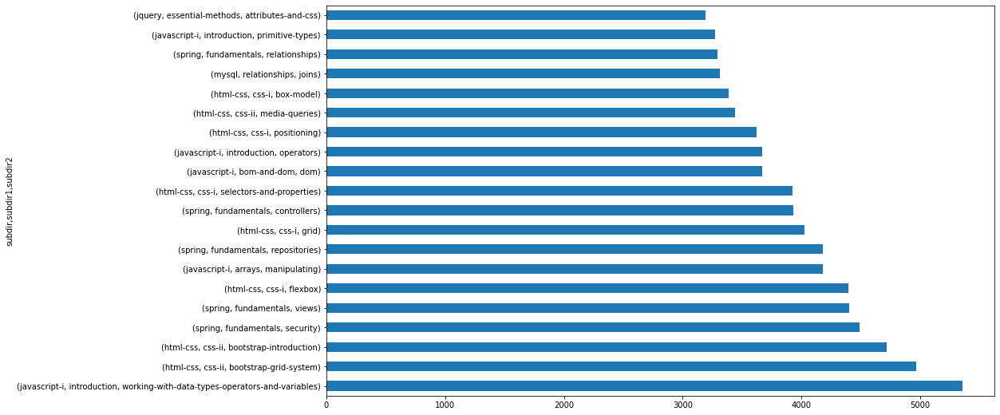

In [32]:
# lets check the most visited pages by the Web Development students. 

web_dev[['subdir', 'subdir1', 'subdir2']].value_counts().head(20)
web_dev[['subdir', 'subdir1', 'subdir2']].value_counts().head(20).plot(kind = 'barh')

<AxesSubplot:ylabel='subdir,subdir1,subdir2'>

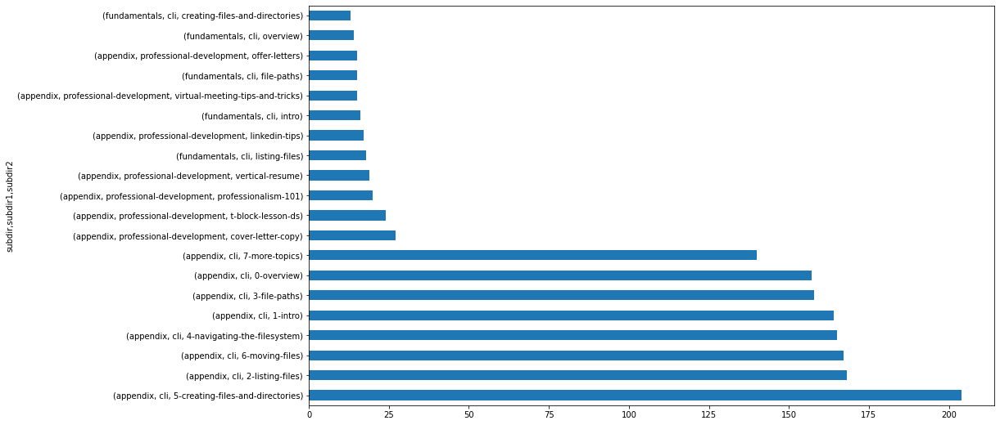

In [33]:
# lets check the most visited pages by the Data Science students. 

ds_df[['subdir', 'subdir1', 'subdir2']].value_counts().head(20)
ds_df[['subdir', 'subdir1', 'subdir2']].value_counts().head(20).plot(kind = 'barh')

**2. Is there a cohort that referred to a lesson significantly more that other cohorts seemed to gloss over?**

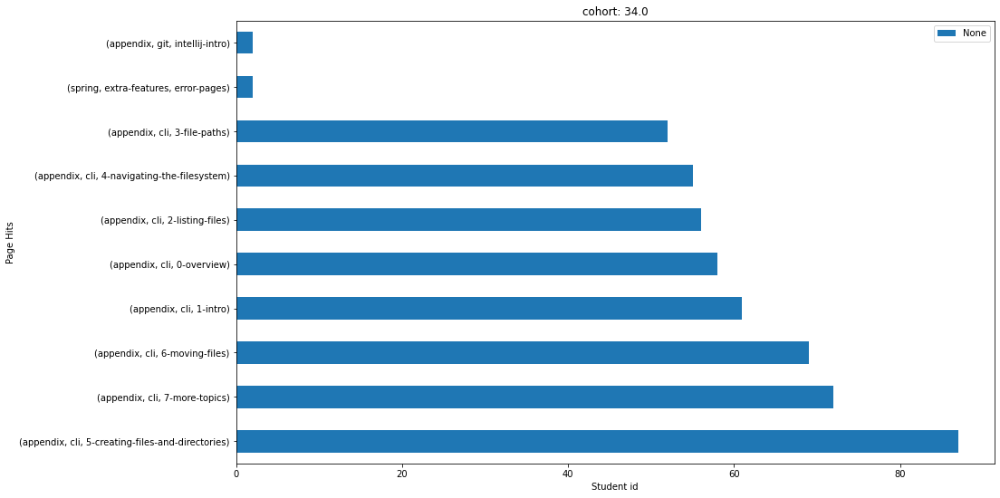

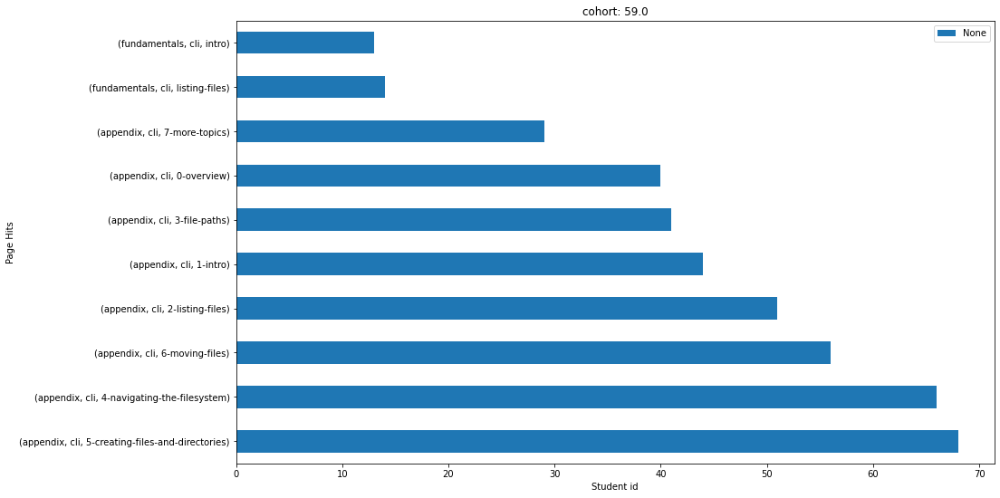

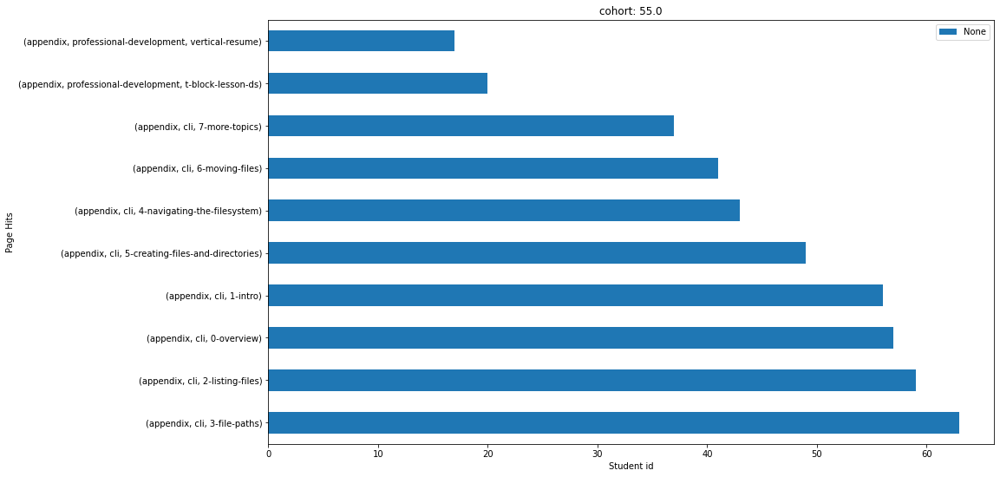

In [34]:
# Lets check the Data Science cohorts



val = [34.0, 59.0, 55.0]
for x in val:
    df1 = ds_df[ds_df.cohort_id == x]
    if df1.date.between(df1.start_date, df1.end_date, inclusive = True).any():
        df1[df1.date.between(df1.start_date, df1.end_date, inclusive = True)]\
        [['subdir', 'subdir1', 'subdir2']].value_counts().head(10).\
        plot(kind = 'barh')
    
        plt.title('cohort: ' + str(x))
        plt.xlabel('Student id')
        plt.ylabel('Page Hits')
        plt.legend()
        plt.show()
    else:
        print(f'No data found for {x} cohort.')

8.0
page         
/                210
java-iii          57
appendix          55
java-ii           46
java-i            46
spring            43
javascript-i      36
javascript-ii     31
dtype: int64


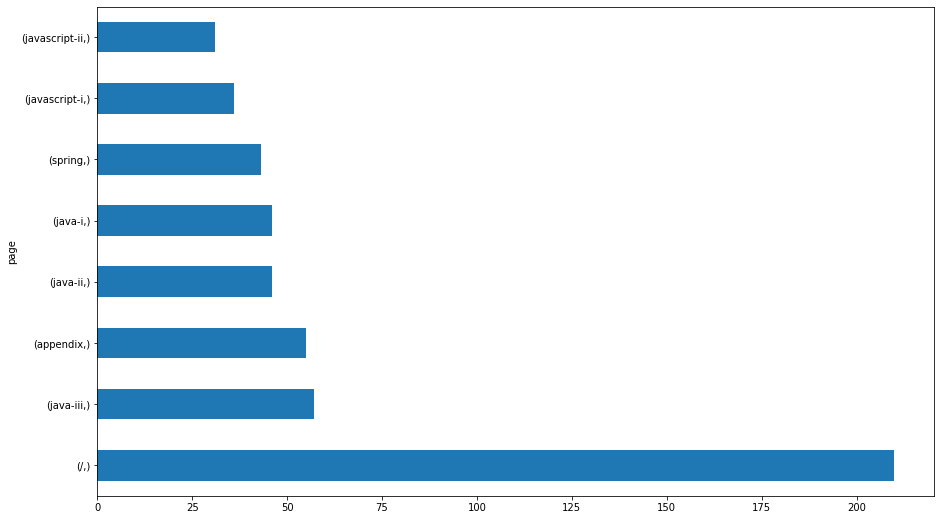


22.0
page                    
/                           1754
java-iii                     712
spring                       707
mysql                        631
mkdocs/search_index.json     595
javascript-i                 589
java-i                       501
jquery                       498
dtype: int64


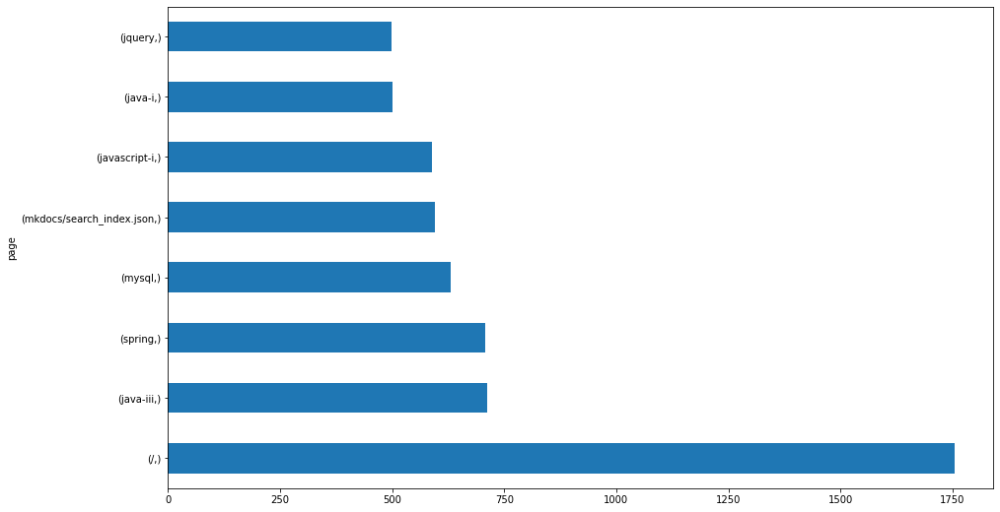


21.0
page                            
/                                   630
spring                              364
spring/fundamentals/views           207
javascript-i                        202
spring/fundamentals/controllers     190
spring/fundamentals/repositories    172
appendix                            170
html-css                            168
dtype: int64


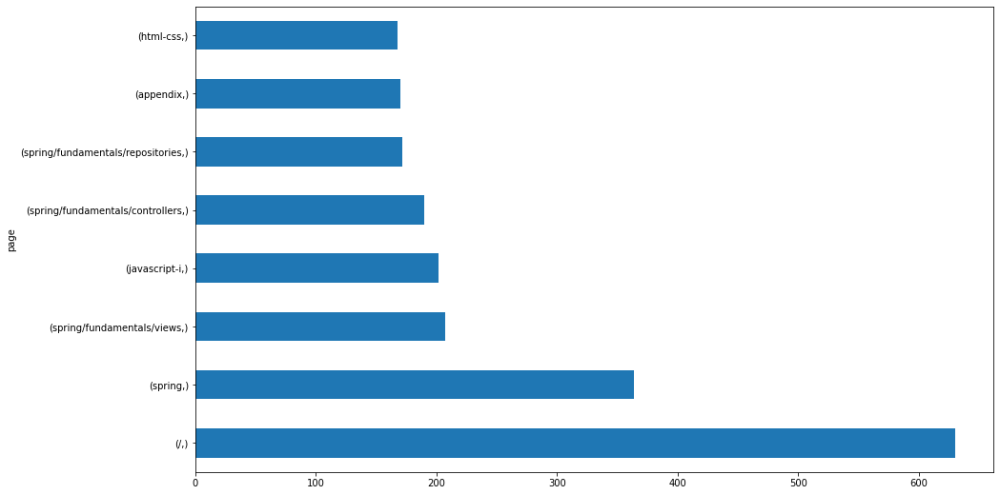


1.0
page         
/                622
javascript-i     294
html-css         215
javascript-ii    204
spring           192
java-ii          167
java-iii         153
appendix         133
dtype: int64


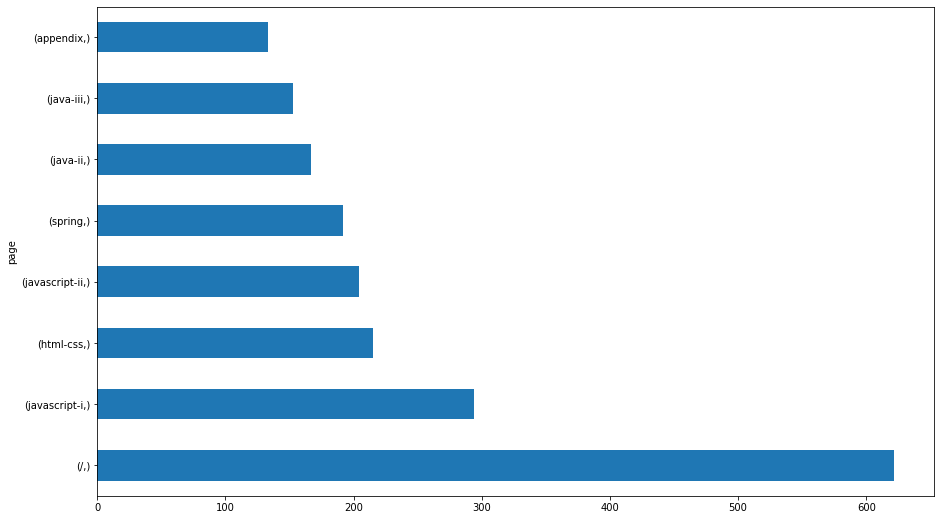


16.0
page         
spring           65
index.html       63
java-iii         29
/                29
mysql            24
javascript-i     23
javascript-ii    21
appendix         19
dtype: int64


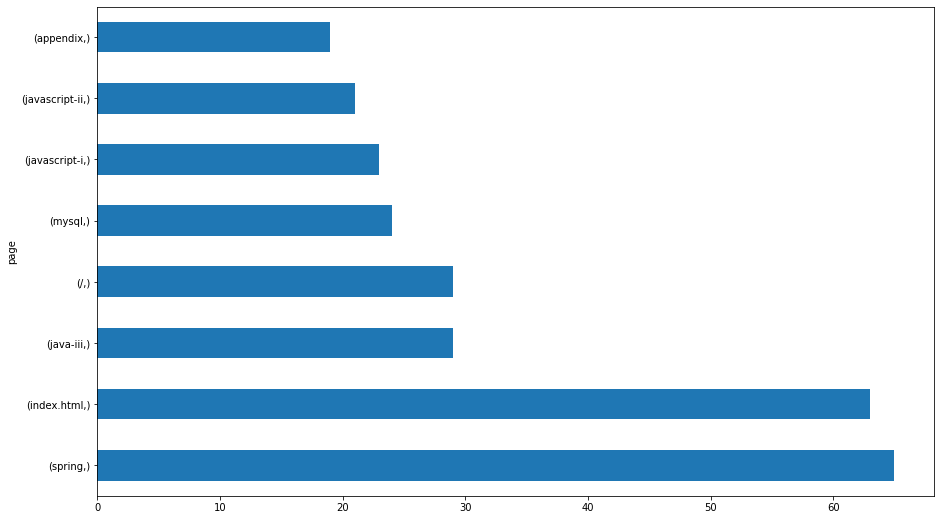


18.0
page             
/                    129
javascript-i          65
javascript-ii         55
html-css              55
javascript-ii/npm     50
java-i                49
spring                47
java-ii               41
dtype: int64


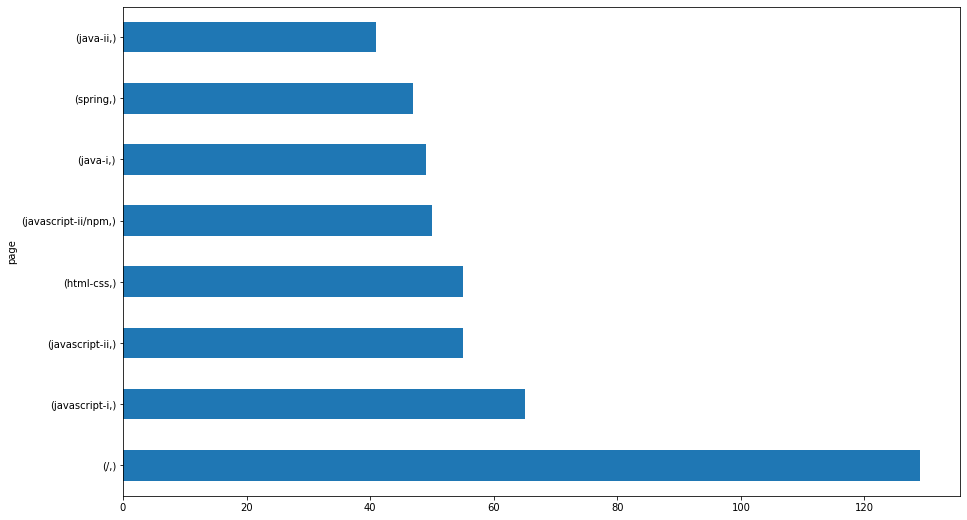


19.0
page                                            
/                                                   138
content/laravel/intro                                34
content/html-css                                     33
content/laravel/intro/environment.html               30
content/laravel/intro/application-structure.html     18
javascript-i/conditionals                            16
content/php_iii                                      16
content/php_iii/php-with-html                        15
dtype: int64


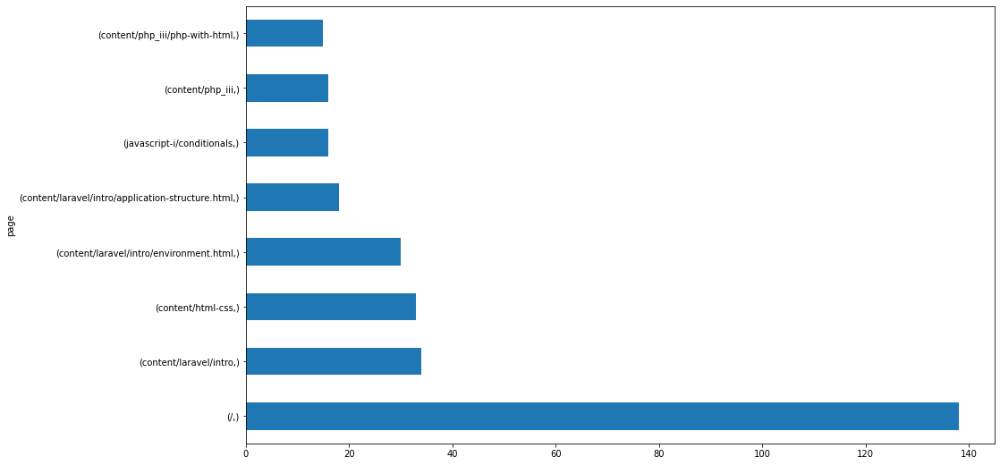


13.0
page                                            
/                                                   208
index.html                                           84
content/laravel/intro                                83
content/laravel/intro/application-structure.html     63
content/laravel/intro/gitbook/images/favicon.ico     56
content/php_iii                                      47
content/php_iv                                       42
content/php_ii                                       40
dtype: int64


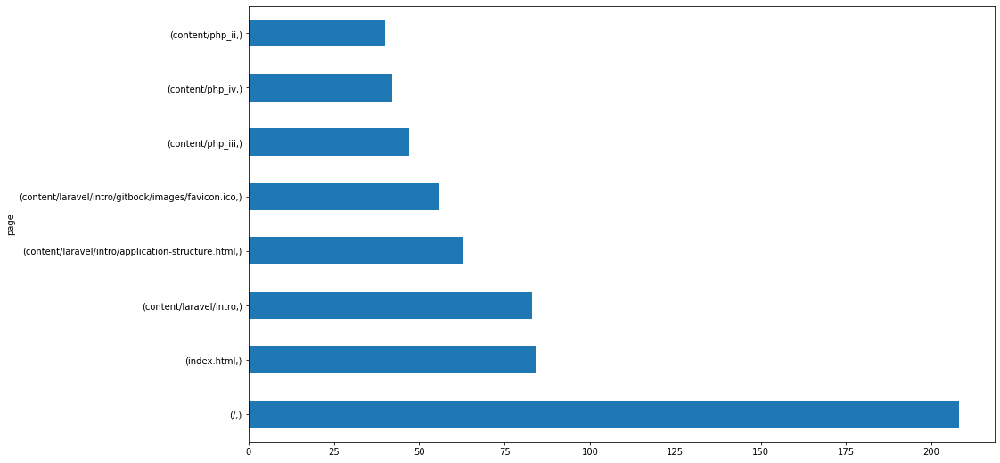


14.0
page        
index.html      877
javascript-i    233
java-iii        224
spring          222
html-css        174
appendix        170
java-ii         160
java-i          138
dtype: int64


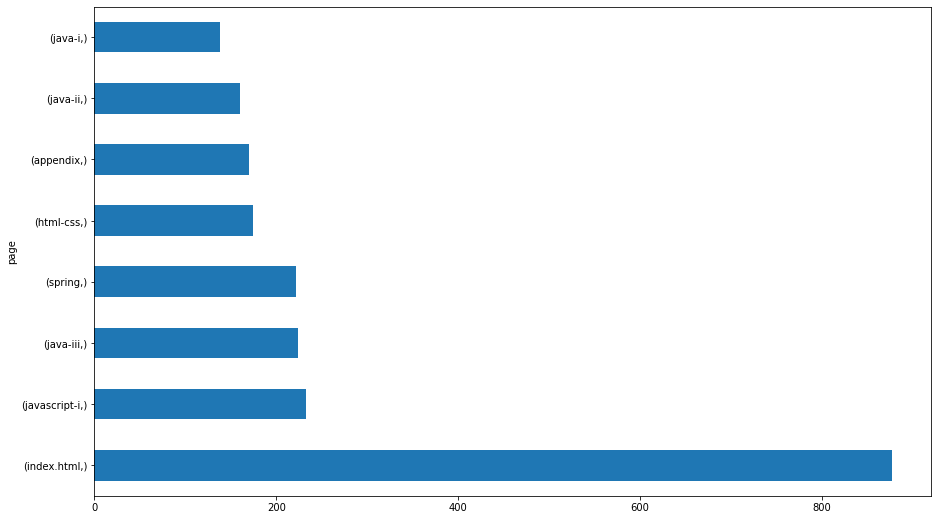


15.0
page                           
/                                  33
java-i                             19
java-iii                           13
spring/fundamentals/controllers    12
spring                             12
spring/fundamentals/views          11
java-ii                            10
javascript-ii                      10
dtype: int64


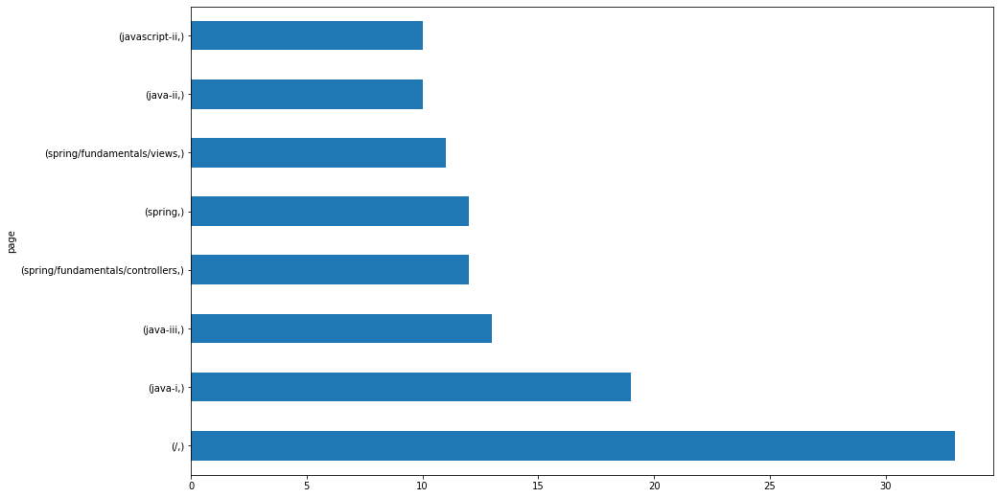


7.0
page                                                                     
/                                                                            34
javascript-i/introduction/working-with-data-types-operators-and-variables    24
html-css                                                                     21
javascript-i/functions                                                       20
javascript-i/introduction/variables                                          19
javascript-i/introduction/operators                                          18
content/html-css                                                             16
javascript-i/conditionals                                                    16
dtype: int64


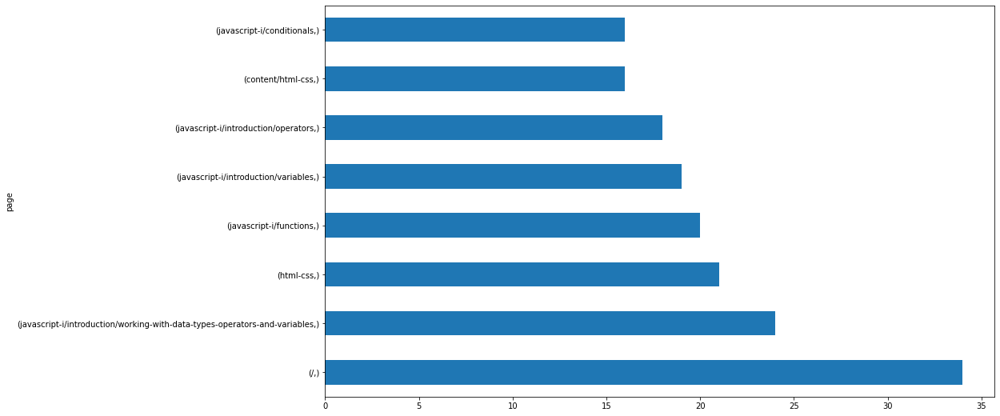


4.0
page                     
prework/versioning/github    1
prework/databases            1
mkdocs/search_index.json     1
/                            1
dtype: int64


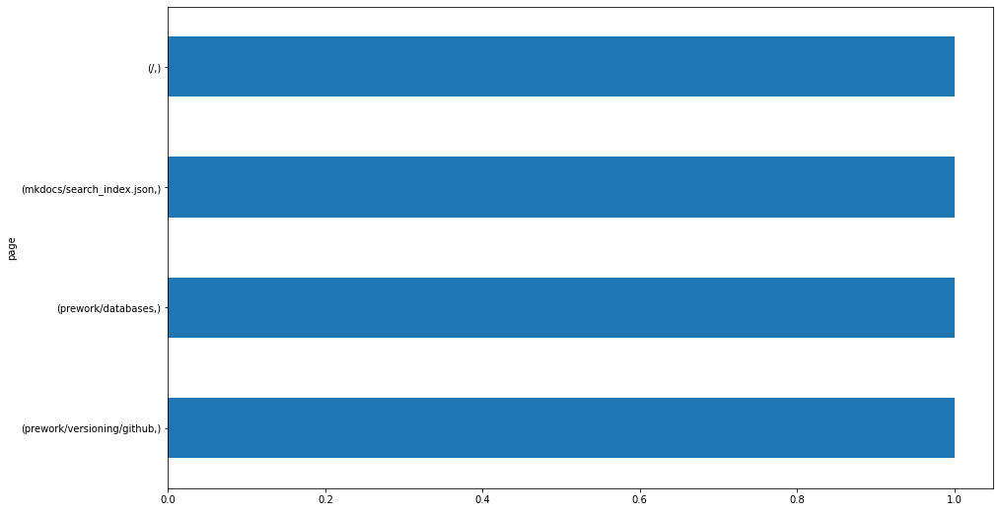


12.0
page                              
content/html-css                      19
content/html-css/introduction.html    14
content/javascript                    12
content/mysql/intro-to-mysql          10
content/html-css/elements.html         9
/                                      8
index.html                             8
content/html-css/forms.html            7
dtype: int64


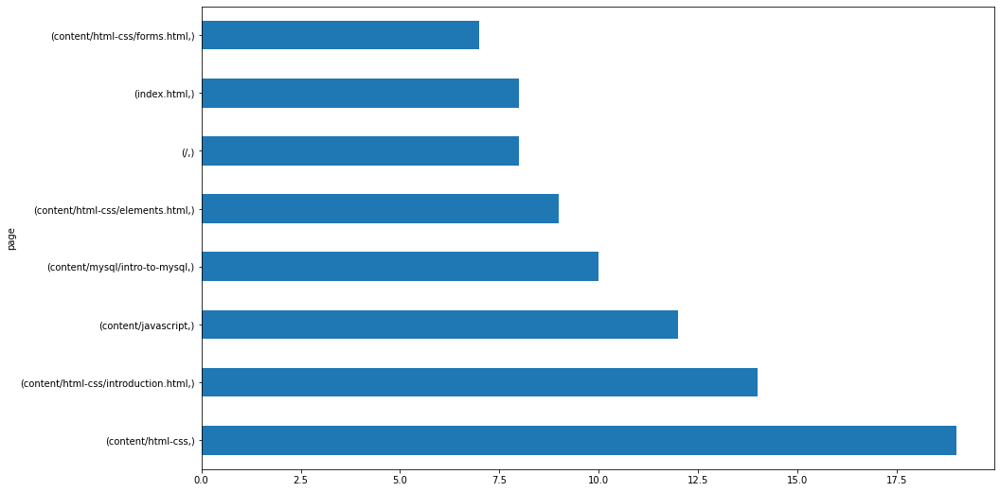


17.0
page                                                                     
/                                                                            244
javascript-i                                                                 128
java-i                                                                        76
jquery                                                                        71
java-i/methods                                                                69
html-css                                                                      69
javascript-i/introduction/working-with-data-types-operators-and-variables     65
javascript-i/javascript-with-html                                             63
dtype: int64


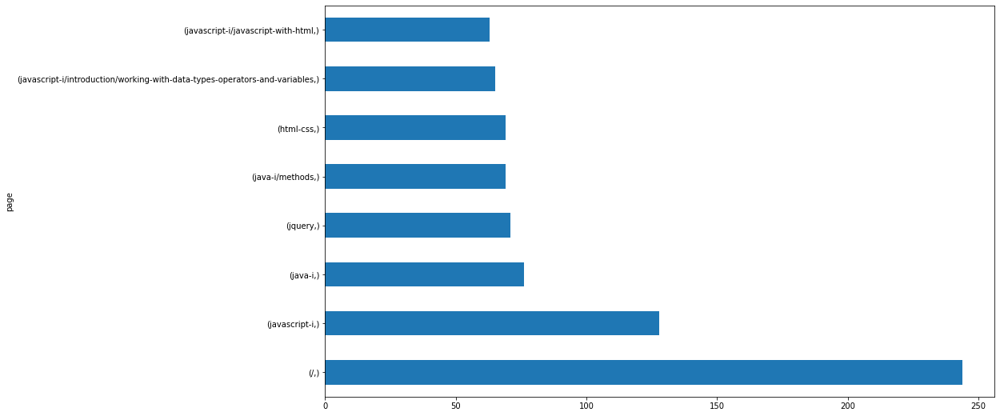


23.0
page                    
/                           1618
mkdocs/search_index.json     721
html-css                     555
javascript-i                 523
java-ii                      423
java-iii                     411
spring                       396
java-i                       375
dtype: int64


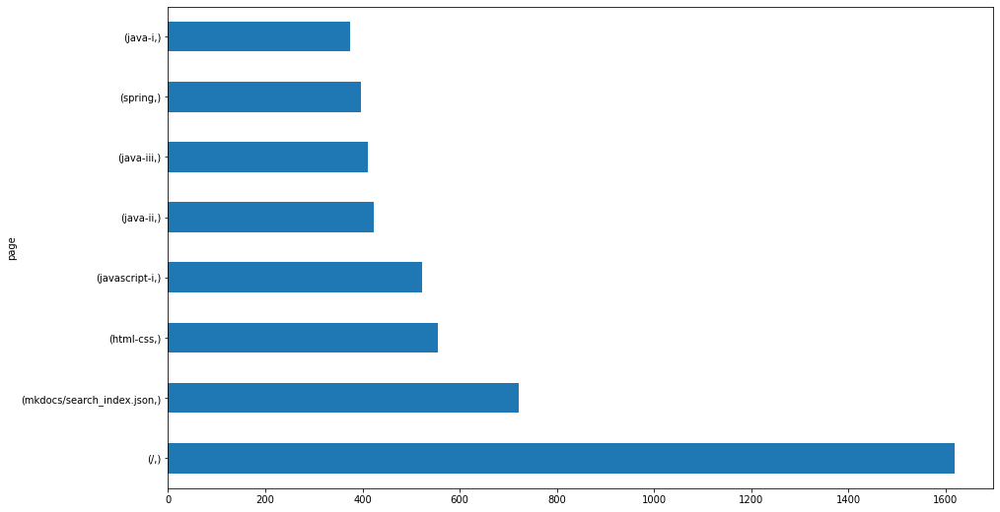


2.0
page                                       
/                                              17
content/php_ii/command-line                     6
content/php_ii/control-structures-i             5
content/php_i                                   5
content/php_ii/command-line/io-streams.html     5
content/php_ii                                  4
content/php_i/intro-via-interactive-shell       3
content/laravel/intro                           2
dtype: int64


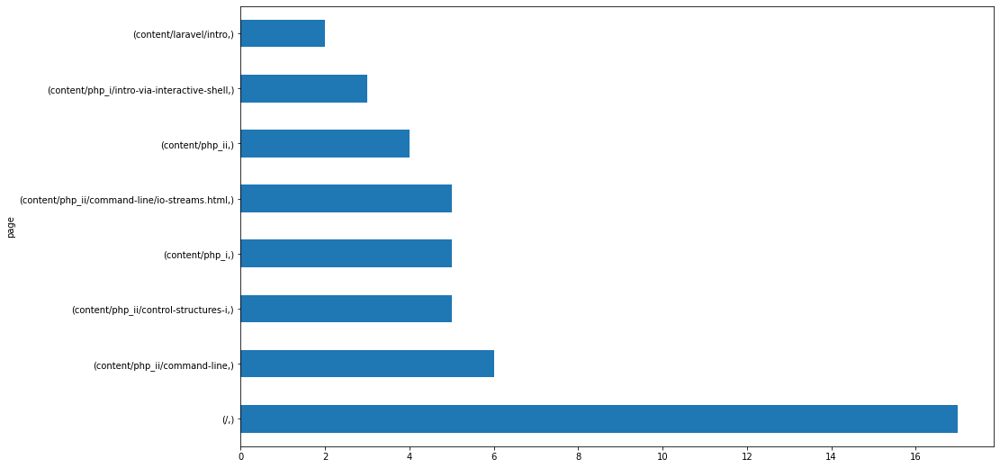


9.0
page                                       
content/html-css                               2
content/html-css/introduction.html             1
content/html-css/gitbook/images/favicon.ico    1
/                                              1
dtype: int64


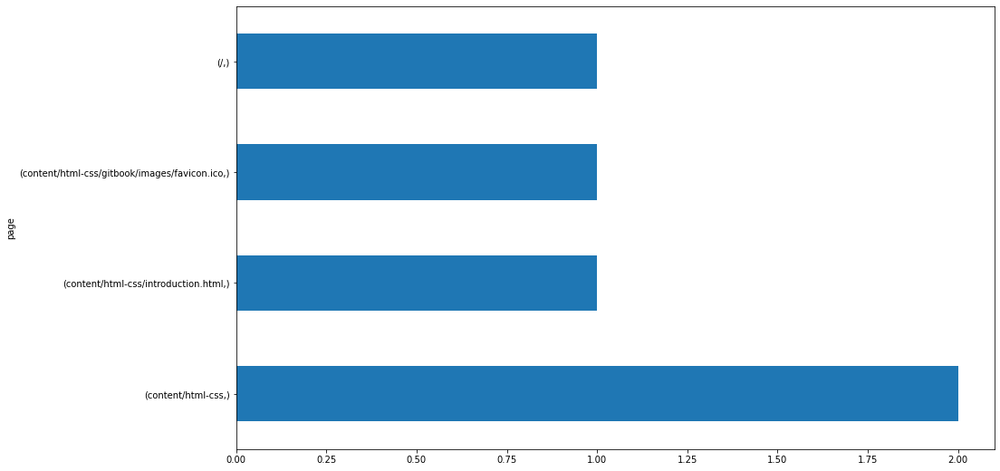


11.0
page                 
html-css                 12
html-css/elements        11
html-css/introduction    10
/                         8
html-css/forms            8
javascript-i              7
content/html-css          7
html-css/css-i            6
dtype: int64


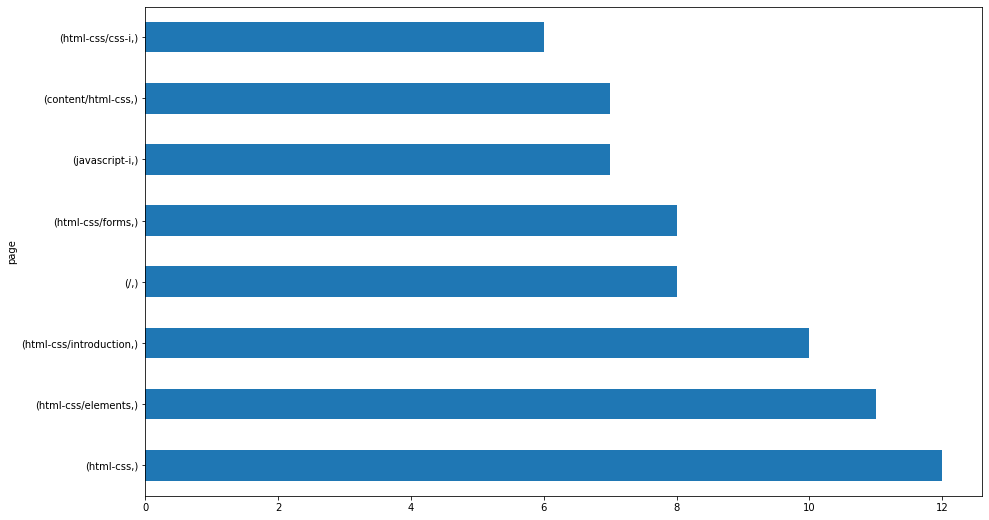


24.0
page         
/                2098
javascript-i      884
java-iii          770
java-ii           754
mysql             663
spring            650
java-i            639
javascript-ii     584
dtype: int64


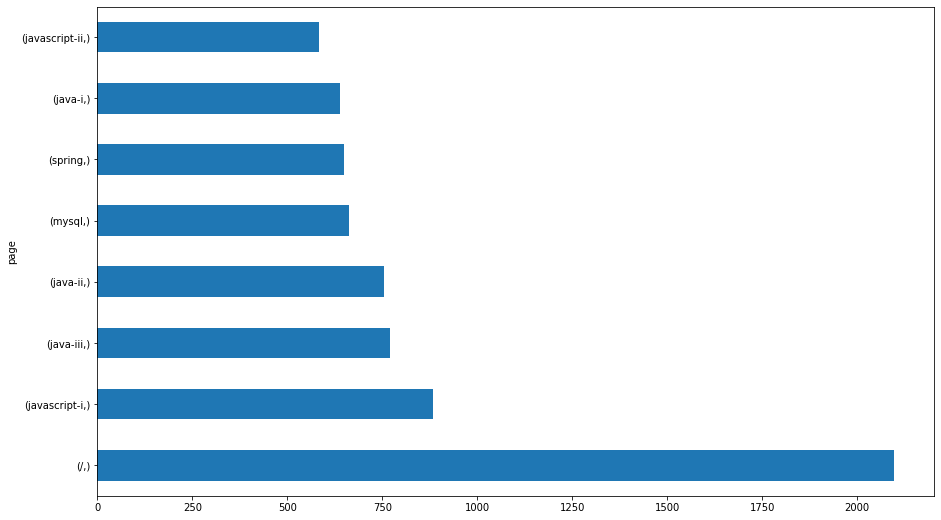


25.0
page                    
/                           1112
toc                          990
javascript-i                 553
search/search_index.json     489
html-css                     405
java-i                       401
jquery                       374
java-iii                     335
dtype: int64


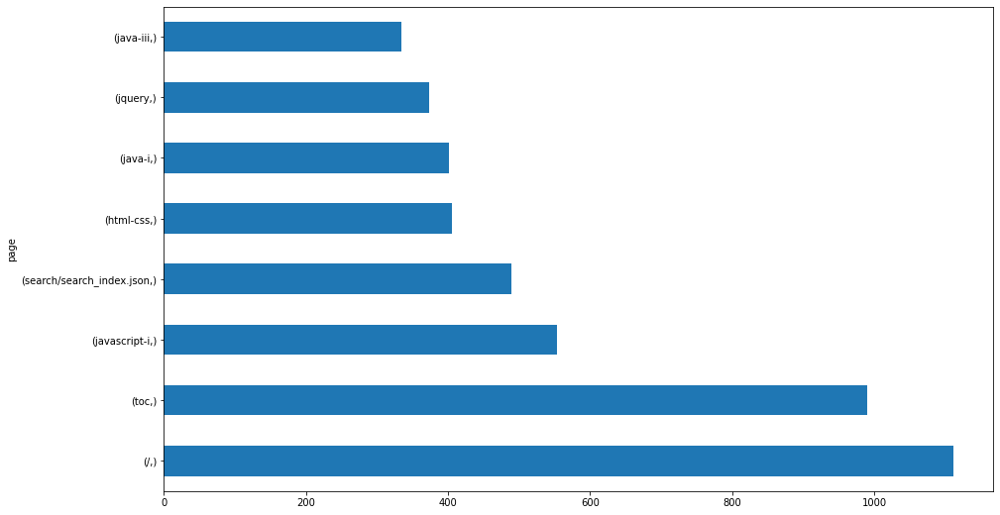


26.0
page                    
/                           916
javascript-i                718
html-css                    587
search/search_index.json    576
jquery                      543
mysql                       507
java-ii                     501
java-iii                    495
dtype: int64


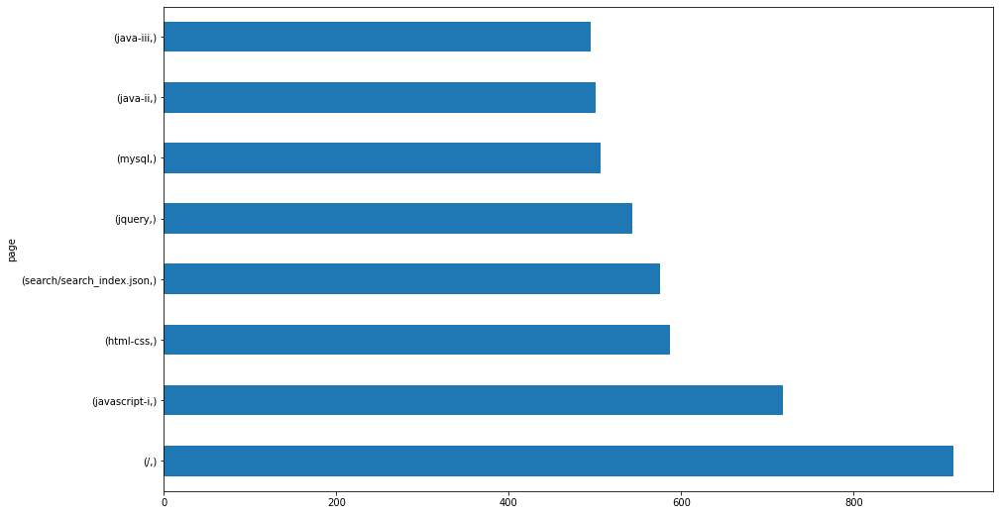


6.0
page                       
javascript-ii/es6              10
/                               4
java-i                          3
java-ii                         3
java-iii                        3
java-iii/user-input             3
javascript-i                    2
javascript-i/coffee-project     2
dtype: int64


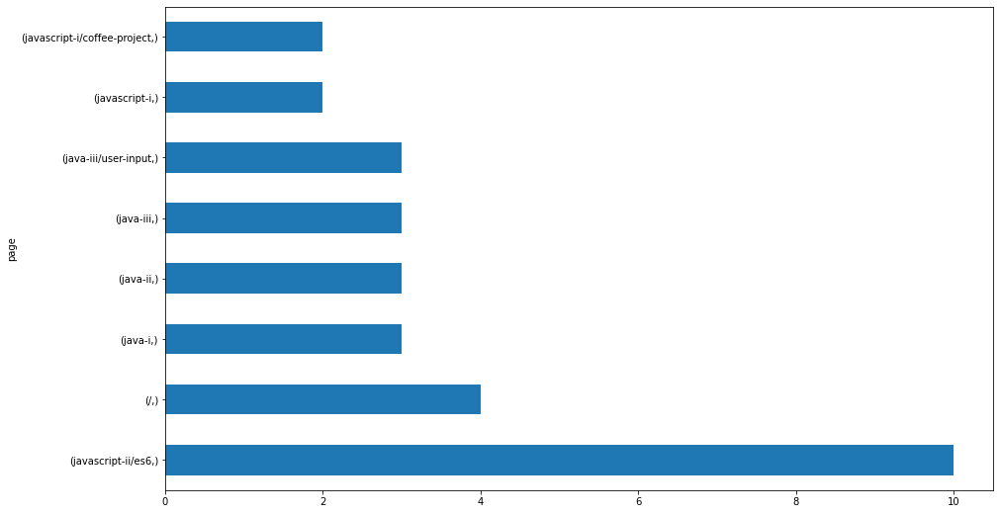


27.0
page                    
/                           962
toc                         686
javascript-i                437
spring                      374
html-css                    362
search/search_index.json    361
java-iii                    340
javascript-ii               332
dtype: int64


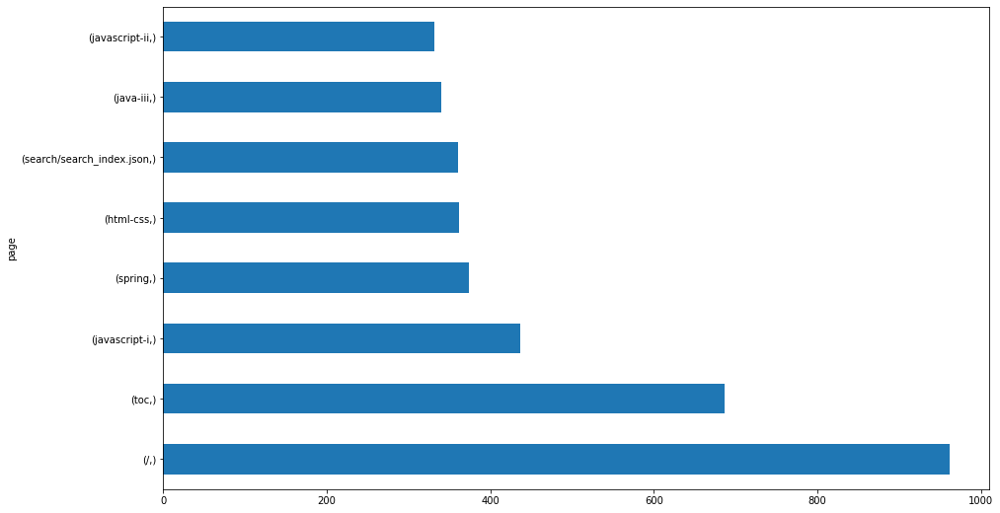


29.0
page                    
/                           1756
toc                         1457
javascript-i                 868
java-iii                     742
search/search_index.json     689
spring                       650
html-css                     649
javascript-ii                637
dtype: int64


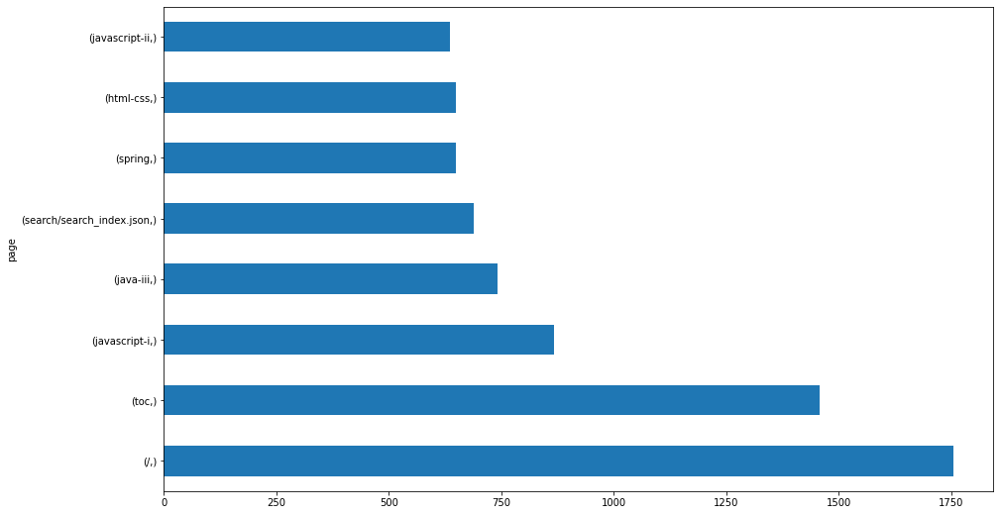


31.0
page        
/               1156
toc              637
javascript-i     509
spring           485
java-iii         430
java-ii          395
html-css         372
mysql            346
dtype: int64


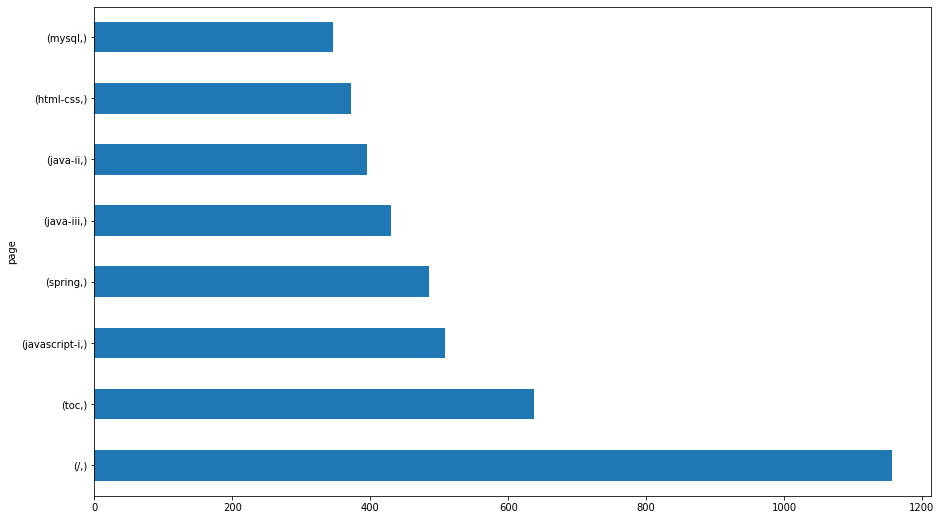


32.0
page                    
/                           868
search/search_index.json    718
javascript-i                686
toc                         577
jquery                      540
html-css/elements           472
java-iii                    444
java-ii                     444
dtype: int64


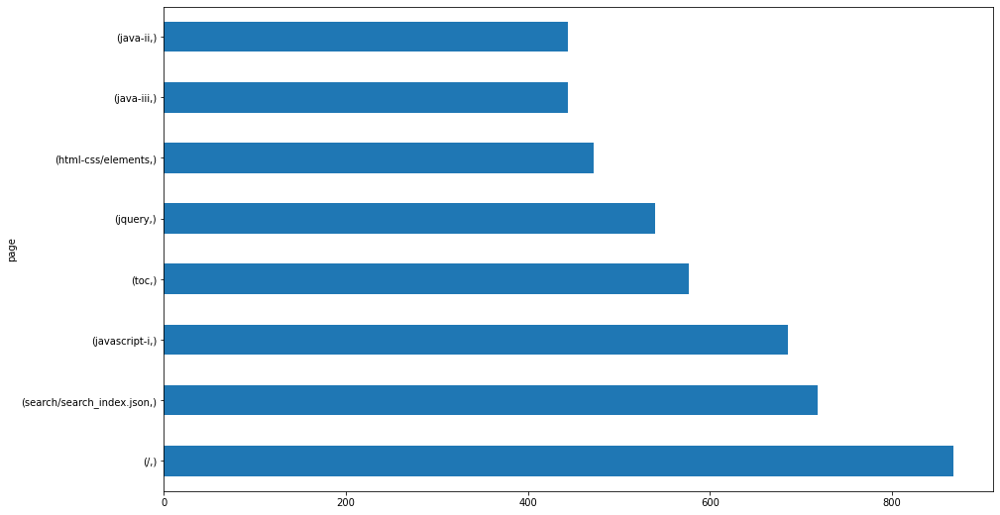


33.0
page                    
/                           1620
search/search_index.json    1376
javascript-i                 977
toc                          909
html-css                     753
java-iii                     674
java-ii                      667
jquery                       632
dtype: int64


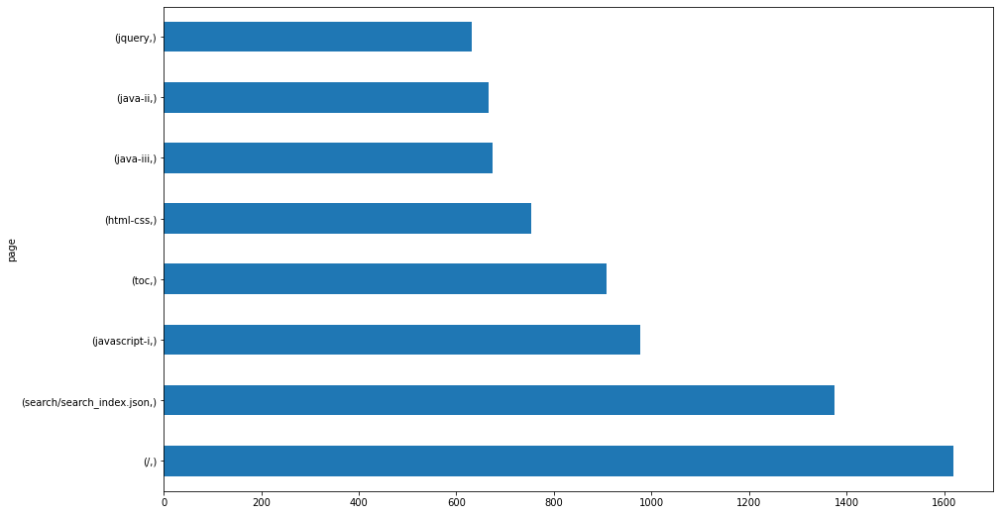


51.0
page                    
/                           1319
javascript-i                 696
search/search_index.json     662
html-css                     609
toc                          569
java-iii                     517
spring                       512
java-ii                      506
dtype: int64


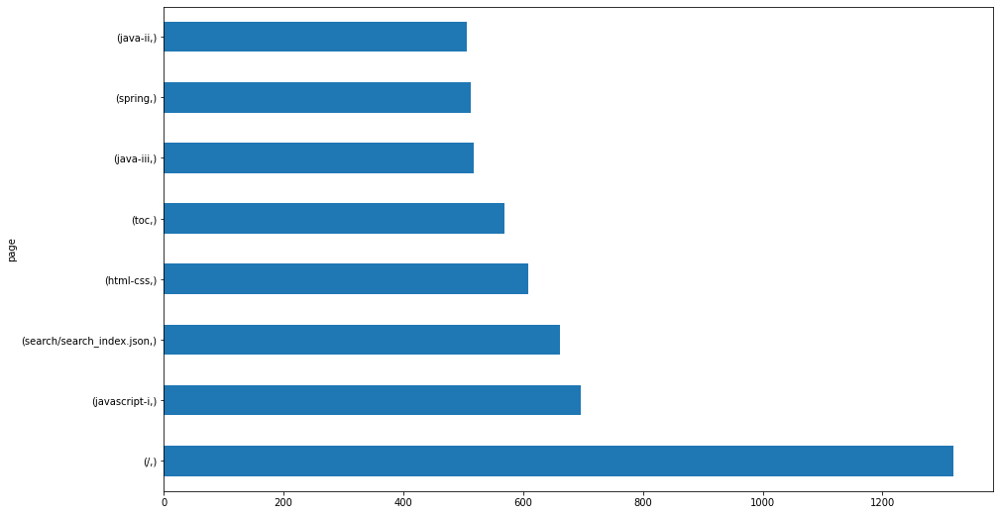


52.0
page                    
/                           1223
toc                          949
search/search_index.json     734
javascript-i                 478
java-iii                     443
html-css/elements            422
mysql                        367
java-ii                      366
dtype: int64


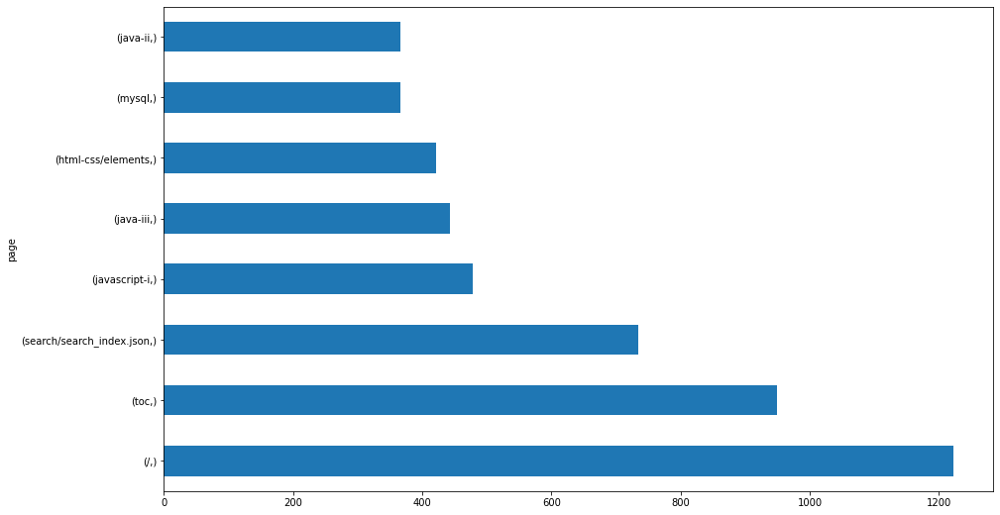


53.0
page                    
/                           1962
toc                         1273
search/search_index.json     989
java-iii                     767
javascript-i                 756
java-ii                      637
spring                       616
html-css                     578
dtype: int64


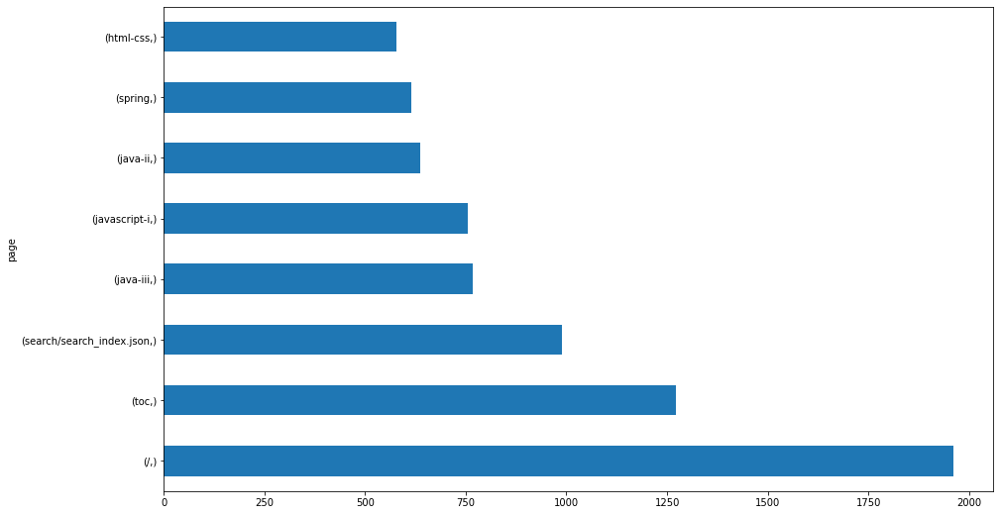


56.0
page                    
search/search_index.json    1361
/                           1244
toc                          799
html-css                     708
java-iii                     616
javascript-i                 610
java-ii                      595
spring                       572
dtype: int64


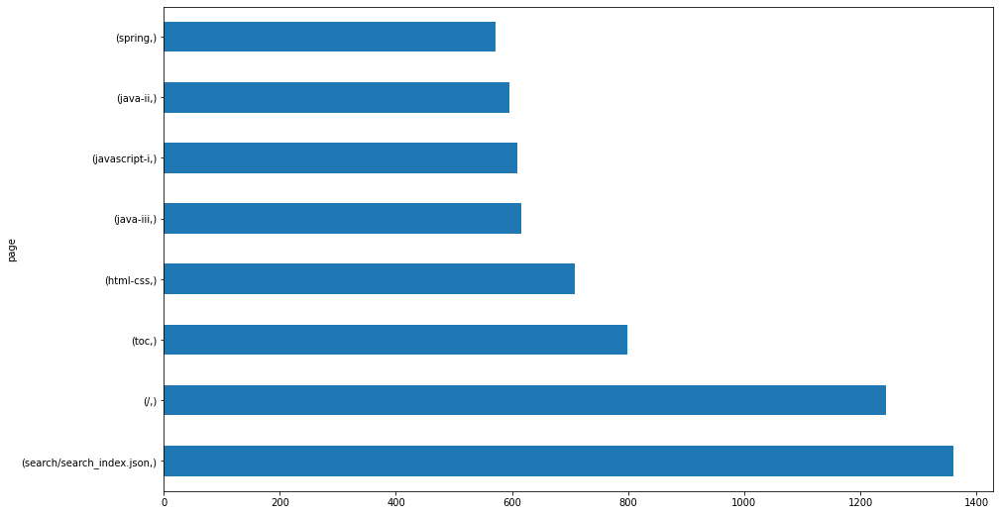


57.0
page                    
/                           1618
search/search_index.json    1050
toc                          810
javascript-i                 694
java-iii                     620
java-ii                      607
appendix                     526
jquery                       496
dtype: int64


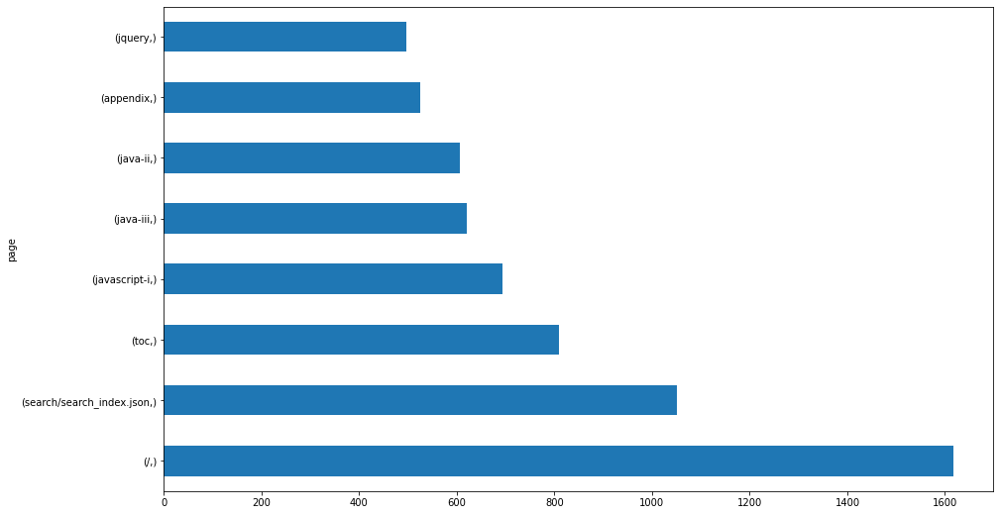


5.0
page
/       1
dtype: int64


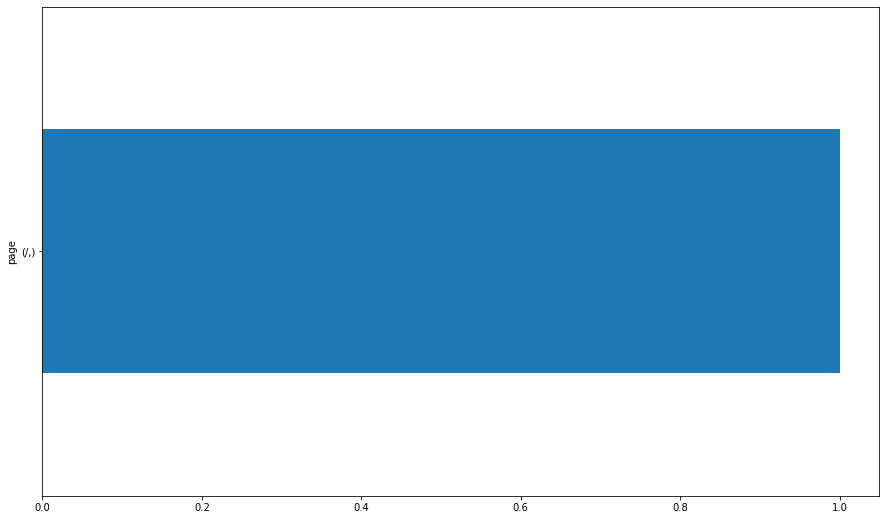


58.0
page                    
/                           1245
toc                          977
javascript-i                 884
java-iii                     651
java-ii                      632
search/search_index.json     630
mysql                        517
jquery                       490
dtype: int64


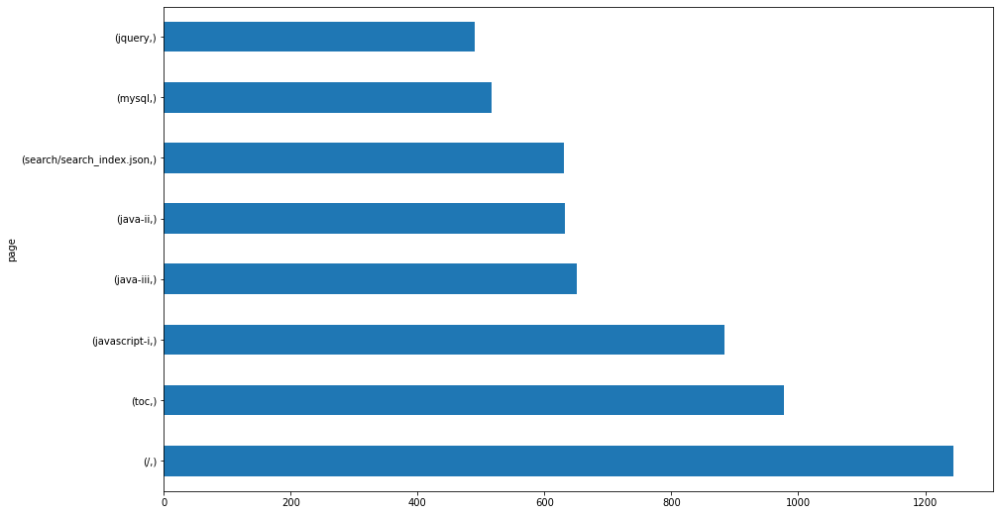


61.0
page                     
/                            532
search/search_index.json     363
javascript-i                 319
toc                          317
jquery                       233
html-css                     214
java-ii                      190
javascript-i/introduction    176
dtype: int64


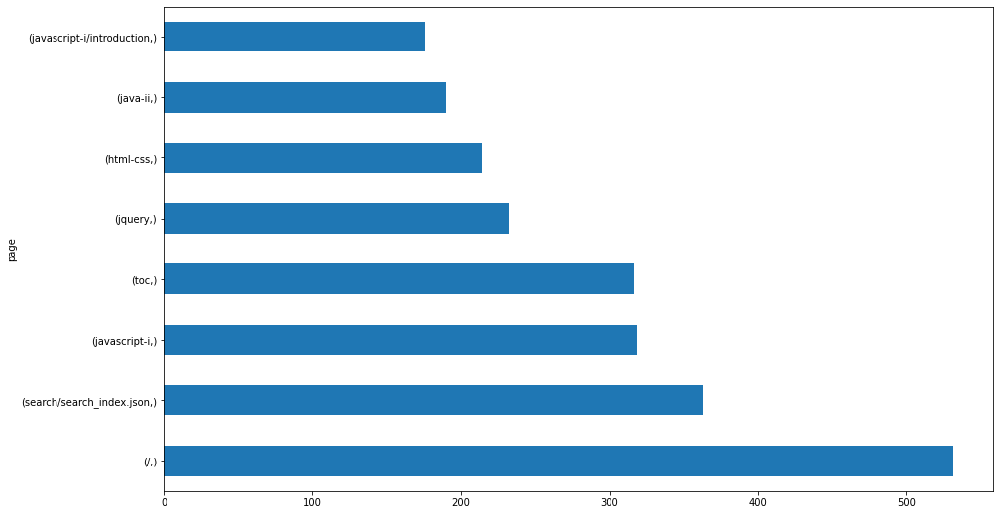


62.0
page                                                                     
toc                                                                          762
/                                                                            600
javascript-i                                                                 426
html-css                                                                     423
javascript-i/introduction/working-with-data-types-operators-and-variables    338
javascript-i/javascript-with-html                                            300
javascript-i/functions                                                       256
html-css/elements                                                            249
dtype: int64


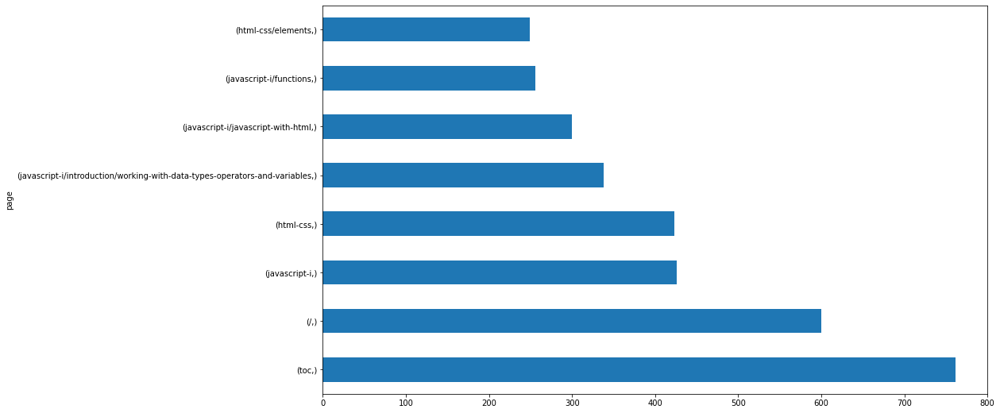

In [35]:
# Lets check the Web Development cohorts

val = [8.0,22.0,21.0,1.0,16.0,18.0,19.0,13.0,14.0,15.0,7.0,4.0,12.0,17.0,23.0,2.0,9.0,
       11.0,24.0,25.0,26.0,6.0,27.0,29.0,31.0,32.0,33.0,51.0, 52.0,53.0,56.0,57.0,
       5.0,58.0,61.0,62.0]
for p in val:
    print(p)
    print(web_dev[web_dev.cohort_id == p][['page']].value_counts().head(8))
    web_dev[web_dev.cohort_id == p][['page']].value_counts().head(8).plot(kind = 'barh')
    plt.show()
    print()

**3. Are there students who, when active, hardly access the curriculum? If so, what information do you have about these students?**

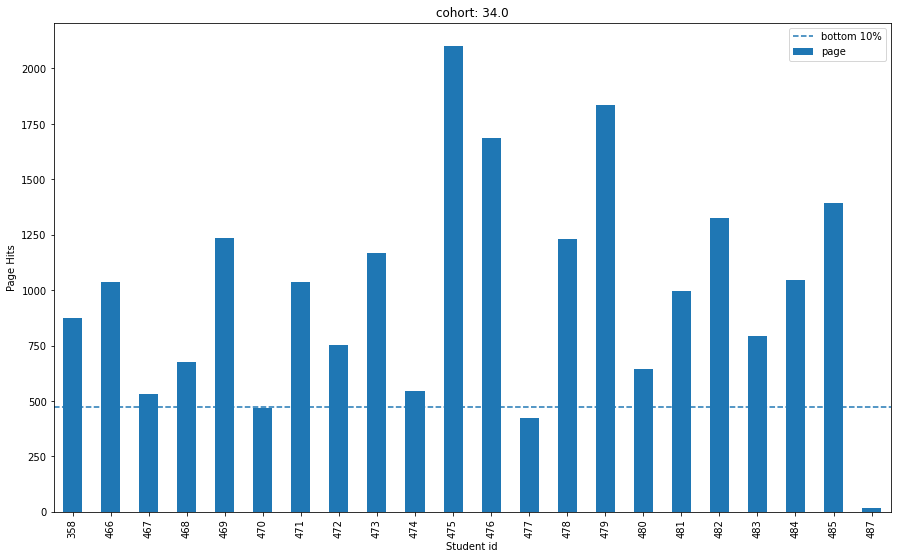

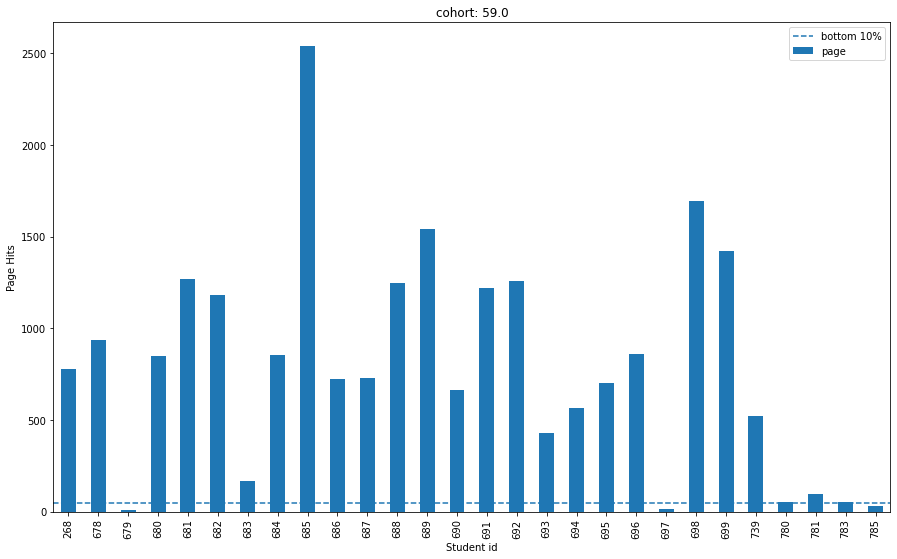

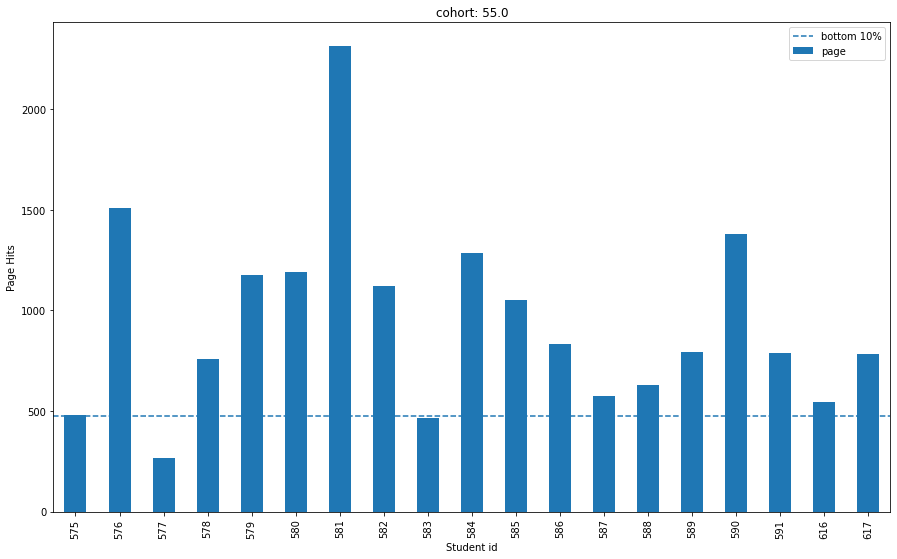

In [36]:
# For Data Science Cohorts

val = [34.0, 59.0, 55.0]
for x in val:
    df1 = ds_df[ds_df.cohort_id == x]
    if df1.date.between(df1.start_date, df1.end_date, inclusive = True).any():
        df1[df1.date.between(df1.start_date, df1.end_date, inclusive = True)].groupby('user_id').page.count().\
        plot(kind = 'bar')
        low_lim = df1[df1.date.between(df1.start_date, df1.end_date, inclusive = True)].groupby('user_id').page.count().quantile(q = 0.1)
        plt.axhline(y = low_lim, xmin = 0, xmax = 1, linestyle = '--', label = 'bottom 10%')
    
        plt.title('cohort: ' + str(x))
        plt.xlabel('Student id')
        plt.ylabel('Page Hits')
        plt.legend()
        plt.show()
    else:
        print(f'No data found for {x} cohort.')

    

No data found for 8.0 cohort.


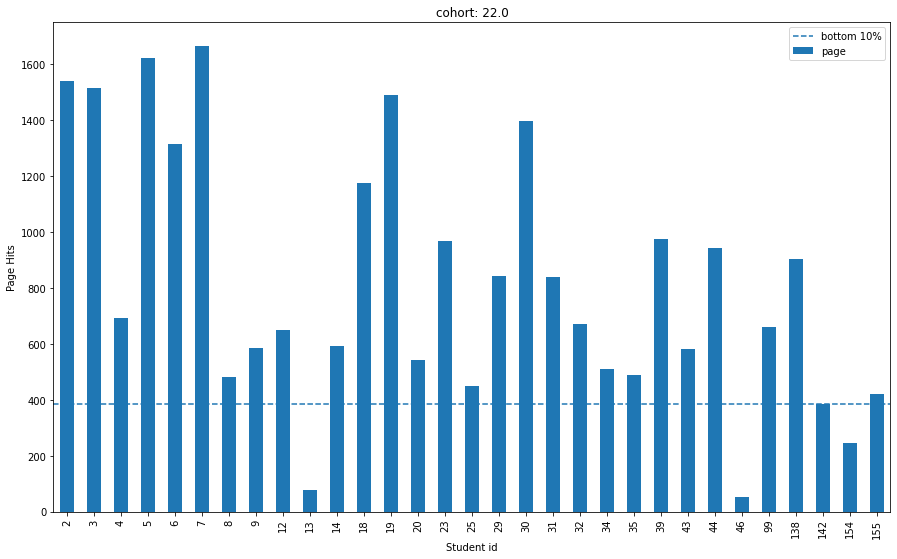

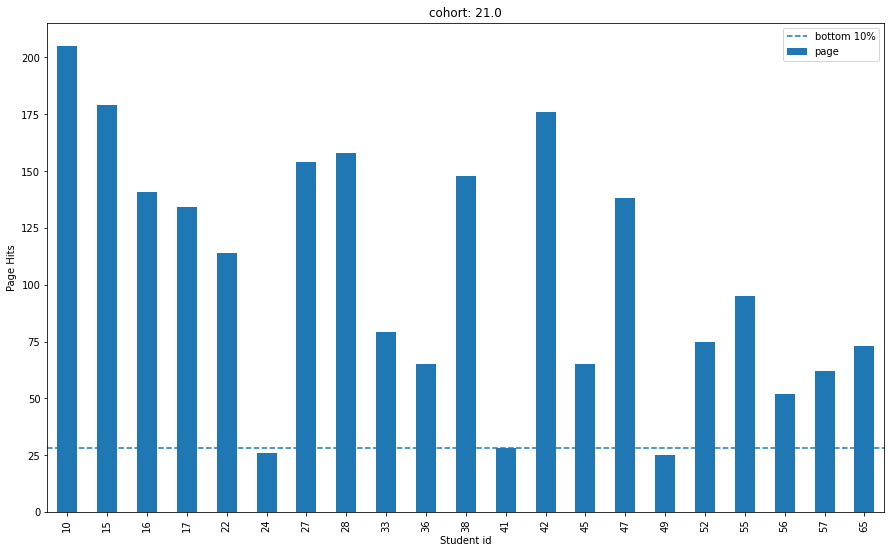

No data found for 1.0 cohort.
No data found for 16.0 cohort.
No data found for 18.0 cohort.
No data found for 19.0 cohort.
No data found for 13.0 cohort.
No data found for 14.0 cohort.
No data found for 15.0 cohort.
No data found for 7.0 cohort.
No data found for 4.0 cohort.
No data found for 12.0 cohort.
No data found for 17.0 cohort.


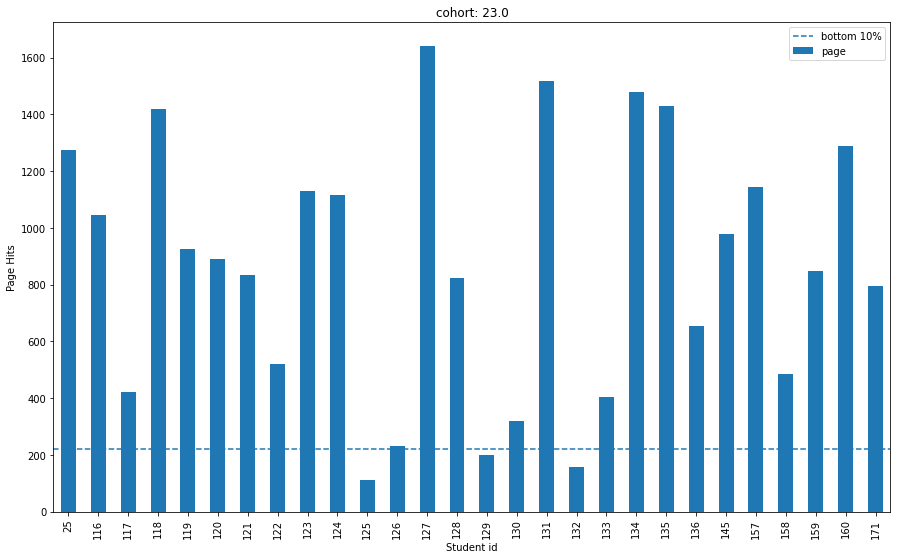

No data found for 2.0 cohort.
No data found for 9.0 cohort.
No data found for 11.0 cohort.


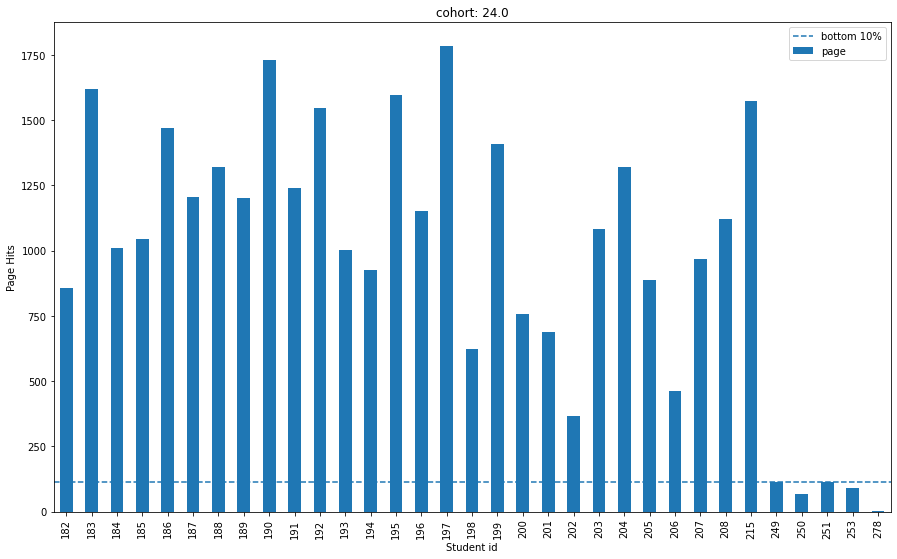

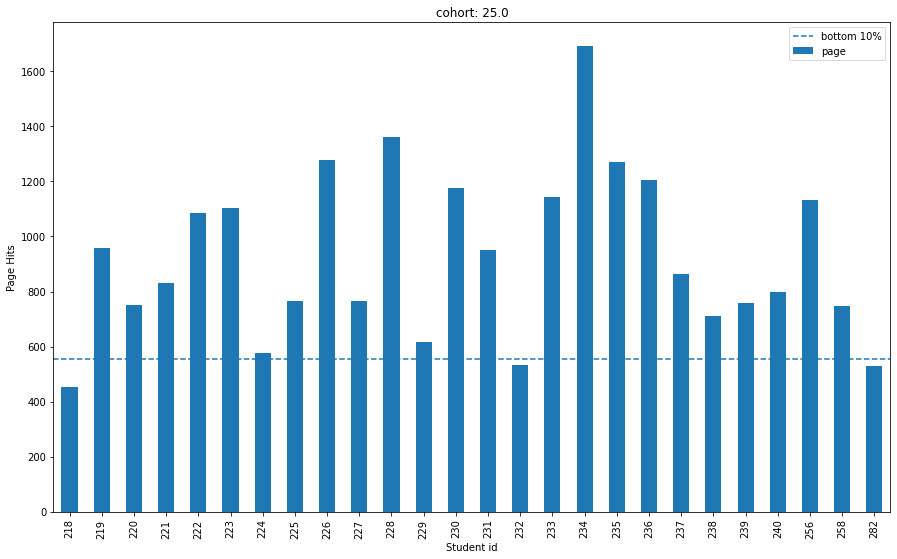

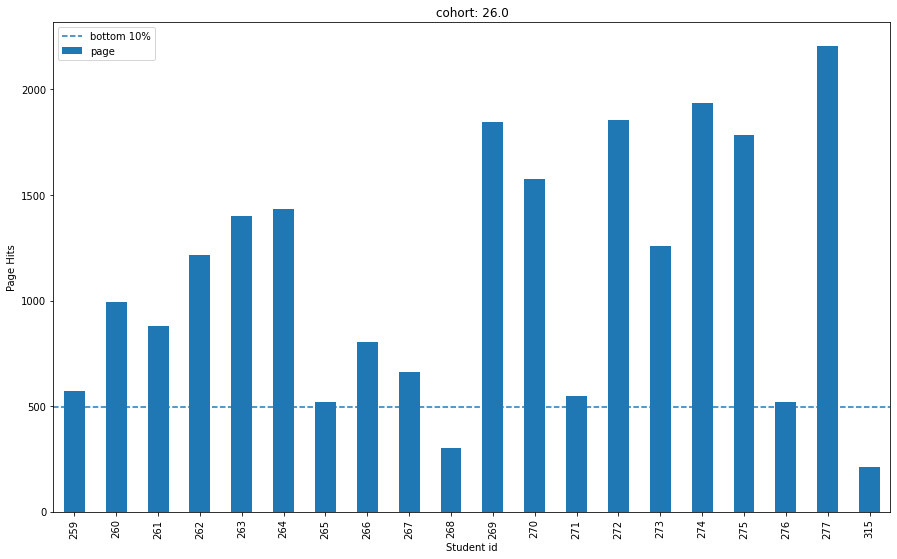

No data found for 6.0 cohort.


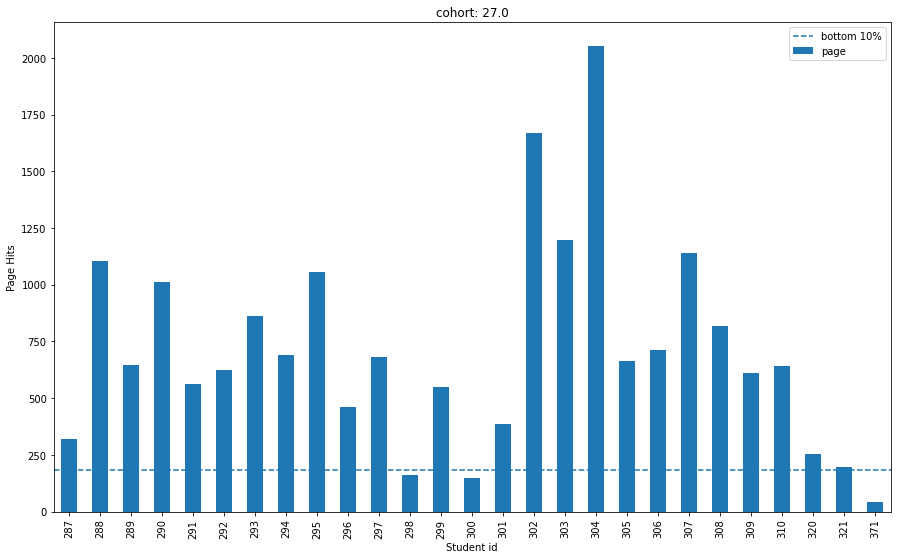

No data found for 28.0 cohort.


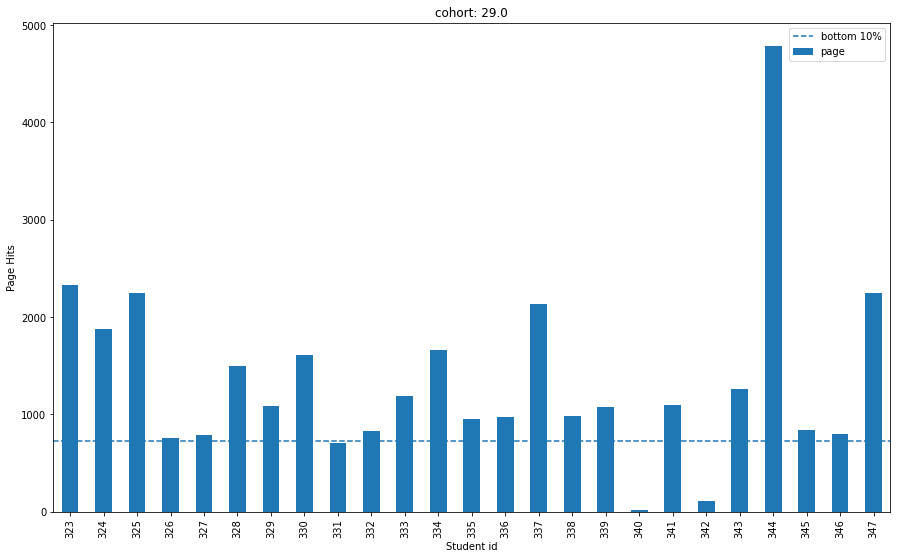

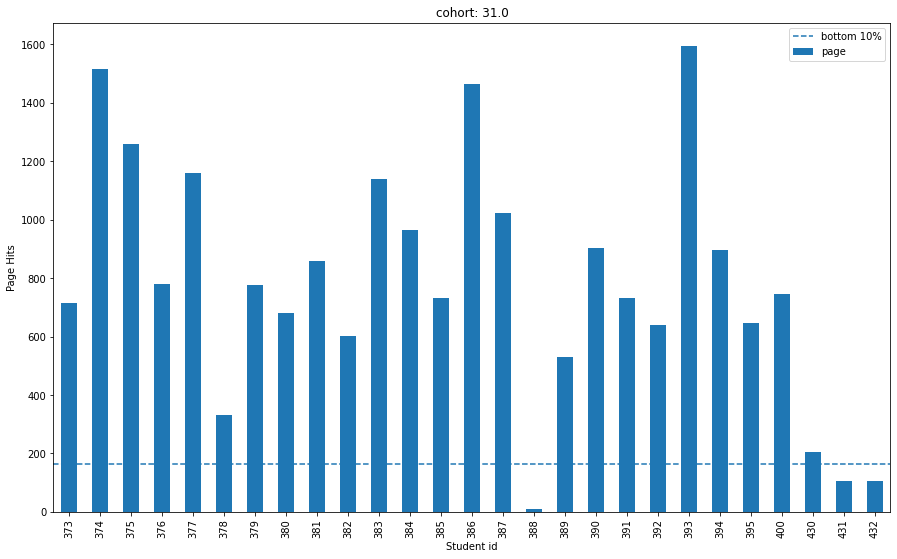

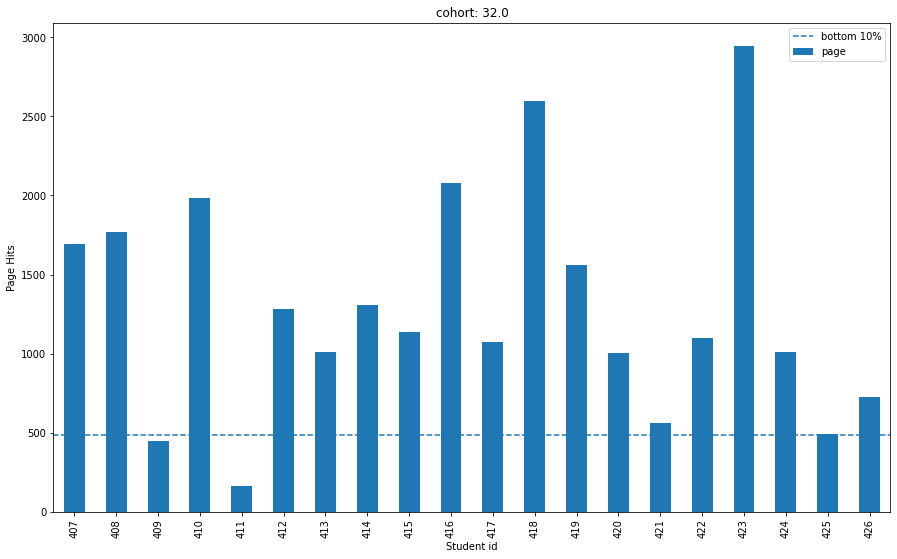

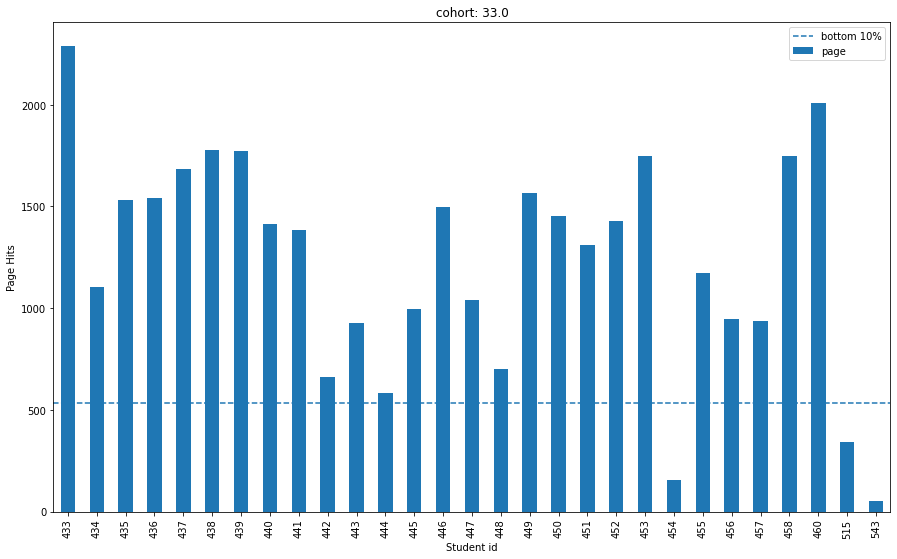

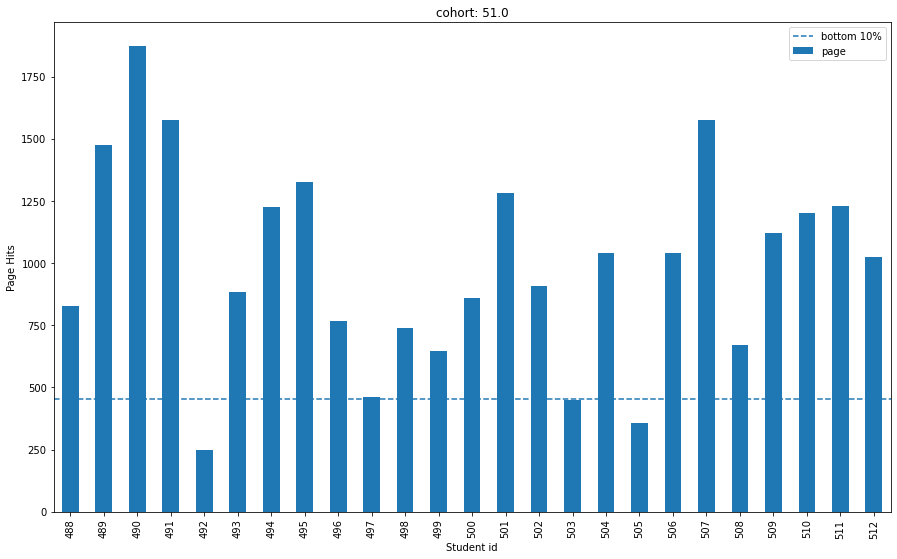

...

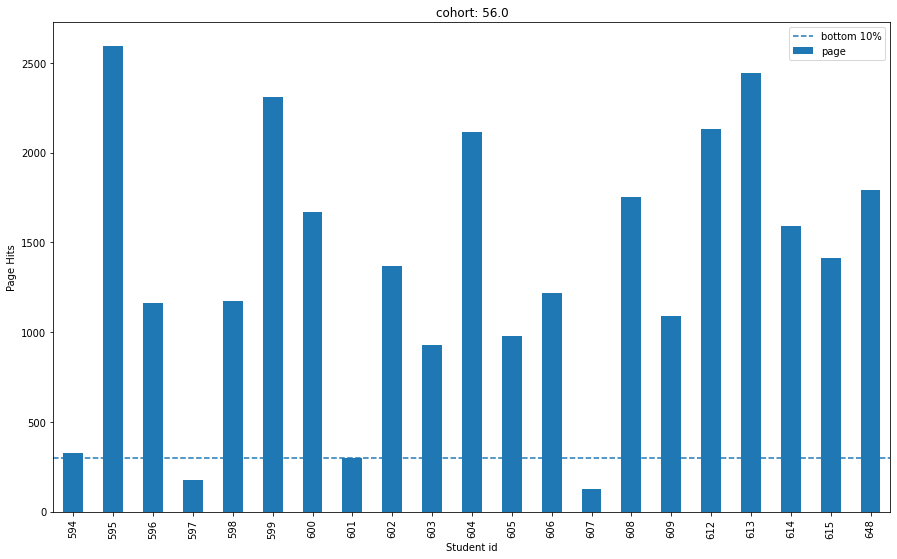

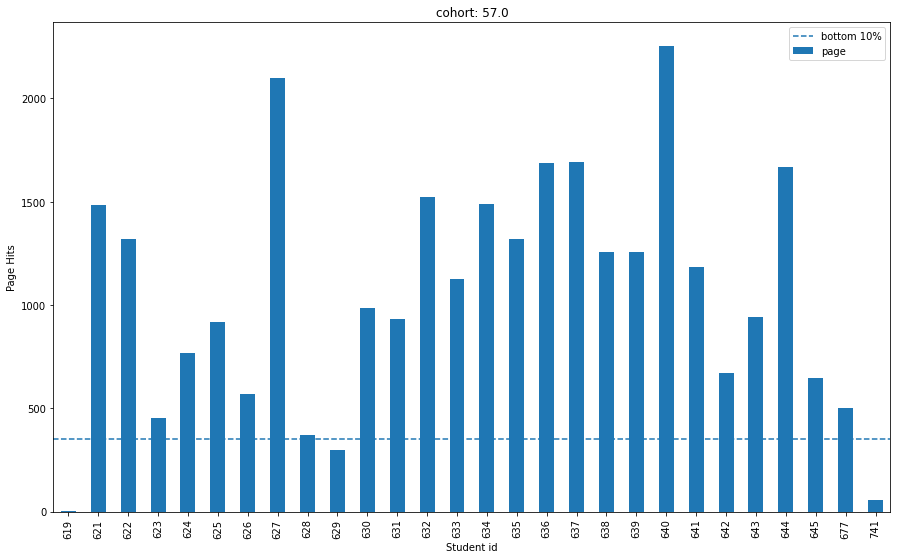

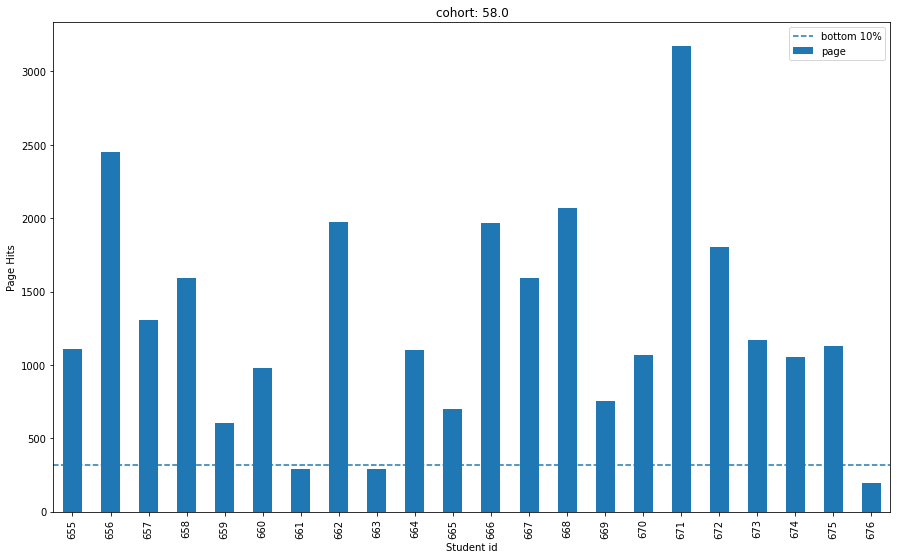

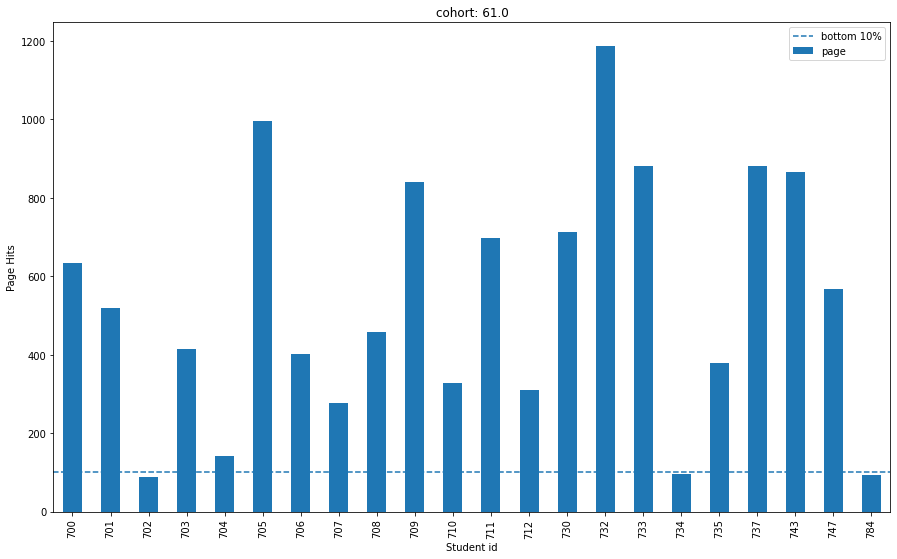

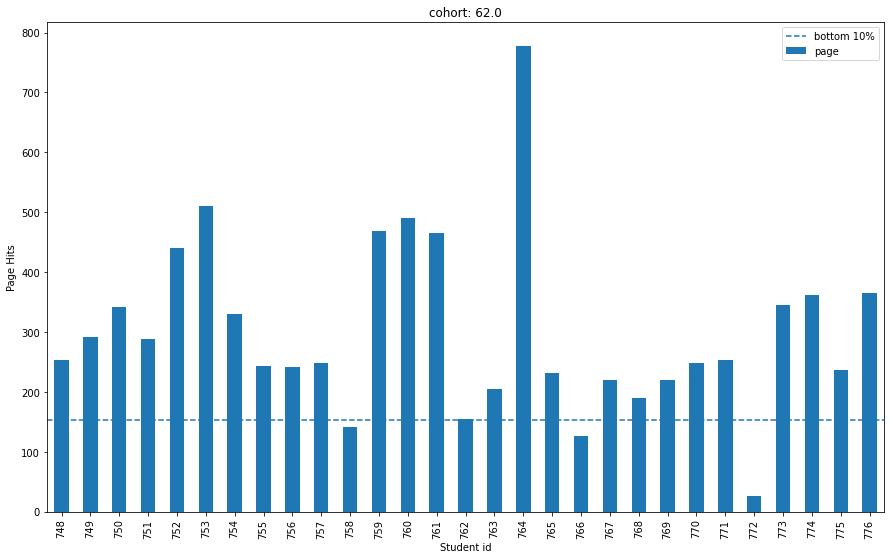

In [37]:
# For Web Development Cohorts 

val = [8.0,22.0,21.0,1.0,16.0,18.0,19.0,13.0,14.0,15.0,7.0,
 4.0,12.0,17.0,23.0,2.0,9.0,11.0,24.0,25.0,26.0,6.0,27.0,28.0,29.0,31.0,32.0,
 33.0,51.0,52.0,53.0,56.0,57.0,58.0,61.0,62.0]

for x in val:
    df1 = web_dev[web_dev.cohort_id == x]
    if df1.date.between(df1.start_date, df1.end_date, inclusive = True).any():
        df1[df1.date.between(df1.start_date, df1.end_date, inclusive = True)].groupby('user_id').page.count().\
        plot(kind = 'bar')
        low_lim = df1[df1.date.between(df1.start_date, df1.end_date, inclusive = True)].groupby('user_id').page.count().quantile(q = 0.1)
        plt.axhline(y = low_lim, xmin = 0, xmax = 1, linestyle = '--', label = 'bottom 10%')
    
        plt.title('cohort: ' + str(x))
        plt.xlabel('Student id')
        plt.ylabel('Page Hits')
        plt.legend()
        plt.show()
    else:
        print(f'No data found for {x} cohort.')


**4.Is there any suspicious activity, such as users/machines/etc accessing the curriculum who shouldn’t be? Does it appear that any web-scraping is happening? Are there any suspicious IP addresses? Any odd user-agents?**

- Use API to extract the location of the users based on their IP addresses
- Use time of access to identify anomalous hours.
- Use page hits count to explore if some IPs access the curriculum more frequently than others
- Check cross access of curriculum

**DS**

In [38]:
# Lets read the ip details from the csv file we had downloaded using the APIs
ip_details = pd.read_csv('ds_ip_details.csv')


# remove the unnecessary columns
ip_details.drop(columns = 'Unnamed: 0', inplace = True)


# lets create a new dataframe by merging two dataframes
ds_with_ip= ds_df.merge(ip_details, on = 'ip', how = 'left')


# lets set the index
ds_with_ip.index = ds_df.index

In [39]:
# checking the ip location country post going full remote
ds_with_ip[ds_with_ip.index > '2020-03-31'].country_name.value_counts()

United States    35897
China                2
Name: country_name, dtype: int64

In [40]:
# checking the ip location state post going full remote
ds_with_ip[ds_with_ip.index > '2020-03-31'].region_code.value_counts()

TX    34580
MN     1162
NC      117
CA       17
AZ        5
NE        4
BJ        2
IA        2
DC        1
MA        1
Name: region_code, dtype: int64

In [41]:
# checking the ip location country before going remote
ds_with_ip[ds_with_ip.index < '2020-03-31'].country_name.value_counts()

United States    31789
Canada             212
Mexico              43
Germany             41
Ireland             18
Australia           15
Name: country_name, dtype: int64

In [42]:
# checking the ip location state before going remote
ds_with_ip[ds_with_ip.index < '2020-03-31'].region_code.value_counts()

TX     31678
ON       192
NW        41
JAL       40
NY        22
L         18
QLD       15
NV        10
CA         9
FL         8
BC         7
COL        3
MA         2
CO         2
Name: region_code, dtype: int64

**Web Dev**

In [43]:
# reading the ip details for the web development into dataframe
ip_wd_info = pd.read_csv('wd_ip_details.csv')

ip_wd_info.drop(columns = 'Unnamed: 0', inplace = True)


In [44]:
# selecting only few columns that we will be using
wd_ip_details = ip_wd_info[['ip', 'region_code', 'country_name','city']]



# merging it to the web dev dataframe and giving a new name to the dataframe
web_dev_with_ip= web_dev.merge(wd_ip_details, on = 'ip', how = 'left')

# setting the index same as the web_dev index
web_dev_with_ip.index = web_dev.index

In [45]:
# checking the states from where the curriculum was accessed before going remote
web_dev_with_ip[web_dev_with_ip.index < '2020-03-31'].region_code.value_counts()

TX     398566
CA        412
VA        404
FL        246
GA        185
IL        177
OK        160
NY        134
WA         72
AZ         71
IDF        68
NJ         61
10         57
WI         55
HE         53
CMX        27
TAM        26
KY         26
NC         25
MEX        25
CO         24
COA        24
PA         23
MS         20
QUE        19
KS         18
GRO        17
MD         16
MO         13
MN         11
LA          8
QLD         8
SH          8
MI          7
25          7
QC          7
NE          5
TN          5
ON          5
AL          4
PDL         4
OH          4
PAC         4
ENG         2
VT          2
60          2
UT          2
IA          2
NV          1
ARA         1
NLE         1
MB          1
CT          1
NH          1
Name: region_code, dtype: int64

In [46]:
# checking the countries from where the curriculum was accessed before going remote
web_dev_with_ip[web_dev_with_ip.index < '2020-03-31'].country_name.value_counts()


United States     406230
Mexico               139
France                77
Germany               61
Thailand              59
Canada                19
Australia              8
Italy                  7
Singapore              4
South Africa           2
United Kingdom         2
Name: country_name, dtype: int64

In [47]:
# checking the states from where the curriculum was accessed after going remote
web_dev_with_ip[web_dev_with_ip.index > '2020-03-31'].region_code.value_counts()


TX     134838
OK       1811
CO       1064
PA        549
CA        340
CMX       243
NJ         97
VA         90
BY         84
NY         76
LA         48
FL         31
TN         19
NM         18
NC         16
AR          9
MO          7
C           4
OR          4
VT          3
SC          1
Name: region_code, dtype: int64

In [48]:
# checking the country from where the curriculum was accessed after going remote
web_dev_with_ip[web_dev_with_ip.index > '2020-03-31'].country_name.value_counts()

United States          139323
Mexico                    243
Germany                    84
Australia                  23
U.S. Virgin Islands         4
Name: country_name, dtype: int64

**DS**

97.105.19.58
page                                    
/                                           1397
1-fundamentals/AI-ML-DL-timeline.jpg         673
1-fundamentals/modern-data-scientist.jpg     673
1-fundamentals/1.1-intro-to-data-science     664
search/search_index.json                     424
                                            ... 
appendix/git/cli                               1
appendix/git/intellij                          1
appendix/univariate_regression_in_excel        1
capstones                                      1
12-distributed-ml/spark-topics                 1
Length: 299, dtype: int64


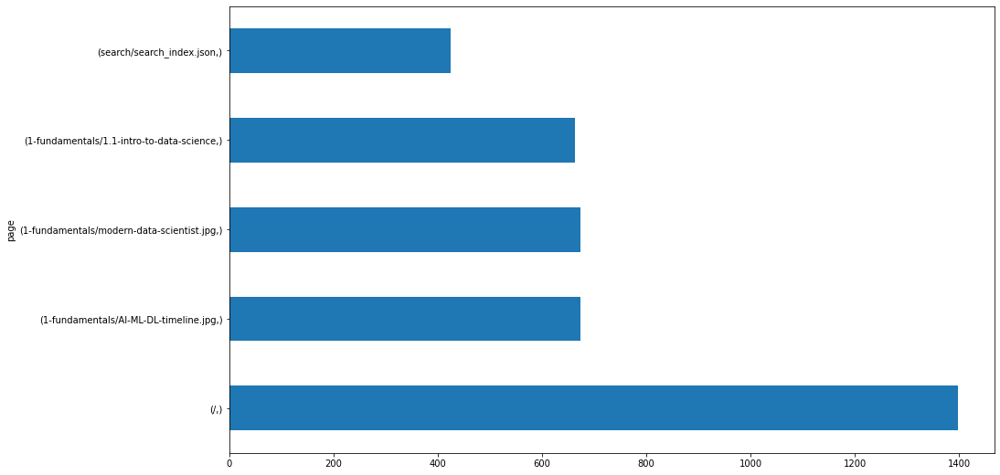


67.11.115.125
page                                    
/                                           9
appendix/cli-git-overview                   8
6-regression/1-overview                     8
3-sql/7-functions                           7
7-classification/6.1-logistic-regression    7
                                           ..
3-sql/6.1-clauses-overview                  1
8-clustering/3-wrangle                      1
5-stats/4.1-hypothesis-testing-overview     1
8-clustering/5.2-kmeans-part-2              1
appendix/testing-code                       1
Length: 83, dtype: int64


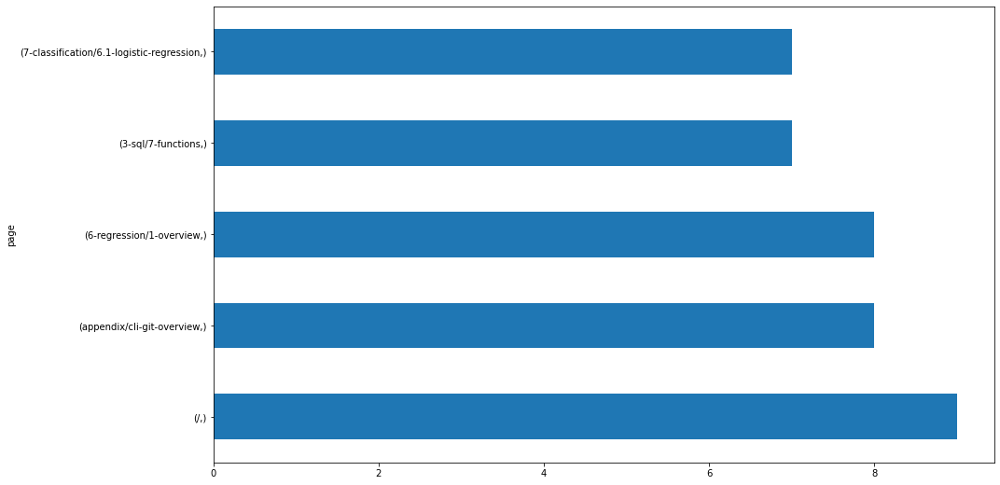


172.8.173.224
page                                         
/                                                18
search/search_index.json                          6
3-sql/9.4-subqueries                              5
2-storytelling/2.1-understand                     4
appendix/cli/1-intro                              4
appendix/cli/0-overview                           4
3-sql/10-temporary-tables                         3
4-python/3-data-types-and-variables               3
appendix/cli/7-more-topics                        3
3-sql/4-tables                                    3
3-sql/9.3-joins                                   3
3-sql/11-more-exercises                           3
appendix/cli/2-listing-files                      3
appendix/cli-git-overview                         3
3-sql/3-databases                                 2
2-storytelling/2.3-refine                         2
4-python/5-functions                              2
2-storytelling/2.2-create                         2
app

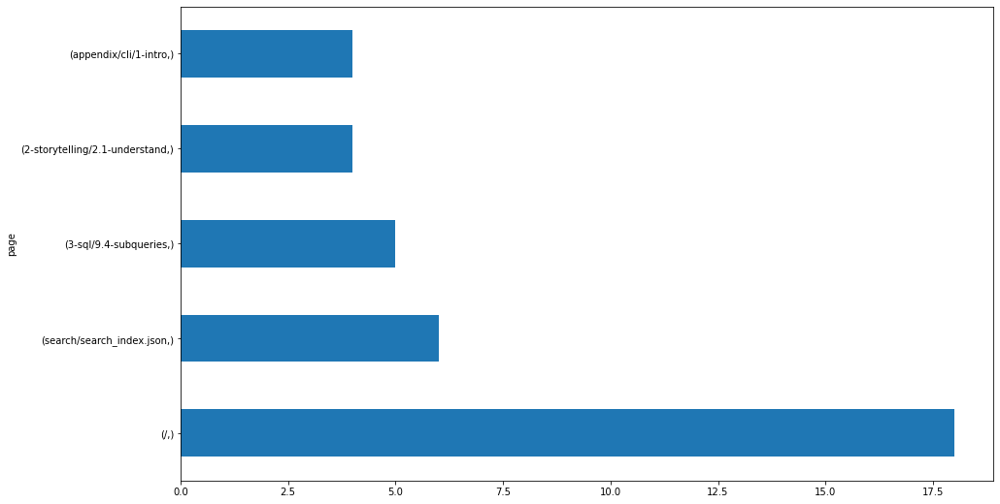


173.175.104.33
page                                    
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
/                                           1
dtype: int64


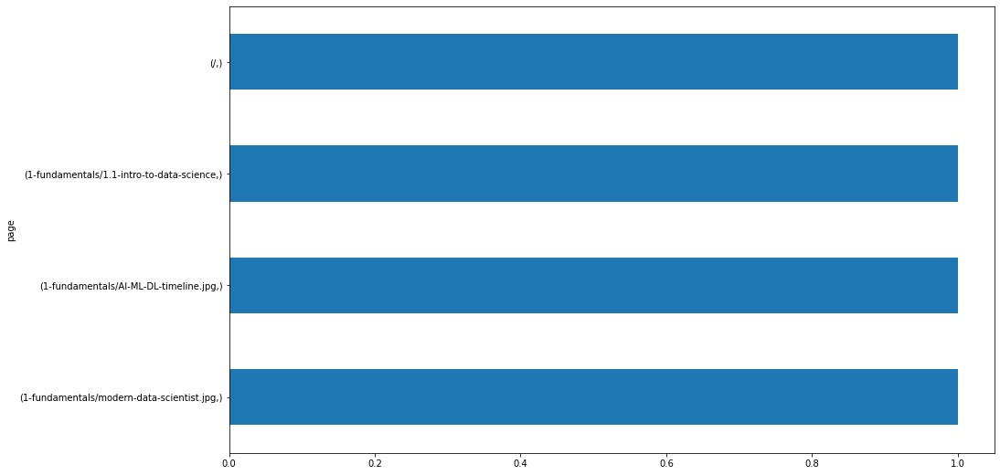


12.197.196.242
page                                         
/                                                5
4-python/3-data-types-and-variables              4
4-python/4-control-structures                    4
6-regression/4.0-explore                         3
5-stats/Selecting_a_hypothesis_test.svg          3
5-stats/4.5-more-statistical-testing-examples    3
4-python/5-functions                             2
1-fundamentals/1.1-intro-to-data-science         2
1-fundamentals/2.2-excel-functions               2
1-fundamentals/2.3-visualization-with-excel      2
1-fundamentals/AI-ML-DL-timeline.jpg             2
1-fundamentals/modern-data-scientist.jpg         2
4-python/1-overview                              2
4-python/2-introduction-to-python                2
search/search_index.json                         2
4-python/7.3-intro-to-numpy                      2
5-stats/2-simulation                             2
5-stats/3-probability-distributions              2
6-regression/2.0-acq

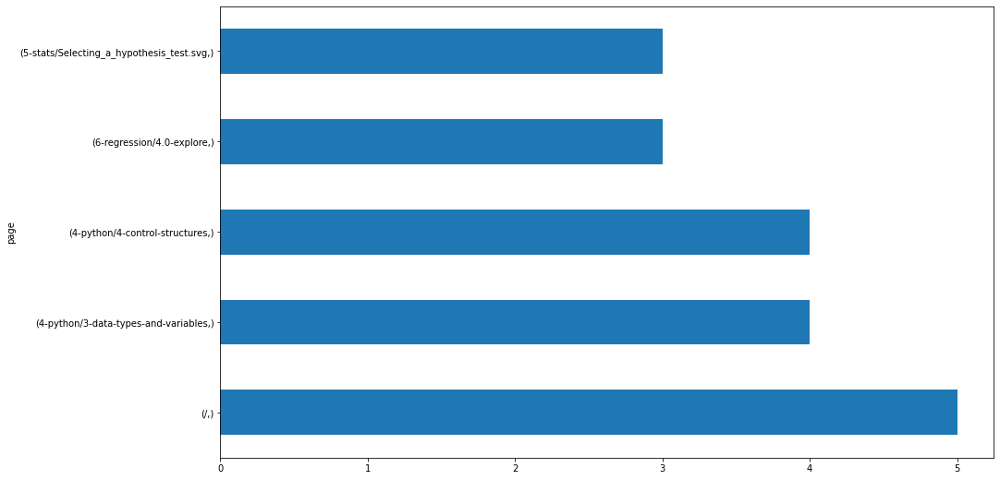


71.42.196.114
page                                       
/                                              3
1-fundamentals/2.2-excel-functions             2
1-fundamentals/1.3-pipeline-demo               2
2-storytelling/misleading3_deaths.jpg          1
2-storytelling/misleading1_fox.jpg             1
2-storytelling/misleading1_baseball.jpg        1
2-storytelling/bad-charts                      1
1-fundamentals/modern-data-scientist.jpg       1
1-fundamentals/AI-ML-DL-timeline.jpg           1
1-fundamentals/2.3-visualization-with-excel    1
1-fundamentals/1.1-intro-to-data-science       1
dtype: int64


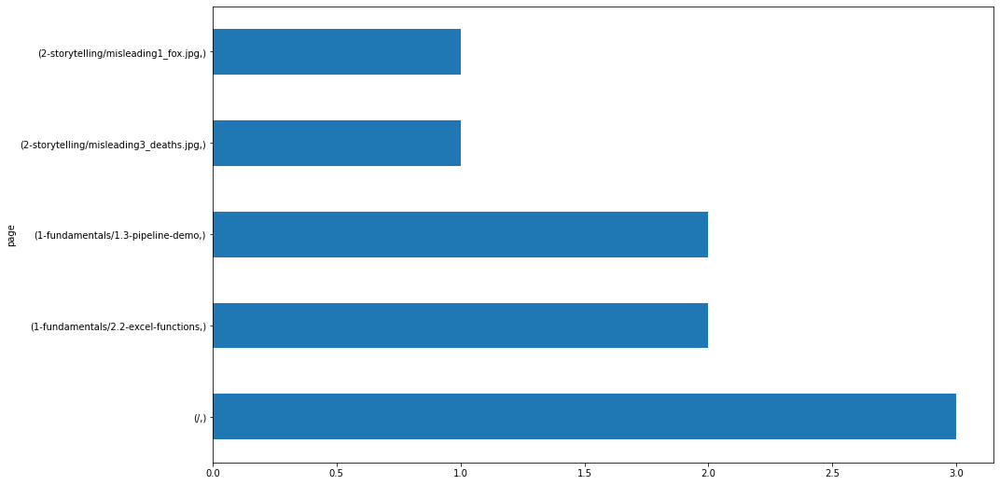


70.226.109.182
page                                   
/                                          57
appendix/cli-git-overview                  16
5-stats/2-simulation                       13
6-regression/1-overview                    13
6-regression/5.0-evaluate                  13
                                           ..
2-storytelling/2.4-present                  1
2-storytelling/2.1-understand               1
13-advanced-topics/3.8-json-responses       1
13-advanced-topics/3.7-styling-webpages     1
sql/database-design                         1
Length: 149, dtype: int64


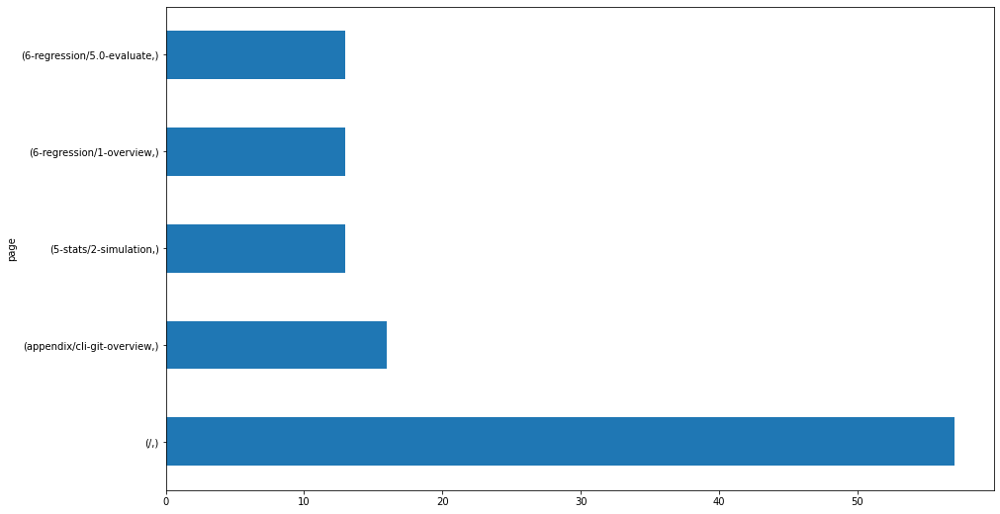


172.124.64.127
page                                       
/                                              19
3-sql/6.3-order-by                              8
3-sql/7-functions                               7
5-stats/4.2-compare-means                       6
1-fundamentals/2.3-visualization-with-excel     6
                                               ..
5-stats/distributions-and-testing               1
3-sql/6.1-clauses-overview                      1
6-regression/2.0-acquire-and-prep               1
6-regression/3.0-split-and-scale                1
stats/simulation                                1
Length: 95, dtype: int64


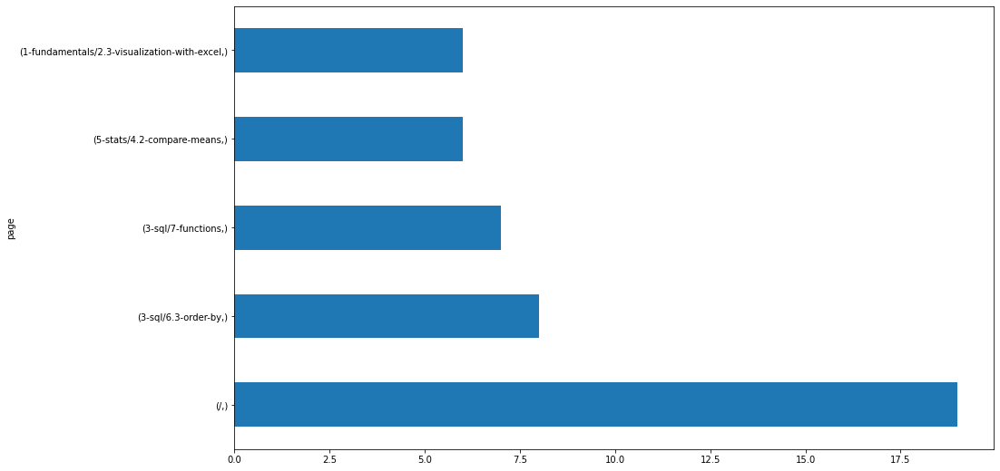


216.110.79.11
page                                             
/                                                    6
1-fundamentals/DataToAction_v2.jpg                   4
1-fundamentals/1.2-data-science-pipeline             3
1-fundamentals/modern-data-scientist.jpg             2
1-fundamentals/AI-ML-DL-timeline.jpg                 2
1-fundamentals/1.3-pipeline-demo                     2
1-fundamentals/1.1-intro-to-data-science             2
8-clustering/5.1-kmeans-part-1                       1
4-python/7.3-intro-to-numpy                          1
4-python/7.2-intro-to-matplotlib                     1
2-storytelling/3-tableau                             1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/4-detecting-with-clustering     1
10-anomaly-detection/1-overview                      1
dtype: int64


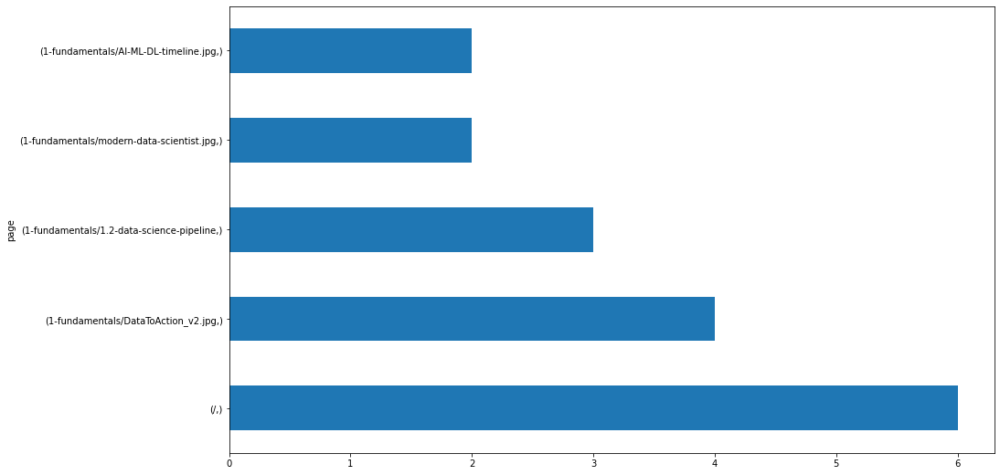


108.174.80.231
page                                                            
1-fundamentals/1.1-intro-to-data-science                            4
1-fundamentals/modern-data-scientist.jpg                            4
1-fundamentals/AI-ML-DL-timeline.jpg                                4
/                                                                   3
6-regression/6.0-feature-engineering                                3
6-regression/8.0-Project                                            3
appendix/interview_questions_students                               2
3-sql/7-functions                                                   2
6-regression/1-overview                                             2
1-fundamentals/DataToAction_v2.jpg                                  2
3-discrete-probabilistic-methods                                    2
7-classification/project                                            2
1-fundamentals/1.2-data-science-pipeline                            2
7-classif

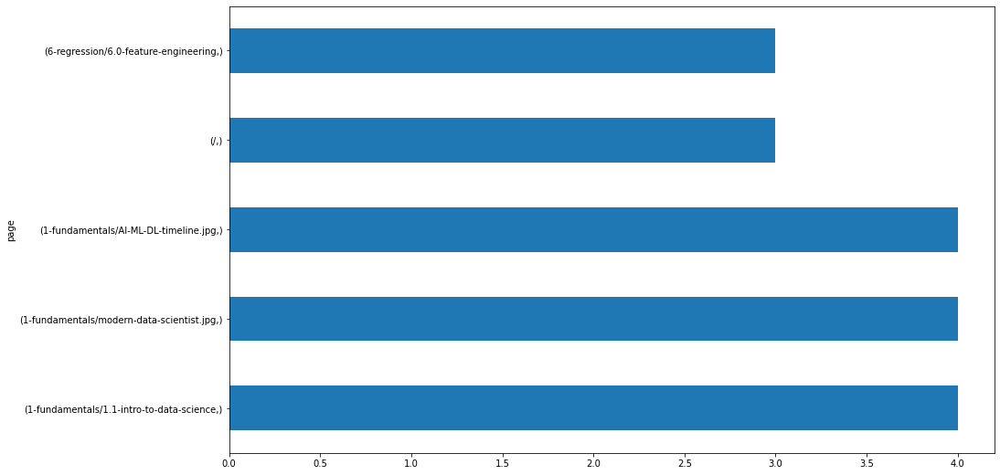


174.207.21.10
page                                    
8-clustering/1-overview                     1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


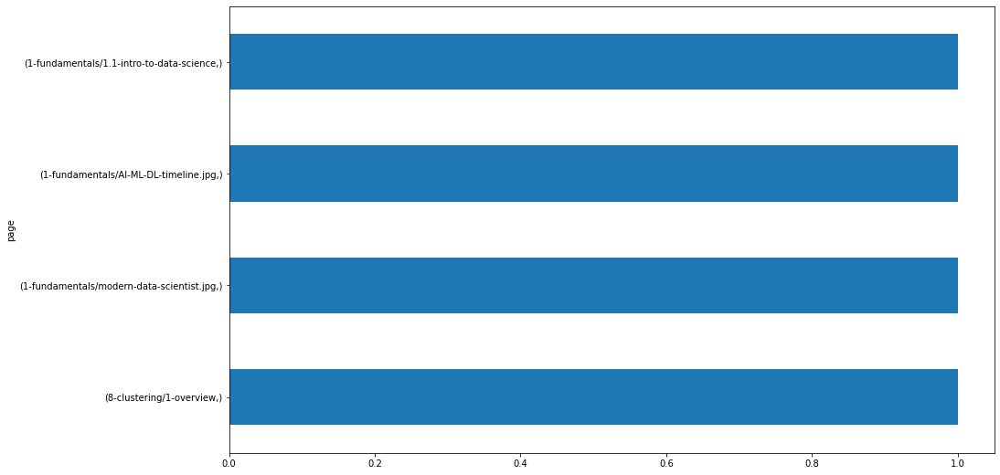


65.43.118.72
page                                             
search/search_index.json                             31
6-regression/1-overview                              13
10-anomaly-detection/1-overview                      10
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    10
6-regression/4.0-explore                              8
                                                     ..
appendix/interview_questions_students                 1
8-clustering/5.1-kmeans-part-1                        1
4-python/7.4-intro-to-pandas                          1
3-sql/11-more-exercises                               1
7-classification/6.3-random-forests                   1
Length: 128, dtype: int64


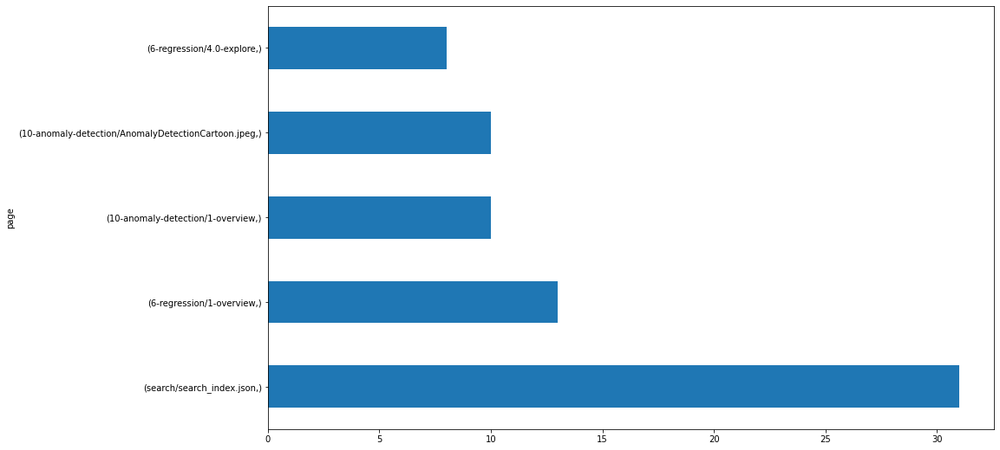


67.10.174.4
page                                   
search/search_index.json                   27
4-python/7.4.3-dataframes                   9
appendix/interview_questions_students       9
8-clustering/1-overview                     9
5-stats/4.1-hypothesis-testing-overview     9
                                           ..
3-sql/9.1-relationships-overview            1
3-sql/8-group-by                            1
3-sql/7-functions                           1
6-regression/2.0-acquire-and-prep           1
sql/database-design                         1
Length: 109, dtype: int64


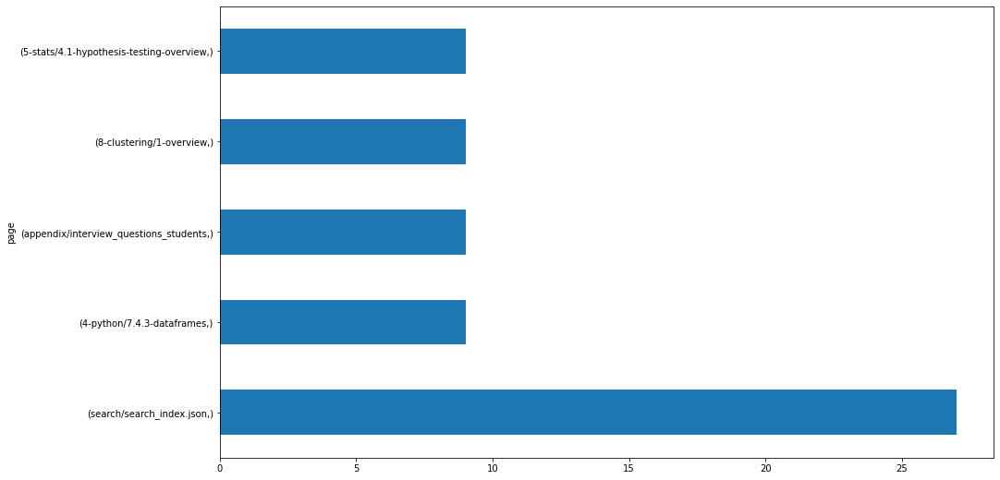


136.50.49.145
page                                             
/                                                    82
search/search_index.json                             35
6-regression/1-overview                              21
10-anomaly-detection/1-overview                      16
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    16
                                                     ..
2-storytelling/3.5-creating-dashboards                1
2-storytelling/3.2-connecting-to-data                 1
2-storytelling/2.4-present                            1
2-storytelling/1-overview                             1
4-python/8.4.2-series                                 1
Length: 136, dtype: int64


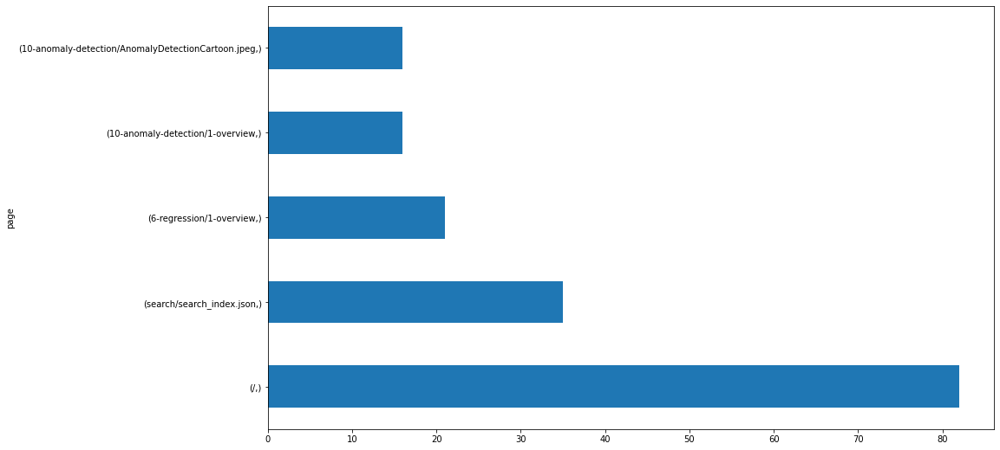


67.11.120.157
page                                       
/                                              12
1-fundamentals/2.4-more-excel-features          5
5-stats/4.2-compare-means                       4
2-storytelling/2.2-create                       4
1-fundamentals/1.2-data-science-pipeline        3
6-regression/8.0-Project                        3
2-storytelling/bad-charts                       3
2-storytelling/2.4-present                      3
6-regression/4.0-explore                        3
2-storytelling/misleading1_fox.jpg              2
2-storytelling/misleading1_baseball.jpg         2
3-sql/9.4-subqueries                            2
2-storytelling/2.1-understand                   2
2-storytelling/1-overview                       2
1-fundamentals/DataToAction_v2.jpg              2
1-fundamentals/2.3-visualization-with-excel     2
6-regression/7.0-model                          2
2-storytelling/misleading3_deaths.jpg           2
1-fundamentals/project                   

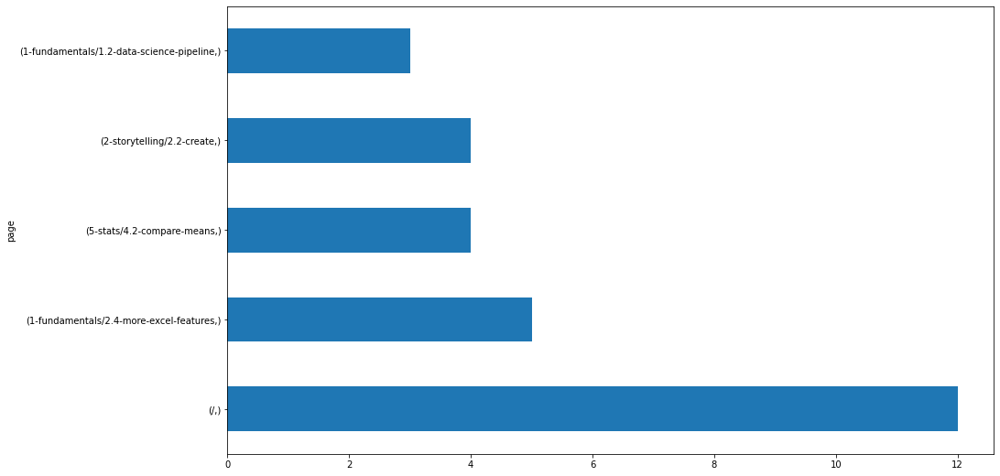


173.149.142.35
page                                    
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
/                                           1
dtype: int64


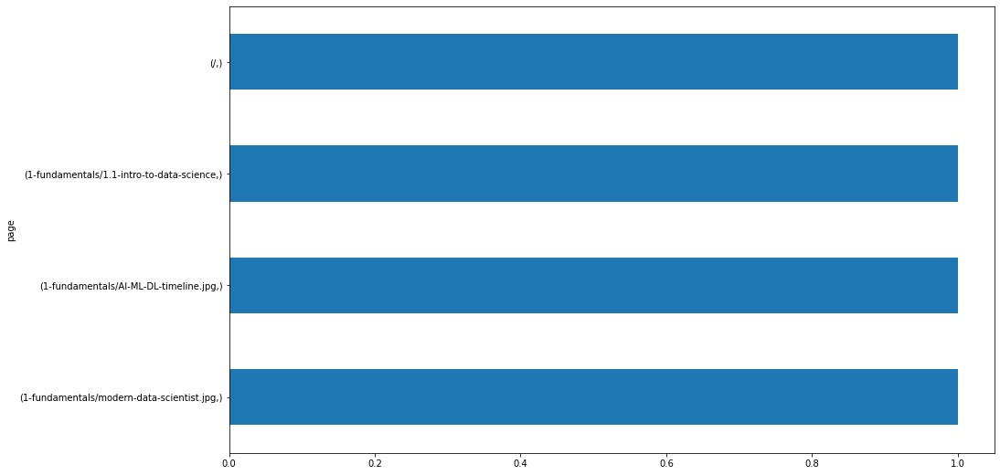


208.54.86.133
page                                      
8-clustering/1-overview                       1
7-classification/2-intro-to-classification    1
6-regression/1-overview                       1
11-nlp/1-overview                             1
dtype: int64


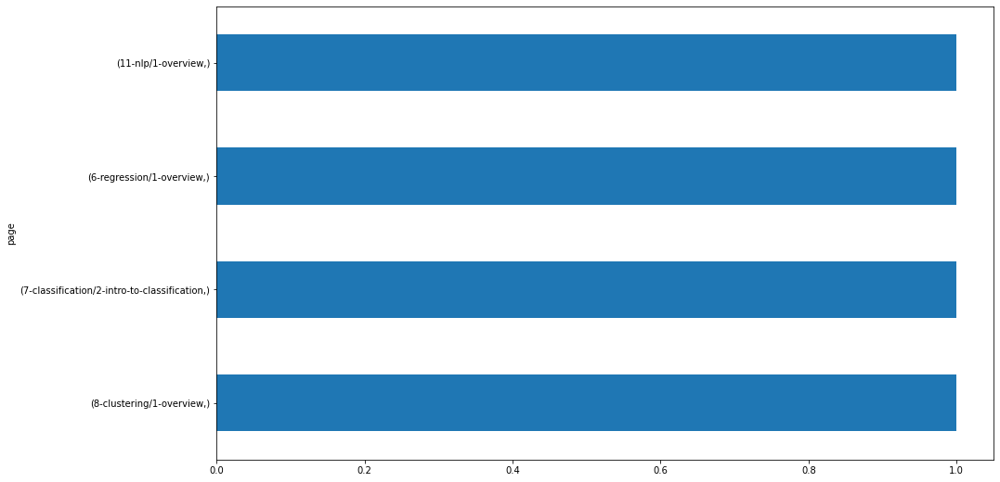


70.226.110.58
page                                             
/                                                    20
6-regression/1-overview                              13
10-anomaly-detection/1-overview                       7
10-anomaly-detection/AnomalyDetectionCartoon.jpeg     7
9-timeseries/4-explore                                7
8-clustering/5.1-kmeans-part-1                        5
7-classification/4-explore                            4
8-clustering/4-explore                                3
9-timeseries/2-acquire                                3
7-classification/3-prep                               3
4-python/7.2-intro-to-matplotlib                      2
11-nlp/6-model                                        2
11-nlp/3-acquire                                      2
5-stats/2-simulation                                  2
11-nlp/1-overview                                     2
5-stats/3-probability-distributions                   2
1-fundamentals/modern-data-scientist.jp

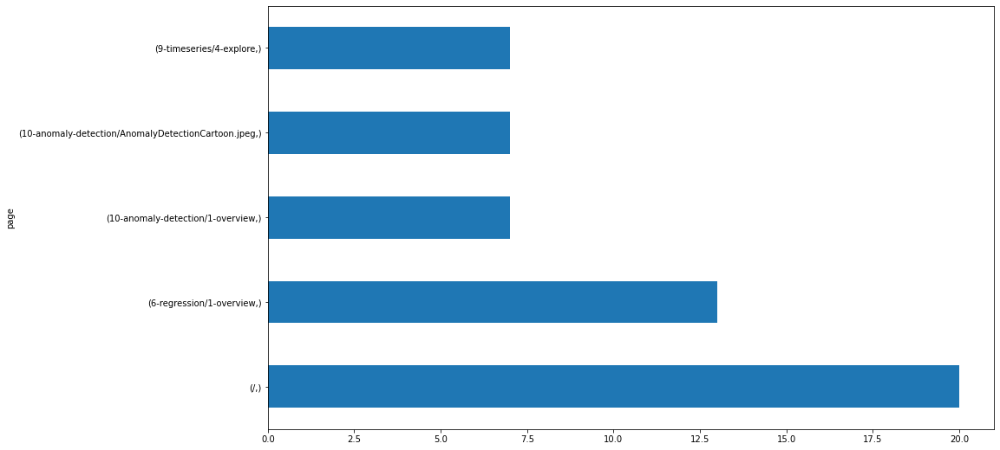


166.251.109.48
page                                       
5-stats/4.2-compare-means                      1
5-stats/3-probability-distributions            1
1-fundamentals/2.3-visualization-with-excel    1
/                                              1
dtype: int64


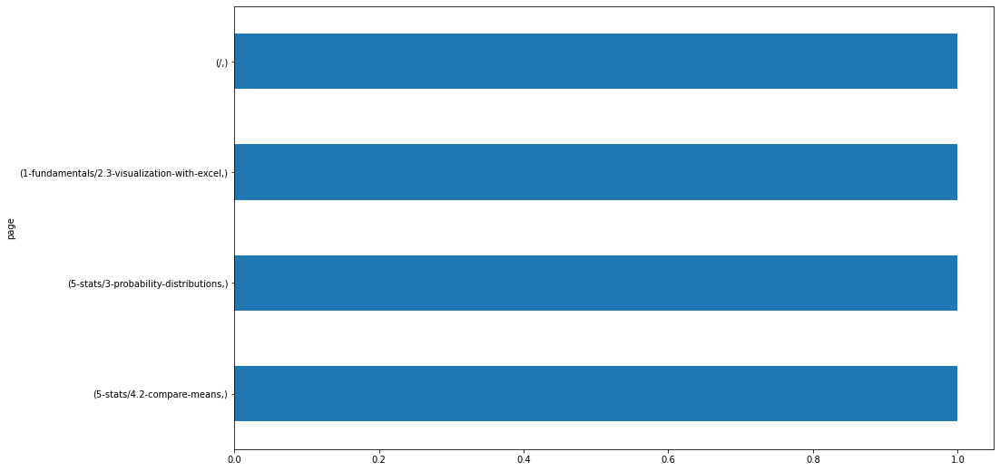


99.98.32.97
page                                             
7-classification/6.3-random-forests                  5
7-classification/6.2-decision-trees                  5
4-python/7.4.3-dataframes                            4
6-regression/1-overview                              4
7-classification/6.4-knn                             3
7-classification/6.1-logistic-regression             3
4-python/7.4.2-series                                2
10-anomaly-detection/1-overview                      2
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    2
/                                                    2
4-python/7.4.4-advanced-dataframes                   2
9-timeseries/5.1-modeling-lesson1                    1
4-python/7.4.1-pandas-overview                       1
3-sql/10-temporary-tables                            1
11-nlp/5-explore                                     1
11-nlp/4-prepare                                     1
11-nlp/3-acquire                                     1
11

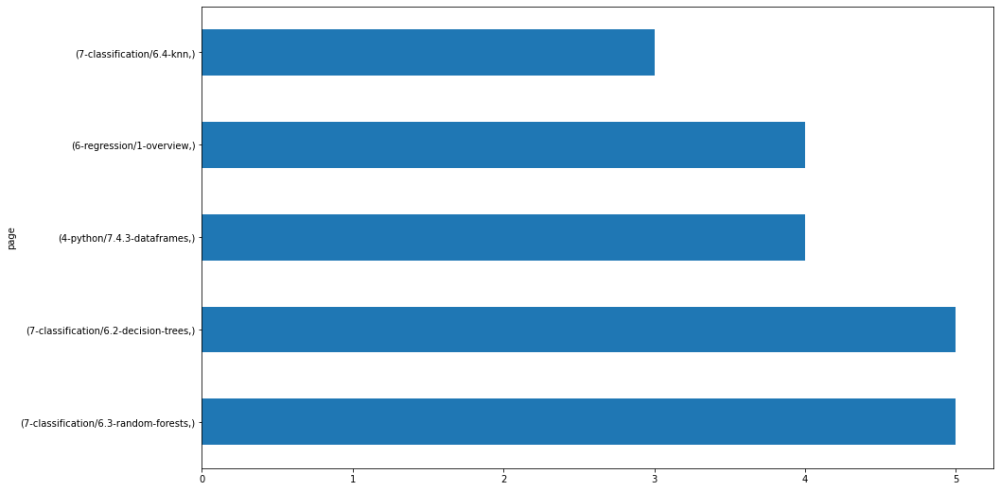


130.45.33.133
page                                       
1-fundamentals/2.3-visualization-with-excel    3
1-fundamentals/2.4-more-excel-features         2
1-fundamentals/2.2-excel-functions             1
/                                              1
dtype: int64


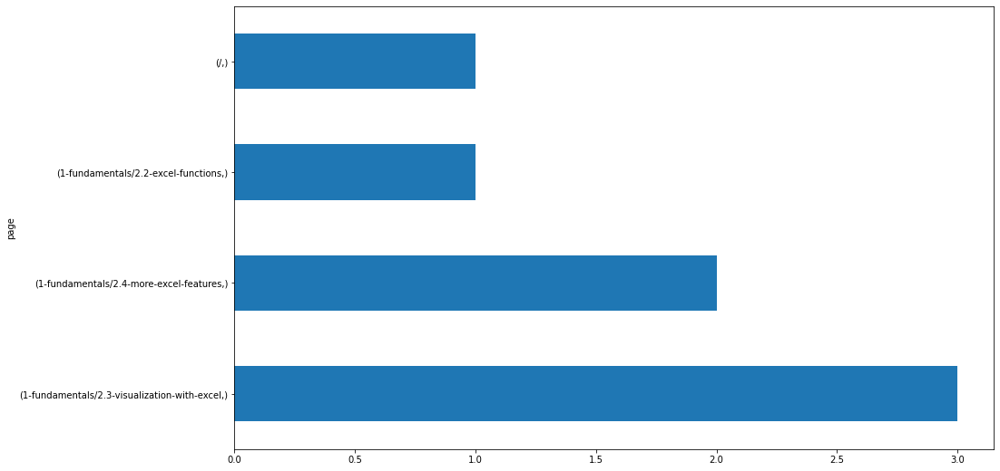


75.1.166.163
page                             
6-regression/5.0-evaluate            18
/                                    16
6-regression/2.0-acquire-and-prep    15
search/search_index.json             15
6-regression/1-overview              13
                                     ..
2-storytelling/3-tableau              1
2-storytelling/2.3-refine             1
4-python/1-overview                   1
6-regression/4-explore                1
4-python/7.5-intro-to-seaborn         1
Length: 126, dtype: int64


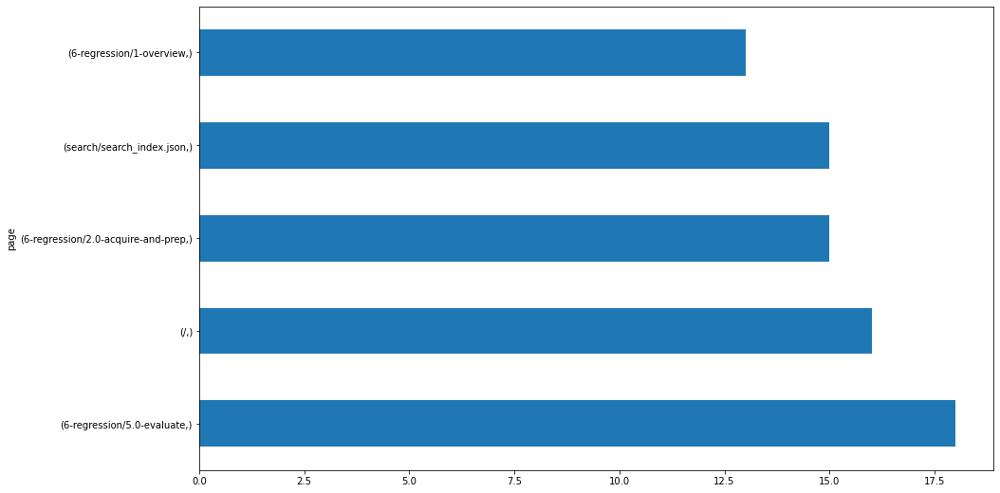


70.117.31.136
page                                    
appendix/cli-git-overview                   12
1-fundamentals/AI-ML-DL-timeline.jpg        10
1-fundamentals/1.1-intro-to-data-science    10
1-fundamentals/modern-data-scientist.jpg    10
1-fundamentals/1.2-data-science-pipeline     7
                                            ..
4-python/7.3-intro-to-numpy                  1
8-clustering/4-explore                       1
8-clustering/3-wrangle                       1
8-clustering/2-about                         1
appendix/vocabulary                          1
Length: 196, dtype: int64


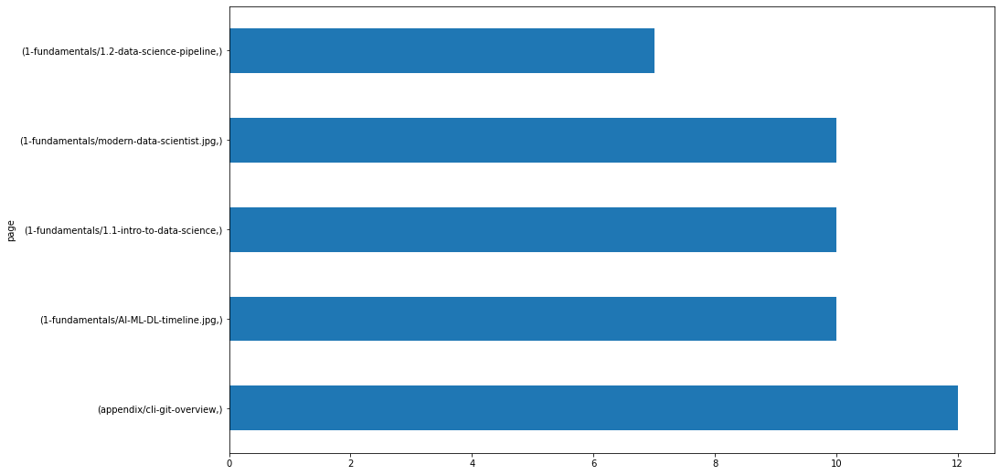


72.181.117.73
page                                       
1-fundamentals/2.3-visualization-with-excel    1
dtype: int64


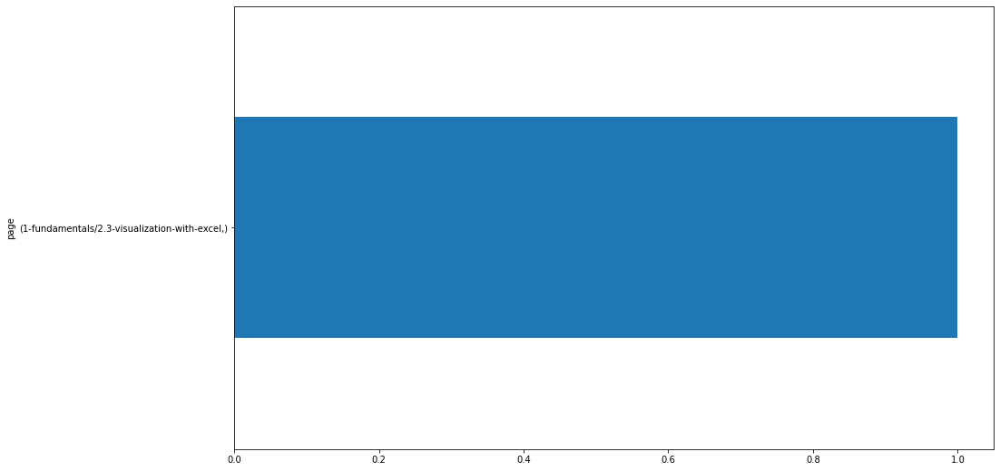


66.69.81.250
page                                       
3-sql/9.3-joins                                6
3-sql/2-mysql-introduction                     6
3-sql/7-functions                              5
3-sql/8-group-by                               5
/                                              4
3-sql/1-mysql-overview                         4
3-sql/9.2-indexes                              4
1-fundamentals/1.1-intro-to-data-science       3
1-fundamentals/AI-ML-DL-timeline.jpg           3
1-fundamentals/modern-data-scientist.jpg       3
3-sql/10-temporary-tables                      3
3-sql/11-more-exercises                        3
3-sql/3-databases                              3
3-sql/5-basic-statements                       3
3-sql/6.1-clauses-overview                     3
appendix/cli-git-overview                      3
3-sql/9.4-subqueries                           2
3-sql/9.1-relationships-overview               2
3-sql/4-tables                                 2
2-storytell

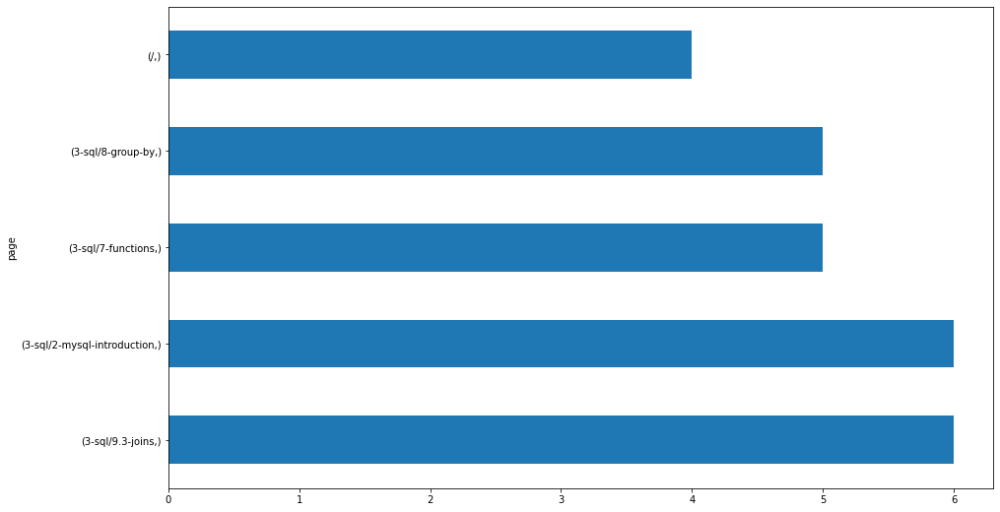


76.211.181.33
page                                    
/                                           67
1-fundamentals/1.1-intro-to-data-science    54
1-fundamentals/AI-ML-DL-timeline.jpg        54
1-fundamentals/modern-data-scientist.jpg    54
search/search_index.json                    19
                                            ..
3-sql/9.2-indexes                            1
3-sql/9.1-relationships-overview             1
clustering/about                             1
clustering/overview                          1
storytelling/overview                        1
Length: 180, dtype: int64


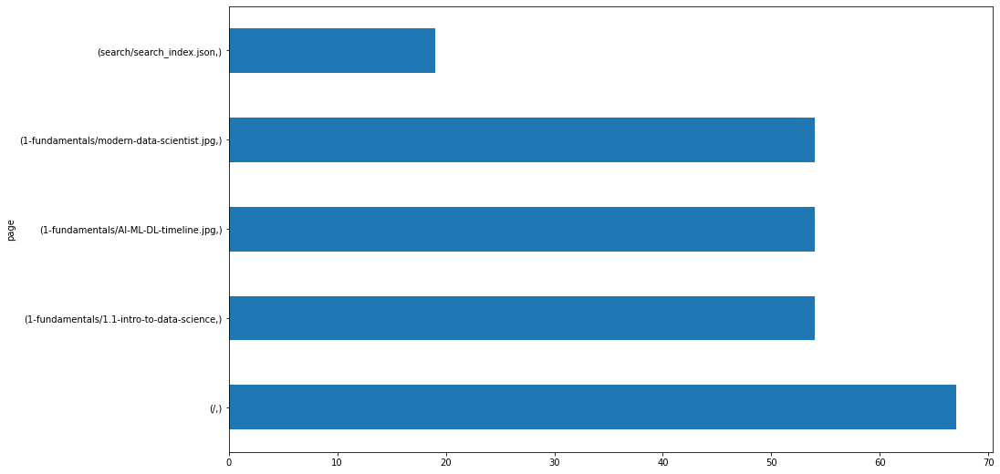


67.11.82.11
page                                                   
/                                                          22
1-fundamentals/2.3-visualization-with-excel                 6
13-advanced-topics/3.4-intro-to-flask                       5
1-fundamentals/2.4-more-excel-features                      5
13-advanced-topics/3.5-html-templates                       4
1-fundamentals/2.1-excel-overview                           3
appendix/vocabulary                                         3
3-sql/11-case-statements                                    3
3-sql/12-more-exercises                                     3
1-fundamentals/2.2-excel-functions                          3
9-timeseries/project                                        2
3-sql/6.2-where                                             2
13-advanced-topics/3.6-html-forms                           2
10-anomaly-detection/3-discrete-probabilistic-methods       2
4-python/7.5-intro-to-seaborn                               2
1

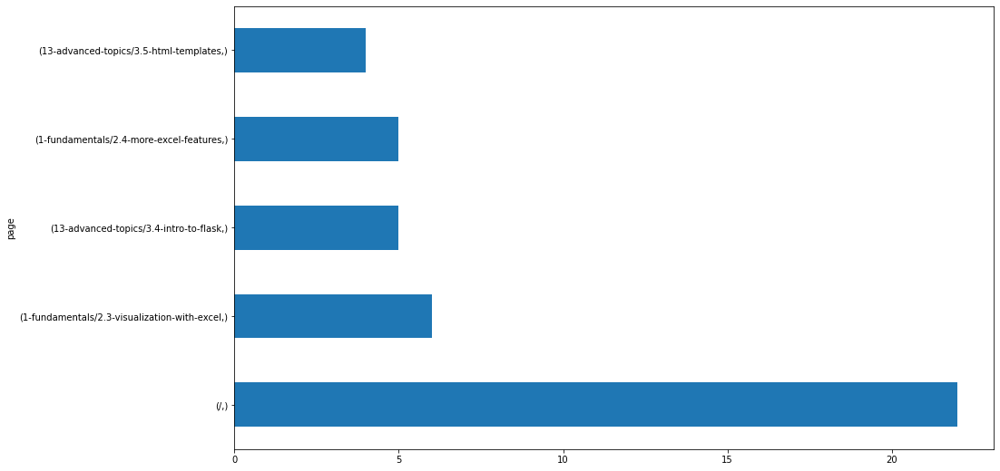


70.123.225.30
page                                                             
/                                                                    11
11-nlp/3-acquire                                                      4
11-nlp/6-model                                                        4
12-distributed-ml/4-wrangle                                           3
12-distributed-ml/5-explore                                           3
13-advanced-topics/2-cross-validation                                 2
10-anomaly-detection/2-continuous-probabilistic-methods               2
10-anomaly-detection/3-discrete-probabilistic-methods                 2
11-nlp/4-prepare                                                      2
11-nlp/github_repo_language.gif                                       2
11-nlp/project                                                        2
12-distributed-ml/6-ml-with-spark                                     2
13-advanced-topics/1-tidy-data                         

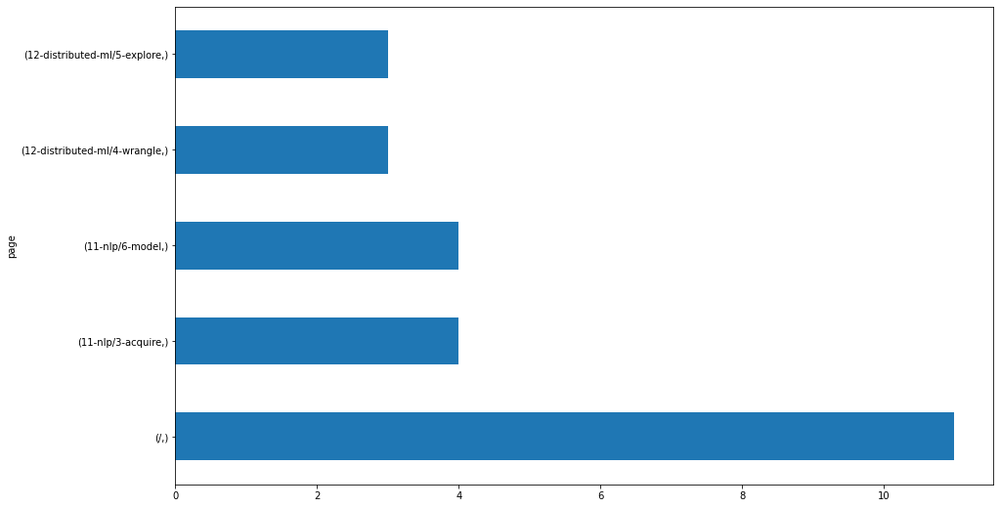


173.127.7.219
page                                  
1-fundamentals/2.4-more-excel-features    1
dtype: int64


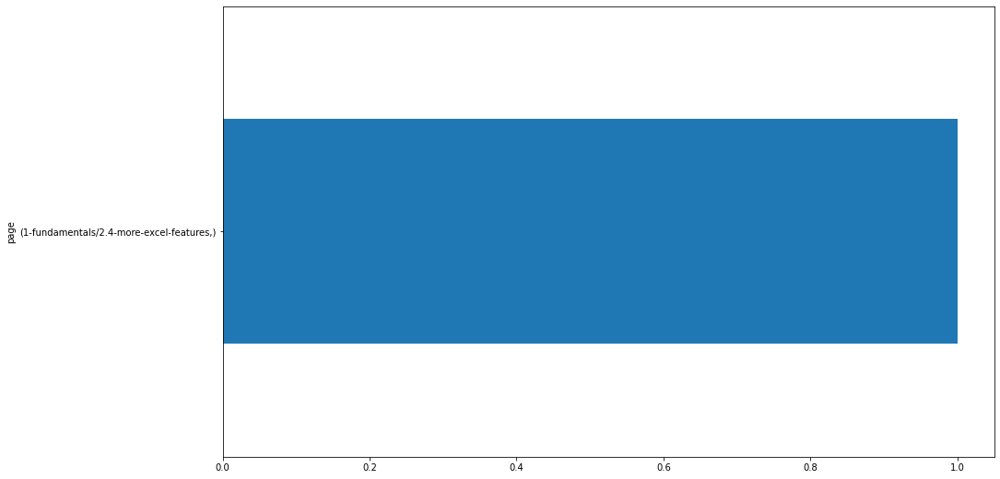


173.127.93.78
page                                  
1-fundamentals/project                    1
1-fundamentals/2.4-more-excel-features    1
/                                         1
dtype: int64


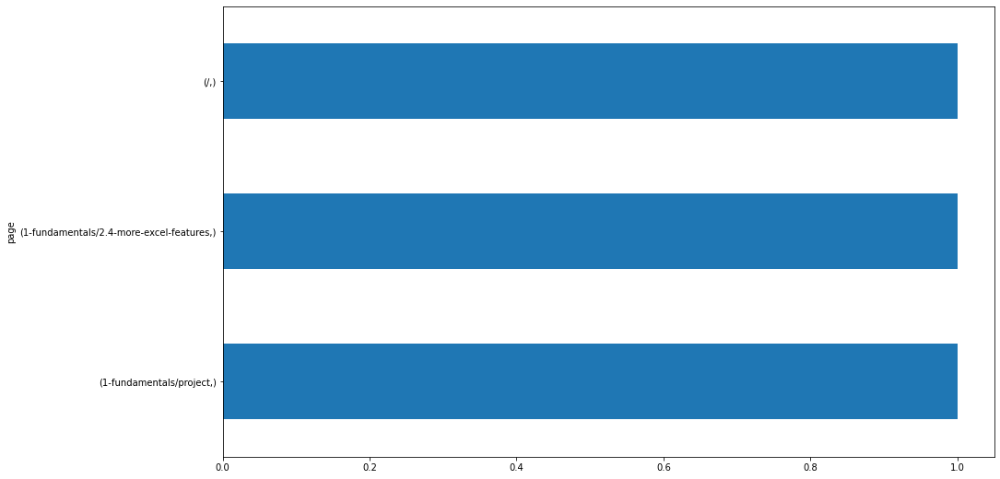


136.50.54.2
page                                    
/                                           9
1-fundamentals/modern-data-scientist.jpg    5
1-fundamentals/1.1-intro-to-data-science    5
1-fundamentals/AI-ML-DL-timeline.jpg        5
2-storytelling/2.2-create                   5
1-fundamentals/DataToAction_v2.jpg          4
1-fundamentals/1.2-data-science-pipeline    4
2-storytelling/1-overview                   3
1-fundamentals/1.3-pipeline-demo            3
1-fundamentals/3-vocabulary                 3
search/search_index.json                    3
11-nlp/4-prepare                            2
2-storytelling/2.4-present                  2
2-storytelling/2.1-understand               2
11-nlp/6-model                              2
4-python/6-imports                          1
9-timeseries/5.2-modeling-lesson2           1
6-regression/1-overview                     1
5-stats/4.3-correlation                     1
1-fundamentals/2.4-more-excel-features      1
5-stats/4.2-compare-means 

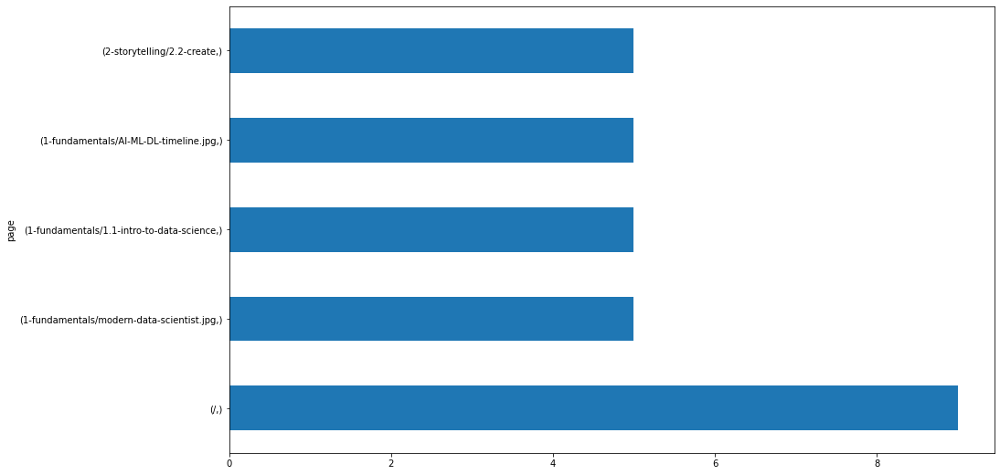


71.78.109.210
page                                   
/                                          20
appendix/cli/2-listing-files               11
appendix/cli/3-file-paths                   7
8-clustering/5.1-kmeans-part-1              5
appendix/cli/1-intro                        5
                                           ..
5-stats/3-probability-distributions         1
5-stats/4.1-hypothesis-testing-overview     1
5-stats/4.2-compare-means                   1
5-stats/4.3-correlation                     1
4-python/7.4.4-advanced-dataframes          1
Length: 128, dtype: int64


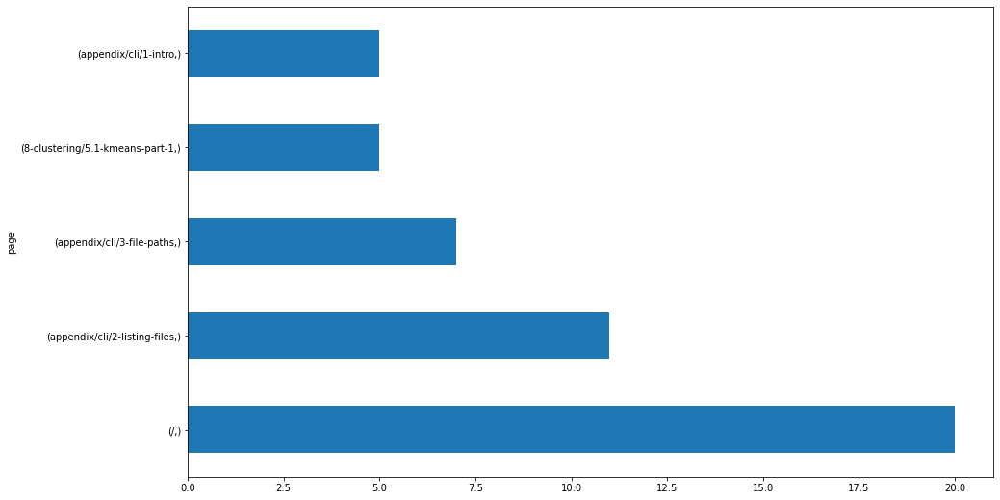


99.158.246.101
page                            
/                                   30
6-regression/1-overview             22
6-regression/5.0-evaluate           19
6-regression/4.0-explore            16
6-regression/8.0-Project            15
                                    ..
3-sql/9.1-relationships-overview     1
3-sql/8-group-by                     1
3-sql/6.4-limit                      1
3-sql/6.3-order-by                   1
4-python/7.3-intro-to-numpy          1
Length: 109, dtype: int64


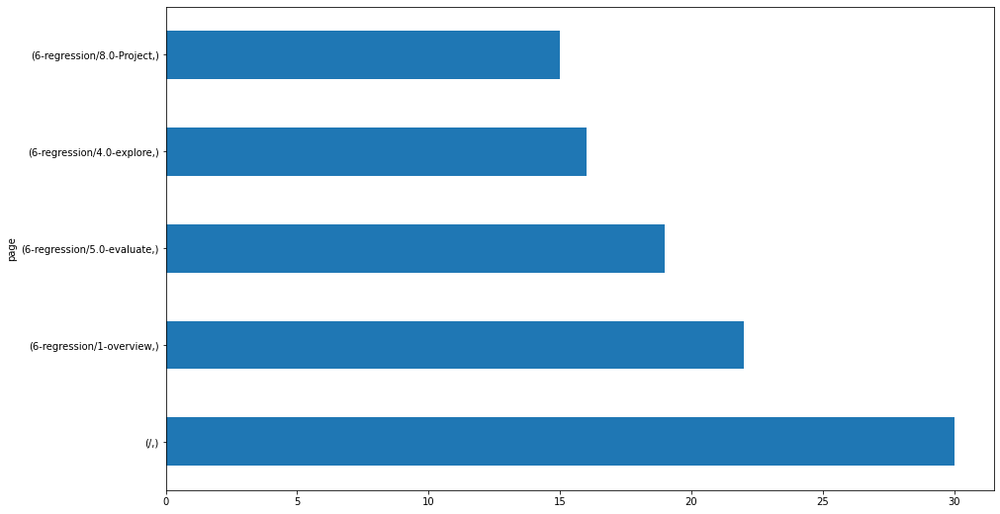


107.132.82.186
page                                   
3-sql/9.4-subqueries                       7
/                                          5
6-regression/7.0-model                     5
7-classification/6.2-decision-trees        5
3-sql/7-functions                          3
                                          ..
5-stats/sampling                           1
5-stats/distributions-and-testing          1
5-stats/4.4-compare-group-membership       1
5-stats/4.1-hypothesis-testing-overview    1
3-sql/9.3-joins                            1
Length: 64, dtype: int64


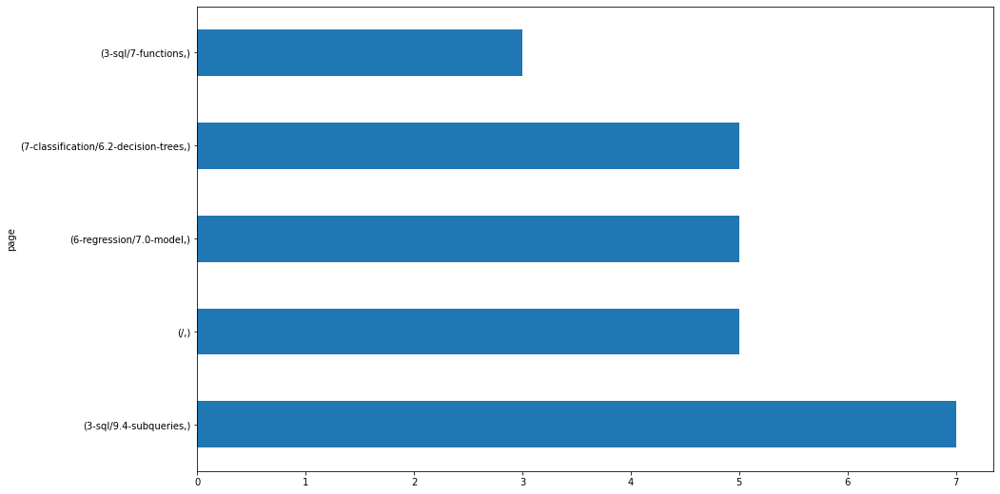


173.173.105.24
page                                             
/                                                    3
3-sql/6.1-clauses-overview                           3
12-distributed-ml/3-spark-api                        2
12-distributed-ml/4-wrangle                          2
12-distributed-ml/5-explore                          2
12-distributed-ml/6-ml-with-spark                    2
12-distributed-ml/spark-execution-diagram.svg        1
10-anomaly-detection/1-overview                      1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
12-distributed-ml/1-overview                         1
fundamentals/modern-data-scientist.jpg               1
fundamentals/intro-to-data-science                   1
2-storytelling/2.1-understand                        1
7-classification/project                             1
appendix/ds-environment-setup                        1
database-design                                      1
fundamentals/AI-ML-DL-timeline.jpg                   1

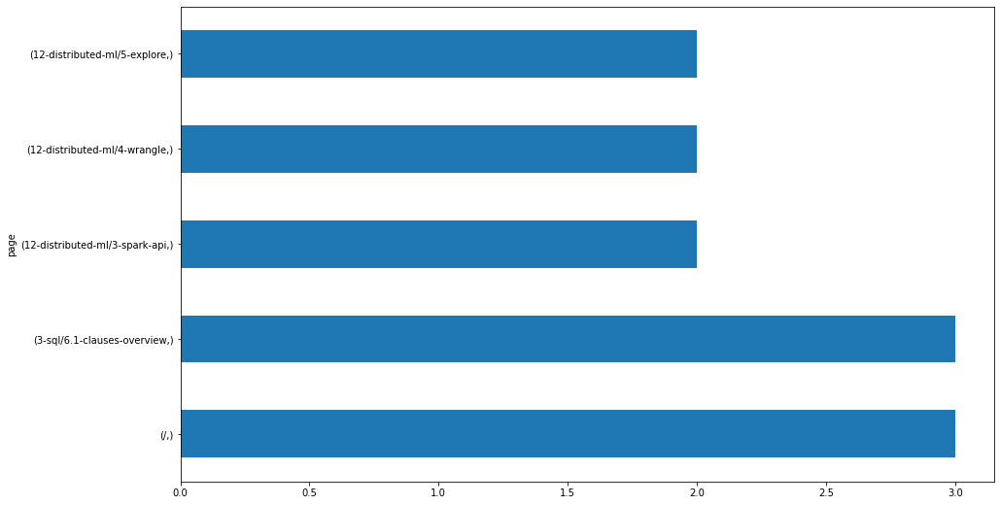


172.56.7.16
page                                    
appendix/cli/1-intro                        3
appendix/cli/0-overview                     2
appendix/cli-git-overview                   2
appendix/git                                1
appendix/cli/4-navigating-the-filesystem    1
appendix/cli/3-file-paths                   1
appendix/cli/2-listing-files                1
dtype: int64


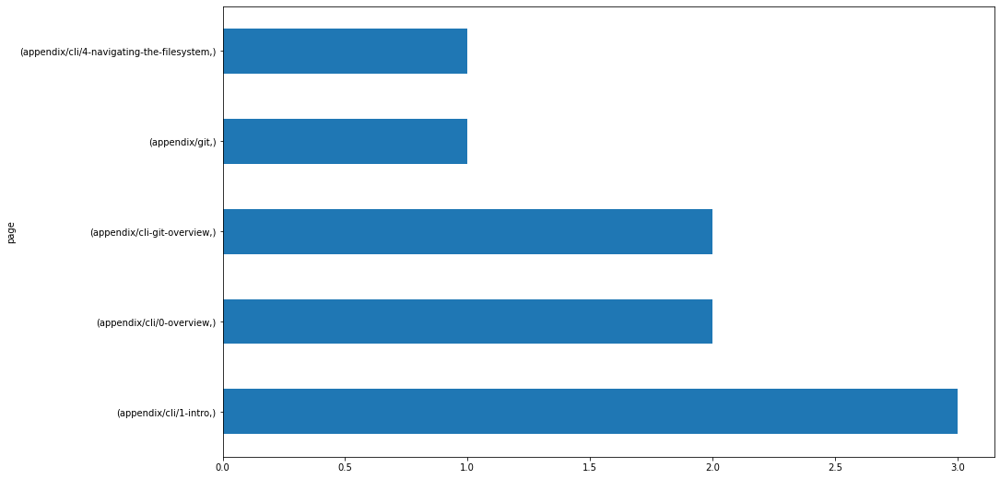


96.8.151.49
page                                    
/                                           3
search/search_index.json                    1
5-stats/4.1-hypothesis-testing-overview     1
5-stats/3-probability-distributions         1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/1.3-pipeline-demo            1
1-fundamentals/1.2-data-science-pipeline    1
dtype: int64


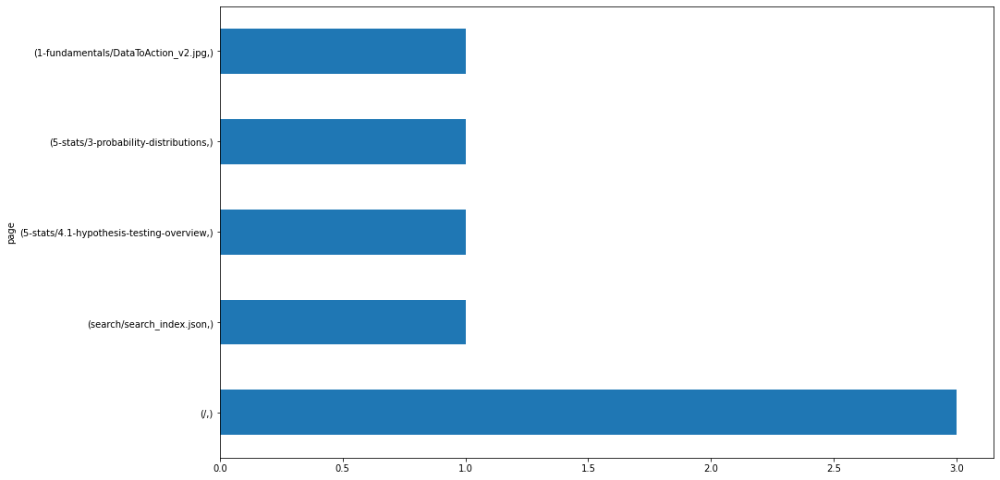


192.171.117.210
page                            
/                                   35
search/search_index.json            13
3-sql/6.2-where                     11
6-regression/8.0-Project            10
3-sql/7-functions                   10
                                    ..
4-python/7.4.2-series                1
4-python/7.4.1-pandas-overview       1
4-python/7.2-intro-to-matplotlib     1
appendix/open_data                   1
4-python/8.4.2-series                1
Length: 107, dtype: int64


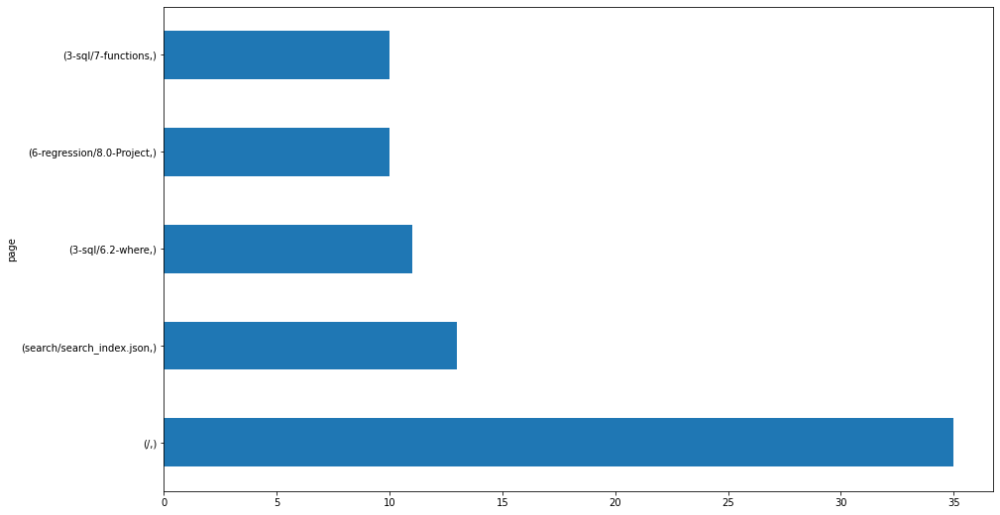


70.123.161.21
page                                   
5-stats/4.1-hypothesis-testing-overview    1
5-stats/3-probability-distributions        1
5-stats/2-descriptive-stats                1
5-stats/1-overview                         1
3-sql/10-temporary-tables                  1
/                                          1
dtype: int64


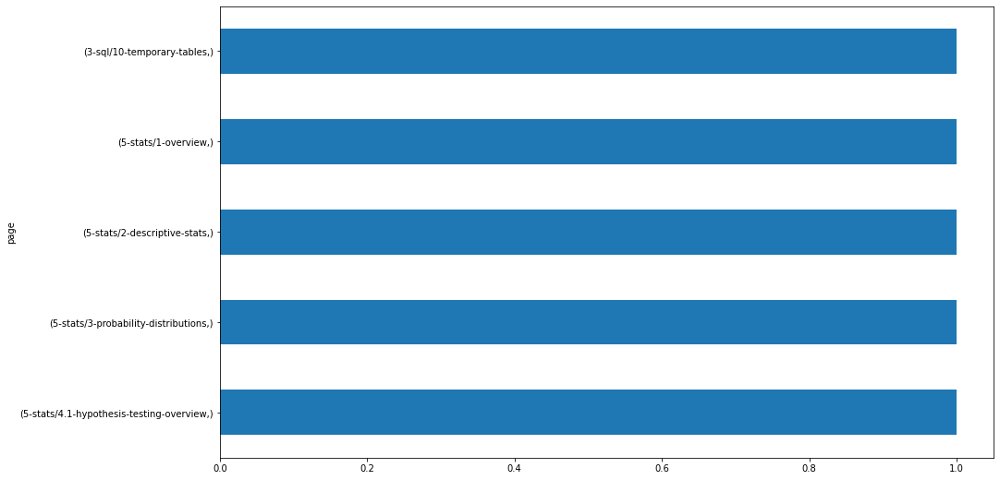


64.108.32.10
page                            
3-sql/9.4-subqueries                1
3-sql/9.3-joins                     1
3-sql/9.2-indexes                   1
3-sql/9.1-relationships-overview    1
3-sql/10-temporary-tables           1
dtype: int64


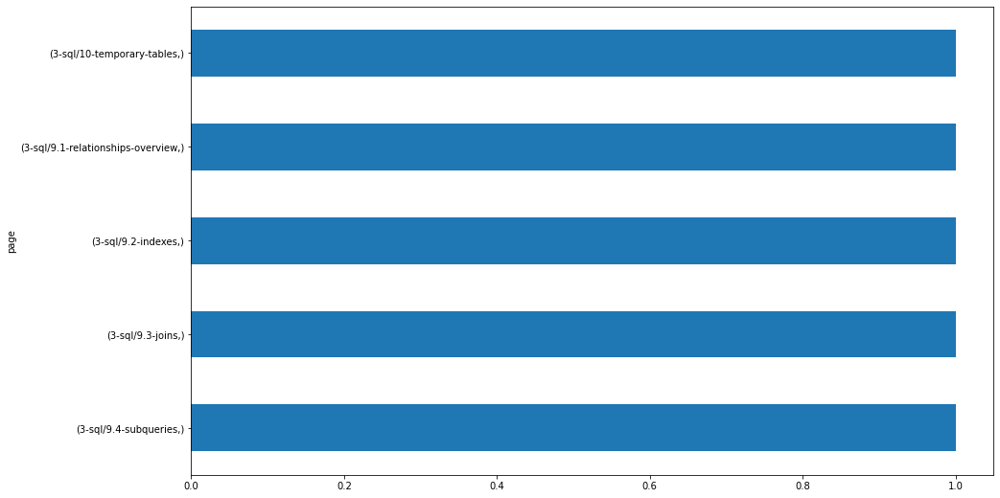


172.56.7.112
page                                    
3-sql/11-more-exercises                     1
3-sql/10-temporary-tables                   1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


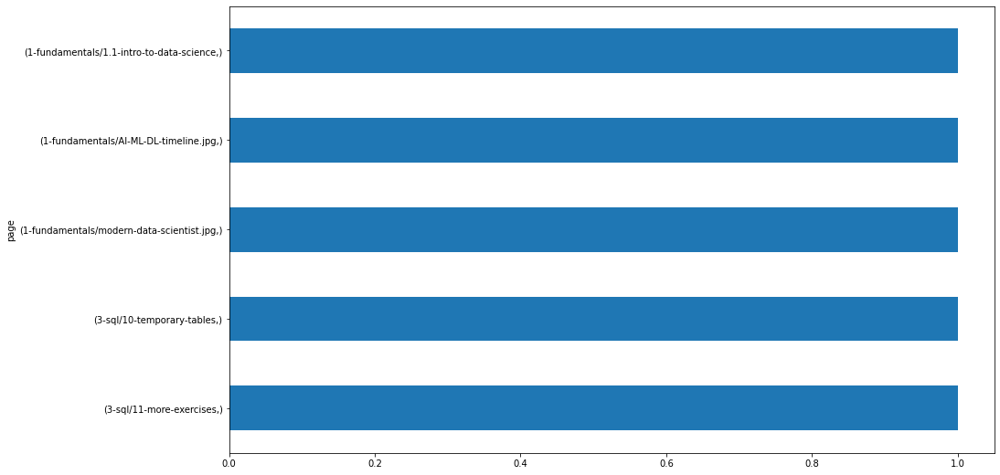


107.77.221.19
page                   
3-sql/11-more-exercises    1
/                          1
dtype: int64


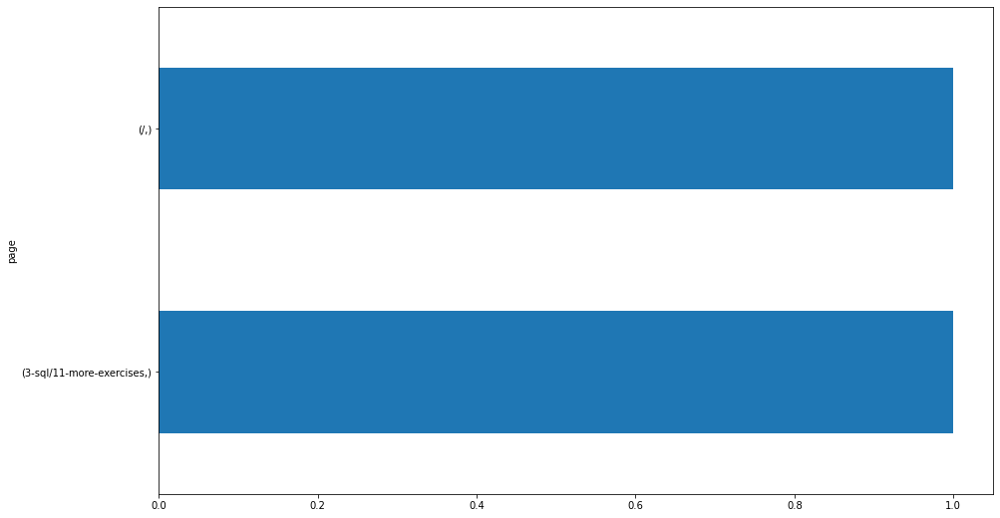


166.251.109.196
page                  
3-sql/9.2-indexes         1
2-storytelling/project    1
/                         1
dtype: int64


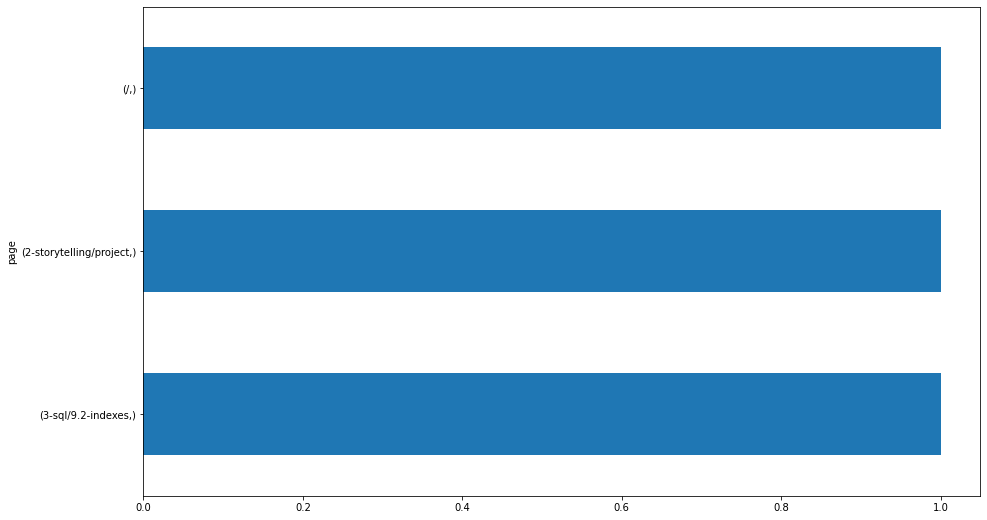


172.58.103.191
page                      
3-sql/8-group-by              1
3-sql/6.1-clauses-overview    1
3-sql/3-databases             1
dtype: int64


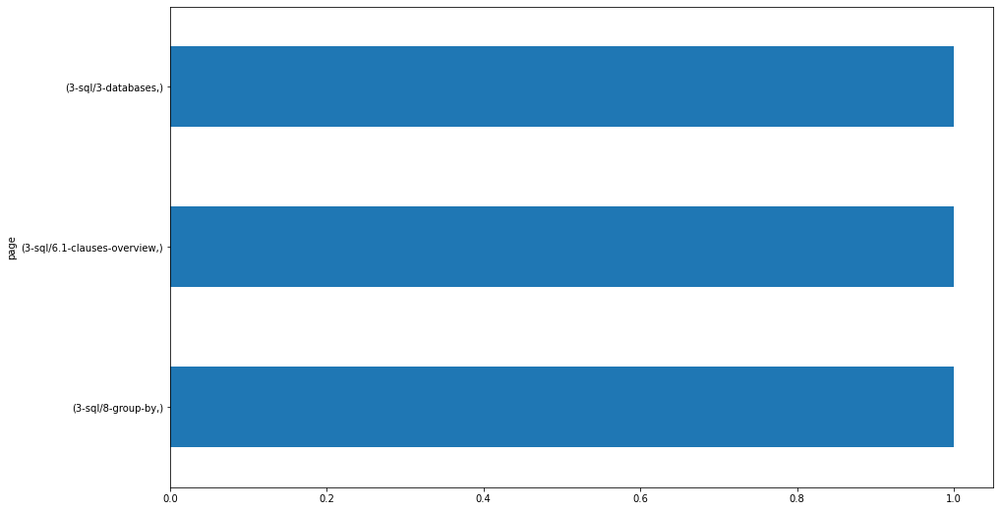


71.41.242.68
page
/       1
dtype: int64


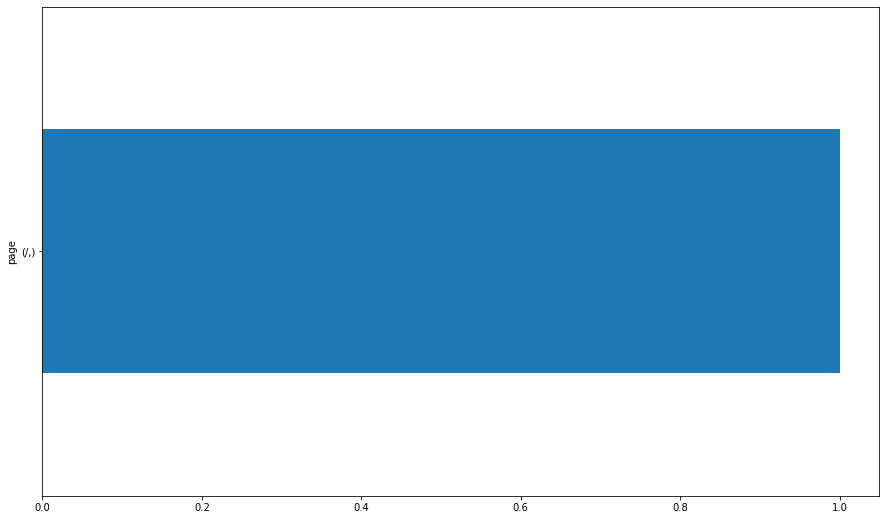


172.14.106.31
page                                     
/                                            29
6-regression/5.0-evaluate                    15
6-regression/7.0-model                       12
7-classification/6.1-logistic-regression      9
6-regression/6.0-feature-engineering          8
                                             ..
4-python/7.2-intro-to-matplotlib              1
4-python/4-control-structures                 1
6-regression/appendix-feature-engineering     1
12-distributed-ml/spark-local-mode.svg        1
4-python/7.4.3-dataframes                     1
Length: 67, dtype: int64


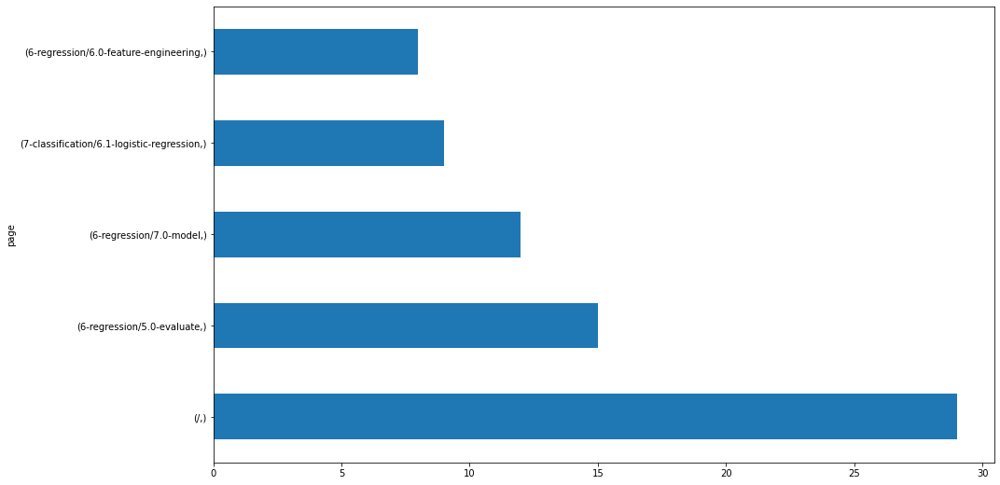


166.251.101.233
page                
4-python/project        2
4-python/6-imports      1
4-python/5-functions    1
dtype: int64


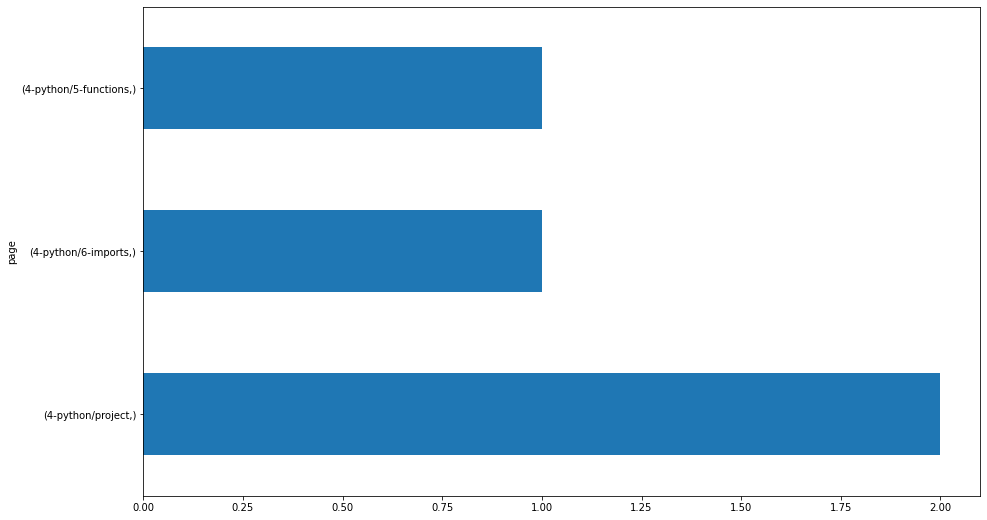


72.181.113.170
page                        
9-timeseries/4-explore          1
5-stats/2-simulation            1
4-python/project                1
11-nlp/2-regular-expressions    1
/                               1
dtype: int64


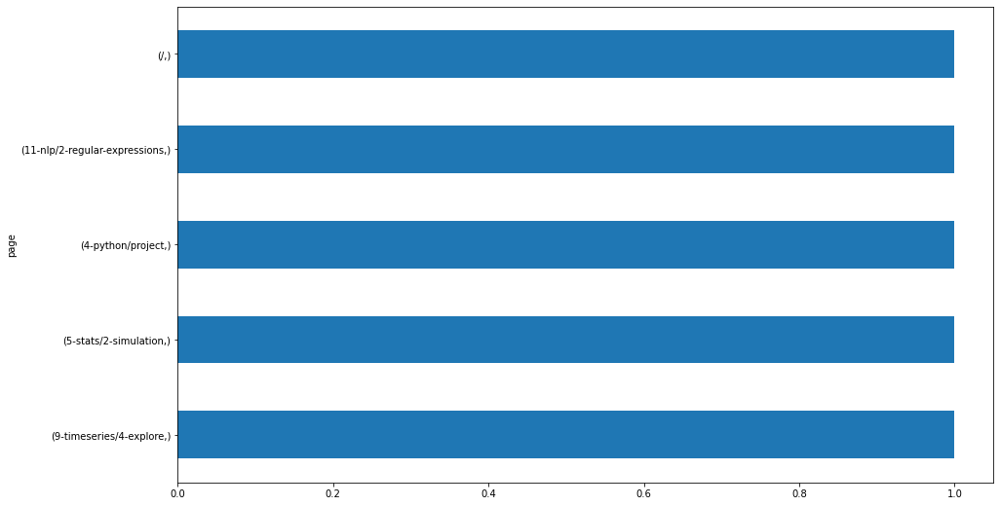


98.6.147.203
page                          
6-regression/5.0-evaluate         1
6-regression/4.0-explore          1
4-python/7.4.2-series             1
4-python/7.4.1-pandas-overview    1
4-python/7.3-intro-to-numpy       1
/                                 1
dtype: int64


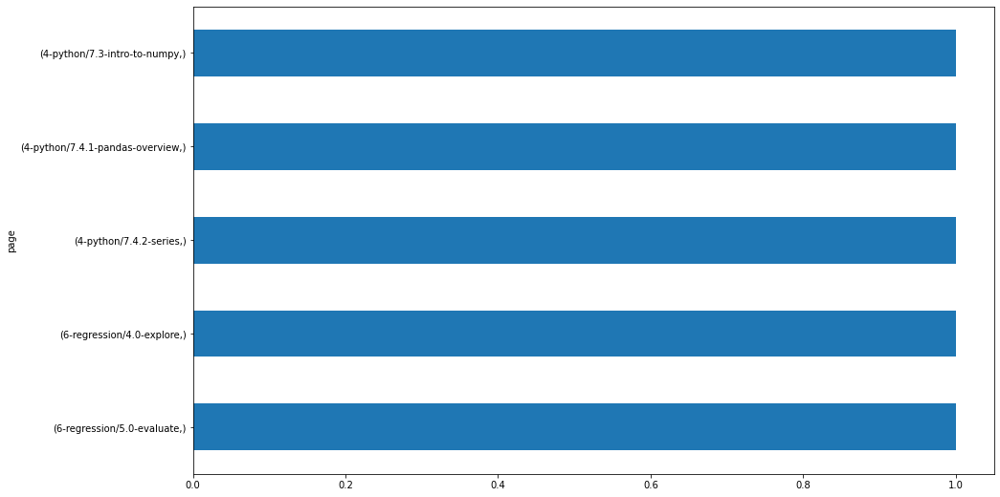


209.6.64.234
page                            
4-python/7.3-intro-to-numpy         1
4-python/7.2-intro-to-matplotlib    1
dtype: int64


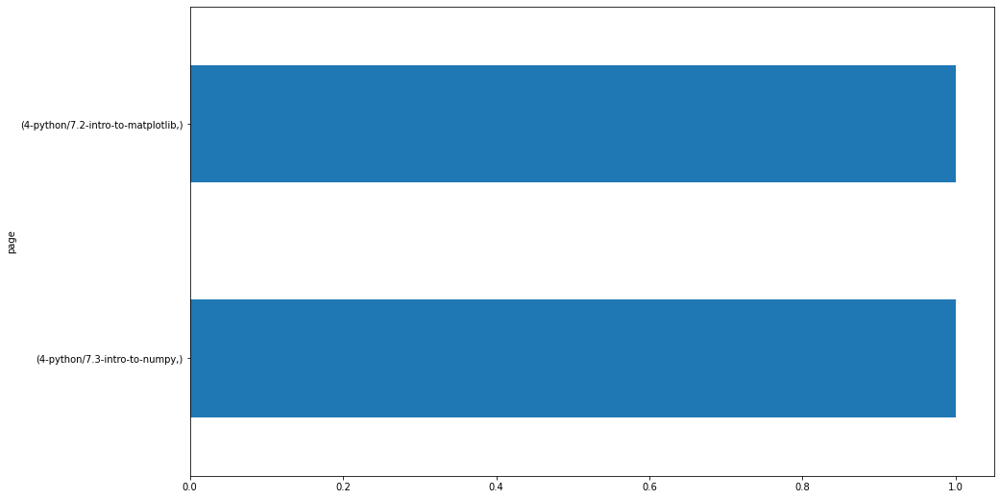


67.11.138.10
page                                    
/                                           36
8-clustering/4-explore                       7
8-clustering/3-wrangle                       7
7-classification/6.3-random-forests          7
7-classification/6.1-logistic-regression     6
                                            ..
4-python/7.4.2-series                        1
8-clustering/exercises                       1
4-python/2-introduction-to-python            1
3-sql/9.4-subqueries                         1
4-python/7.4-intro-to-pandas                 1
Length: 86, dtype: int64


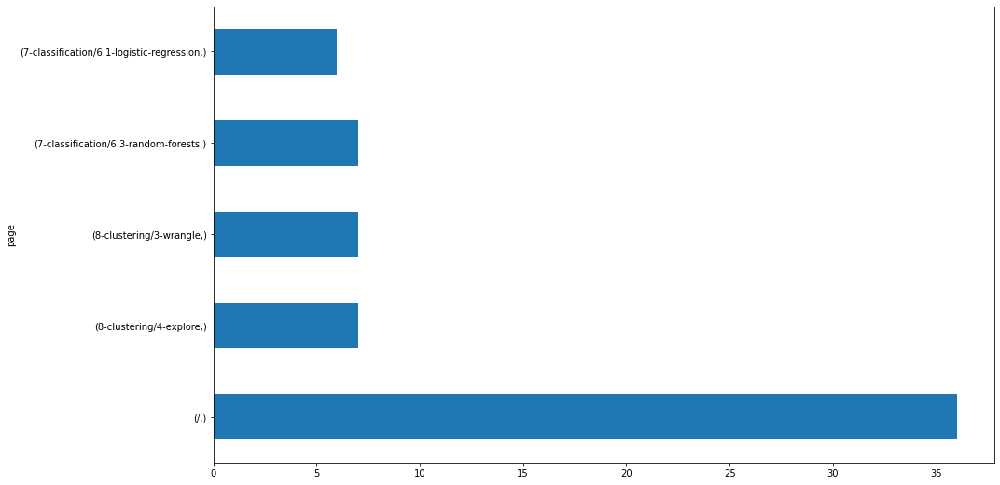


99.158.247.1
page                                             
/                                                    6
10-anomaly-detection/1-overview                      4
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    4
6-regression/8.0-Project                             3
3-sql/1-mysql-overview                               3
3-sql/2-mysql-introduction                           2
3-sql/3-databases                                    2
appendix/cli-git-overview                            2
7-classification/project                             2
7-classification/4-explore                           1
2-storytelling/1-overview                            1
1-fundamentals/1.2-data-science-pipeline             1
1-fundamentals/DataToAction_v2.jpg                   1
9-timeseries/5-explore                               1
9-timeseries/4-explore                               1
11-nlp/github_repo_language.gif                      1
11-nlp/project                                       1
8

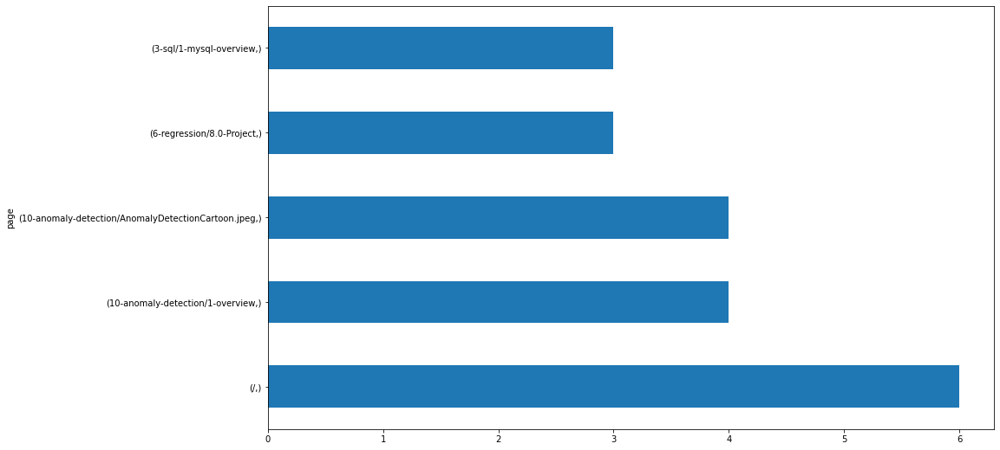


71.78.217.82
page                                         
/                                                3
appendix/interview_questions_students            1
4-python/7.4.3-dataframes                        1
3-sql/database-design                            1
12-distributed-ml/spark-local-mode.svg           1
12-distributed-ml/spark-execution-diagram.svg    1
12-distributed-ml/1-overview                     1
dtype: int64


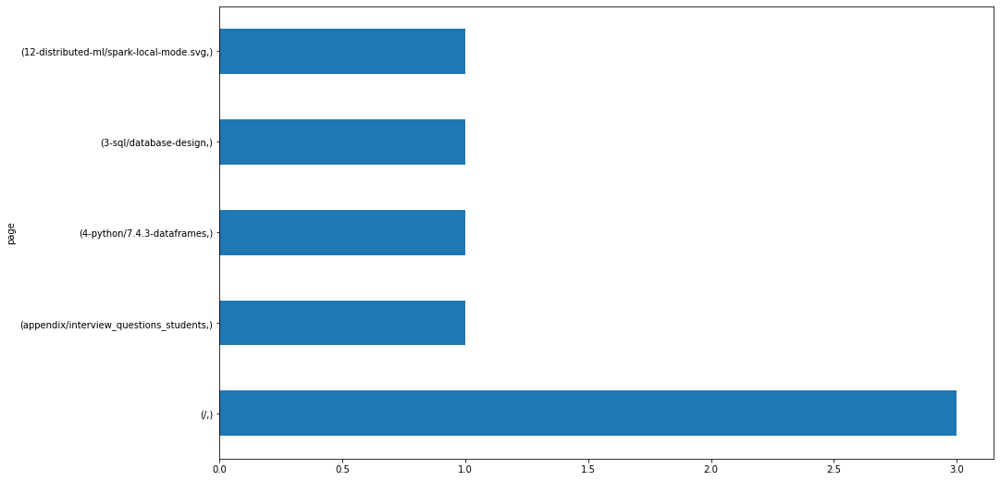


12.247.3.50
page                                   
/                                          4
3-sql/12-more-exercises                    3
8-clustering/3-wrangle                     1
6-regression/8.0-Project                   1
2-storytelling/misleading3_deaths.jpg      1
2-storytelling/misleading1_fox.jpg         1
2-storytelling/misleading1_baseball.jpg    1
2-storytelling/chart-keywords              1
2-storytelling/bad-charts                  1
2-storytelling/2.4-present                 1
2-storytelling/2.3-refine                  1
2-storytelling/2.2-create                  1
2-storytelling/2.1-understand              1
2-storytelling/1-overview                  1
dtype: int64


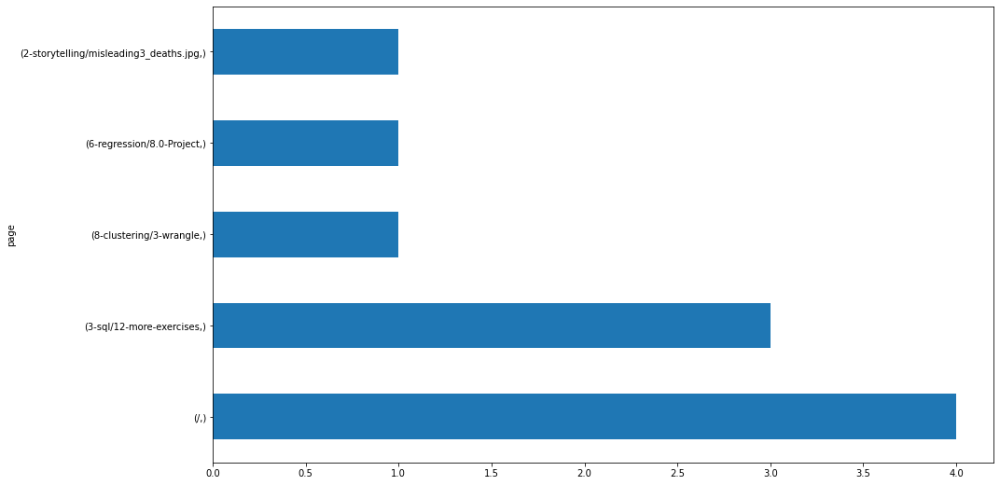


184.226.46.205
page                    
search/search_index.json    1
dtype: int64


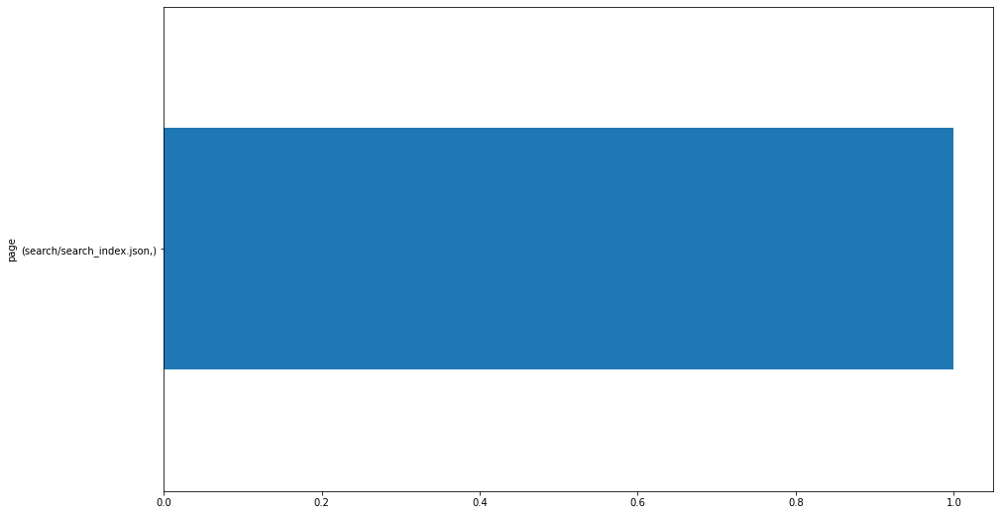


67.48.59.123
page                              
5-stats/2-simulation                  1
4-python/7.4.4-advanced-dataframes    1
/                                     1
dtype: int64


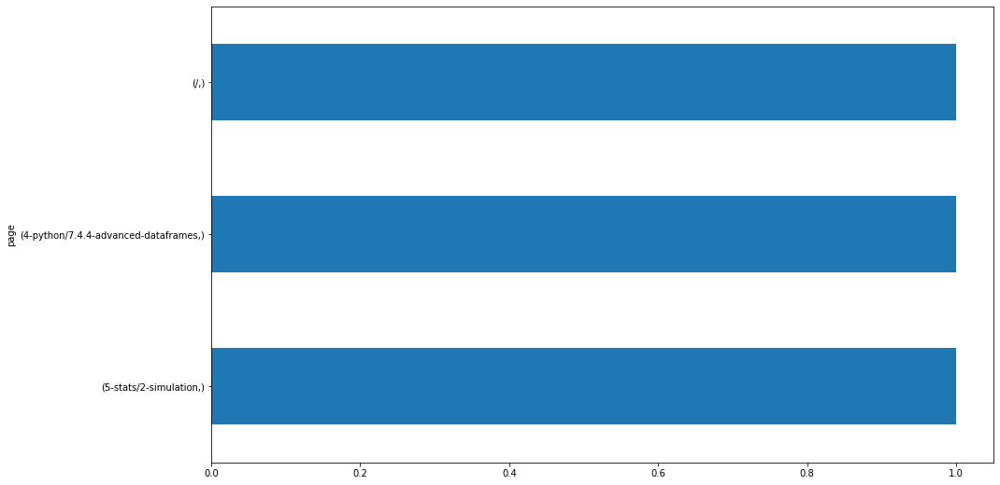


208.54.86.240
page                                    
5-stats/3-probability-distributions         1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


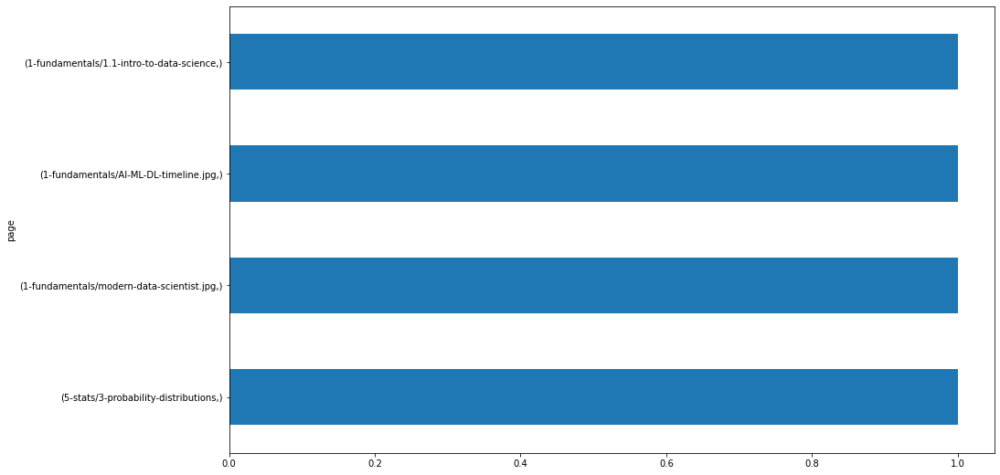


166.251.106.216
page                                    
/                                           3
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.3-pipeline-demo            1
1-fundamentals/1.2-data-science-pipeline    1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


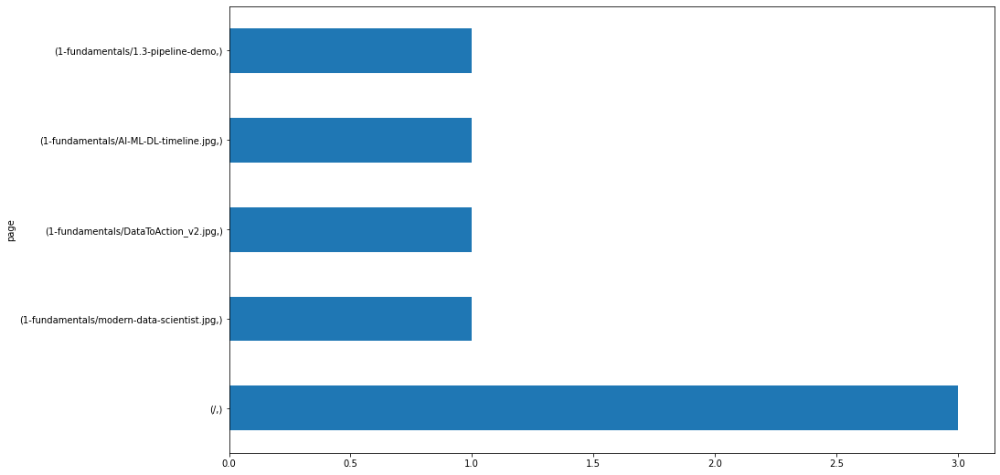


67.10.164.203
page                                    
5-stats/3-probability-distributions         1
5-stats/2-simulation                        1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.2-data-science-pipeline    1
1-fundamentals/1.1-intro-to-data-science    1
/                                           1
dtype: int64


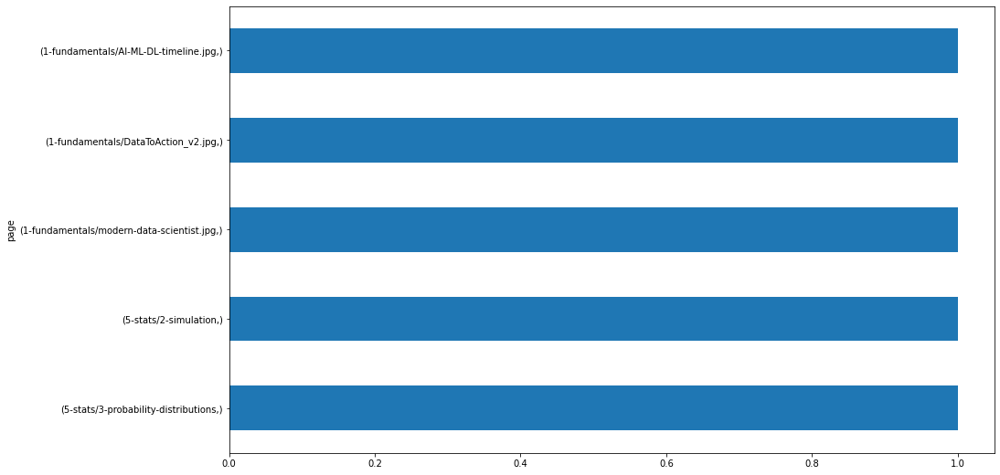


172.58.110.227
page                               
5-stats/3-probability-distributions    1
dtype: int64


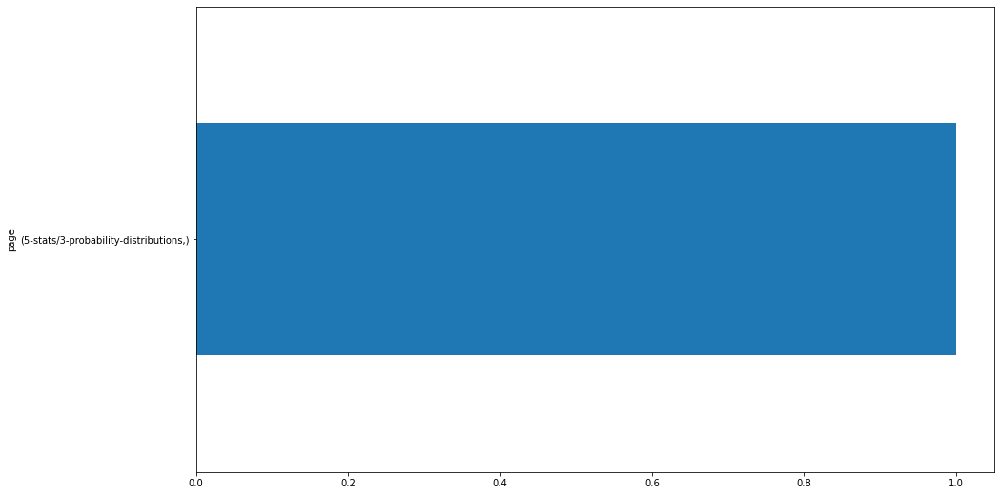


166.251.101.2
page                                         
5-stats/Selecting_a_hypothesis_test.svg          1
5-stats/4.5-more-statistical-testing-examples    1
5-stats/4.1-hypothesis-testing-overview          1
5-stats/3-probability-distributions              1
/                                                1
dtype: int64


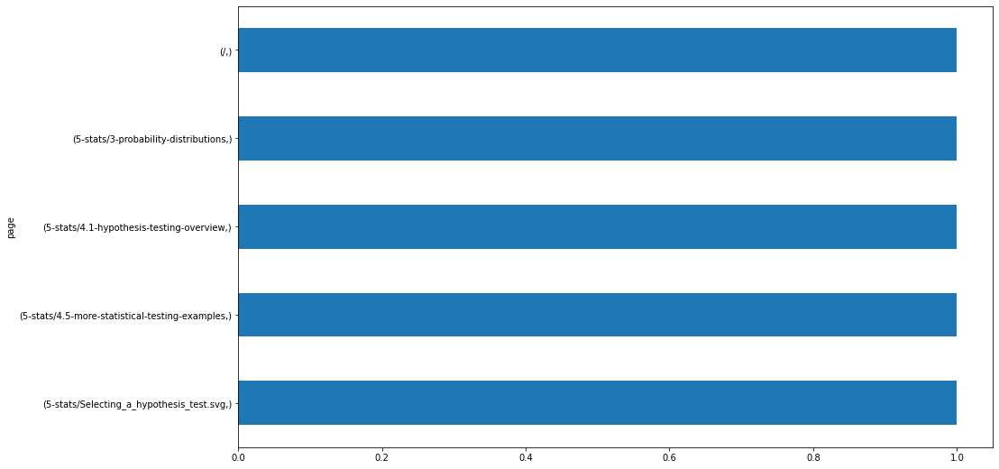


12.97.187.16
page                   
5-stats/4.3-correlation    1
dtype: int64


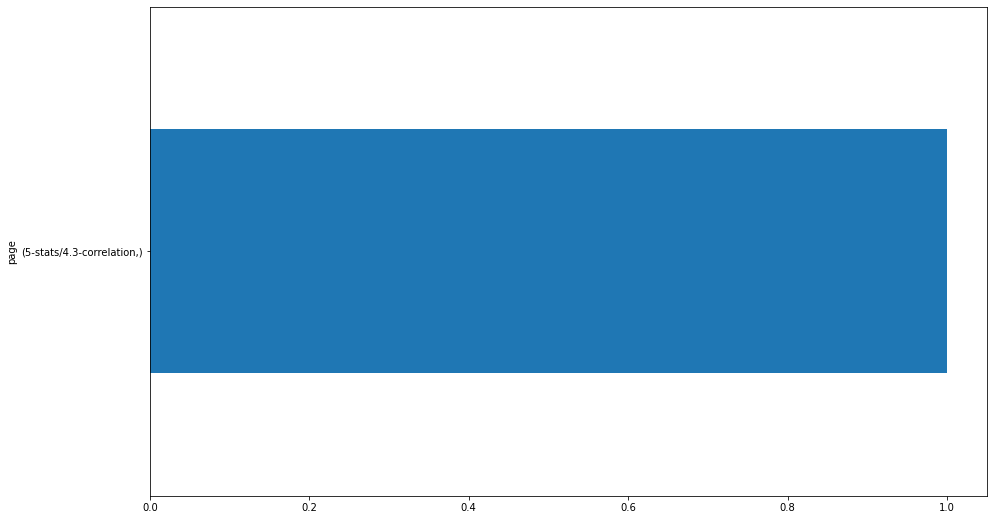


166.251.101.230
page                             
/                                    2
9-timeseries/5.1-modeling-lesson1    1
5-stats/4.3-correlation              1
dtype: int64


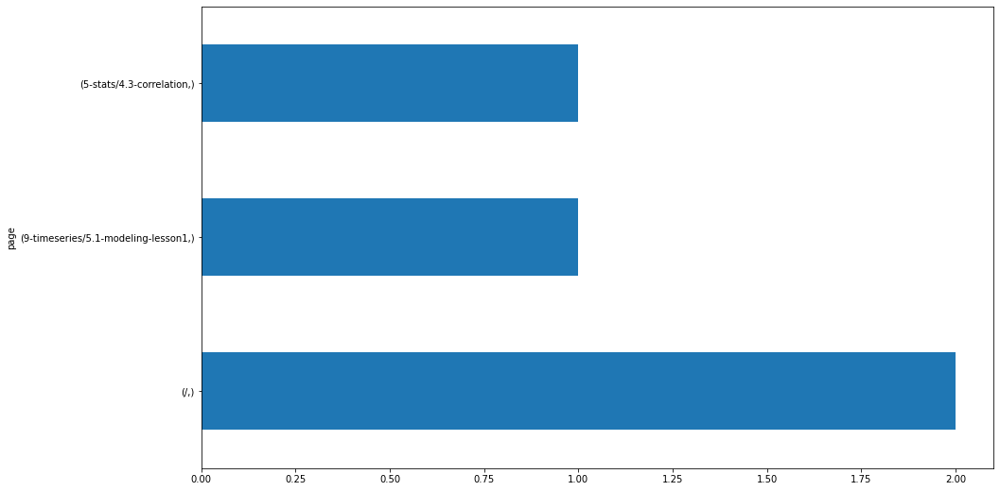


75.4.99.66
page                                
6-regression/project                    1
6-regression/1-overview                 1
5-stats/4.4-compare-group-membership    1
5-stats/4.3-correlation                 1
5-stats/4.2-compare-means               1
5-stats/3-probability-distributions     1
dtype: int64


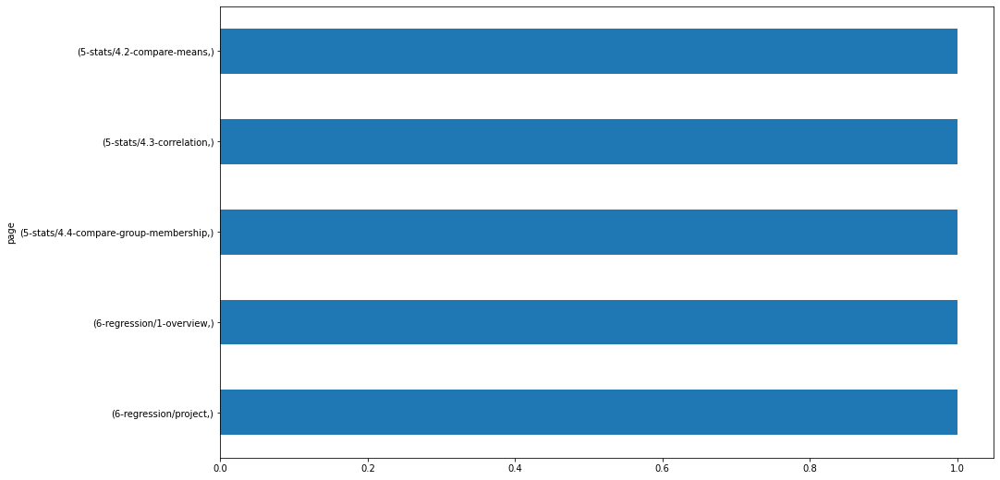


172.58.110.148
page                                
6-regression/8.0-Project                1
6-regression/2.0-acquire-and-prep       1
5-stats/4.4-compare-group-membership    1
5-stats/4.3-correlation                 1
4-python/5-functions                    1
3-sql/1-mysql-overview                  1
dtype: int64


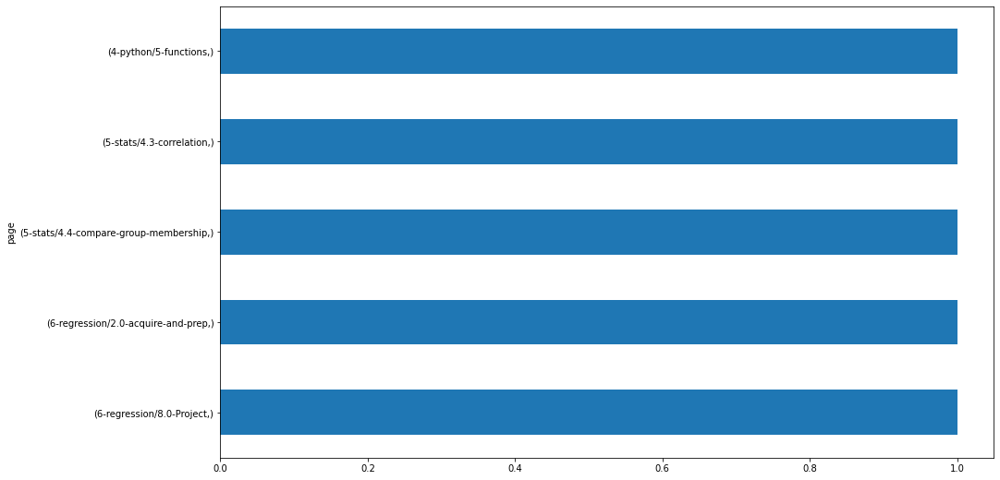


172.58.107.104
page                            
6-regression/8-project              2
4-python/5-functions                2
6-regression/4.0-explore            1
6-regression/3.0-split-and-scale    1
6-regression/1-overview             1
dtype: int64


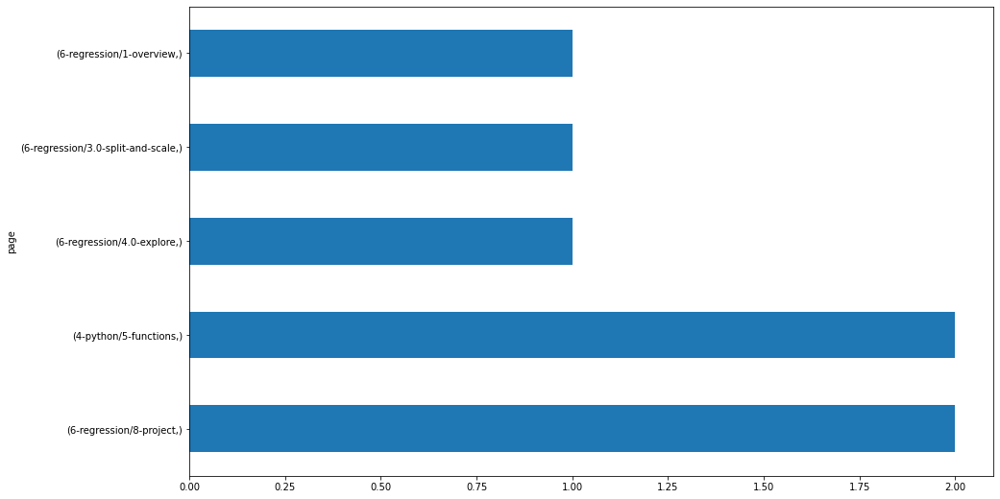


70.121.200.203
page                                
6-regression/8.0-Project                2
6-regression/7.0-model                  2
6-regression/5.0-evaluate               2
6-regression/6.0-feature-engineering    1
6-regression/4.0-explore                1
6-regression/3.0-split-and-scale        1
6-regression/2.0-acquire-and-prep       1
6-regression/1-overview                 1
/                                       1
dtype: int64


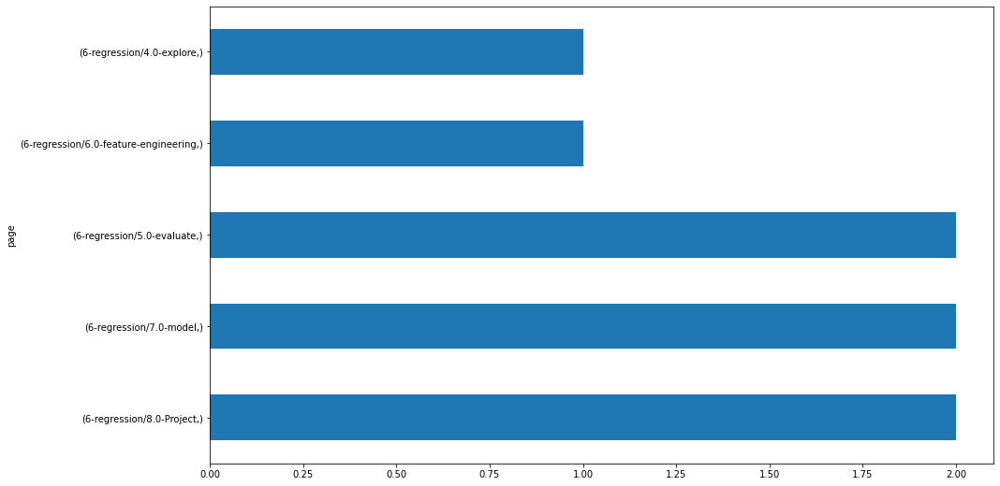


172.58.96.115
page
/       1
dtype: int64


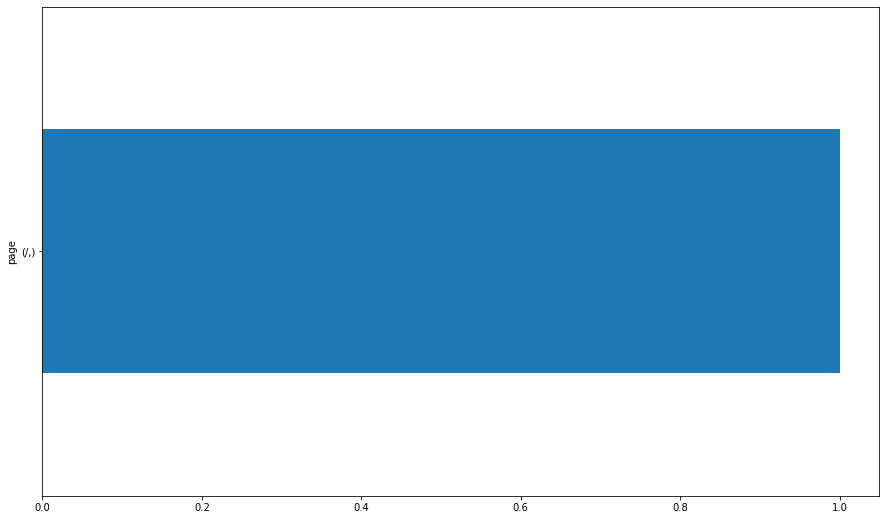


172.58.70.158
page                    
6-regression/8.0-Project    1
dtype: int64


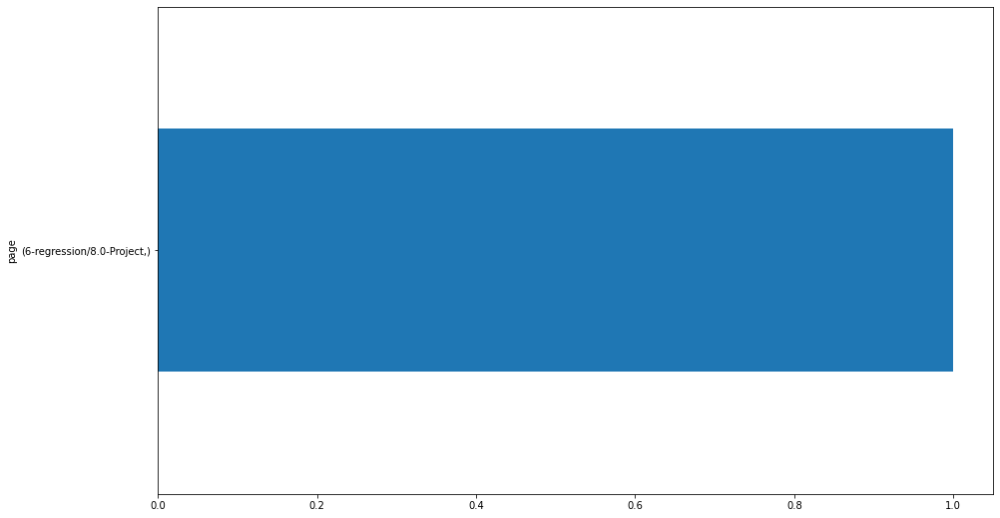


107.77.220.85
page                            
6-regression/3.0-split-and-scale    1
dtype: int64


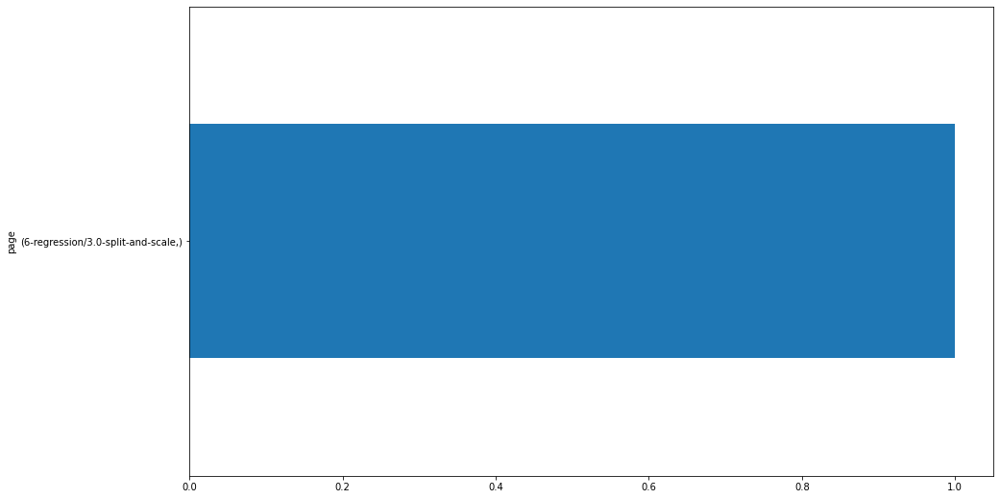


66.25.146.95
page                               
appendix/cli-git-overview              1
6-regression/4.0-explore               1
6-regression/2.0-acquire-and-prep      1
6-regression/1-overview                1
5-stats/5-power-analysis               1
5-stats/4.2-compare-means              1
5-stats/3-probability-distributions    1
5-stats/2-simulation                   1
5-stats/1-overview                     1
dtype: int64


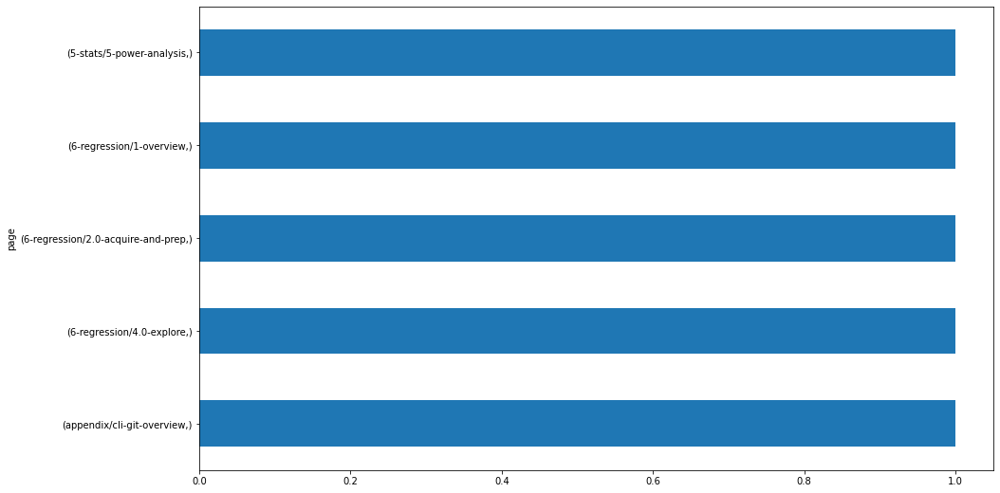


107.77.217.54
page                            
6-regression/3.0-split-and-scale    1
dtype: int64


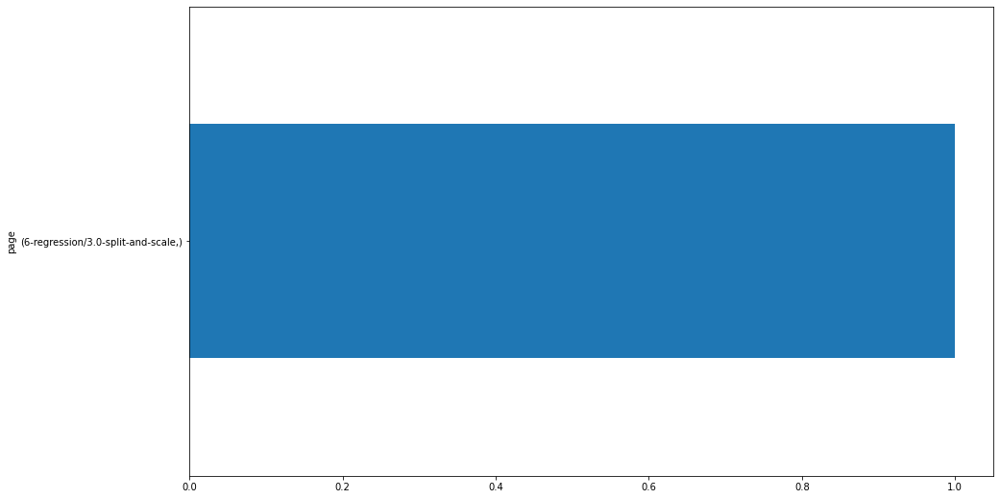


12.97.187.13
page                    
6-regression/8.0-Project    2
/                           1
dtype: int64


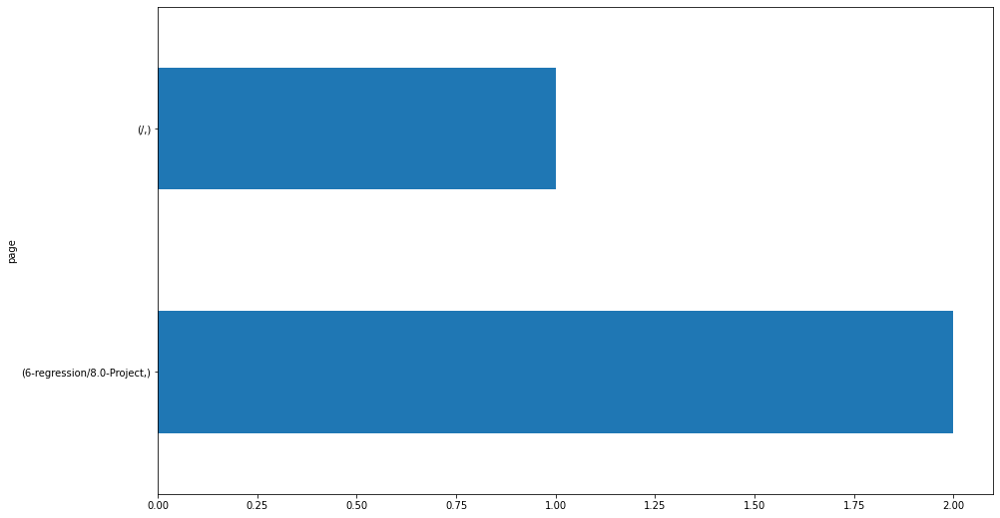


12.97.187.15
page                    
6-regression/8.0-Project    1
/                           1
dtype: int64


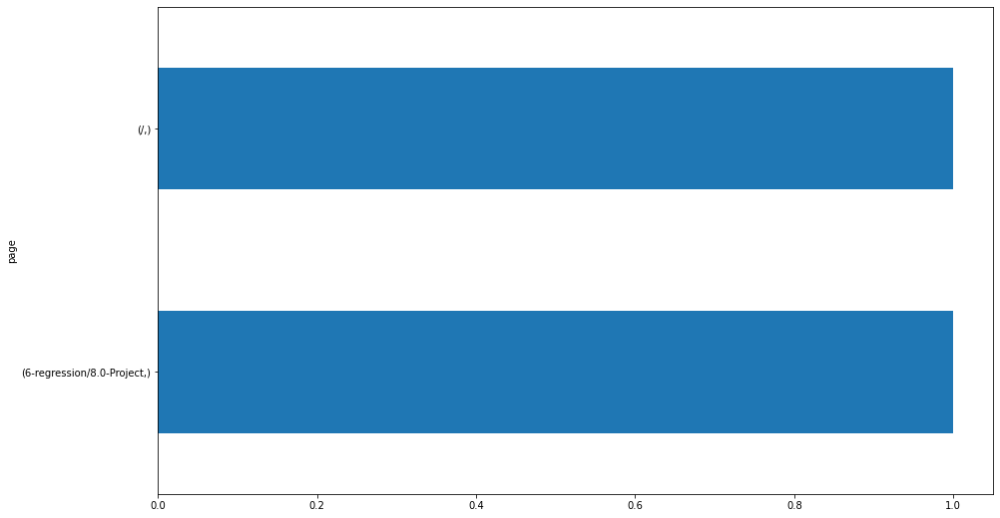


24.27.227.1
page                    
6-regression/8.0-Project    1
dtype: int64


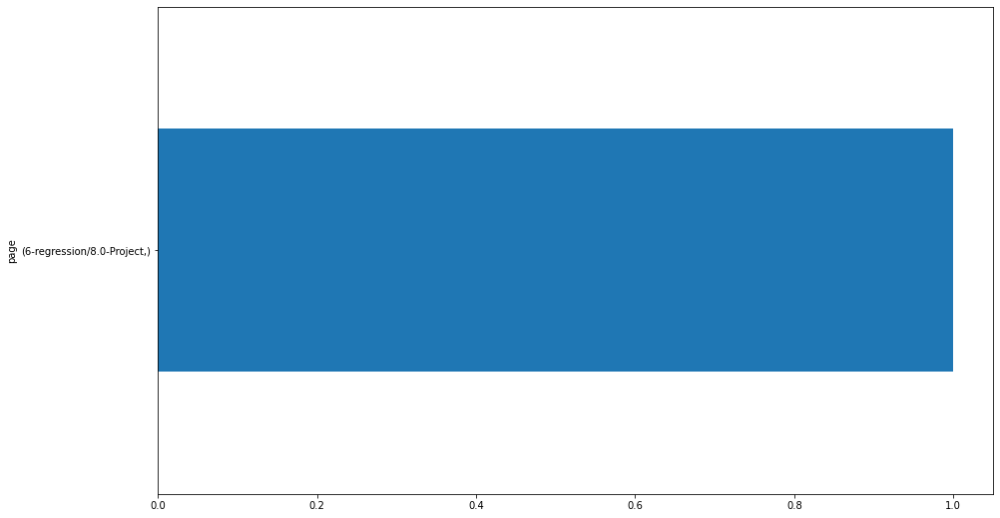


166.251.109.240
page                    
search/search_index.json    1
6-regression/8.0-Project    1
6-regression/7.0-model      1
dtype: int64


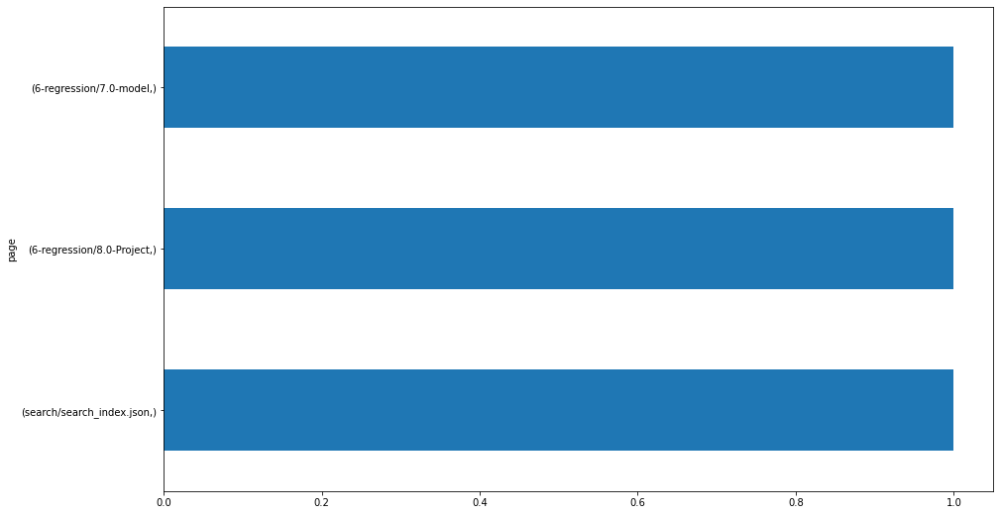


107.77.222.99
page                      
7-classification/3-prep       2
7-classification/2-acquire    1
dtype: int64


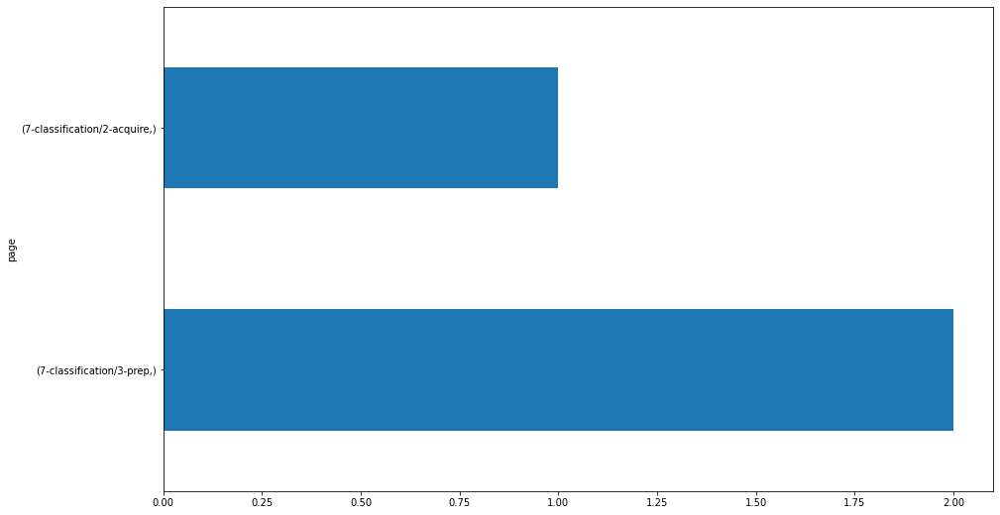


172.58.107.139
page                                    
7-classification/6.1-logistic-regression    1
dtype: int64


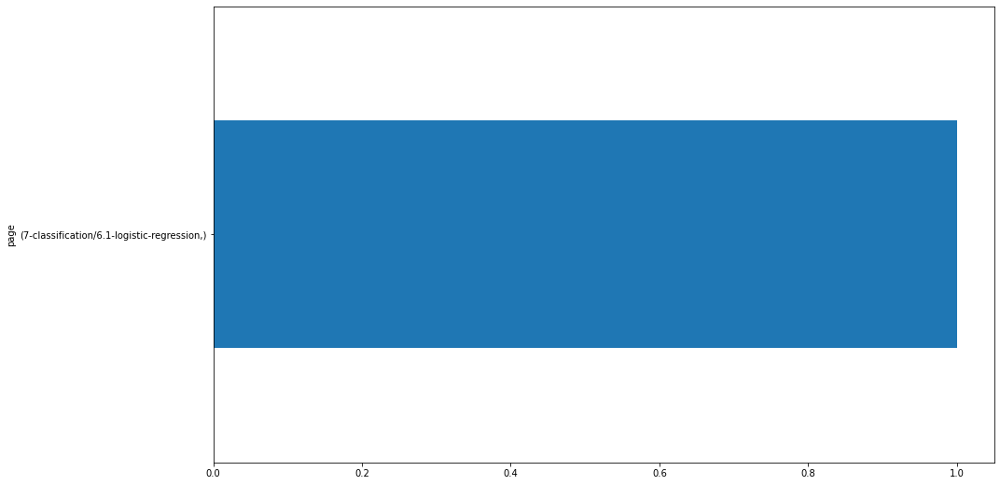


107.77.218.4
page                               
7-classification/6.2-decision-trees    2
7-classification/6.4-knn               1
7-classification/6.3-random-forests    1
dtype: int64


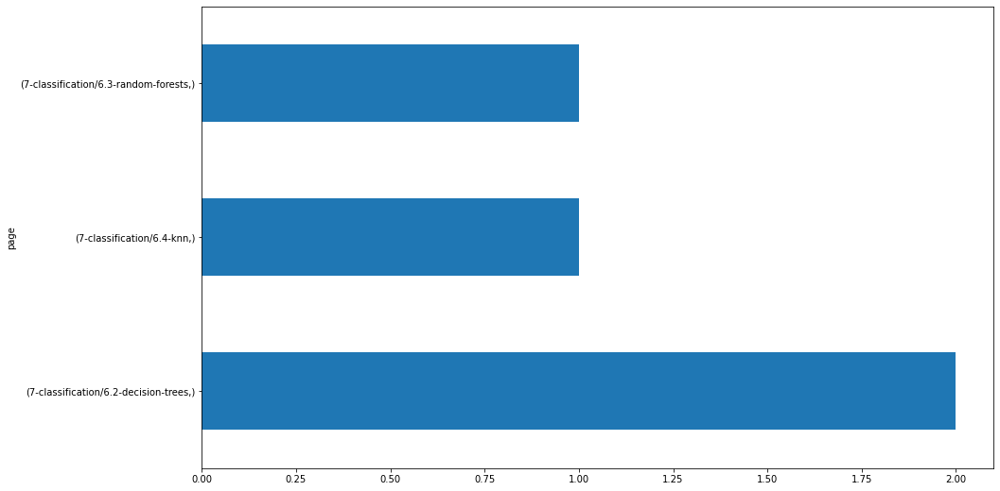


107.77.218.92
page                                    
7-classification/6.4-knn                    1
7-classification/6.1-logistic-regression    1
7-classification/4-explore                  1
7-classification/2-acquire                  1
dtype: int64


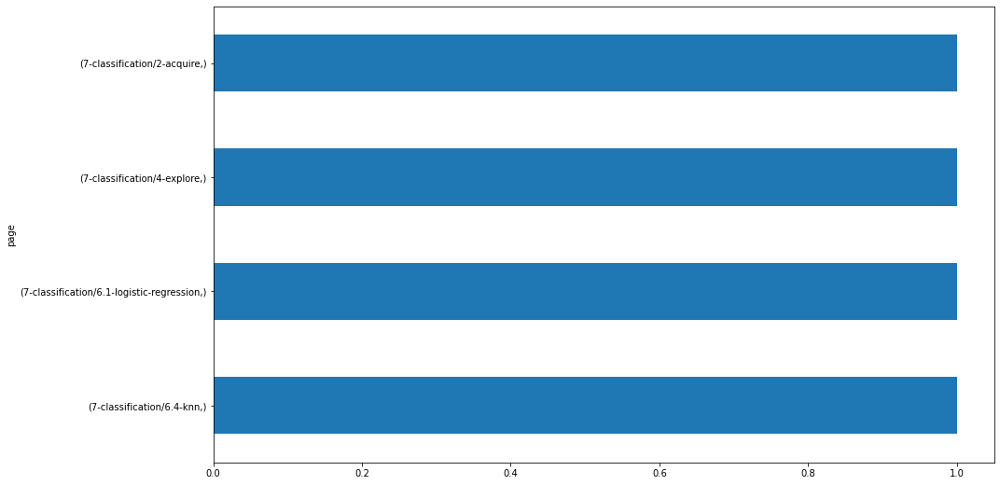


184.203.5.0
page
/       1
dtype: int64


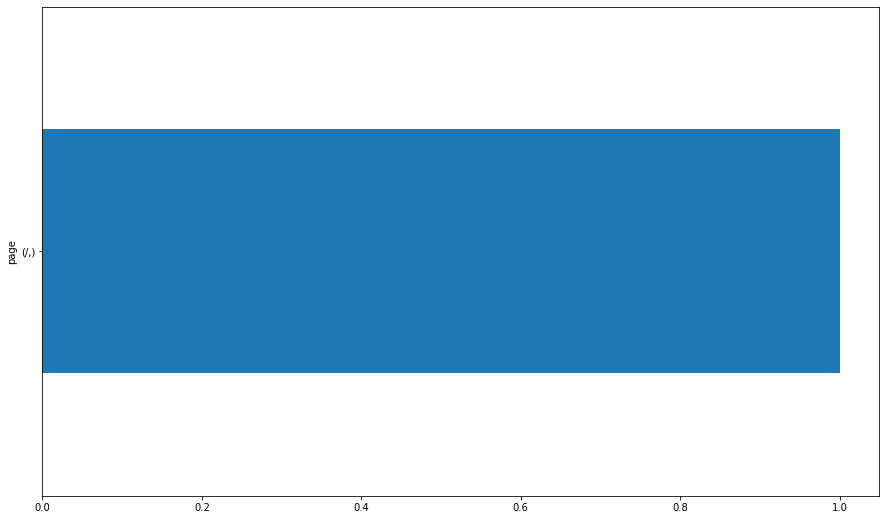


184.203.21.120
page                    
7-classification/project    2
dtype: int64


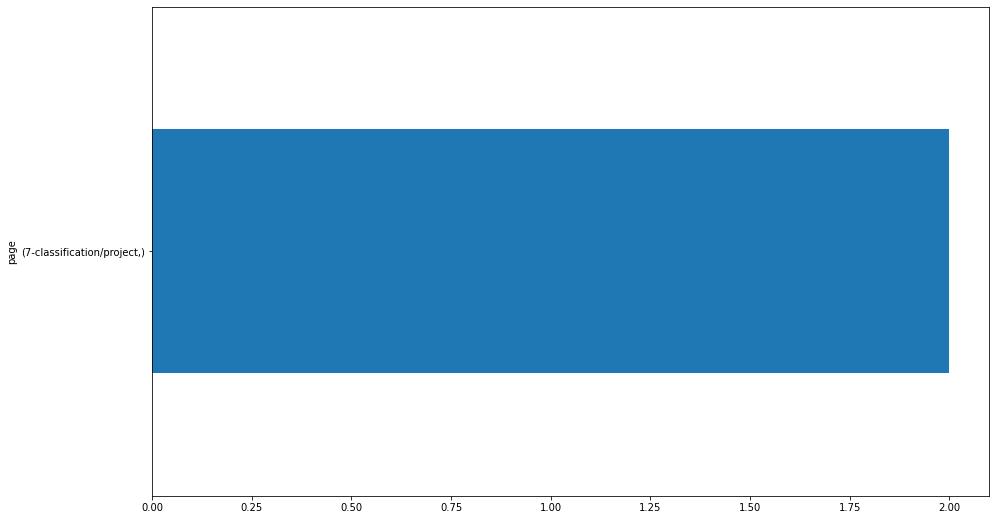


96.8.130.165
page                                       
/                                              6
9-timeseries/2-acquire                         1
8-clustering/exercises                         1
8-clustering/Hospital-Distance-Clusters.jpg    1
8-clustering/5.1-kmeans-part-1                 1
8-clustering/2-about                           1
7-classification/project                       1
7-classification/6.4-knn                       1
7-classification/6.3-random-forests            1
5-stats/4.2-compare-means                      1
dtype: int64


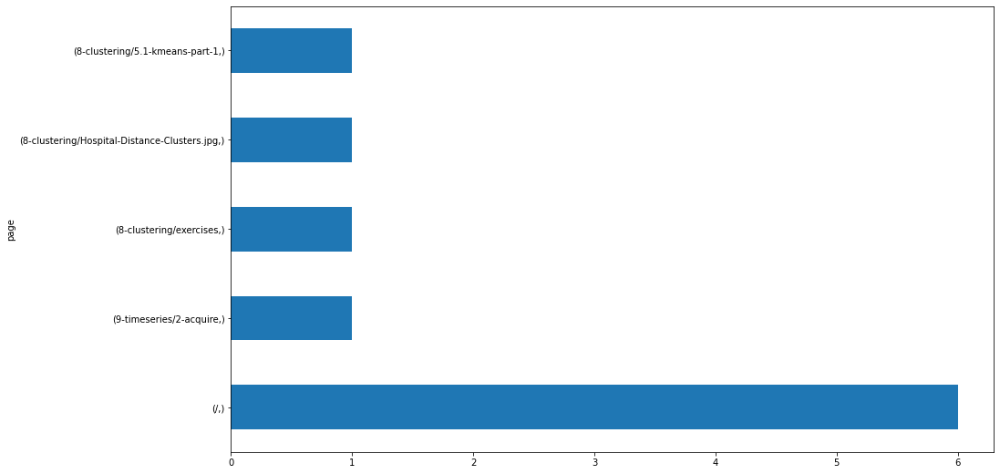


71.42.230.162
page                
8-clustering/project    1
dtype: int64


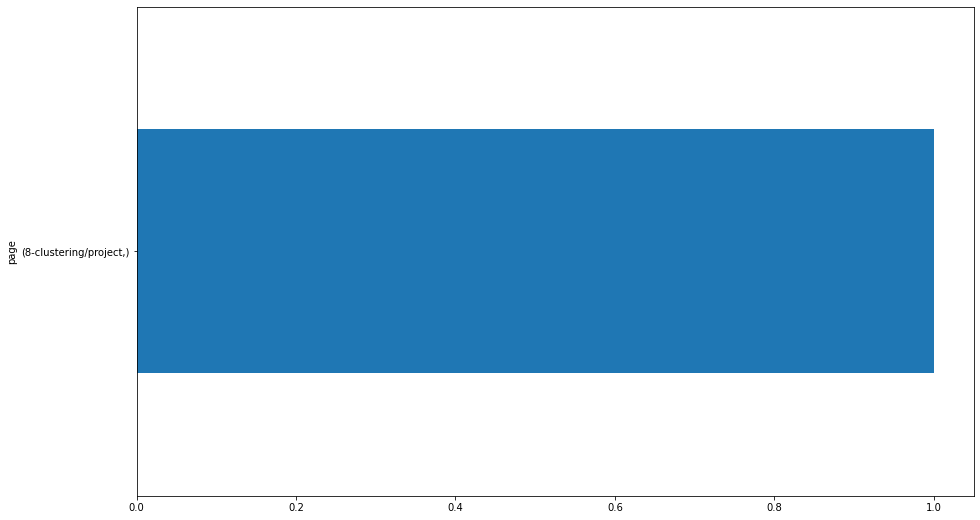


67.78.73.114
page                                    
1-fundamentals/modern-data-scientist.jpg    8
1-fundamentals/1.1-intro-to-data-science    8
1-fundamentals/AI-ML-DL-timeline.jpg        8
6-regression/8.0-Project                    6
8-clustering/project                        3
2-storytelling/project                      3
6-regression/7.0-model                      3
6-regression/2.0-acquire-and-prep           2
8-clustering/5.2-kmeans-part-2              2
6-regression/5.0-evaluate                   2
11-nlp/6-model                              1
11-nlp/github_repo_language.gif             1
9-timeseries/project                        1
11-nlp/4-prepare                            1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/1.2-data-science-pipeline    1
11-nlp/project                              1
6-regression/3.0-split-and-scale            1
6-regression/1-overview                     1
9-timeseries/4-explore                      1
6-regression/6.0-feature-

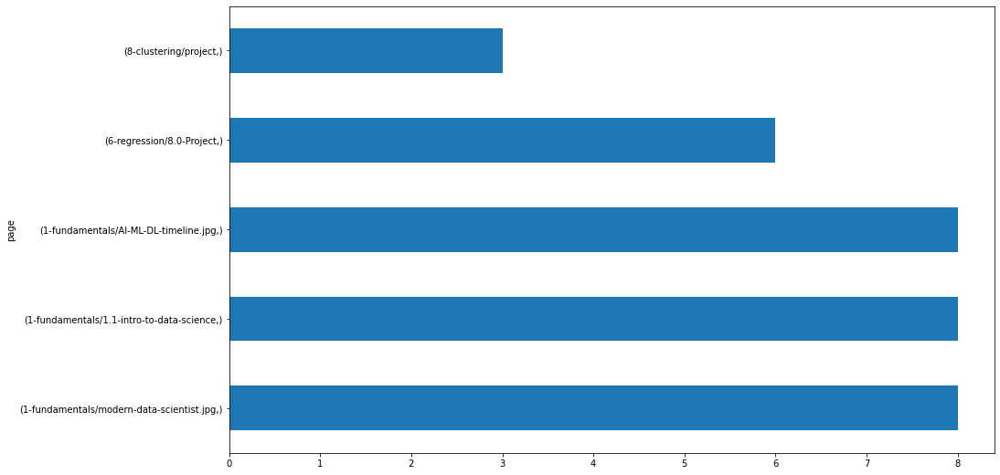


24.27.227.129
page                                
6-regression/7.0-model                  2
6-regression/5.0-evaluate               2
8-clustering/project                    1
6-regression/6.0-feature-engineering    1
6-regression/3.0-split-and-scale        1
/                                       1
dtype: int64


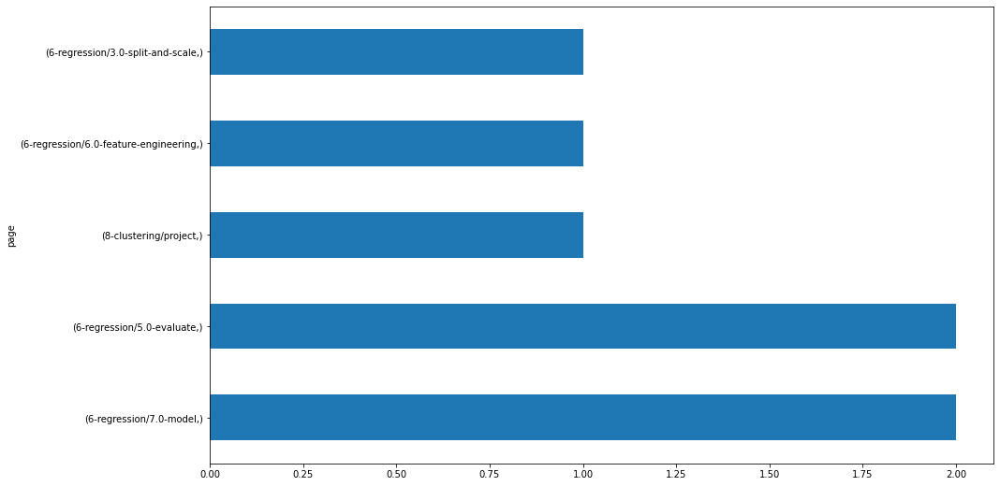


67.11.124.64
page                    
search/search_index.json    2
9-timeseries/project        1
8-clustering/3-wrangle      1
7-classification/3-prep     1
6-regression/7.0-model      1
dtype: int64


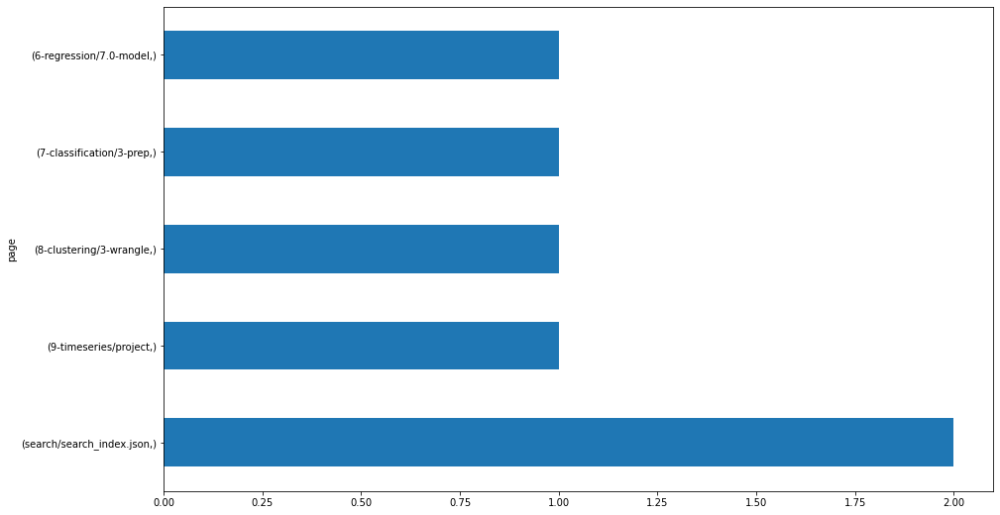


107.77.222.219
page                  
8-clustering/exercises    1
8-clustering/4-explore    1
/                         1
dtype: int64


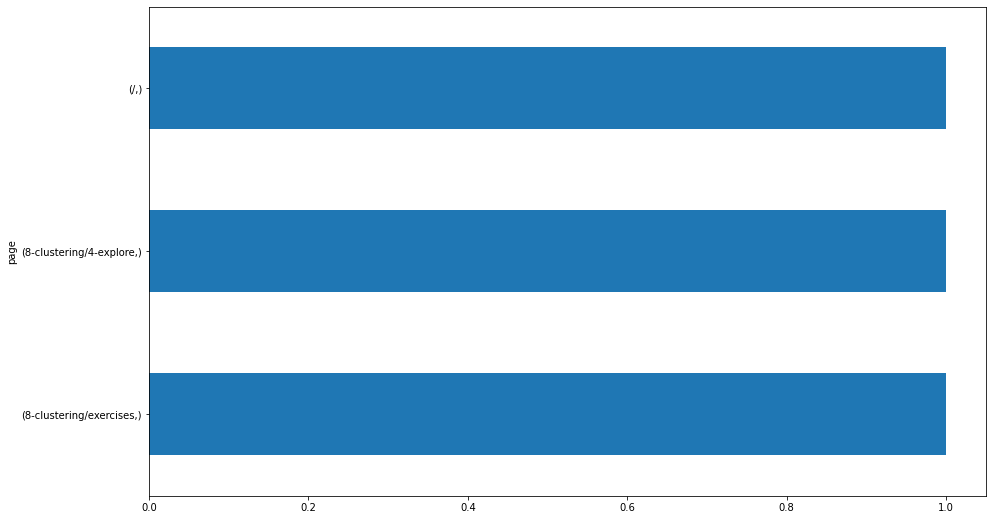


67.79.62.147
page                                    
search/search_index.json                    1
8-clustering/project                        1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/1.2-data-science-pipeline    1
/                                           1
dtype: int64


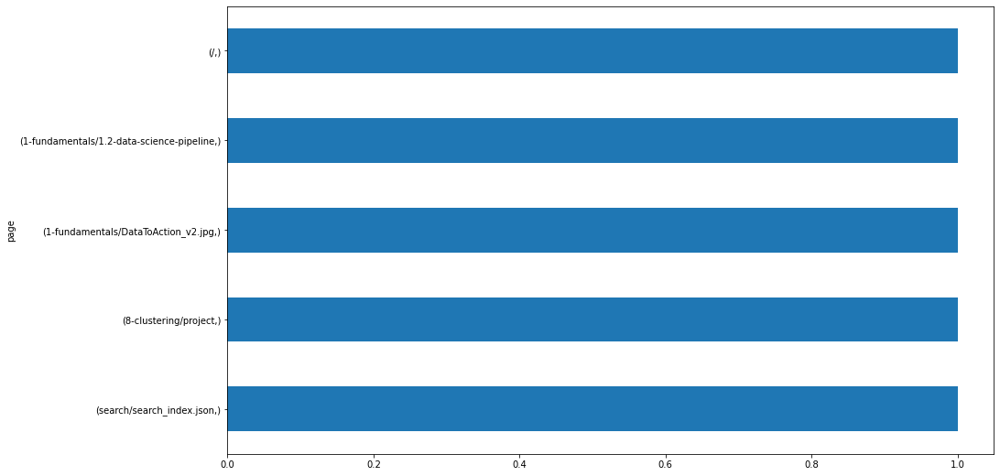


67.79.15.43
page                     
8-clustering/project         1
6-regression/7.0-model       1
6-regression/5.0-evaluate    1
dtype: int64


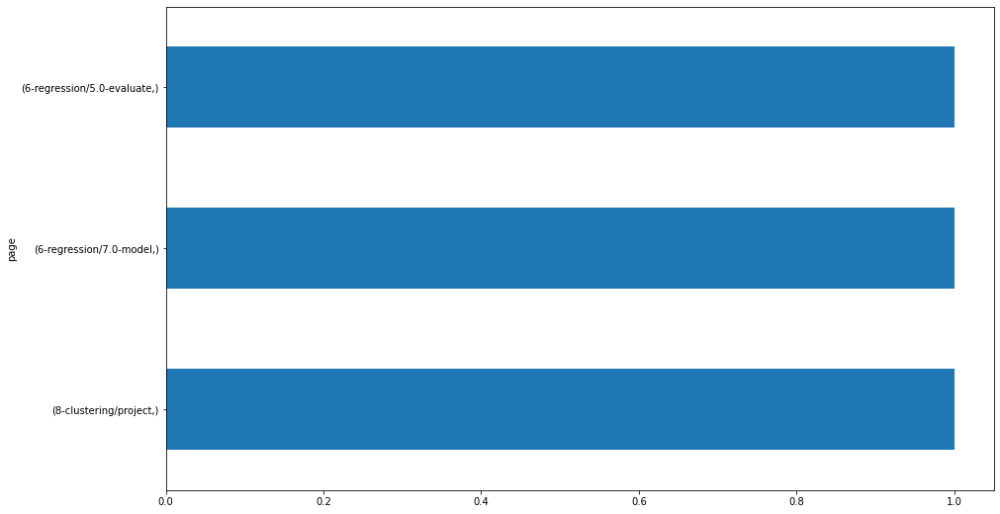


172.58.107.182
page                                       
9-timeseries/2-acquire                         1
9-timeseries/1-overview                        1
8-clustering/Hospital-Distance-Clusters.jpg    1
8-clustering/2-about                           1
8-clustering/1-overview                        1
dtype: int64


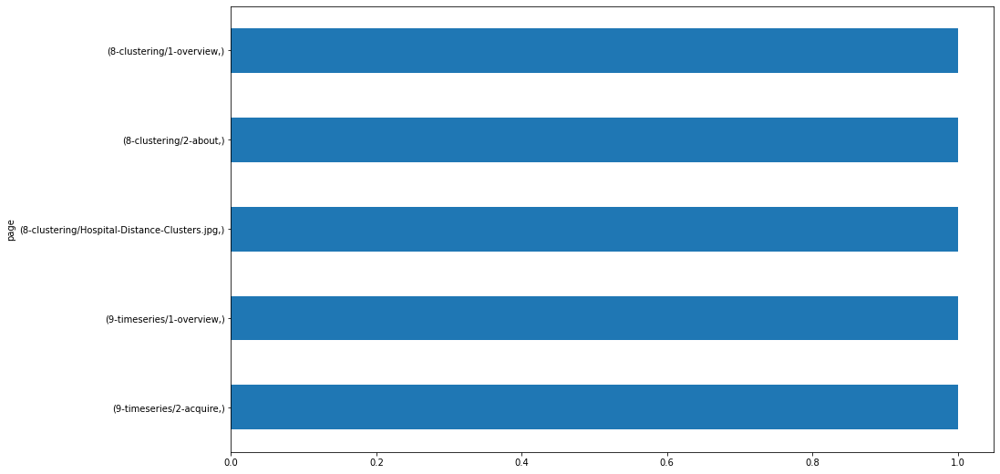


184.226.92.76
page                             
9-timeseries/5.1-modeling-lesson1    1
9-timeseries/4-explore               1
dtype: int64


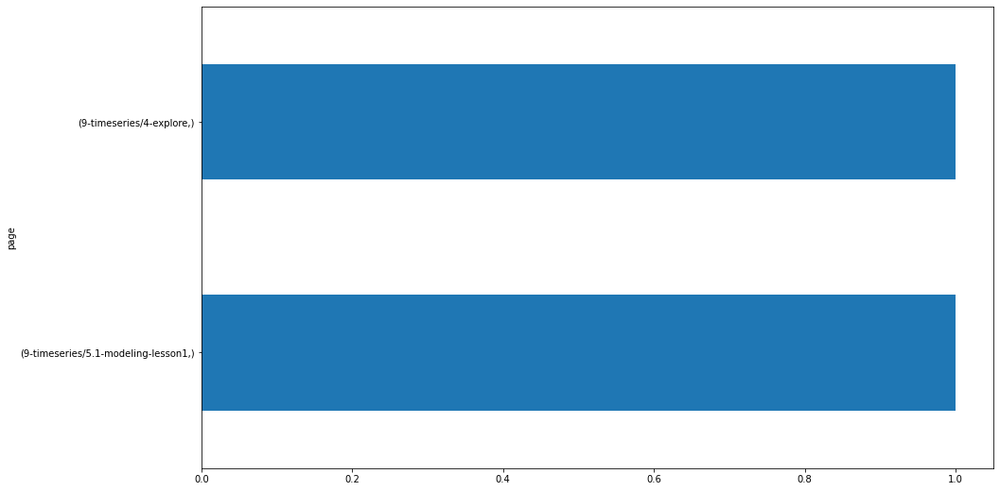


107.77.218.153
page                             
9-timeseries/5.2-modeling-lesson2    1
/                                    1
dtype: int64


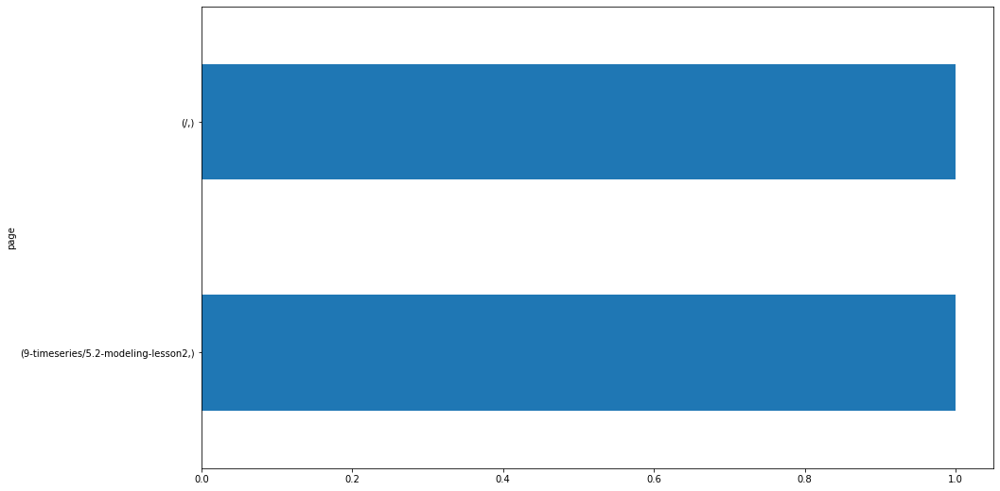


89.187.175.48
page
/       1
dtype: int64


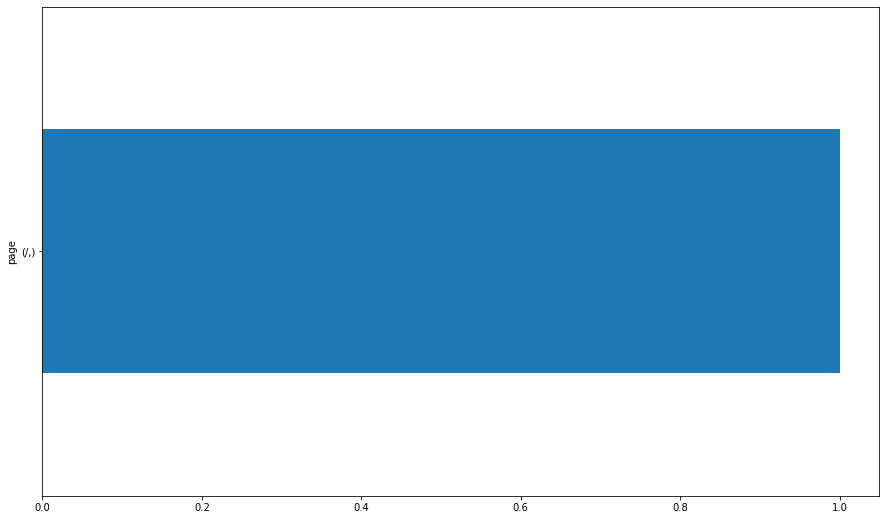


162.219.176.244
page                                             
1-fundamentals/1.1-intro-to-data-science             6
1-fundamentals/modern-data-scientist.jpg             6
1-fundamentals/AI-ML-DL-timeline.jpg                 6
1-fundamentals/1.2-data-science-pipeline             4
1-fundamentals/DataToAction_v2.jpg                   4
2-storytelling/1-overview                            2
6-regression/1-overview                              2
6-regression/2.0-acquire-and-prep                    1
6-regression/4.0-explore                             1
1-fundamentals/1.3-pipeline-demo                     1
1-fundamentals/2.1-excel-overview                    1
1-fundamentals/2.2-excel-functions                   1
1-fundamentals/3-vocabulary                          1
6-regression/3.0-split-and-scale                     1
5-stats/Selecting_a_hypothesis_test.svg              1
5-stats/4.5-more-statistical-testing-examples        1
10-anomaly-detection/1-overview                      

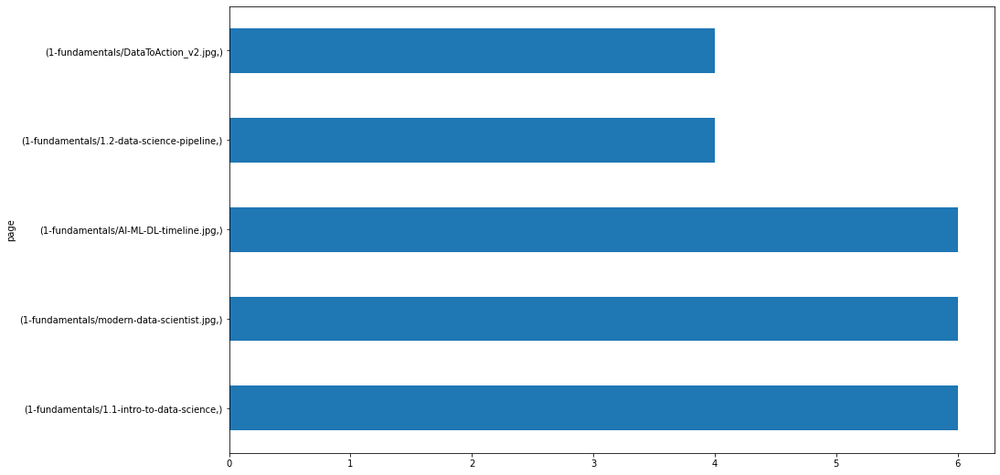


96.8.130.139
page                                                     
10-anomaly-detection/AnomalyDetectionCartoon.jpeg            4
10-anomaly-detection/1-overview                              4
/                                                            3
6-regression/1-overview                                      2
11-nlp/3-acquire                                             2
11-nlp/2-regular-expressions                                 2
11-nlp/1-overview                                            2
13-advanced-topics/2-cross-validation                        1
13-advanced-topics/1-tidy-data                               1
12-distributed-ml/6-ml-with-spark                            1
12-distributed-ml/5-explore                                  1
12-distributed-ml/4-wrangle                                  1
12-distributed-ml/3-spark-api                                1
10-anomaly-detection/time-series-anomaly-detection-part-1    1
10-anomaly-detection/4-detecting-timeseries-an

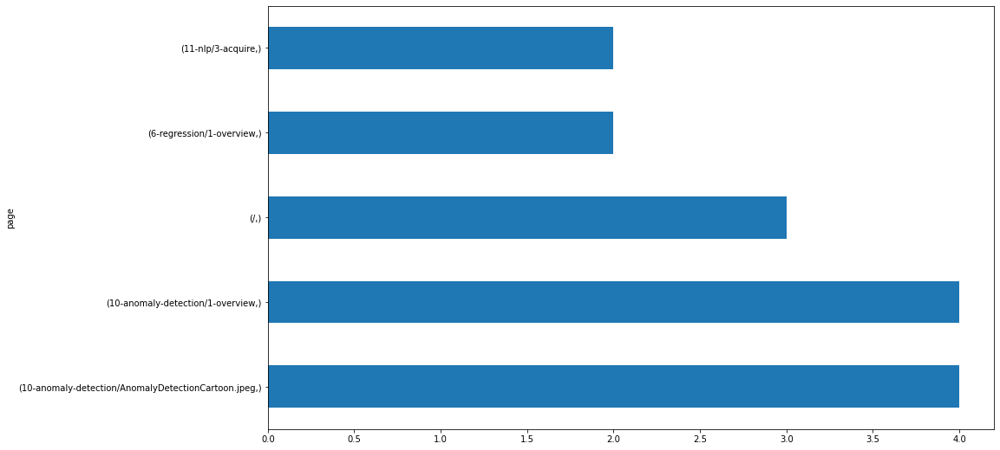


172.58.107.174
page                                                 
8-clustering/Hospital-Distance-Clusters.jpg              1
11-nlp/1-overview                                        1
10-anomaly-detection/4-detecting-timeseries-anomalies    1
dtype: int64


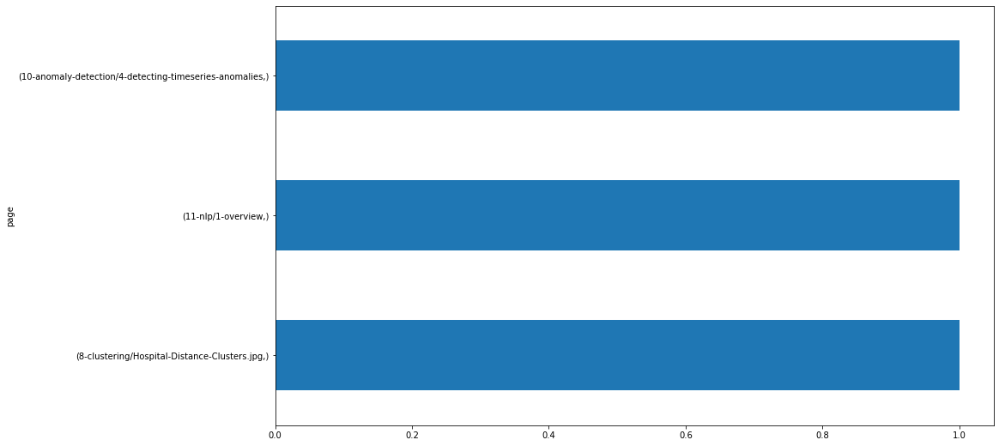


196.247.56.62
page                                    
4-python/1-overview                         5
4-python/2-introduction-to-python           5
4-python/3-data-types-and-variables         3
1-fundamentals/1.1-intro-to-data-science    3
1-fundamentals/AI-ML-DL-timeline.jpg        3
                                           ..
5-stats/2-simulation                        1
5-stats/1-overview                          1
4-python/7.4.4-advanced-dataframes          1
4-python/7.4.3-dataframes                   1
/                                           1
Length: 66, dtype: int64


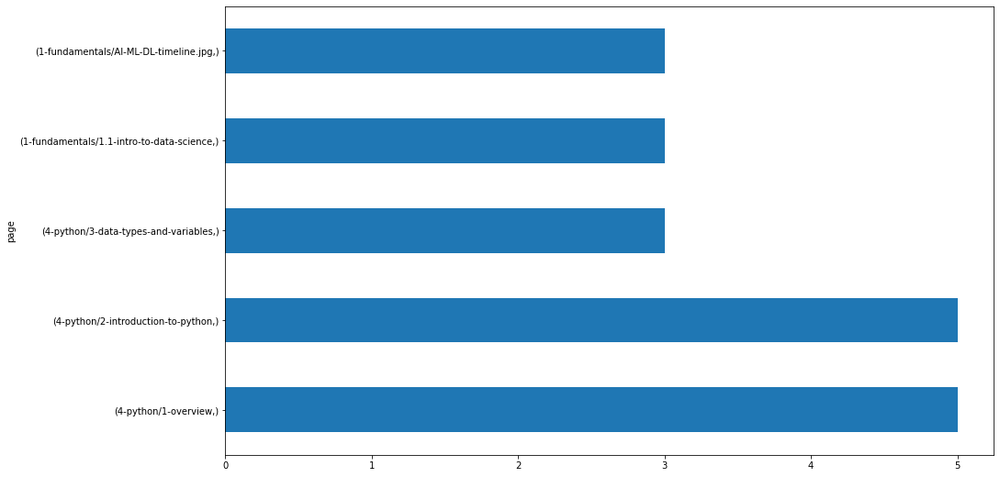


185.145.38.235
page                                                     
1-fundamentals/1.1-intro-to-data-science                     3
3-sql/database-design                                        3
1-fundamentals/AI-ML-DL-timeline.jpg                         3
appendix/data-viz-references                                 3
1-fundamentals/modern-data-scientist.jpg                     3
1-fundamentals/1.2-data-science-pipeline                     1
1-fundamentals/3-vocabulary                                  1
1-fundamentals/DataToAction_v2.jpg                           1
10-anomaly-detection/1-overview                              1
10-anomaly-detection/3-discrete-probabilistic-methods        1
10-anomaly-detection/5-detecting-with-clustering             1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg            1
10-anomaly-detection/time-series-anomaly-detection-part-3    1
12-distributed-ml/1-overview                                 1
12-distributed-ml/spark-execution-diagram.sv

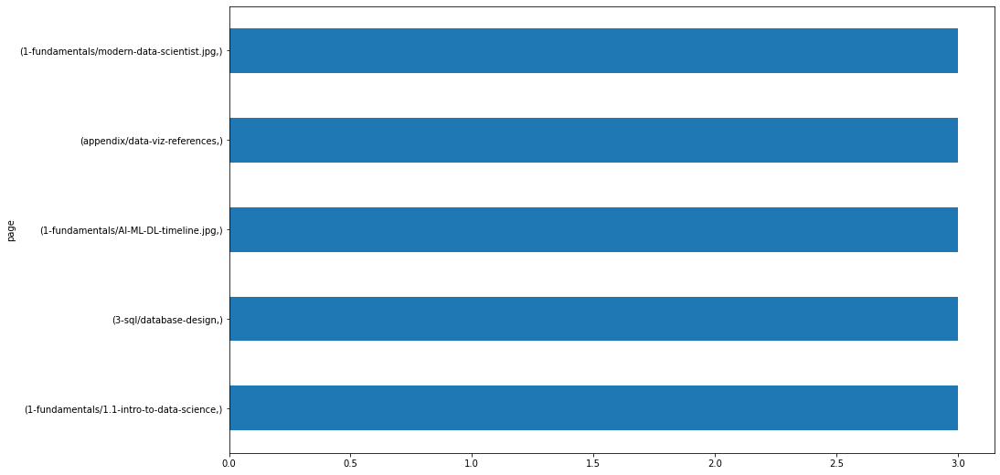


45.248.77.99
page                      
3-sql/2-mysql-introduction    2
3-sql/1-mysql-overview        2
appendix/git                  1
appendix/cli-git-overview     1
dtype: int64


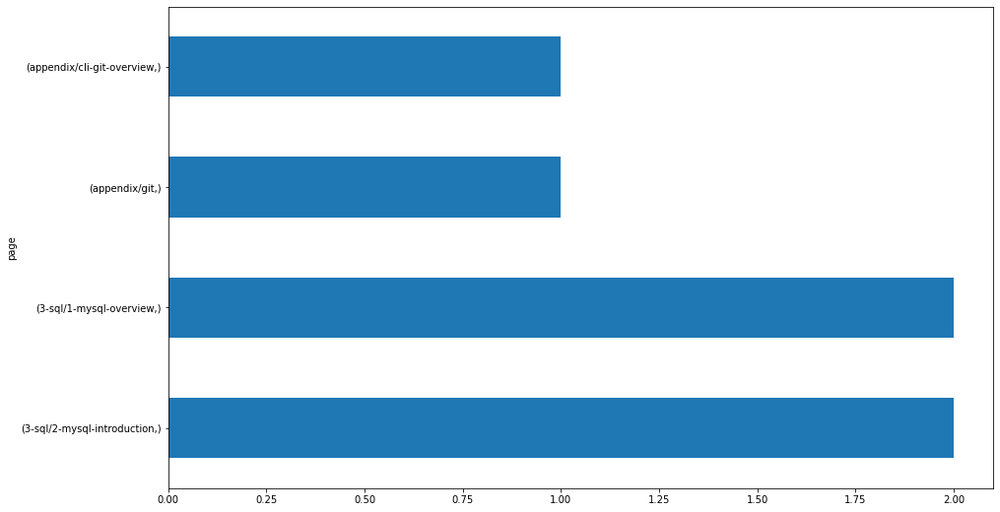


184.75.208.254
page                                                 
6-regression/6.0-feature-engineering                     1
6-regression/5.0-evaluate                                1
6-regression/1-overview                                  1
11-nlp/6-model                                           1
11-nlp/5-explore                                         1
11-nlp/4-prepare                                         1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg        1
10-anomaly-detection/4-detecting-timeseries-anomalies    1
10-anomaly-detection/1-overview                          1
dtype: int64


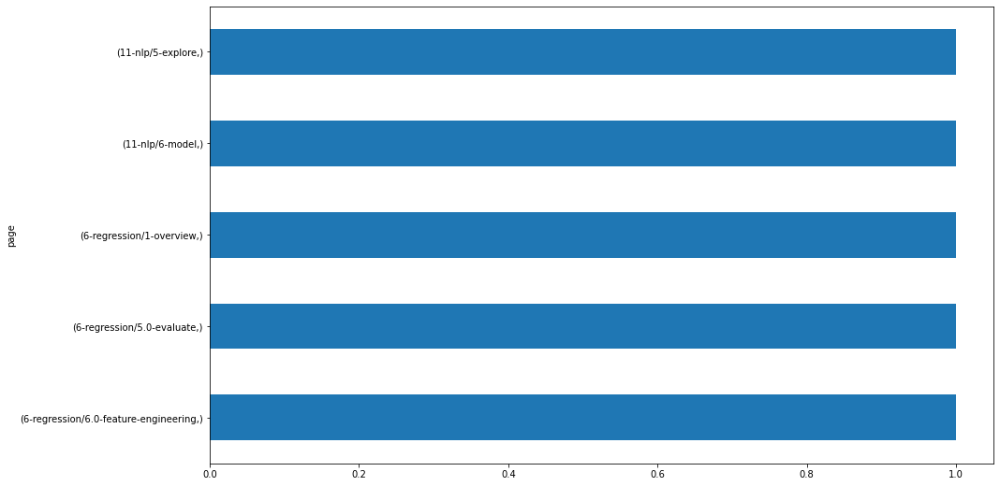


196.196.192.52
page                                             
9-timeseries/1-overview                              1
8-clustering/Hospital-Distance-Clusters.jpg          1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
11-nlp/6-model                                       1
11-nlp/exercises                                     1
11-nlp/github_repo_language.gif                      1
11-nlp/project                                       1
6-regression/1-overview                              1
6-regression/3.0-split-and-scale                     1
6-regression/5.0-evaluate                            1
7-classification/1-overview                          1
7-classification/6.1-logistic-regression             1
7-classification/6.2-decision-trees                  1
7-classification/6.3-random-forests                  1
7-classification/6.4-knn                             1
8-clustering/1-overview                              1
8-clustering/2-about                                 1

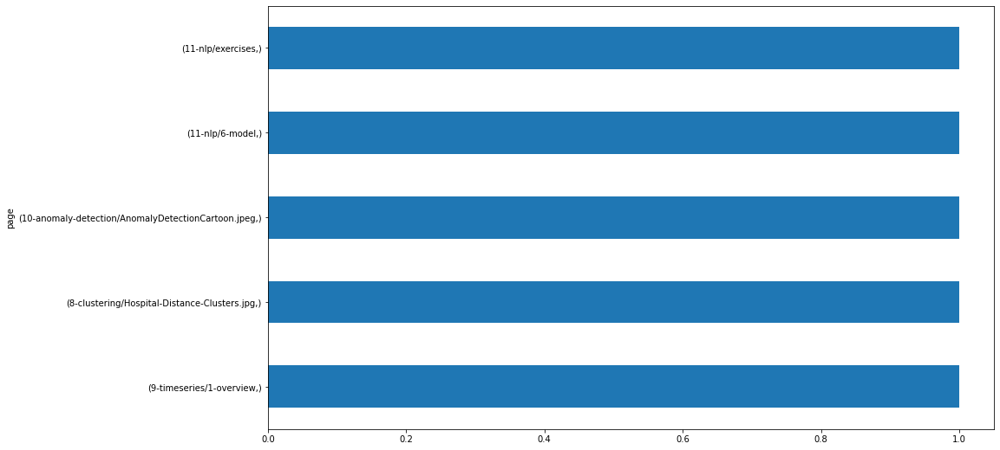


173.127.40.25
page                        
11-nlp/2-regular-expressions    1
dtype: int64


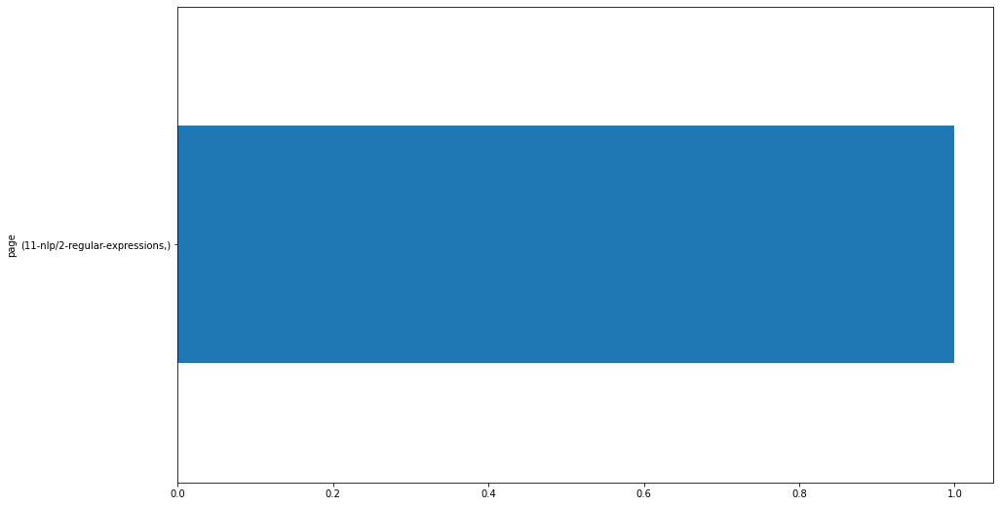


172.58.111.141
page                                                   
10-anomaly-detection/AnomalyDetectionCartoon.jpeg          1
10-anomaly-detection/2-continuous-probabilistic-methods    1
10-anomaly-detection/1-overview                            1
/                                                          1
dtype: int64


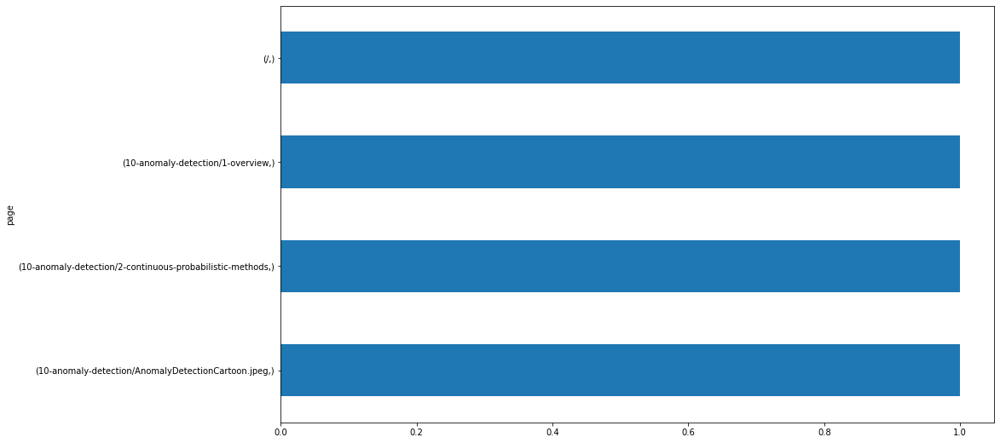


173.127.77.151
page                           
11-nlp/project                     1
11-nlp/github_repo_language.gif    1
dtype: int64


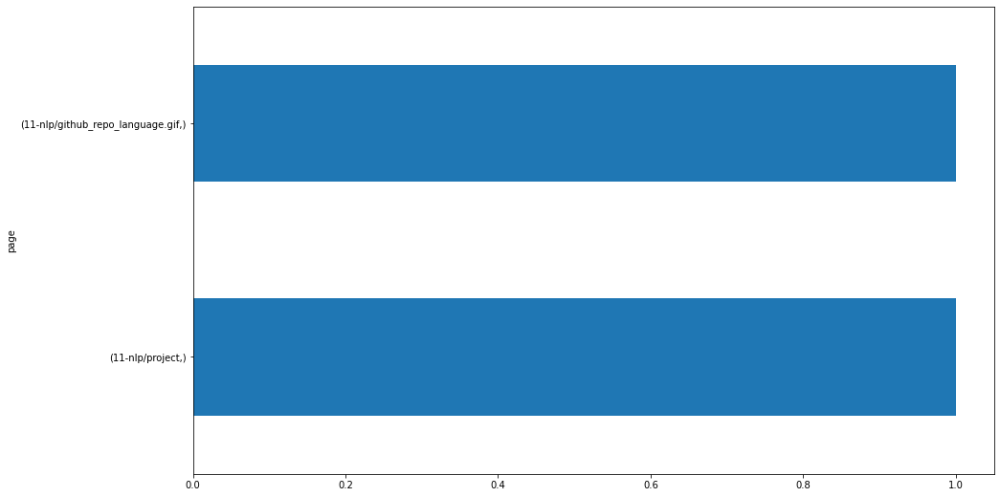


89.187.175.105
page                                             
11-nlp/4-prepare                                     3
11-nlp/6-model                                       2
11-nlp/5-explore                                     2
7-classification/6.4-knn                             1
6-regression/1-overview                              1
11-nlp/project                                       1
11-nlp/github_repo_language.gif                      1
11-nlp/3-acquire                                     1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
/                                                    1
dtype: int64


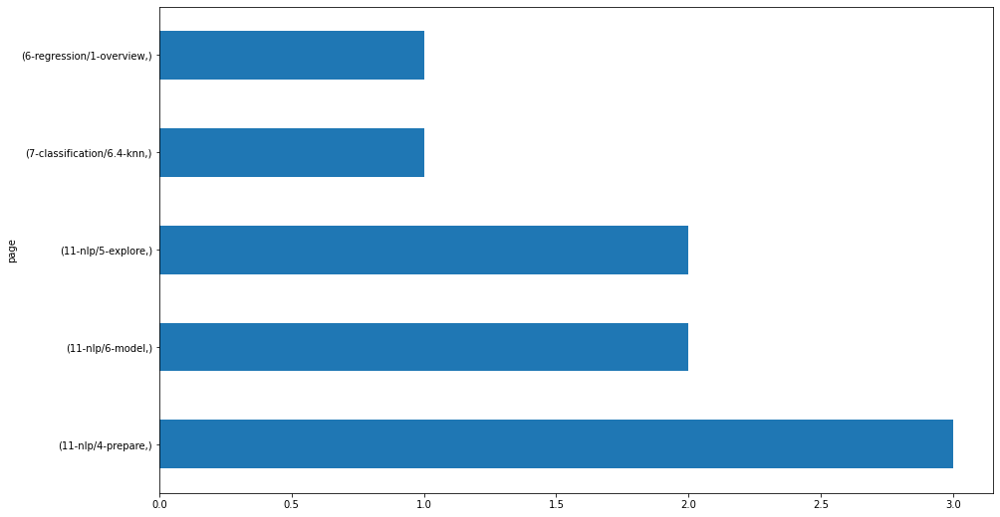


103.137.12.164
page                                             
11-nlp/6-model                                       2
7-classification/6.2-decision-trees                  1
6-regression/1-overview                              1
11-nlp/project                                       1
11-nlp/github_repo_language.gif                      1
11-nlp/4-prepare                                     1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
dtype: int64


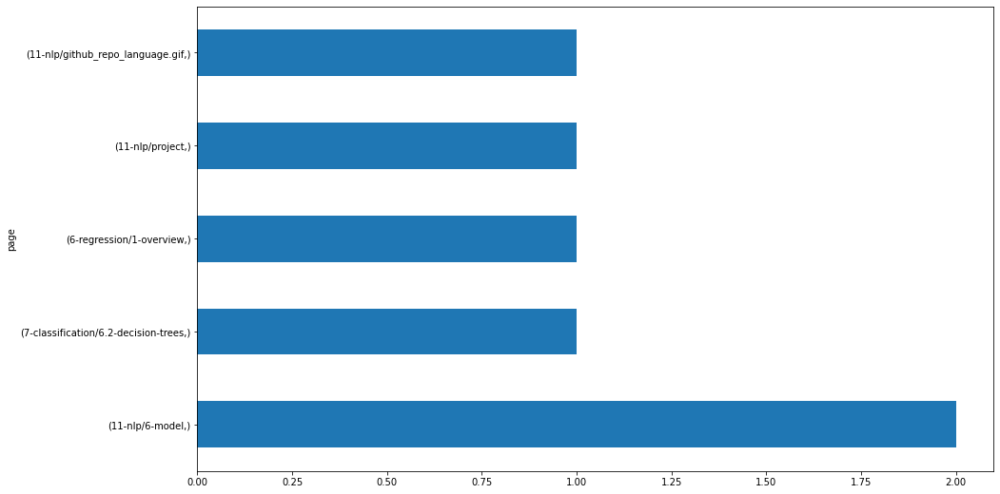


96.46.160.21
page                                 
appendix/interview_questions_students    2
6-regression/6.0-feature-engineering     2
6-regression/5.0-evaluate                2
6-regression/1-overview                  2
11-nlp/3-acquire                         2
search/search_index.json                 1
appendix/useful_libraries                1
appendix/ds-environment-setup            1
appendix/cli-git-overview                1
6-regression/7.0-model                   1
4-python/type-annotations                1
4-python/objects                         1
4-python/matplotlib-styles               1
4-python/intro-to-sklearn                1
3-sql/database-design                    1
/                                        1
dtype: int64


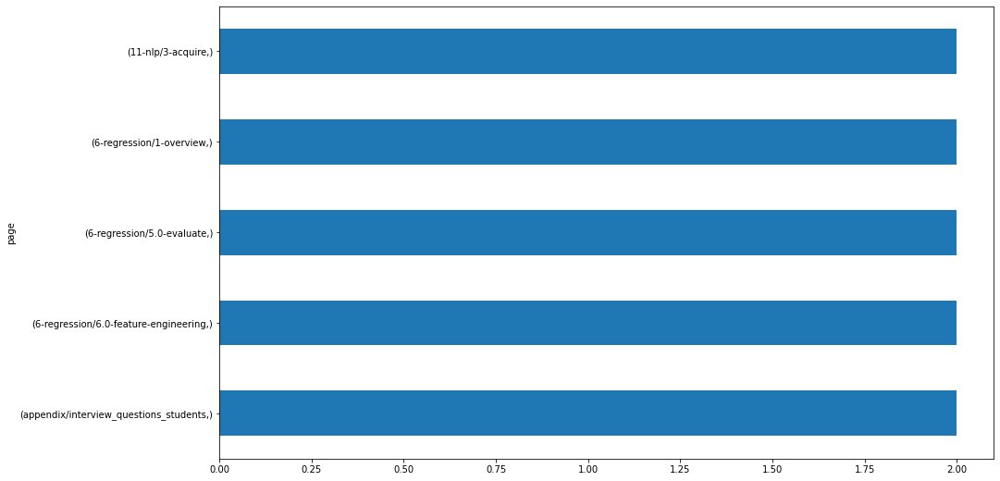


174.246.161.148
page                             
bayes-python-assessment-4586.html    1
dtype: int64


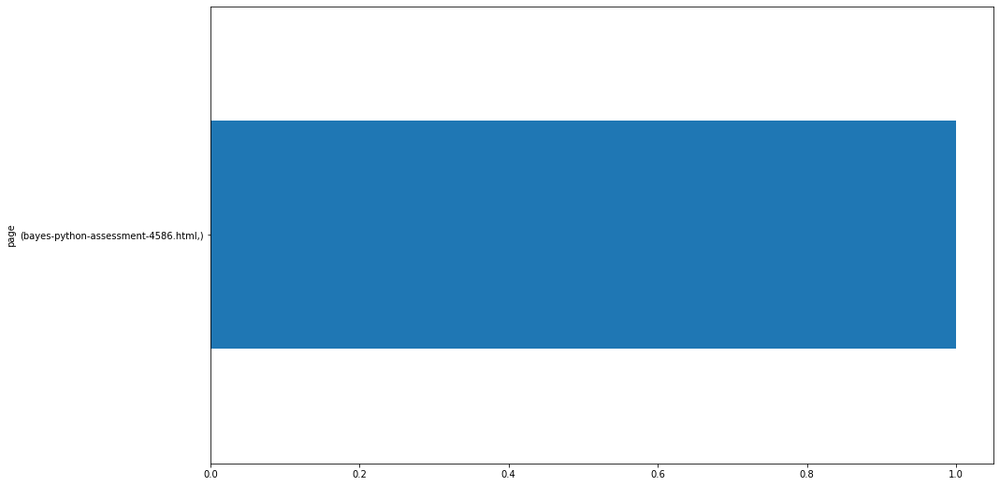


172.98.66.4
page                                         
12-distributed-ml/spark-local-mode.svg           1
12-distributed-ml/spark-execution-diagram.svg    1
12-distributed-ml/3-spark-api                    1
12-distributed-ml/1-overview                     1
dtype: int64


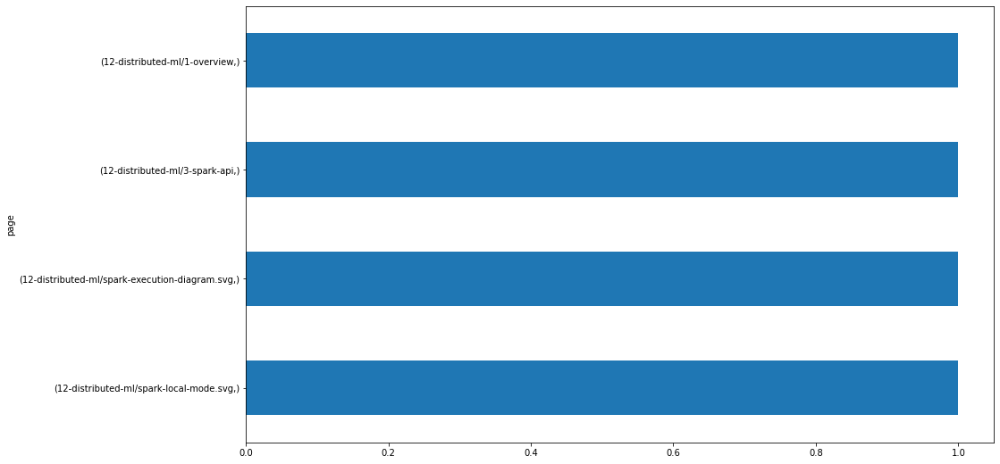


72.181.103.19
page                                    
appendix/interview_questions_students       5
search/search_index.json                    3
7-classification/6.4-knn                    1
7-classification/6.3-random-forests         1
7-classification/6.2-decision-trees         1
7-classification/6.1-logistic-regression    1
6-regression/6.0-feature-engineering        1
dtype: int64


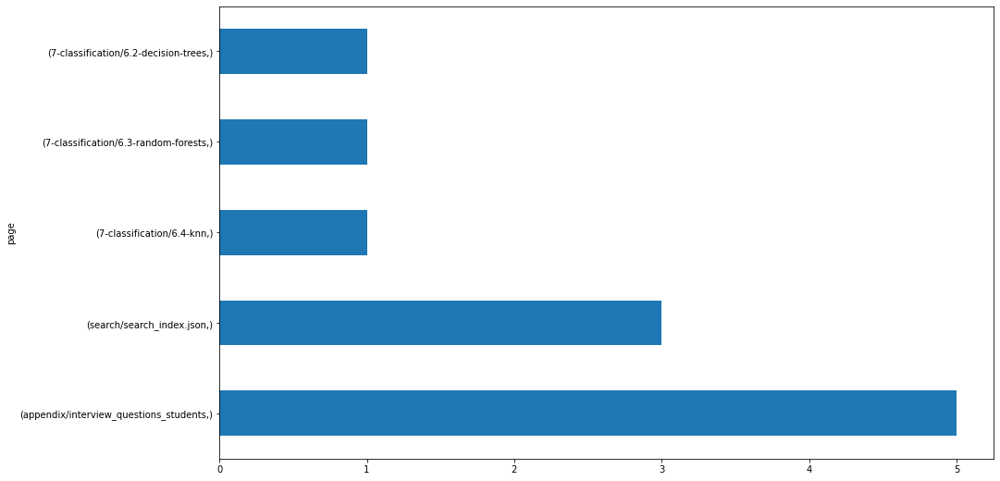


185.153.179.81
page                                             
12-distributed-ml/4-wrangle                          1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
1-fundamentals/modern-data-scientist.jpg             1
1-fundamentals/AI-ML-DL-timeline.jpg                 1
1-fundamentals/1.1-intro-to-data-science             1
/                                                    1
dtype: int64


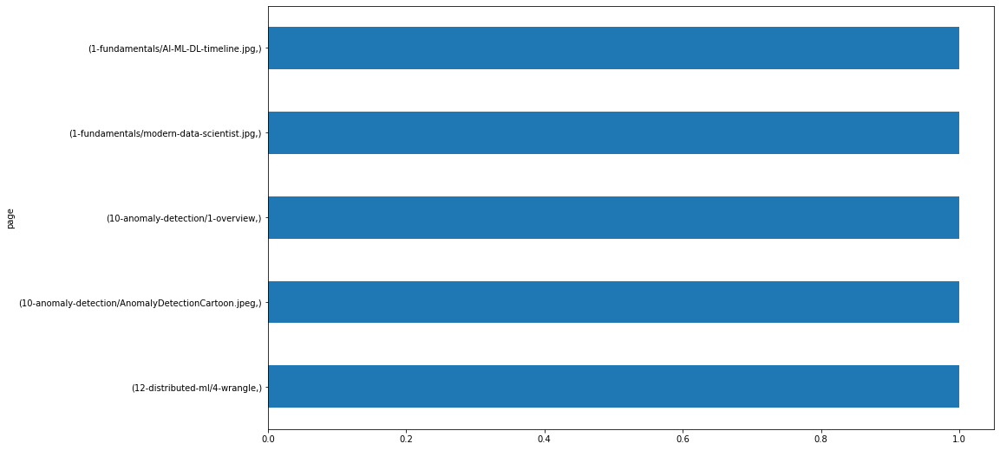


131.194.188.33
page                                    
appendix/interview_questions_students       5
search/search_index.json                    3
3-sql/database-design                       2
appendix/vocabulary                         1
appendix/useful_libraries                   1
appendix/ds-environment-setup               1
7-classification/1-overview                 1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.2-data-science-pipeline    1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


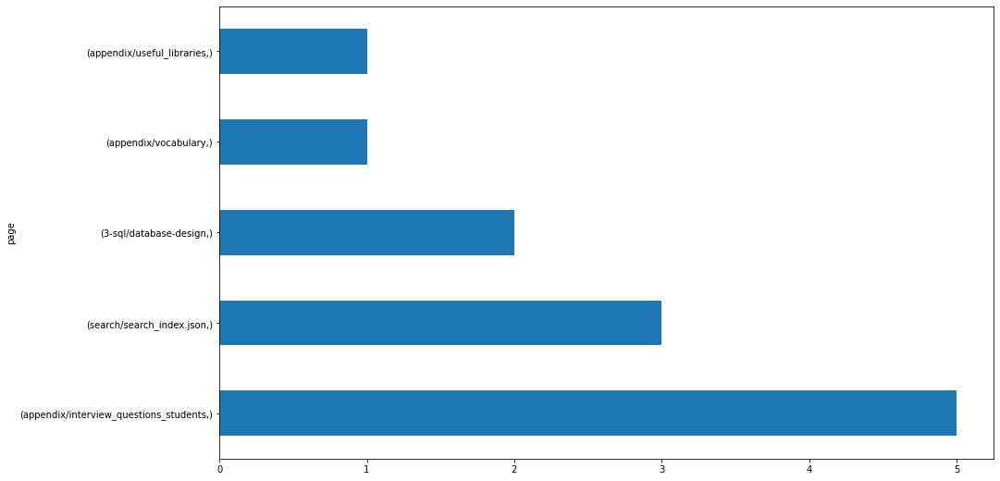


107.77.218.203
page                         
12-distributed-ml/3-spark-api    1
/                                1
dtype: int64


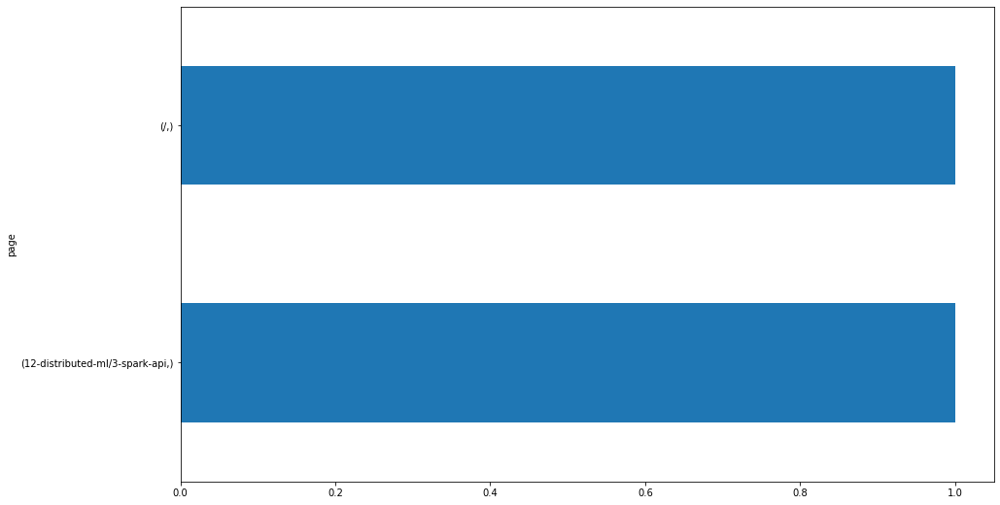


72.89.254.8
page                                       
appendix/cli-git-overview                      1
8-clustering/Hospital-Distance-Clusters.jpg    1
8-clustering/2-about                           1
8-clustering/1-overview                        1
7-classification/4-explore                     1
7-classification/3-prep                        1
7-classification/2-acquire                     1
7-classification/1-overview                    1
6-regression/1-overview                        1
1-fundamentals/modern-data-scientist.jpg       1
1-fundamentals/DataToAction_v2.jpg             1
1-fundamentals/AI-ML-DL-timeline.jpg           1
1-fundamentals/1.3-pipeline-demo               1
1-fundamentals/1.2-data-science-pipeline       1
1-fundamentals/1.1-intro-to-data-science       1
dtype: int64


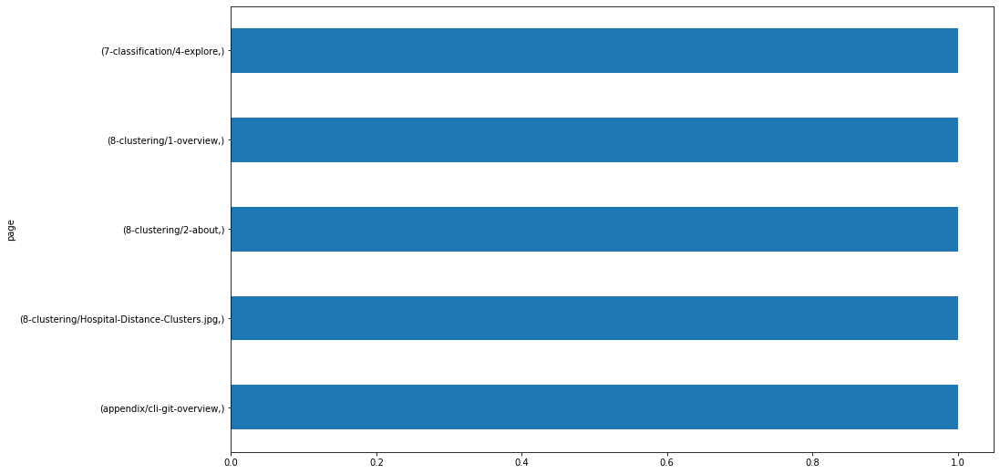


73.34.177.179
page
/       2
dtype: int64


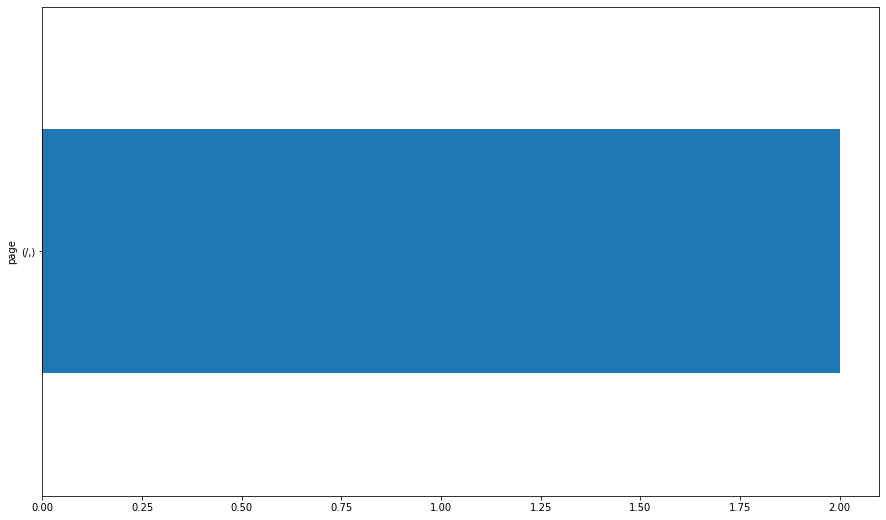


24.90.204.177
page                                       
8-clustering/Hospital-Distance-Clusters.jpg    1
8-clustering/4-explore                         1
8-clustering/3-wrangle                         1
8-clustering/2-about                           1
6-regression/5.0-evaluate                      1
6-regression/1-overview                        1
/                                              1
dtype: int64


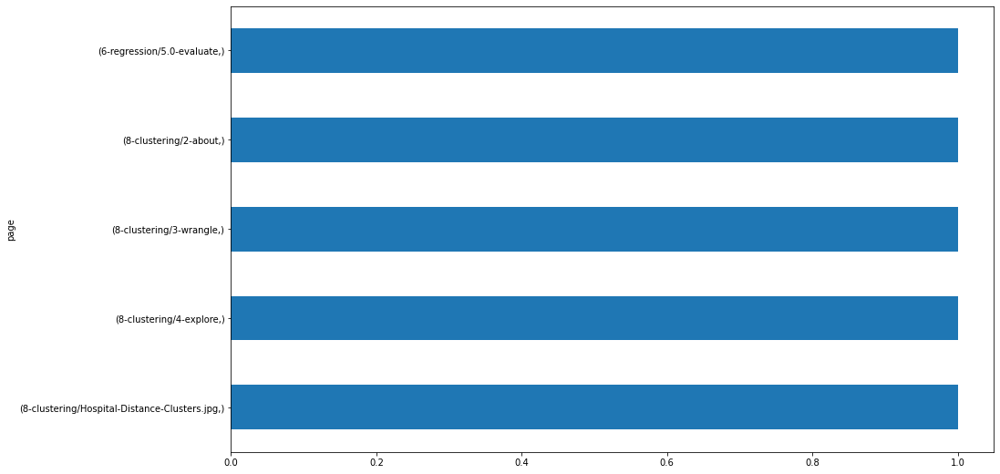


72.191.48.117
page                             
/                                    4
search/search_index.json             1
appendix/ds-environment-setup        1
3-sql/6.2-where                      1
3-sql/5-basic-statements             1
3-sql/4-tables                       1
3-sql/1-mysql-overview               1
13-advanced-topics/3.6-html-forms    1
dtype: int64


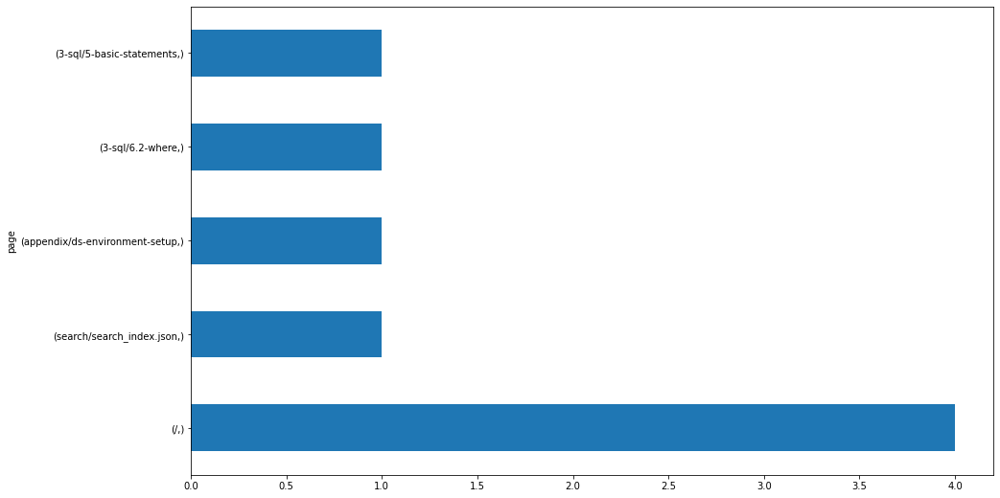


172.87.181.101
page                   
appendix/vocabulary        1
8-clustering/1-overview    1
3-sql/database-design      1
dtype: int64


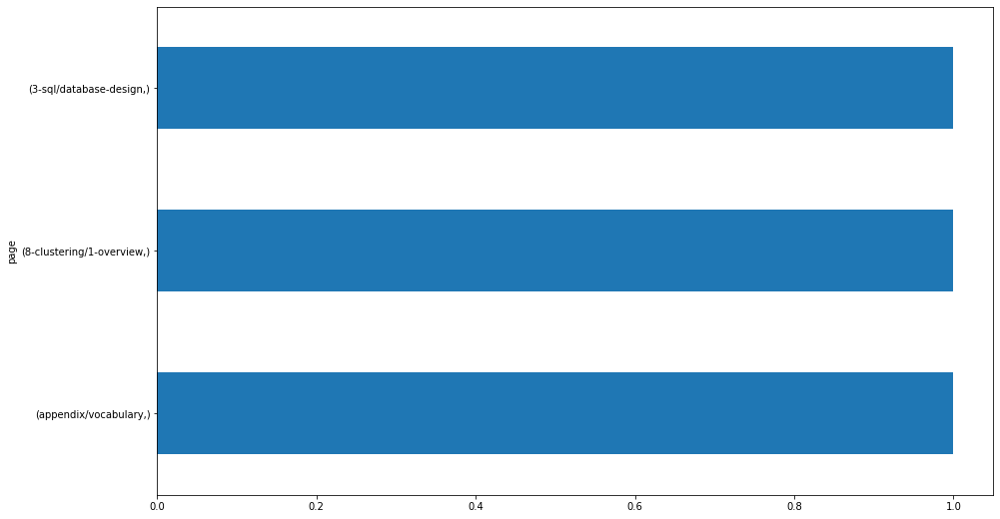


47.25.103.90
page                                             
9-timeseries/3-prep                                  1
8-clustering/3-wrangle                               1
7-classification/4-explore                           1
7-classification/3-prep                              1
7-classification/2-acquire                           1
11-nlp/4-prepare                                     1
11-nlp/3-acquire                                     1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
/                                                    1
dtype: int64


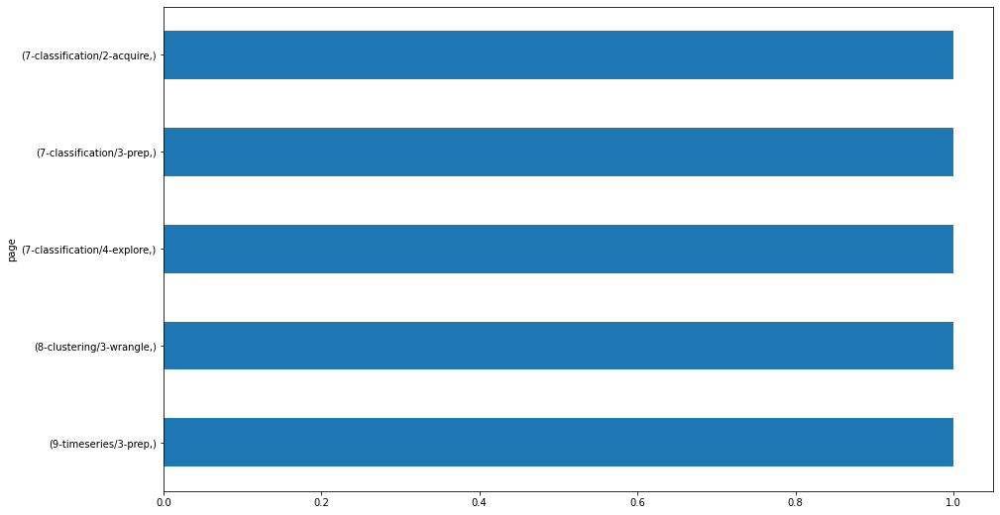


107.77.221.166
page                       
12-distributed-ml/4-wrangle    1
dtype: int64


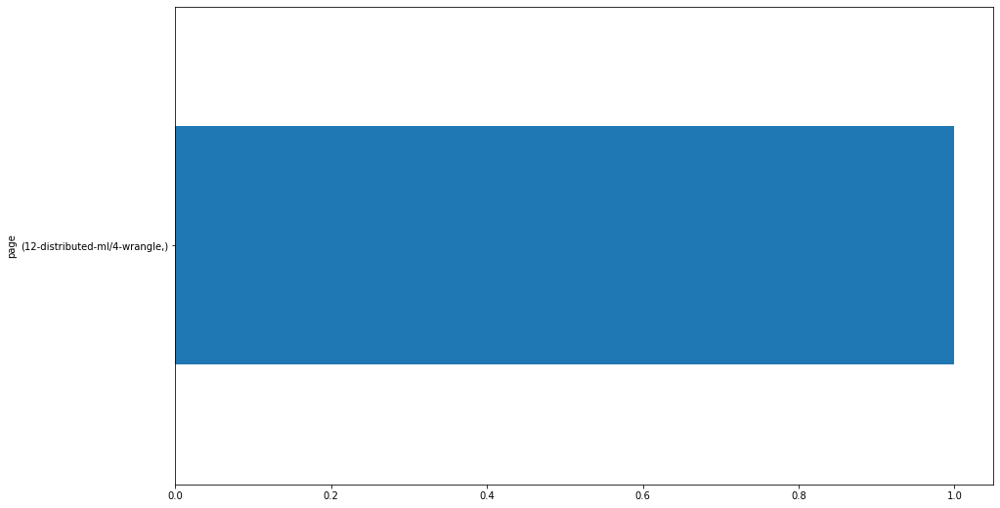


24.227.144.238
page                   
6-regression/1-overview    1
dtype: int64


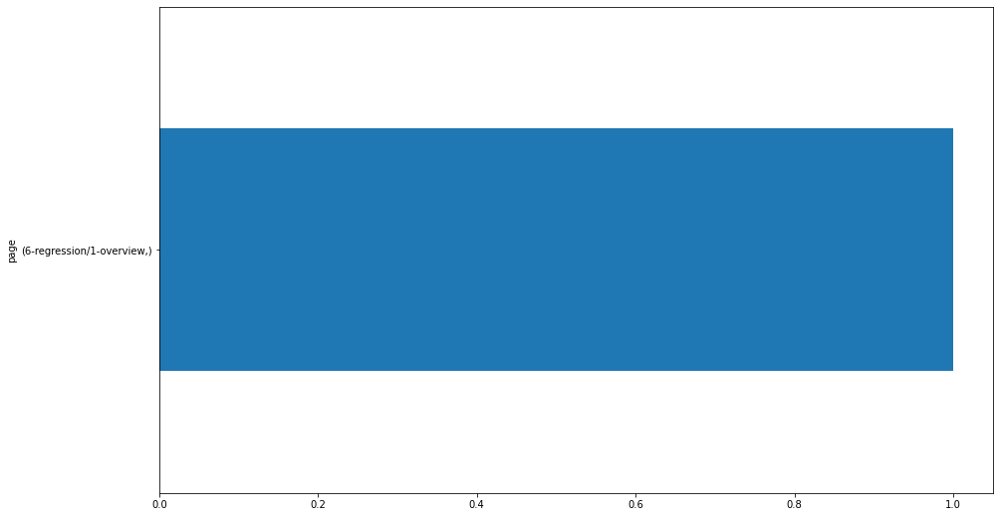


50.84.153.254
page                                             
12-distributed-ml/spark-local-mode.svg               1
12-distributed-ml/spark-execution-diagram.svg        1
12-distributed-ml/3-spark-api                        1
12-distributed-ml/2-environment-setup                1
12-distributed-ml/1-overview                         1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
/                                                    1
dtype: int64


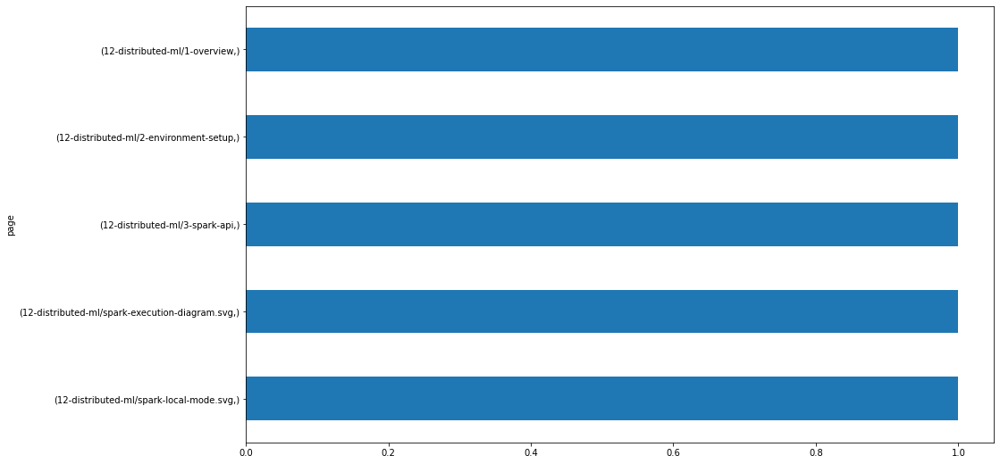


50.84.77.251
page                       
12-distributed-ml/5-explore    1
12-distributed-ml/4-wrangle    1
/                              1
dtype: int64


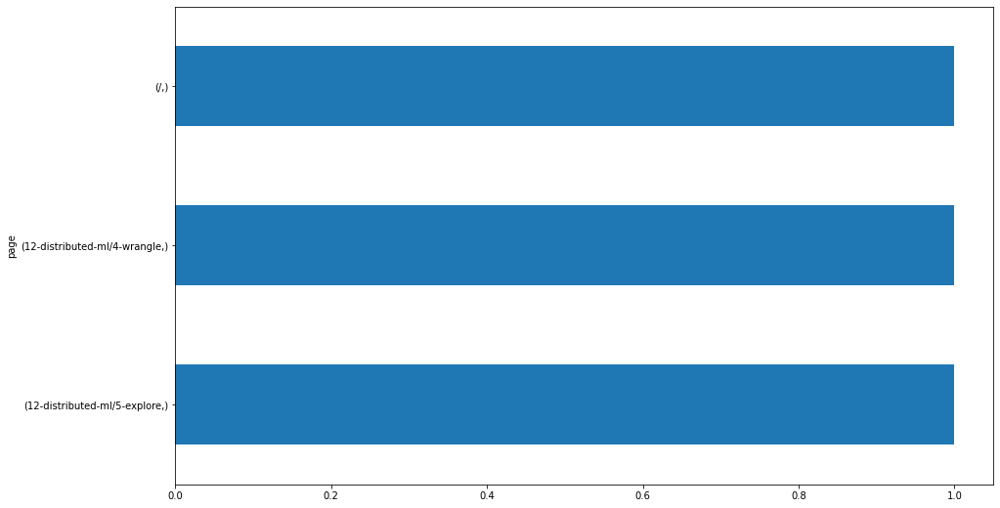


104.200.138.33
page                                                   
10-anomaly-detection/AnomalyDetectionCartoon.jpeg          3
10-anomaly-detection/1-overview                            3
6-regression/1-overview                                    2
9-timeseries/2-acquire                                     1
7-classification/6.1-logistic-regression                   1
12-distributed-ml/3-spark-api                              1
10-anomaly-detection/2-continuous-probabilistic-methods    1
/                                                          1
dtype: int64


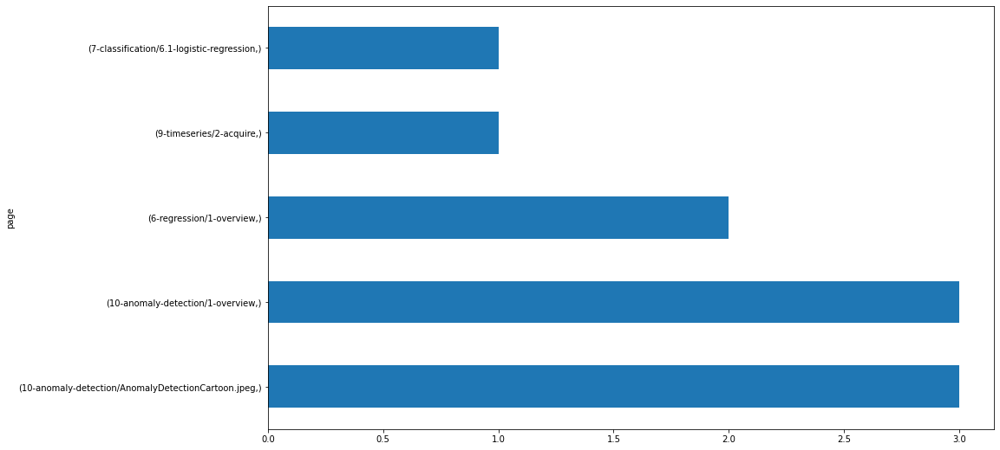


107.77.201.86
page                         
12-distributed-ml/4-wrangle      2
12-distributed-ml/3-spark-api    1
dtype: int64


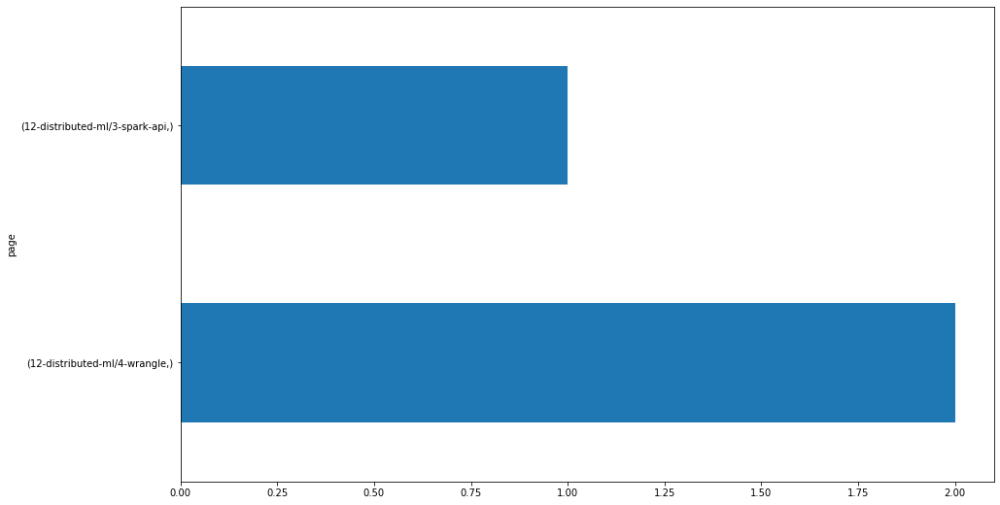


107.206.133.57
page                         
12-distributed-ml/5-explore      2
12-distributed-ml/4-wrangle      2
12-distributed-ml/3-spark-api    2
dtype: int64


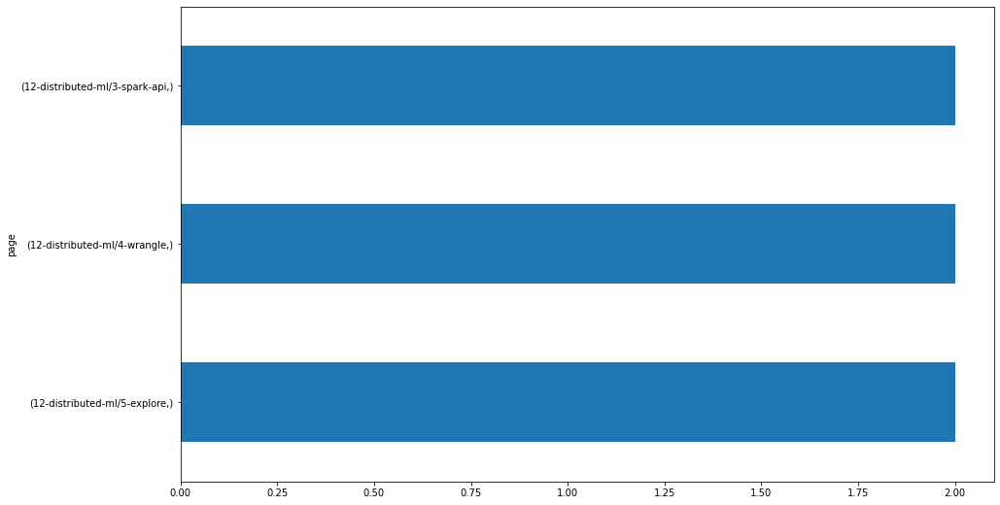


107.77.199.23
page                             
12-distributed-ml/3-spark-api        4
12-distributed-ml/5-explore          3
12-distributed-ml/4-wrangle          3
search/search_index.json             1
12-distributed-ml/6-ml-with-spark    1
dtype: int64


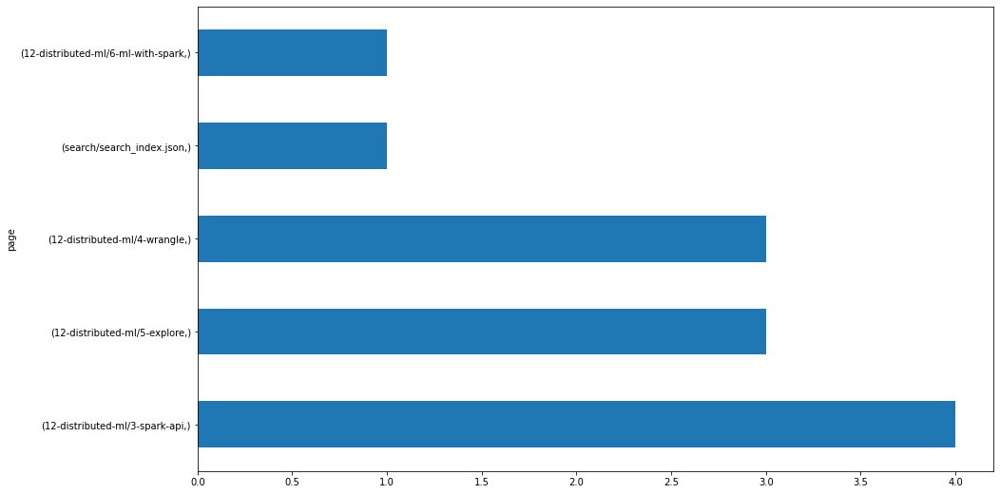


12.97.187.12
page                                 
12-distributed-ml/3-spark-api            2
12-distributed-ml/2-environment-setup    1
/                                        1
dtype: int64


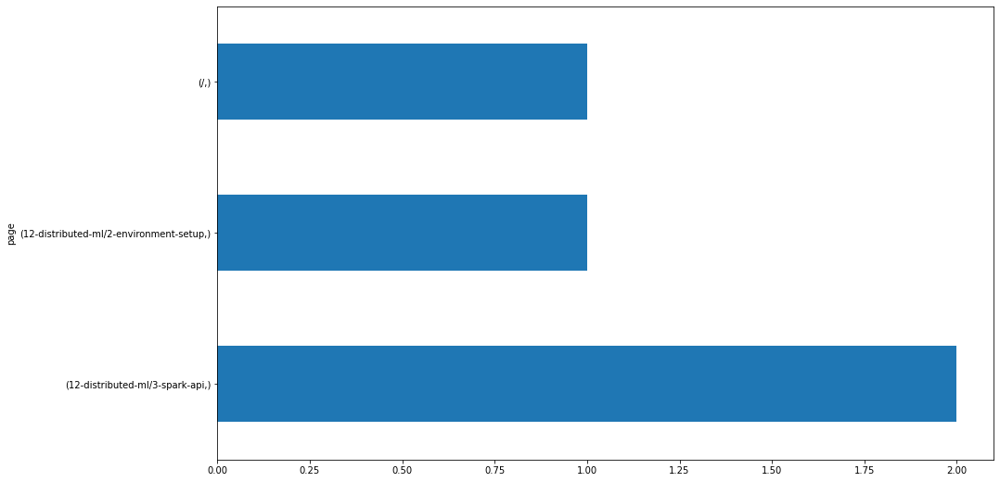


184.203.109.10
page                       
12-distributed-ml/4-wrangle    2
dtype: int64


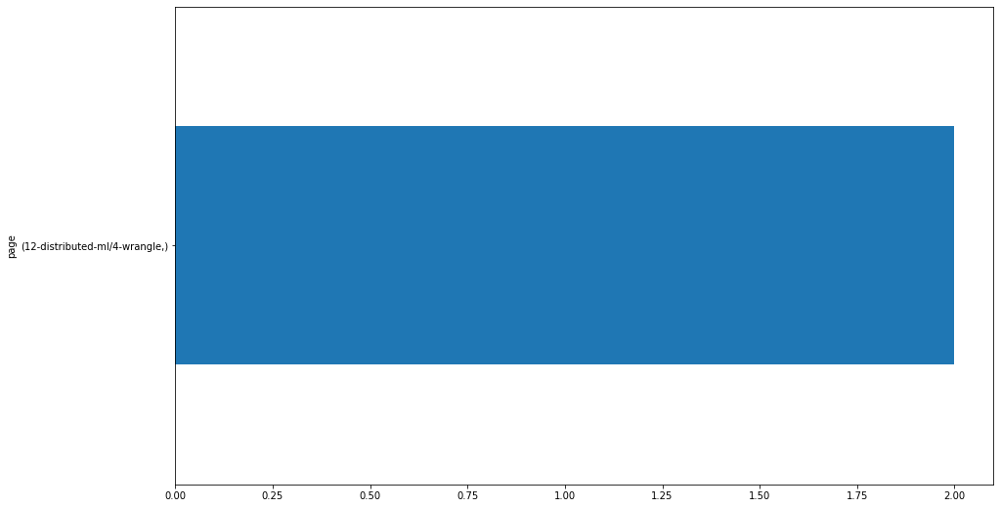


172.98.66.16
page                                                   
10-anomaly-detection/AnomalyDetectionCartoon.jpeg          3
10-anomaly-detection/1-overview                            3
10-anomaly-detection/2-continuous-probabilistic-methods    2
13-advanced-topics/3.3-building-a-model                    2
13-advanced-topics/3.2-virtual-environments                2
appendix/cli-git-overview                                  1
10-anomaly-detection/3-discrete-probabilistic-methods      1
10-anomaly-detection/4-detecting-timeseries-anomalies      1
10-anomaly-detection/5-detecting-with-clustering           1
13-advanced-topics/1-tidy-data                             1
11-nlp/1-overview                                          1
5-stats/3-probability-distributions                        1
13-advanced-topics/2-cross-validation                      1
13-advanced-topics/3.1-developing-data-products            1
13-advanced-topics/3.4-intro-to-flask                      1
13-advanced-top

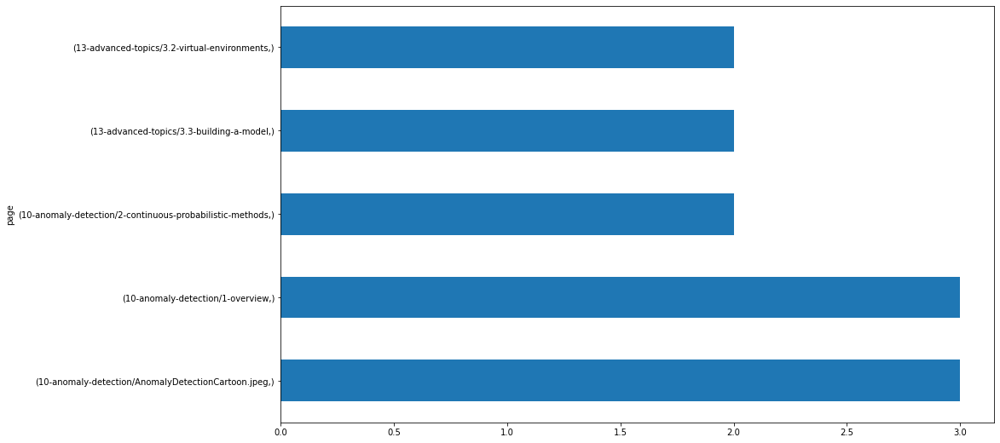


98.6.204.179
page                                   
3-sql/9.2-indexes                          3
13-advanced-topics/3.6-html-forms          3
3-sql/9.3-joins                            2
3-sql/9.1-relationships-overview           2
13-advanced-topics/3.3-building-a-model    2
/                                          2
search/search_index.json                   1
5-stats/5-power-analysis                   1
3-sql/8-group-by                           1
3-sql/7-functions                          1
3-sql/6.4-limit                            1
3-sql/6.3-order-by                         1
3-sql/6.2-where                            1
13-advanced-topics/3.4-intro-to-flask      1
dtype: int64


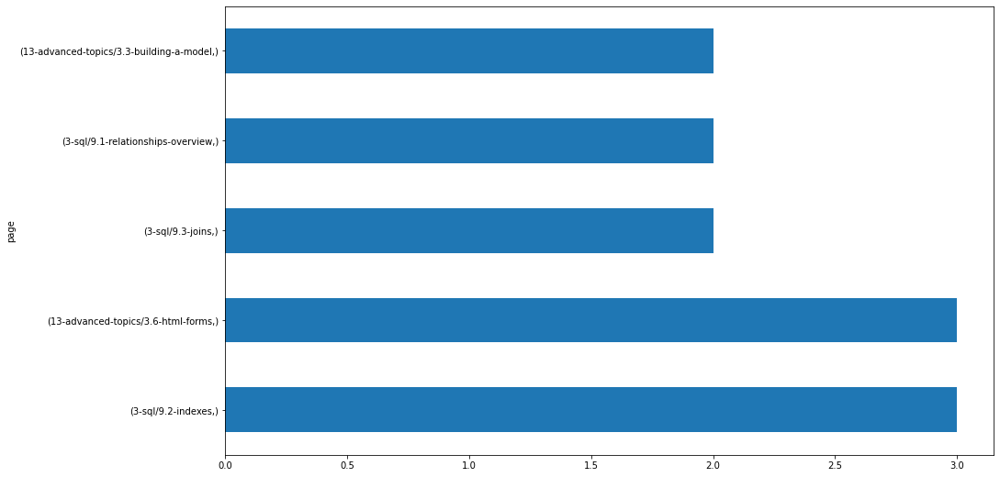


107.77.218.8
page                              
8-clustering/4-explore                2
search/search_index.json              1
appendix/cli-git-overview             1
9-timeseries/4-explore                1
4-python/7.4.4-advanced-dataframes    1
11-nlp/5-explore                      1
/                                     1
dtype: int64


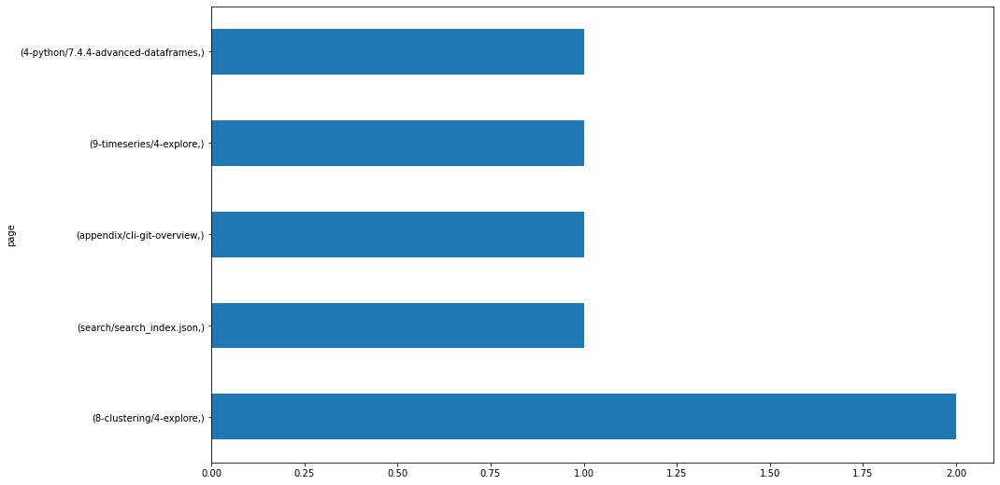


71.78.189.122
page
/       1
dtype: int64


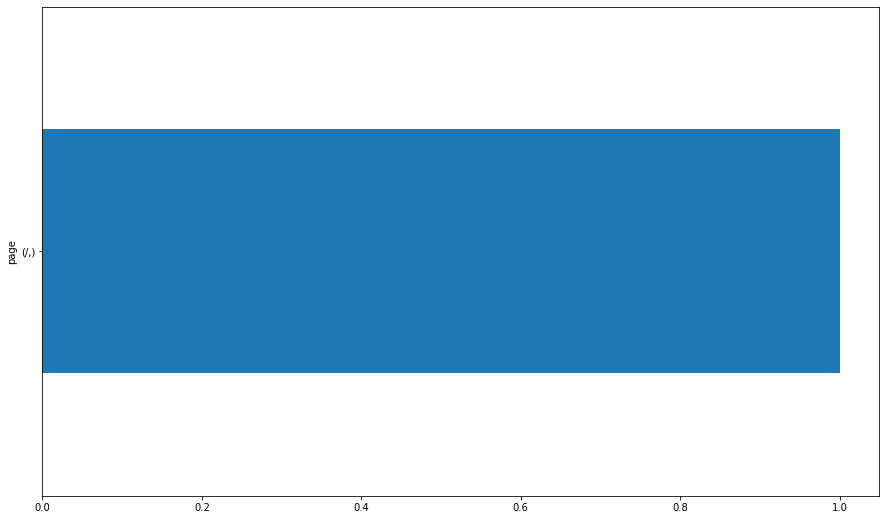


107.77.221.66
page                               
7-classification/6.3-random-forests    1
dtype: int64


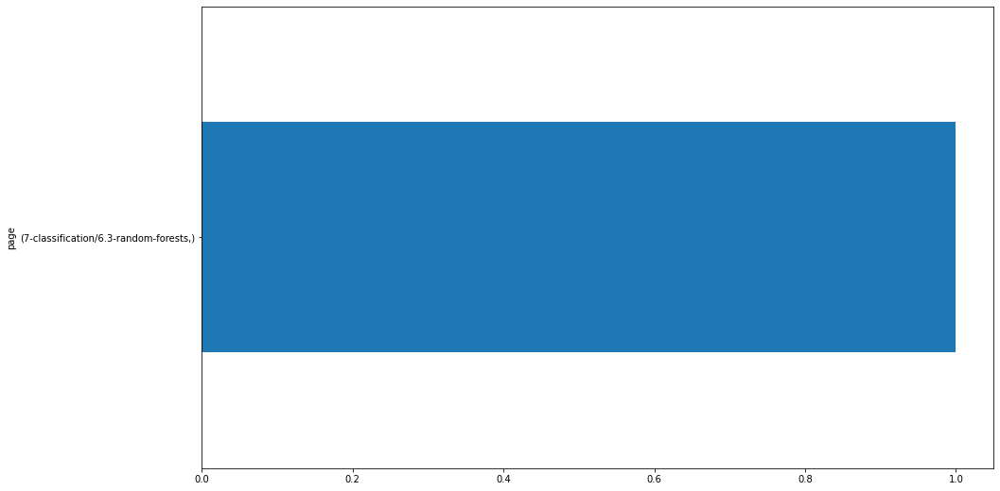


107.77.221.14
page                               
7-classification/6.3-random-forests    1
dtype: int64


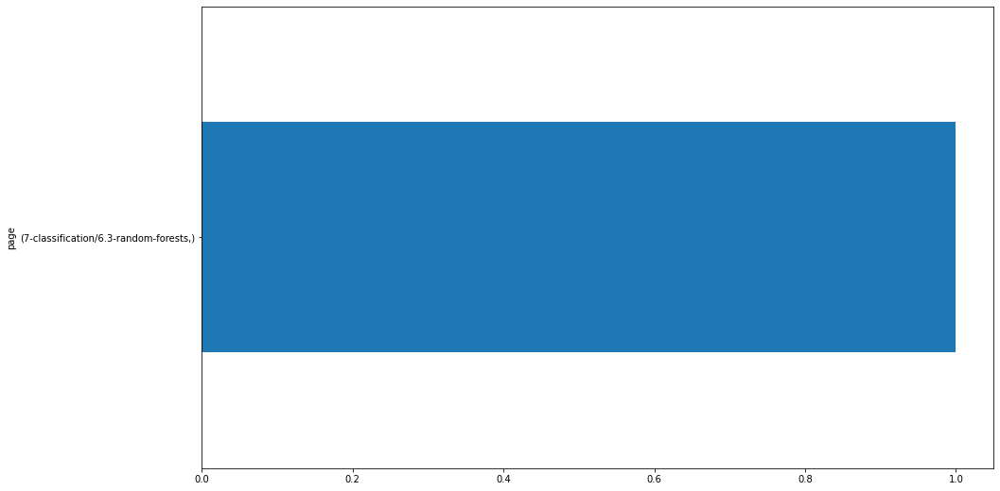


76.185.173.161
page                     
6-regression/7.0-model       3
6-regression/5.0-evaluate    2
6-regression/4.0-explore     1
/                            1
dtype: int64


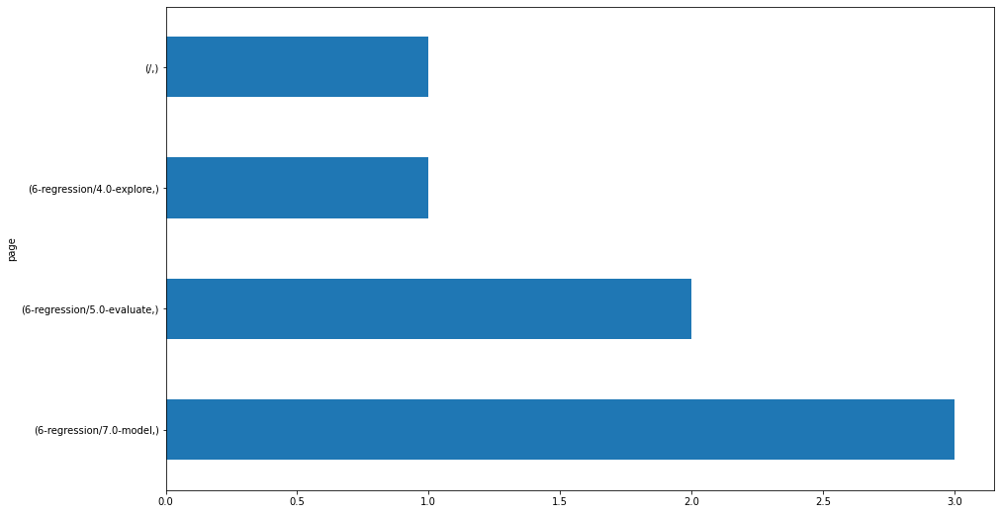


12.97.187.252
page                                    
/                                           5
7-classification/6.2-decision-trees         3
7-classification/6.1-logistic-regression    3
stats/compare-means                         2
python/intro-to-matplotlib                  2
7-classification/6.4-knn                    2
7-classification/6.3-random-forests         2
stats/simulation                            1
stats/probability-distributions             1
python/functions                            1
7-classification/5-evaluation               1
7-classification/4-explore                  1
7-classification/3-prep                     1
dtype: int64


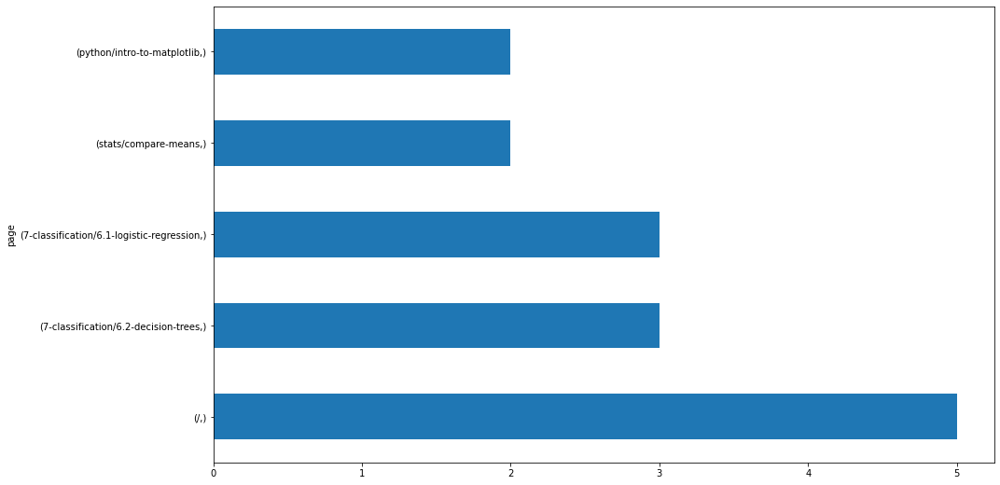


129.115.195.42
page                                
5-stats/4.4-compare-group-membership    1
13-advanced-topics/1-tidy-data          1
dtype: int64


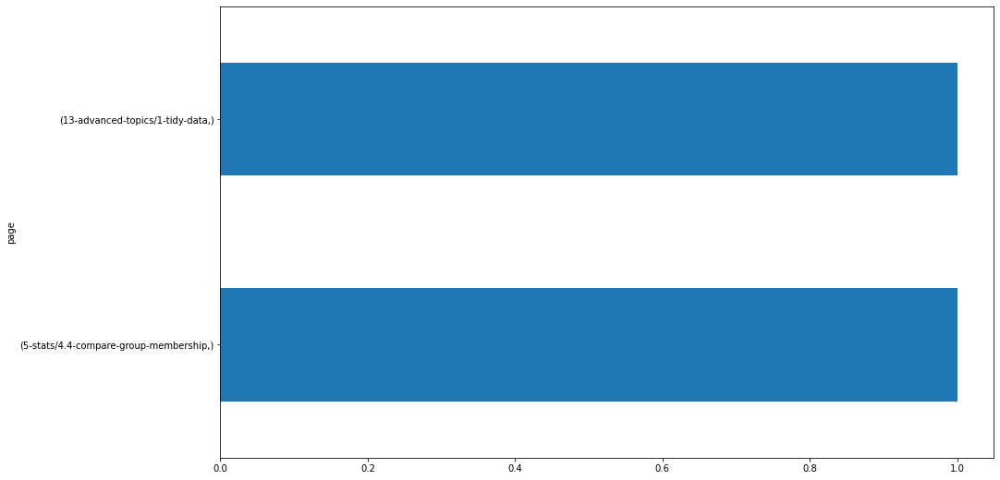


129.115.195.45
page                                             
6-regression/1-overview                              2
6-regression/3.0-split-and-scale                     1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
/                                                    1
dtype: int64


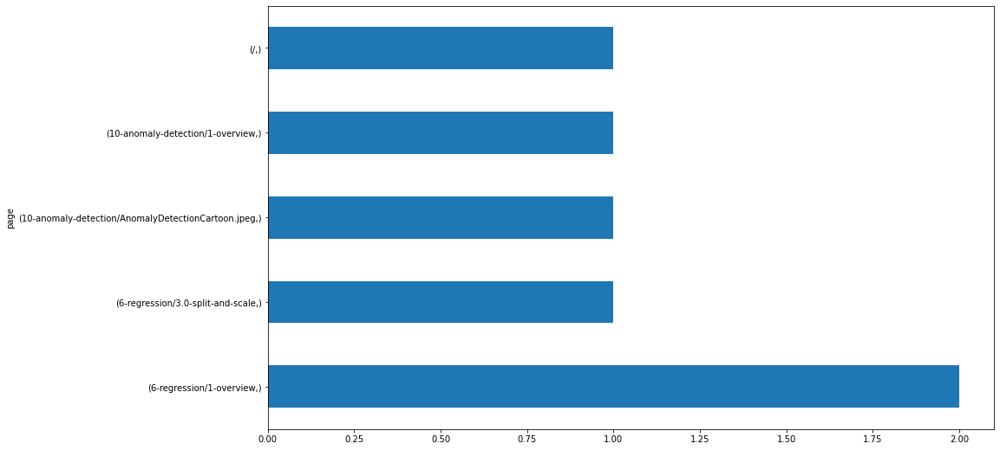


96.8.130.195
page                                    
/                                           16
classification/logistic-regression           5
regression/split-and-scale                   5
classification/decision-trees                3
appendix/cli-git-overview                    2
classification/project                       2
5-stats/4.2-compare-means                    2
regression/acquire-and-prep                  2
regression/explore                           2
1-fundamentals/AI-ML-DL-timeline.jpg         2
1-fundamentals/1.1-intro-to-data-science     2
stats/hypothesis-testing-overview            2
stats/overview                               2
5-stats/3-probability-distributions          1
1-fundamentals/modern-data-scientist.jpg     1
6-regression/1-overview                      1
classification/acquire                       1
stats/simulation                             1
classification/evaluation                    1
classification/explore                       1
stats

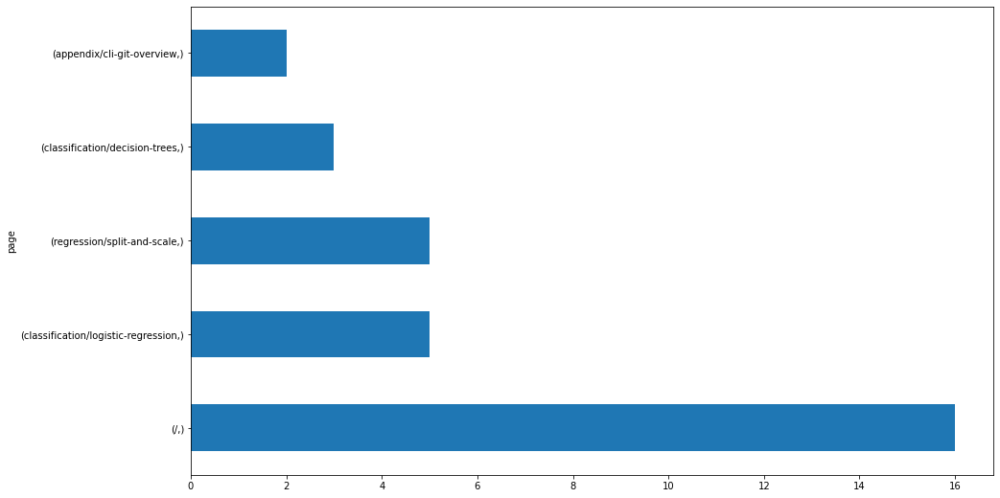


129.115.195.10
page                               
7-classification/6.2-decision-trees    1
dtype: int64


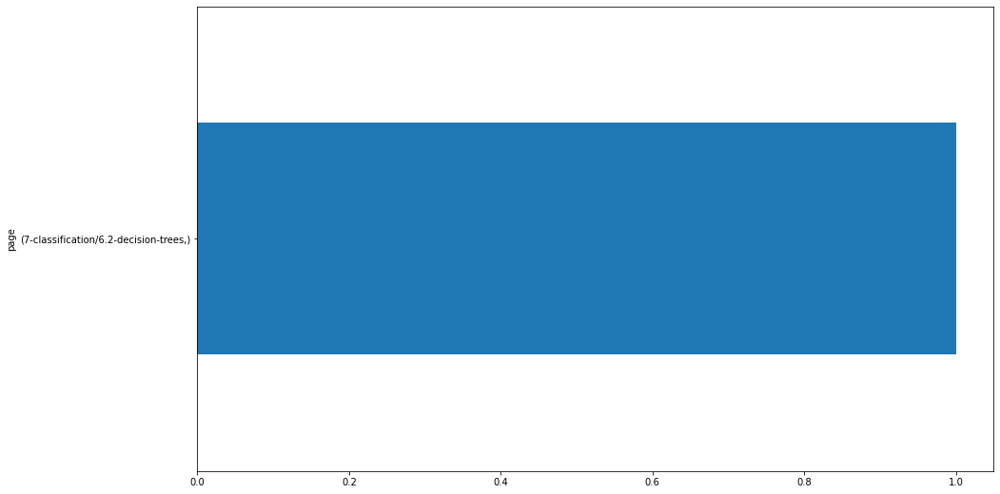


129.115.195.14
page                             
bayes-python-assessment-4586.html    2
dtype: int64


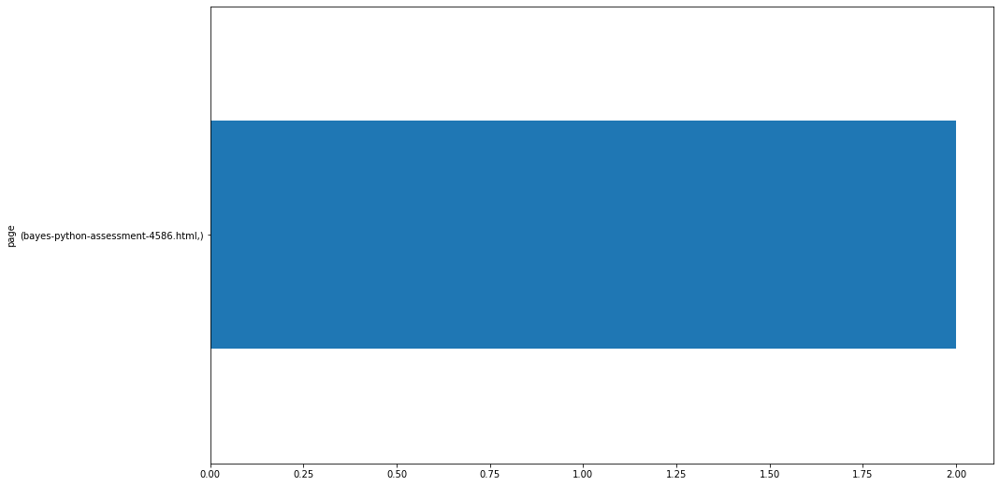


107.77.217.13
page                              
3-sql/2-mysql-introduction            1
3-sql/1-mysql-overview                1
1-fundamentals/2.2-excel-functions    1
/                                     1
dtype: int64


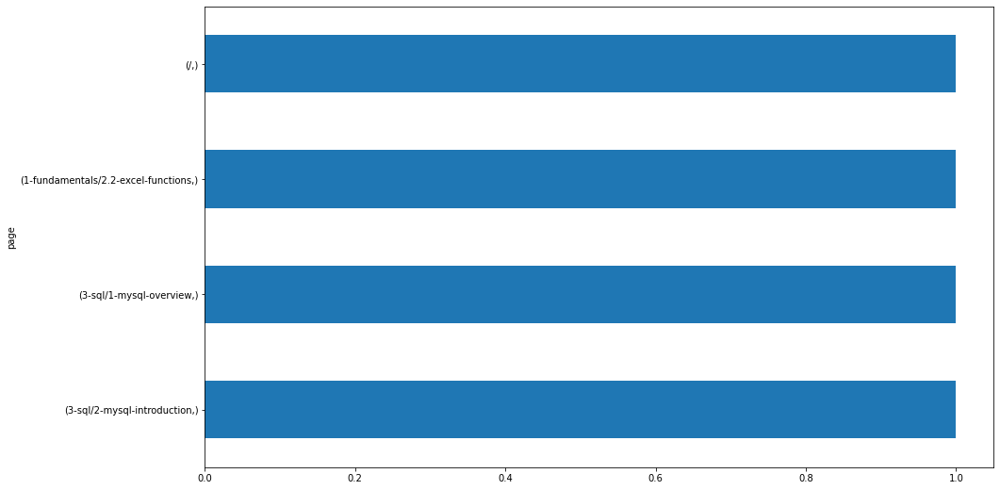


107.77.217.99
page                      
3-sql/3-databases             5
3-sql/4-tables                3
3-sql/2-mysql-introduction    2
search/search_index.json      1
dtype: int64


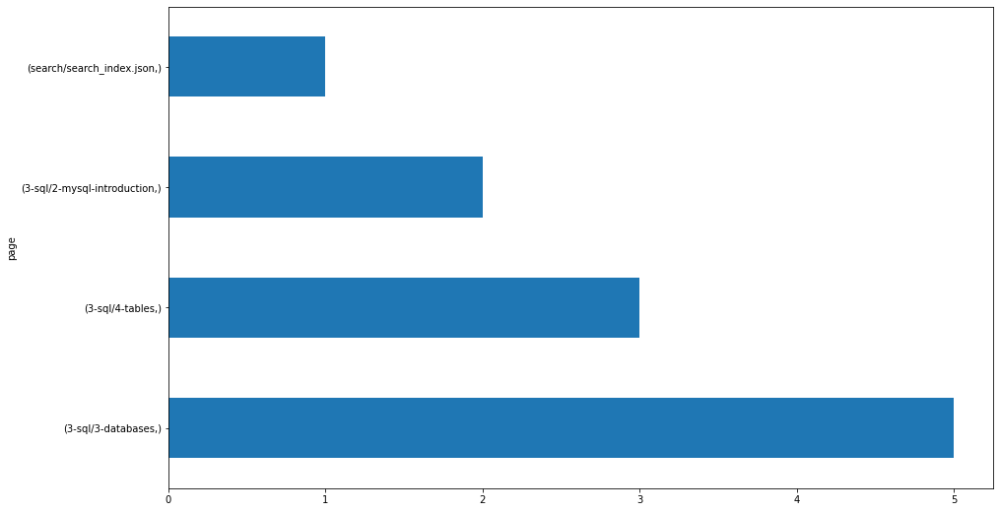


67.11.141.218
page                    
3-sql/5-basic-statements    1
3-sql/4-tables              1
dtype: int64


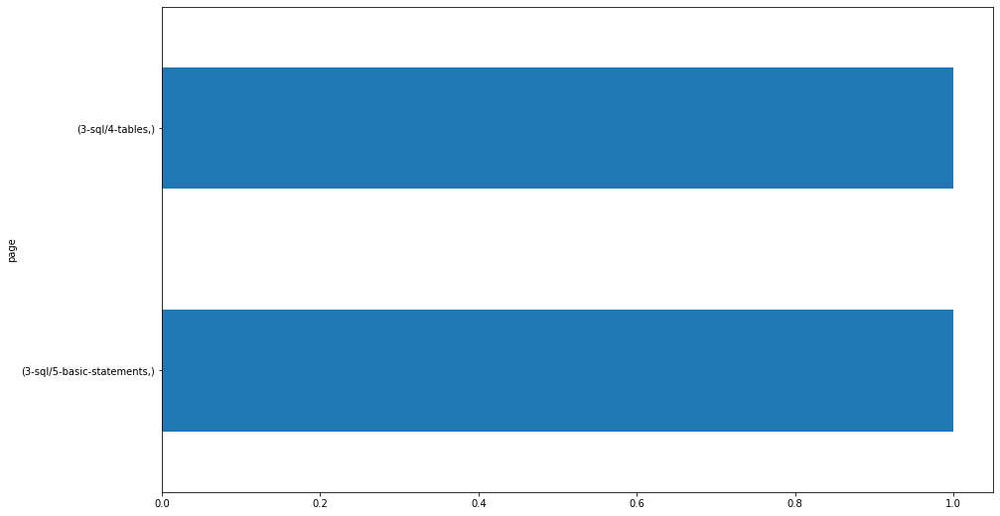


70.130.127.113
page                                                
/                                                       90
6-regression/1-overview                                 30
10-anomaly-detection/1-overview                         29
10-anomaly-detection/AnomalyDetectionCartoon.jpeg       29
7-classification/6.1-logistic-regression                15
                                                        ..
3-sql/3-databases                                        1
3-sql/11-more-exercises                                  1
3-sql/10-temporary-tables                                1
2-storytelling/1-overview                                1
timeseries/working-with-time-series-data-with-pandas     1
Length: 135, dtype: int64


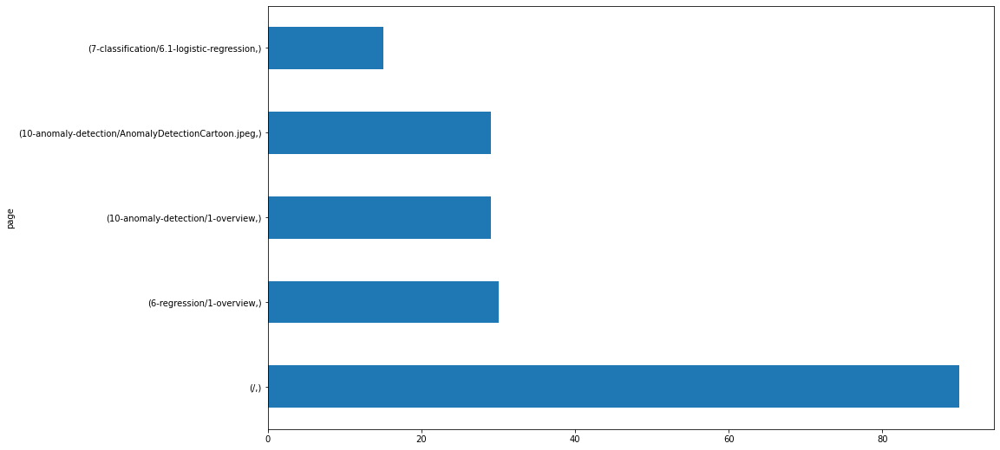


72.190.187.173
page                                             
6-regression/1-overview                              107
/                                                     88
3-sql/1-mysql-overview                                81
10-anomaly-detection/AnomalyDetectionCartoon.jpeg     50
10-anomaly-detection/1-overview                       48
                                                    ... 
2-storytelling/3.6-creating-stories                    1
appendix/cli/0-overview                                1
6-regression/multivariate-regression-in-excel          1
appendix/cli/1-intro                                   1
2-storytelling/2.2-create                              1
Length: 161, dtype: int64


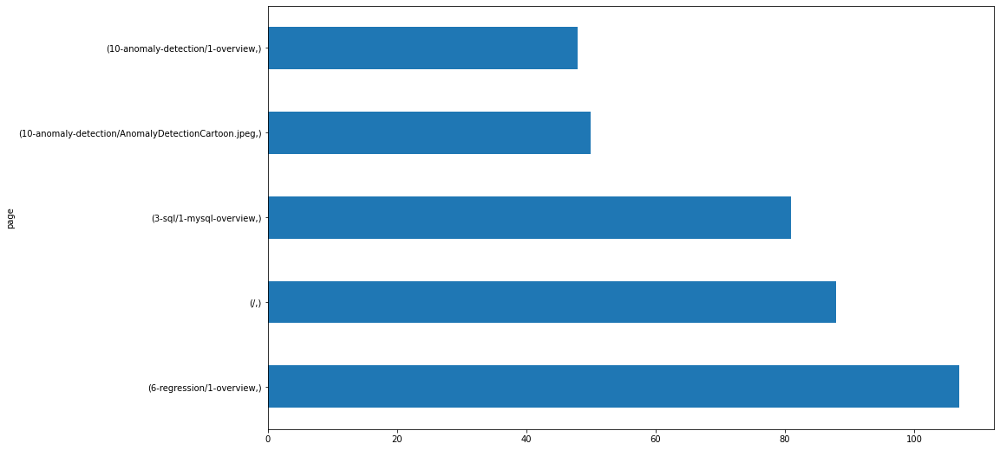


69.231.92.35
page                               
/                                      44
6-regression/1-overview                20
5-stats/2-simulation                   16
5-stats/3-probability-distributions    14
5-stats/1-overview                     13
                                       ..
6-regression/ridge-regression           1
8-clustering/5.1-kmeans-part-1          1
8-clustering/5.2-kmeans-part-2          1
sql/database-design                     1
timeseries/acquire                      1
Length: 207, dtype: int64


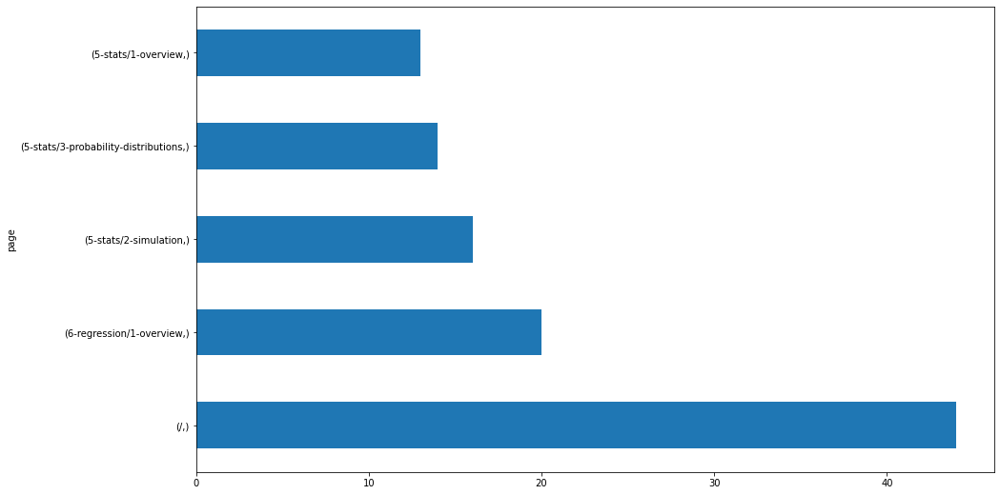


64.250.9.181
page                                             
/                                                    128
6-regression/1-overview                               56
10-anomaly-detection/1-overview                       30
10-anomaly-detection/AnomalyDetectionCartoon.jpeg     30
5-stats/4.2-compare-means                             19
                                                    ... 
4.2-compare-means                                      1
clustering/wrangle                                     1
3-sql/4-tables                                         1
12-distributed-ml/5-explore                            1
storytelling/creating-dashboards                       1
Length: 169, dtype: int64


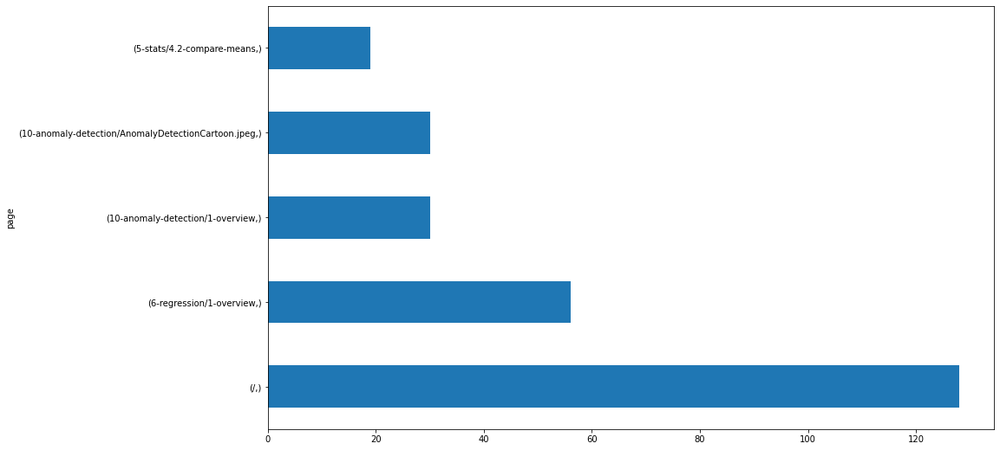


67.10.175.200
page                                    
1-fundamentals/modern-data-scientist.jpg    2
1-fundamentals/AI-ML-DL-timeline.jpg        2
1-fundamentals/1.1-intro-to-data-science    2
/                                           2
appendix/vocabulary                         1
6-regression/1-overview                     1
dtype: int64


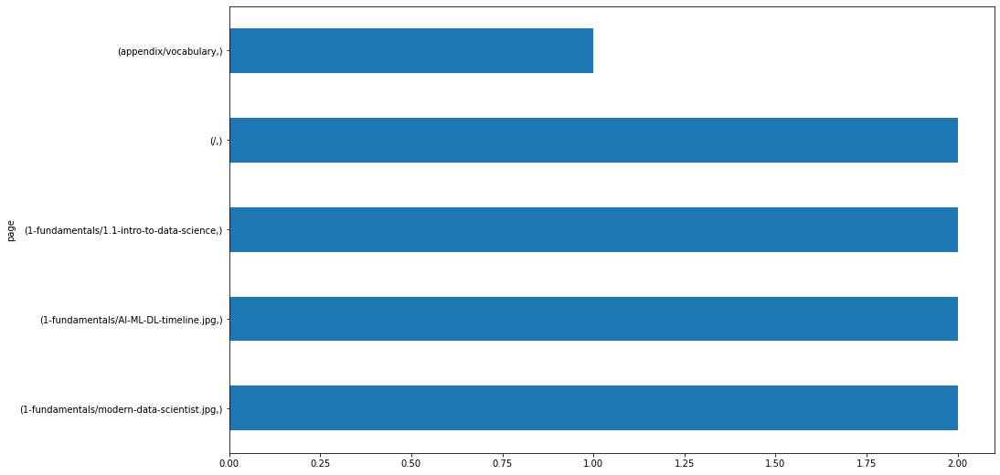


166.251.101.177
page                                    
1-fundamentals/modern-data-scientist.jpg    4
1-fundamentals/AI-ML-DL-timeline.jpg        4
1-fundamentals/1.1-intro-to-data-science    4
3-sql/database-design                       1
/                                           1
dtype: int64


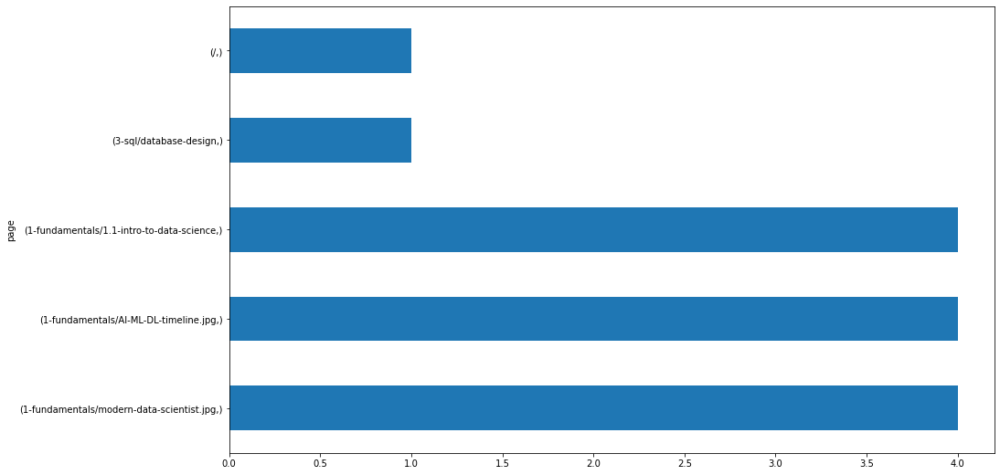


185.245.87.158
page
/       1
dtype: int64


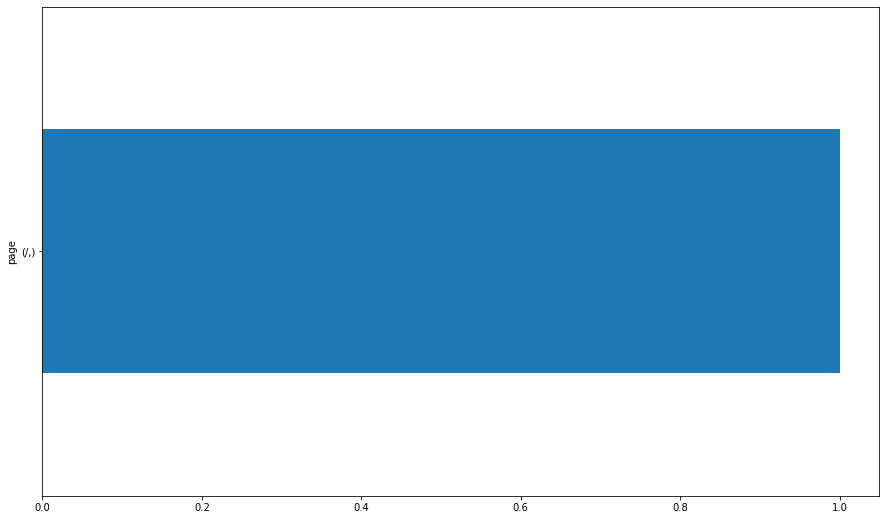


24.73.246.228
page                                       
search/search_index.json                       2
12-distributed-ml/3-spark-api                  2
/                                              2
12-distributed-ml/2-environment-setup          1
1-fundamentals/2.3-visualization-with-excel    1
1-fundamentals/2.1-excel-overview              1
dtype: int64


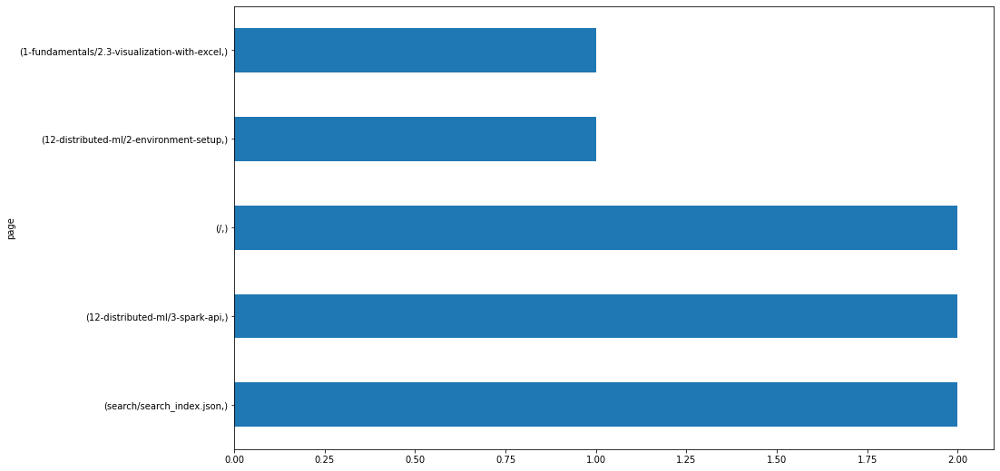


107.77.217.70
page                                             
9-timeseries/5.1-modeling-lesson1                    2
9-timeseries/project                                 1
9-timeseries/5.2-modeling-lesson2                    1
6-regression/1-overview                              1
3-sql/5-basic-statements                             1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
dtype: int64


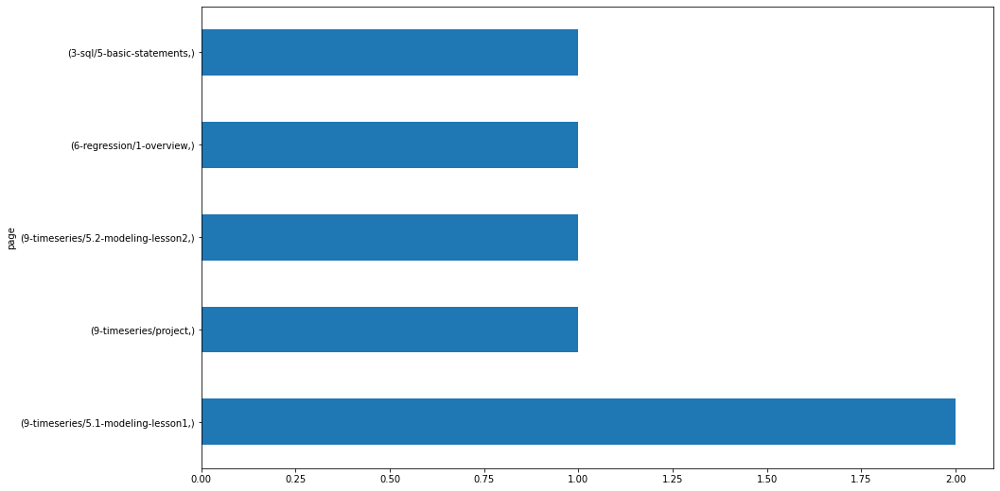


107.77.217.142
page                     
6-regression/7.0-model       3
8-clustering/project         1
6-regression/8.0-Project     1
6-regression/5.0-evaluate    1
dtype: int64


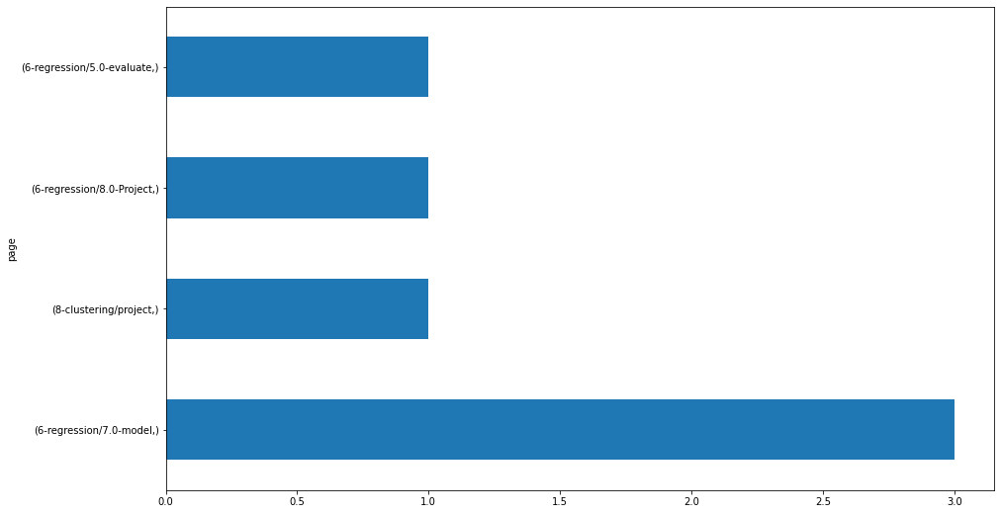


107.77.217.39
page                                    
appendix/cli-git-overview                   2
8-clustering/project                        2
3-sql/5-basic-statements                    1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


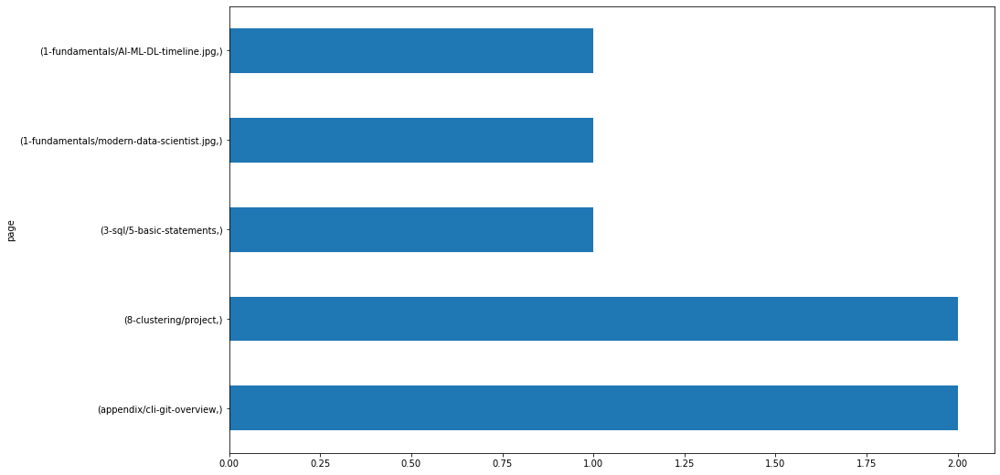


212.103.49.182
page                                    
1-fundamentals/DataToAction_v2.jpg          3
1-fundamentals/1.2-data-science-pipeline    3
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/1.3-pipeline-demo            1
dtype: int64


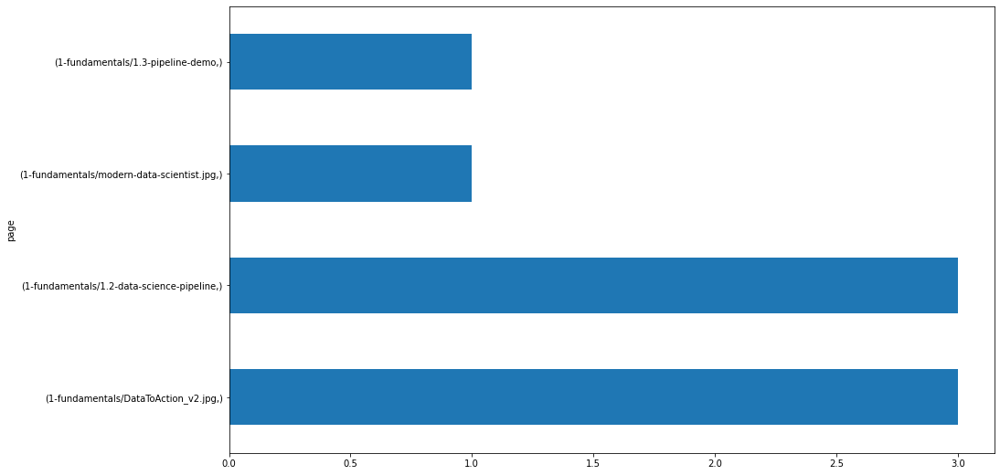


107.77.217.37
page                                    
3-sql/5-basic-statements                    1
3-sql/4-tables                              1
3-sql/2-mysql-introduction                  1
3-sql/12-more-exercises                     1
2-storytelling/1-overview                   1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
/                                           1
dtype: int64


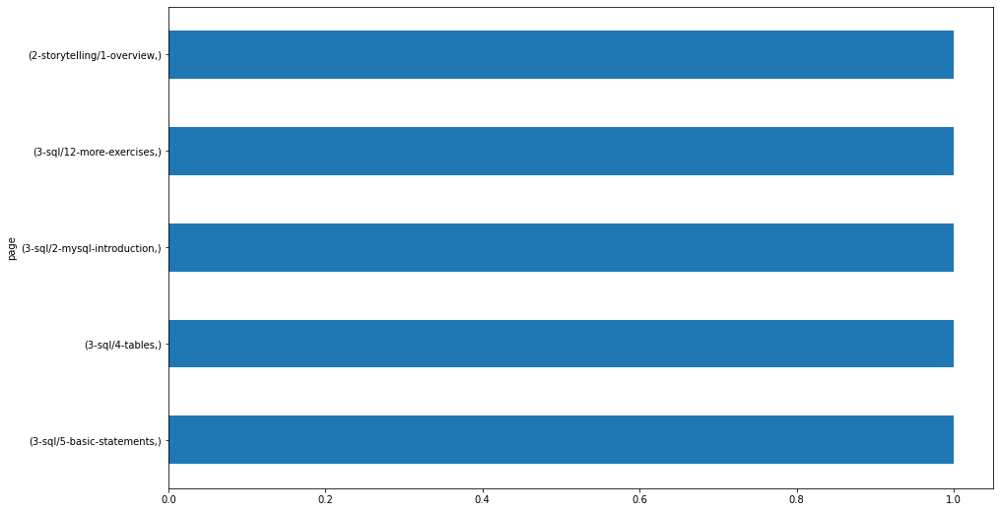


166.251.109.101
page                                    
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


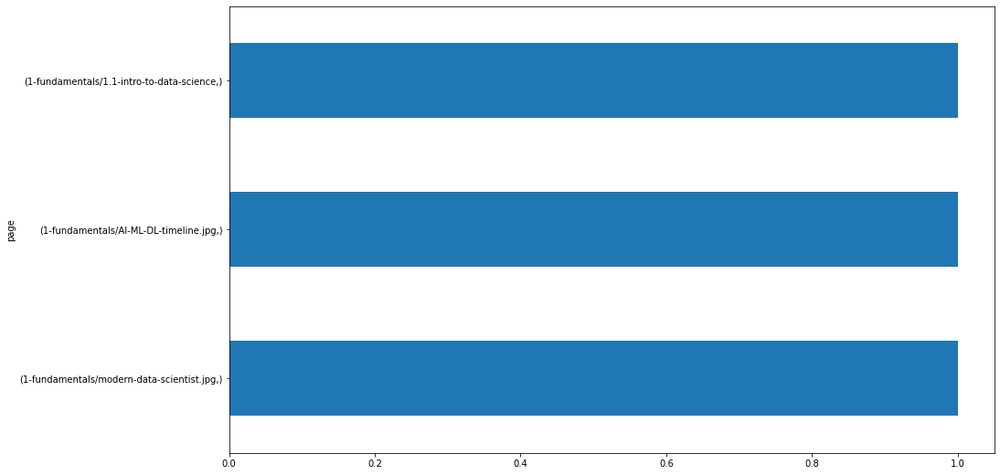


107.77.198.136
page
/       1
dtype: int64


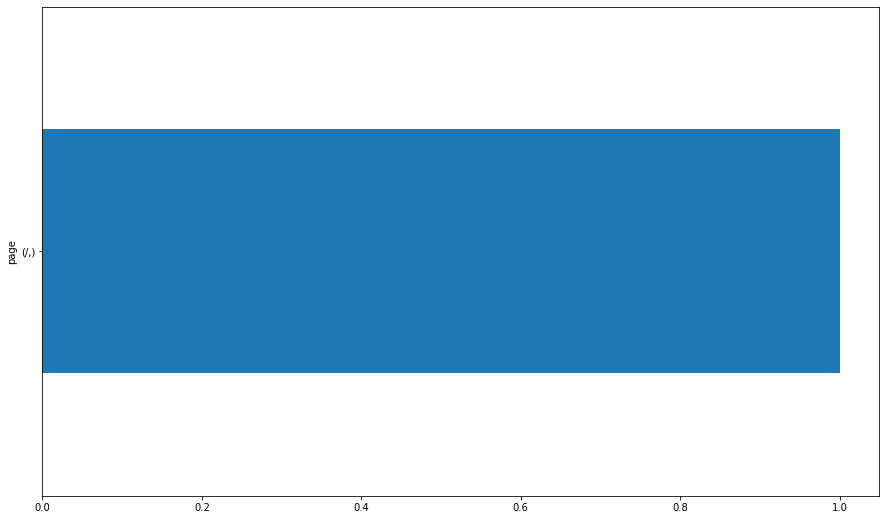


24.26.249.215
page                                                             
/                                                                    64
6-regression/1-overview                                              29
1-fundamentals/modern-data-scientist.jpg                             23
1-fundamentals/AI-ML-DL-timeline.jpg                                 23
1-fundamentals/1.1-intro-to-data-science                             22
                                                                     ..
appendix/professional-development/t-block-lesson-ds                   1
appendix/professional-development/virtual-meeting-tips-and-tricks     1
12-distributed-ml/4-wrangle                                           1
appendix/useful_libraries                                             1
timeseries/project                                                    1
Length: 170, dtype: int64


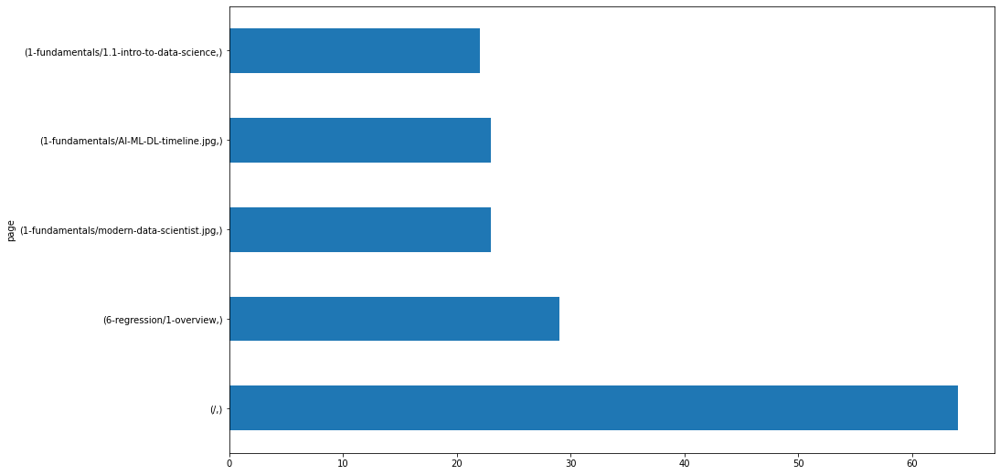


96.8.130.209
page
/       1
dtype: int64


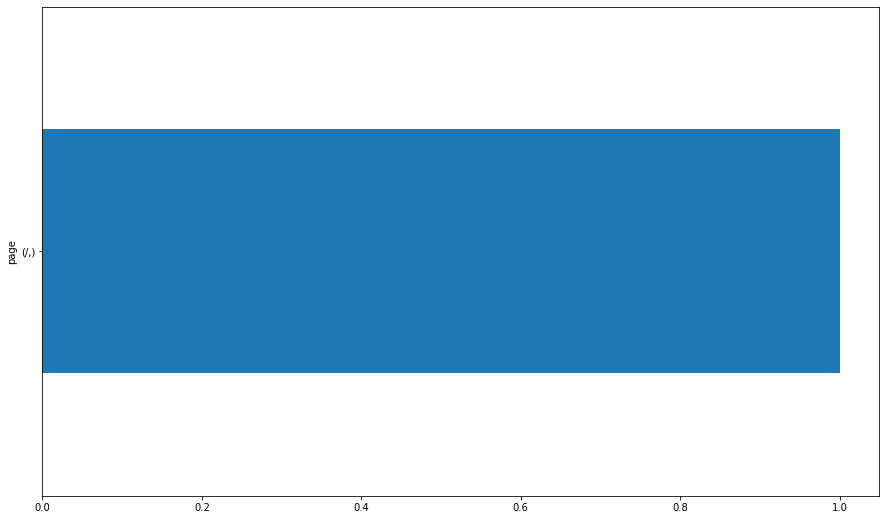


166.251.101.67
page                                    
1-fundamentals/modern-data-scientist.jpg    2
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/1.2-data-science-pipeline    1
dtype: int64


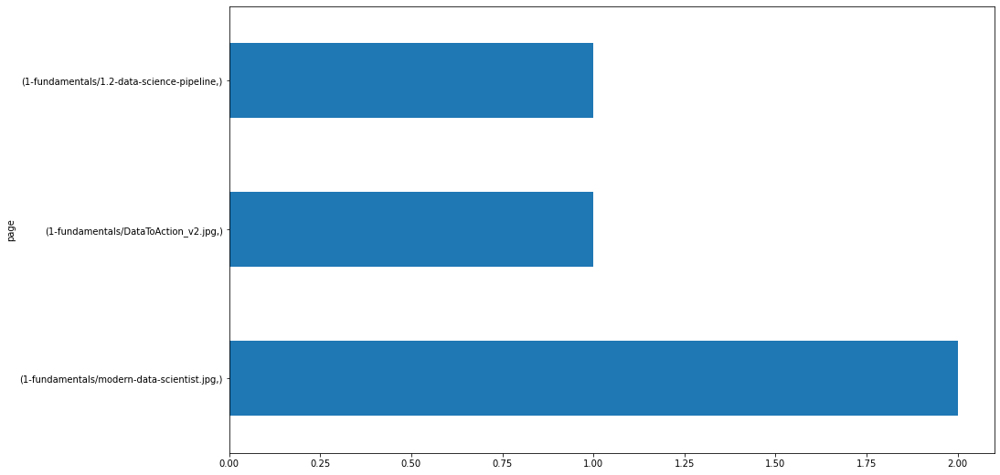


76.184.210.61
page                                                   
search/search_index.json                                   4
8-clustering/1-overview                                    1
7-classification/6.3-random-forests                        1
5-stats/Selecting_a_hypothesis_test.svg                    1
5-stats/4.5-more-statistical-testing-examples              1
4-python/7.4.4-advanced-dataframes                         1
3-sql/1-mysql-overview                                     1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg          1
10-anomaly-detection/3-discrete-probabilistic-methods      1
10-anomaly-detection/2-continuous-probabilistic-methods    1
10-anomaly-detection/1-overview                            1
dtype: int64


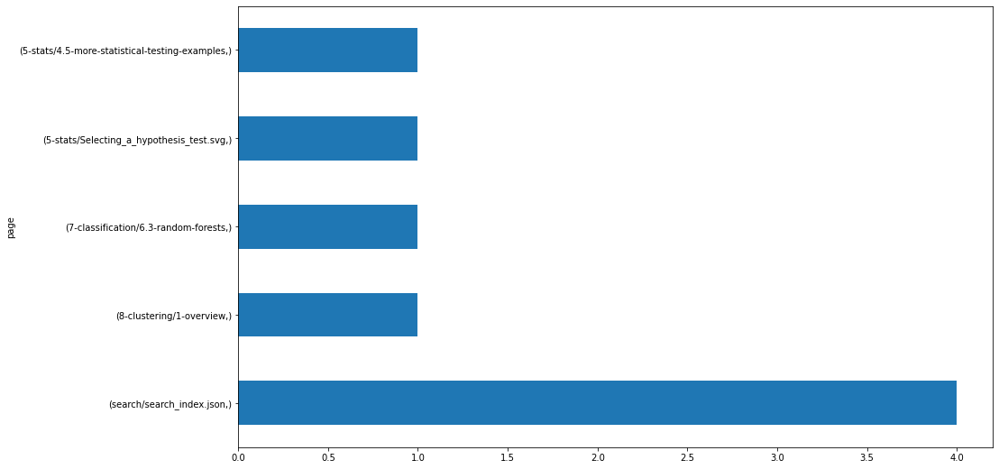


108.178.77.202
page                                                   
10-anomaly-detection/AnomalyDetectionCartoon.jpeg          1
10-anomaly-detection/2-continuous-probabilistic-methods    1
10-anomaly-detection/1-overview                            1
/                                                          1
dtype: int64


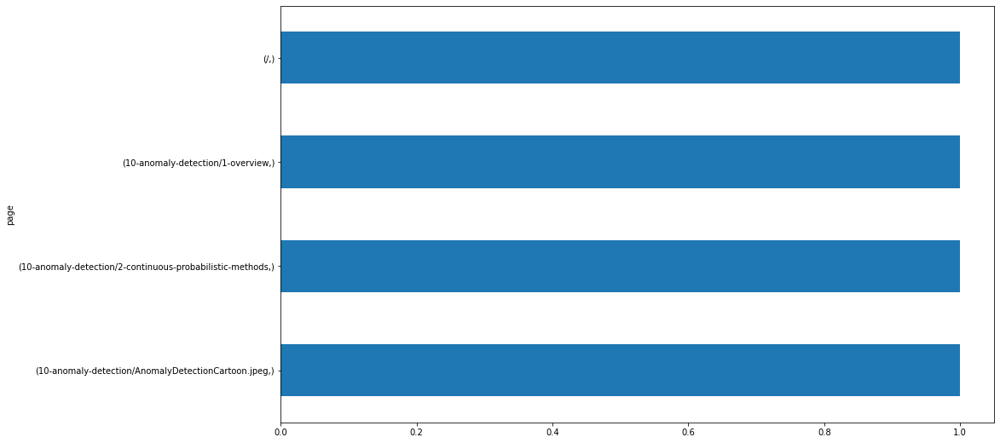


72.190.175.202
page                                 
/                                        7
5-stats/2-simulation                     7
5-stats/3-probability-distributions      6
3-sql/7-functions                        6
3-sql/5-basic-statements                 5
                                        ..
4-python/project                         1
2-storytelling/project                   1
2-storytelling/misleading3_deaths.jpg    1
4-python/3-data-types-and-variables      1
6-regression/7.0-model                   1
Length: 81, dtype: int64


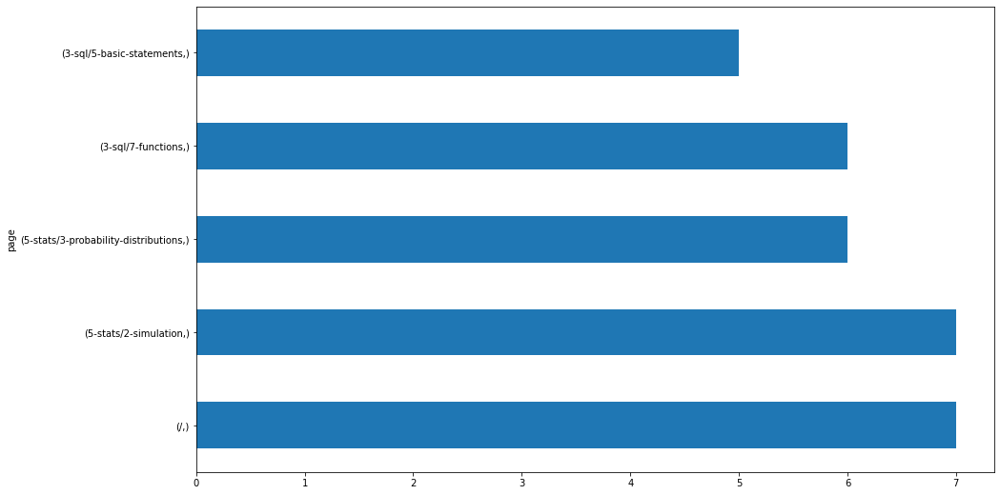


70.123.236.191
page                                             
/                                                    104
6-regression/1-overview                               46
search/search_index.json                              35
10-anomaly-detection/1-overview                       33
10-anomaly-detection/AnomalyDetectionCartoon.jpeg     31
                                                    ... 
13-advanced-topics/3.7-styling-webpages                1
python/dataframes                                      1
python/data-types-and-variables                        1
6-regression/univariate_regression_in_excel            1
timeseries/prep                                        1
Length: 160, dtype: int64


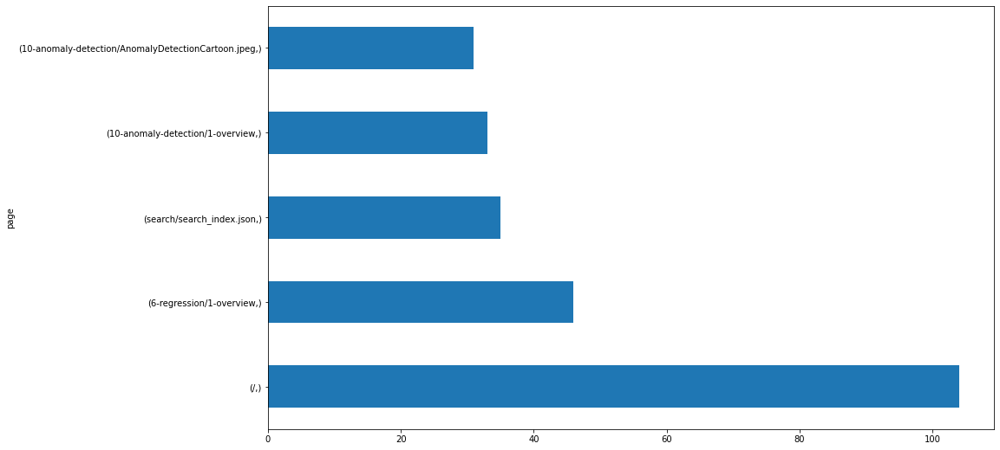


209.36.87.18
page                             
1-fundamentals/2.1-excel-overview    1
/                                    1
dtype: int64


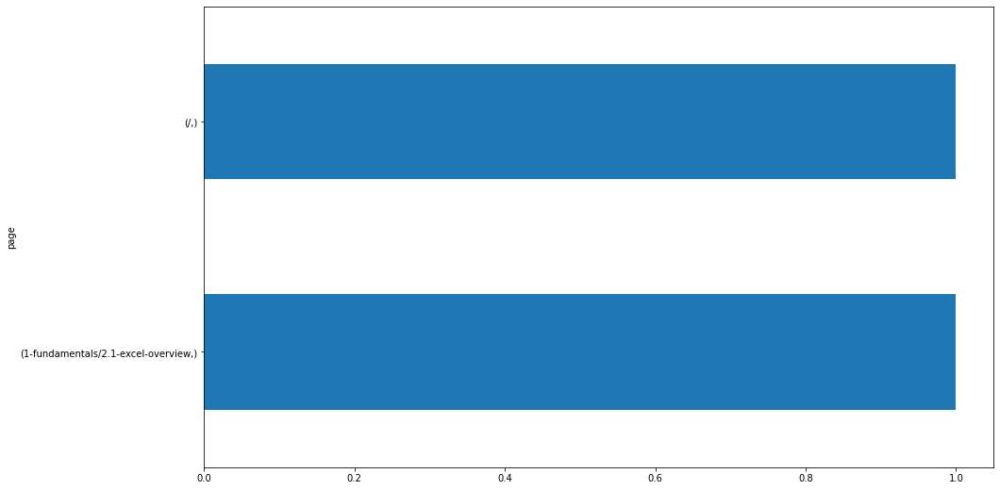


107.77.198.169
page                                    
1-fundamentals/modern-data-scientist.jpg    2
1-fundamentals/AI-ML-DL-timeline.jpg        2
1-fundamentals/1.1-intro-to-data-science    2
1-fundamentals/3-vocabulary                 1
/                                           1
dtype: int64


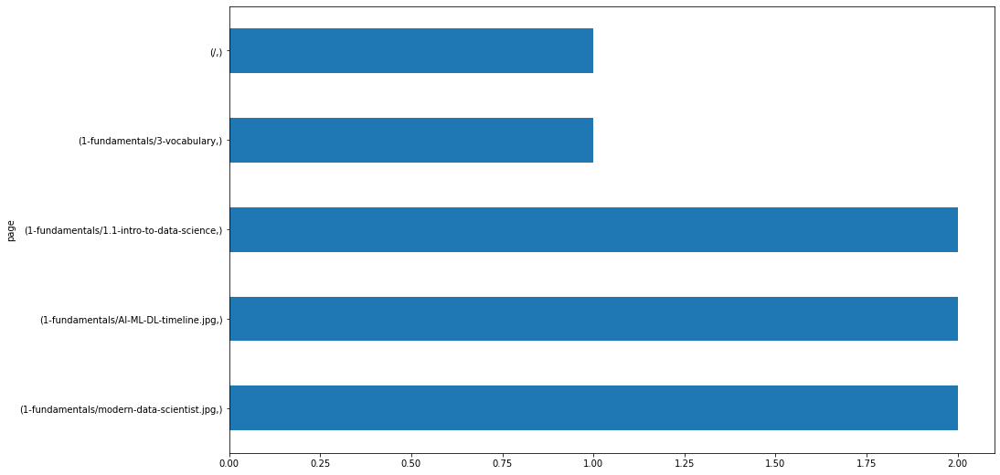


107.77.198.12
page                                    
2-storytelling/project                      1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


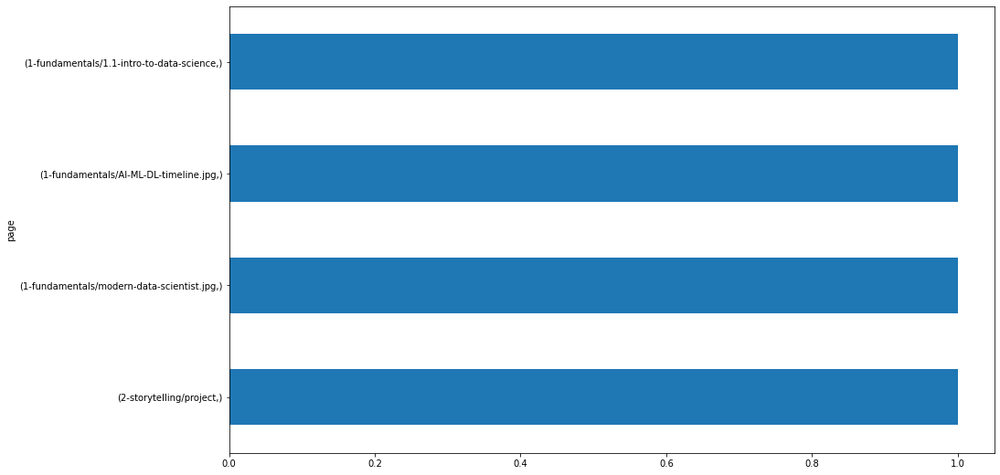


75.1.34.153
page                       
3-sql/6.4-limit                2
3-sql/9.4-subqueries           1
3-sql/9.3-joins                1
3-sql/9.2-indexes              1
3-sql/8-group-by               1
3-sql/7-functions              1
3-sql/6.3-order-by             1
3-sql/6.2-where                1
3-sql/6.1-clauses-overview     1
3-sql/5-basic-statements       1
3-sql/4-tables                 1
3-sql/3-databases              1
3-sql/2-mysql-introduction     1
3-sql/1-mysql-overview         1
1-fundamentals/3-vocabulary    1
dtype: int64


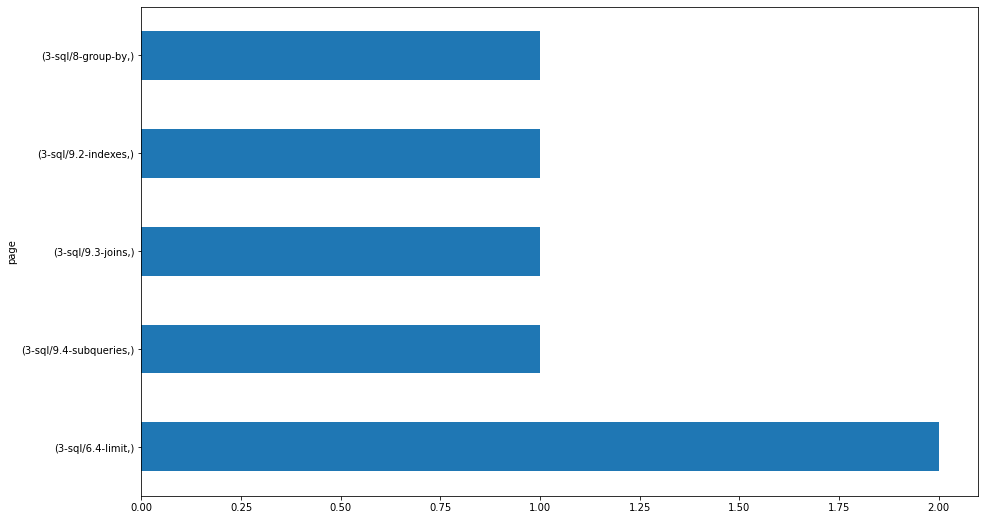


45.27.9.171
page                             
/                                    24
8-clustering/5-model                  7
search/search_index.json              6
8-clustering/project                  6
12-distributed-ml/3-spark-api         6
                                     ..
3-sql/6.3-order-by                    1
3-sql/11-case-statements              1
3-sql/10-temporary-tables             1
13-advanced-topics/3.6-html-forms     1
5-stats/2-simulation                  1
Length: 102, dtype: int64


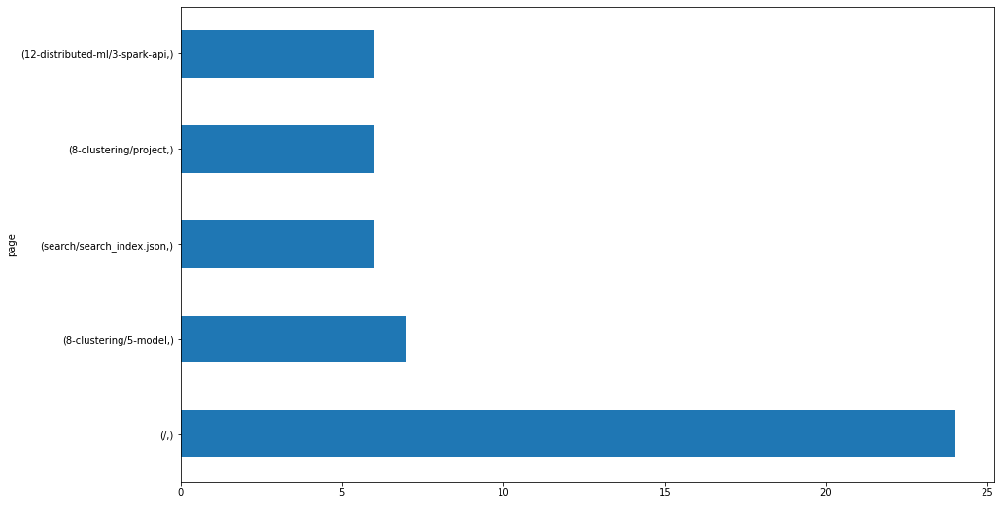


104.5.217.57
page                                             
/                                                    50
search/search_index.json                             47
10-anomaly-detection/1-overview                      11
6-regression/1-overview                              10
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    10
                                                     ..
3-sql/8-group-by                                      1
3-sql/6.4-limit                                       1
3-sql/6.3-order-by                                    1
2-storytelling/project                                1
4-python/8.3-intro-to-numpy                           1
Length: 128, dtype: int64


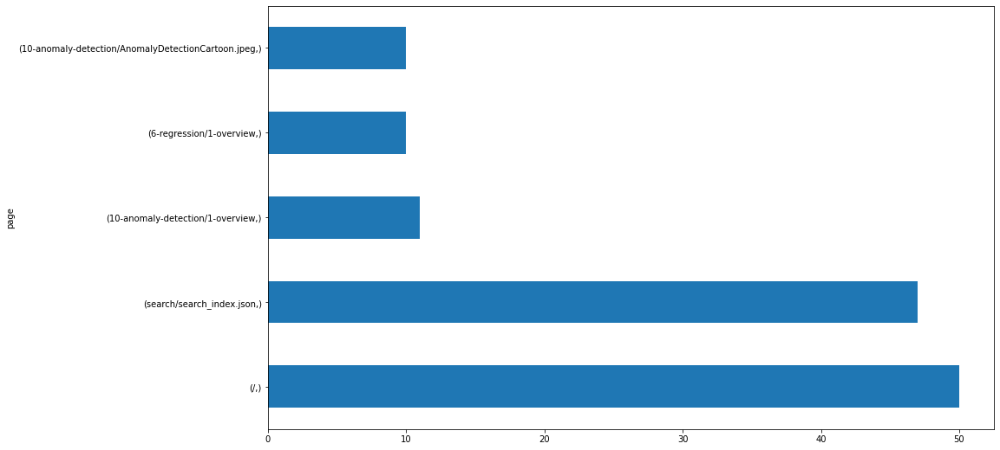


173.232.243.3
page                                
7-classification/5-evaluation           2
7-classification/3-prep                 2
7-classification/6.2-decision-trees     1
7-classification/4-explore              1
7-classification/1-overview             1
6-regression/6.0-feature-engineering    1
6-regression/3.0-split-and-scale        1
6-regression/1-overview                 1
/                                       1
dtype: int64


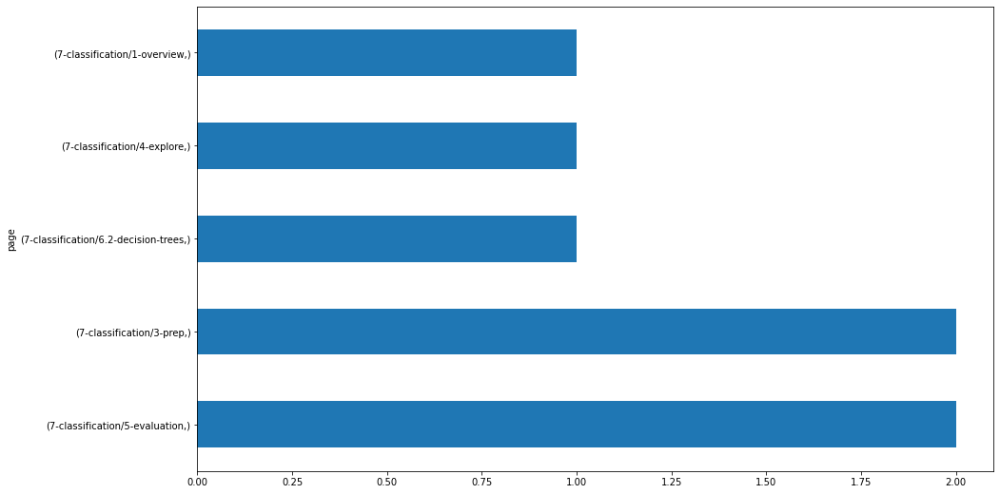


166.251.109.164
page                                    
2-storytelling/project                      2
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.2-data-science-pipeline    1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


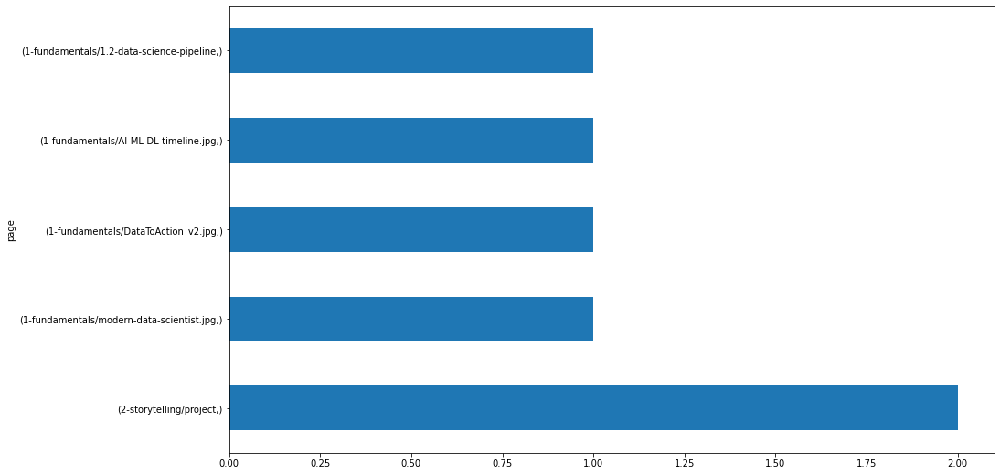


31.13.189.93
page                                    
1-fundamentals/DataToAction_v2.jpg          3
1-fundamentals/1.2-data-science-pipeline    3
appendix/cli-git-overview                   2
1-fundamentals/modern-data-scientist.jpg    2
1-fundamentals/AI-ML-DL-timeline.jpg        2
1-fundamentals/1.3-pipeline-demo            2
1-fundamentals/1.1-intro-to-data-science    2
appendix/cli/0-overview                     1
1-fundamentals/3-vocabulary                 1
dtype: int64


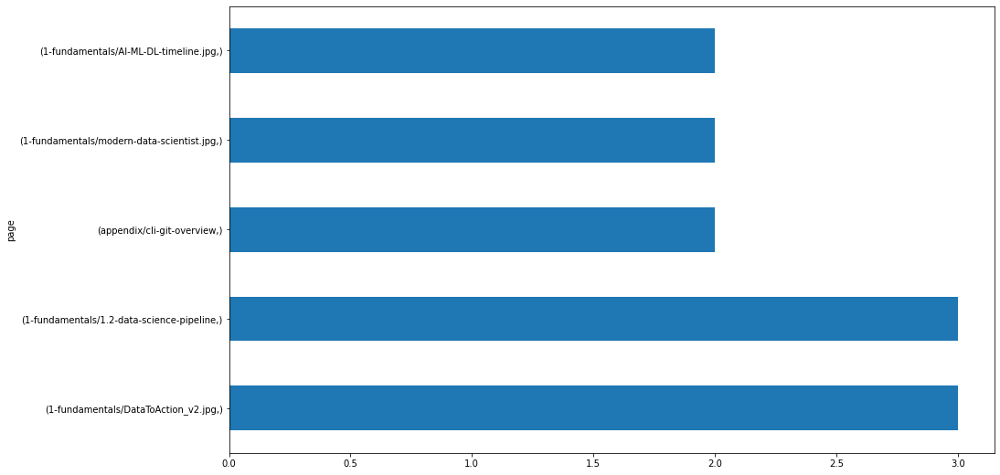


174.207.16.31
page                                         
appendix/cli/5-creating-files-and-directories    1
dtype: int64


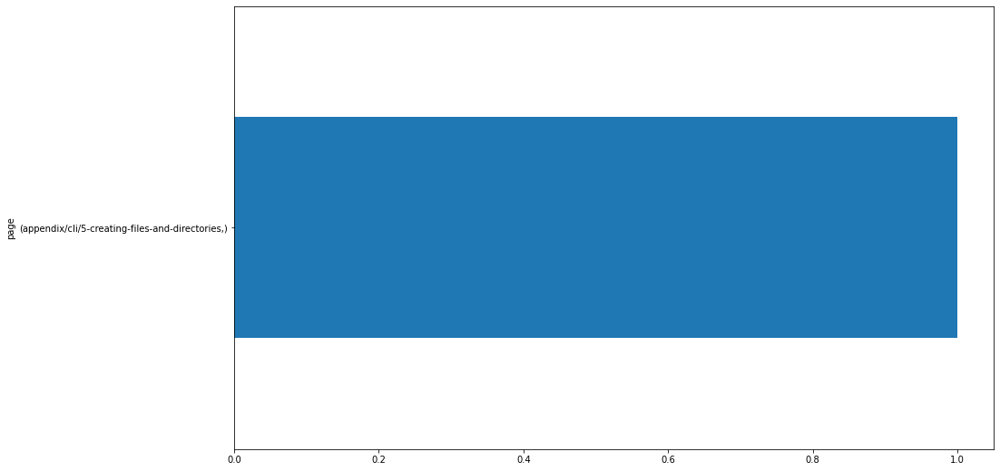


173.123.211.50
page                     
appendix/cli/0-overview      1
appendix/cli-git-overview    1
dtype: int64


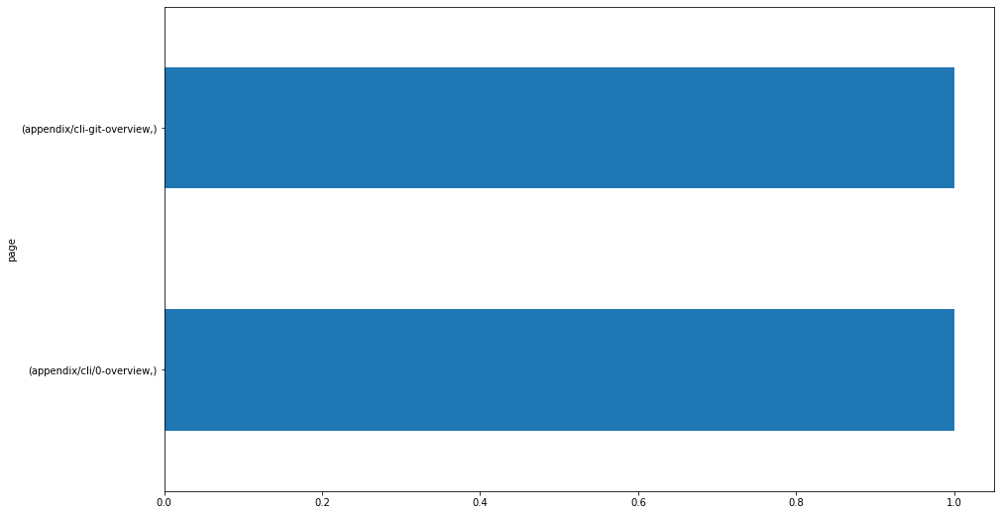


107.77.221.189
page                                             
11-nlp/4-prepare                                     1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
dtype: int64


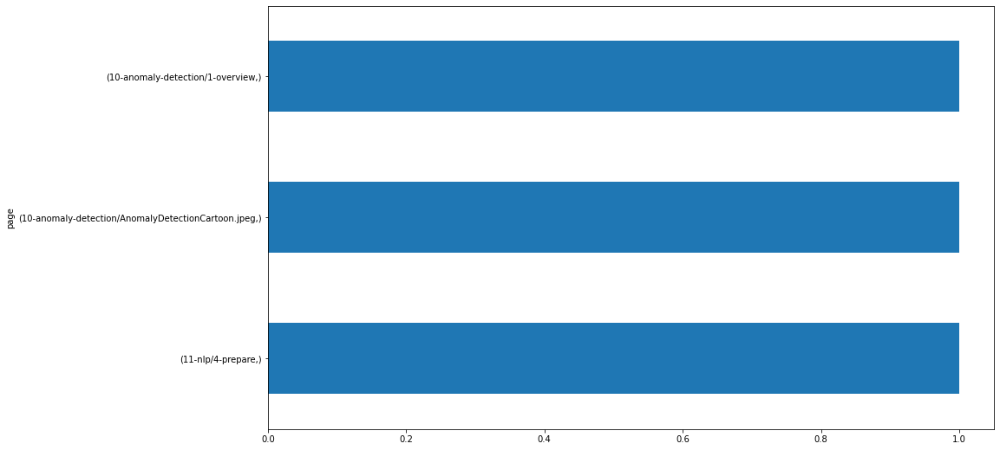


166.251.106.169
page                                         
appendix/cli/1-intro                             4
appendix/cli/2-listing-files                     3
appendix/cli/7-more-topics                       2
appendix/cli/6-moving-files                      2
appendix/cli/4-navigating-the-filesystem         2
appendix/cli/3-file-paths                        2
appendix/cli/0-overview                          2
search/search_index.json                         1
appendix/cli/5-creating-files-and-directories    1
3-sql/3-databases                                1
3-sql/2-mysql-introduction                       1
3-sql/1-mysql-overview                           1
dtype: int64


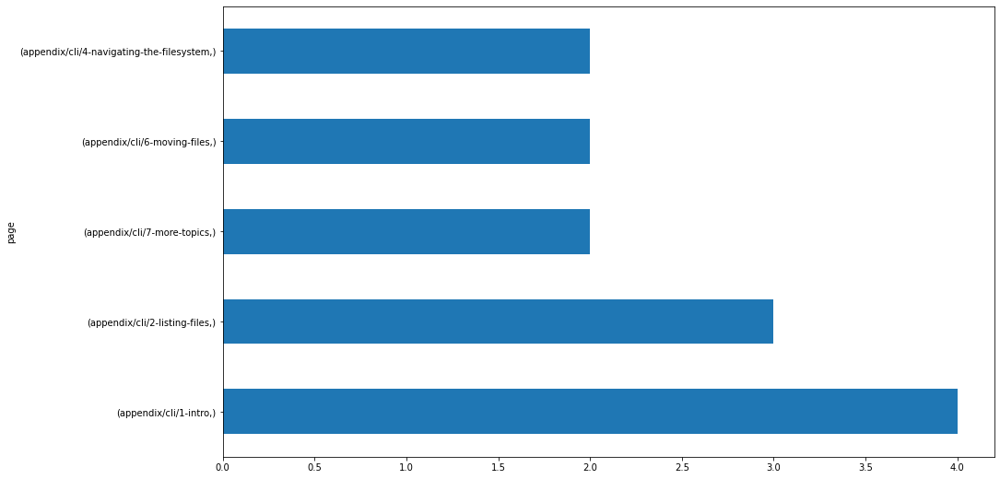


107.77.198.177
page        
appendix/git    1
dtype: int64


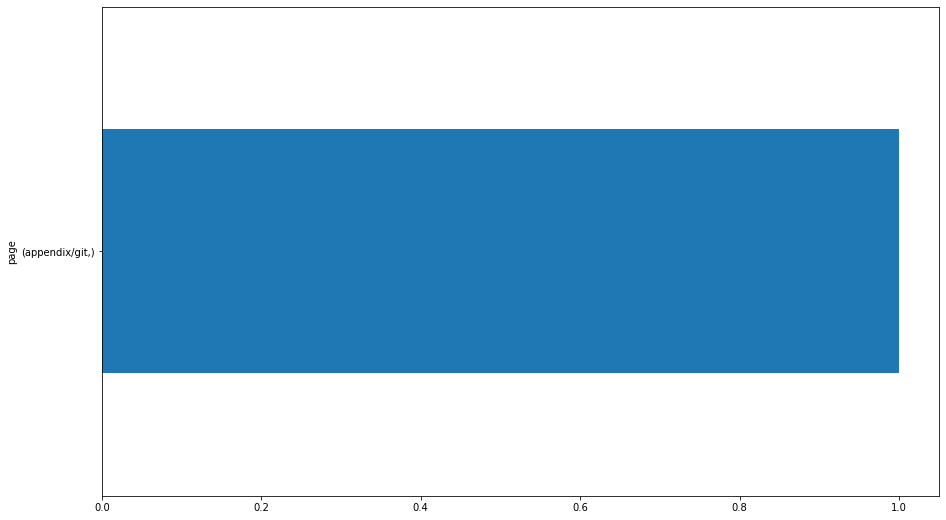


72.190.169.29
page                                         
6-regression/7.0-model                           14
/                                                13
5-stats/2-simulation                             12
6-regression/8.0-Project                         12
6-regression/6.0-feature-engineering             11
                                                 ..
3-sql/7-functions                                 1
appendix/git-branching                            1
5-stats/4.4-compare-group-membership              1
5-stats/4.5-more-statistical-testing-examples     1
4-python/error-handling                           1
Length: 86, dtype: int64


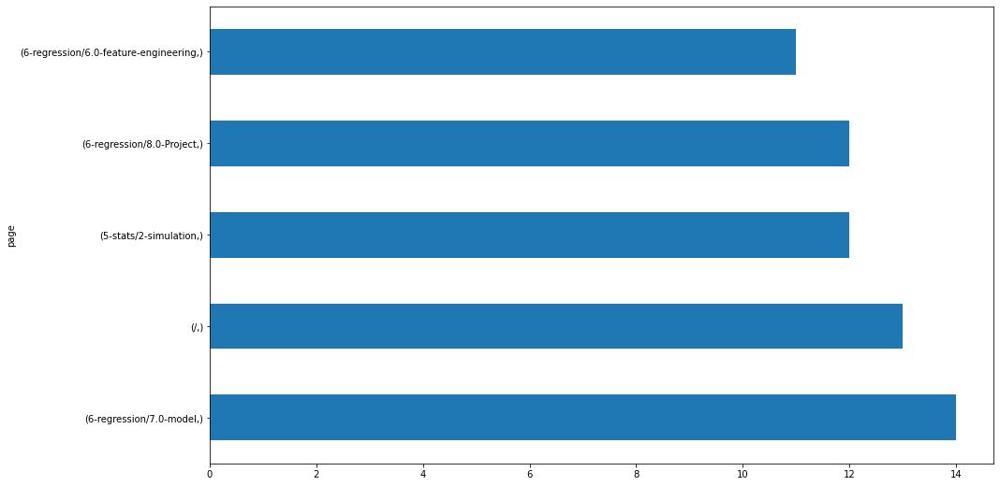


24.153.137.59
page              
timeseries/prep       1
timeseries/acquire    1
11-nlp/5-explore      1
dtype: int64


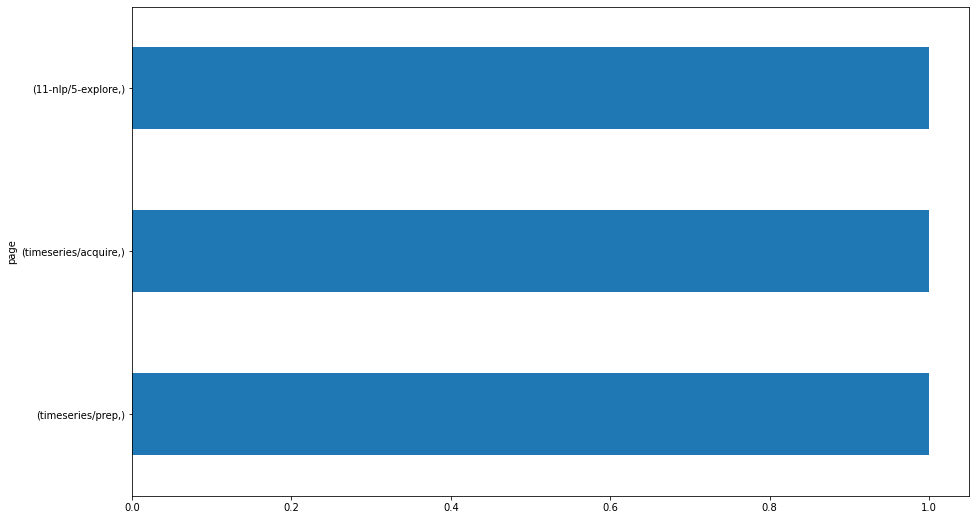


173.123.149.65
page                                    
1-fundamentals/modern-data-scientist.jpg    5
1-fundamentals/AI-ML-DL-timeline.jpg        5
1-fundamentals/1.1-intro-to-data-science    4
2-storytelling/project                      2
appendix/cli/3-file-paths                   1
appendix/cli/2-listing-files                1
appendix/cli/1-intro                        1
appendix/cli/0-overview                     1
appendix/cli-git-overview                   1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/1.3-pipeline-demo            1
1-fundamentals/1.2-data-science-pipeline    1
/                                           1
dtype: int64


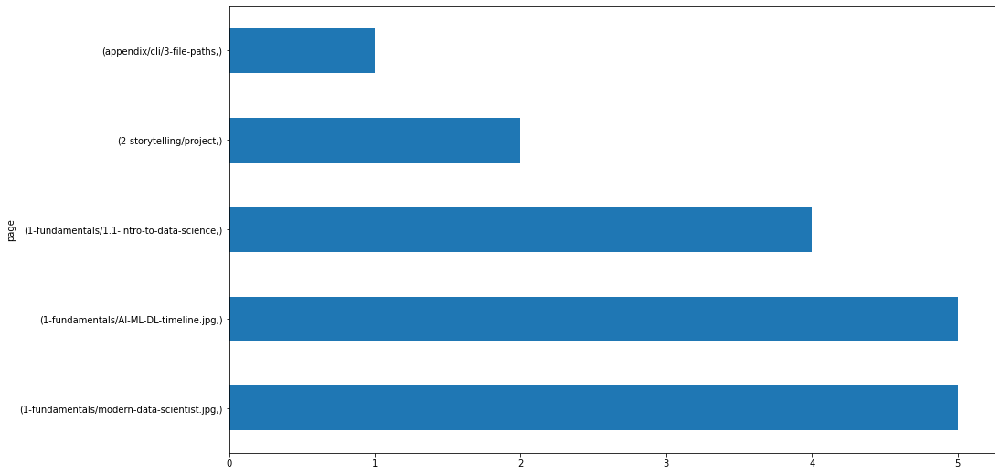


166.247.59.42
page             
3-sql/4-tables       2
3-sql/3-databases    1
dtype: int64


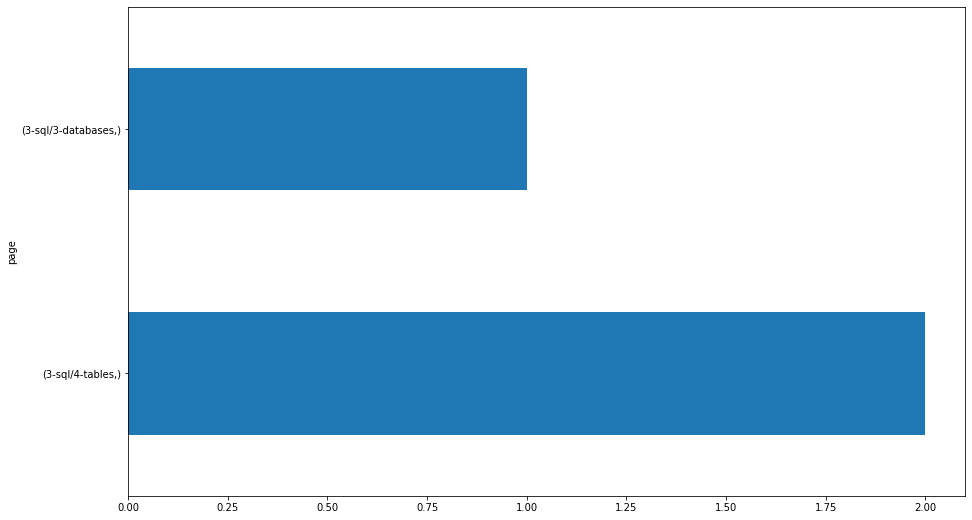


184.75.223.44
page                               
7-classification/6.2-decision-trees    1
7-classification/4-explore             1
6-regression/3.0-split-and-scale       1
6-regression/1-overview                1
/                                      1
dtype: int64


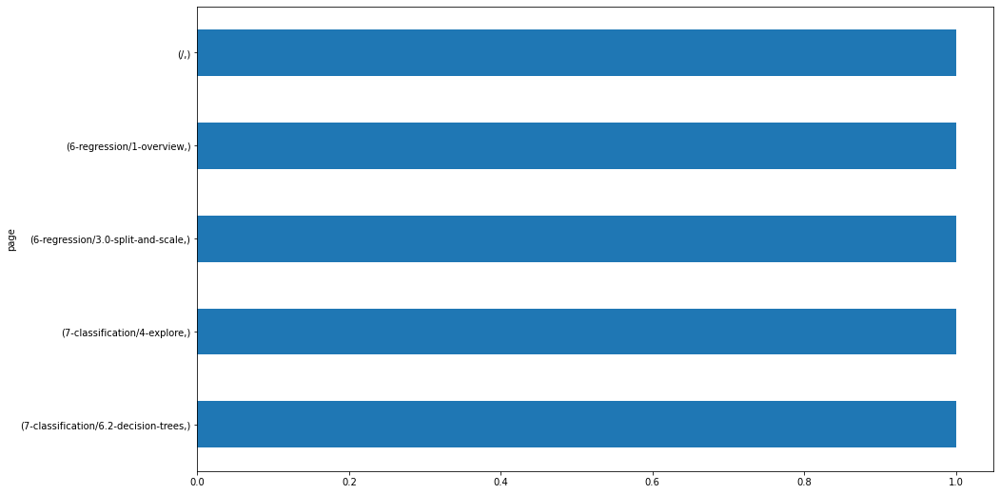


70.123.228.86
page                                         
1-fundamentals/1.1-intro-to-data-science         8
1-fundamentals/AI-ML-DL-timeline.jpg             8
1-fundamentals/modern-data-scientist.jpg         8
6-regression/7.0-model                           6
5-stats/4.4-compare-group-membership             4
3-sql/7-functions                                3
3-sql/9.3-joins                                  3
5-stats/4.2-compare-means                        3
5-stats/4.3-correlation                          3
/                                                2
3-sql/8-group-by                                 2
11-nlp/3-acquire                                 2
3-sql/6.1-clauses-overview                       1
3-sql/4-tables                                   1
3-sql/3-databases                                1
3-sql/2-mysql-introduction                       1
3-sql/6.2-where                                  1
3-sql/6.3-order-by                               1
3-sql/6.4-limit      

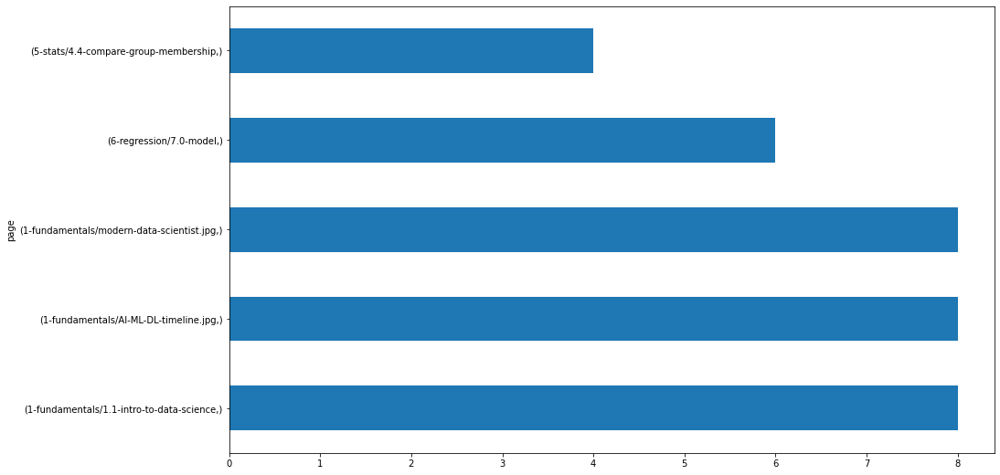


70.94.164.83
page                                       
6-regression/8.0-Project                       11
7-classification/project                       10
6-regression/5-evaluate                         9
5-stats/4.2-compare-means                       8
6-regression/7-model                            8
                                               ..
13-advanced-topics/3.6-html-forms               1
13-advanced-topics/3.5-html-templates           1
13-advanced-topics/3.4-intro-to-flask           1
13-advanced-topics/3.2-virtual-environments     1
stats/compare-means                             1
Length: 117, dtype: int64


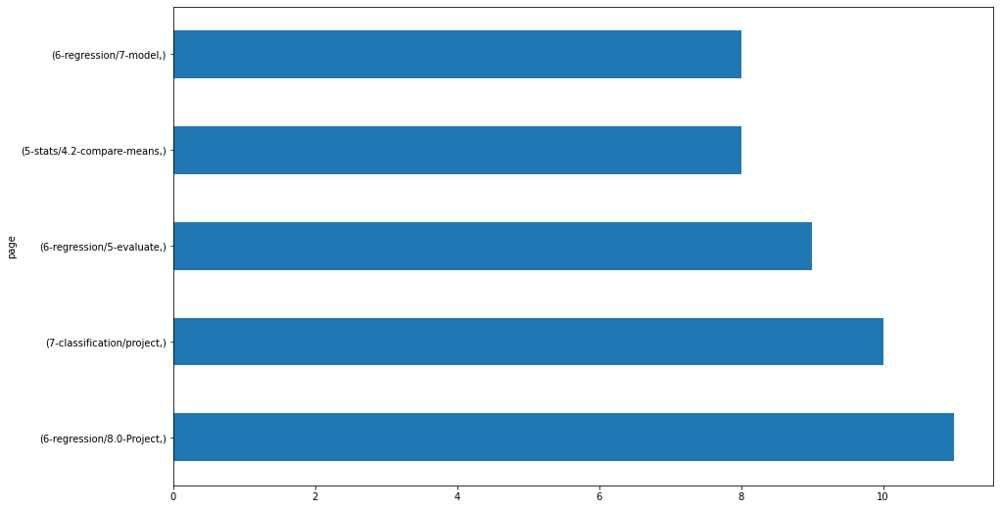


166.247.84.196
page                      
3-sql/5-basic-statements      2
3-sql/6.2-where               1
3-sql/4-tables                1
3-sql/3-databases             1
3-sql/2-mysql-introduction    1
3-sql/1-mysql-overview        1
2-storytelling/2.3-refine     1
2-storytelling/2.2-create     1
dtype: int64


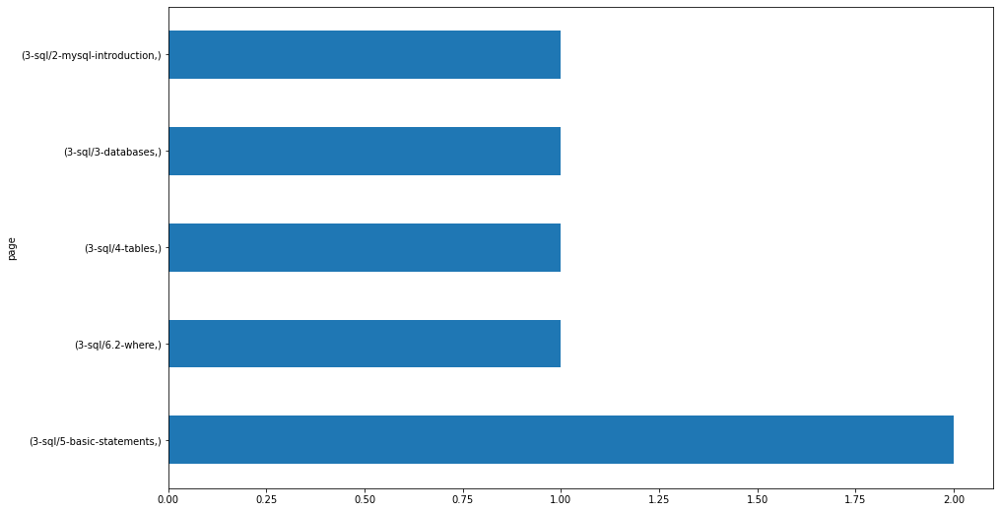


107.77.219.11
page                             
3-sql/6.1-clauses-overview           3
4-python/2-introduction-to-python    1
4-python/1-overview                  1
dtype: int64


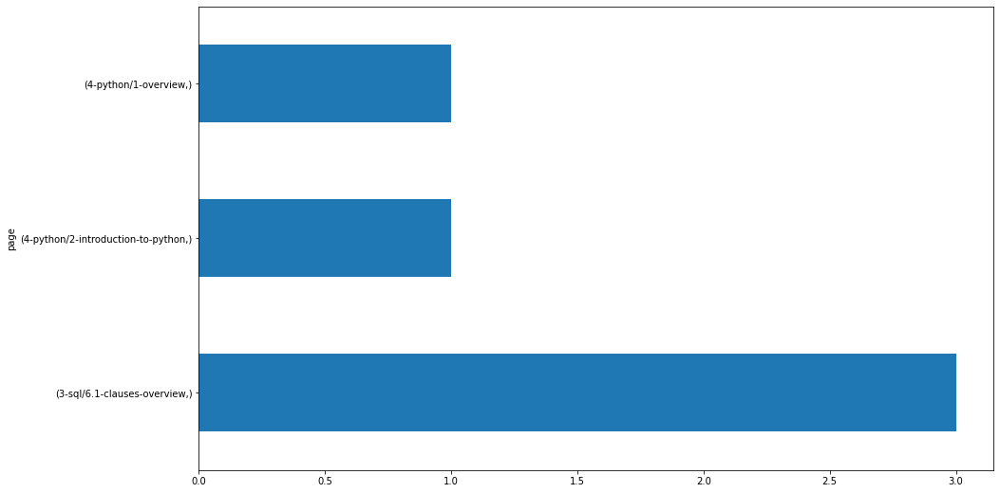


107.77.219.110
page                               
4-python/project                       2
4-python/4-control-structures          2
4-python/6-imports                     1
4-python/5-functions                   1
4-python/3-data-types-and-variables    1
3-sql/7-functions                      1
dtype: int64


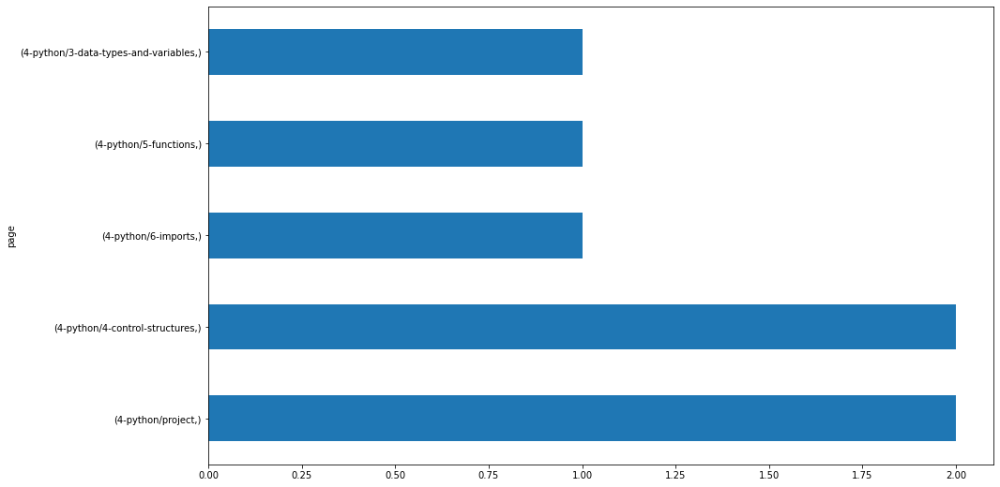


72.177.240.51
page                                             
/                                                    29
6-regression/1-overview                              27
search/search_index.json                             15
10-anomaly-detection/1-overview                      13
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    13
                                                     ..
13-advanced-topics/3.8-json-responses                 1
13-advanced-topics/3.7-styling-webpages               1
13-advanced-topics/3.6-html-forms                     1
13-advanced-topics/3.5-html-templates                 1
3-sql/3-databases                                     1
Length: 122, dtype: int64


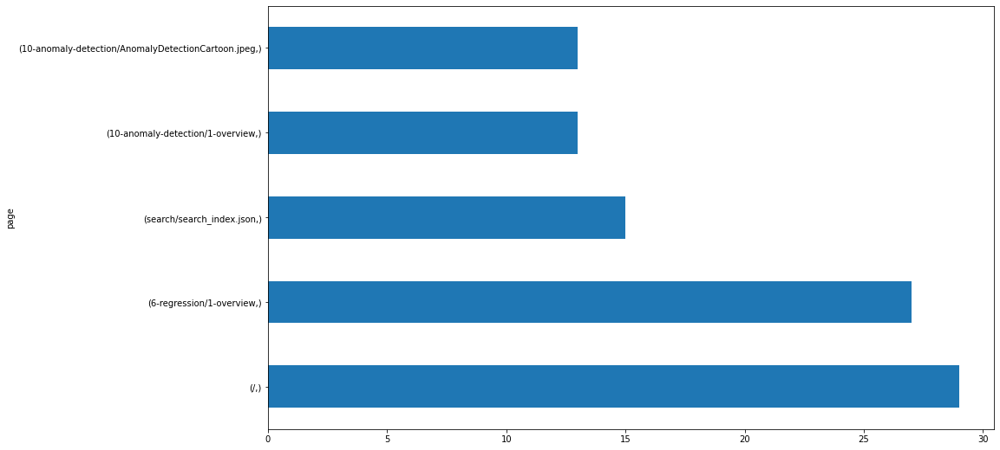


107.77.219.50
page                      
3-sql/6.2-where               1
3-sql/6.1-clauses-overview    1
3-sql/5-basic-statements      1
dtype: int64


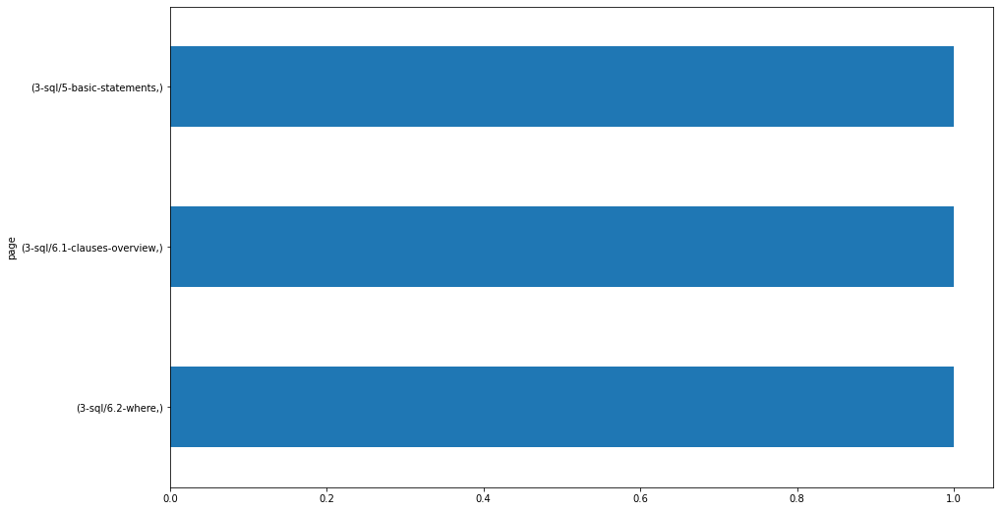


129.111.18.213
page                      
3-sql/5-basic-statements      2
3-sql/6.2-where               1
3-sql/6.1-clauses-overview    1
3-sql/4-tables                1
3-sql/3-databases             1
3-sql/2-mysql-introduction    1
3-sql/1-mysql-overview        1
dtype: int64


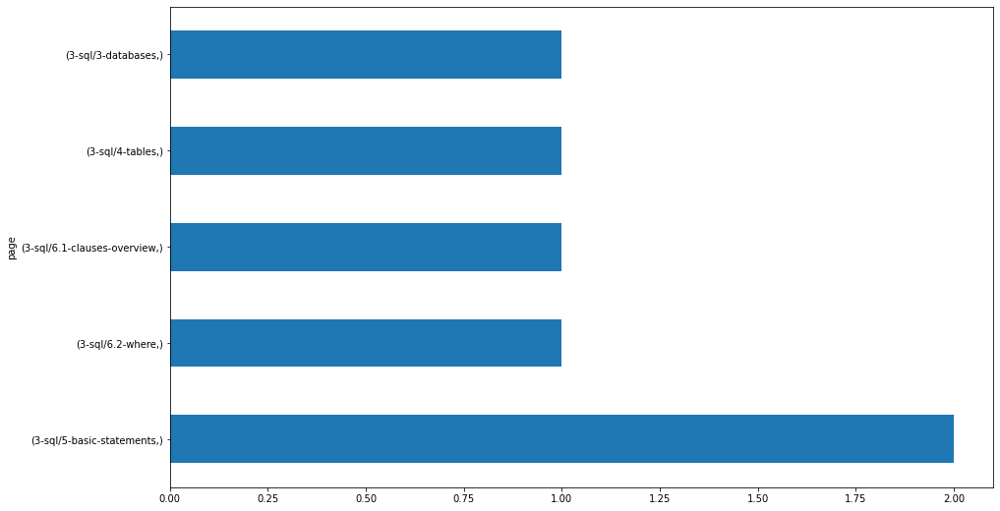


99.126.113.140
page                                             
6-regression/1-overview                              53
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    39
10-anomaly-detection/1-overview                      39
3-sql/1-mysql-overview                               32
5-stats/4.2-compare-means                            23
                                                     ..
13-advanced-topics/3.1-developing-data-products       1
5-stats/viz.py                                        1
3-sql/6.1-clauses-overview                            1
search/search_index.json                              1
sql/database-design                                   1
Length: 152, dtype: int64


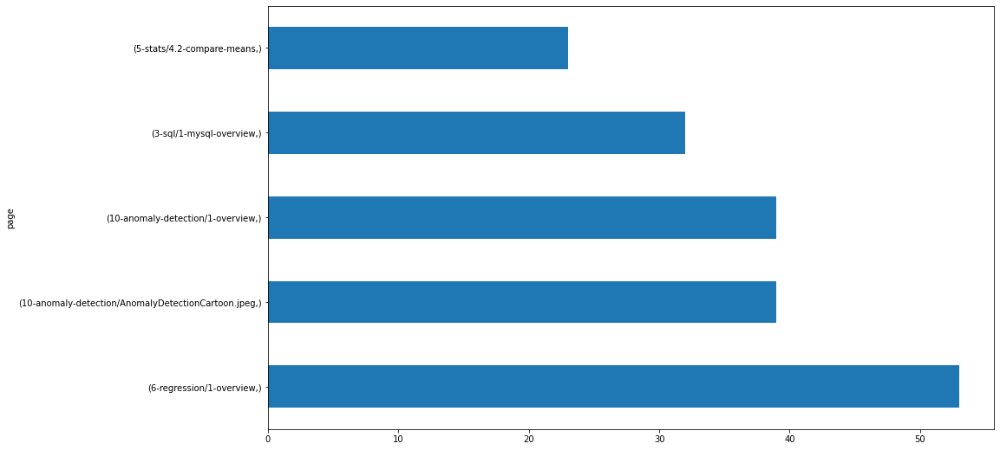


99.62.54.30
page                                         
5-stats/2-simulation                             5
5-stats/4.1-hypothesis-testing-overview          3
5-stats/1-overview                               3
/                                                3
5-stats/4.4-compare-group-membership             2
5-stats/4.3-correlation                          2
6-regression/8-project                           2
5-stats/3-probability-distributions              2
6-regression/1-overview                          2
5-stats/viz.py                                   1
5-stats/Selecting_a_hypothesis_test.svg          1
5-stats/4.5-more-statistical-testing-examples    1
6-regression/7-model                             1
4-python/8.4.4-advanced-dataframes               1
4-python/8.4.3-dataframes                        1
4-python/4-control-structures                    1
3-sql/6.1-clauses-overview                       1
7-classification/6.1-logistic-regression         1
dtype: int64


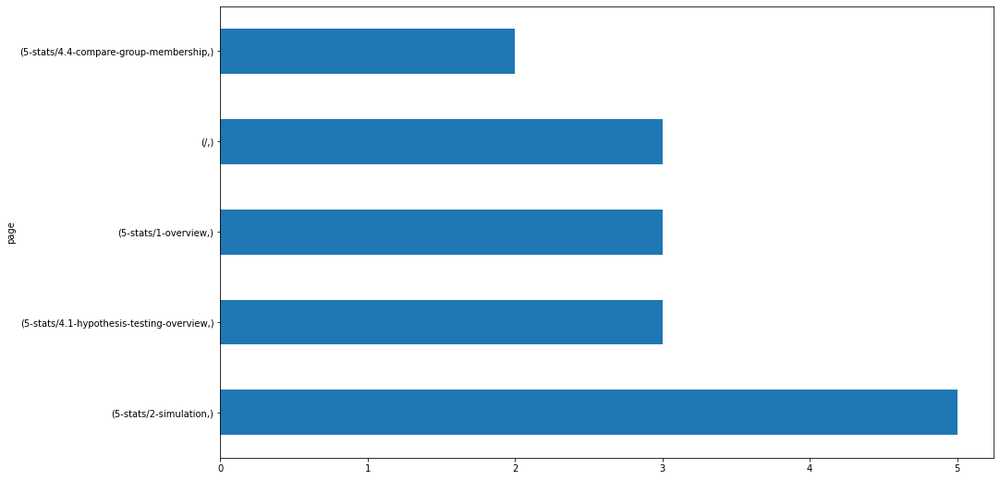


166.251.101.185
page                      
3-sql/6.3-order-by            2
3-sql/6.2-where               2
3-sql/7-functions             1
3-sql/6.4-limit               1
3-sql/6.1-clauses-overview    1
dtype: int64


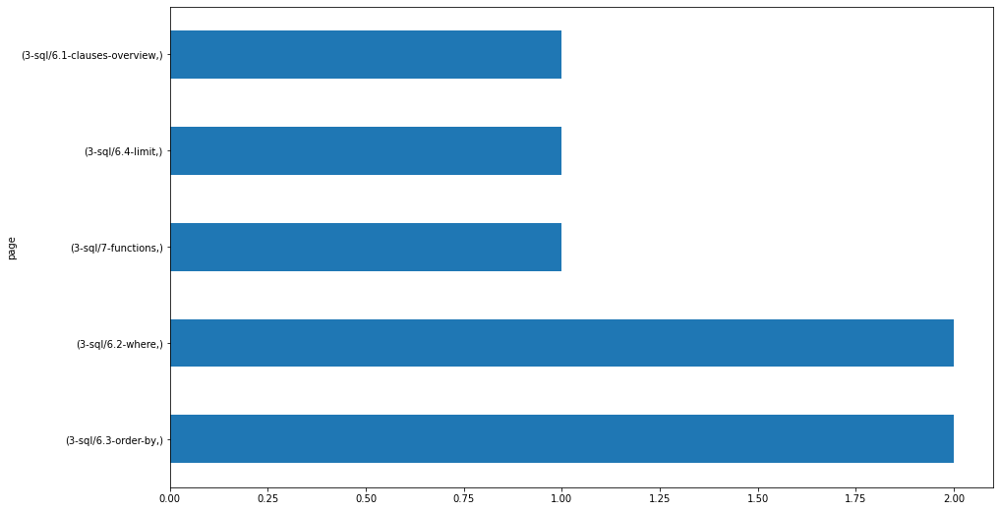


173.173.127.101
page                                 
/                                        4
3-sql/6.1-clauses-overview               3
3-sql/9.4-subqueries                     2
3-sql/9.3-joins                          1
3-sql                                    1
13-advanced-topics/3.5-html-templates    1
dtype: int64


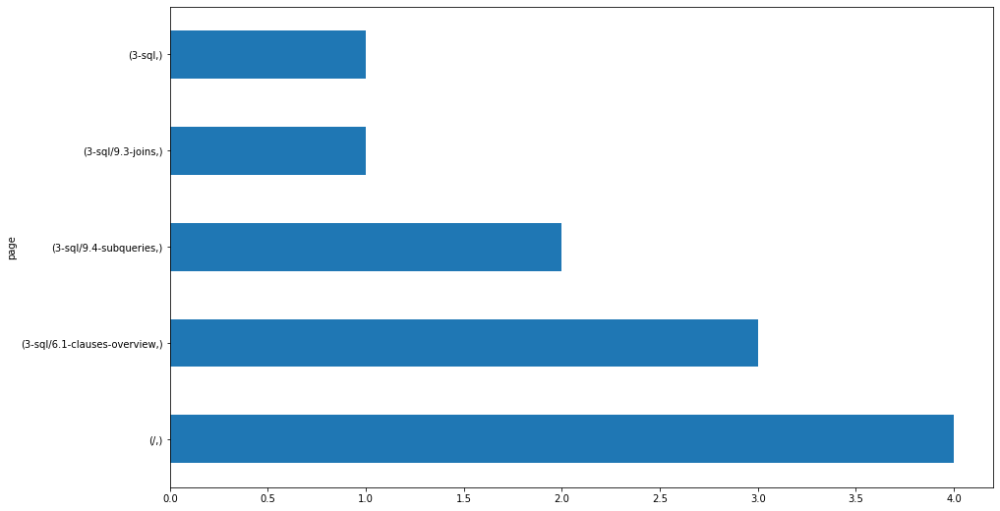


173.127.20.174
page             
3-sql/7-functions    2
dtype: int64


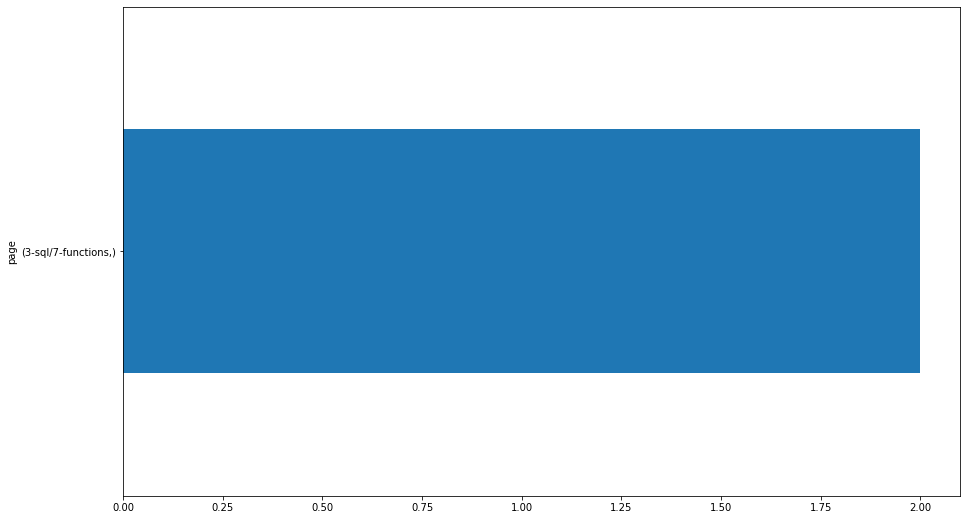


173.127.55.135
page                     
appendix/cli-git-overview    1
3-sql/6.4-limit              1
3-sql/6.3-order-by           1
/                            1
dtype: int64


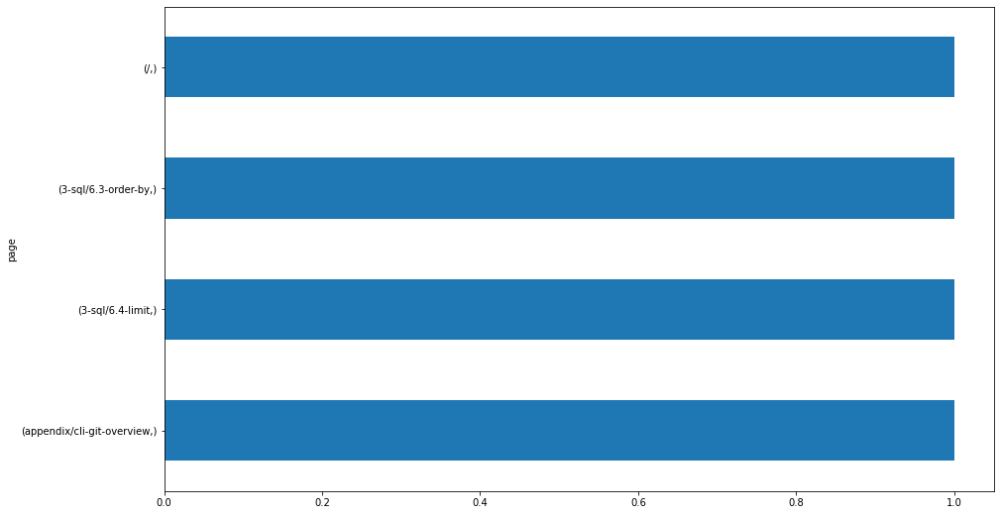


107.77.219.175
page           
3-sql/6.4-limit    1
dtype: int64


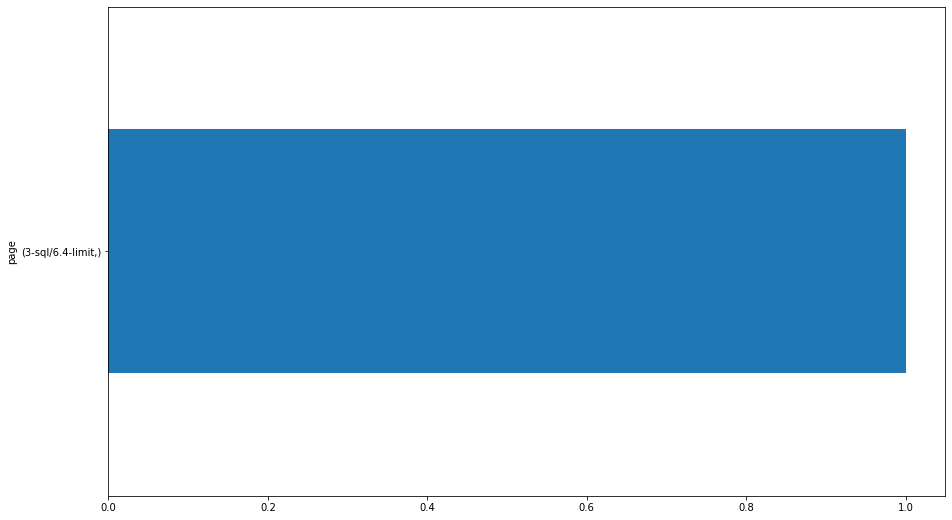


174.207.7.100
page             
3-sql/7-functions    1
dtype: int64


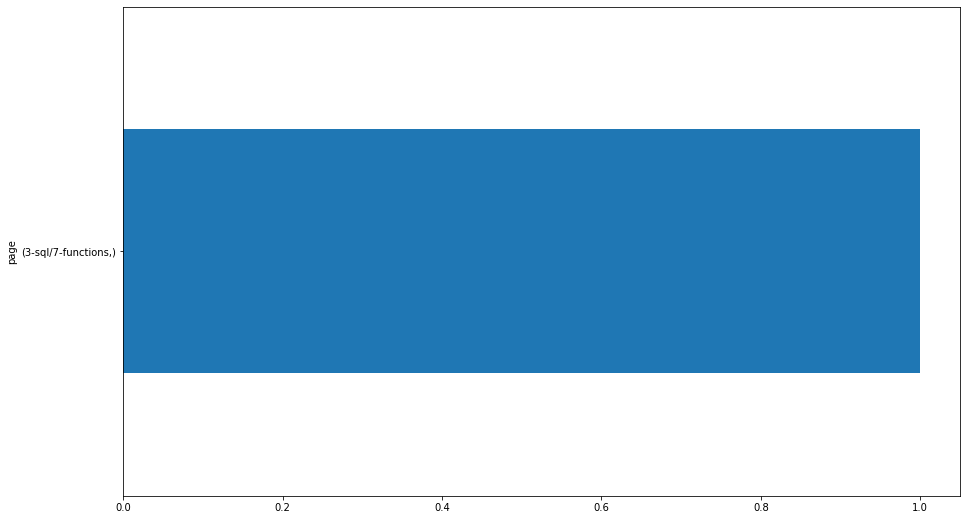


172.58.110.154
page              
3-sql/6.3-order-by    1
dtype: int64


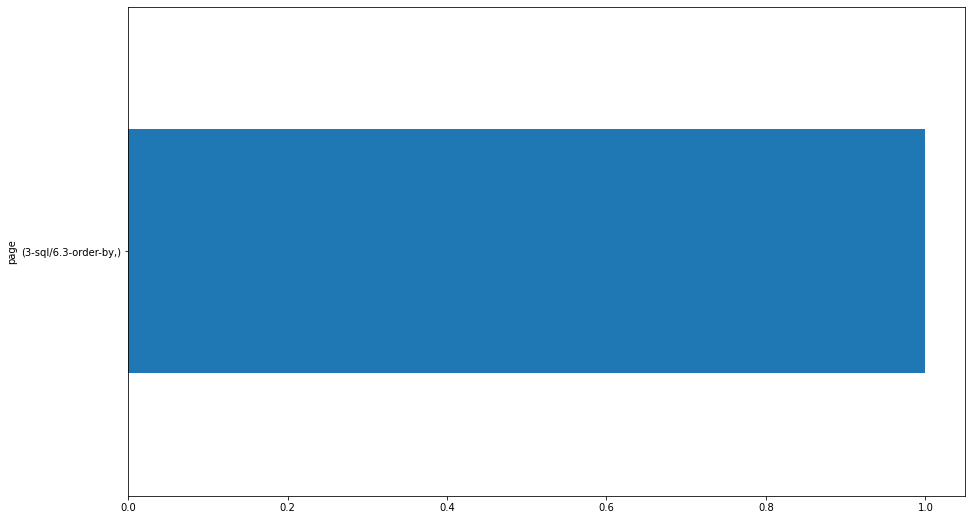


166.251.101.151
page                                       
3-sql/7-functions                              2
13-advanced-topics/1-tidy-data                 2
3-sql/6.4-limit                                1
3-sql/6.3-order-by                             1
3-sql/6.2-where                                1
3-sql/11-more-exercises                        1
3-sql/10-temporary-tables                      1
13-advanced-topics/3.8-json-responses          1
13-advanced-topics/3.7-styling-webpages        1
13-advanced-topics/3.6-html-forms              1
13-advanced-topics/3.5-html-templates          1
13-advanced-topics/3.4-intro-to-flask          1
13-advanced-topics/3.3-building-a-model        1
13-advanced-topics/3.2-virtual-environments    1
13-advanced-topics/2-cross-validation          1
dtype: int64


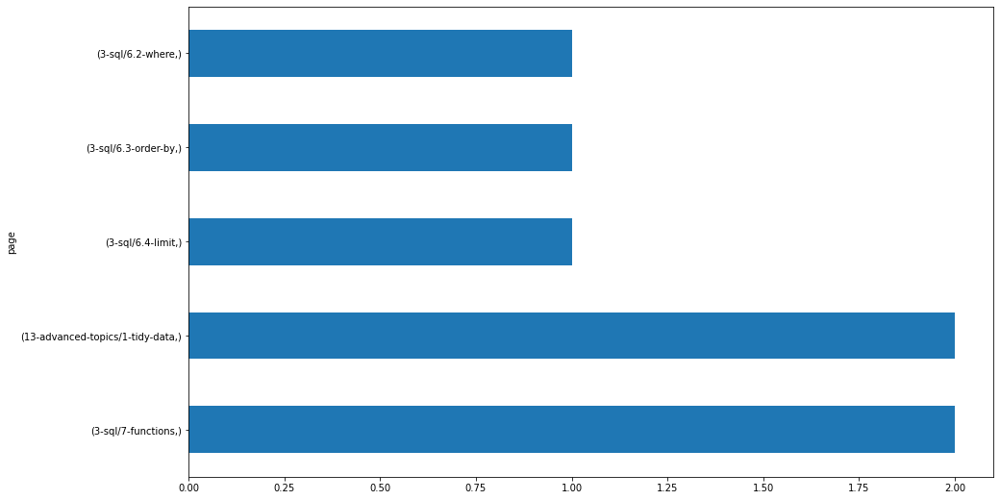


166.251.101.149
page                   
3-sql/7-functions          1
3-sql/11-more-exercises    1
dtype: int64


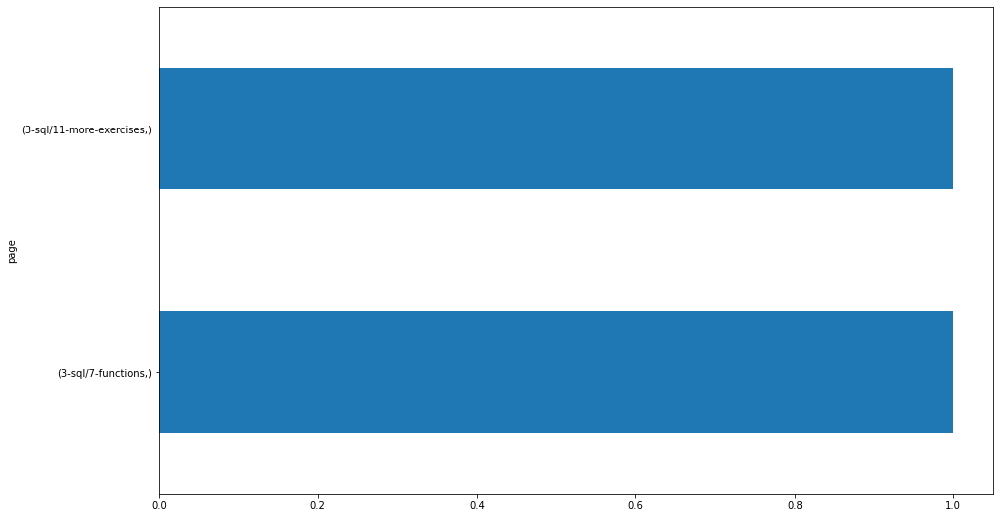


108.213.189.26
page             
3-sql/8-group-by     1
3-sql/7-functions    1
/                    1
dtype: int64


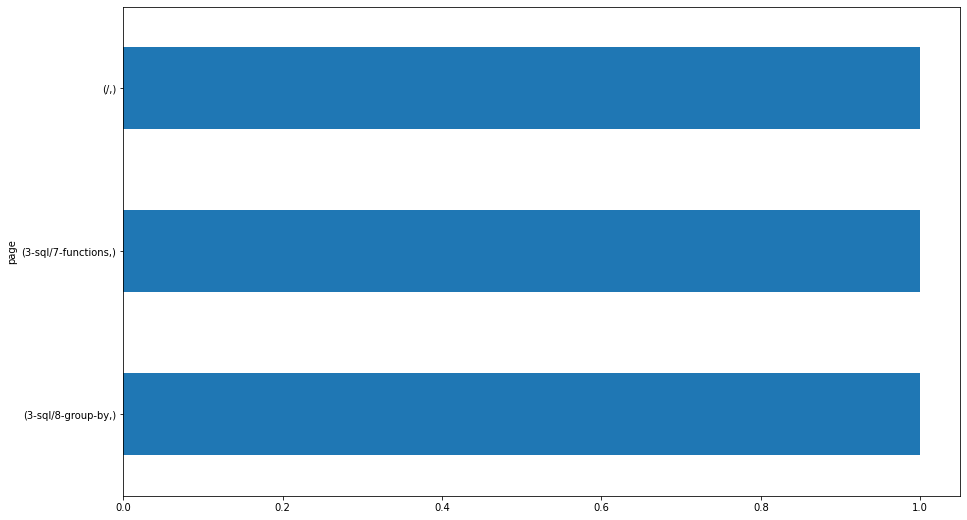


72.128.136.219
page                                             
3-sql/8-group-by                                     45
3-sql/7-functions                                    40
3-sql/9.3-joins                                      29
3-sql/9.2-indexes                                    28
3-sql/9.1-relationships-overview                     25
3-sql/6.2-where                                      15
3-sql/6.4-limit                                      10
3-sql/6.1-clauses-overview                            8
3-sql/6.3-order-by                                    6
search/search_index.json                              6
/                                                     6
appendix/cli-git-overview                             5
3-sql/5-basic-statements                              5
1-fundamentals/1.1-intro-to-data-science              4
1-fundamentals/AI-ML-DL-timeline.jpg                  4
1-fundamentals/modern-data-scientist.jpg              4
3-sql/database-design                 

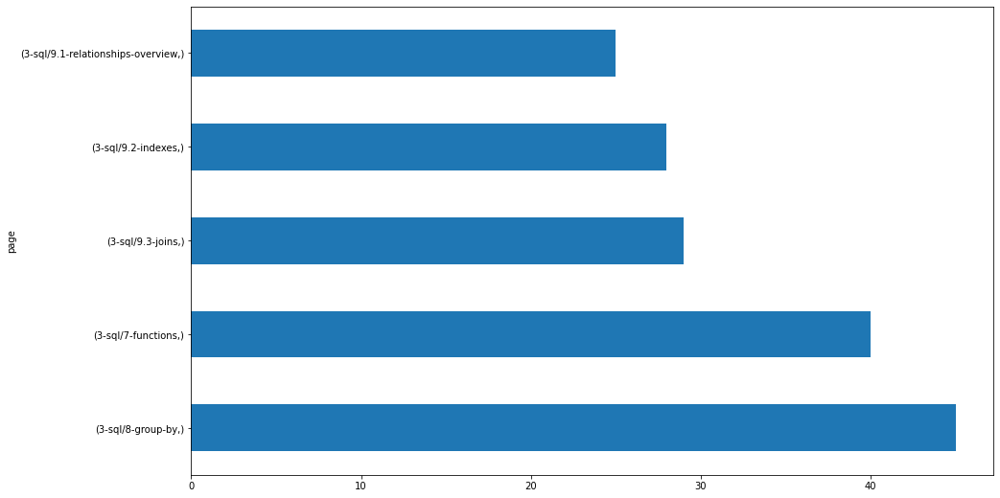


76.185.242.211
page                                   
/                                          7
6-regression/1-overview                    2
4-python/8.4.4-advanced-dataframes         2
5-stats/4.1-hypothesis-testing-overview    2
5-stats/3-probability-distributions        2
5-stats/4.3-correlation                    1
5-stats/4.2-compare-means                  1
6-regression/2.0-acquire-and-prep          1
6-regression/4.0-explore                   1
5-stats/2-simulation                       1
5-stats/1-overview                         1
4-python/8.5-intro-to-seaborn              1
6-regression/3.0-split-and-scale           1
4-python/8.4.3-dataframes                  1
4-python/5-functions                       1
3-sql/9.2-indexes                          1
6-regression/5.0-evaluate                  1
dtype: int64


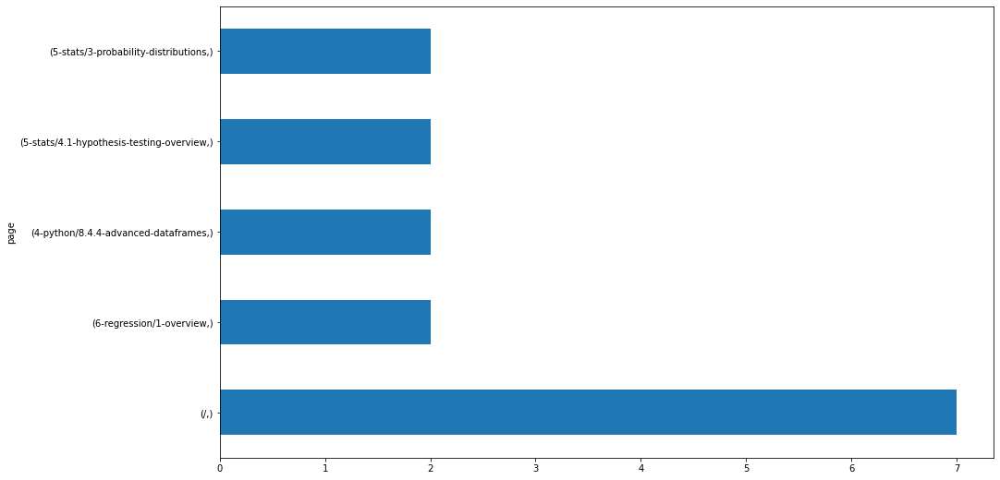


172.58.110.230
page             
3-sql/8-group-by     2
3-sql/7-functions    1
dtype: int64


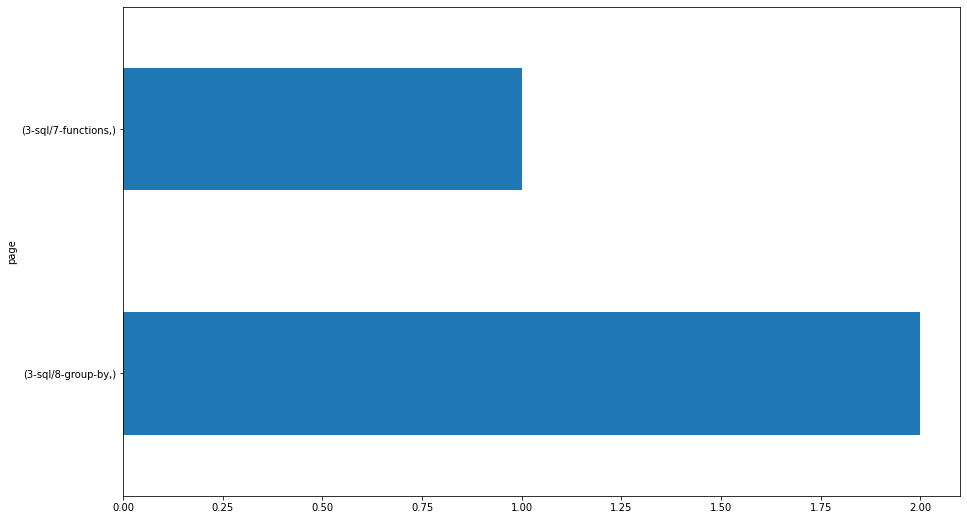


104.254.95.84
page                                    
appendix/cli-git-overview                   3
6-regression/1-overview                     1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
/                                           1
dtype: int64


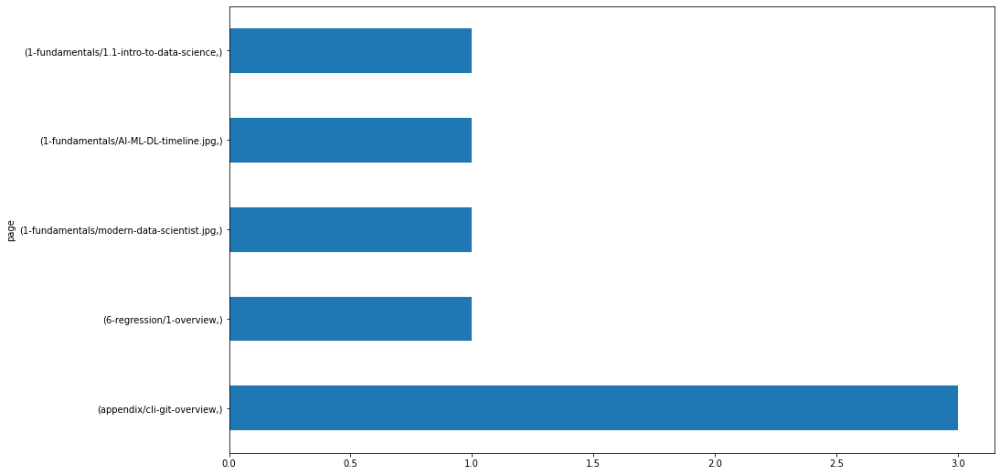


107.77.220.42
page                    
3-sql/11-case-statements    1
/                           1
dtype: int64


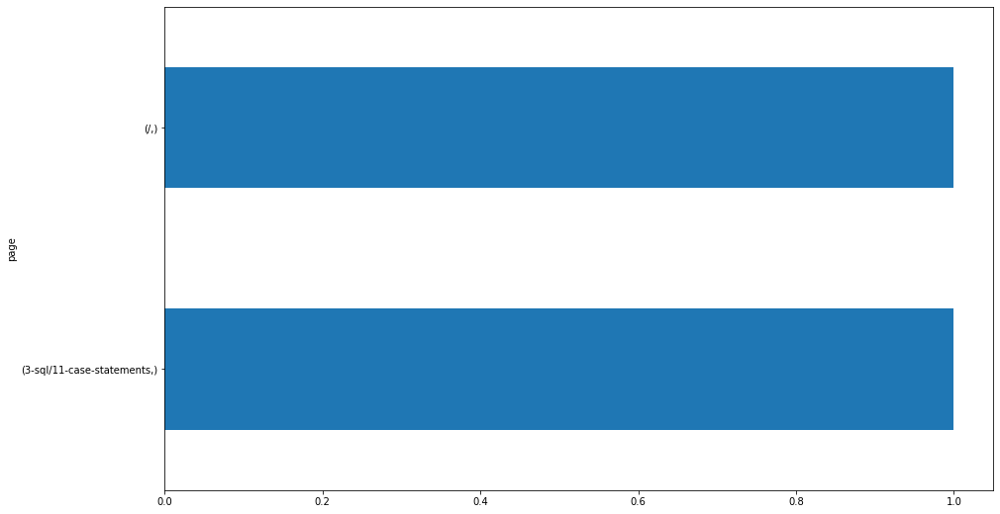


107.77.222.225
page                      
3-sql/11-case-statements      4
3-sql/7-functions             2
3-sql/2-mysql-introduction    2
3-sql/10-temporary-tables     2
3-sql/5-basic-statements      1
3-sql/4-tables                1
3-sql/3-databases             1
dtype: int64


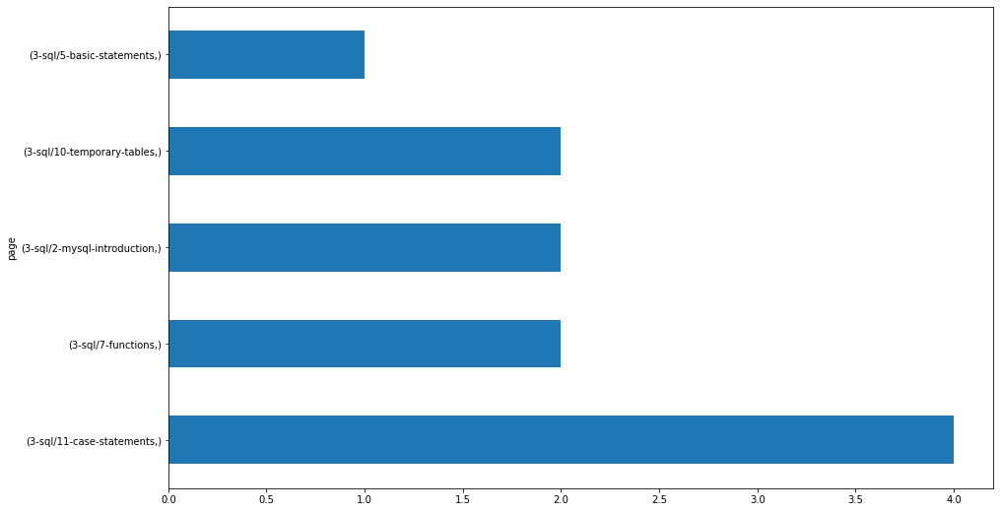


173.149.140.118
page                                         
appendix/cli/5-creating-files-and-directories    1
appendix/cli/3-file-paths                        1
appendix/cli/2-listing-files                     1
3-sql/2-mysql-introduction                       1
3-sql/1-mysql-overview                           1
dtype: int64


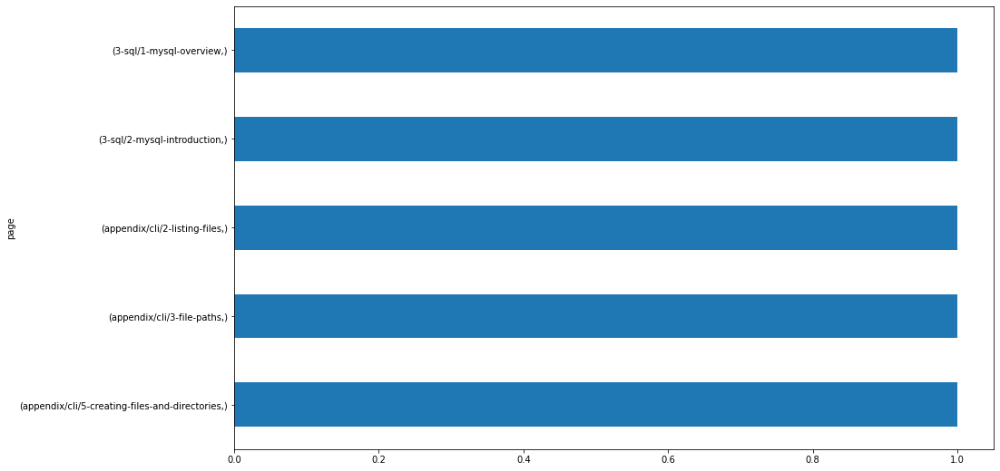


173.174.236.156
page                    
3-sql/3-databases           5
3-sql/4-tables              3
3-sql/5-basic-statements    1
dtype: int64


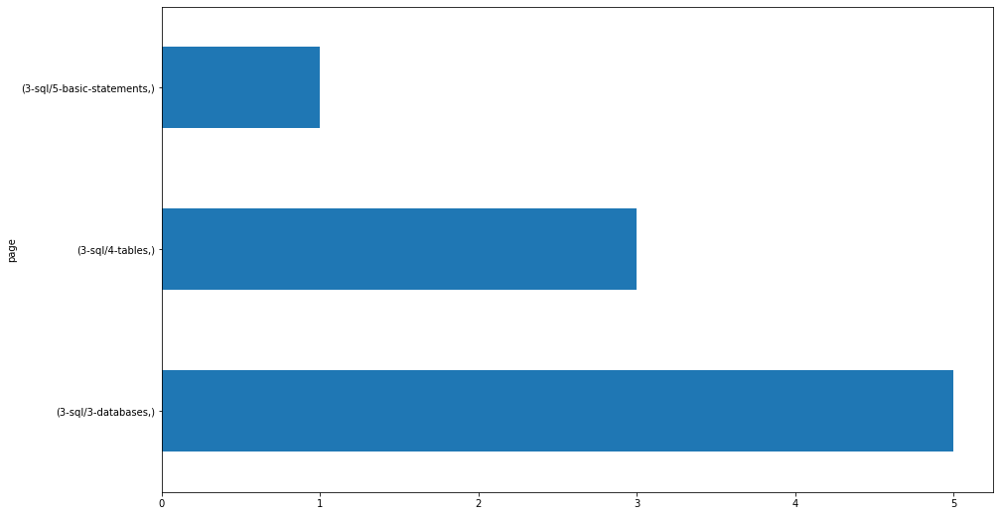


74.192.167.159
page                                           
/                                                  203
6-regression/1-overview                             37
search/search_index.json                            22
6-regression/7-model                                19
7-classification/6.1-logistic-regression            19
                                                  ... 
appendix/professional-development/offer-letters      1
3-sql/5-basic-statements                             1
3-sql/4-tables                                       1
sql/database-design                                  1
%20https://github.com/RaulCPena                      1
Length: 142, dtype: int64


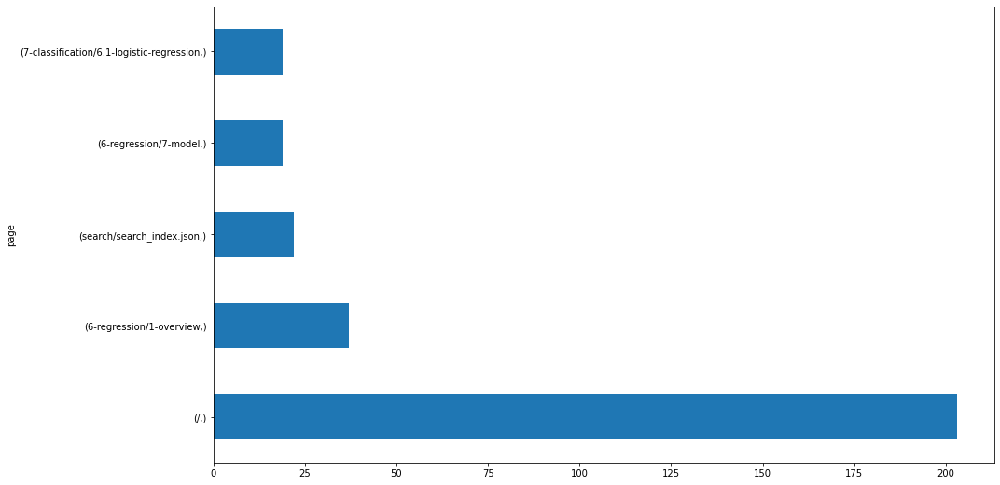


71.42.140.139
page          
3-sql/4-tables    1
dtype: int64


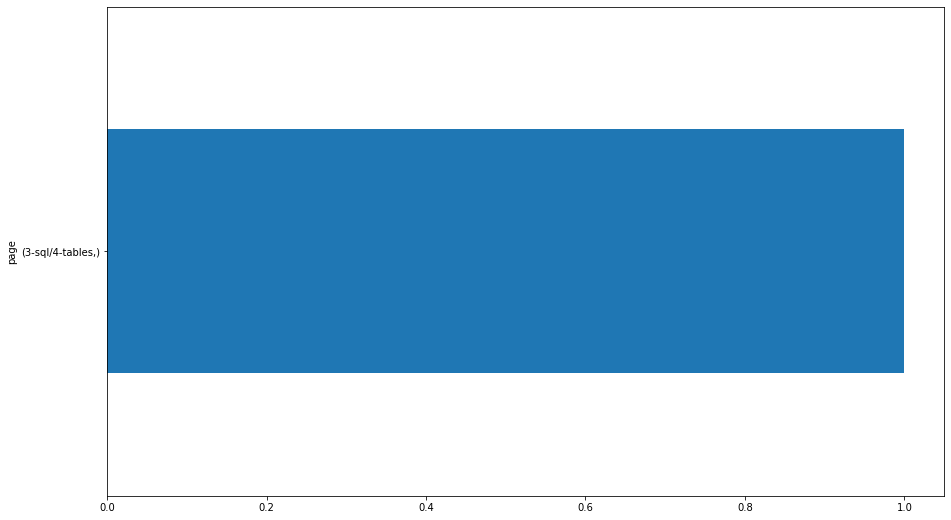


107.77.217.94
page                   
3-sql/12-more-exercises    2
3-sql/9.4-subqueries       1
3-sql/9.3-joins            1
dtype: int64


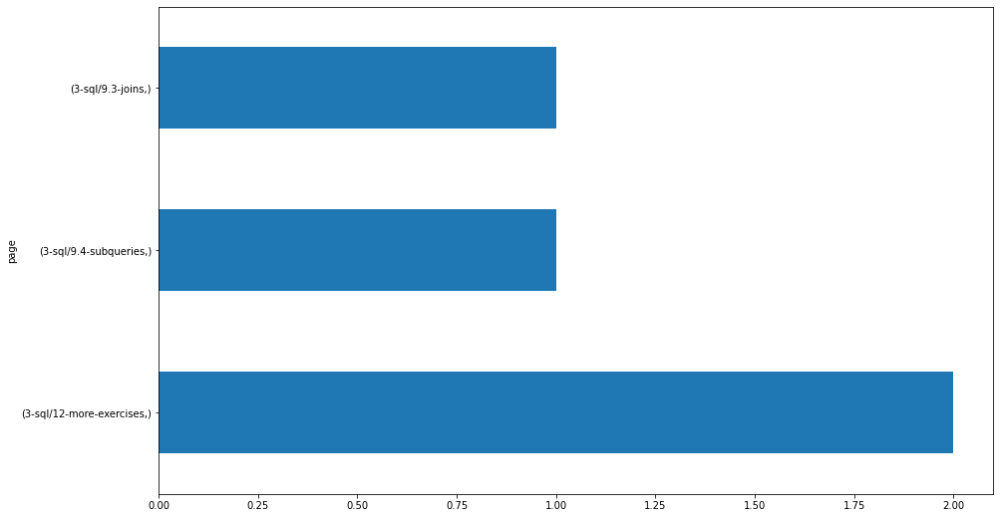


172.58.107.143
page                     
3-sql/12-more-exercises      3
3-sql/10-temporary-tables    2
3-sql/9.3-joins              1
3-sql/8-group-by             1
dtype: int64


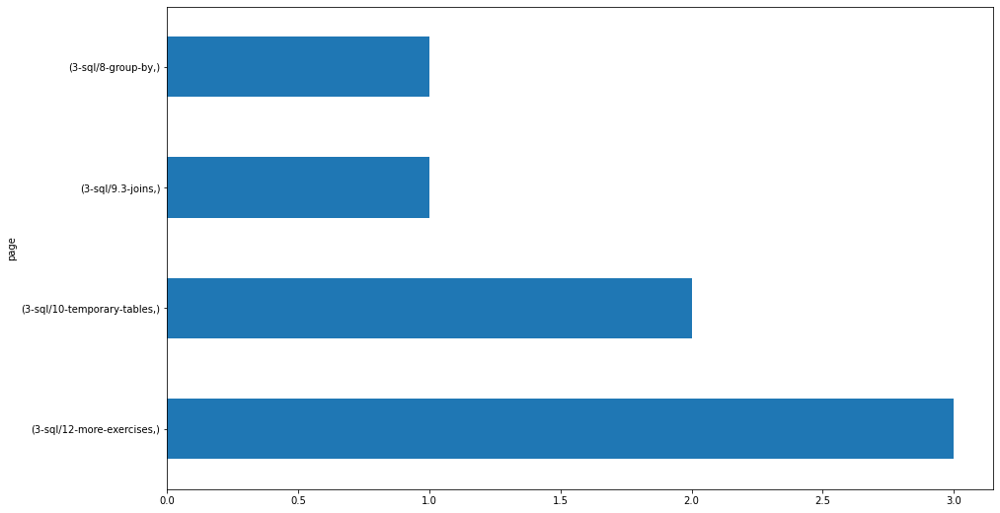


107.77.222.197
page                    
search/search_index.json    1
dtype: int64


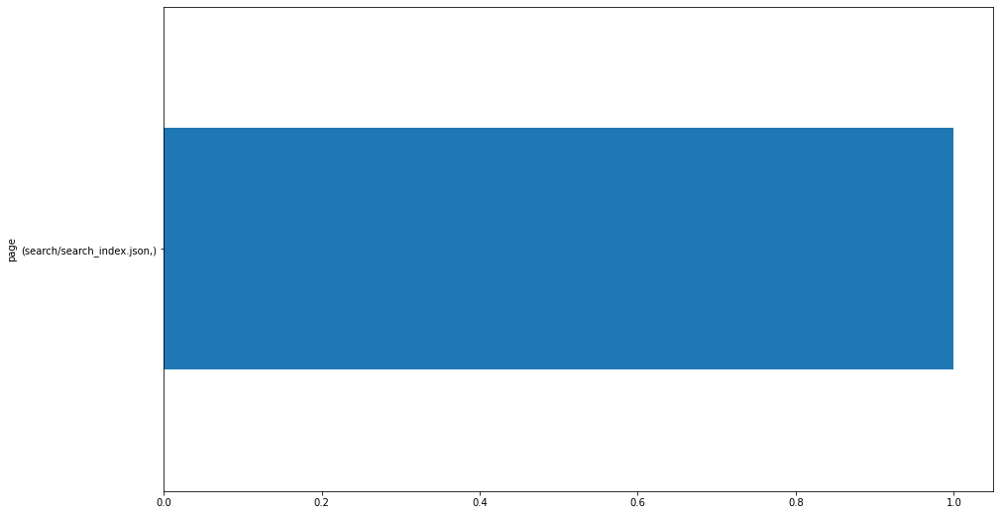


173.127.123.225
page                            
3-sql/9.3-joins                     1
3-sql/9.2-indexes                   1
3-sql/9.1-relationships-overview    1
3-sql/8-group-by                    1
dtype: int64


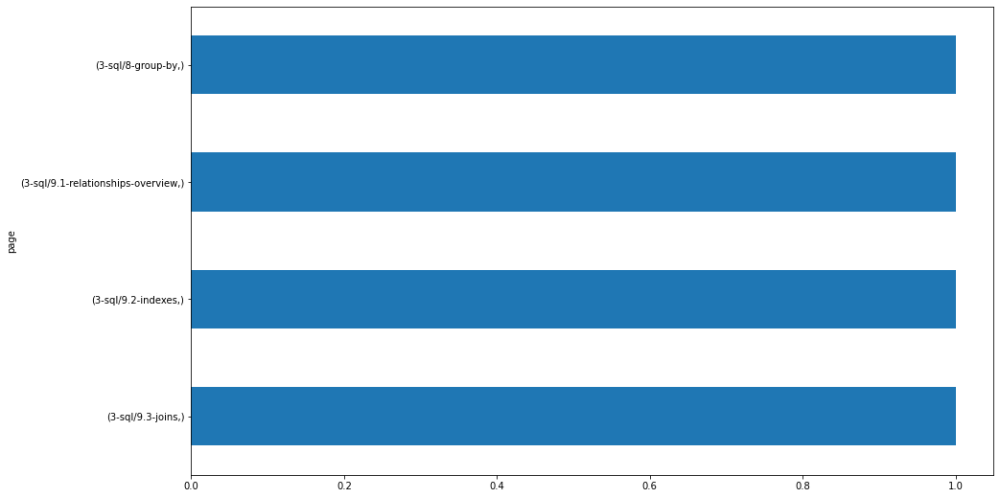


166.251.101.164
page                               
3-sql/12-more-exercises                2
4-python/3-data-types-and-variables    1
4-python/2-introduction-to-python      1
4-python/1-overview                    1
dtype: int64


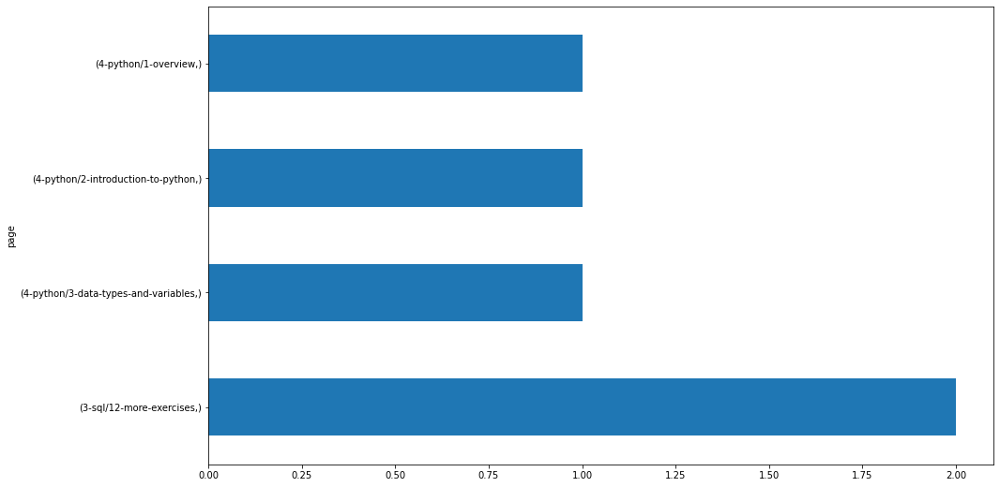


174.246.197.16
page                      
3-sql/2-mysql-introduction    2
3-databases                   2
3-sql/4-tables                1
3-sql/3-databases             1
dtype: int64


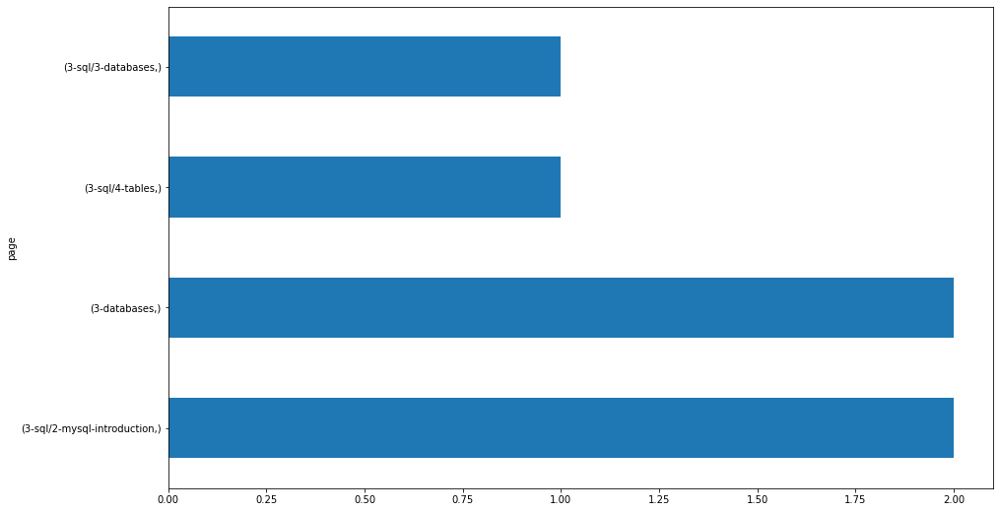


107.77.217.156
page                               
4-python/4-control-structures          2
appendix/documentation                 1
4-python/5-functions                   1
4-python/3-data-types-and-variables    1
/                                      1
dtype: int64


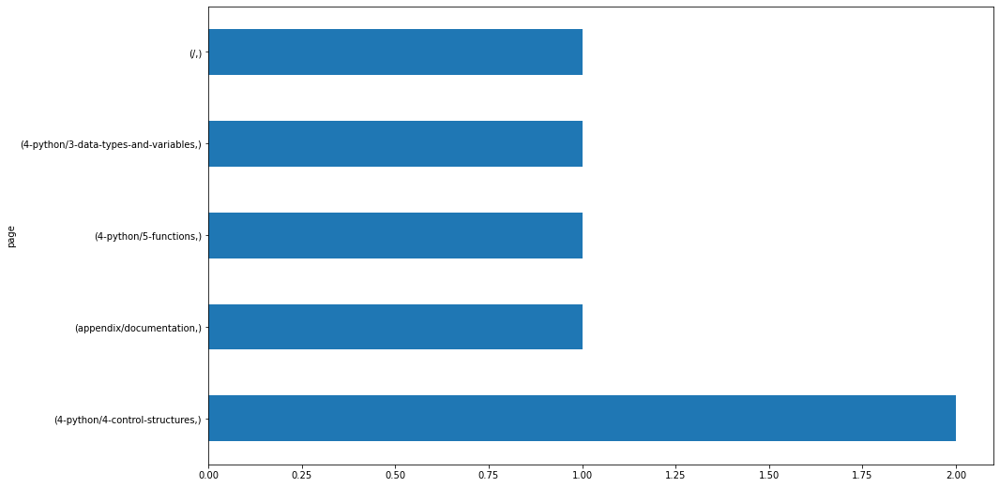


173.149.192.220
page                               
4-python/3-data-types-and-variables    2
dtype: int64


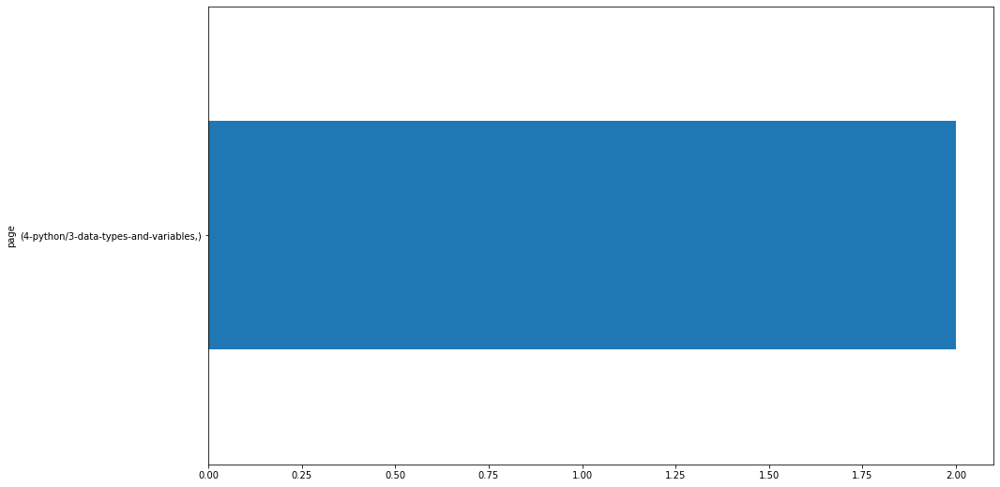


172.58.107.245
page                               
4-python/3-data-types-and-variables    1
4-python/2-introduction-to-python      1
dtype: int64


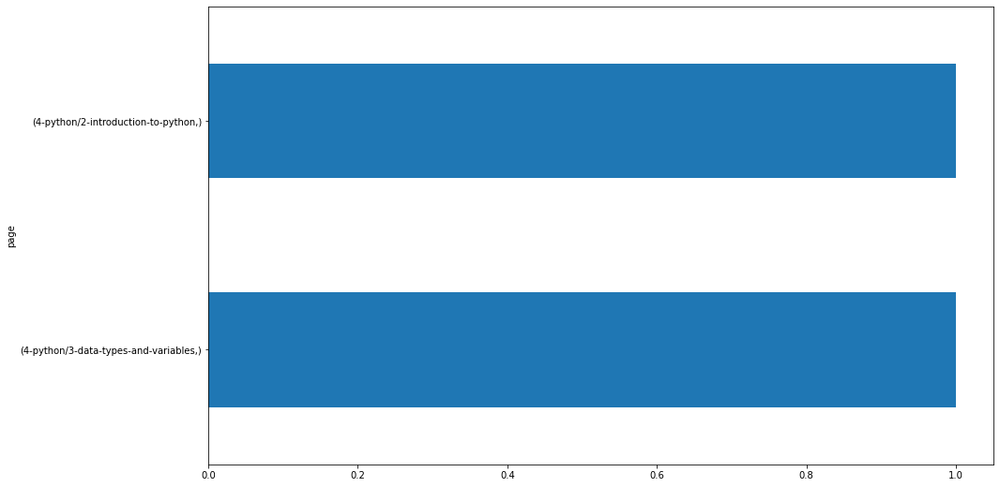


172.58.110.199
page                               
4-python/3-data-types-and-variables    1
4-python/1-overview                    1
dtype: int64


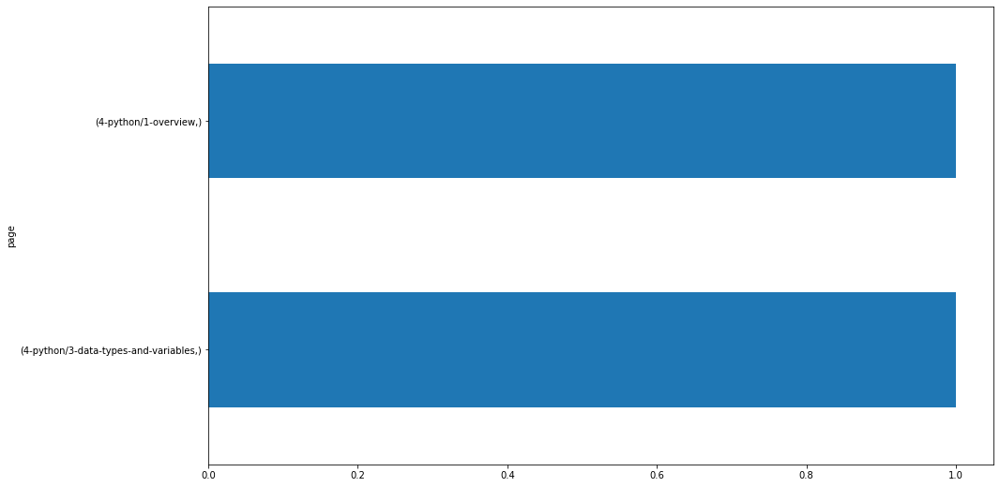


174.246.193.205
page                               
4-python/3-data-types-and-variables    1
/                                      1
dtype: int64


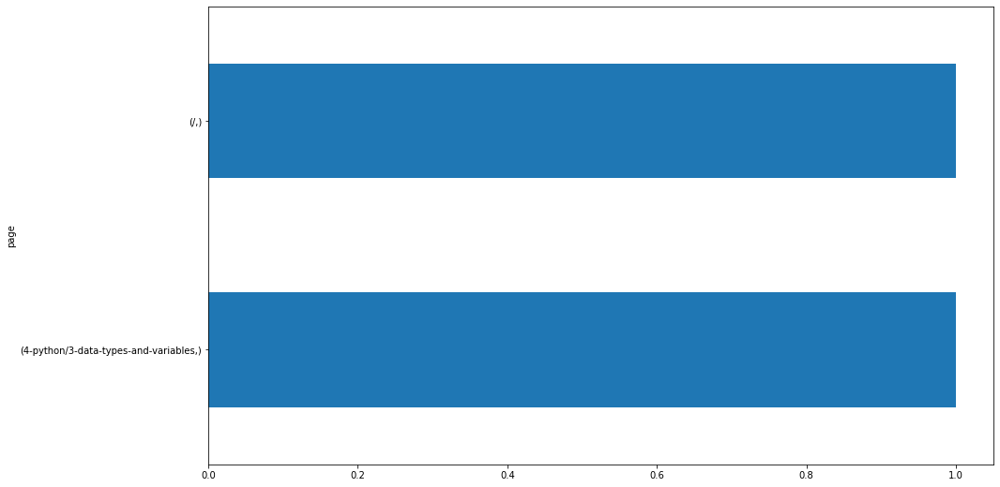


172.58.110.184
page
/       1
dtype: int64


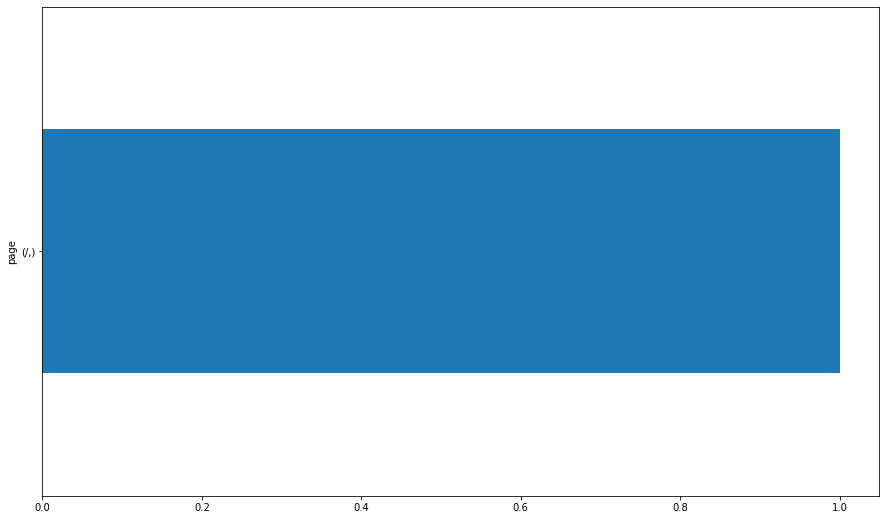


162.197.46.150
page                               
4-python/4-control-structures          2
4-python/5-functions                   1
4-python/3-data-types-and-variables    1
dtype: int64


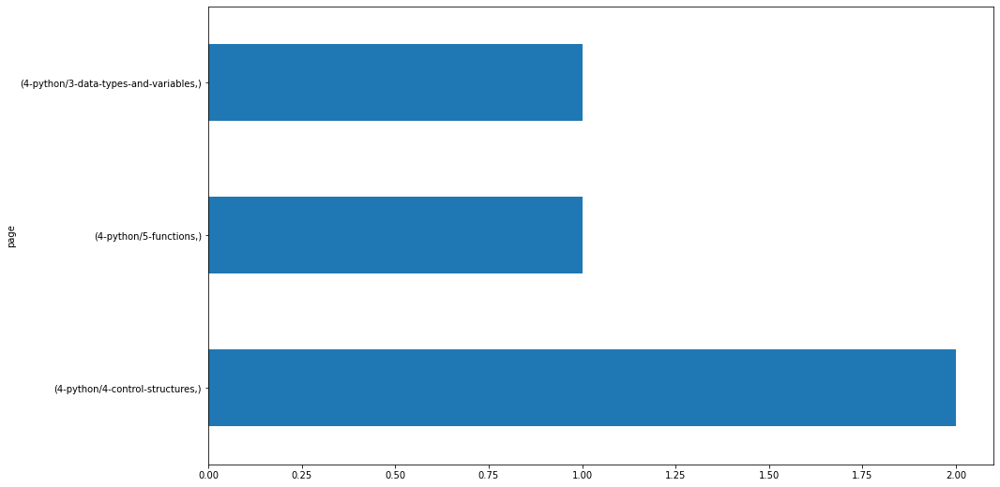


166.251.101.21
page                         
4-python/4-control-structures    1
dtype: int64


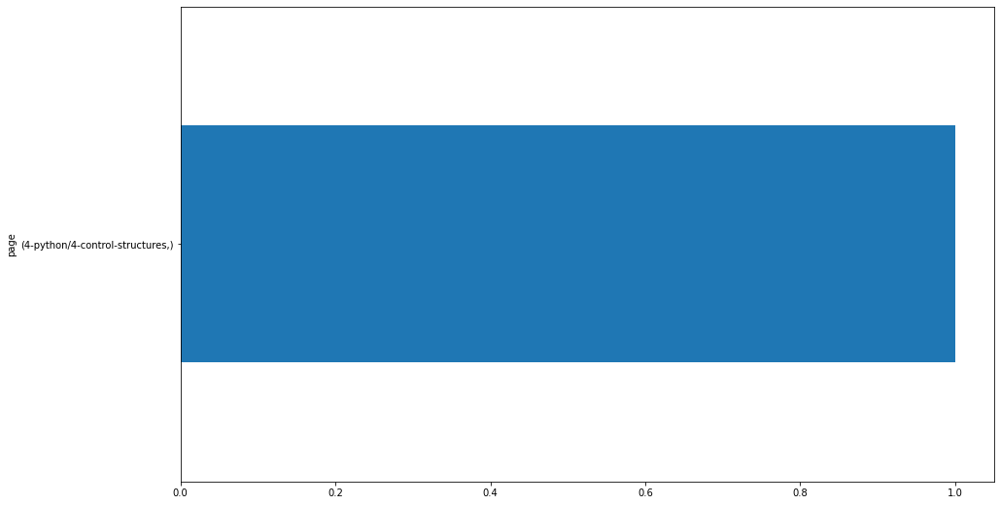


184.226.71.155
page                               
appendix/cli-git-overview              1
4-python/3-data-types-and-variables    1
/                                      1
dtype: int64


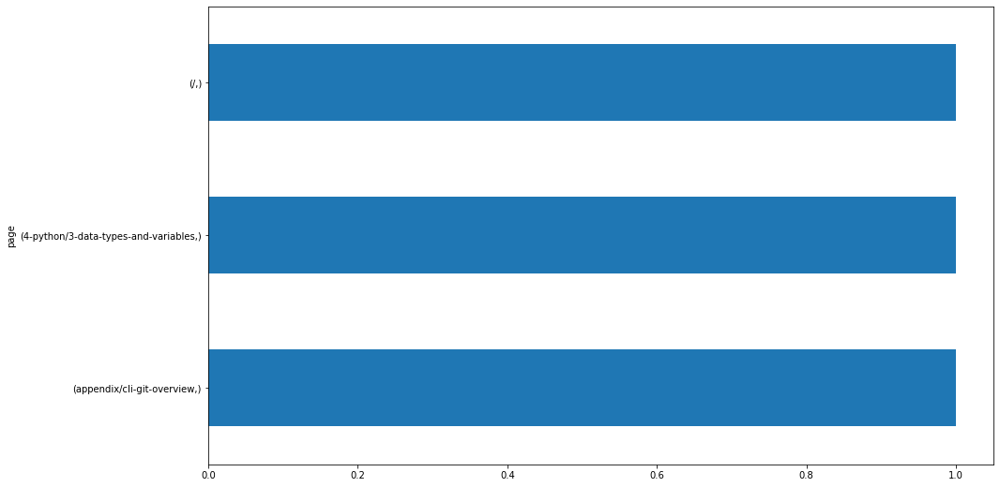


172.58.107.89
page                         
4-python/4-control-structures    1
dtype: int64


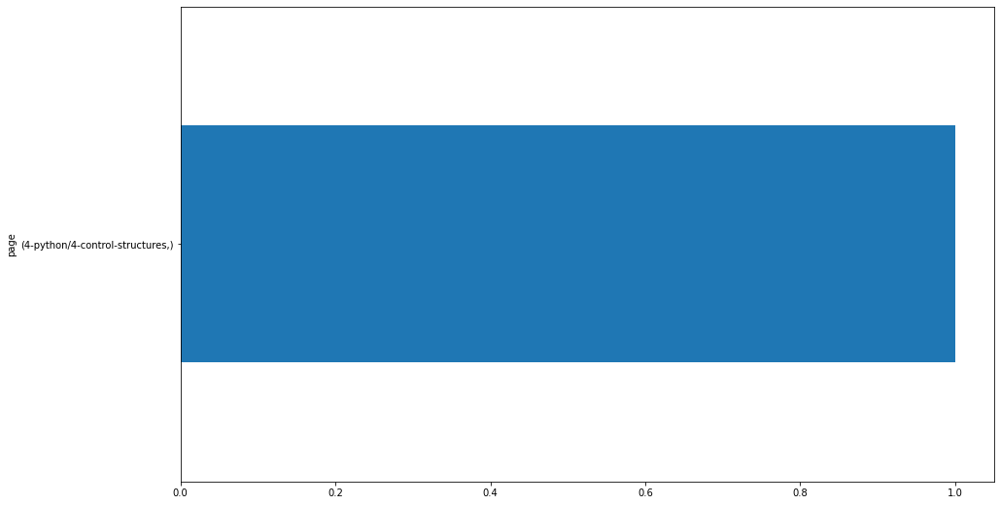


172.58.107.35
page                               
4-python/3-data-types-and-variables    1
dtype: int64


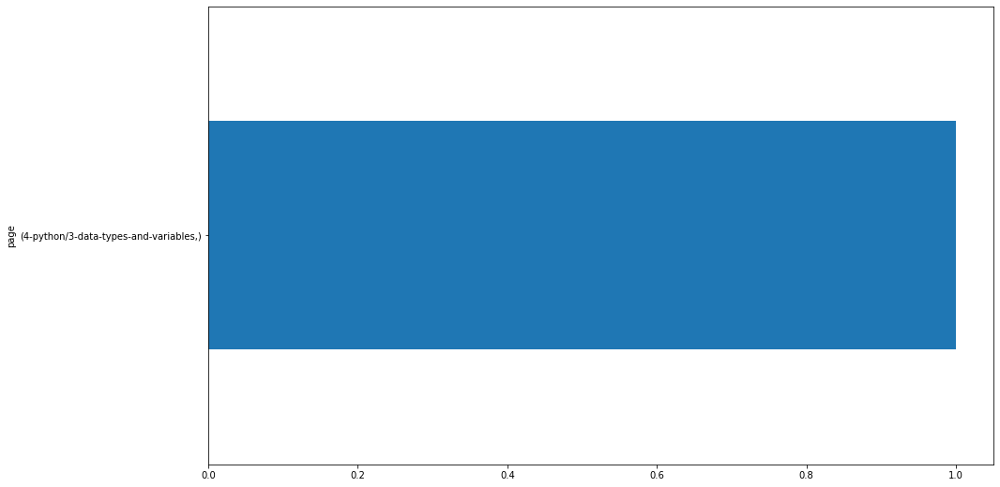


107.77.221.82
page
/       1
dtype: int64


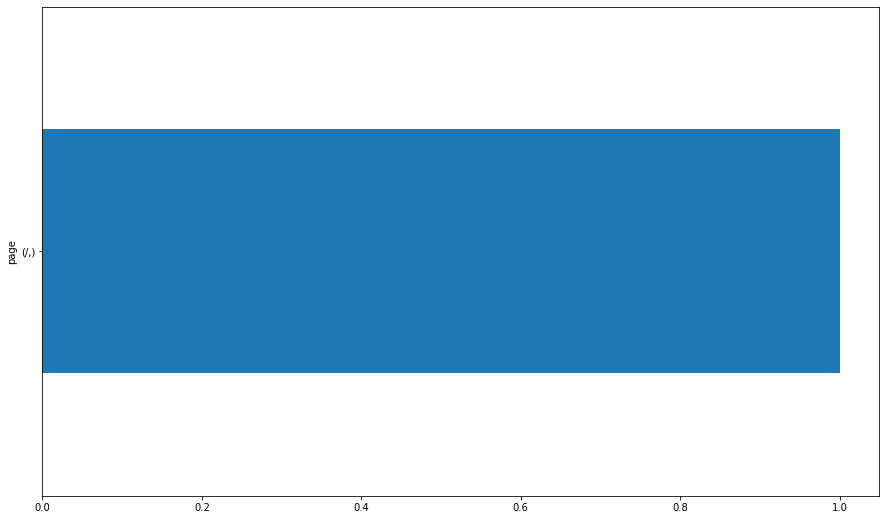


107.77.221.160
page                               
4-python/3-data-types-and-variables    1
dtype: int64


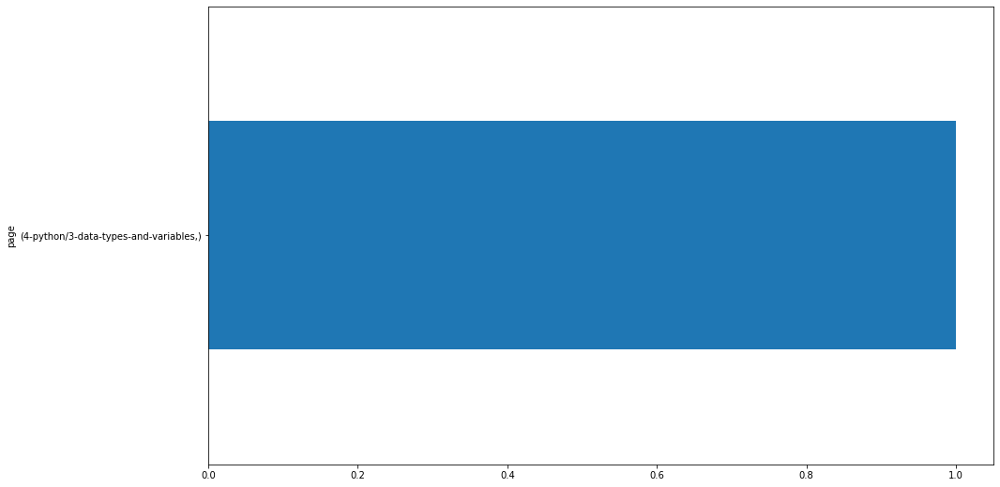


67.10.169.6
page                                
/                                       12
6-regression/1-overview                 11
search/search_index.json                 6
9-timeseries/5.1-modeling-lesson1        5
10-anomaly-detection/1-overview          4
                                        ..
fundamentals/DataToAction_v2.jpg         1
5-stats/viz.py                           1
5-stats/4.4-compare-group-membership     1
5-stats/4.2-compare-means                1
sql/mysql-overview                       1
Length: 90, dtype: int64


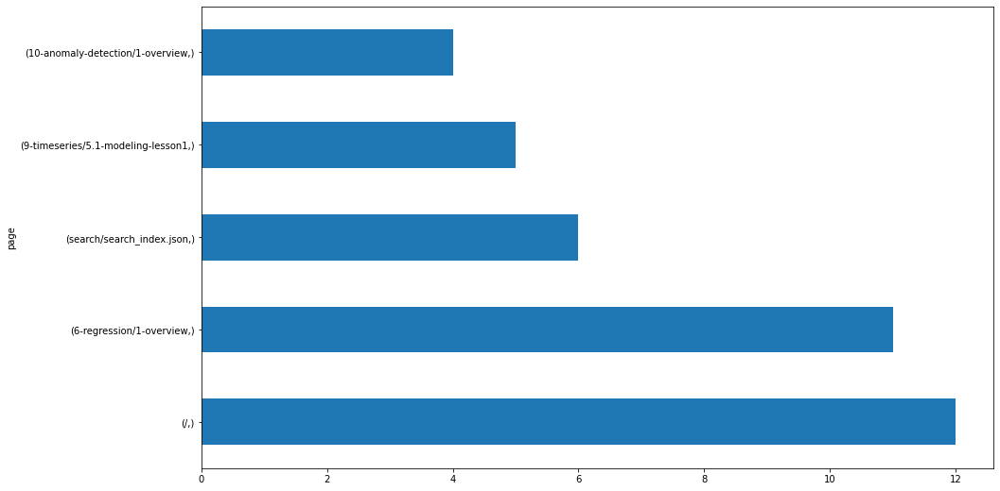


173.174.248.10
page                     
3-sql/10-temporary-tables    2
3-sql/7-functions            1
3-sql/4-tables               1
dtype: int64


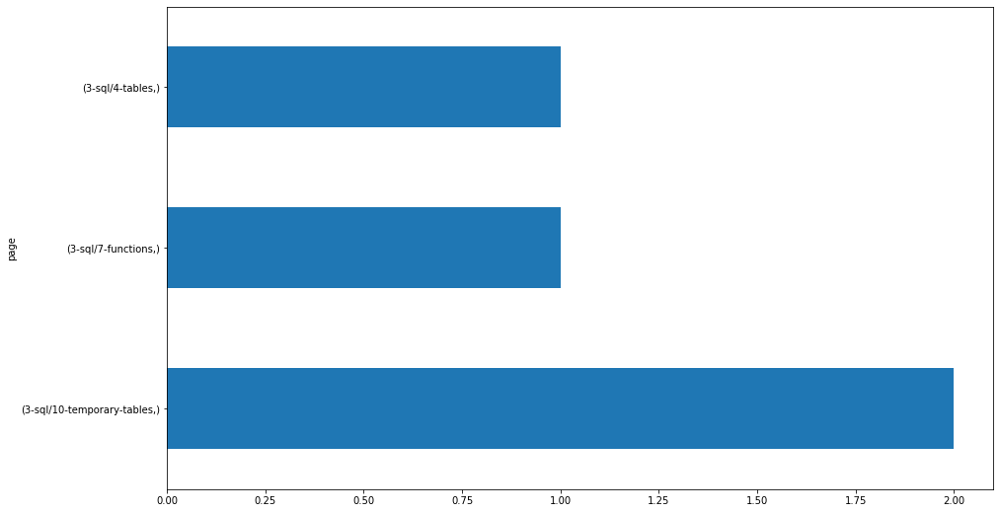


166.251.106.113
page                               
search/search_index.json               1
4-python/4-control-structures          1
4-python/3-data-types-and-variables    1
dtype: int64


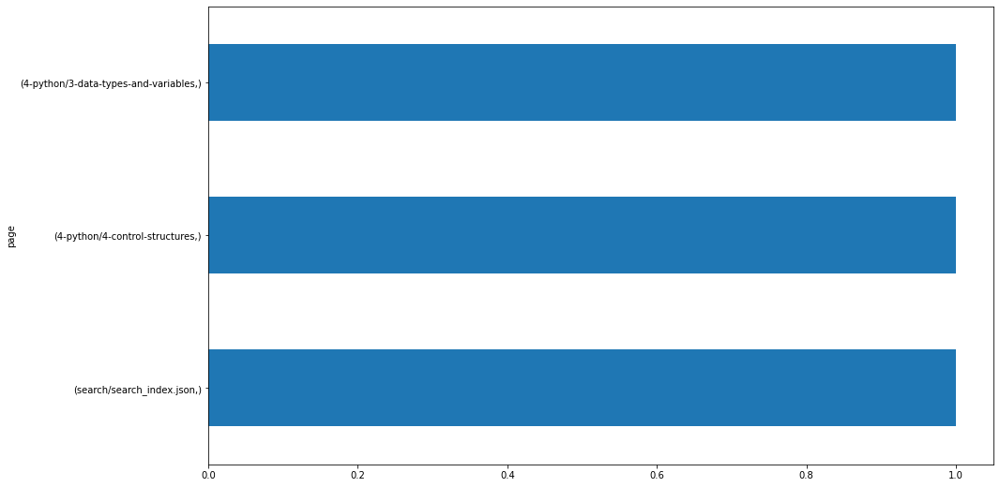


107.77.221.127
page                               
4-python/4-control-structures          1
4-python/3-data-types-and-variables    1
dtype: int64


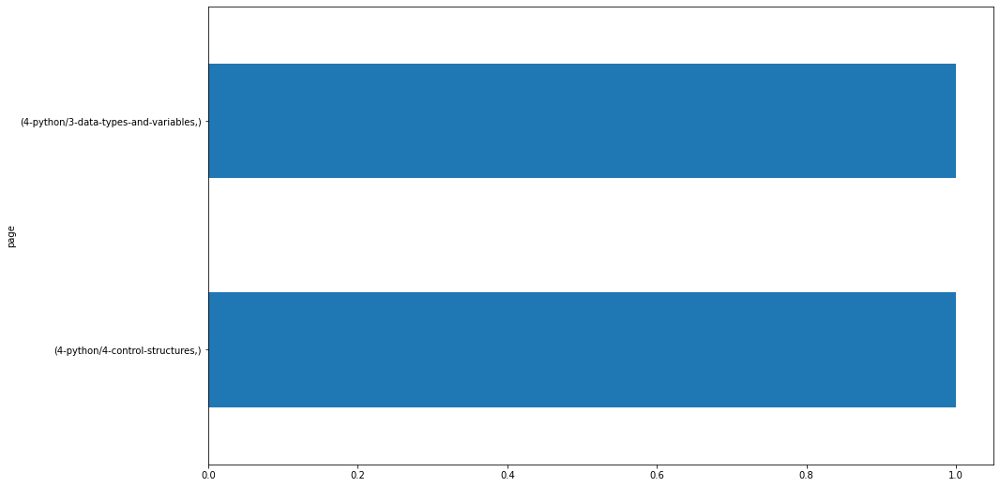


166.251.101.195
page                
4-python/5-functions    2
4-python/6-imports      1
dtype: int64


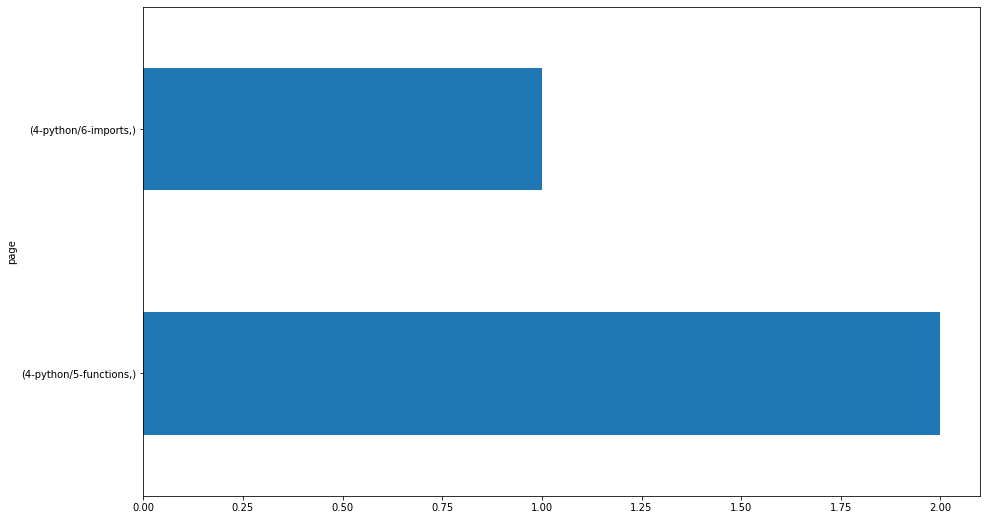


12.5.63.210
page                                    
7-classification/6.1-logistic-regression    1
dtype: int64


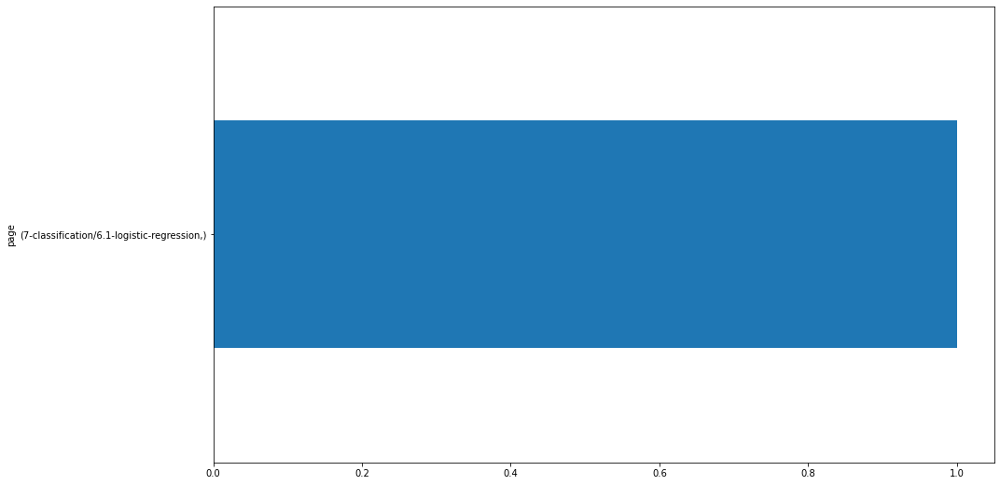


70.94.160.147
page                                
5-stats/4.4-compare-group-membership    2
5-stats/4.3-correlation                 2
5-stats/4.2-compare-means               2
appendix/cli-git-overview               1
3-sql/1-mysql-overview                  1
dtype: int64


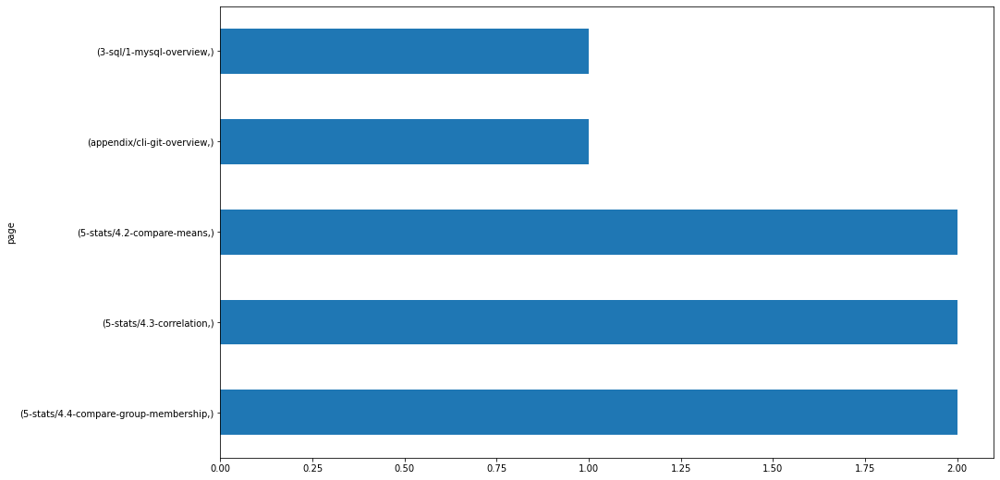


70.117.71.59
page                              
4-python/5-functions                  2
4-python/8.4.4-advanced-dataframes    1
4-python/6-imports                    1
4-python/4-control-structures         1
4-python/2-introduction-to-python     1
4-python/1-overview                   1
3-sql/1-mysql-overview                1
dtype: int64


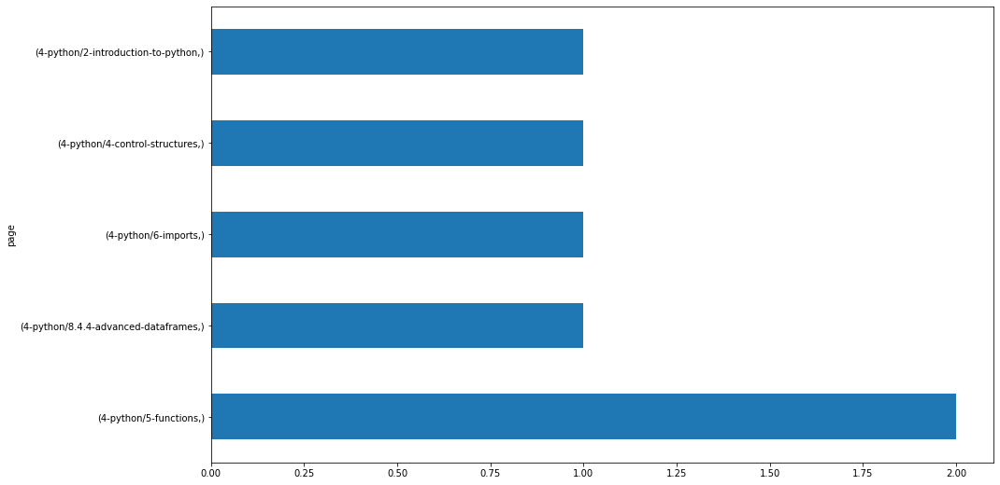


70.117.30.148
page                
4-python/5-functions    1
dtype: int64


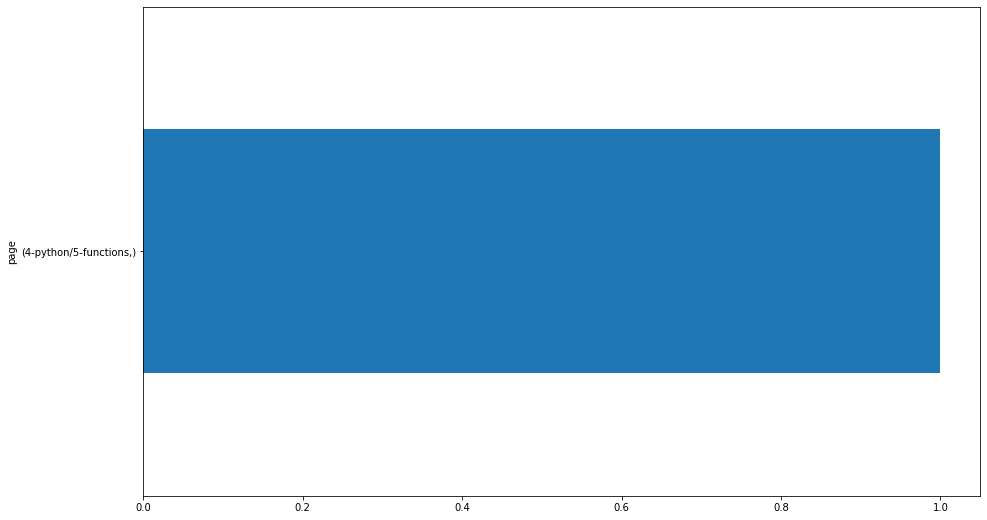


173.149.224.202
page                
4-python/6-imports      1
4-python/5-functions    1
dtype: int64


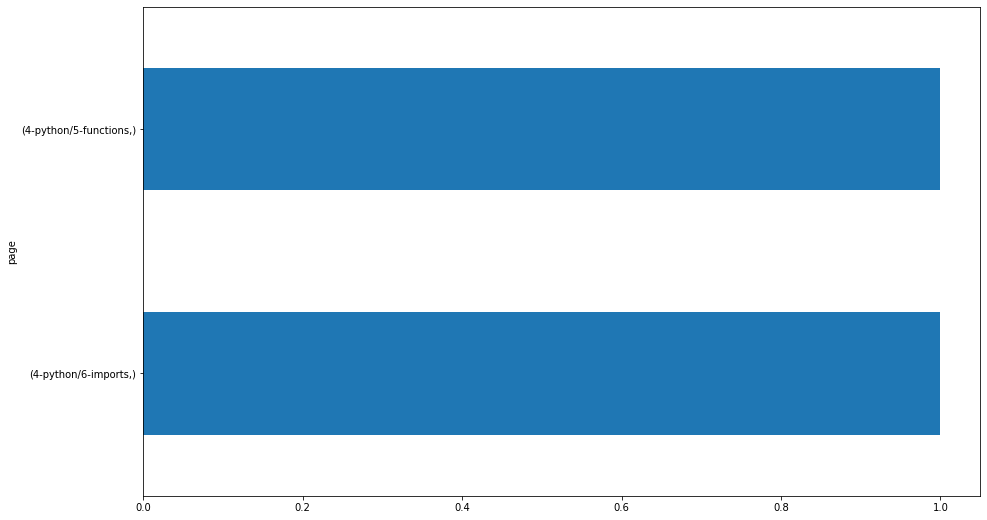


166.251.101.225
page                
4-python/6-imports      1
4-python/5-functions    1
dtype: int64


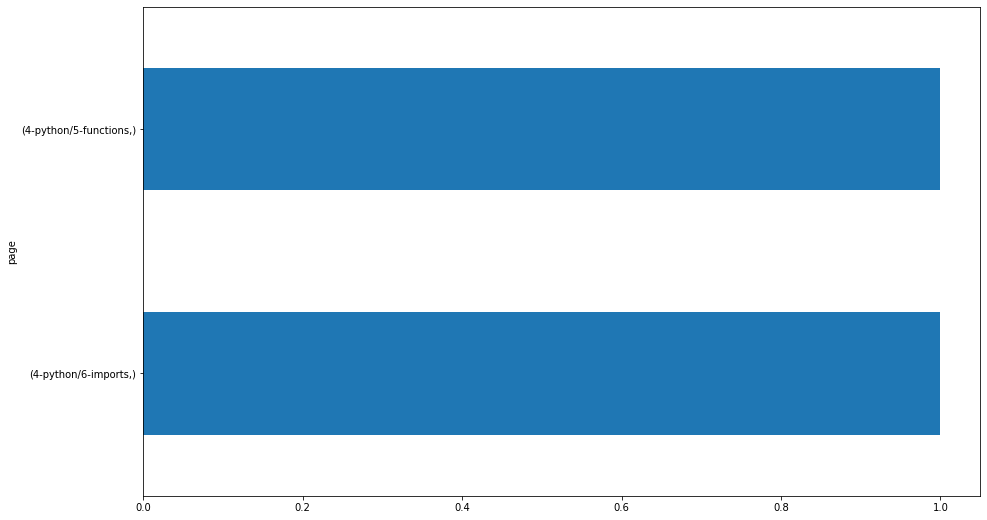


174.207.0.84
page                                 
search/search_index.json                 1
12-distributed-ml/2-environment-setup    1
/                                        1
dtype: int64


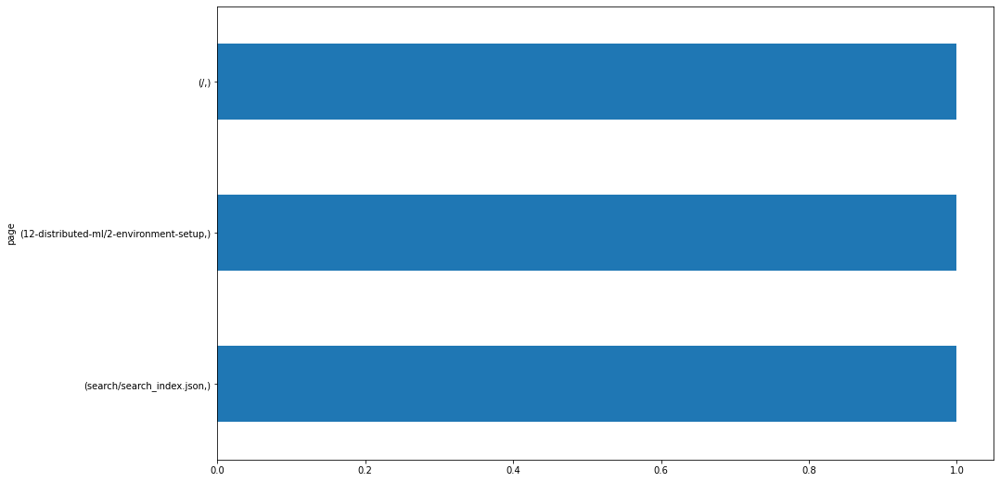


173.149.239.160
page                
4-python/5-functions    1
dtype: int64


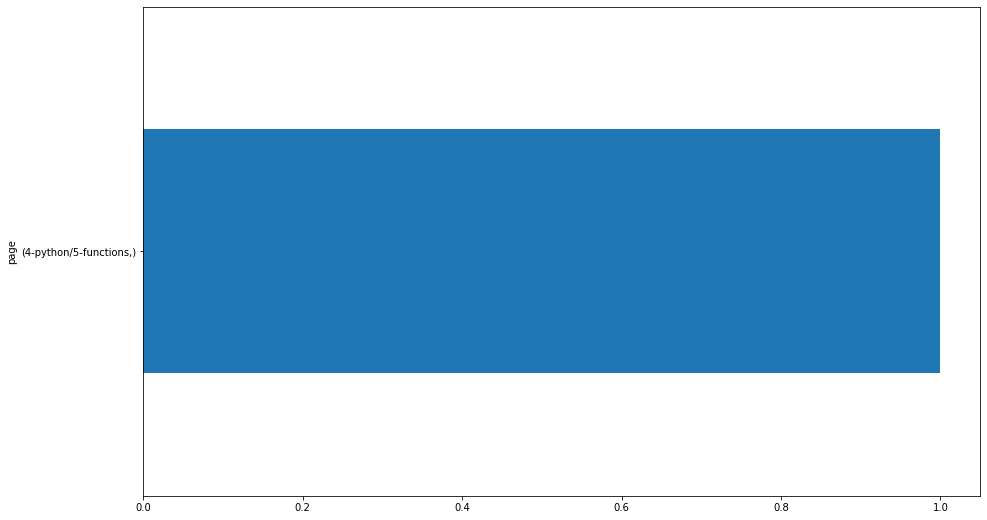


173.149.245.229
page              
4-python/6-imports    1
dtype: int64


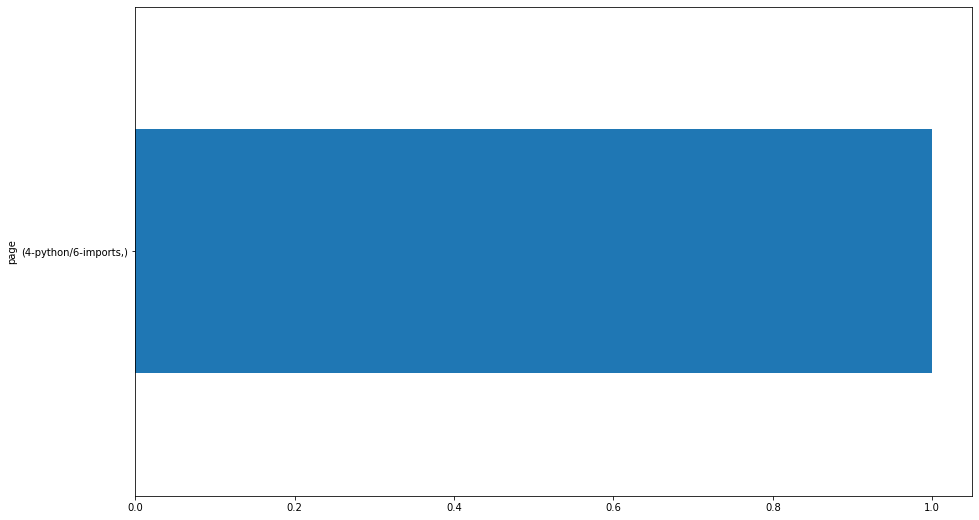


70.121.160.151
page                  
4-python/6-imports        1
3-sql/1-mysql-overview    1
/                         1
dtype: int64


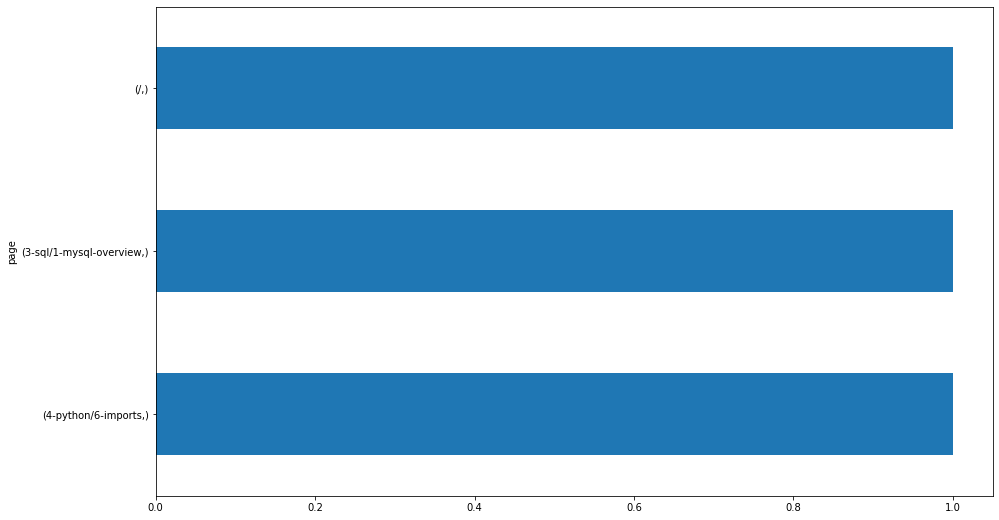


166.251.106.121
page                               
4-python/5-functions                   1
4-python/3-data-types-and-variables    1
dtype: int64


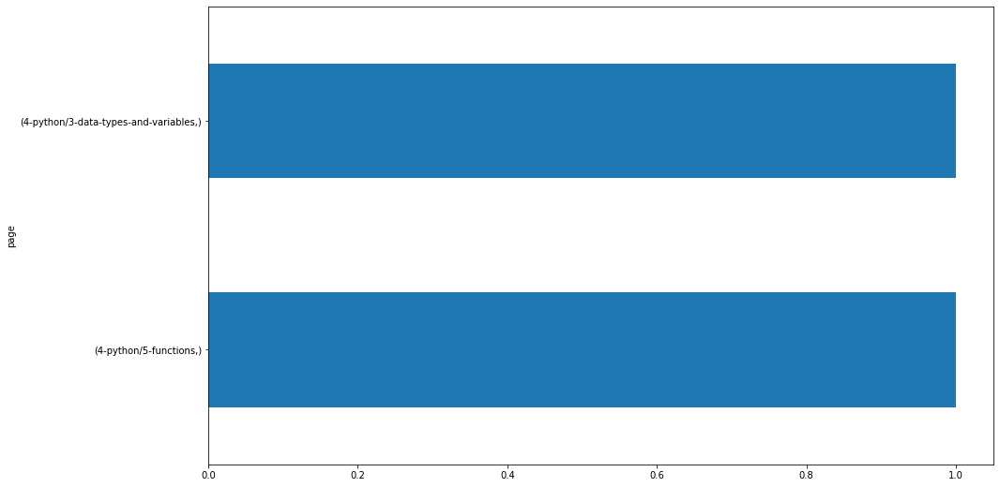


166.251.112.118
page                              
4-python/project                      2
4-python/7-working-with-files         1
1-fundamentals/2.2-excel-functions    1
1-fundamentals/2.1-excel-overview     1
dtype: int64


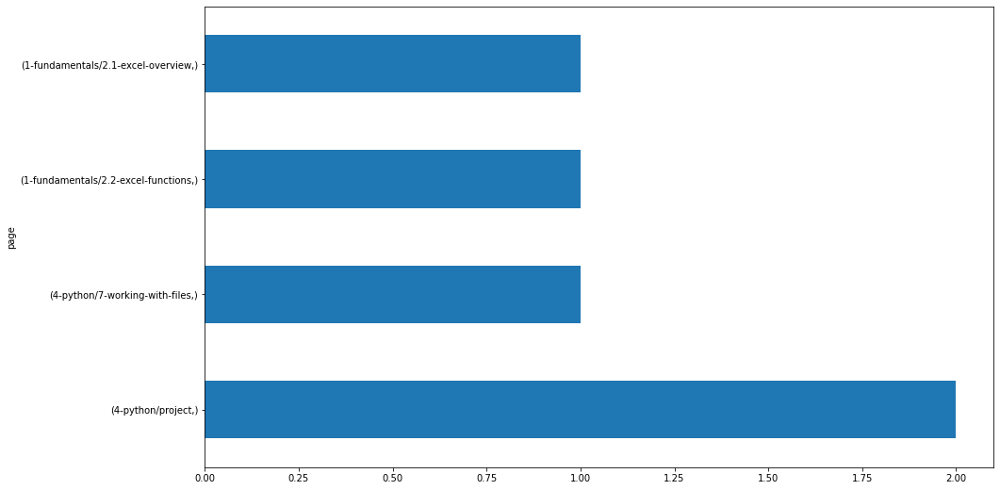


12.132.197.125
page                                    
1-fundamentals/modern-data-scientist.jpg    2
1-fundamentals/AI-ML-DL-timeline.jpg        2
1-fundamentals/1.1-intro-to-data-science    2
3-sql/3-databases                           1
dtype: int64


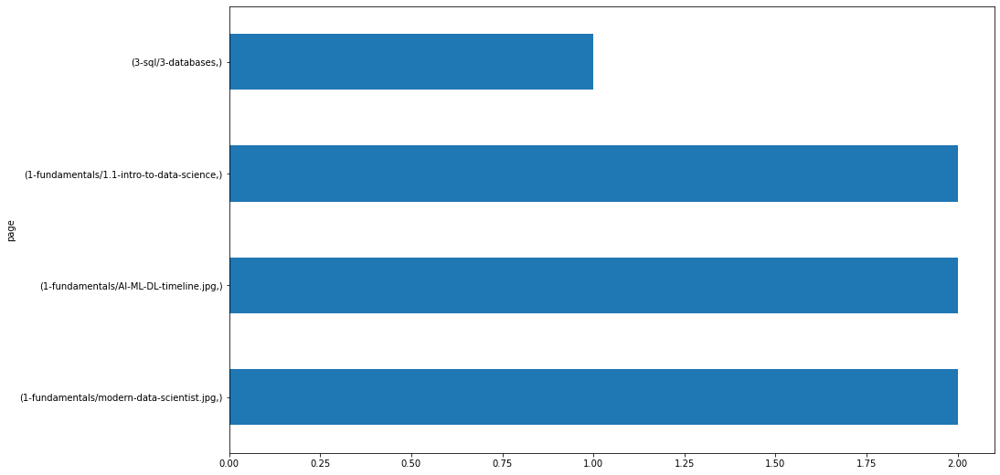


107.77.217.210
page                         
4-python/7-working-with-files    1
4-python/5-functions             1
dtype: int64


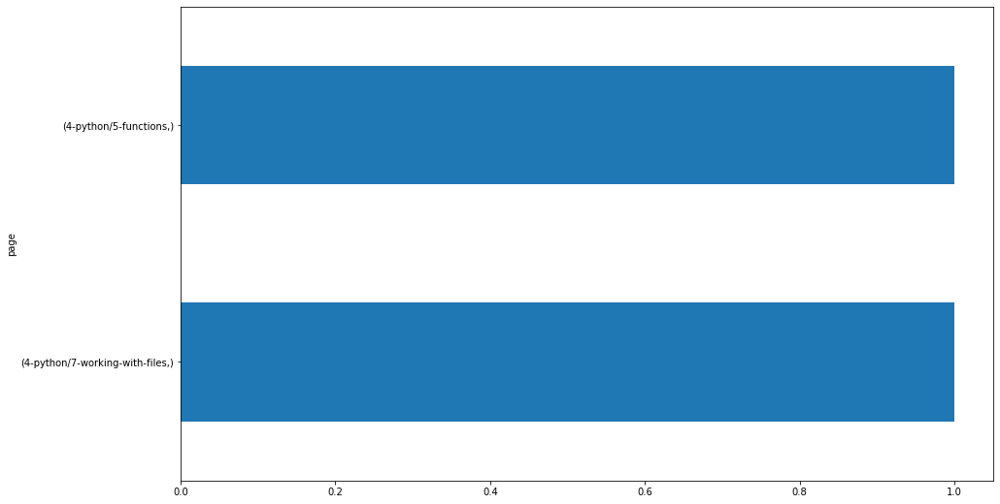


71.143.84.242
page                               
4-python/2-introduction-to-python      2
/                                      2
4-python/5-functions                   1
4-python/3-data-types-and-variables    1
4-python/1-overview                    1
dtype: int64


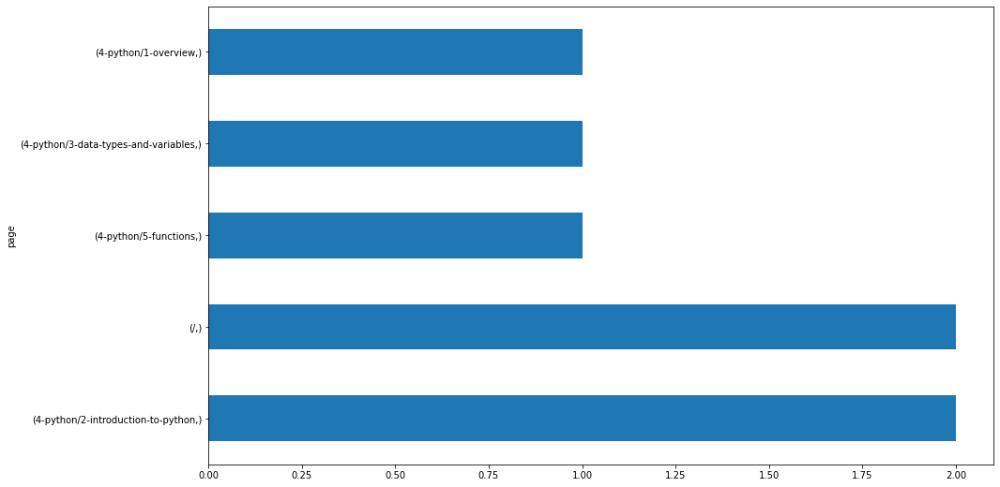


107.77.221.22
page                         
4-python/project                 2
4-python/7-working-with-files    1
/                                1
dtype: int64


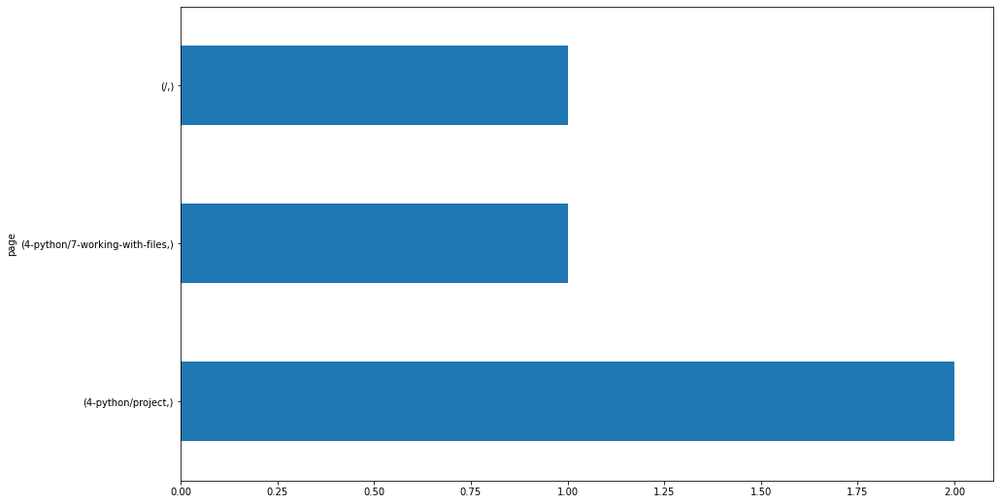


174.207.14.170
page                               
4-python/3-data-types-and-variables    1
dtype: int64


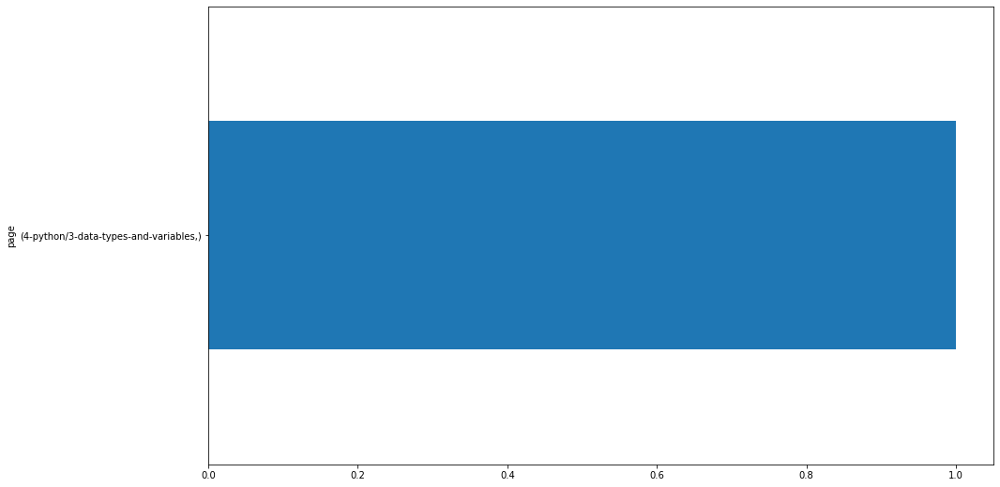


166.247.59.41
page                         
4-python/4-control-structures    1
dtype: int64


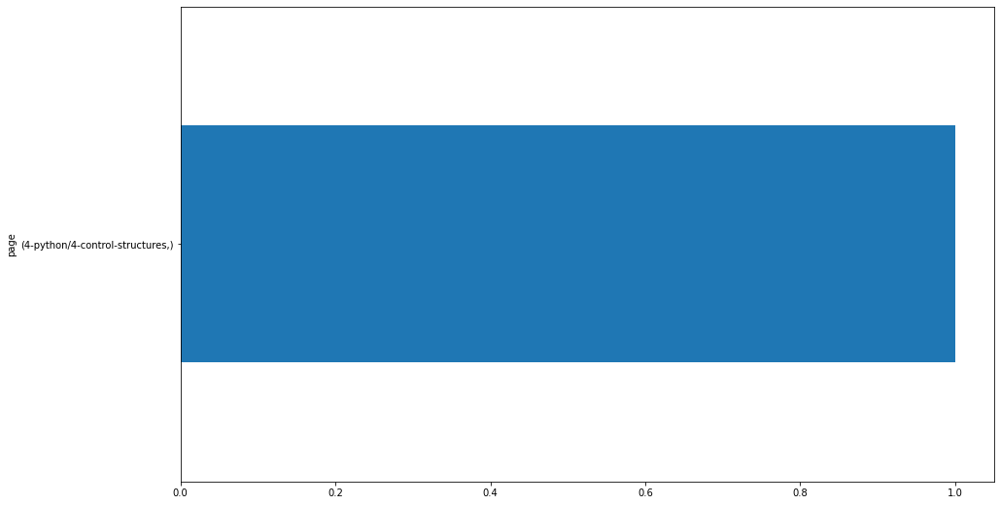


67.10.165.185
page                               
4-python/4-control-structures          3
4-python/3-data-types-and-variables    2
11-nlp/5-explore                       1
/                                      1
dtype: int64


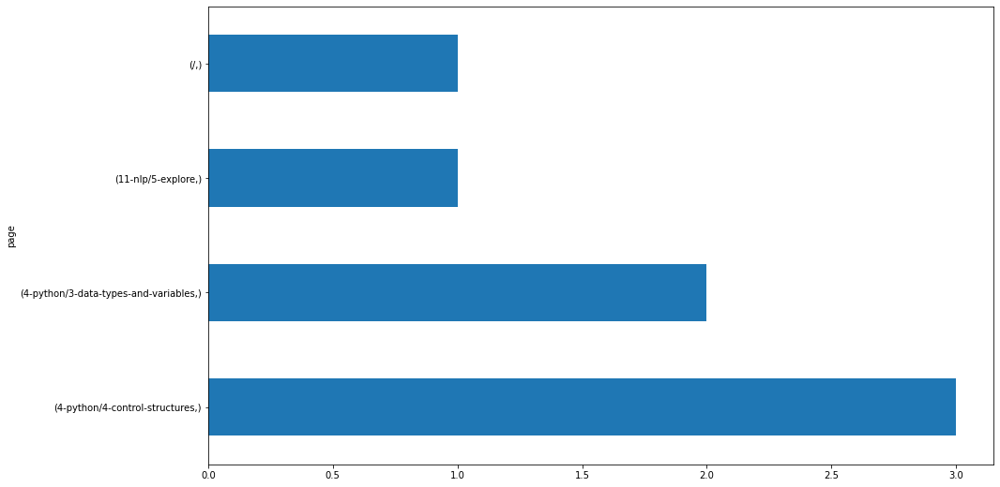


173.127.59.159
page
/       1
dtype: int64


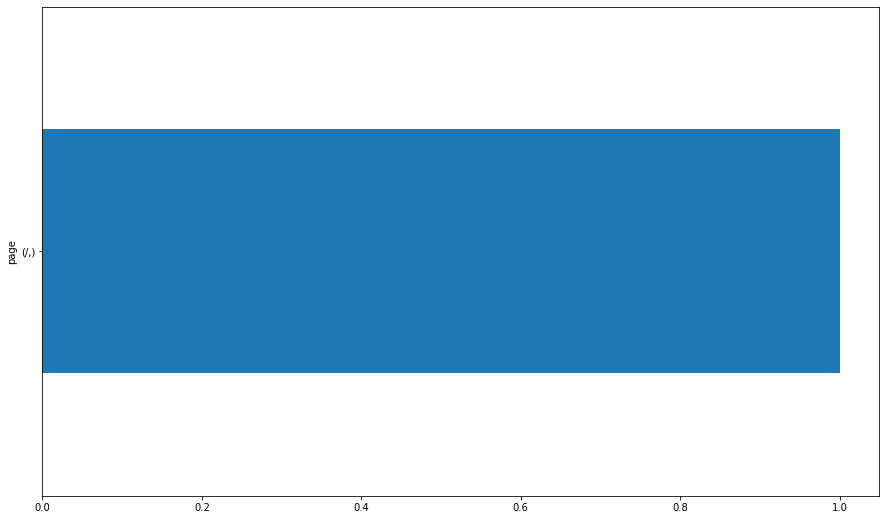


166.251.112.197
page                               
4-python/project                       1
4-python/3-data-types-and-variables    1
dtype: int64


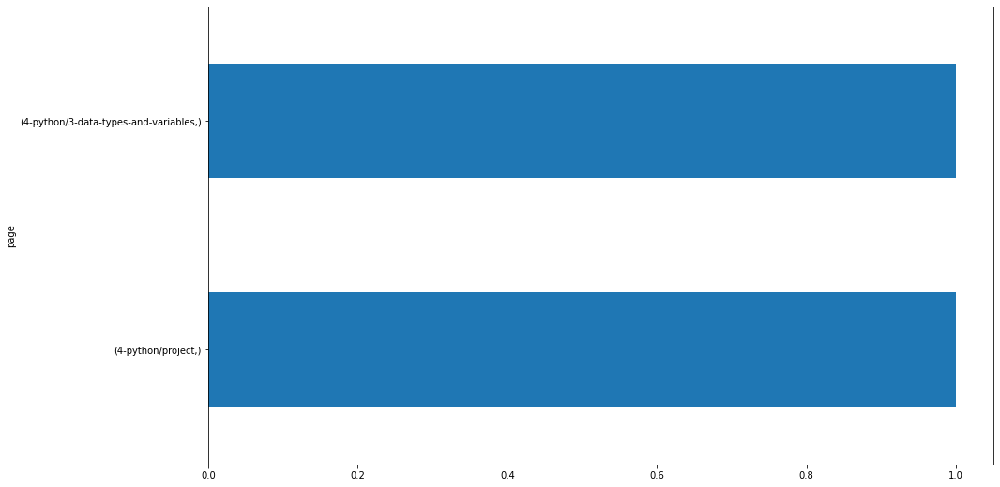


107.77.221.211
page                               
4-python/8.2-intro-to-matplotlib       1
4-python/3-data-types-and-variables    1
dtype: int64


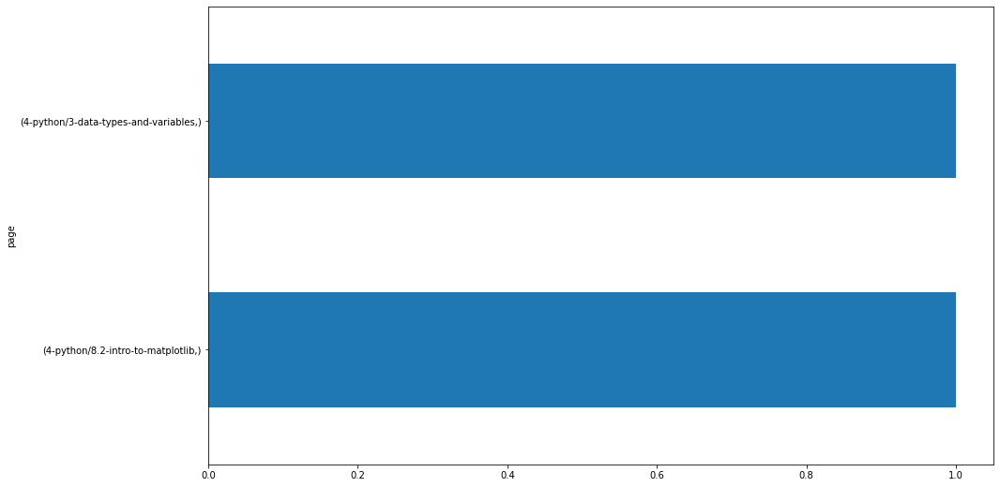


172.58.110.135
page                            
4-python/8.2-intro-to-matplotlib    1
dtype: int64


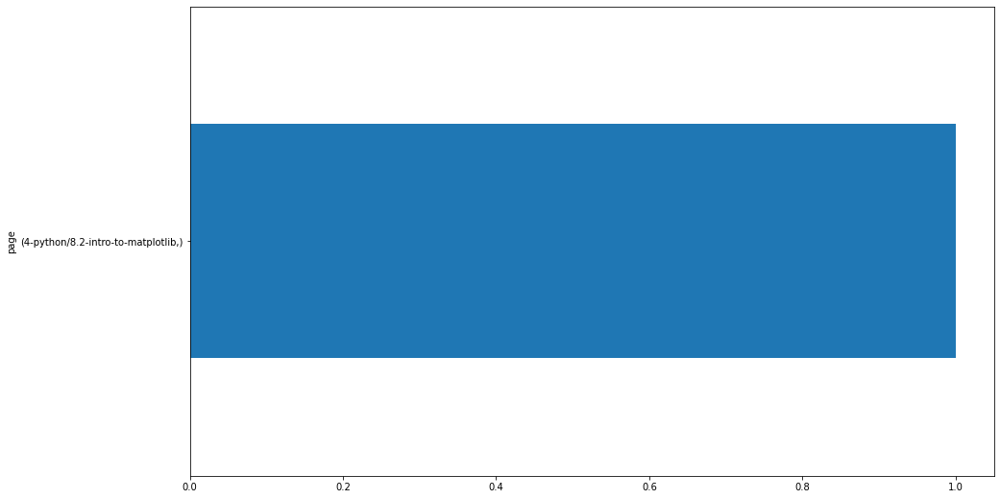


173.127.20.115
page                               
4-python/8.2-intro-to-matplotlib       3
4-python/3-data-types-and-variables    1
3-sql/1-mysql-overview                 1
dtype: int64


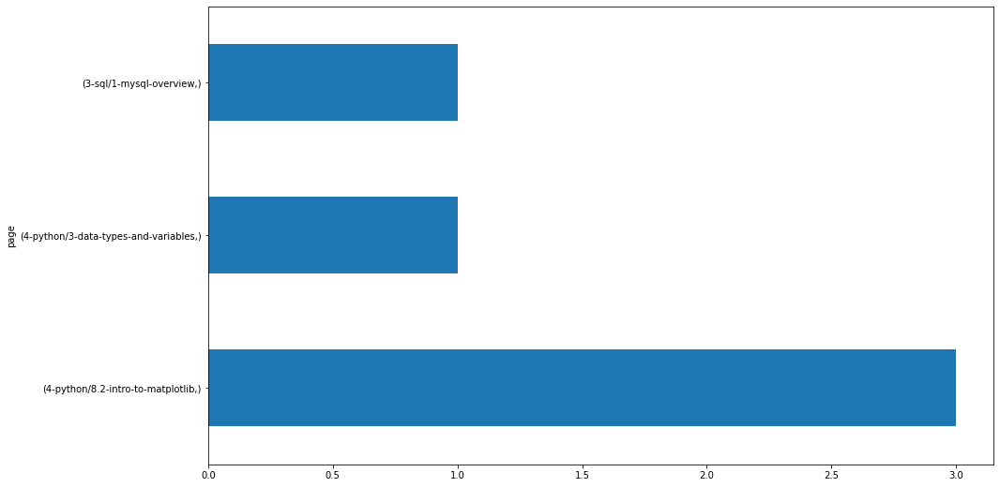


162.89.0.47
page                               
4-python/3-data-types-and-variables    1
/                                      1
dtype: int64


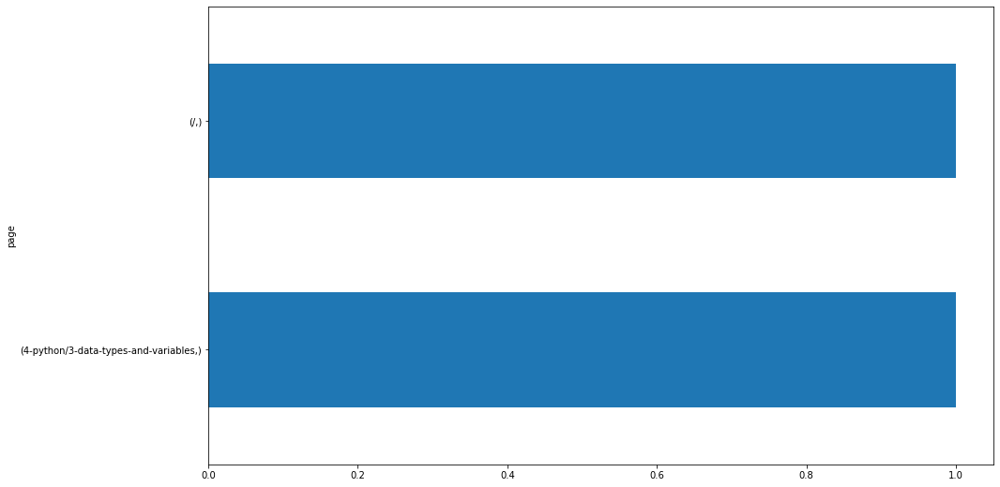


208.184.162.149
page                             
4-python/8.4.3-dataframes            1
4-python/8.4.2-series                1
4-python/8.3-intro-to-numpy          1
4-python/8.2-intro-to-matplotlib     1
4-python/2-introduction-to-python    1
/                                    1
dtype: int64


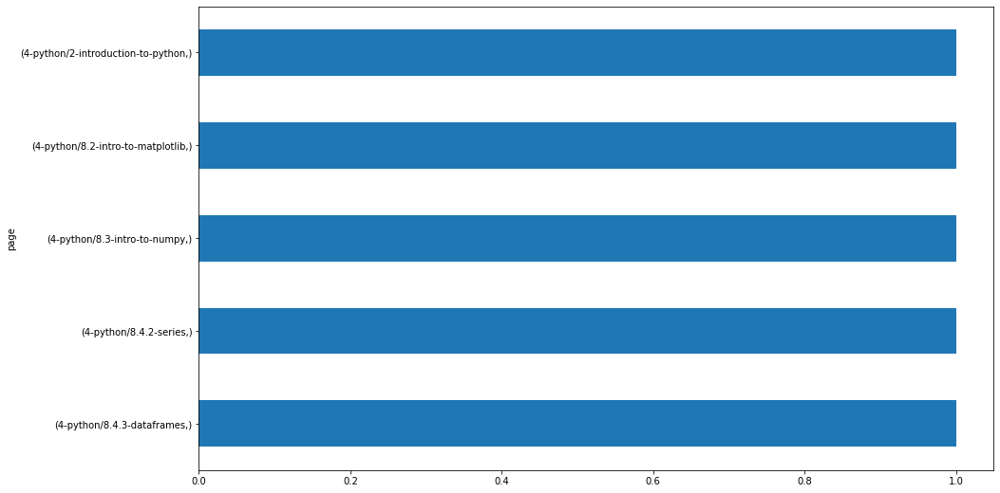


70.114.28.44
page                                 
4-python/8.2-intro-to-matplotlib         2
2-storytelling/2.2-create                2
2-storytelling/2.1-understand            2
search/search_index.json                 1
4-python/8.4.2-series                    1
4-python/8.3-intro-to-numpy              1
3-sql/1-mysql-overview                   1
2-storytelling/3.2-connecting-to-data    1
2-storytelling/3-tableau                 1
2-storytelling/1-overview                1
/                                        1
dtype: int64


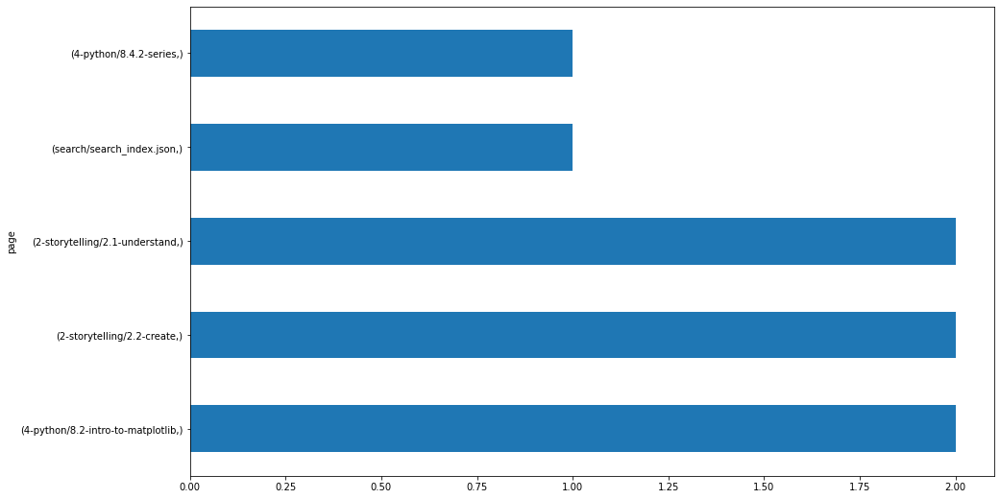


166.251.109.235
page                             
4-python/8.3-intro-to-numpy          3
5-stats/1-overview                   1
4-python/8.4.1-pandas-overview       1
4-python/8.2-intro-to-matplotlib     1
4-python/7-working-with-files        1
4-python/2-introduction-to-python    1
4-python/1-overview                  1
/                                    1
dtype: int64


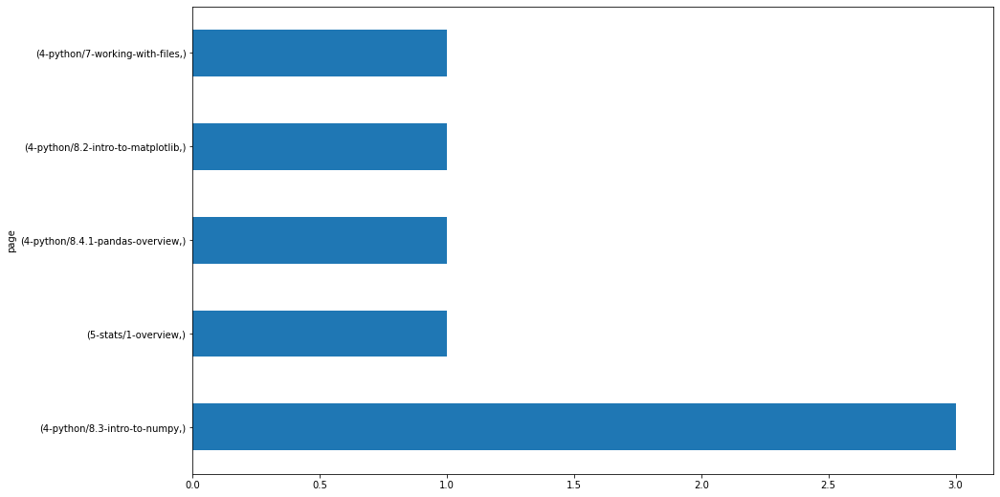


98.158.243.104
page                                                   
search/search_index.json                                   12
4-python/2-introduction-to-python                           8
4-python/8.2-intro-to-matplotlib                            3
appendix/ds-environment-setup                               3
/                                                           3
12-distributed-ml/3-spark-api                               2
10-anomaly-detection/4-detecting-timeseries-anomalies       2
5-stats/3-probability-distributions                         2
10-anomaly-detection/2-continuous-probabilistic-methods     2
10-anomaly-detection/3-discrete-probabilistic-methods       2
1-fundamentals/1.1-intro-to-data-science                    1
1-fundamentals/AI-ML-DL-timeline.jpg                        1
1-fundamentals/modern-data-scientist.jpg                    1
10-anomaly-detection/1-overview                             1
4-python/8.5-intro-to-seaborn                               

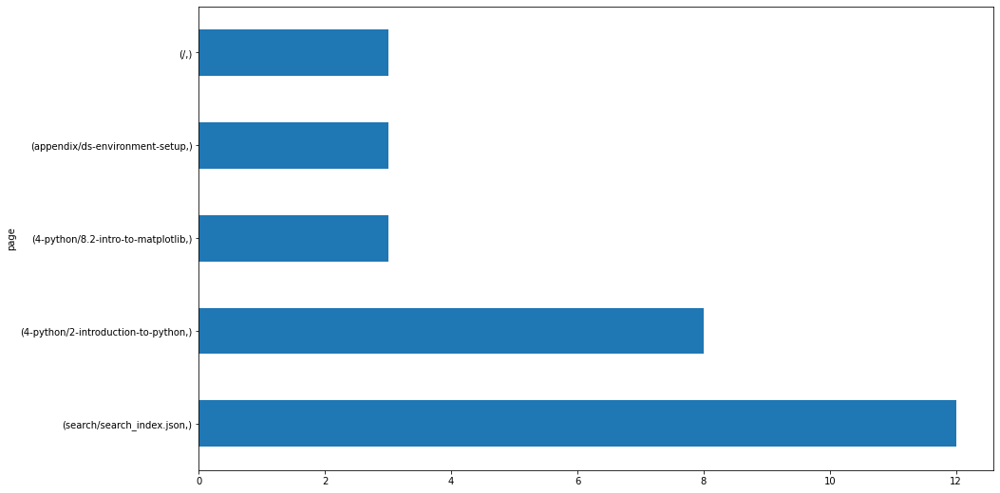


67.79.36.55
page
/       1
dtype: int64


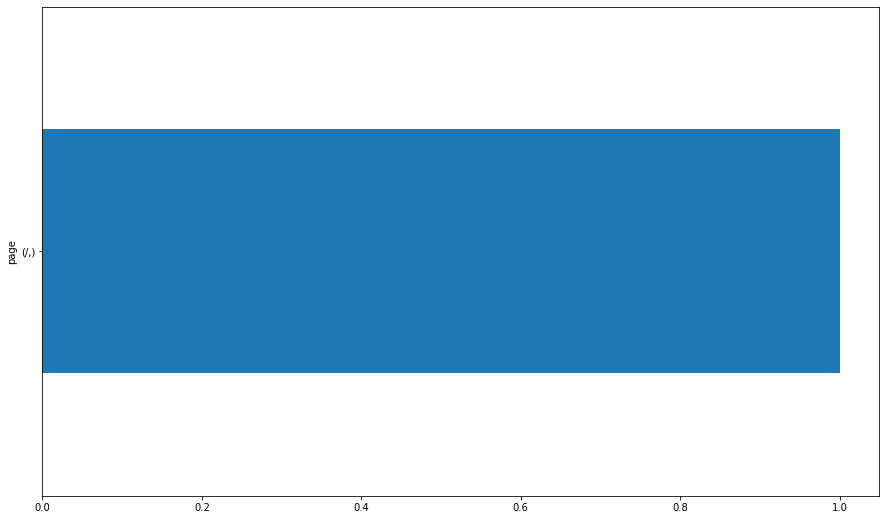


107.77.221.13
page                          
4-python/8.4.1-pandas-overview    1
4-python/8.3-intro-to-numpy       1
/                                 1
dtype: int64


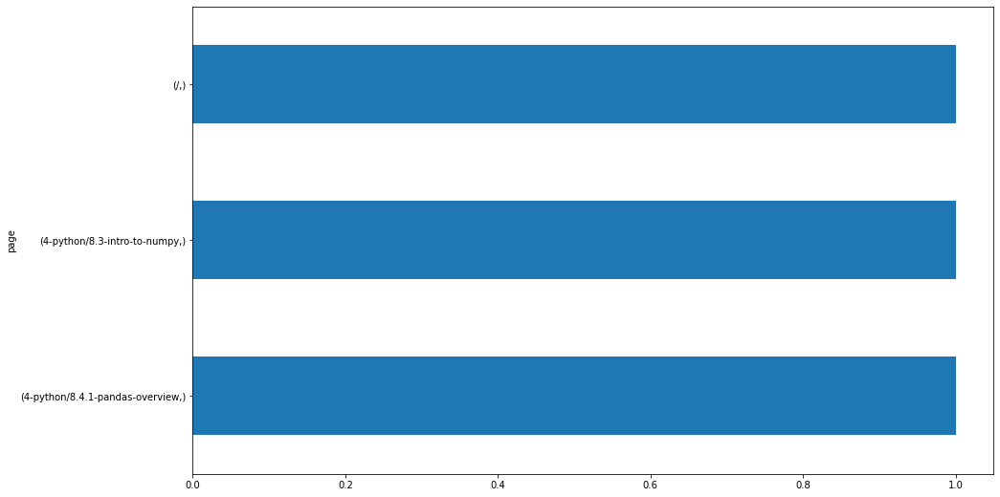


107.77.221.141
page                          
4-python/8.4.2-series             2
4-python/8.4.1-pandas-overview    2
/                                 1
dtype: int64


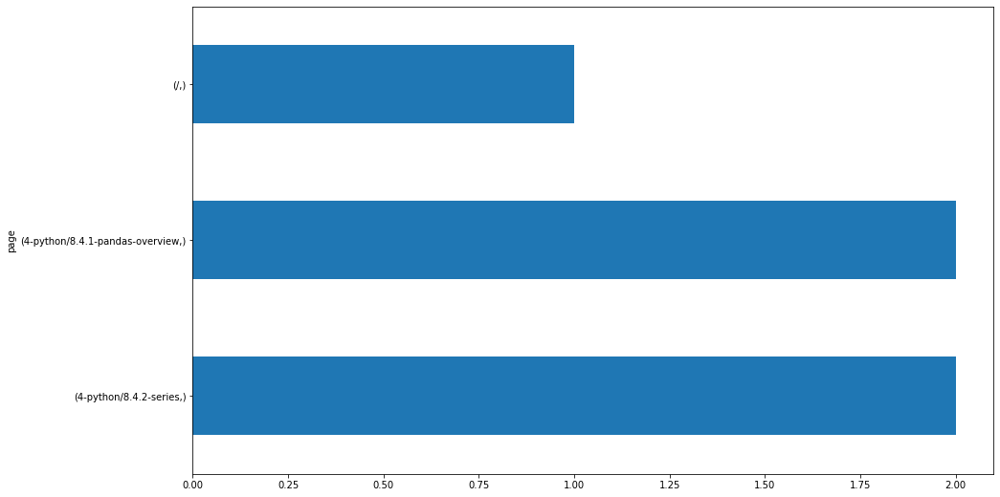


166.247.59.40
page                          
4-python/8.4.2-series             1
4-python/8.4.1-pandas-overview    1
dtype: int64


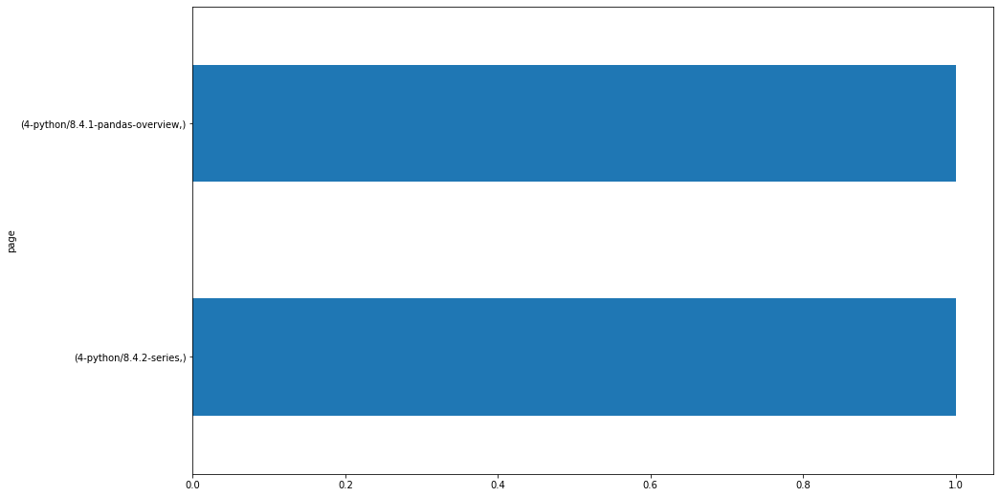


166.141.90.7
page                        
appendix/data-viz-references    1
4-python/8.4.3-dataframes       1
/                               1
dtype: int64


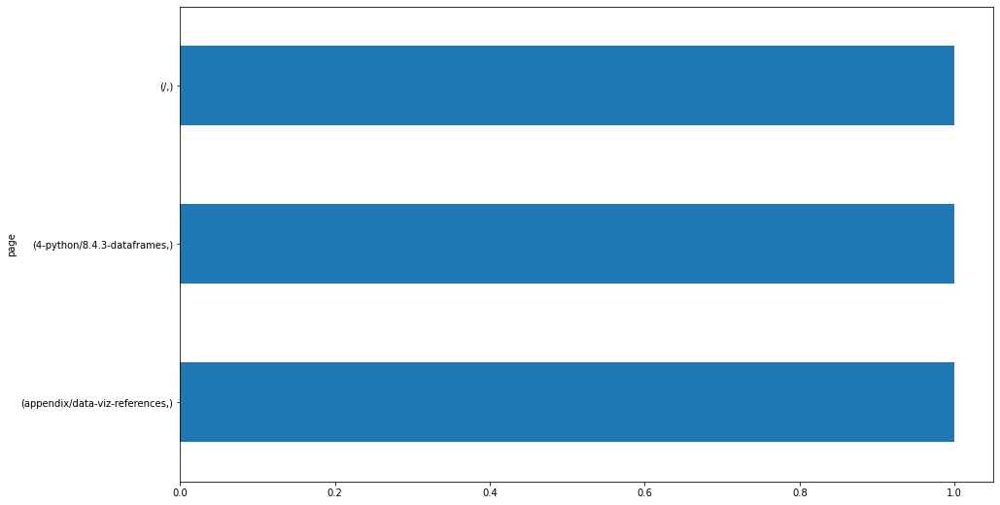


166.251.101.210
page
/       1
dtype: int64


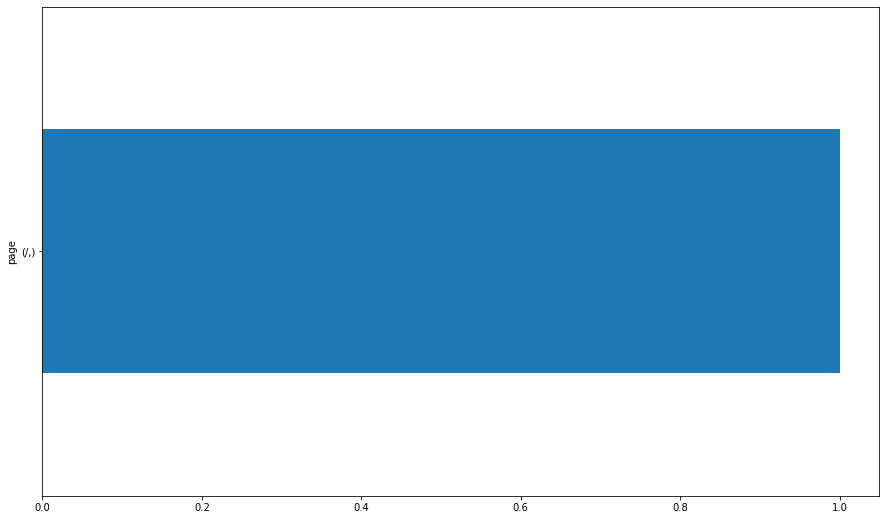


166.251.109.47
page                              
4-python/8.4.4-advanced-dataframes    1
dtype: int64


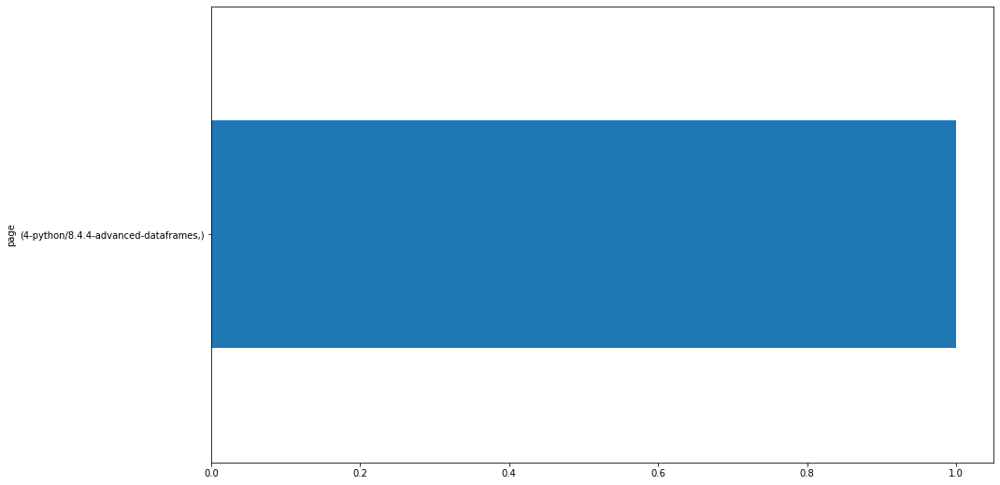


96.8.130.193
page                                    
/                                           4
search/search_index.json                    1
appendix/open_data                          1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/1.2-data-science-pipeline    1
dtype: int64


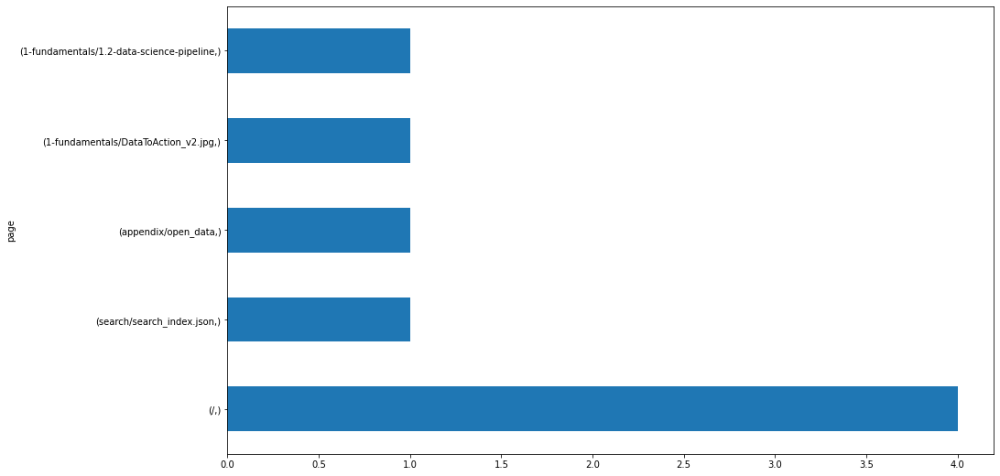


107.77.221.157
page
/       1
dtype: int64


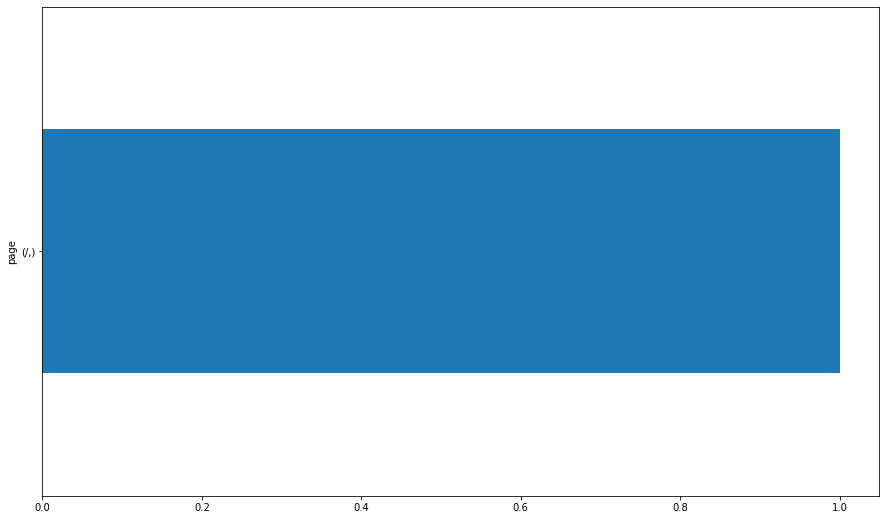


166.251.112.195
page                         
4-python/8.5-intro-to-seaborn    1
dtype: int64


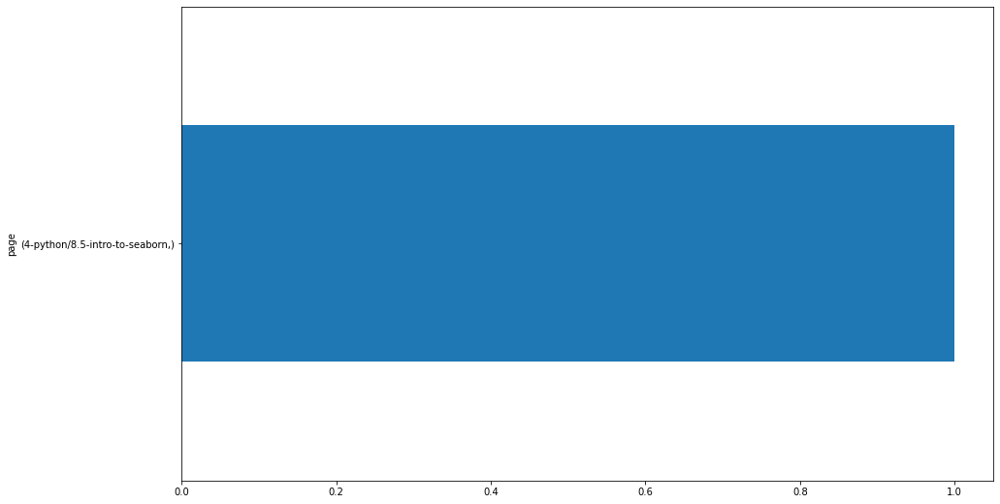


167.24.104.154
page                             
9-timeseries/5.1-modeling-lesson1    2
9-timeseries/3-prep                  2
9-timeseries/2-acquire               2
/                                    2
9-timeseries/5.2-modeling-lesson2    1
dtype: int64


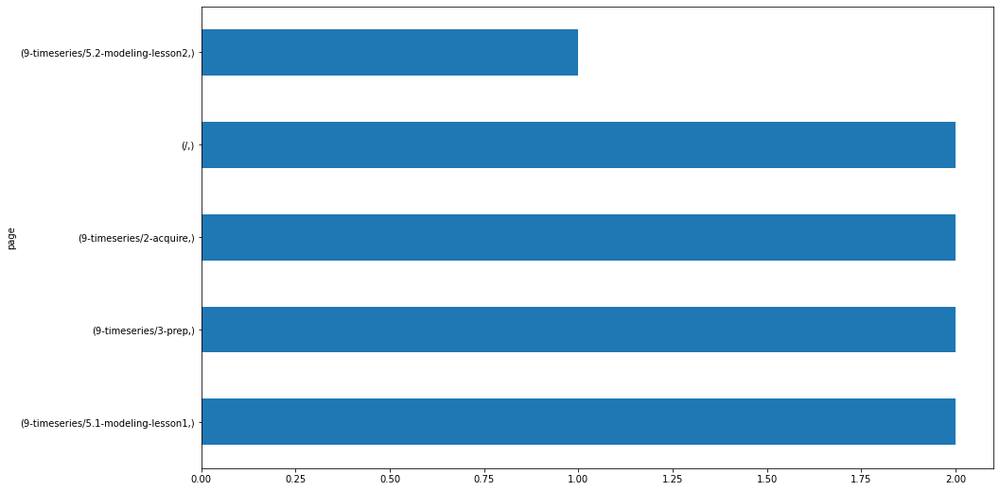


187.201.71.67
page                                                  
4-python/objects                                          4
4-python/error-handling                                   3
/                                                         2
1-fundamentals/1.1-intro-to-data-science                  2
1-fundamentals/AI-ML-DL-timeline.jpg                      2
1-fundamentals/modern-data-scientist.jpg                  2
6-regression/built-in-datasets                            2
6-regression/1-overview                                   2
3-sql/database-design                                     2
11-nlp/topic-modeling                                     1
10-anomaly-detection/1-overview                           1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg         1
10-anomaly-detection/isolation-forests                    1
11-nlp/entity-labeling                                    1
11-nlp/pos-tagging                                        1
appendix/useful_libraries     

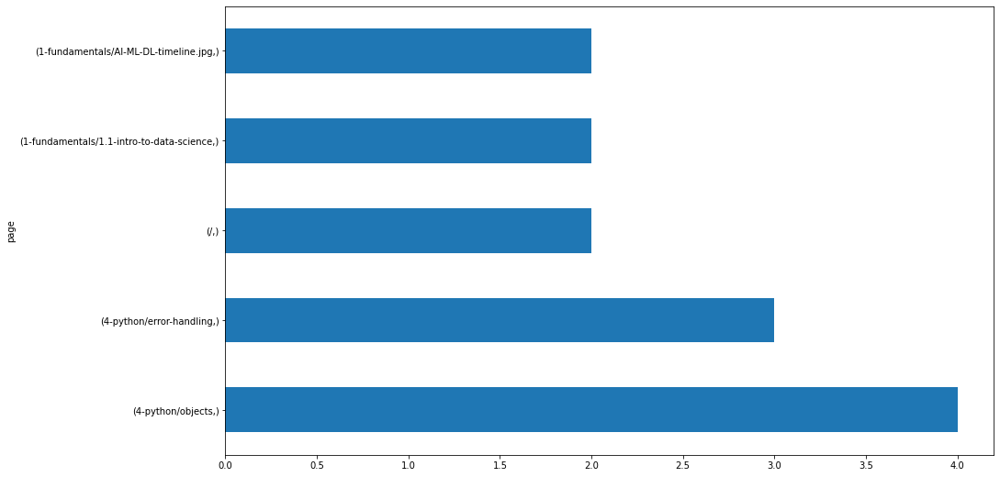


107.77.221.200
page                         
4-python/8.5-intro-to-seaborn    1
/                                1
dtype: int64


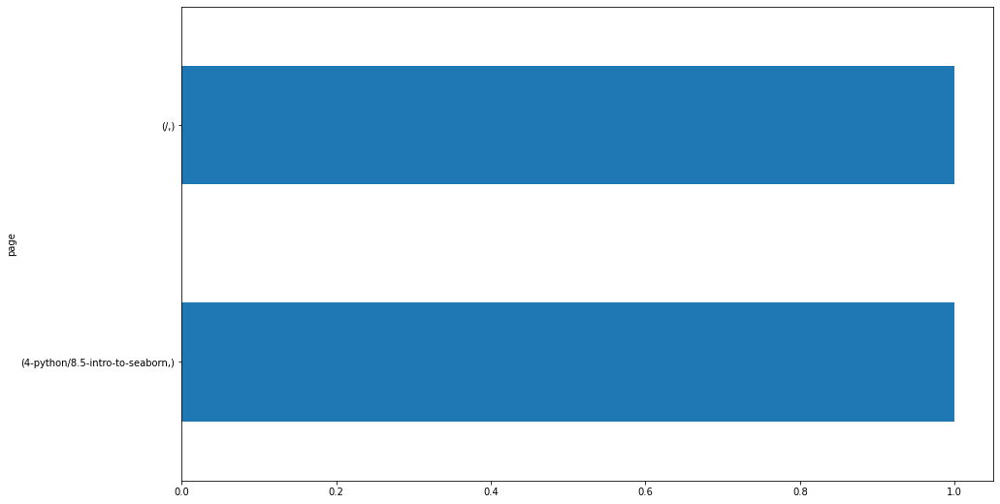


98.6.99.123
page                              
4-python/8.5-intro-to-seaborn         1
4-python/8.4.4-advanced-dataframes    1
dtype: int64


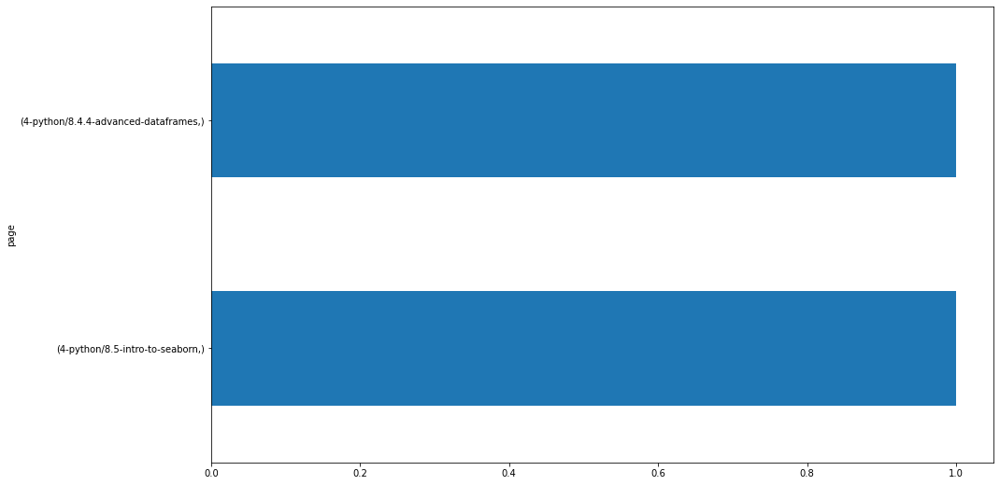


172.58.99.204
page                         
4-python/8.5-intro-to-seaborn    1
dtype: int64


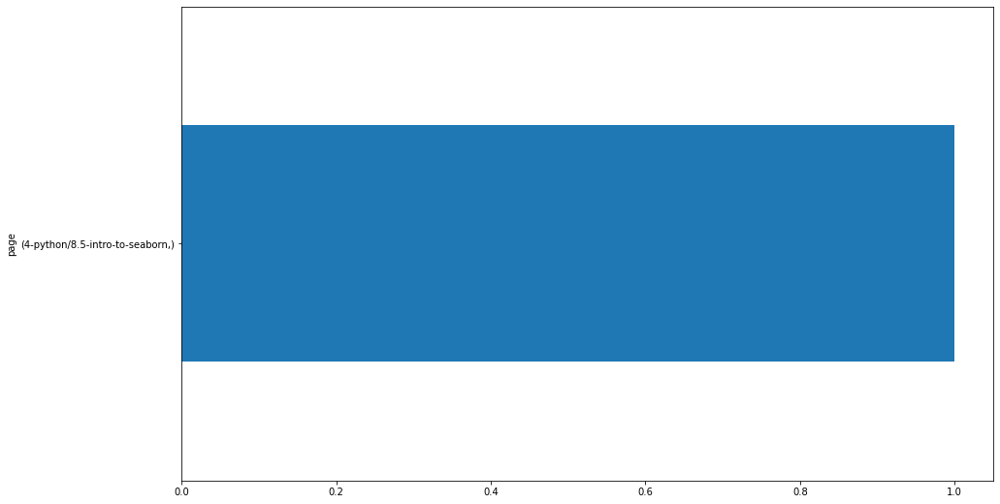


184.203.207.171
page                     
4-python/8.4.3-dataframes    1
dtype: int64


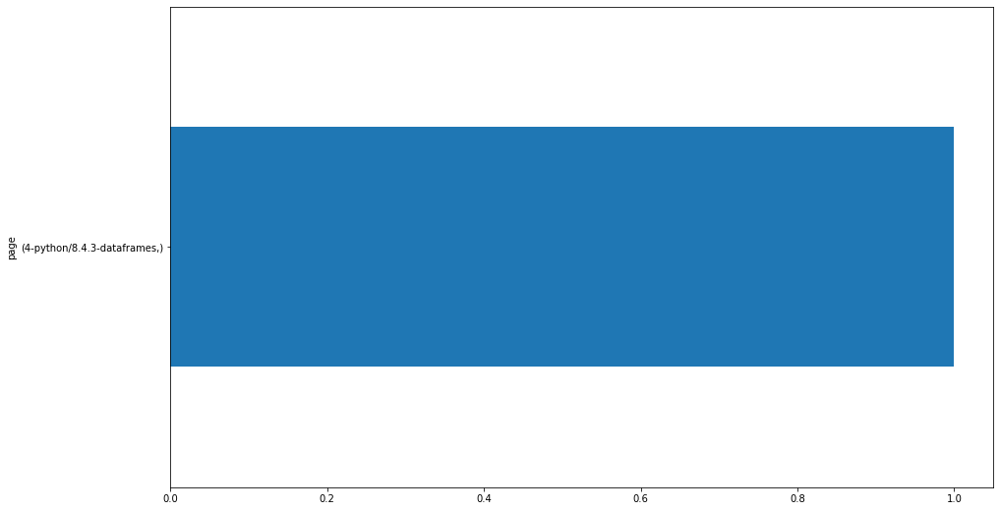


166.251.109.68
page                    
5-stats/2-simulation        2
5-stats/1-overview          2
search/search_index.json    1
/                           1
dtype: int64


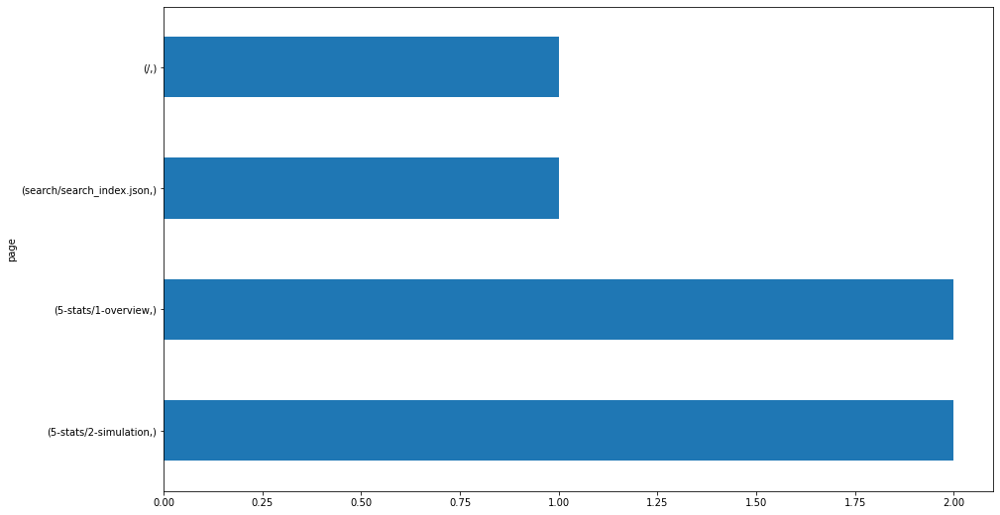


107.136.101.76
page                                    
1-fundamentals/modern-data-scientist.jpg    2
1-fundamentals/AI-ML-DL-timeline.jpg        2
1-fundamentals/2.1-excel-overview           2
1-fundamentals/1.1-intro-to-data-science    2
search/search_index.json                    1
6-regression/3.0-split-and-scale            1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/2.2-functions                1
1-fundamentals/2.1-spreadsheets-overview    1
1-fundamentals/1.2-data-science-pipeline    1
/                                           1
dtype: int64


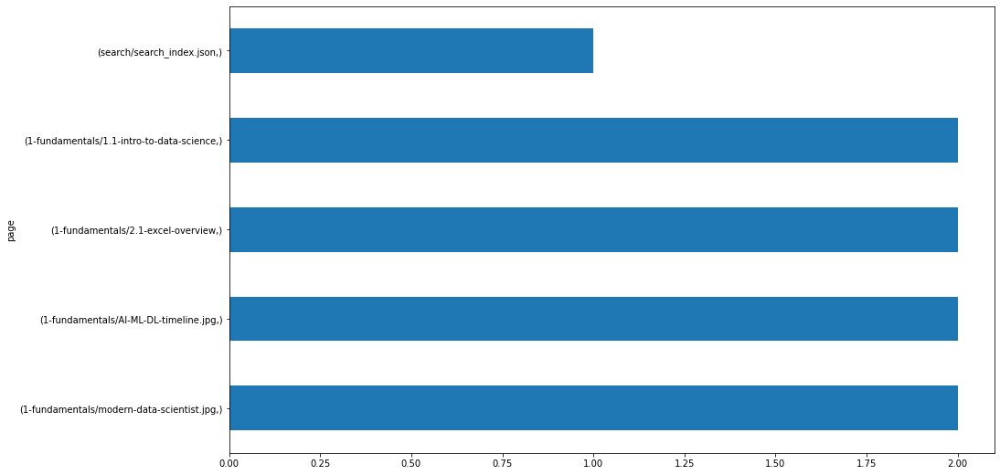


107.77.221.165
page
/       2
dtype: int64


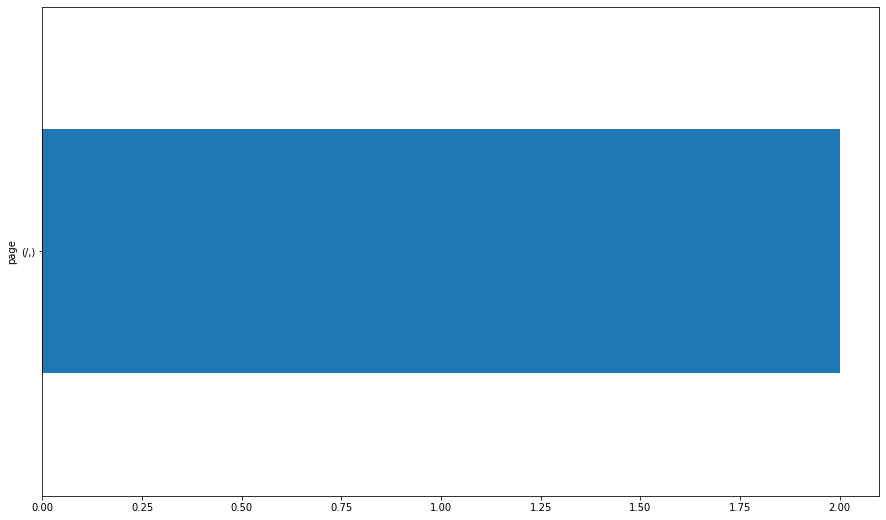


174.207.4.226
page
/       1
dtype: int64


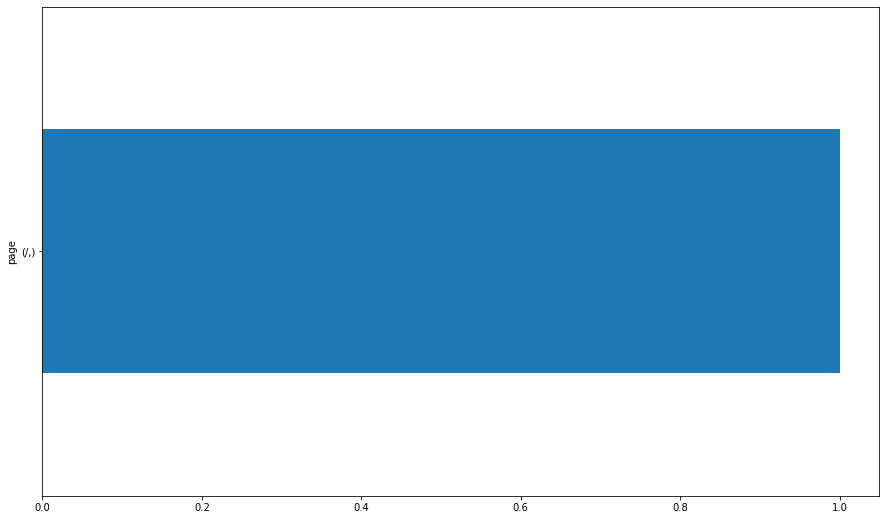


189.166.150.196
page
/       1
dtype: int64


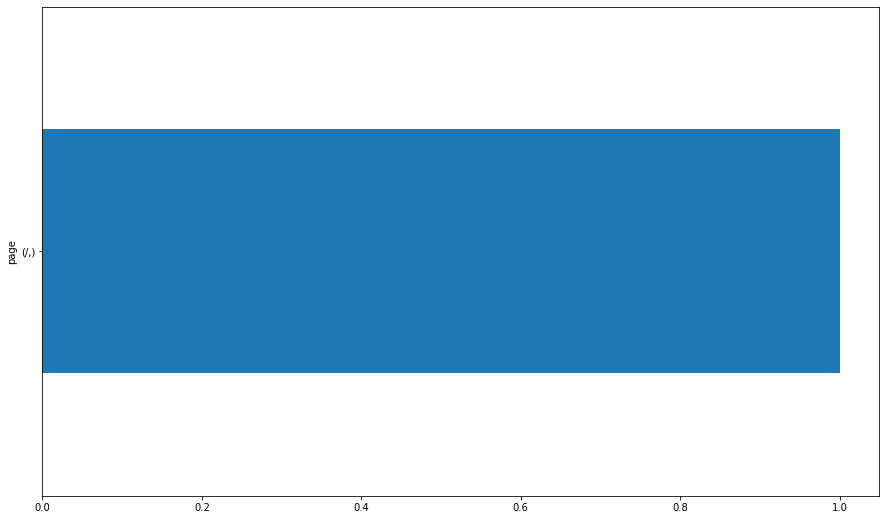


12.131.11.26
page
/       1
dtype: int64


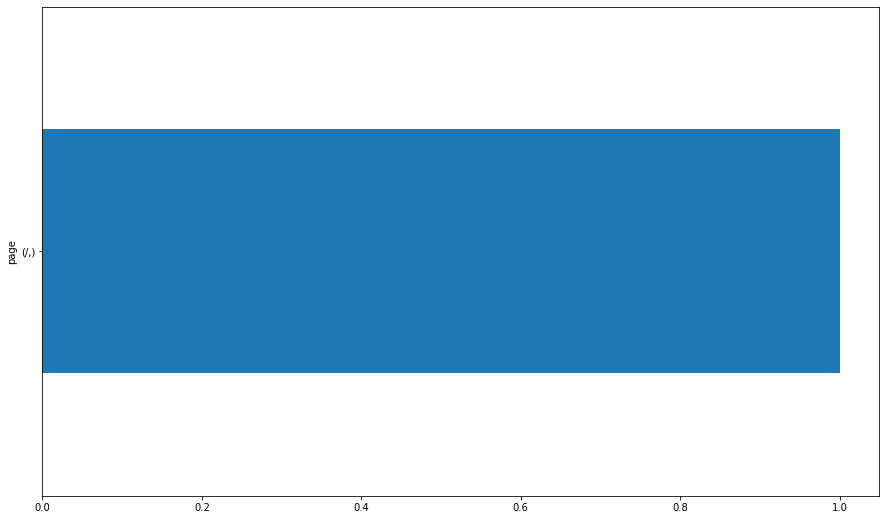


166.251.109.160
page                         
2-storytelling/1-overview        2
2-storytelling/2.2-create        1
2-storytelling/2.1-understand    1
dtype: int64


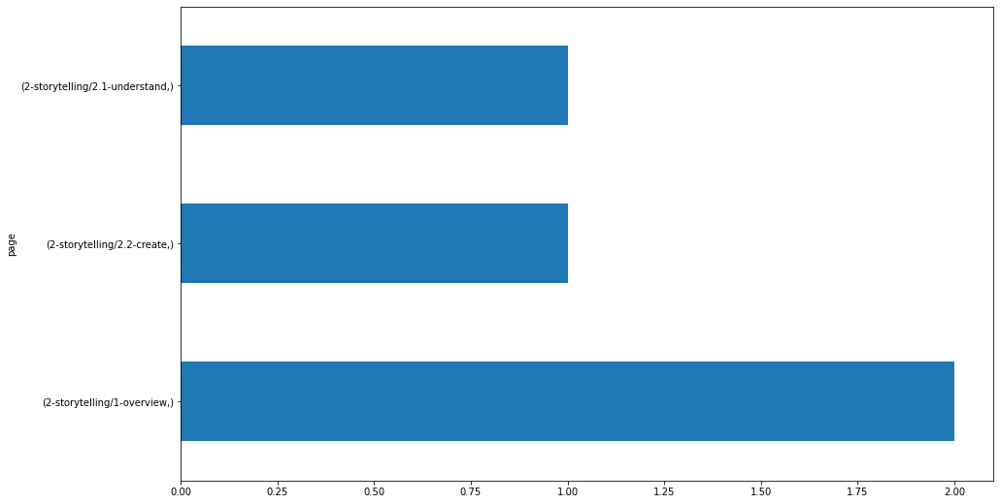


166.251.101.68
page                                         
5-stats/Selecting_a_hypothesis_test.svg          1
5-stats/5-power-analysis                         1
5-stats/4.5-more-statistical-testing-examples    1
5-stats/4.3-correlation                          1
/                                                1
dtype: int64


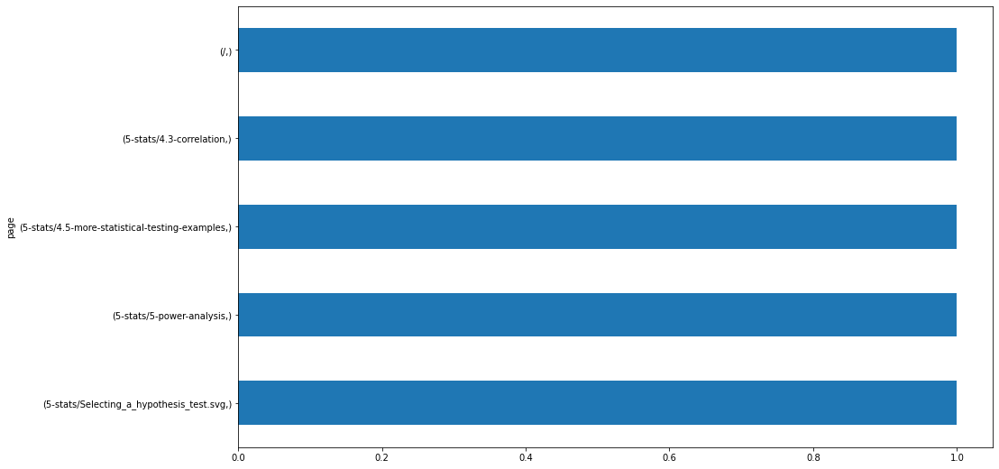


189.166.144.213
page                                 
appendix/interview_questions_students    1
3-sql/database-design                    1
/                                        1
dtype: int64


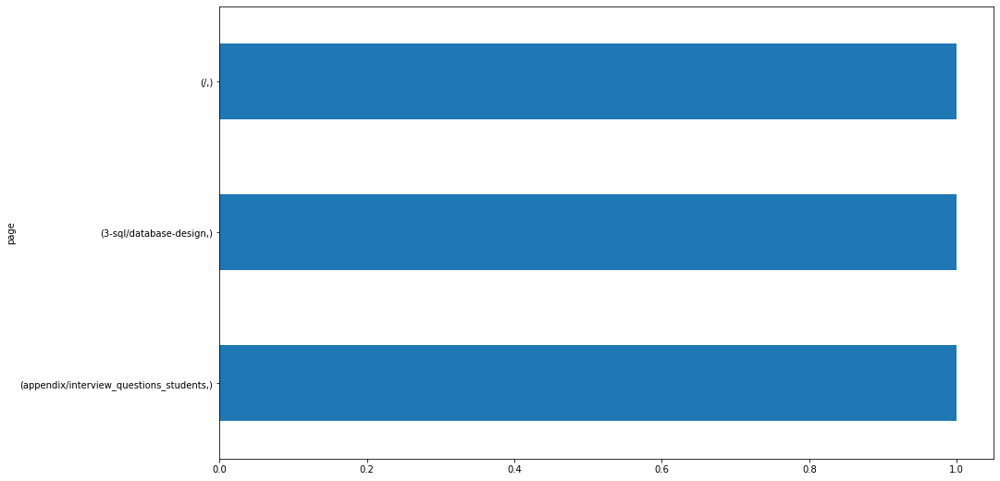


187.201.77.208
page
/       1
dtype: int64


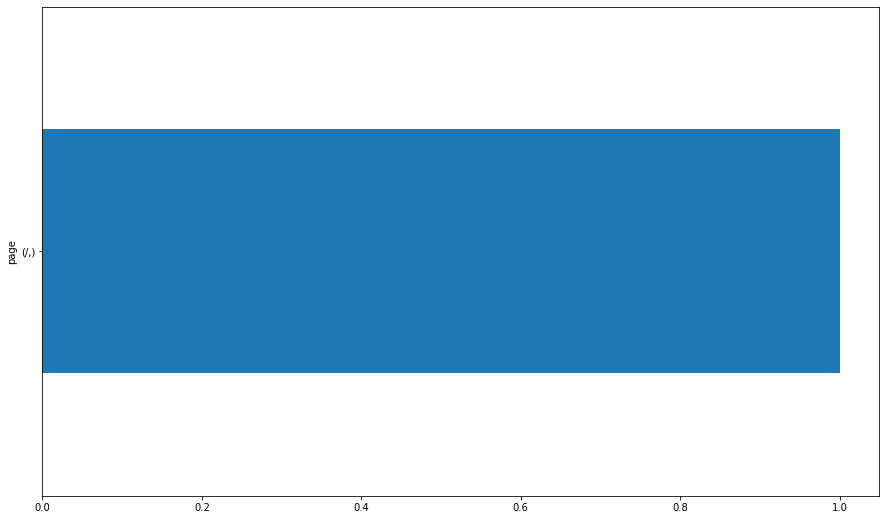


107.77.221.92
page                              
2-storytelling/3.3-creating-charts    1
dtype: int64


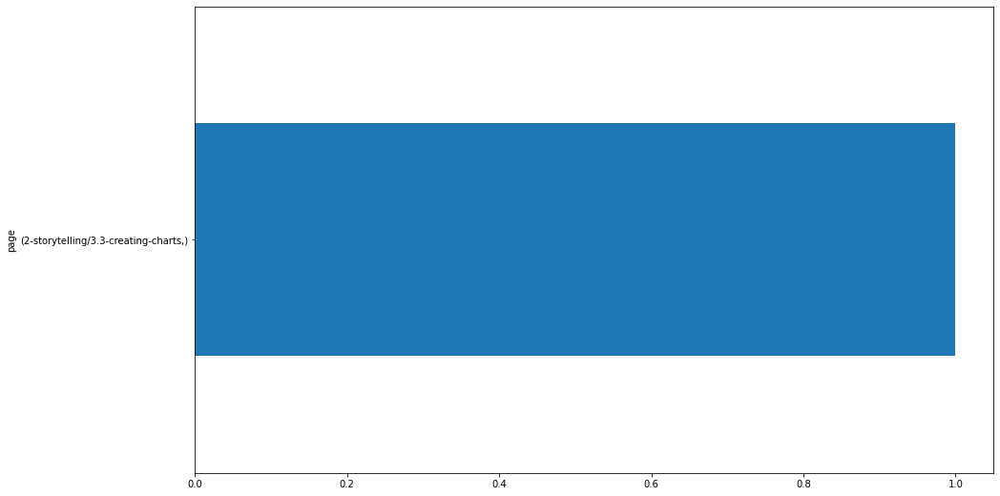


166.251.109.109
page                                 
2-storytelling/3.2-connecting-to-data    2
search/search_index.json                 1
2-storytelling/3.3-creating-charts       1
dtype: int64


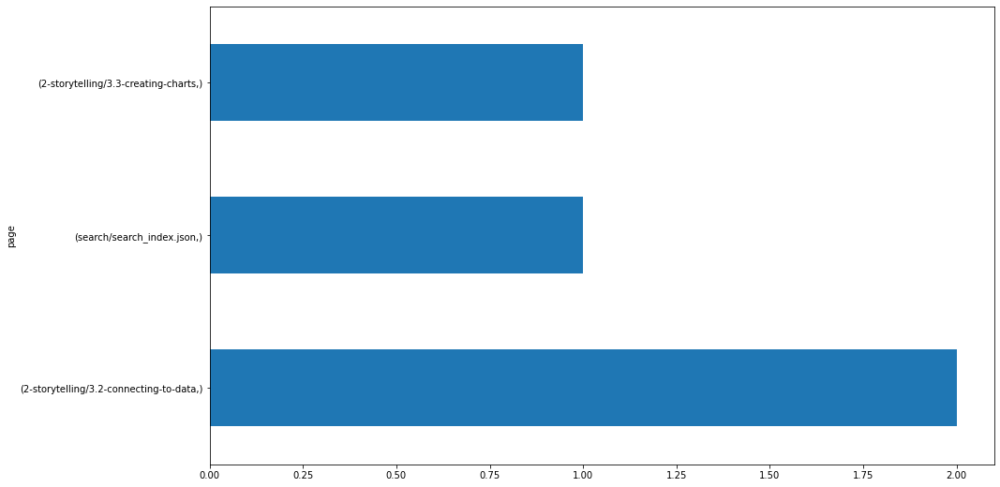


50.207.193.221
page                                 
appendix/interview_questions_students    2
4-python/handling-duplicate-values       1
dtype: int64


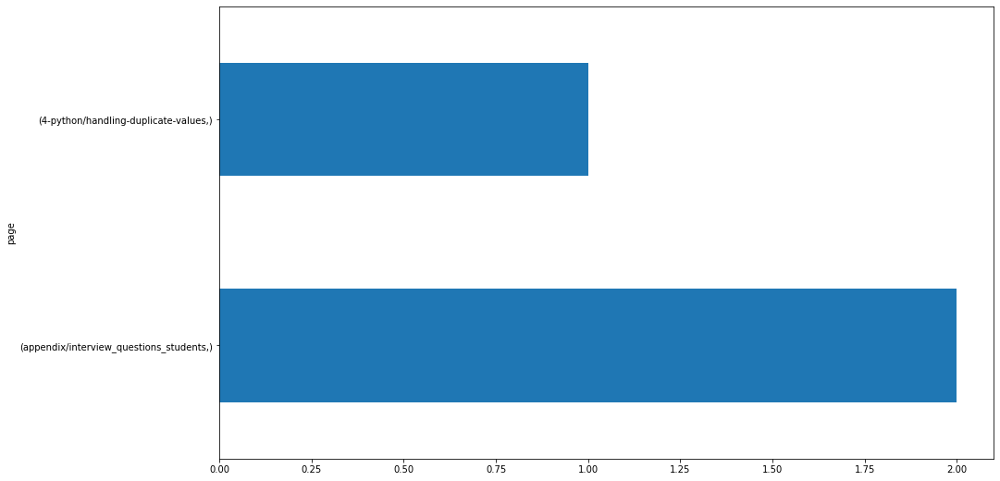


172.58.99.186
page                                 
2-storytelling/3.2-connecting-to-data    1
2-storytelling/3-tableau                 1
2-storytelling/2.2-create                1
2-storytelling/2.1-understand            1
dtype: int64


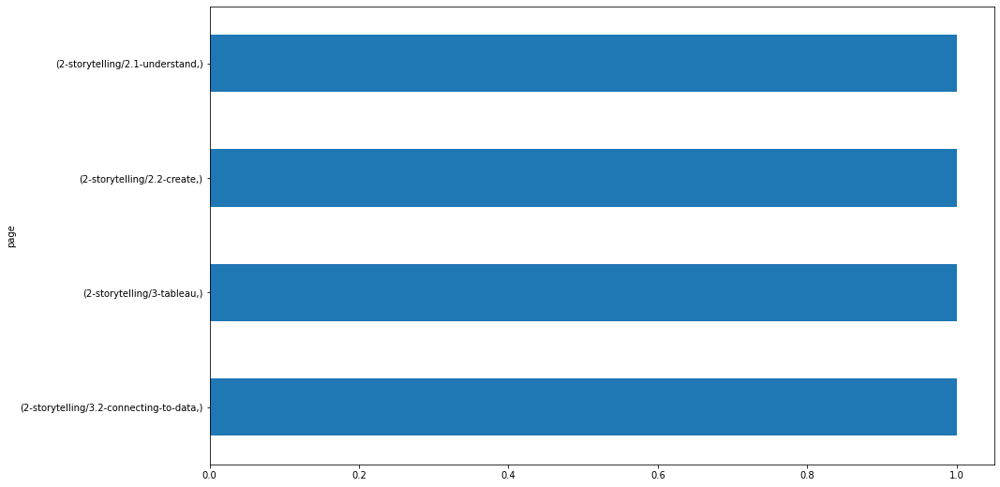


50.207.193.220
page                         
3-sql/10-temporary-tables        2
4-python/7-working-with-files    1
3-sql/8-group-by                 1
/                                1
dtype: int64


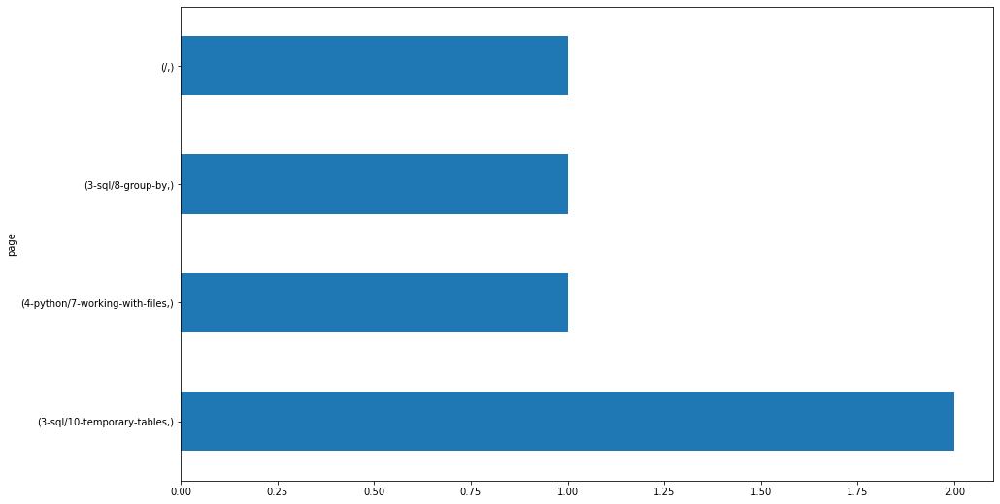


107.77.217.85
page                               
2-storytelling/3.6-creating-stories    1
dtype: int64


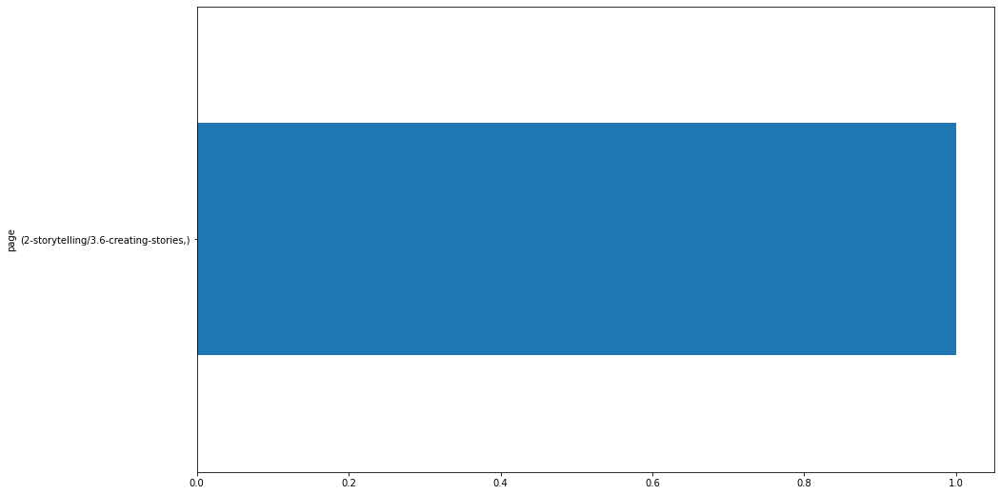


172.58.107.123
page                
4-python/5-functions    1
dtype: int64


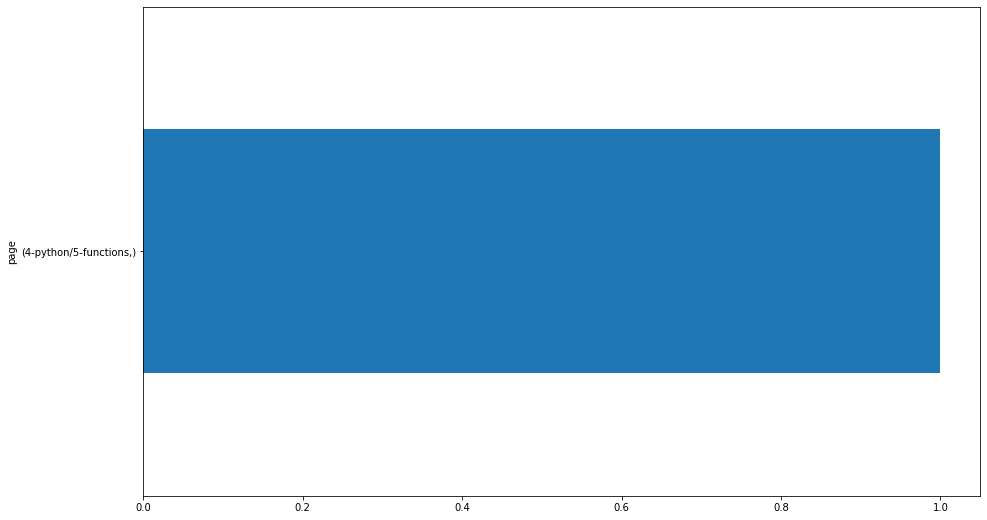


63.97.8.65
page                                 
2-storytelling/3.2-connecting-to-data    1
dtype: int64


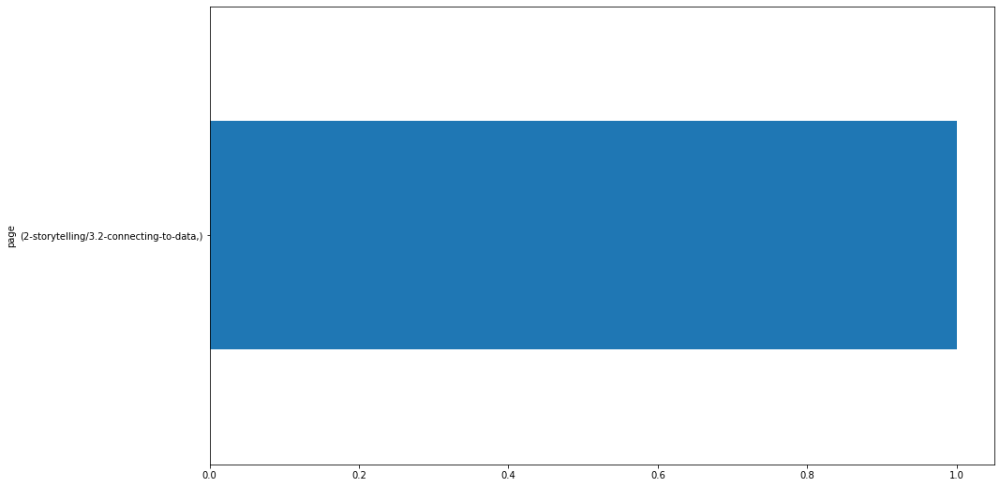


70.114.9.241
page                              
search/search_index.json              75
/                                     67
6-regression/1-overview               16
5-stats/4.2-compare-means             16
10-anomaly-detection/1-overview       14
                                      ..
fundamentals/git                       1
fundamentals/AI-ML-DL-timeline.jpg     1
distributed-ml/environment-setup       1
classification/tidy-data               1
sql/mysql-overview                     1
Length: 158, dtype: int64


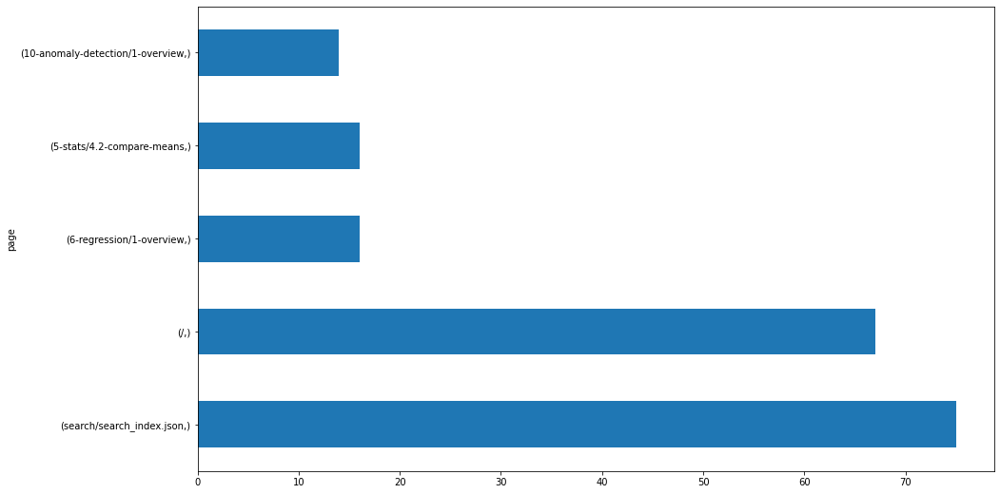


173.149.140.36
page                     
2-storytelling/2.3-refine    1
dtype: int64


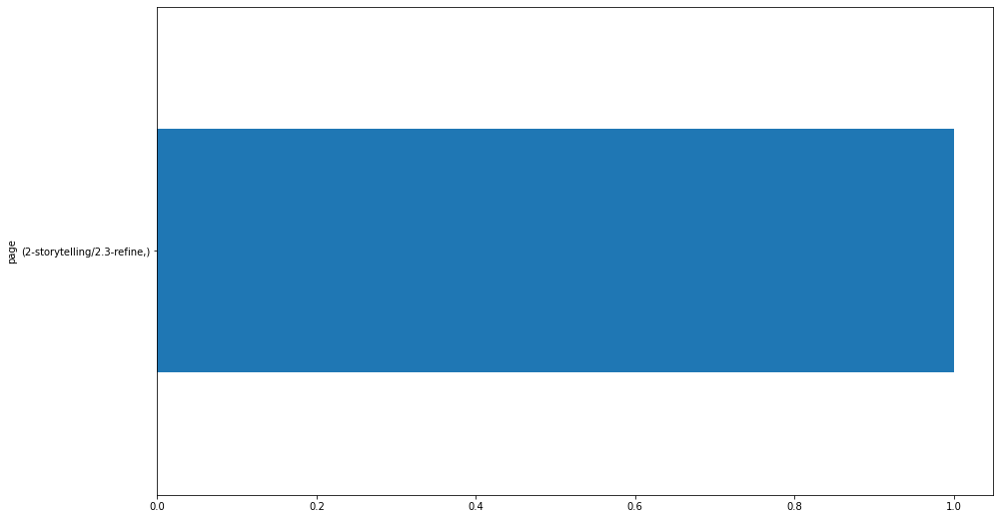


99.48.230.105
page                      
5-stats/2-simulation          2
5-stats/1-overview            2
5-stats/viz.py                1
2-storytelling/2.4-present    1
/                             1
dtype: int64


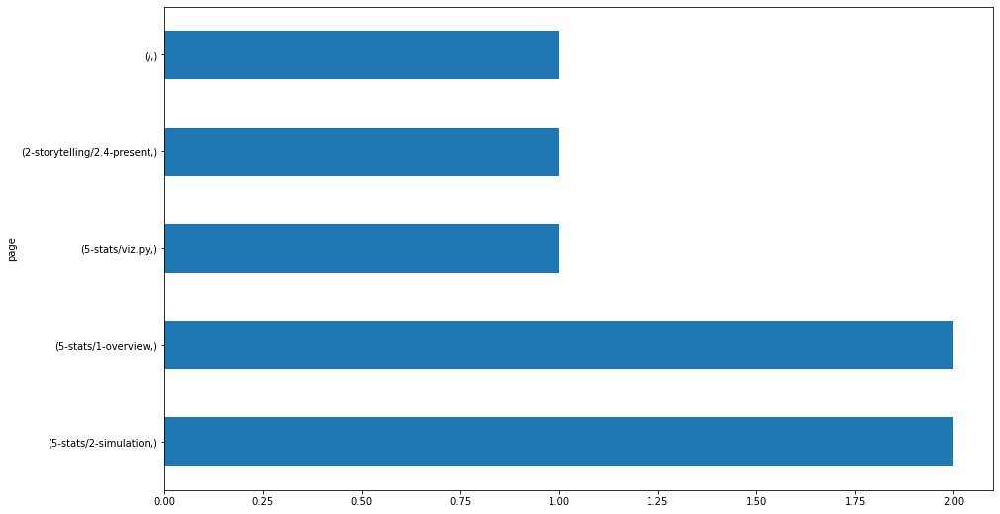


172.58.67.157
page                                    
4-python/8.5-intro-to-seaborn               2
2-storytelling/3.2-connecting-to-data       1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


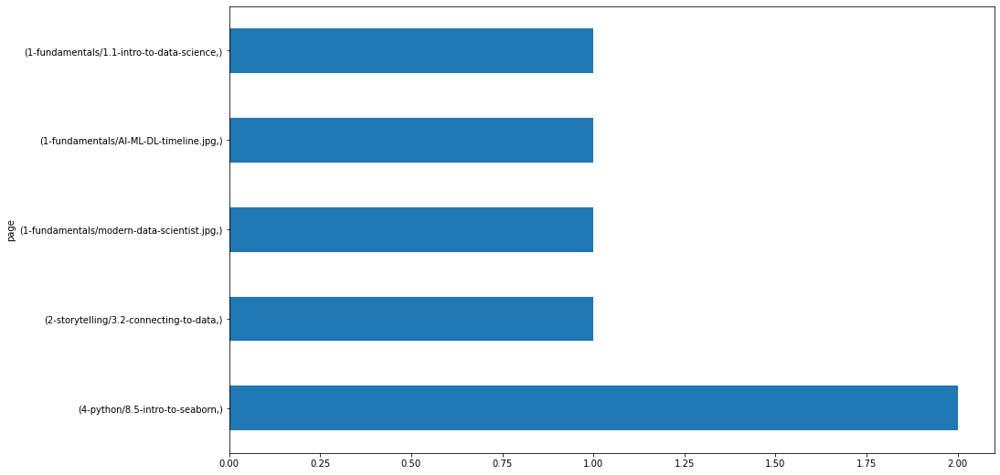


130.45.65.31
page                                 
/                                        2
5-stats/4.4-compare-group-membership     1
5-stats/4.2-compare-means                1
5-stats/3-probability-distributions      1
5-stats/2-simulation                     1
2-storytelling/3.2-connecting-to-data    1
dtype: int64


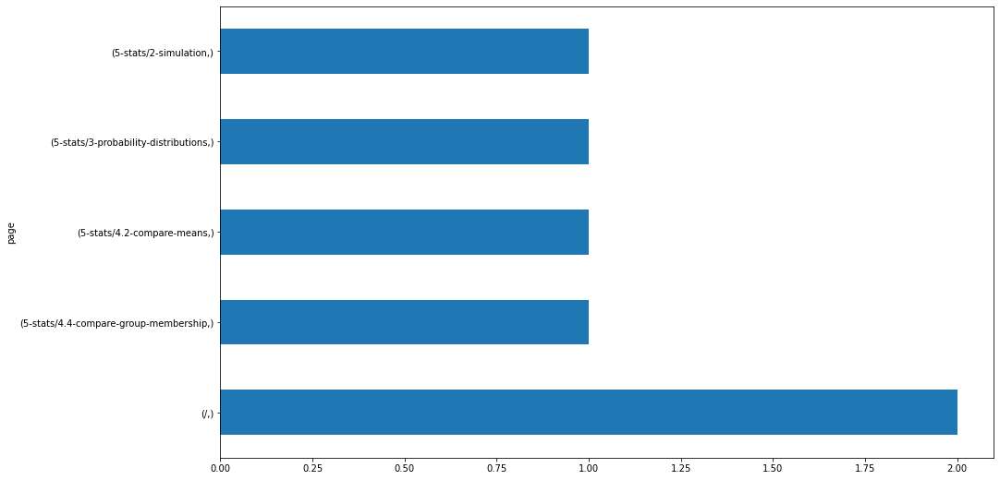


99.48.228.206
page                               
5-stats/3-probability-distributions    4
/                                      4
5-stats/2-simulation                   3
5-stats/1-overview                     3
4-python/8.3-intro-to-numpy            1
4-python/5-functions                   1
dtype: int64


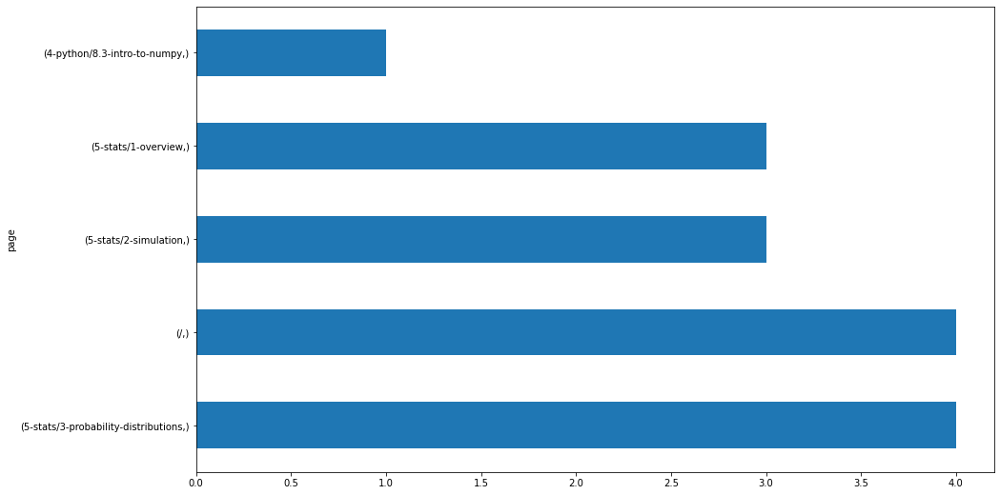


172.58.99.6
page                
4-python/5-functions    1
dtype: int64


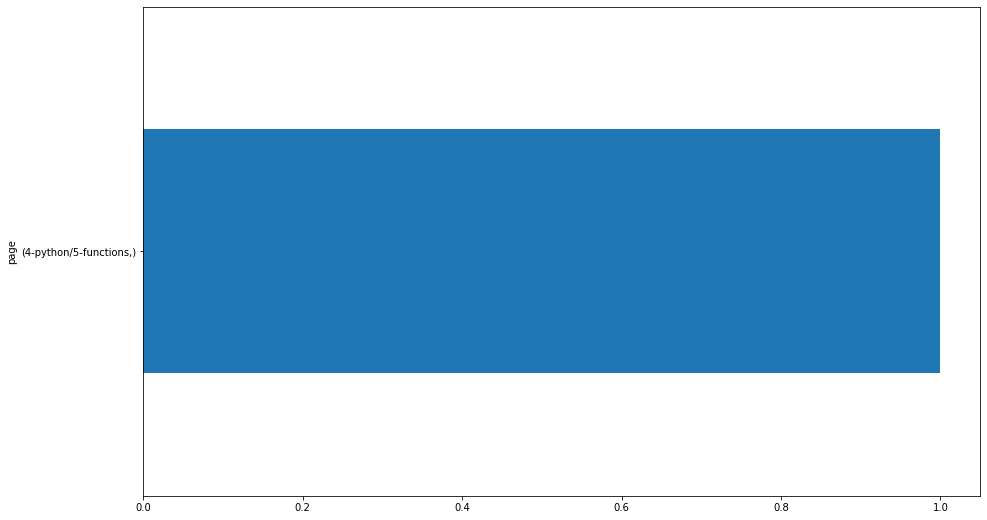


172.58.99.43
page                              
4-python/8.4.4-advanced-dataframes    1
4-python/8.4.3-dataframes             1
4-python/5-functions                  1
dtype: int64


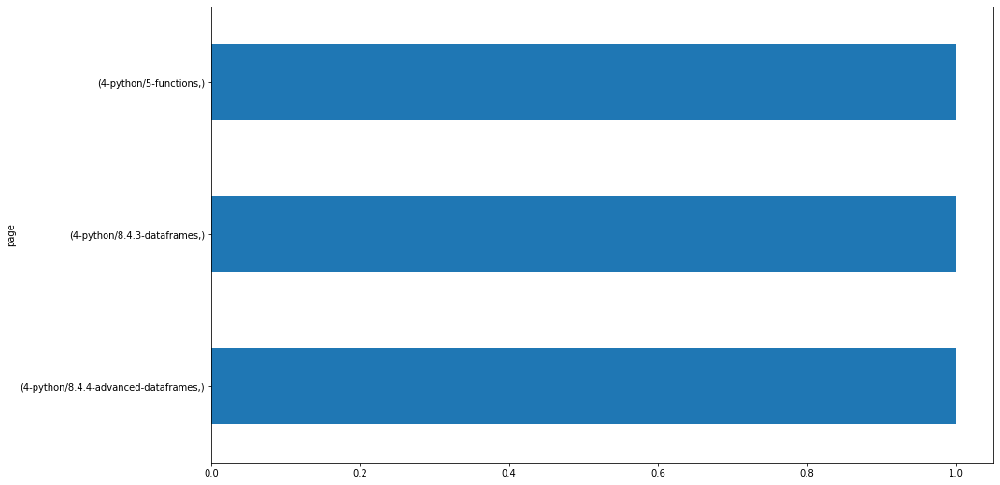


107.77.218.154
page
/       1
dtype: int64


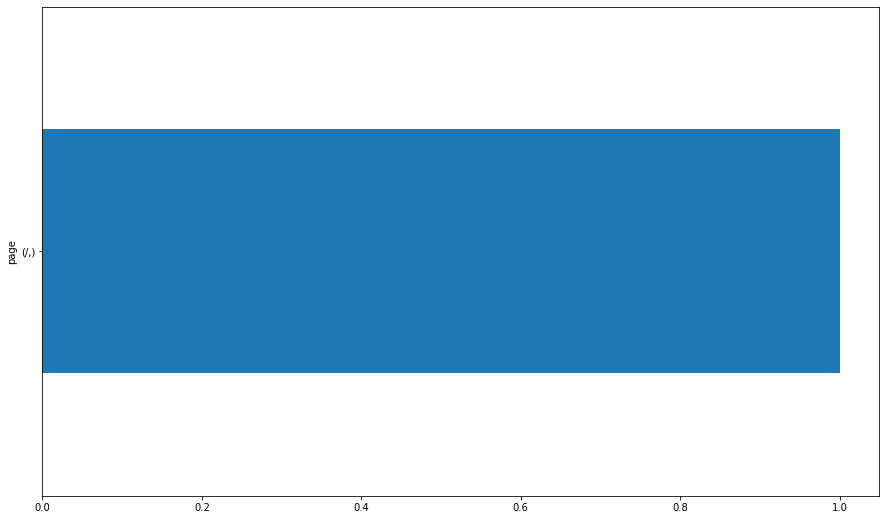


172.58.110.144
page                               
5-stats/3-probability-distributions    2
dtype: int64


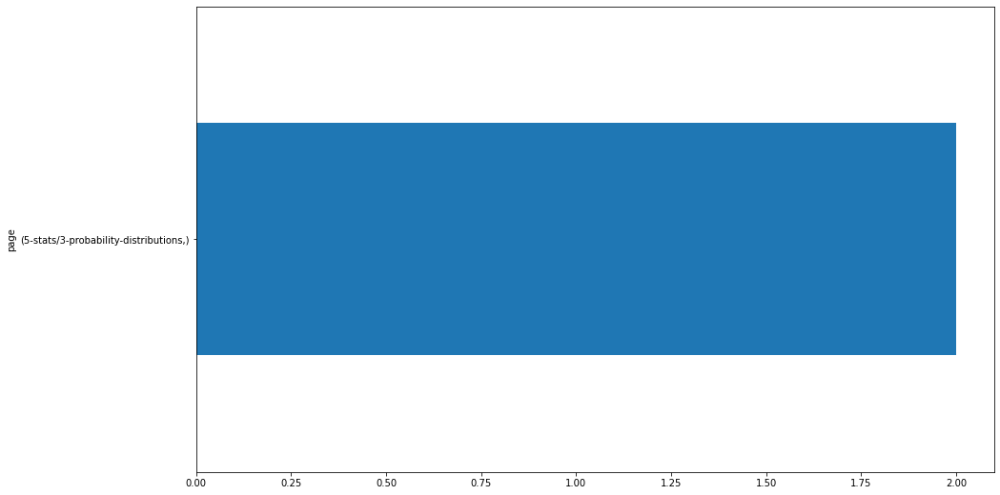


172.58.107.137
page                
4-python/5-functions    1
dtype: int64


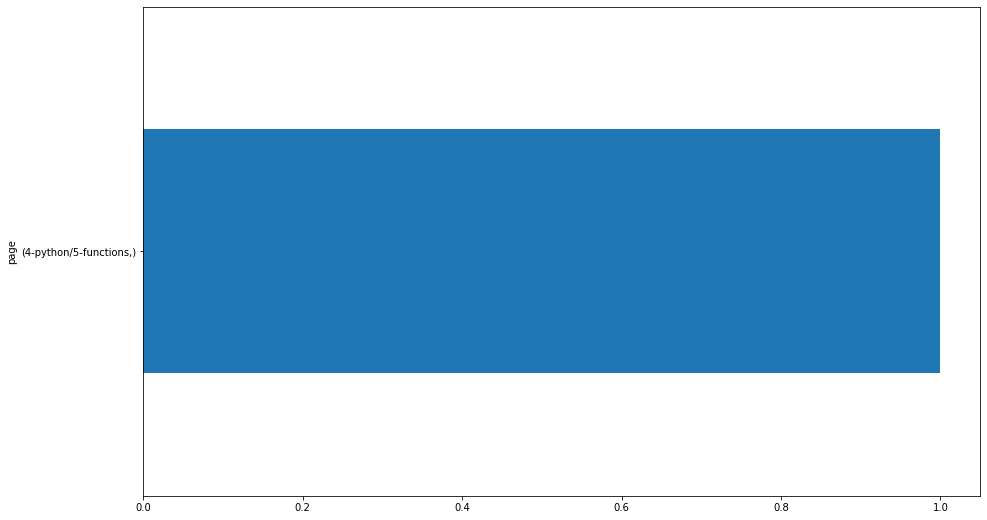


172.58.70.251
page                               
5-stats/3-probability-distributions    5
4-python/5-functions                   3
5-stats/2-simulation                   2
4-python/8.4.4-advanced-dataframes     1
dtype: int64


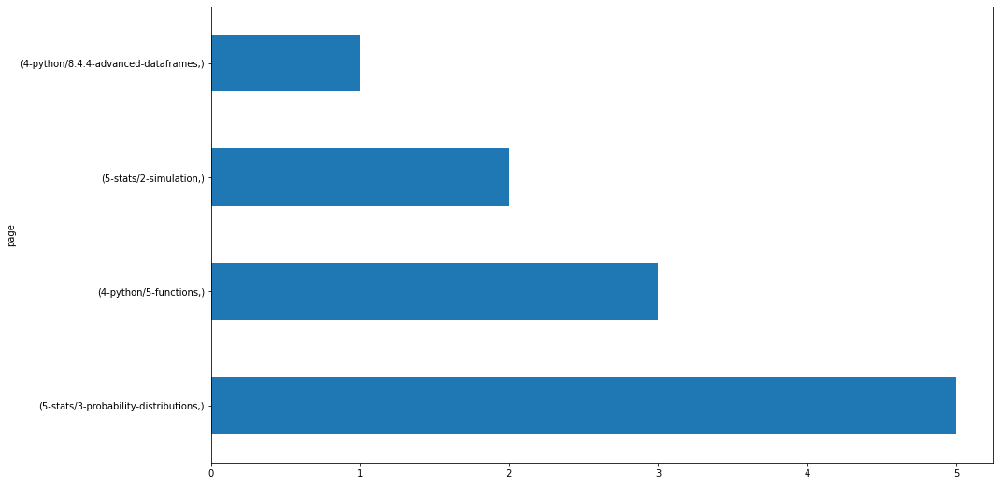


174.207.12.122
page
/       1
dtype: int64


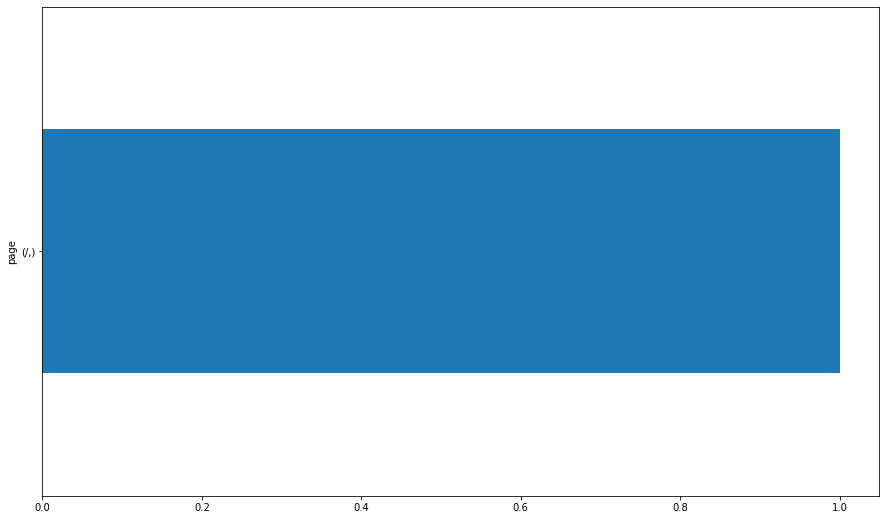


66.69.157.64
page             
3-sql/4-tables       1
3-sql/3-databases    1
/                    1
dtype: int64


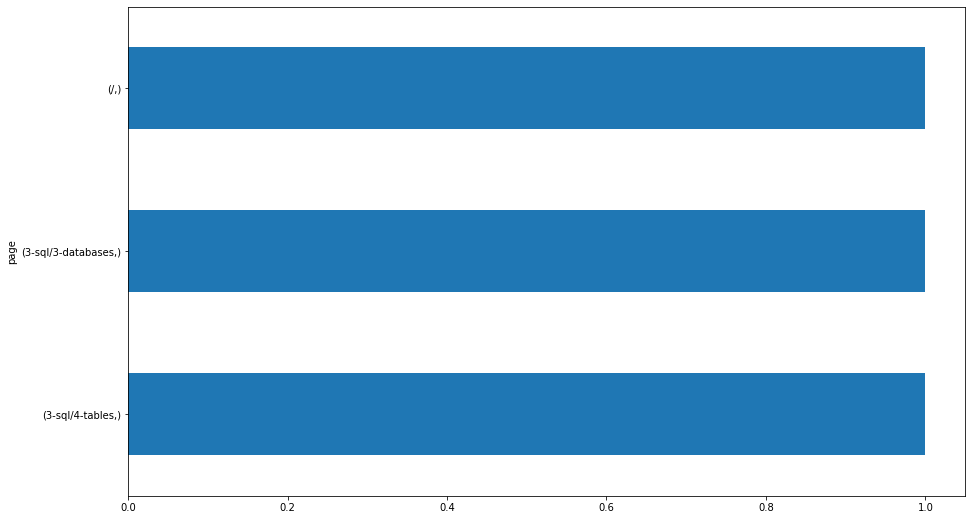


173.127.36.184
page                               
3-sql/6.3-order-by                     3
3-sql/7-functions                      2
3-sql/3-databases                      2
3-sql/5-basic-statements               2
3-sql/6.1-clauses-overview             2
3-sql/6.2-where                        2
3-sql/9.3-joins                        2
3-sql/6.4-limit                        2
4-python/project                       1
3-sql/8-group-by                       1
4-python/7-working-with-files          1
3-sql/9.1-relationships-overview       1
3-sql/9.2-indexes                      1
3-sql/9.4-subqueries                   1
4-python/2-introduction-to-python      1
4-python/3-data-types-and-variables    1
4-python/4-control-structures          1
3-sql/11-case-statements               1
dtype: int64


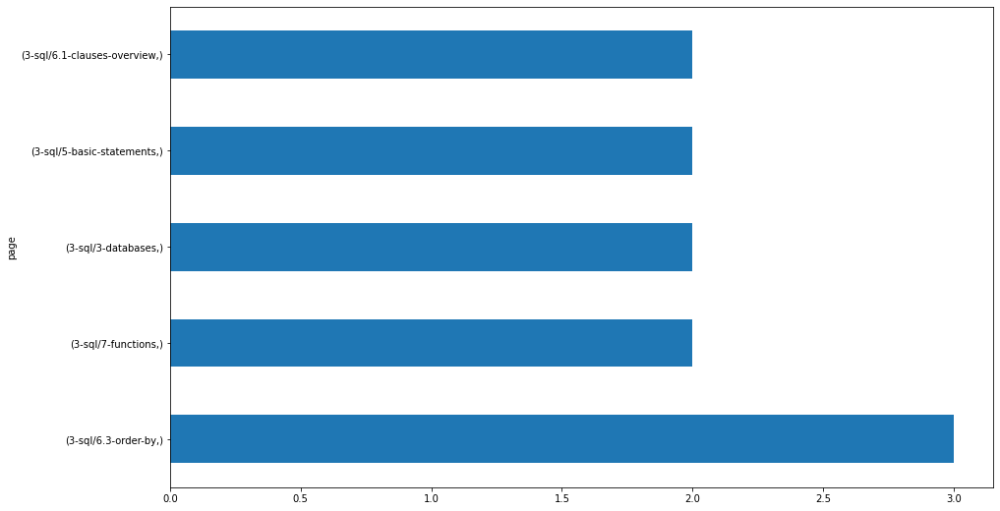


172.58.102.166
page                                         
1-fundamentals/1.1-intro-to-data-science         3
appendix/cli/6-moving-files                      2
4-python/5-functions                             2
1-fundamentals/modern-data-scientist.jpg         2
1-fundamentals/AI-ML-DL-timeline.jpg             2
appendix/cli/5-creating-files-and-directories    1
appendix/cli/3-file-paths                        1
5-stats/3-probability-distributions              1
4-python/8.4.4-advanced-dataframes               1
4-python/8.4.1-pandas-overview                   1
3-sql/database-design                            1
3-sql/1-mysql-overview                           1
dtype: int64


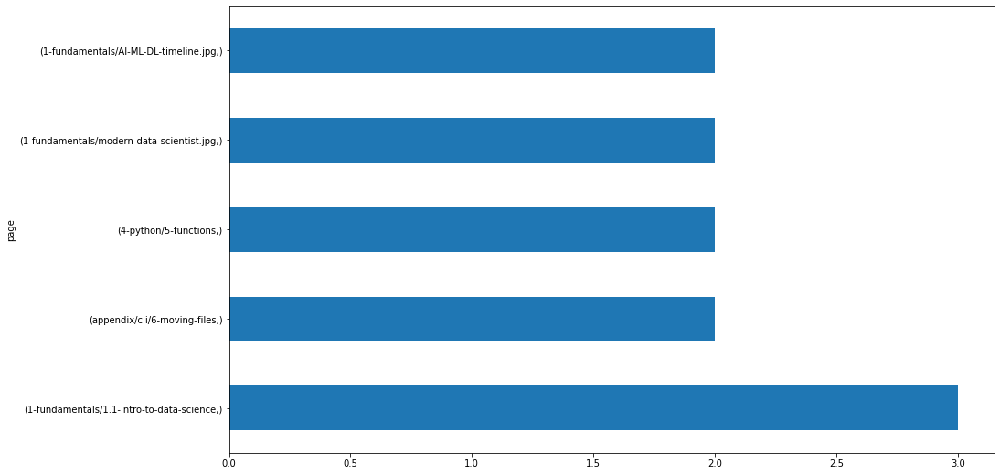


172.58.107.19
page                         
4-python/7-working-with-files    1
4-python/6-imports               1
4-python/5-functions             1
dtype: int64


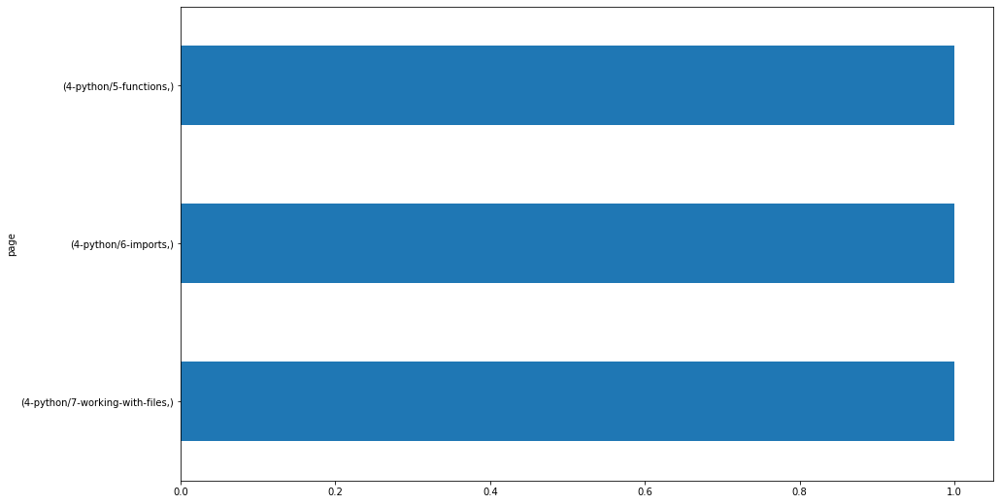


172.58.67.135
page                                   
5-stats/4.1-hypothesis-testing-overview    1
5-stats/3-probability-distributions        1
dtype: int64


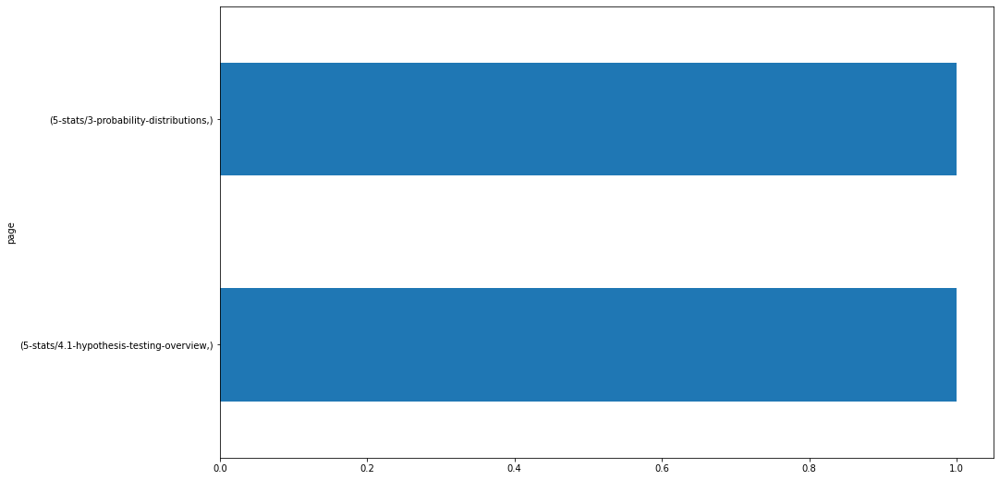


173.127.102.248
page                                   
5-stats/4.1-hypothesis-testing-overview    2
5-stats/4.2-compare-means                  1
dtype: int64


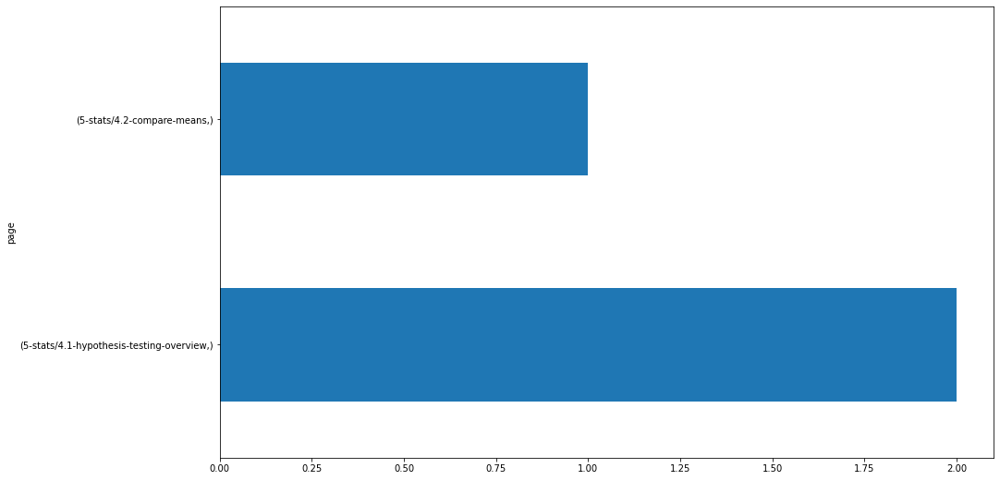


172.58.107.33
page                                   
5-stats/4.1-hypothesis-testing-overview    1
dtype: int64


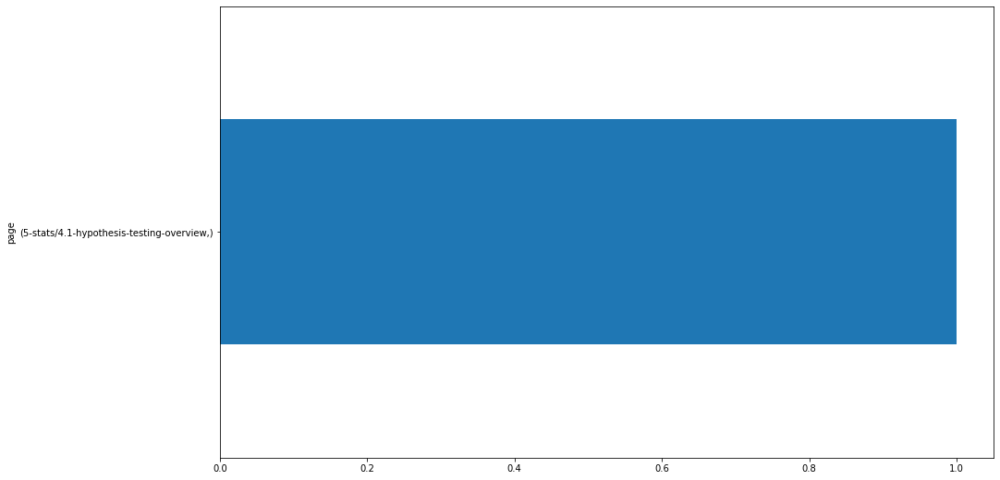


172.58.67.152
page                
4-python/5-functions    1
dtype: int64


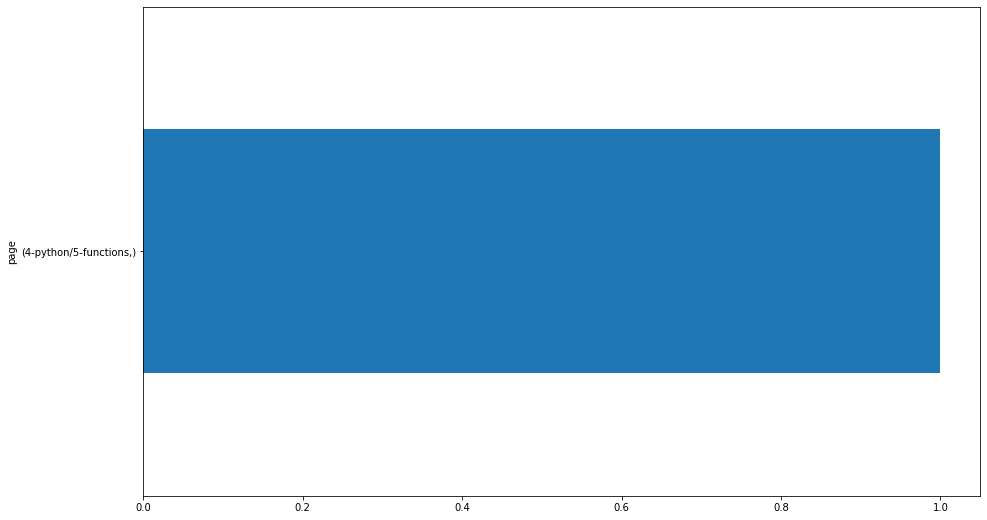


172.58.102.159
page                                   
5-stats/4.2-compare-means                  2
4-python/5-functions                       2
5-stats/4.1-hypothesis-testing-overview    1
/                                          1
dtype: int64


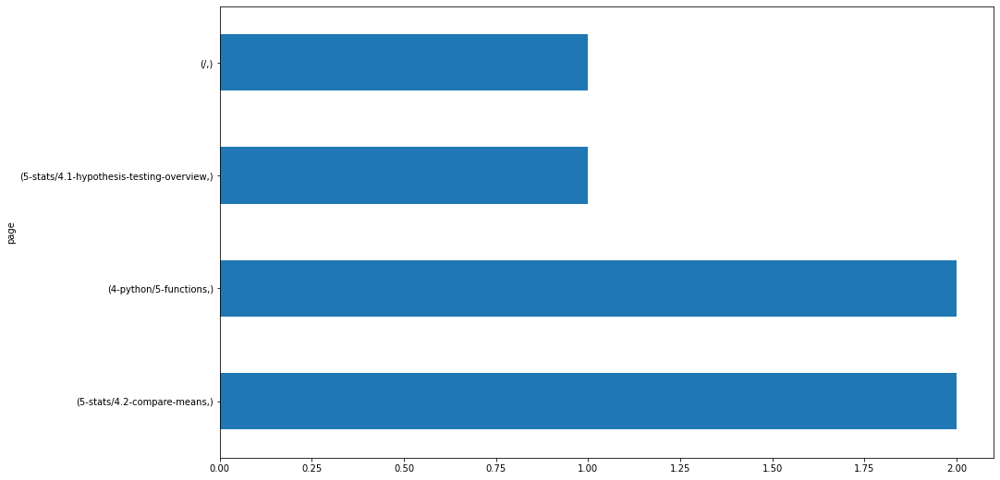


173.123.125.46
page                     
5-stats/4.2-compare-means    2
dtype: int64


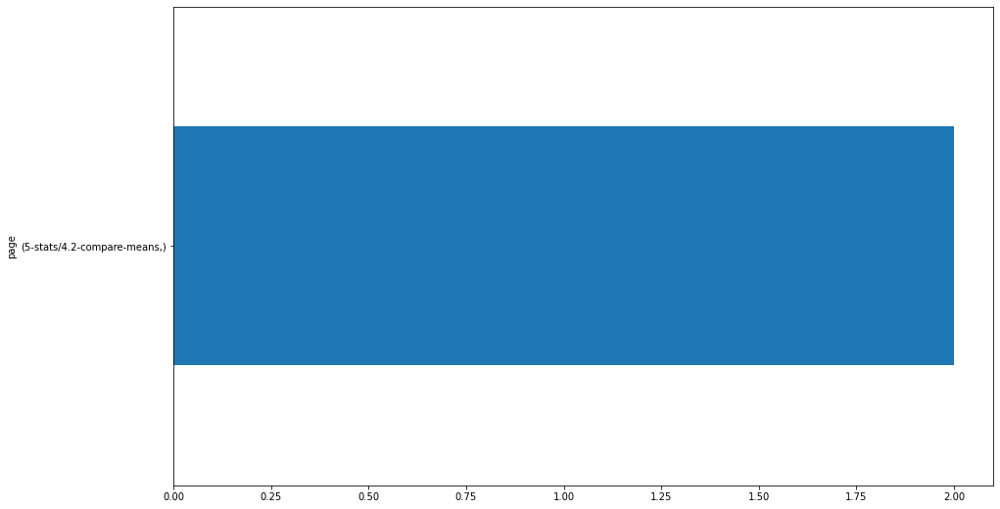


104.190.137.203
page                                             
6-regression/1-overview                              10
search/search_index.json                              7
/                                                     5
5-stats/4.1-hypothesis-testing-overview               5
7-classification/6.1-logistic-regression              4
8-clustering/project                                  4
8-clustering/3-wrangle                                3
10-anomaly-detection/1-overview                       2
10-anomaly-detection/AnomalyDetectionCartoon.jpeg     2
5-stats/Selecting_a_hypothesis_test.svg               2
5-stats/4.5-more-statistical-testing-examples         2
sql/mysql-overview                                    2
8-clustering/2-about                                  2
8-clustering/Hospital-Distance-Clusters.jpg           2
5-stats/4.2-compare-means                             2
classification/overview                               2
classification/scale_features_or_not.

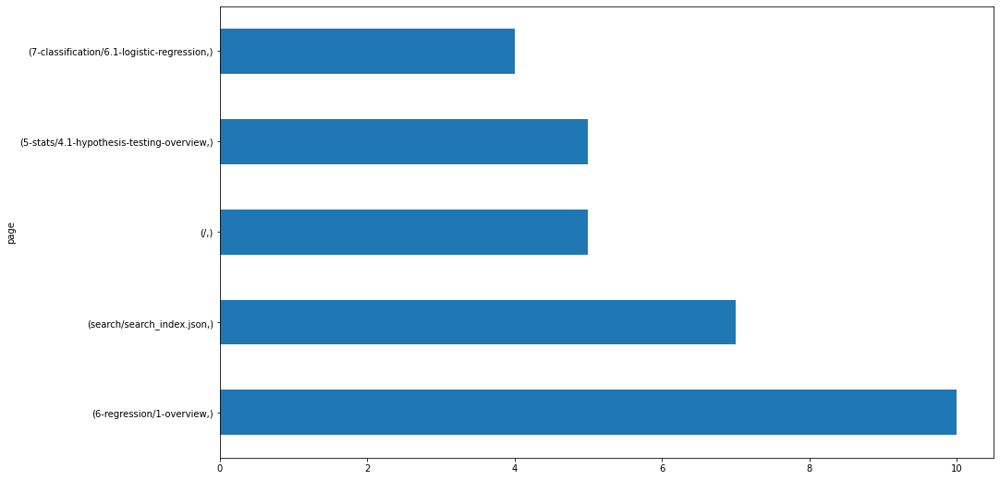


173.123.148.85
page                                   
5-stats/4.1-hypothesis-testing-overview    1
5-stats/1-overview                         1
dtype: int64


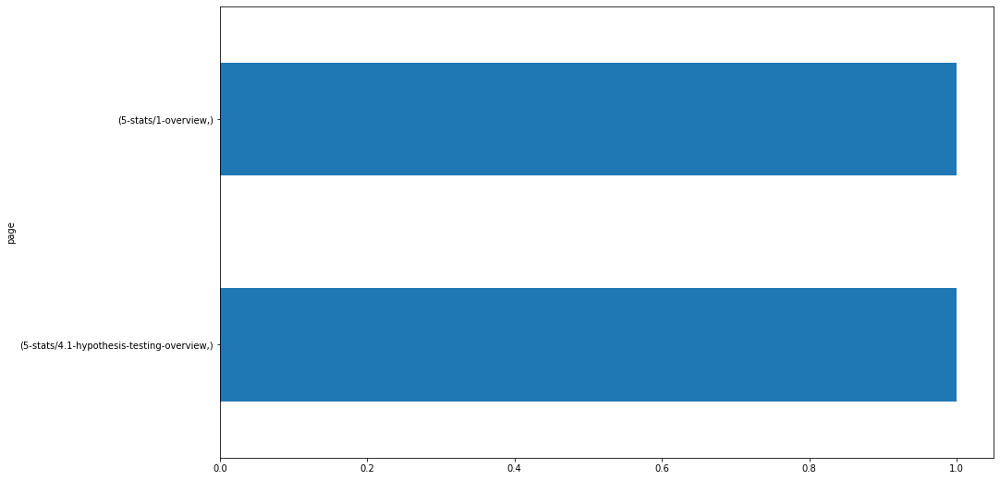


172.58.107.159
page                                   
5-stats/4.2-compare-means                  3
4-python/8.4.4-advanced-dataframes         2
5-stats/4.1-hypothesis-testing-overview    1
4-python/8.4.3-dataframes                  1
dtype: int64


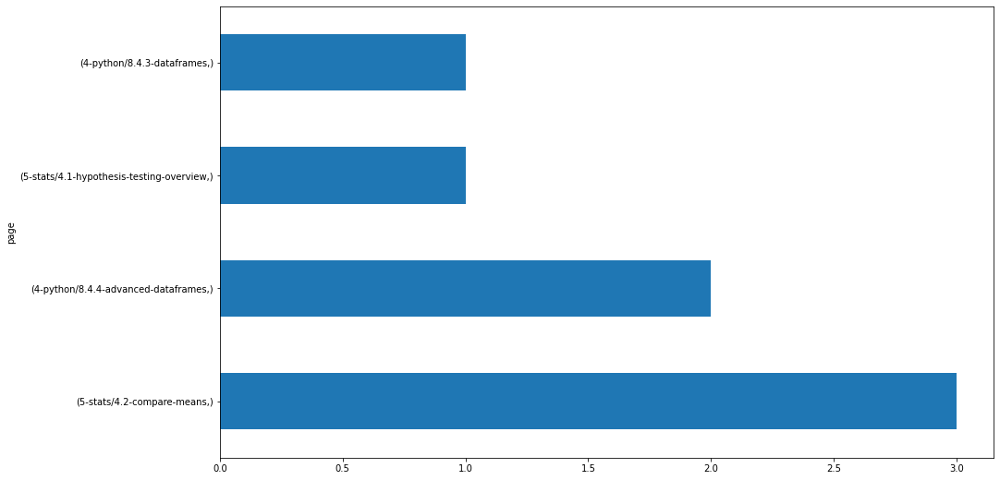


173.123.196.135
page                   
5-stats/4.3-correlation    1
dtype: int64


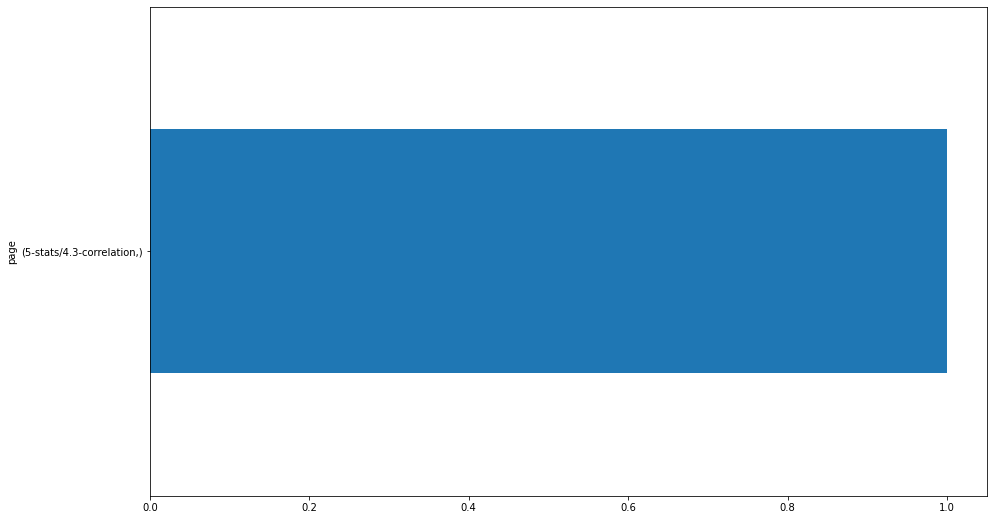


172.58.110.130
page                                       
1-fundamentals/modern-data-scientist.jpg       3
1-fundamentals/AI-ML-DL-timeline.jpg           3
1-fundamentals/1.1-intro-to-data-science       3
5-stats/4.3-correlation                        2
4-python/5-functions                           1
3-sql/1-mysql-overview                         1
2-storytelling/3.5-creating-dashboards         1
2-storytelling/3.4-creating-custom-fields      1
2-storytelling/3.3-creating-charts             1
2-storytelling/3.2-connecting-to-data          1
1-fundamentals/2.3-visualization-with-excel    1
1-fundamentals/2.2-functions                   1
1-fundamentals/2.1-spreadsheets-overview       1
dtype: int64


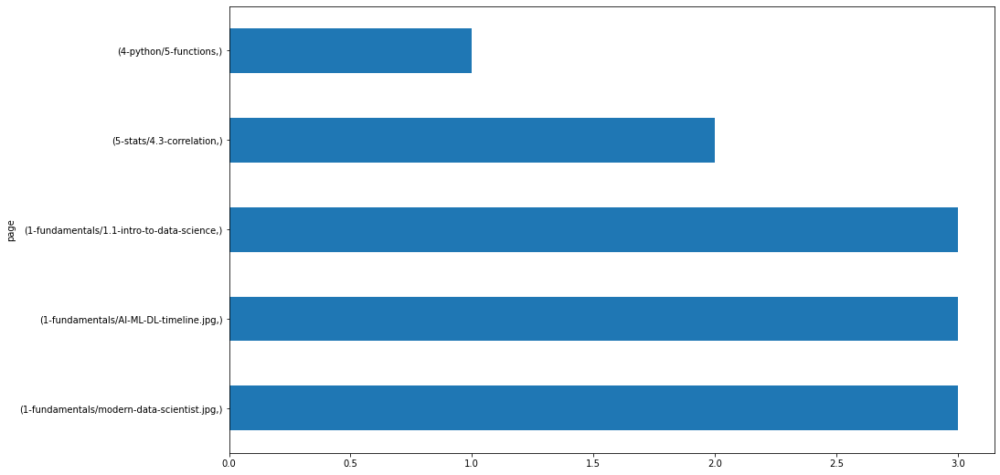


173.123.44.116
page                         
4-python/8.3-intro-to-numpy      1
4-python/7-working-with-files    1
4-python/6-imports               1
4-python/4-control-structures    1
dtype: int64


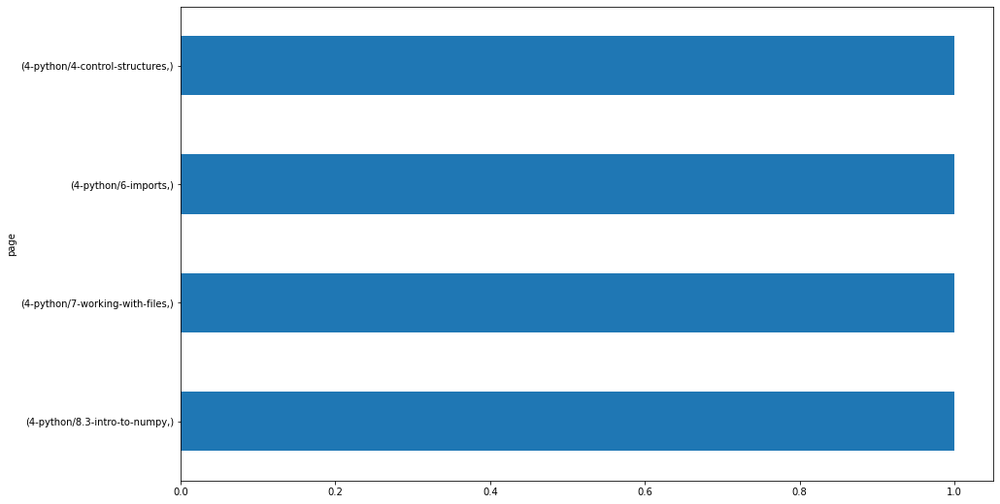


172.58.107.67
page                              
4-python/8.4.4-advanced-dataframes    5
4-python/8.4.3-dataframes             3
3-sql/7-functions                     2
search/search_index.json              1
4-python/8.5-intro-to-seaborn         1
4-python/5-functions                  1
3-sql/4-tables                        1
3-sql/12-more-exercises               1
3-sql/10-temporary-tables             1
dtype: int64


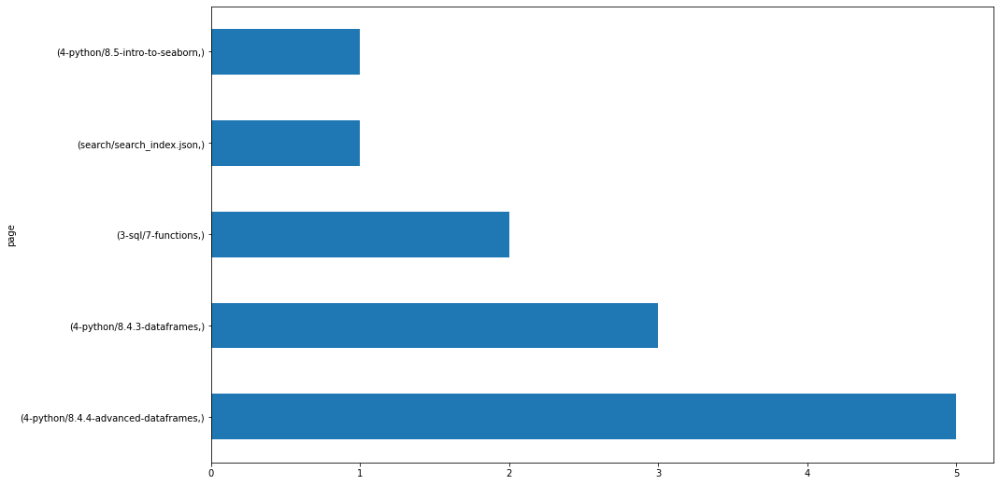


172.58.107.94
page                                
5-stats/4.4-compare-group-membership    2
4-python/5-functions                    1
3-sql/9.3-joins                         1
3-sql/6.2-where                         1
dtype: int64


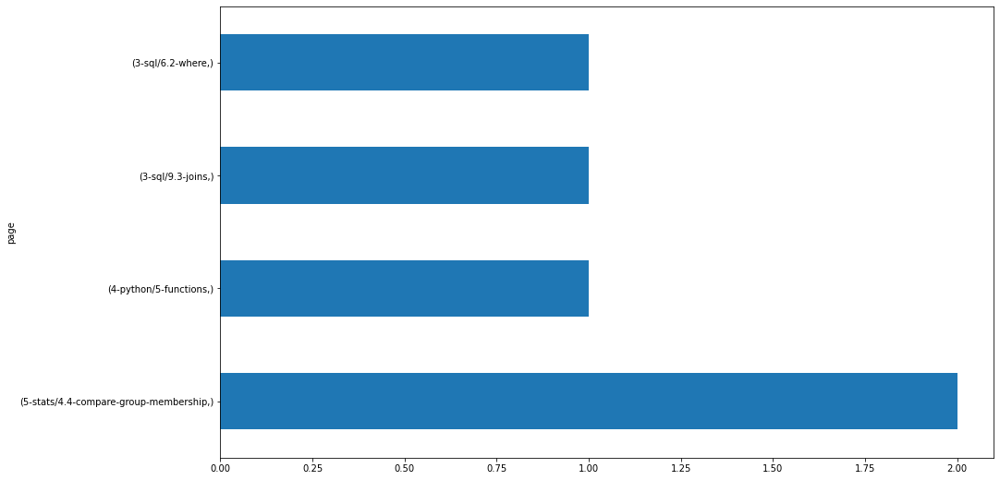


174.244.80.215
page
/       2
dtype: int64


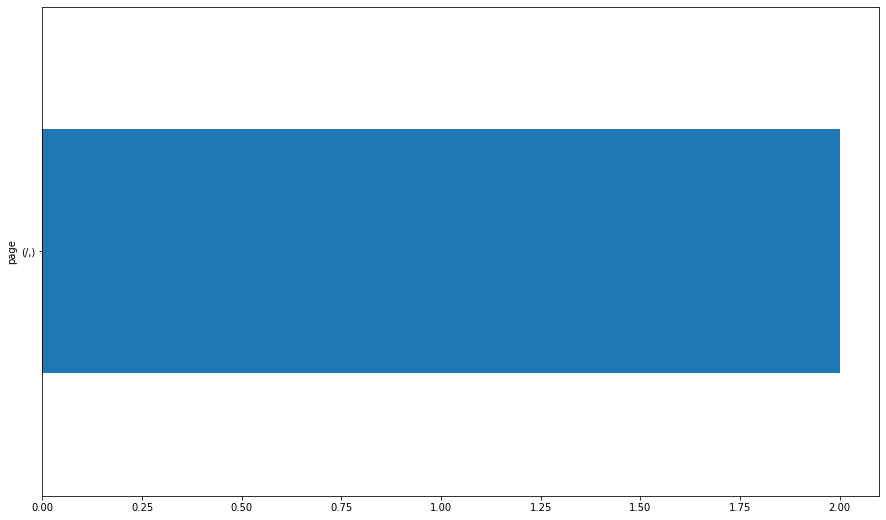


184.203.11.216
page                               
5-stats/2-simulation                   2
5-stats/3-probability-distributions    1
5-stats/1-overview                     1
dtype: int64


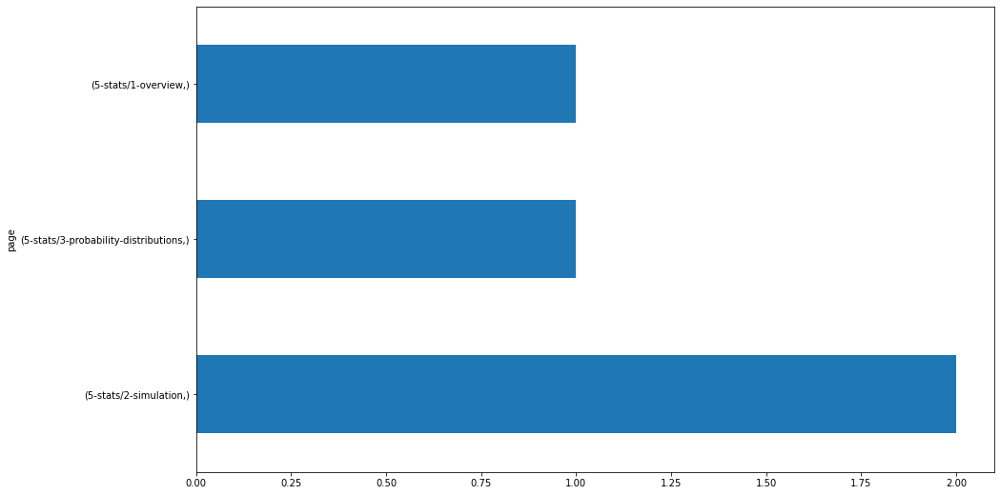


172.58.99.70
page                                 
4.5-more-statistical-testing-examples    2
5-stats/4.2-compare-means                1
3-sql/12-more-exercises                  1
dtype: int64


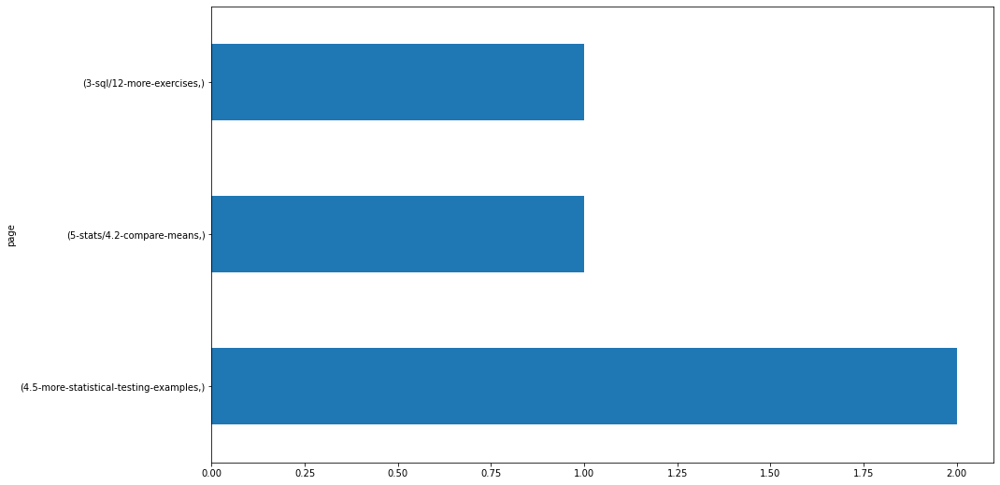


172.58.107.109
page                                         
4-python/5-functions                             5
5-stats/2-simulation                             4
5-stats/4.3-correlation                          2
5-stats/4.2-compare-means                        2
5-stats/4.1-hypothesis-testing-overview          2
5-stats/3-probability-distributions              2
6-regression/1-overview                          1
5-stats/Selecting_a_hypothesis_test.svg          1
5-stats/4.5-more-statistical-testing-examples    1
5-stats/4.4-compare-group-membership             1
5-stats/1-overview                               1
dtype: int64


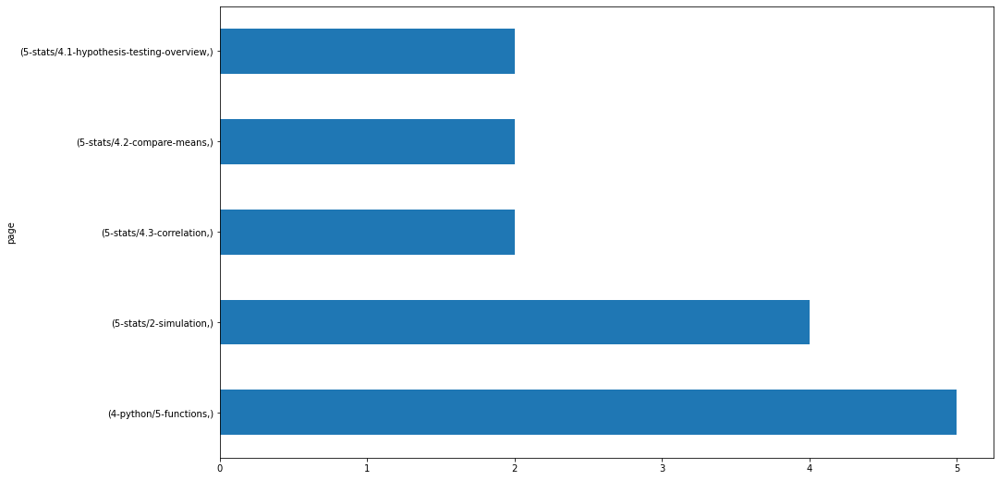


167.24.104.150
page                               
/                                      4
search/search_index.json               1
7-classification/6.2-decision-trees    1
4-python/8.4.2-series                  1
dtype: int64


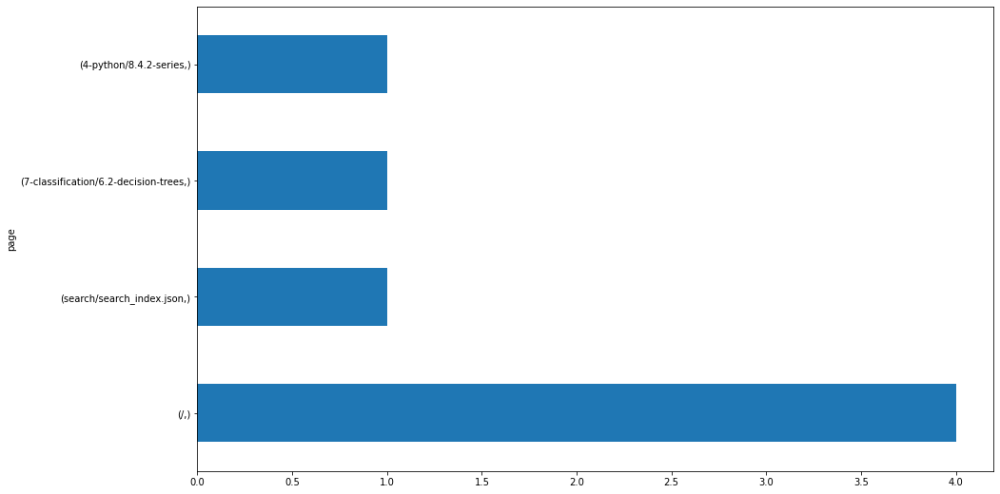


172.58.99.181
page                                   
5-stats/4.1-hypothesis-testing-overview    2
5-stats/4.4-compare-group-membership       1
4-python/5-functions                       1
dtype: int64


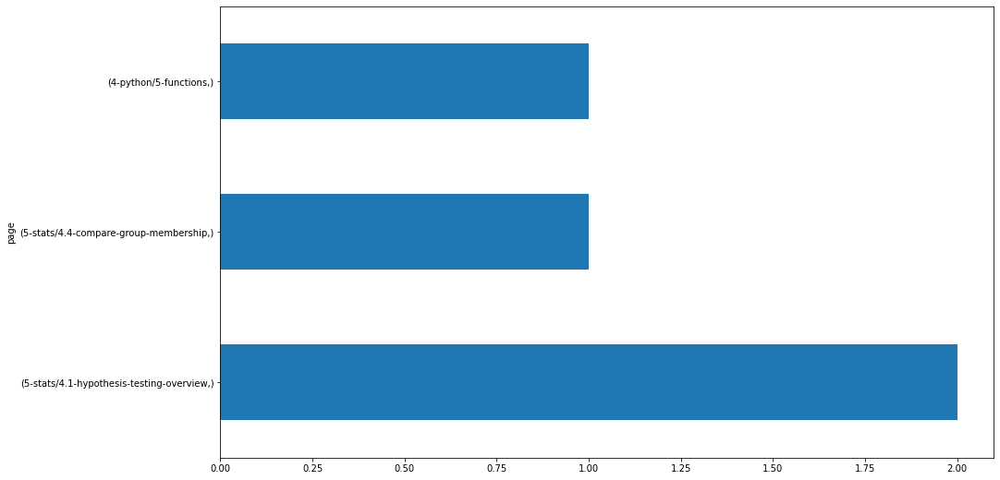


172.58.107.192
page                            
6-regression/3.0-split-and-scale    1
dtype: int64


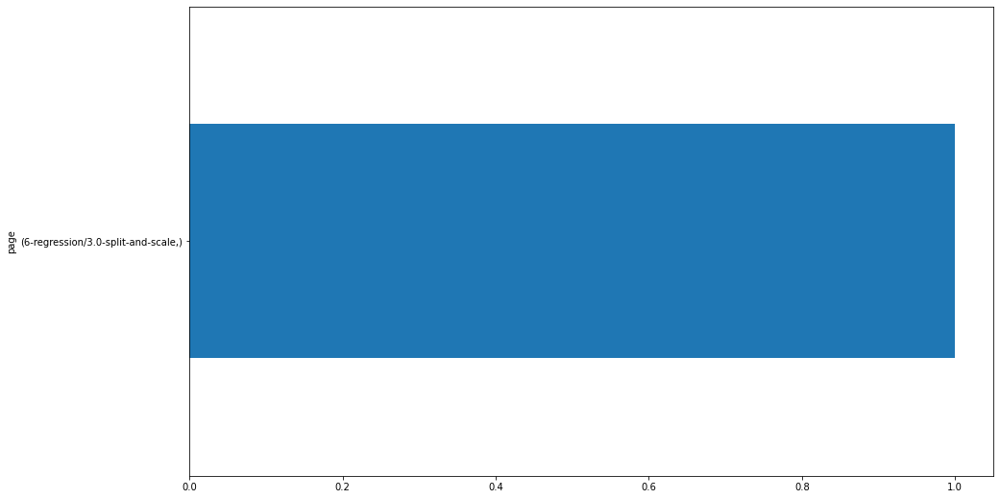


172.58.107.117
page                                    
6-regression/4.0-explore                    2
6-regression/3.0-split-and-scale            2
4-python/5-functions                        2
6-regression/5.0-evaluate                   1
6-regression/2.0-acquire-and-prep           1
6-regression/1-overview                     1
4-python/3-data-types-and-variables         1
3-sql/7-functions                           1
3-sql/5-basic-statements                    1
3-sql/2-mysql-introduction                  1
3-sql/1-mysql-overview                      1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/2.2-functions                1
1-fundamentals/2.1-spreadsheets-overview    1
1-fundamentals/1.2-data-science-pipeline    1
/                                           1
dtype: int64


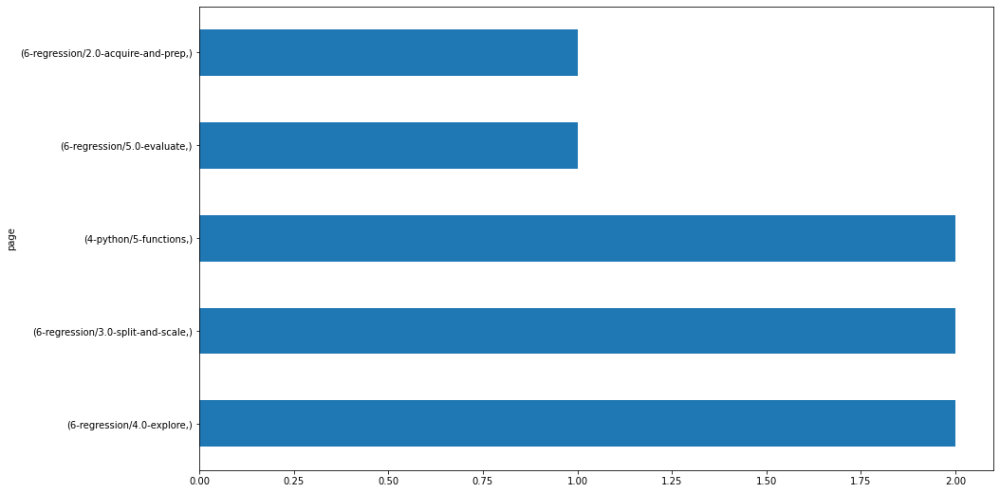


172.58.99.90
page                               
6-regression/8.0-Project               1
6-regression/1-overview                1
4-python/3-data-types-and-variables    1
4-python/2-introduction-to-python      1
3-sql/3-databases                      1
3-sql/2-mysql-introduction             1
3-sql/1-mysql-overview                 1
dtype: int64


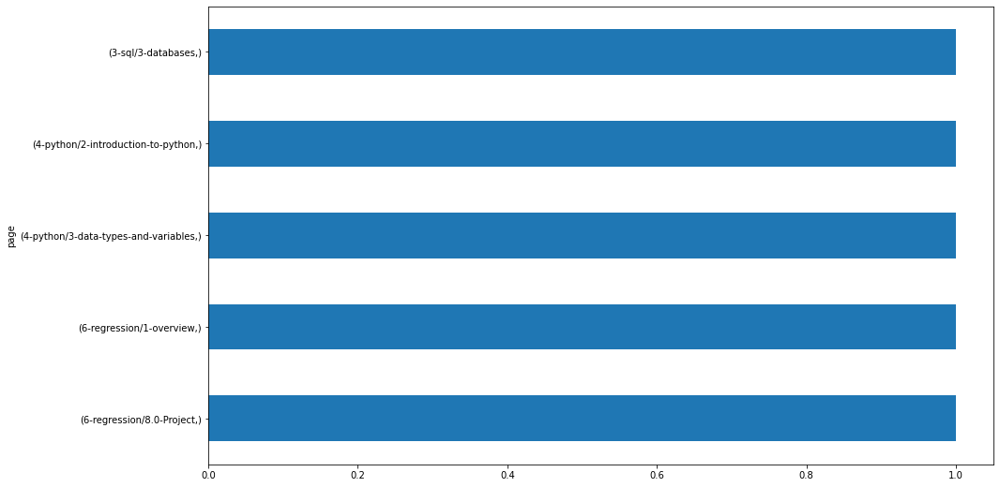


172.58.67.142
page                            
6-regression/1-overview             3
4-python/8.2-intro-to-matplotlib    2
6-regression/5.0-evaluate           1
6-regression/4.0-explore            1
4-python/8.5-intro-to-seaborn       1
4-python/8.3-intro-to-numpy         1
4-python/5-functions                1
3-sql/1-mysql-overview              1
dtype: int64


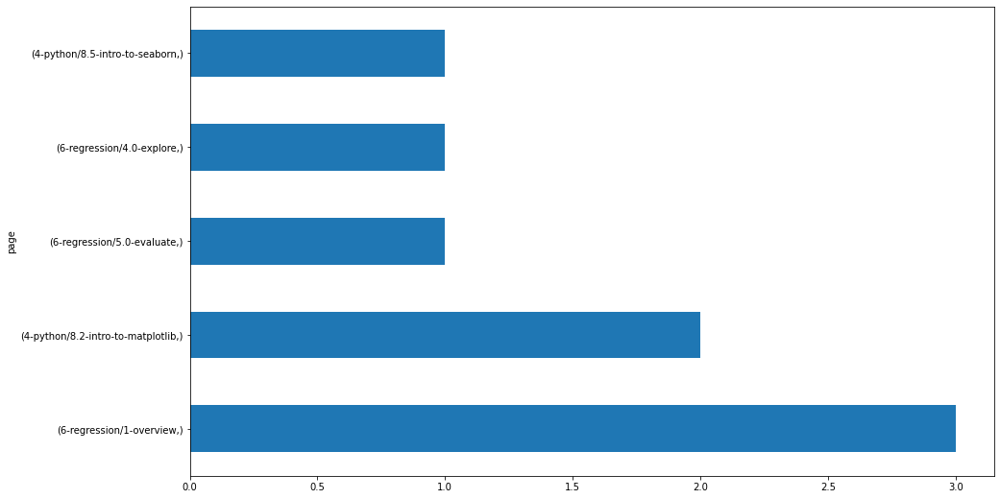


68.206.101.245
page                                             
/                                                    4
10-anomaly-detection/1-overview                      4
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    4
11-nlp/3-acquire                                     4
6-regression/1-overview                              4
12-distributed-ml/4-wrangle                          2
1-fundamentals/1.1-intro-to-data-science             2
1-fundamentals/AI-ML-DL-timeline.jpg                 2
1-fundamentals/modern-data-scientist.jpg             2
12-distributed-ml/3-spark-api                        1
6-regression/2.0-acquire-and-prep                    1
3-sql/11-case-statements                             1
3-sql/4-tables                                       1
3-sql/5-basic-statements                             1
3-sql/6.2-where                                      1
3-sql/7-functions                                    1
3-sql/9.2-indexes                                    1

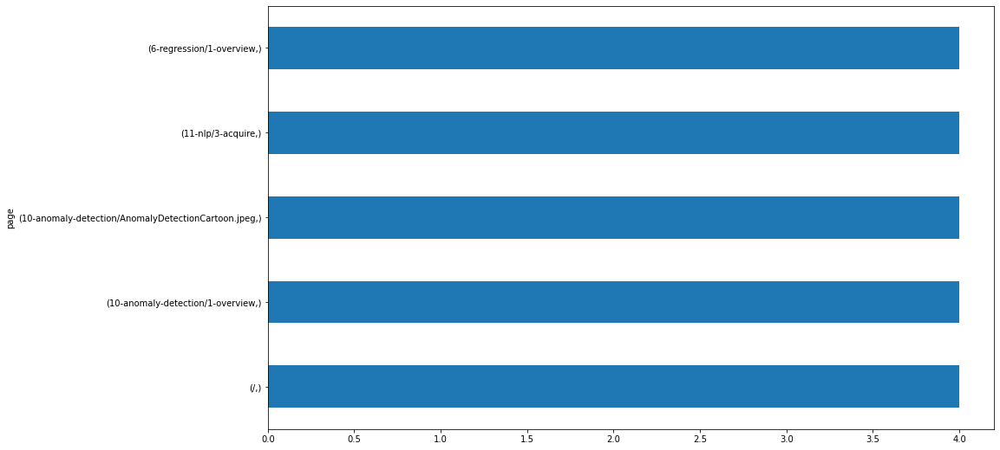


172.58.99.75
page                                
6-regression/6.0-feature-engineering    1
6-regression/5.0-evaluate               1
5-stats/4.2-compare-means               1
dtype: int64


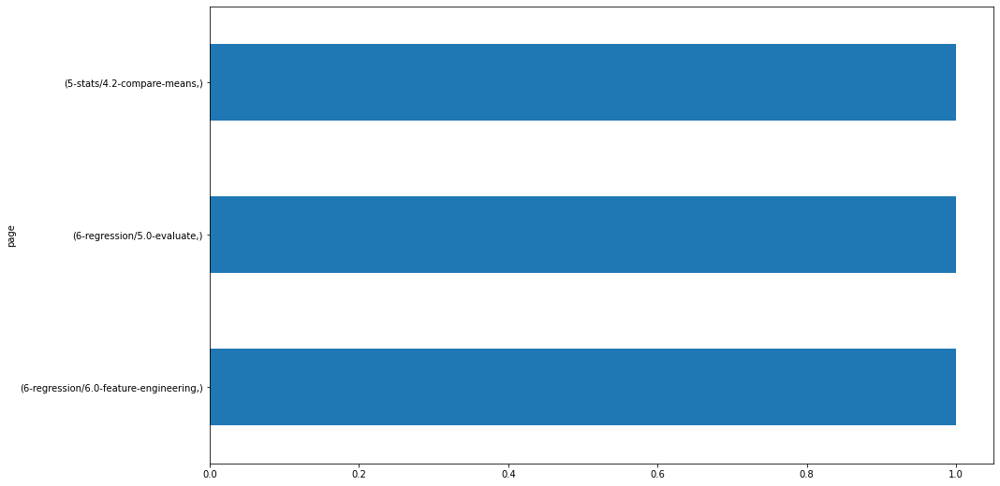


173.175.100.201
page                                 
/                                        40
6-regression/1-overview                  10
5-stats/4.2-compare-means                 8
6-regression/5.0-evaluate                 8
8-clustering/3-wrangle                    8
                                         ..
3-sql/9.3-joins                           1
13-advanced-topics/3.4-intro-to-flask     1
13-advanced-topics/1-tidy-data            1
12-distributed-ml/6-ml-with-spark         1
sql/mysql-overview                        1
Length: 97, dtype: int64


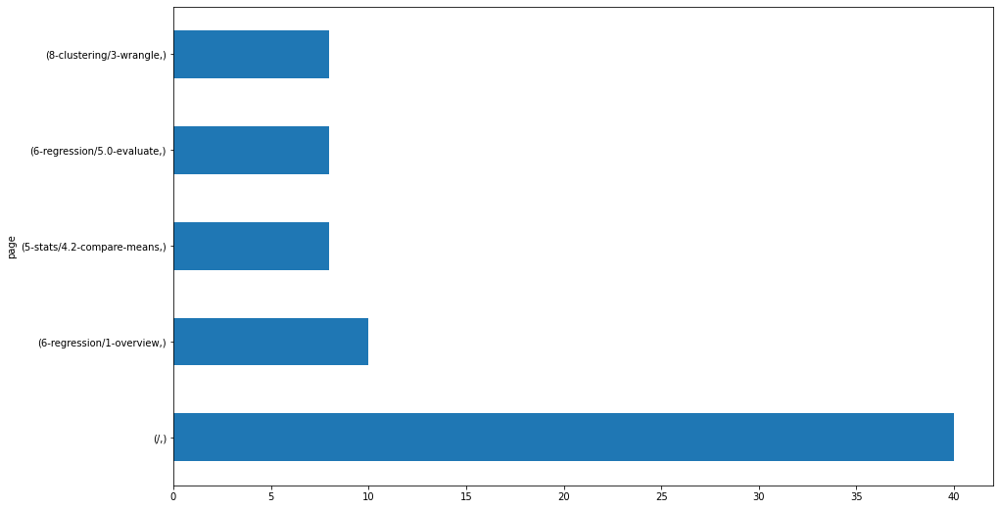


172.58.99.80
page                         
6-regression/5.0-evaluate        2
6-regression/4.0-explore         1
6-regression/1-overview          1
4-python/8.5-intro-to-seaborn    1
3-sql/1-mysql-overview           1
dtype: int64


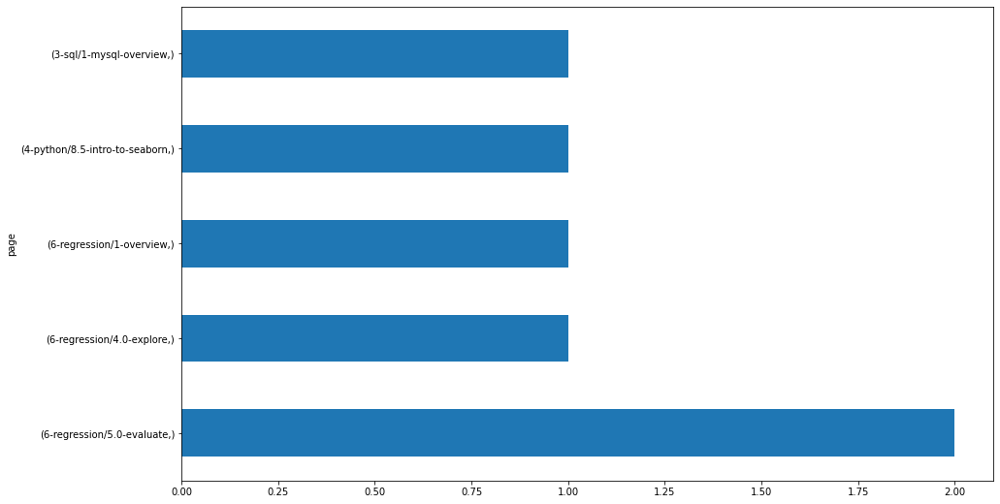


172.58.99.199
page                                         
appendix/cli/2-listing-files                     3
appendix/cli/4-navigating-the-filesystem         2
appendix/cli/1-intro                             2
appendix/cli/0-overview                          2
appendix/cli/7-more-topics                       1
appendix/cli/6-moving-files                      1
appendix/cli/5-creating-files-and-directories    1
appendix/cli/3-file-paths                        1
6-regression/6.0-feature-engineering             1
6-regression/1-overview                          1
4-python/type-annotations                        1
4-python/custom-sorting-functions                1
4-python/5-functions                             1
3-sql/database-design                            1
3-sql/1-mysql-overview                           1
dtype: int64


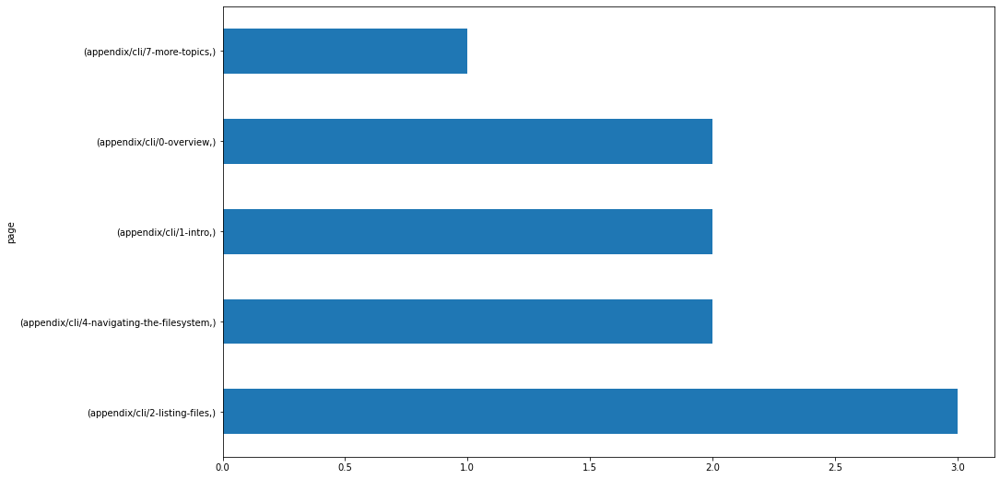


172.58.107.146
page                
4-python/5-functions    1
dtype: int64


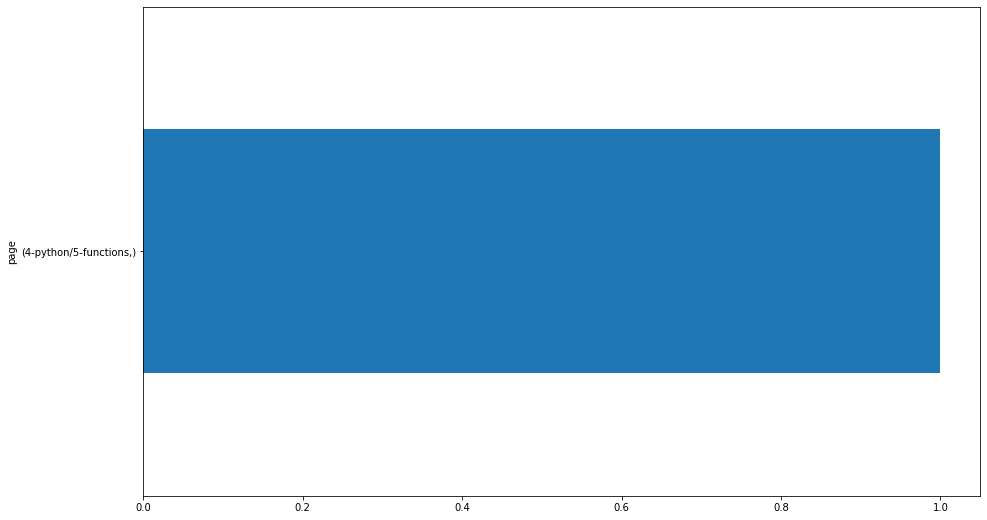


172.58.102.237
page                                
6-regression/6.0-feature-engineering    4
6-regression/3.0-split-and-scale        2
6-regression/1-overview                 2
6-regression/7.0-model                  1
6-regression/2.0-acquire-and-prep       1
4-python/8.4.4-advanced-dataframes      1
4-python/5-functions                    1
3-sql/1-mysql-overview                  1
dtype: int64


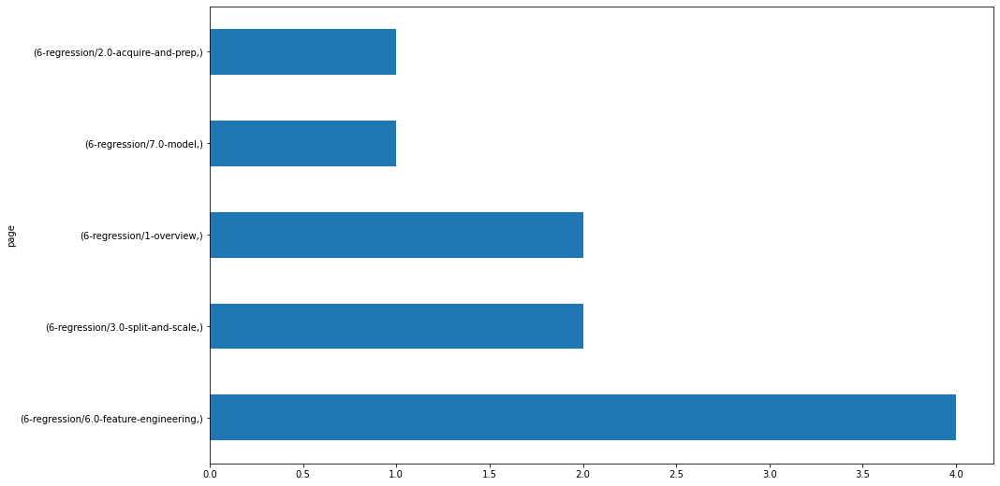


72.178.116.29
page                                               
/                                                      15
10-anomaly-detection/1-overview                        12
10-anomaly-detection/AnomalyDetectionCartoon.jpeg      12
11-nlp/2-regular-expressions                            8
8-clustering/project                                    8
                                                       ..
5-stats/4.1-hypothesis-testing-overview                 1
4-python/8.4.4-advanced-dataframes                      1
appendix/professional-development/cover-letter-copy     1
2-storytelling/3-tableau                                1
6-regression/5-evaluate                                 1
Length: 89, dtype: int64


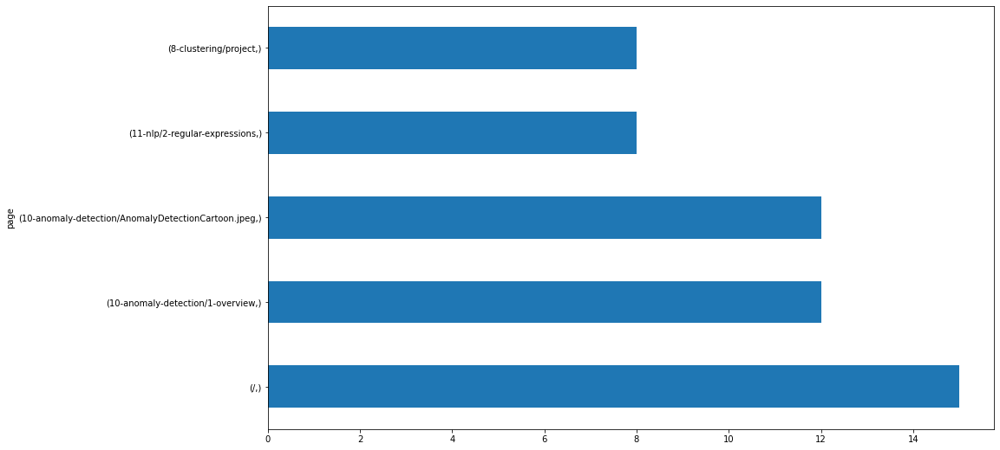


172.58.110.171
page                            
6-regression/3.0-split-and-scale    1
dtype: int64


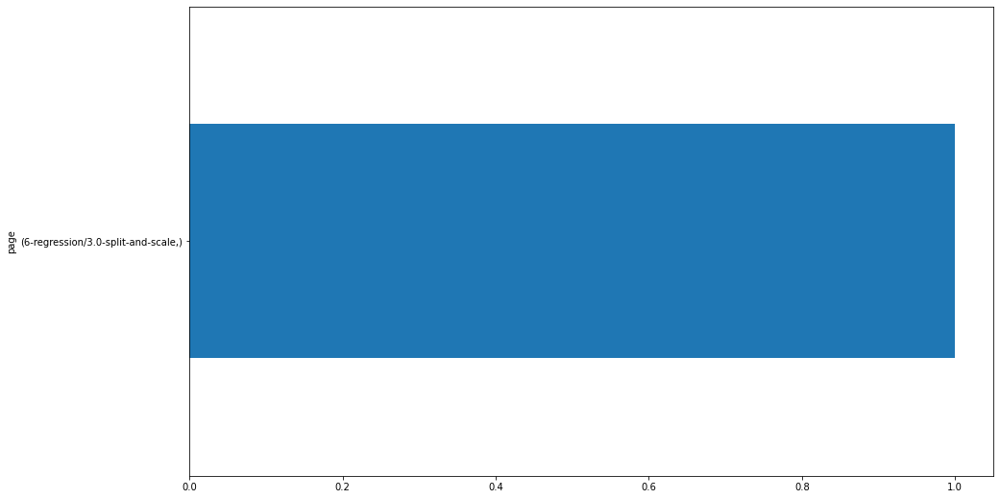


172.58.107.177
page                                
6-regression/7.0-model                  4
6-regression/8.0-Project                2
6-regression/6.0-feature-engineering    2
6-regression/2.0-acquire-and-prep       1
dtype: int64


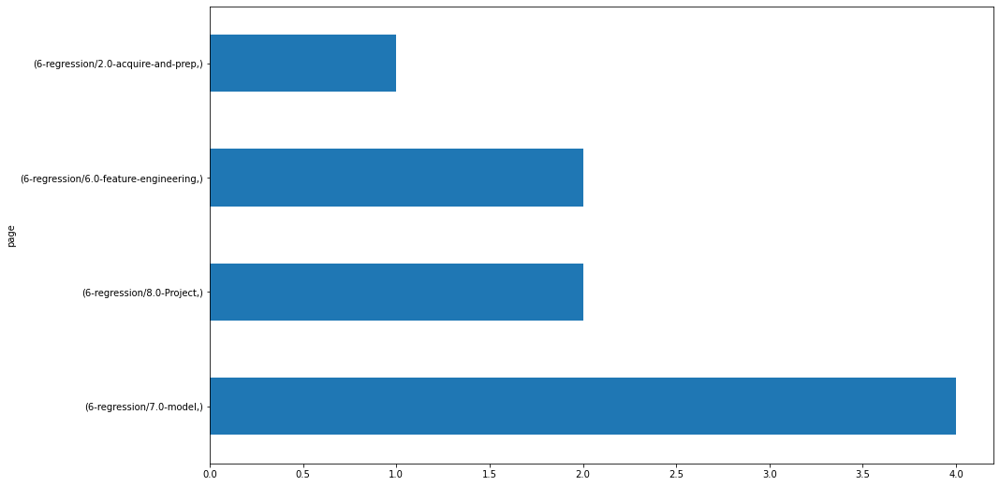


172.58.110.170
page                    
6-regression/8.0-Project    2
dtype: int64


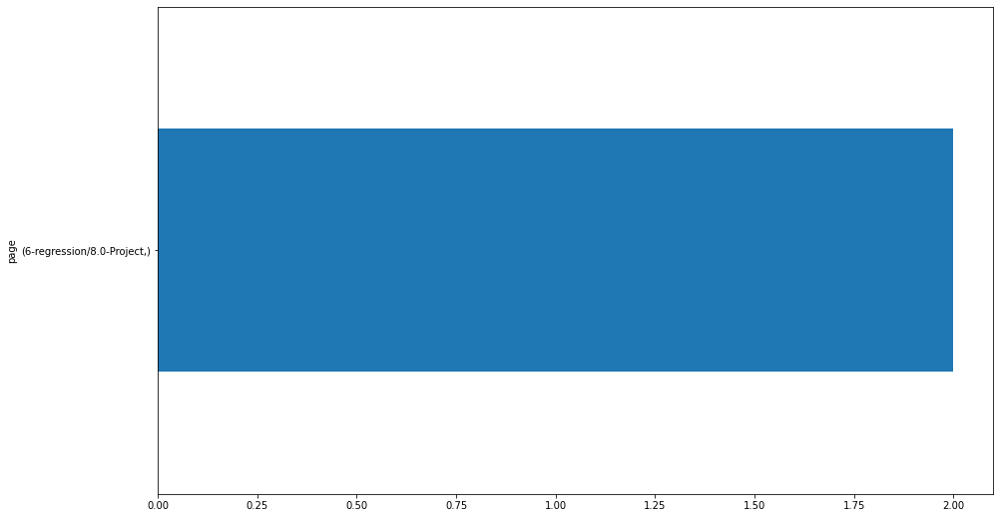


172.58.107.226
page                                    
3-sql/7-functions                           2
appendix/cli/6-moving-files                 1
appendix/cli/4-navigating-the-filesystem    1
appendix/cli/3-file-paths                   1
6-regression/8.0-Project                    1
6-regression/1-overview                     1
4-python/5-functions                        1
3-sql/database-design                       1
3-sql/1-mysql-overview                      1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


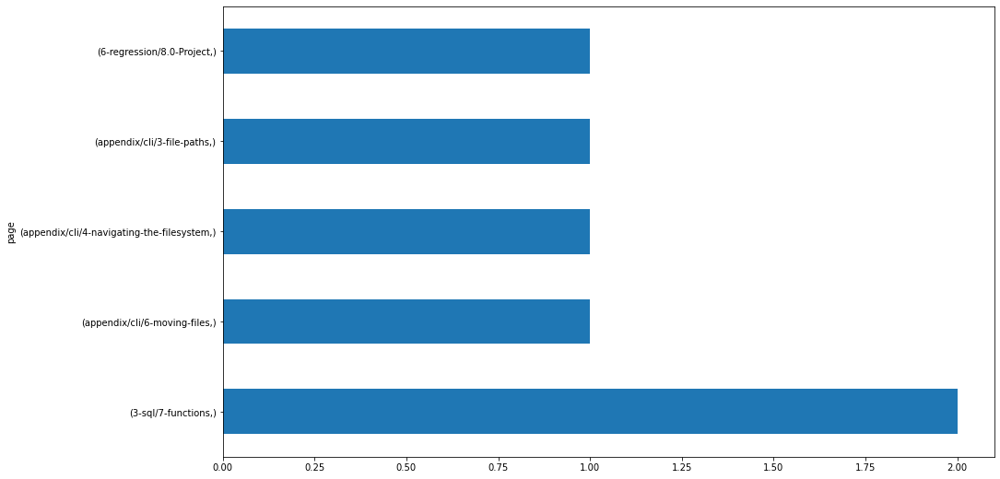


172.58.107.252
page                          
6-regression/8-project            2
6-regression/3-split-and-scale    1
6-regression/1-overview           1
4-python/5-functions              1
dtype: int64


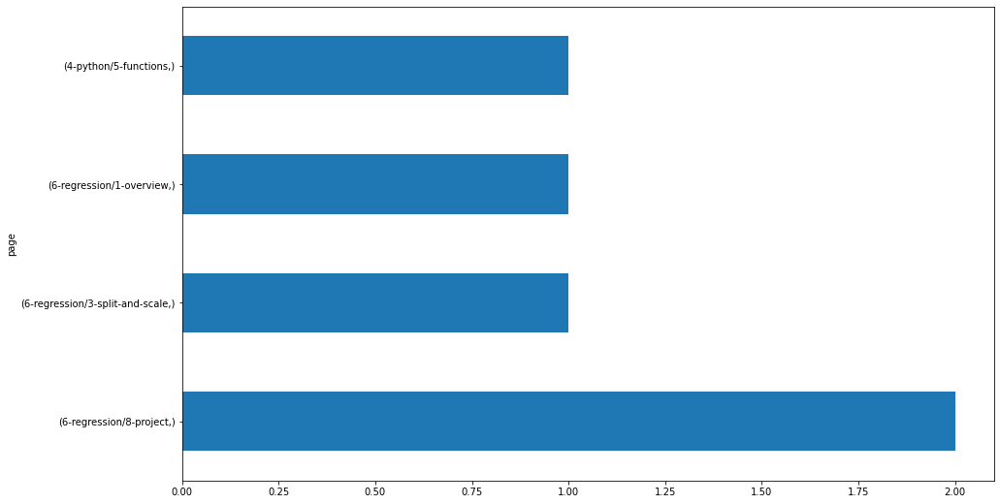


172.58.99.176
page                              
6-regression/7-model                  1
6-regression/6-feature-engineering    1
6-regression/5-evaluate               1
6-regression/4-explore                1
dtype: int64


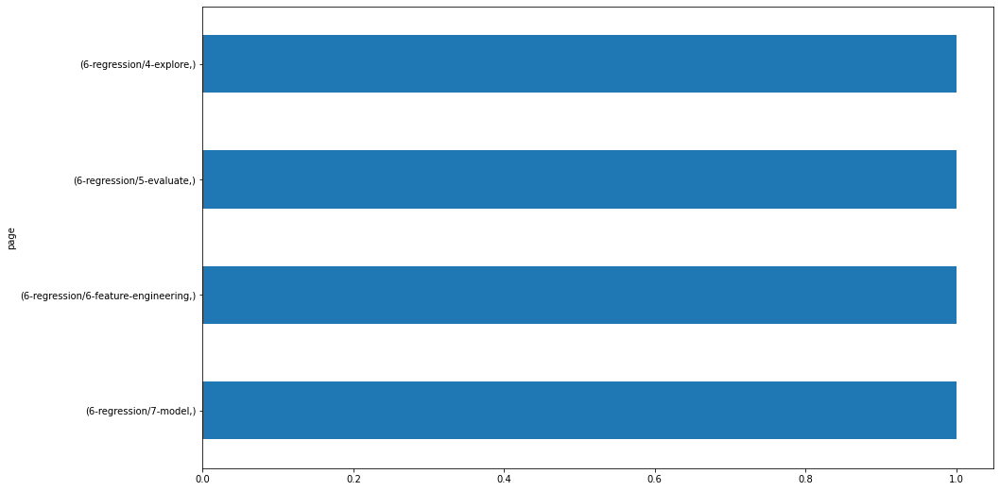


172.58.67.23
page                                   
5-stats/4.3-correlation                    2
5-stats/4.2-compare-means                  2
5-stats/4.1-hypothesis-testing-overview    1
3-sql/1-mysql-overview                     1
dtype: int64


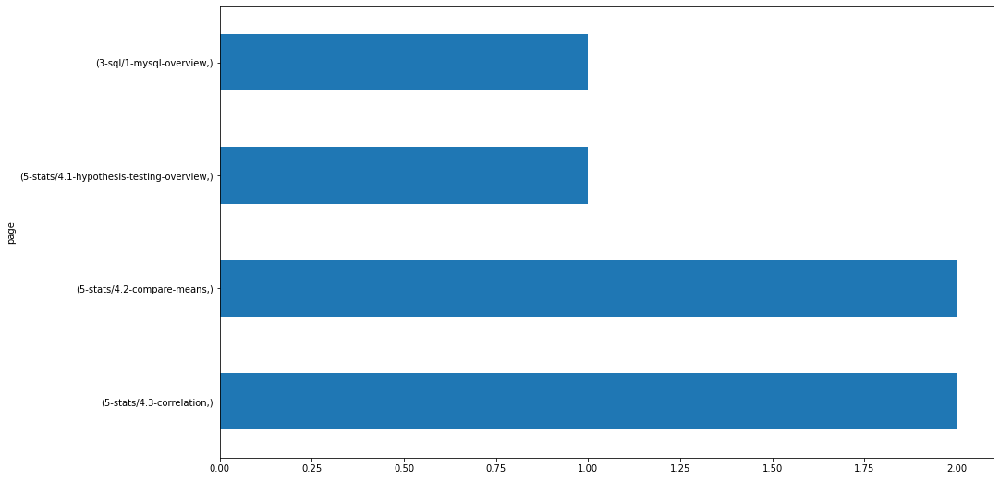


45.26.51.187
page                                    
appendix/ds-environment-setup               3
/                                           3
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


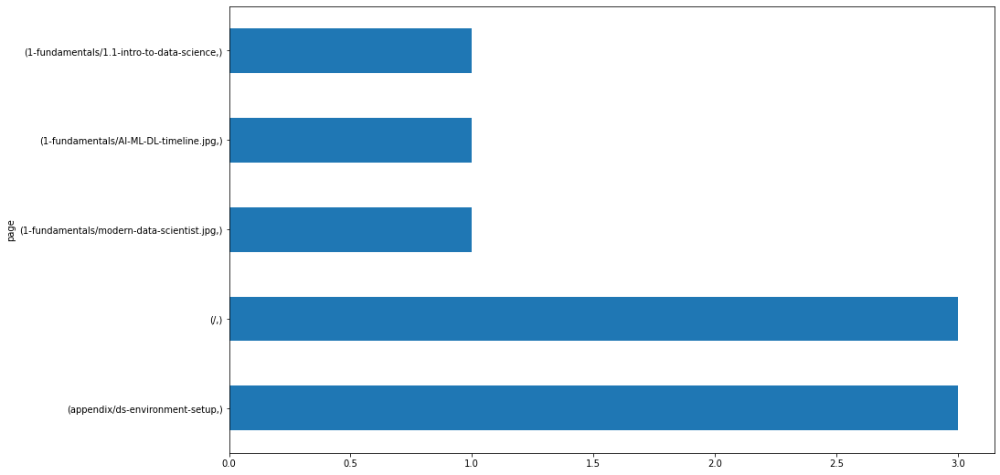


172.58.107.56
page                           
4-python/5-functions               2
6-regression/8.0-Project           1
6-regression/5-evaluate            1
6-regression/2-acquire-and-prep    1
6-regression/1-overview            1
/                                  1
dtype: int64


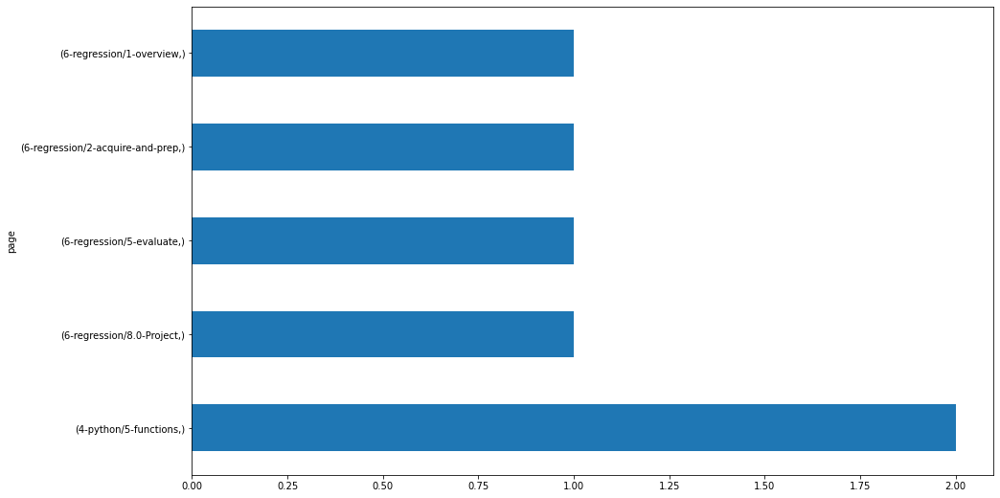


172.58.107.101
page                    
6-regression/8.0-Project    1
dtype: int64


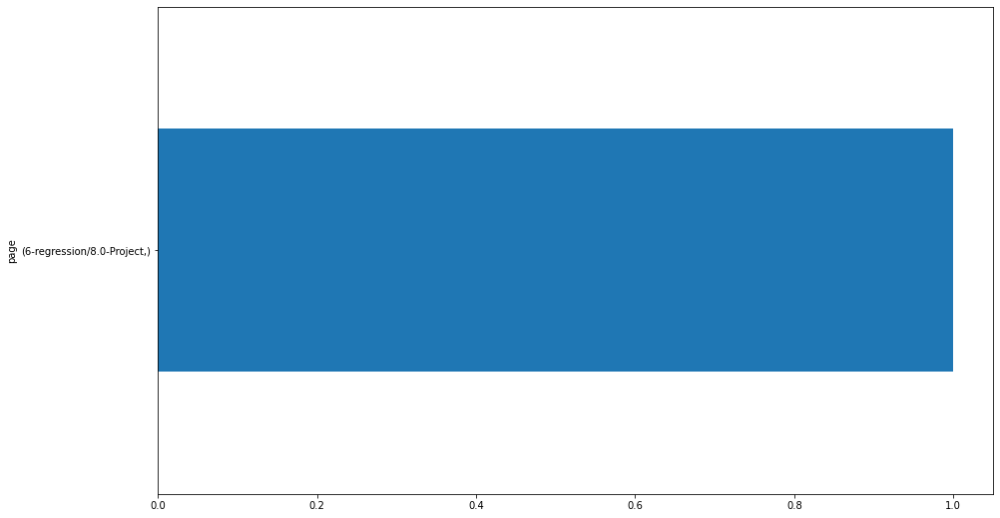


172.58.110.247
page                          
6-regression/3-split-and-scale    1
6-regression/1-overview           1
4-python/5-functions              1
dtype: int64


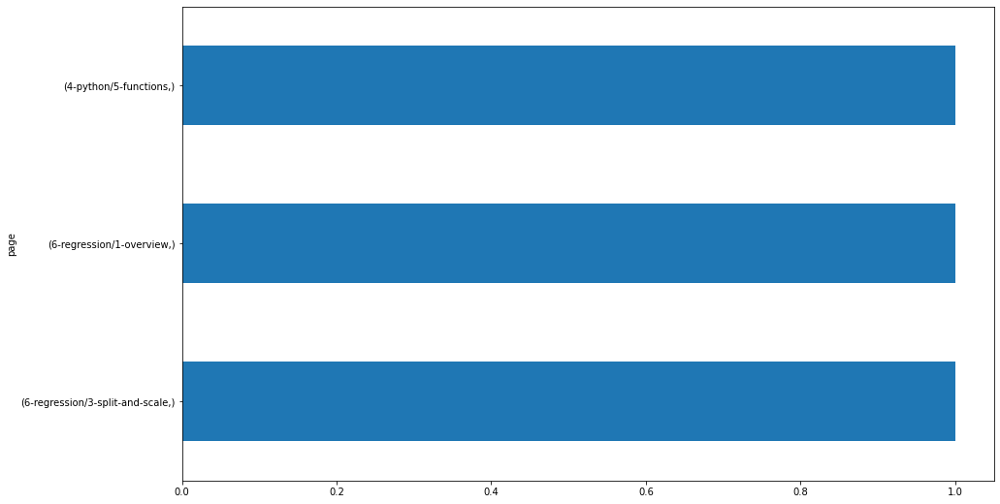


172.58.110.158
page                          
6-regression/7-model              1
6-regression/5-evaluate           1
6-regression/3-split-and-scale    1
dtype: int64


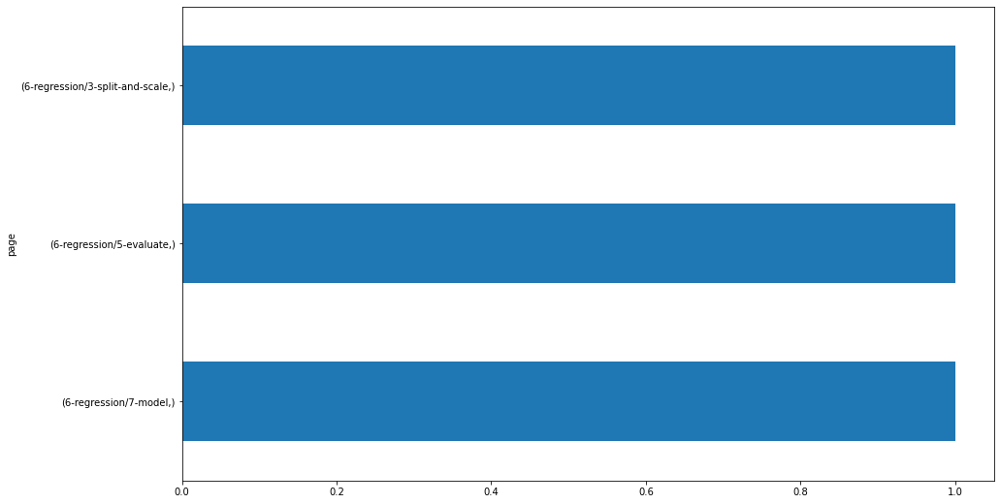


172.58.67.106
page                            
6-regression/8-project              1
4-python/8.5-intro-to-seaborn       1
4-python/8.2-intro-to-matplotlib    1
3-sql/1-mysql-overview              1
dtype: int64


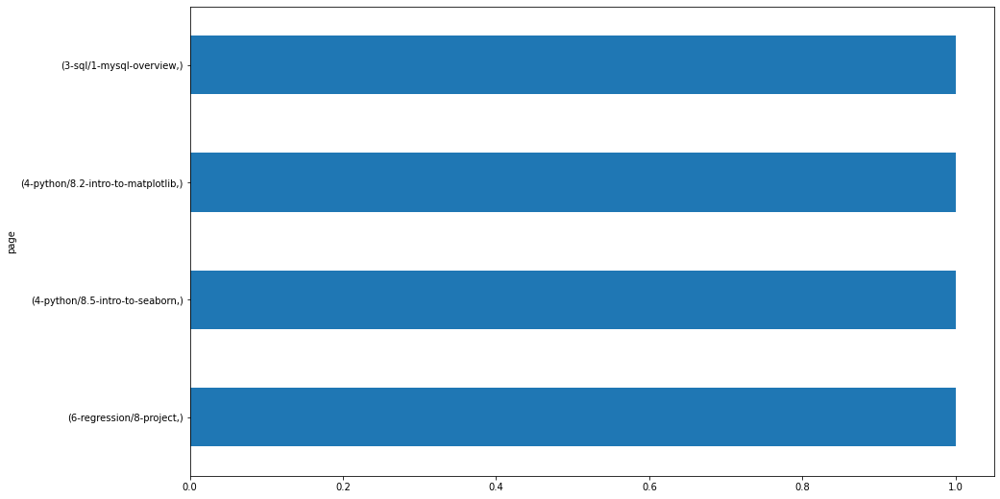


172.58.107.241
page                                             
7-classification/2-acquire                           2
7-classification/1-overview                          2
6-regression/2-acquire-and-prep                      1
6-regression/1-overview                              1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
dtype: int64


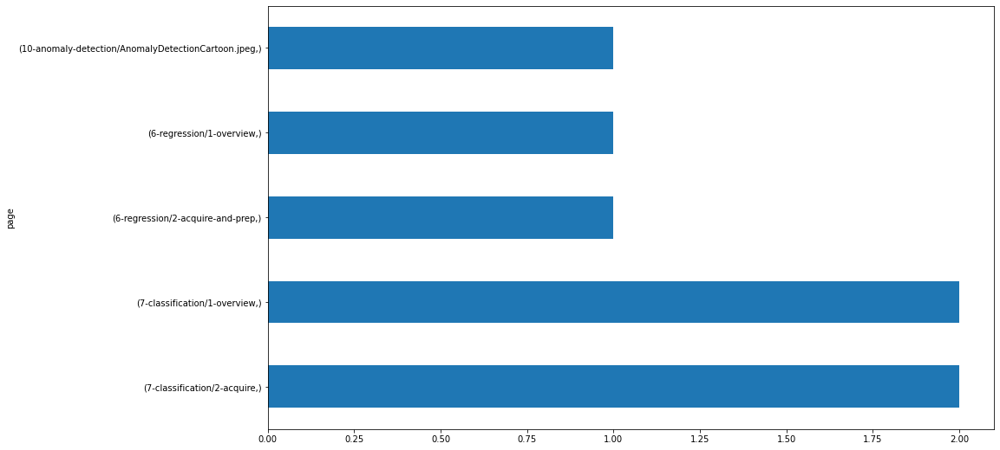


172.58.110.242
page                       
7-classification/1-overview    2
dtype: int64


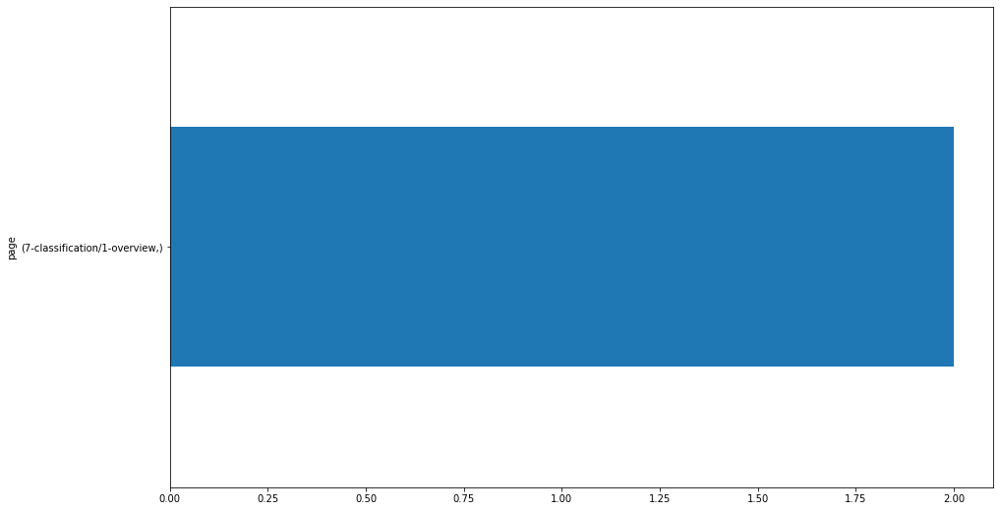


172.58.110.141
page                                
7-classification/1-overview             1
6-regression/6.0-feature-engineering    1
dtype: int64


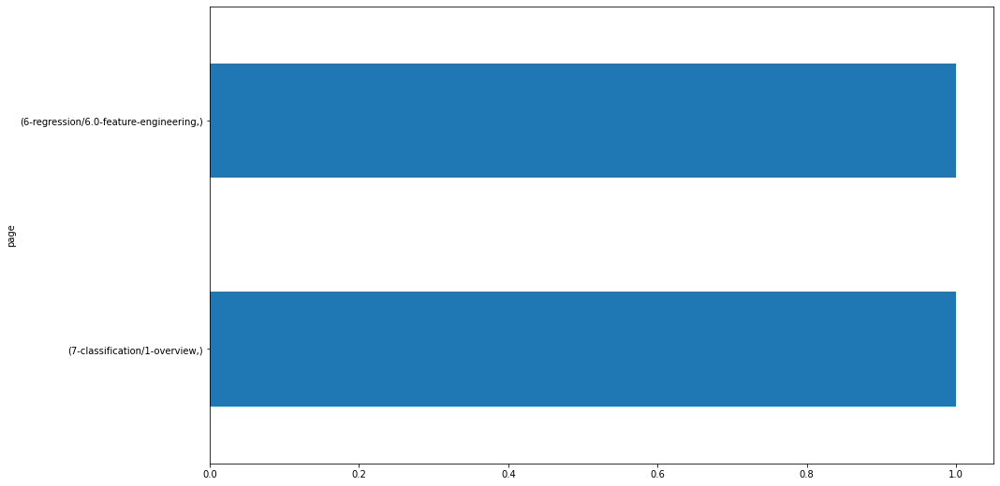


172.58.110.210
page                       
7-classification/3-prep        1
7-classification/1-overview    1
dtype: int64


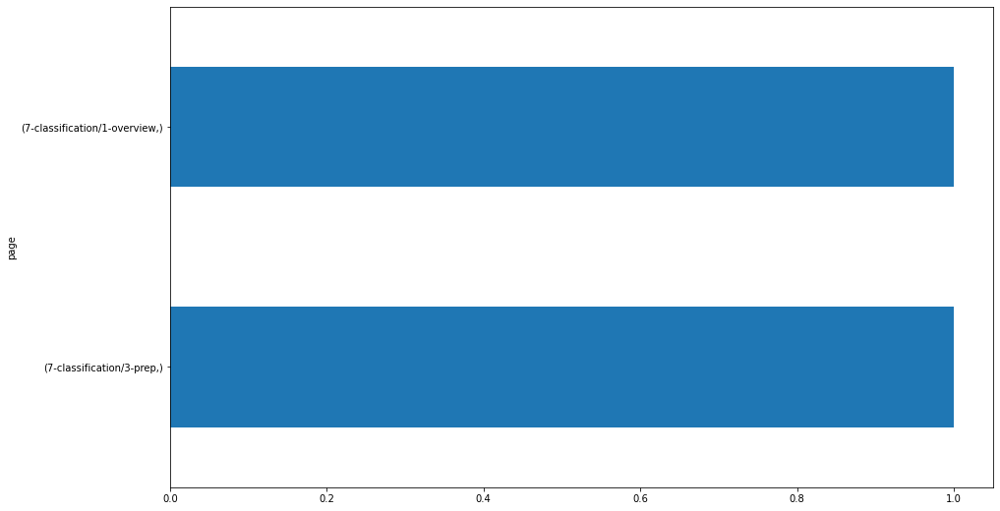


172.58.110.221
page                                    
1-fundamentals/1.1-intro-to-data-science    2
7-classification/3-prep                     1
6-regression/1-overview                     1
4-python/8.4.4-advanced-dataframes          1
4-python/8.4.3-dataframes                   1
3-sql/1-mysql-overview                      1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
dtype: int64


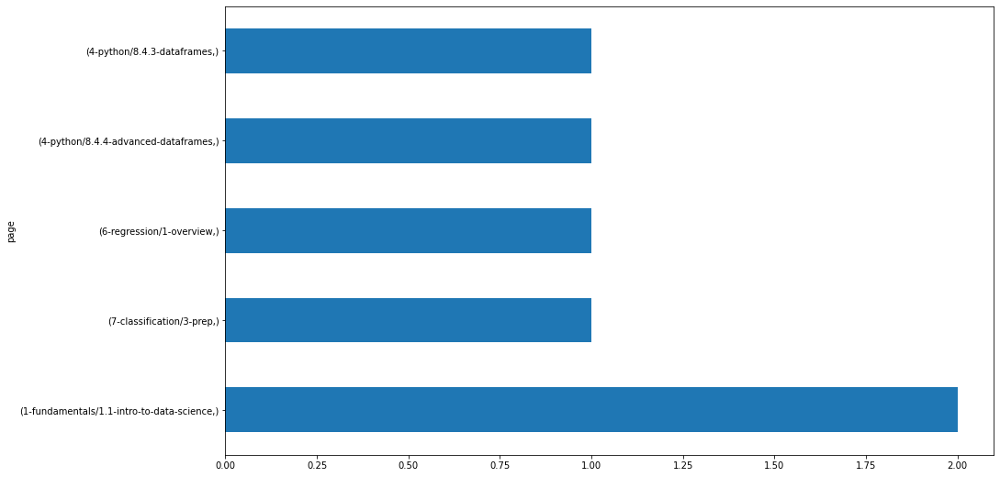


172.58.102.173
page                      
7-classification/4-explore    1
dtype: int64


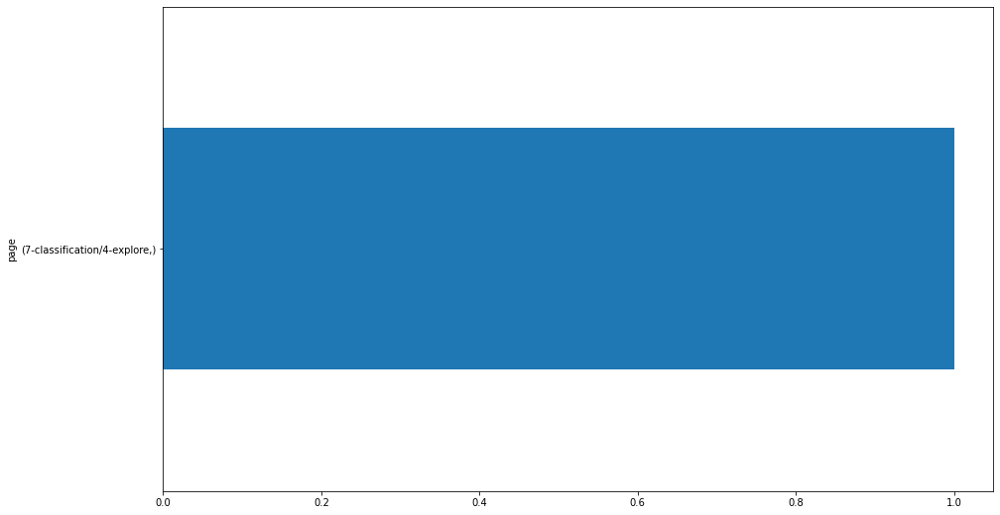


172.58.107.141
page                                    
5-stats/4.2-compare-means                   1
4-python/8.5-intro-to-seaborn               1
4-python/8.2-intro-to-matplotlib            1
3-sql/1-mysql-overview                      1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


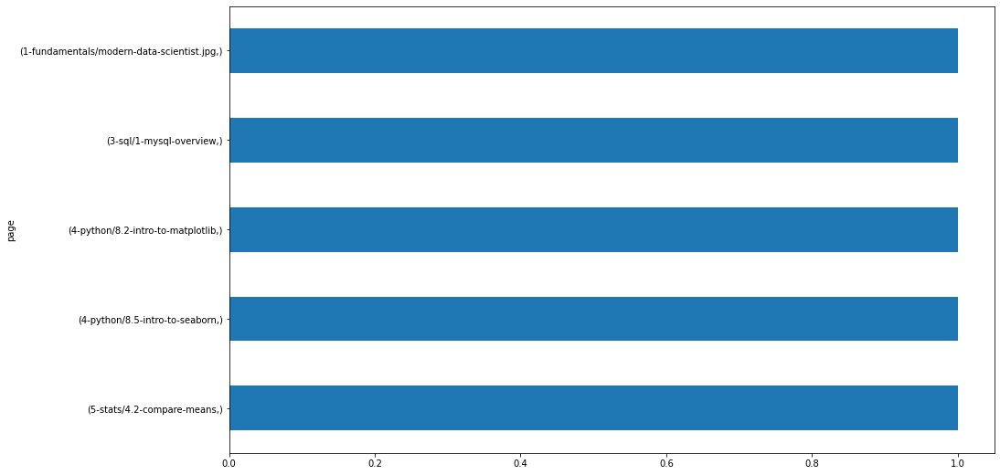


172.58.102.206
page                         
7-classification/5-evaluation    1
dtype: int64


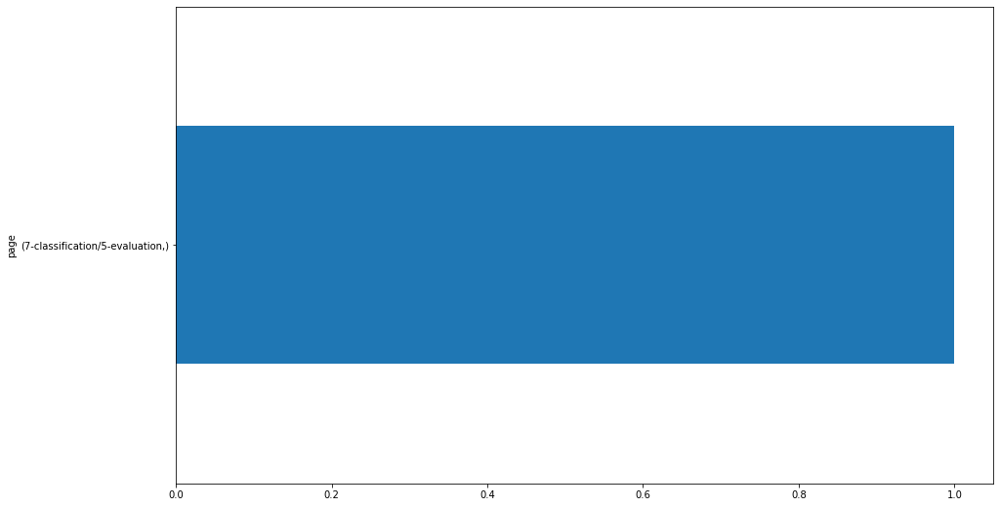


174.207.0.183
page
/       1
dtype: int64


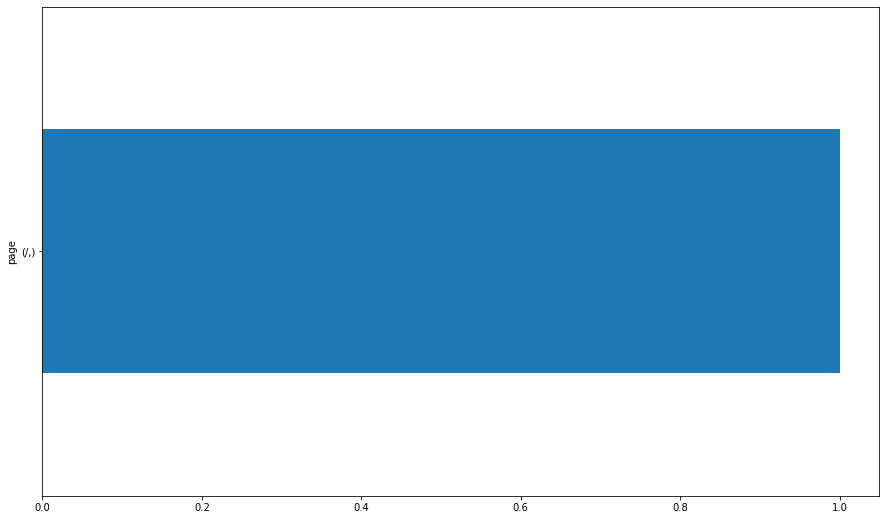


172.58.99.242
page                                             
13-advanced-topics/1-tidy-data                       1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
dtype: int64


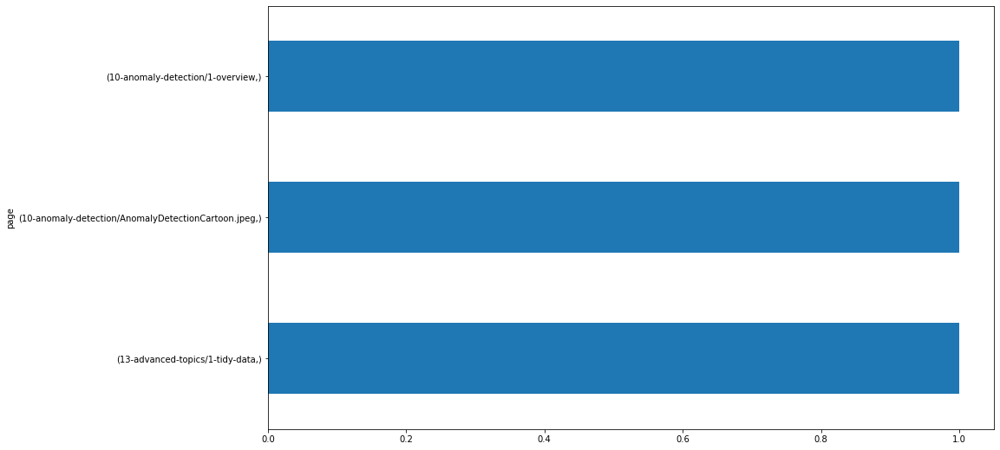


99.203.90.140
page                          
13-advanced-topics/1-tidy-data    1
/                                 1
dtype: int64


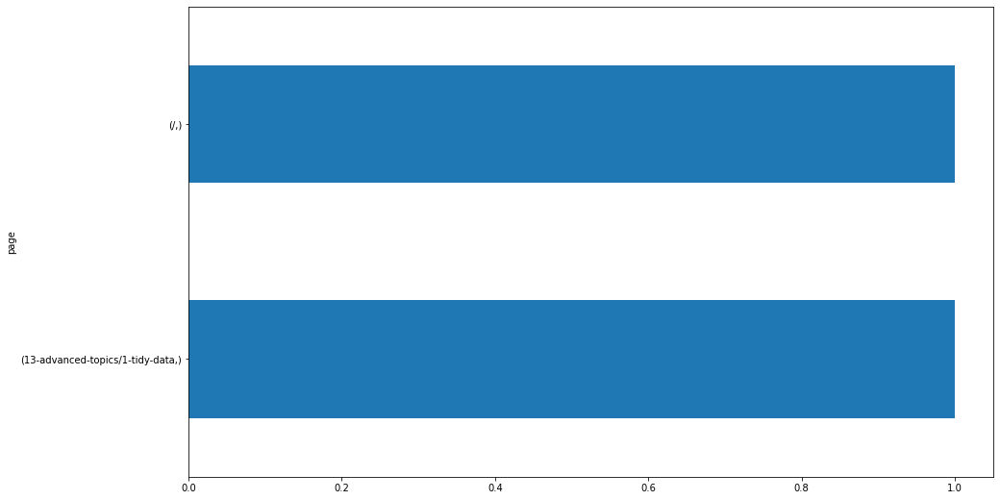


184.203.15.95
page                         
7-classification/5-evaluation    1
dtype: int64


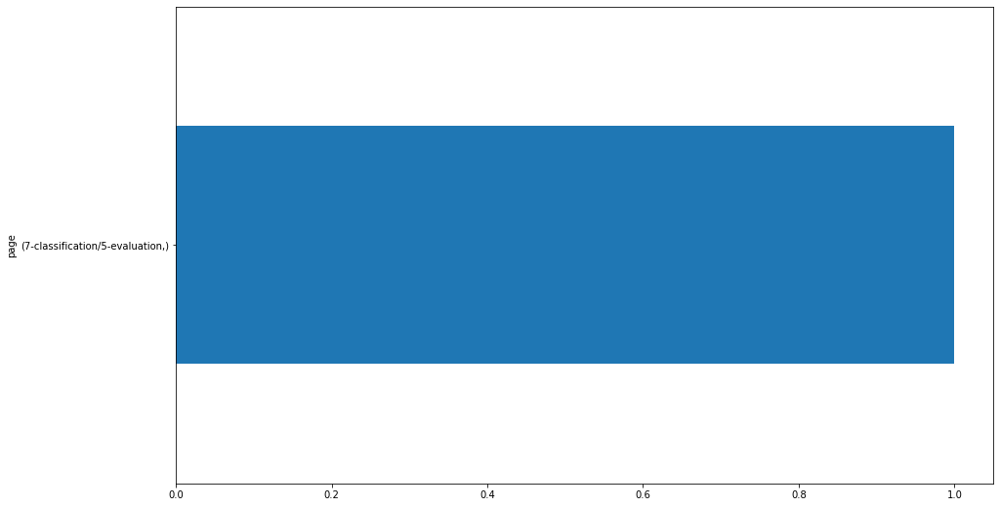


172.58.99.106
page                                       
3-sql/1-mysql-overview                         1
2-storytelling/3.4-creating-custom-fields      1
1-fundamentals/modern-data-scientist.jpg       1
1-fundamentals/AI-ML-DL-timeline.jpg           1
1-fundamentals/2.3-visualization-with-excel    1
1-fundamentals/2.2-functions                   1
1-fundamentals/1.1-intro-to-data-science       1
dtype: int64


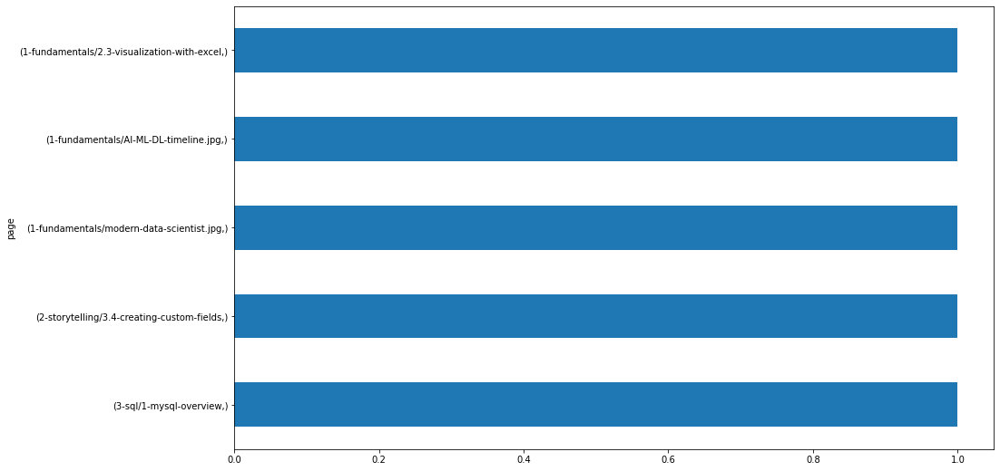


136.50.64.245
page                                             
/                                                    22
10-anomaly-detection/1-overview                      20
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    20
9-timeseries/4-explore                               17
search/search_index.json                             13
                                                     ..
13-advanced-topics/1-tidy-data                        1
6-regression/8-project                                1
12-distributed-ml/read-jdbc                           1
6-regression/univariate_regression_in_excel           1
3-sql/9.4-subqueries                                  1
Length: 131, dtype: int64


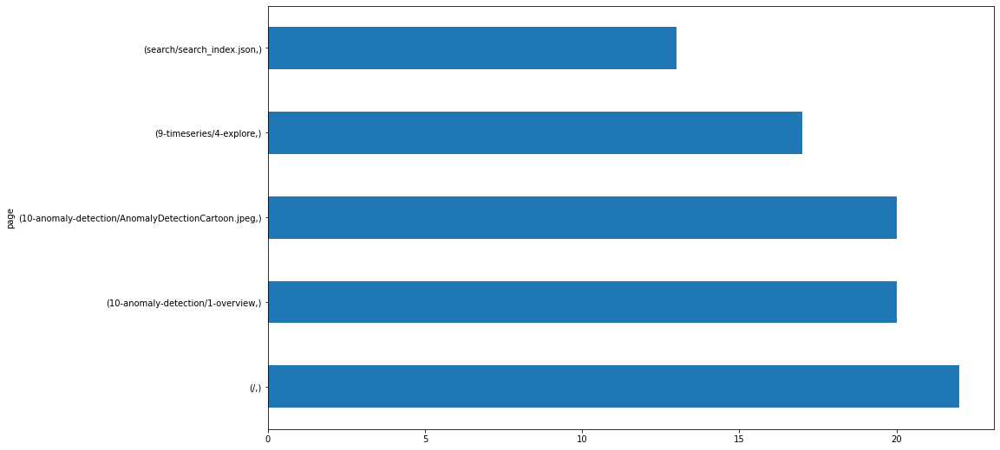


172.58.67.230
page                                             
6-regression/1-overview                              9
7-classification/6.1-logistic-regression             9
/                                                    3
7-classification/5-evaluation                        3
1-fundamentals/1.1-intro-to-data-science             3
7-classification/3-prep                              3
1-fundamentals/AI-ML-DL-timeline.jpg                 3
1-fundamentals/modern-data-scientist.jpg             3
6-regression/7-model                                 3
6-regression/5-evaluate                              3
3-sql/1-mysql-overview                               2
7-classification/4-explore                           2
6-regression/2-acquire-and-prep                      1
4-python/5-functions                                 1
6-regression/6-feature-engineering                   1
2-storytelling/2.2-create                            1
11-nlp/1-overview                                    1


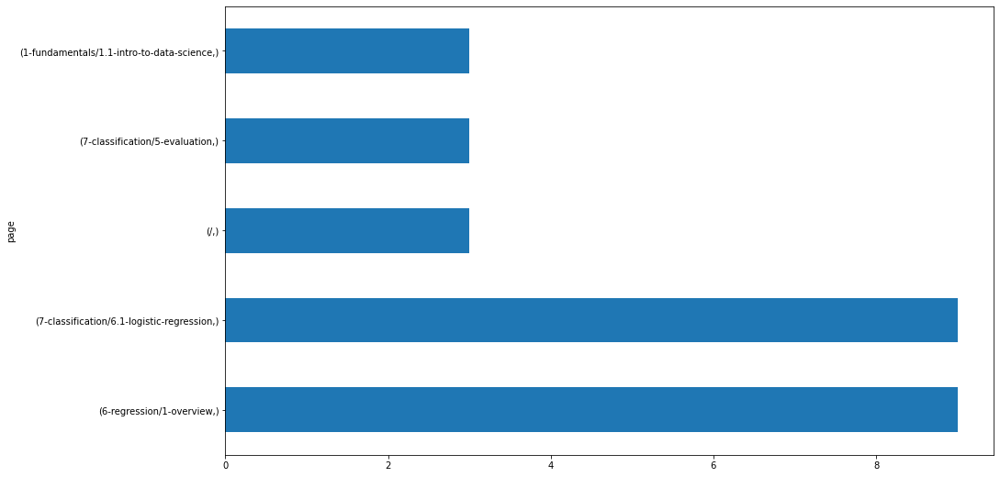


174.246.197.179
page                               
/                                      4
8-clustering/project                   2
b-clustering/project                   1
A-clustering/project                   1
8-clustering/3-wrangle                 1
7-classification/project               1
7-classification/6.2-decision-trees    1
dtype: int64


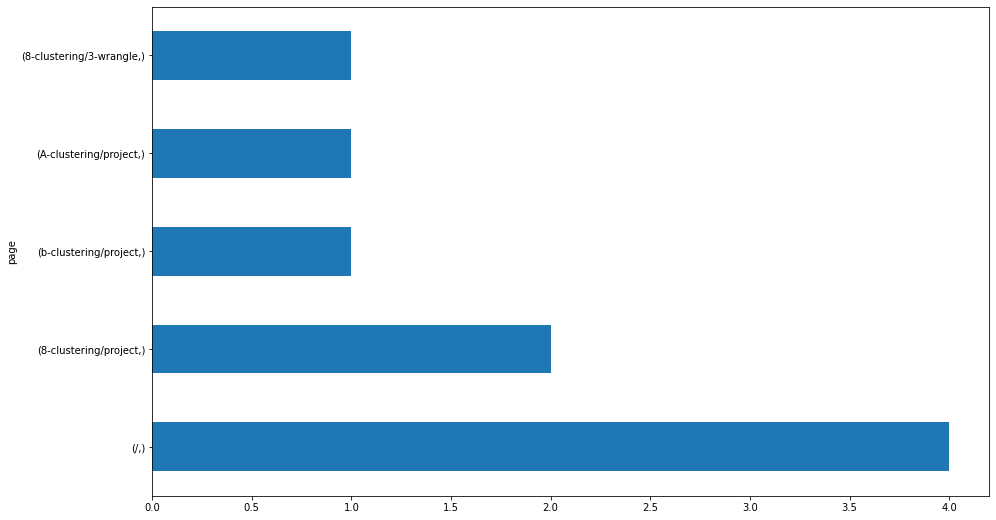


172.58.110.238
page                                    
7-classification/6.2-decision-trees         3
4-python/8.4.4-advanced-dataframes          1
3-sql/1-mysql-overview                      1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


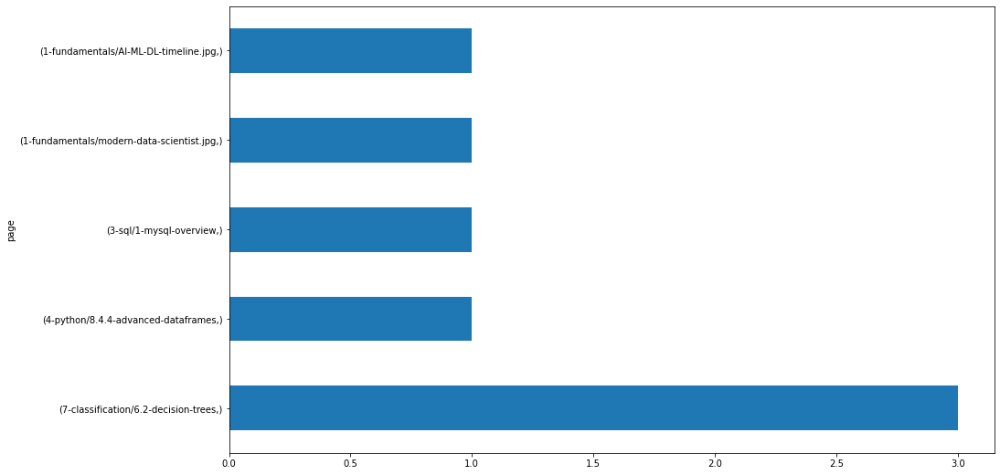


172.58.102.252
page                               
7-classification/6.3-random-forests    1
dtype: int64


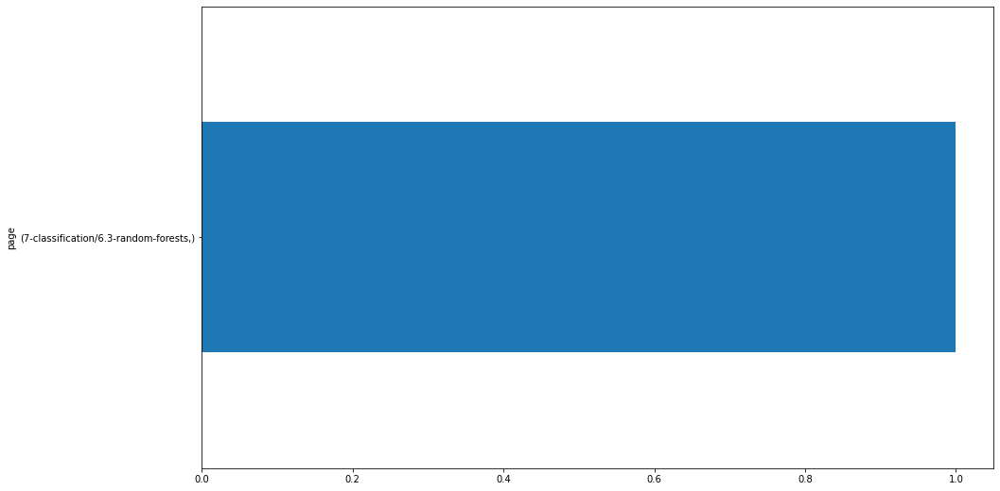


221.229.204.176
page                      
7-classification/3-prep       1
7-classification/2-acquire    1
dtype: int64


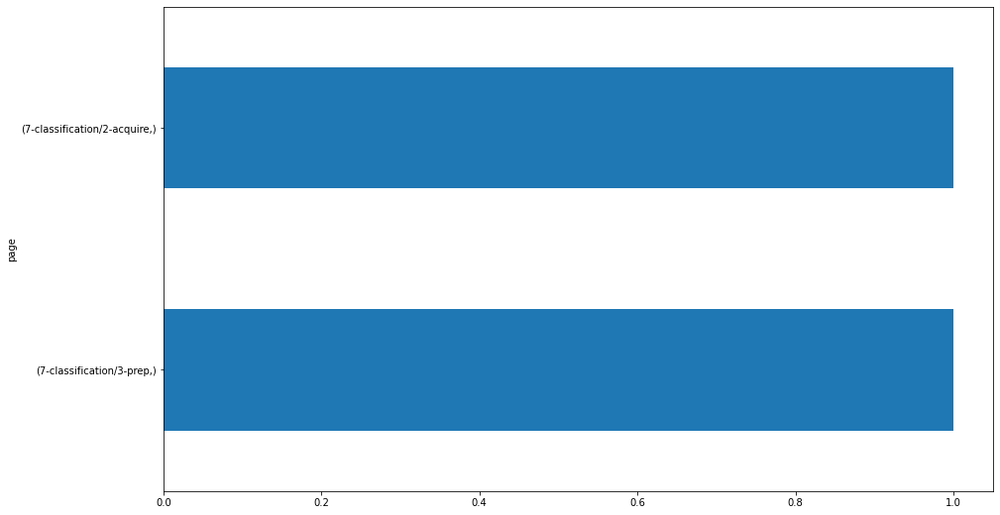


172.58.67.181
page                       
7-classification/6.4-knn       2
/                              2
7-classification/1-overview    1
6-regression/7-model           1
6-regression/1-overview        1
dtype: int64


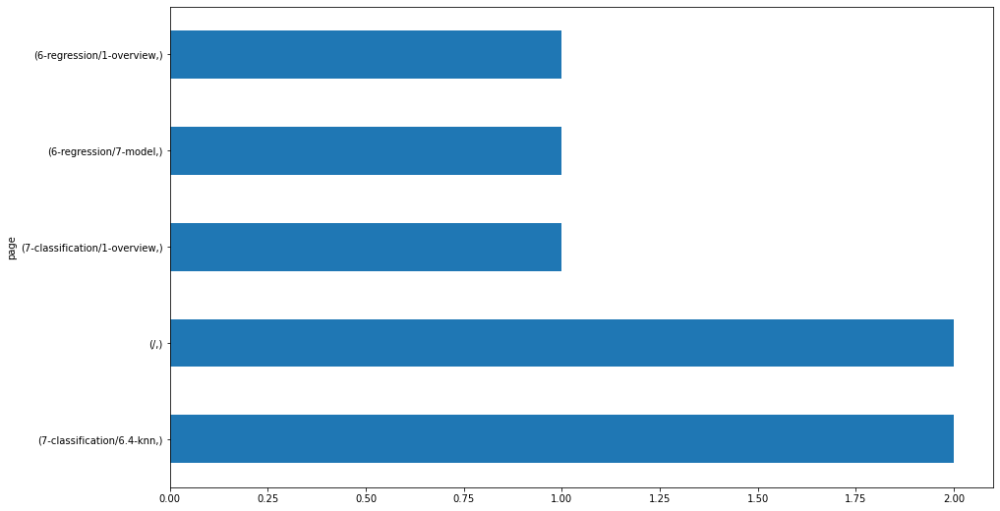


172.58.107.63
page                    
7-classification/project    1
dtype: int64


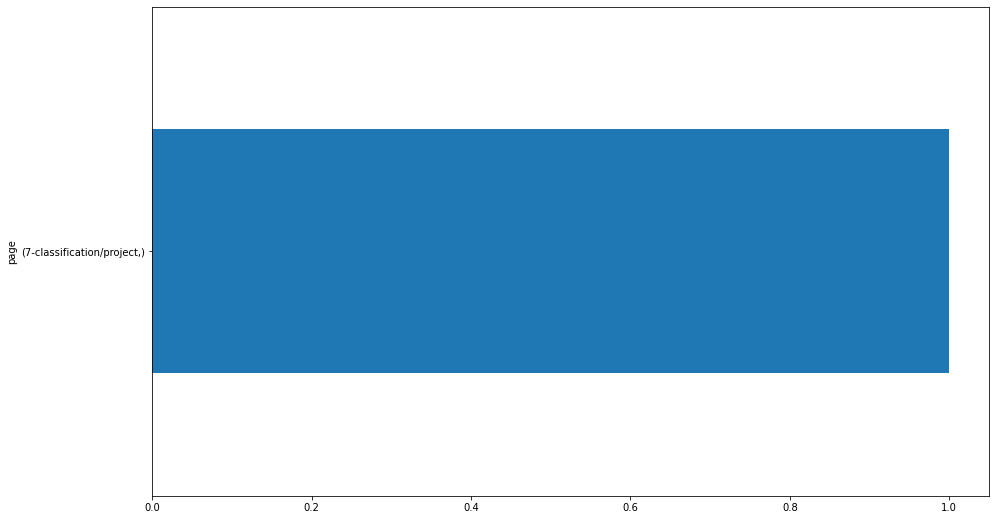


96.8.130.251
page                               
/                                      4
5-stats/4.2-compare-means              2
7-classification/5-evaluation          1
5-stats/3-probability-distributions    1
dtype: int64


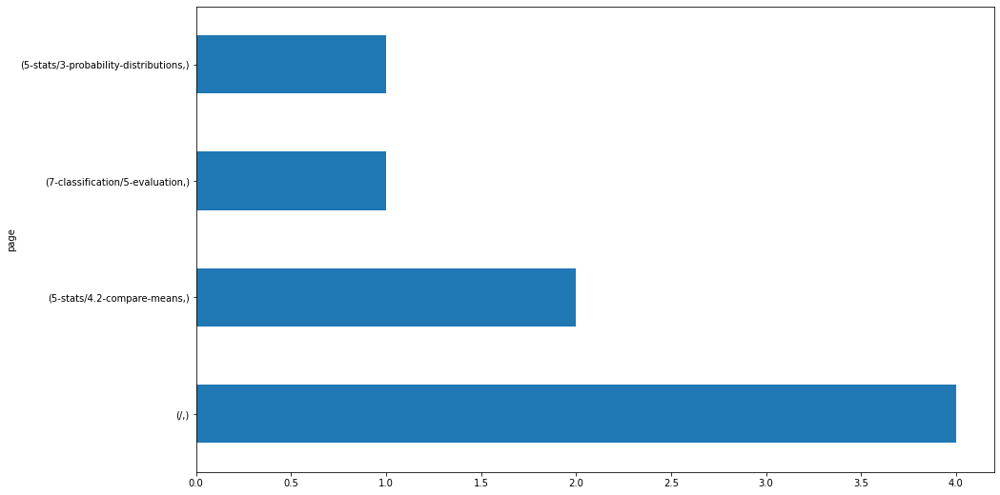


172.58.70.253
page                              
7-classification/project              1
7-classification/1-overview           1
6-regression/6-feature-engineering    1
6-regression/1-overview               1
dtype: int64


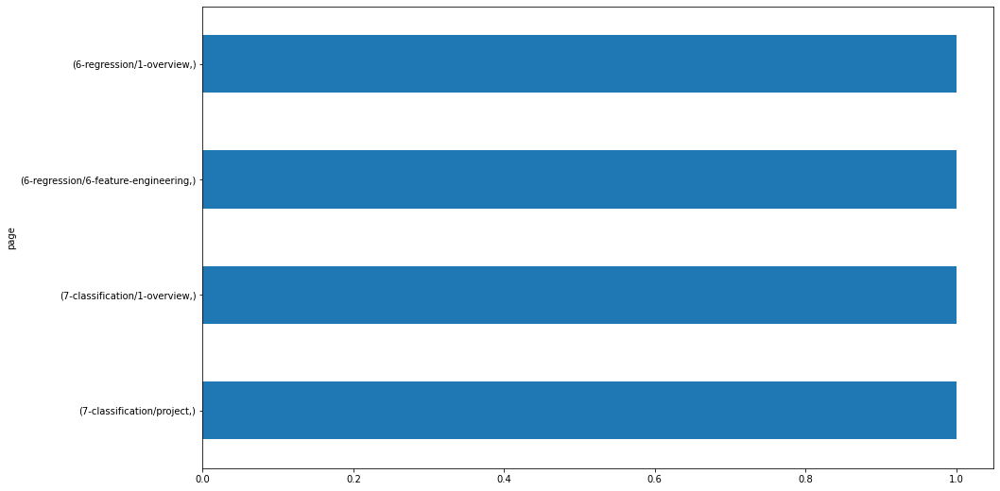


172.58.107.78
page                                    
7-classification/project                    2
7-classification/4-explore                  2
7-classification/3-prep                     2
7-classification/6.1-logistic-regression    1
7-classification/5-evaluation               1
6-regression/6-feature-engineering          1
6-regression/5-evaluate                     1
4-python/5-functions                        1
3-sql/1-mysql-overview                      1
dtype: int64


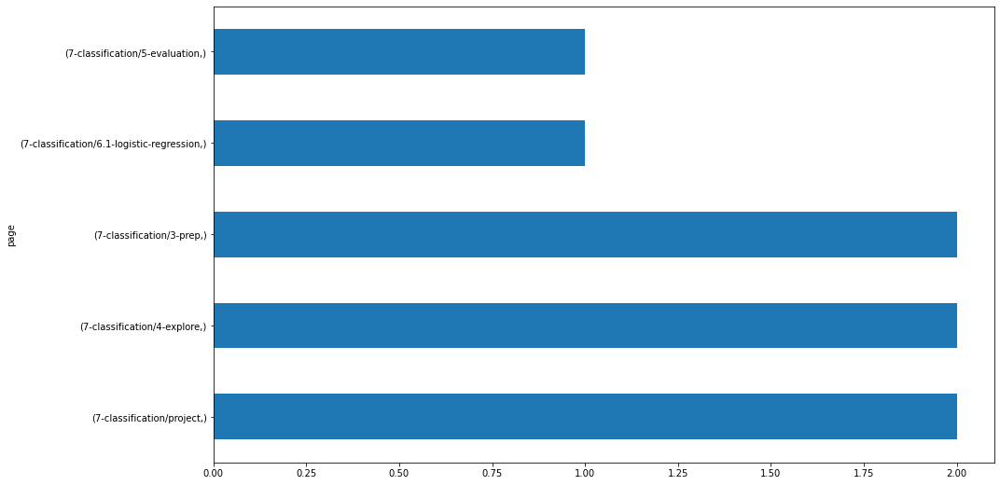


172.58.107.238
page                                         
5-stats/4.2-compare-means                        2
7-classification/6.4-knn                         1
7-classification/6.3-random-forests              1
1-fundamentals/AI-ML-DL-timeline.jpg             1
1-fundamentals/modern-data-scientist.jpg         1
3-sql/1-mysql-overview                           1
4-python/8.2-intro-to-matplotlib                 1
4-python/8.5-intro-to-seaborn                    1
5-stats/4.3-correlation                          1
5-stats/4.4-compare-group-membership             1
5-stats/4.5-more-statistical-testing-examples    1
5-stats/Selecting_a_hypothesis_test.svg          1
6-regression/1-overview                          1
7-classification/4-explore                       1
7-classification/5-evaluation                    1
7-classification/6.1-logistic-regression         1
7-classification/6.2-decision-trees              1
1-fundamentals/1.1-intro-to-data-science         1
dtype: int64


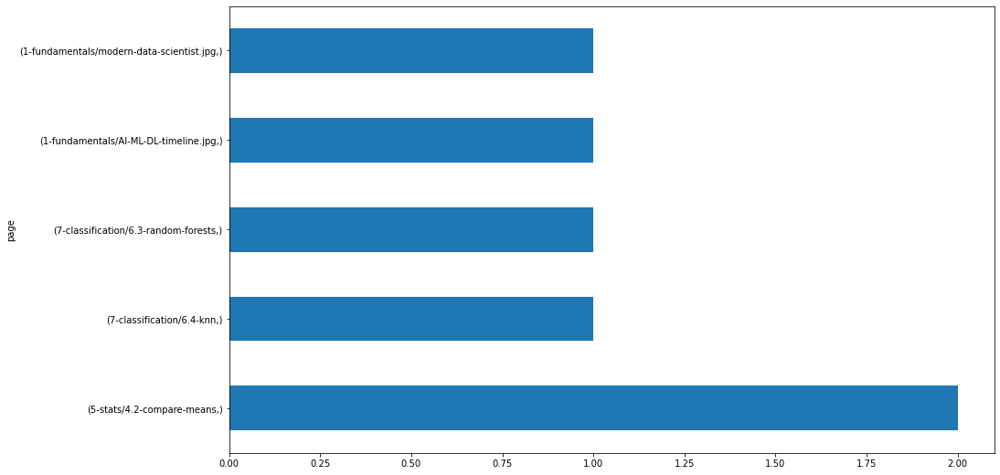


73.163.186.32
page          
11-nlp/6-model    1
dtype: int64


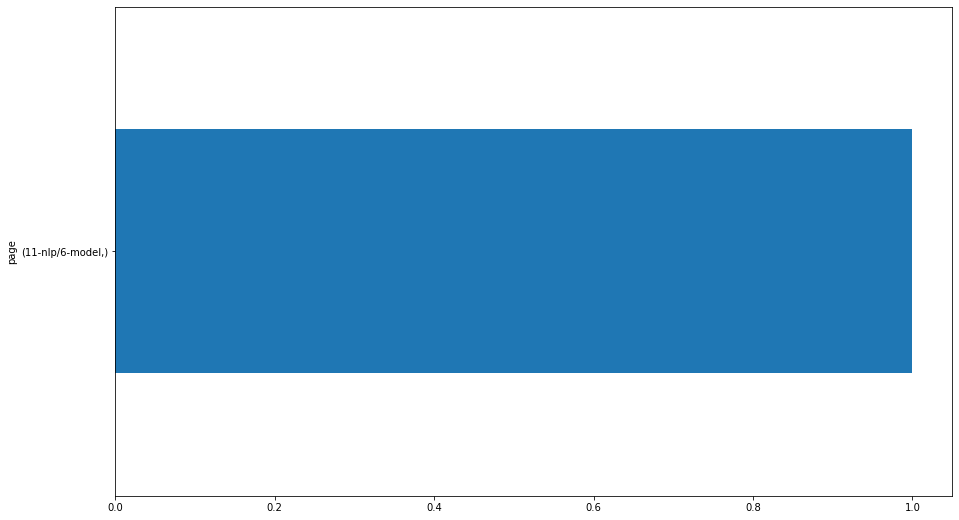


174.207.4.87
page
/       2
dtype: int64


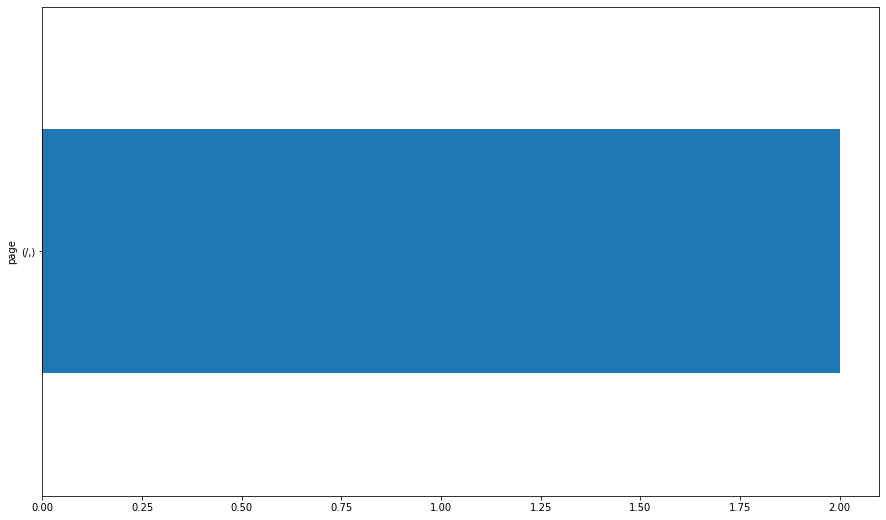


130.45.47.56
page                                             
4-python/5-functions                                 37
10-anomaly-detection/1-overview                      33
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    32
6-regression/1-overview                              30
8-clustering/3-wrangle                               22
                                                     ..
4-python/3-data-types-and-variables                   1
classification/evaluation                             1
classification/overview                               1
12-distributed-ml/2-environment-setup                 1
stats/probability-distributions                       1
Length: 124, dtype: int64


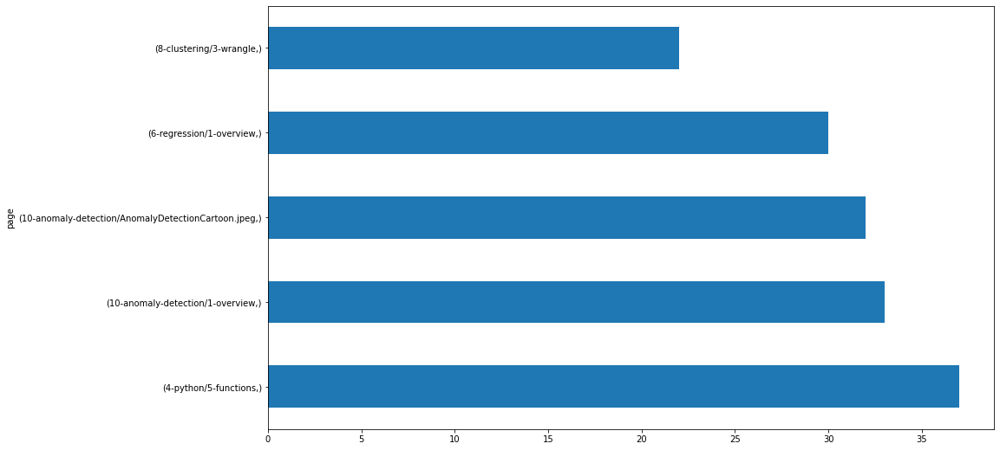


174.244.81.91
page
/       1
dtype: int64


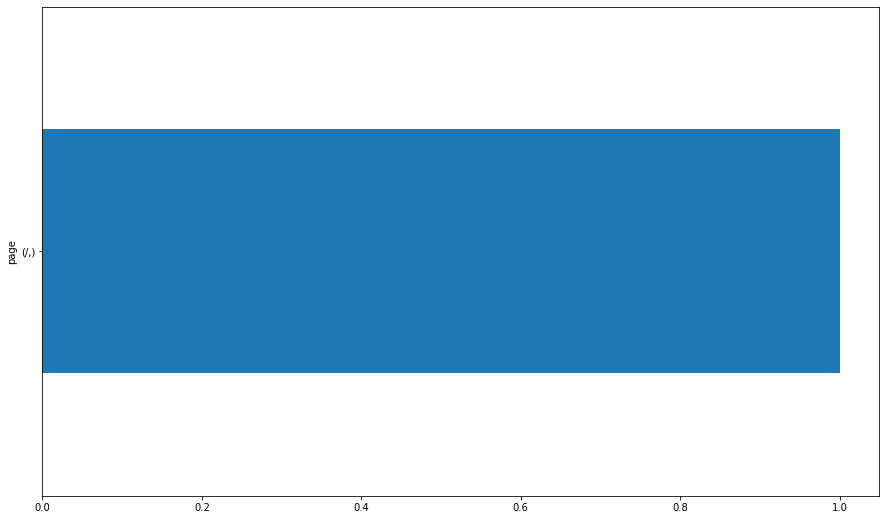


174.197.6.43
page
/       1
dtype: int64


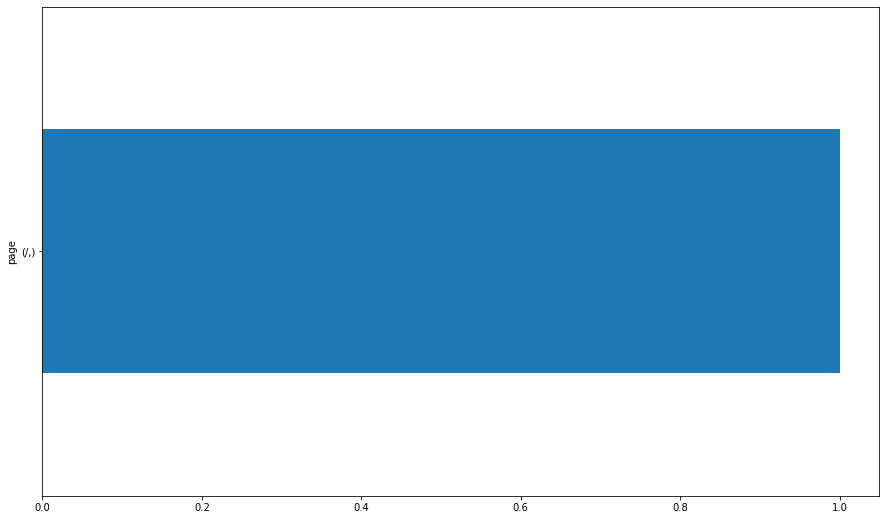


47.134.162.37
page                                             
13-advanced-topics/3.4-intro-to-flask                9
13-advanced-topics/3.2-virtual-environments          8
13-advanced-topics/3.3-building-a-model              8
/                                                    6
13-advanced-topics/3.6-html-forms                    6
9-timeseries/3-prep                                  6
9-timeseries/4-explore                               5
9-timeseries/2-acquire                               4
13-advanced-topics/3.7-styling-webpages              4
13-advanced-topics/3.8-json-responses                3
12-distributed-ml/6-ml-with-spark                    3
13-advanced-topics/3.5-html-templates                3
9-timeseries/5.1-modeling-lesson1                    3
13-advanced-topics/1-tidy-data                       2
12-distributed-ml/read-jdbc                          2
10-anomaly-detection/1-overview                      2
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    2


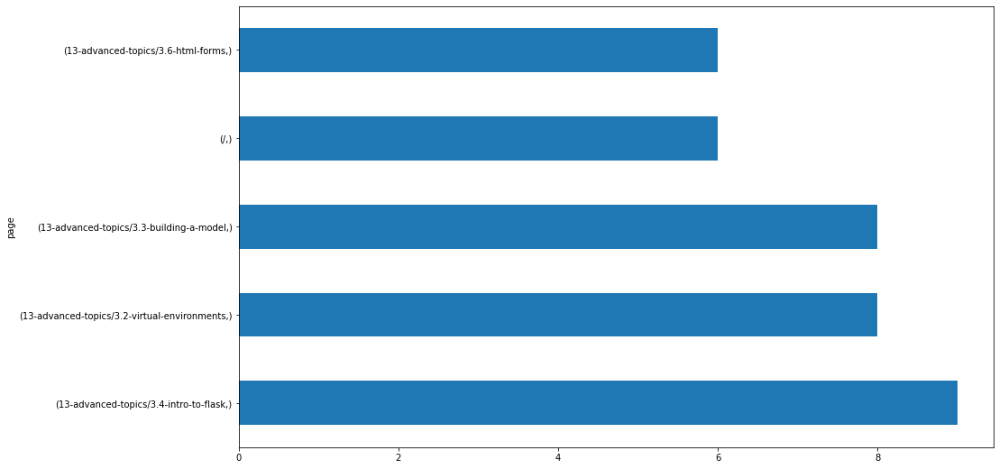


96.8.130.240
page                                       
search/search_index.json                       14
/                                               8
timeseries/acquire                              4
regression/overview                             3
stats/correlation                               3
regression/acquire-and-prep                     3
regression/model                                3
clustering/Hospital-Distance-Clusters.jpg       2
clustering/overview                             2
timeseries/prep                                 2
timeseries/working-with-time-series-data        2
stats/compare-means                             2
timeseries/modeling-lesson1                     2
timeseries/overview                             2
regression/split-and-scale                      1
classification/logistic-regression              1
1-fundamentals/1.1-intro-to-data-science        1
1-fundamentals/1.2-data-science-pipeline        1
1-fundamentals/AI-ML-DL-timeline.jpg      

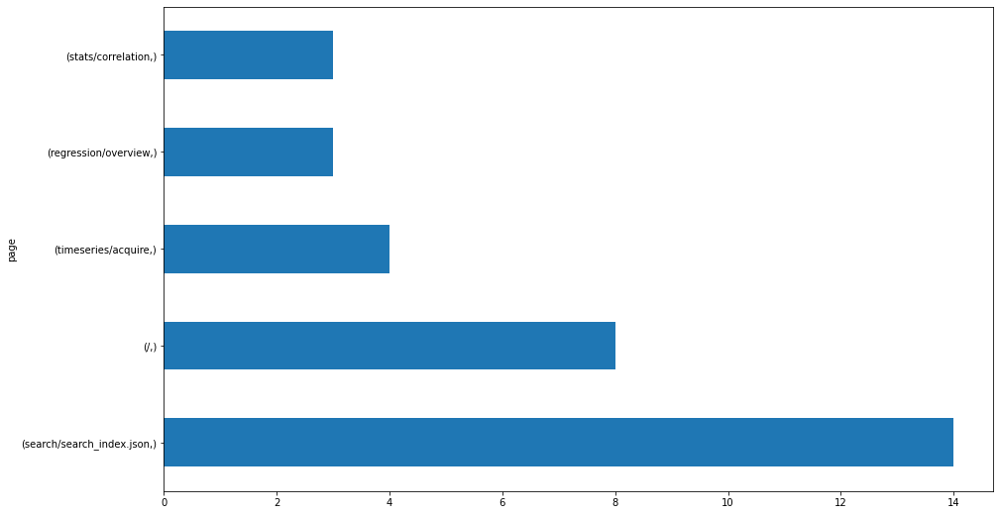


195.206.104.109
page                                                 
10-anomaly-detection/3-discrete-probabilistic-methods    3
9-timeseries/project                                     1
9-timeseries/5.2-modeling-lesson2                        1
9-timeseries/4-explore                                   1
6-regression/1-overview                                  1
/                                                        1
dtype: int64


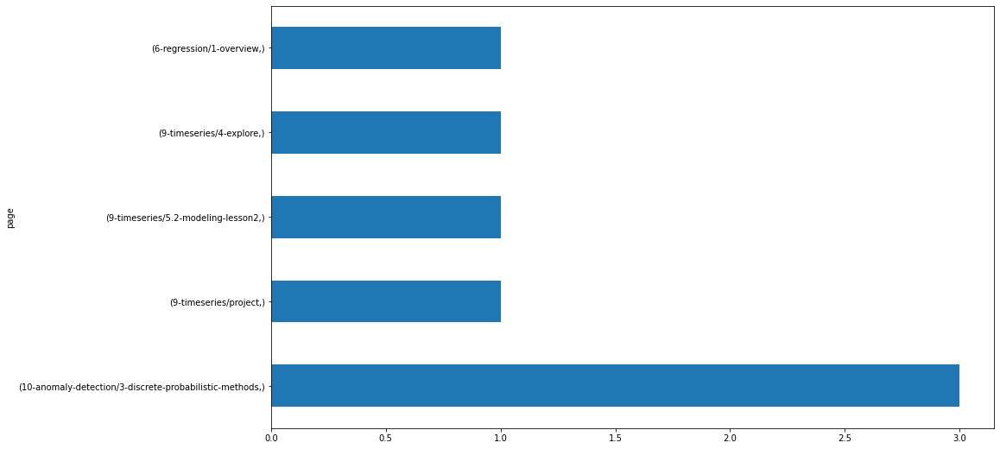


174.197.4.51
page
/       1
dtype: int64


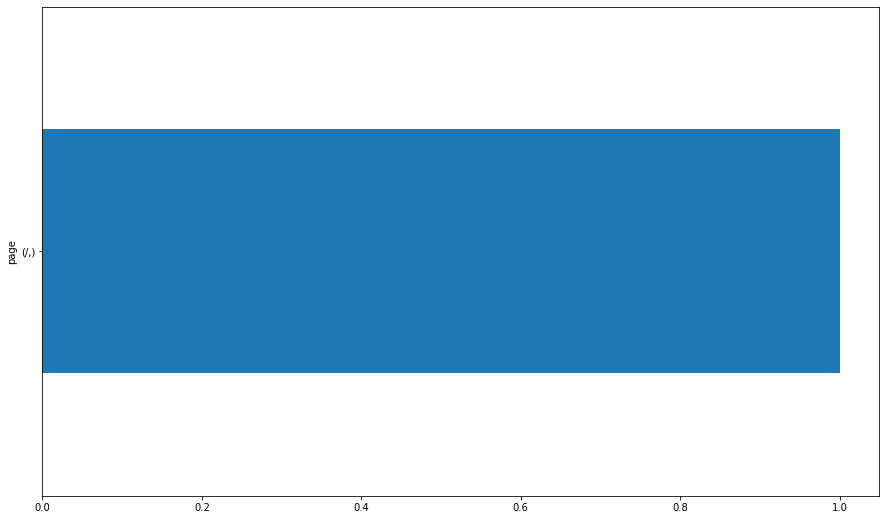


166.181.85.9
page                                                 
10-anomaly-detection/4-detecting-timeseries-anomalies    1
10-anomaly-detection/3-discrete-probabilistic-methods    1
dtype: int64


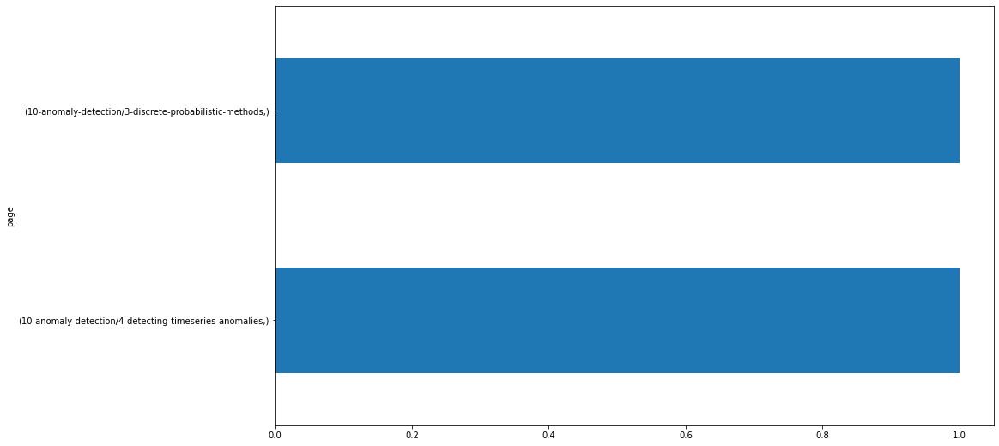


130.45.52.50
page                                 
appendix/interview_questions_students    1
3-sql/database-design                    1
/                                        1
dtype: int64


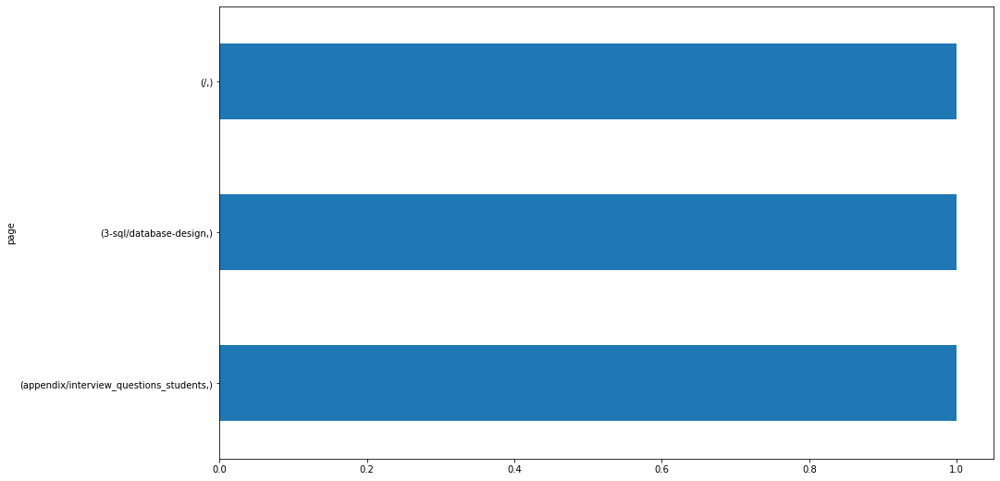


174.246.197.106
page                                    
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


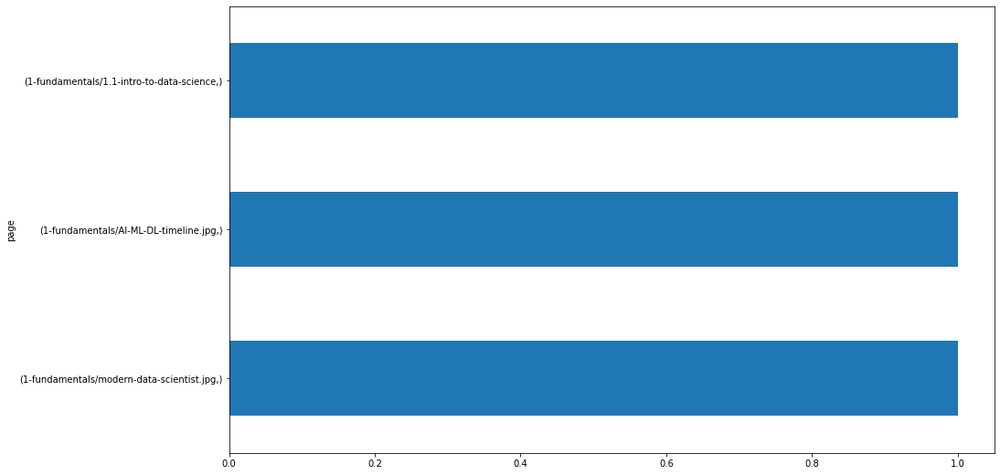


70.120.6.34
page                   
/                          9
fundamentals/git           3
9-timeseries/3-prep        1
9-timeseries/1-overview    1
dtype: int64


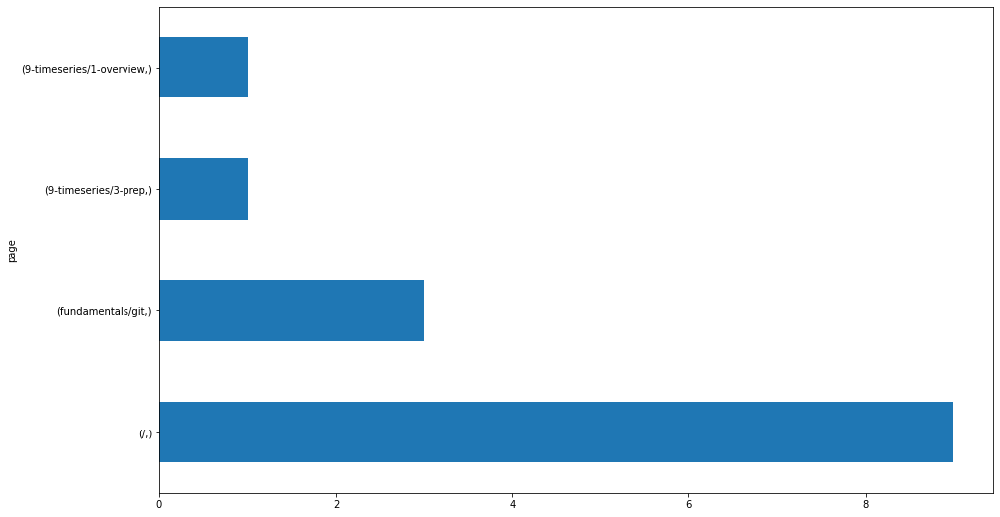


174.244.81.146
page                                             
search/search_index.json                             1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
/                                                    1
dtype: int64


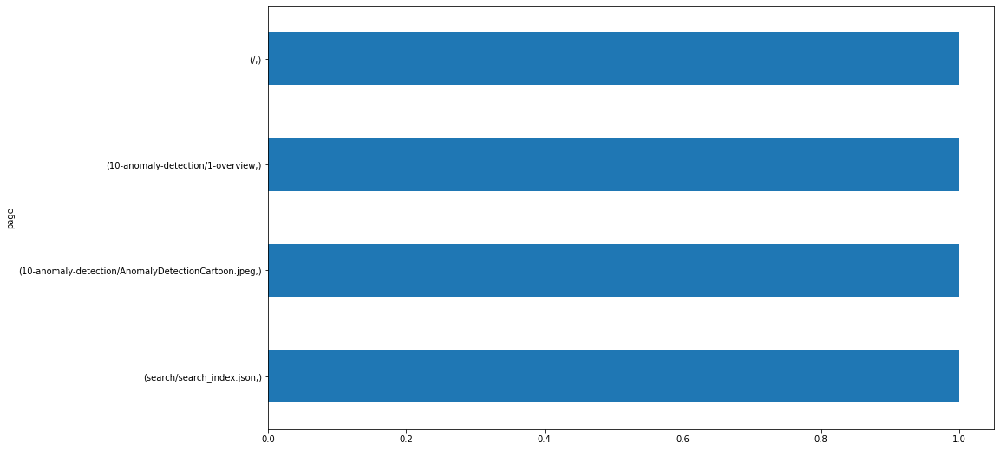


174.197.7.219
page
/       1
dtype: int64


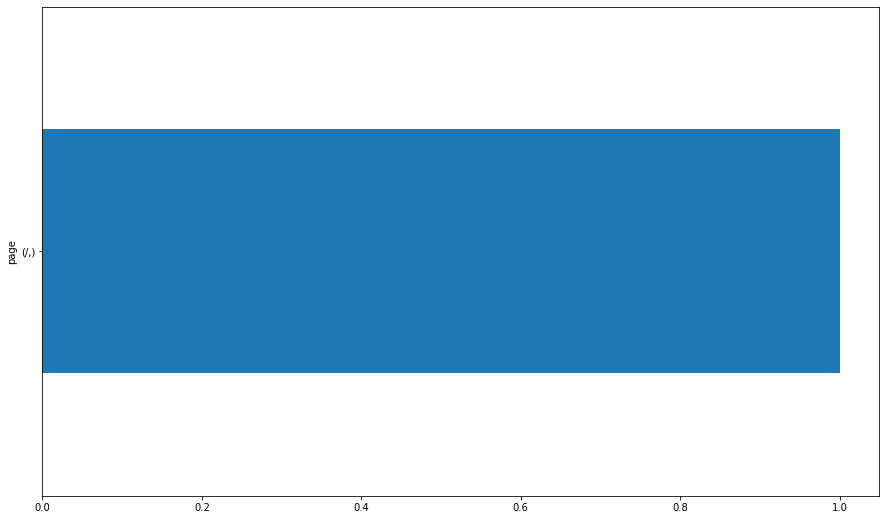


107.77.217.109
page
/       4
dtype: int64


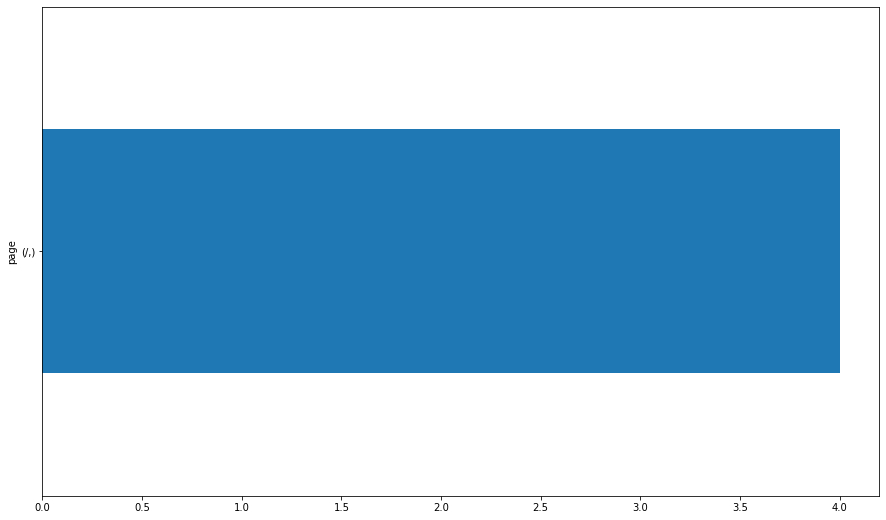


174.246.198.172
page            
11-nlp/4-prepare    1
11-nlp/3-acquire    1
dtype: int64


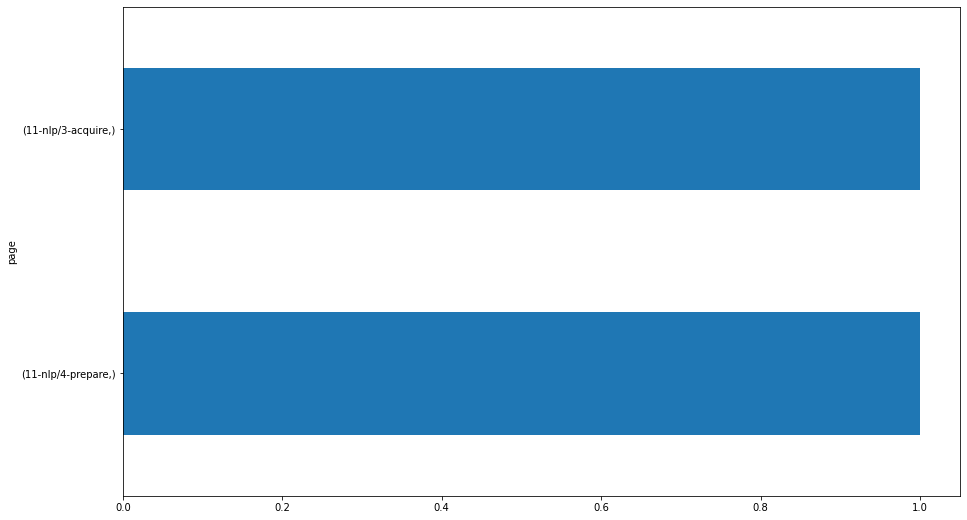


96.8.130.148
page                                             
6-regression/1-overview                              2
3-sql/1-mysql-overview                               2
/                                                    2
5-stats/4.2-compare-means                            1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
dtype: int64


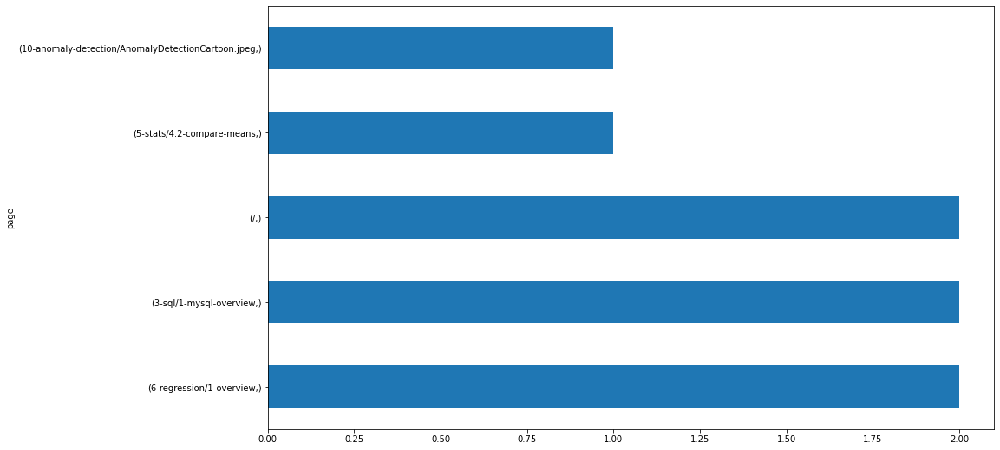


67.78.112.162
page                                             
6-regression/5-evaluate                              12
6-regression/7-model                                  8
/                                                     3
9-timeseries/3-prep                                   3
8-clustering/Hospital-Distance-Clusters.jpg           3
8-clustering/5-model                                  3
8-clustering/2-about                                  3
9-timeseries/5.1-modeling-lesson1                     3
7-classification/6.2-decision-trees                   3
7-classification/6.3-random-forests                   2
6-regression/1-overview                               2
7-classification/1-overview                           2
9-timeseries/5.2-modeling-lesson2                     2
9-timeseries/4-explore                                2
8-clustering/4-explore                                2
7-classification/6.4-knn                              1
10-anomaly-detection/1-overview        

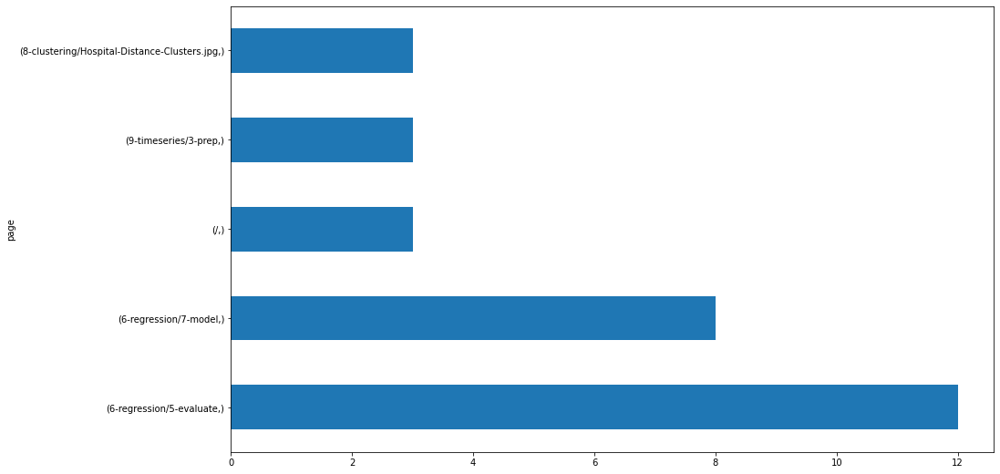


107.77.222.187
page                                    
search/search_index.json                    4
6-regression/1-overview                     4
appendix/git                                3
6-regression/2-acquire-and-prep             3
3-sql/1-mysql-overview                      3
3-sql/3-databases                           2
5-stats/2-simulation                        2
9-timeseries/4-explore                      2
1-fundamentals/modern-data-scientist.jpg    2
1-fundamentals/AI-ML-DL-timeline.jpg        2
appendix/cli/7-more-topics                  2
1-fundamentals/1.1-intro-to-data-science    2
4-python/6-imports                          1
3-sql/2-mysql-introduction                  1
3-sql/4-tables                              1
3-sql/database-design                       1
4-python/2-introduction-to-python           1
5-stats/sampling                            1
4-python/7-working-with-files               1
4-python/project                            1
6-regression/4-explore 

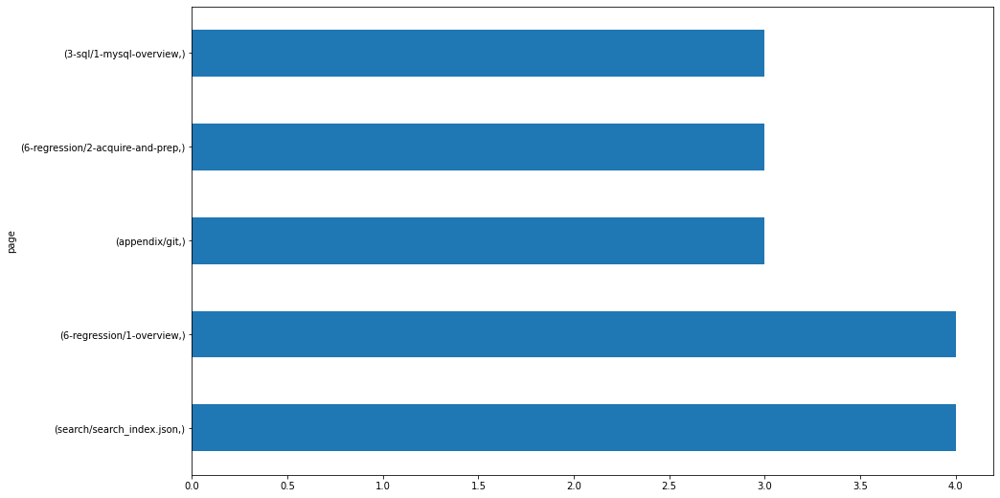


107.77.217.143
page
/       8
dtype: int64


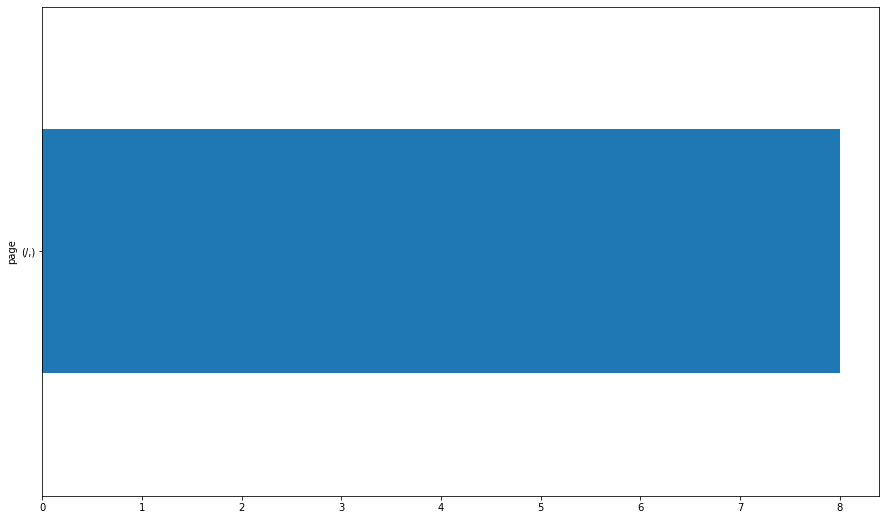


70.112.179.142
page                                   
/                                          74
sql/mysql-overview                         62
classification/overview                    56
fundamentals/AI-ML-DL-timeline.jpg         43
fundamentals/modern-data-scientist.jpg     42
                                           ..
appendix/ds-environment-setup               1
appendix/coding-challenges/professional     1
appendix/coding-challenges/amateur          1
appendix/coding-challenges                  1
nlp/model                                   1
Length: 158, dtype: int64


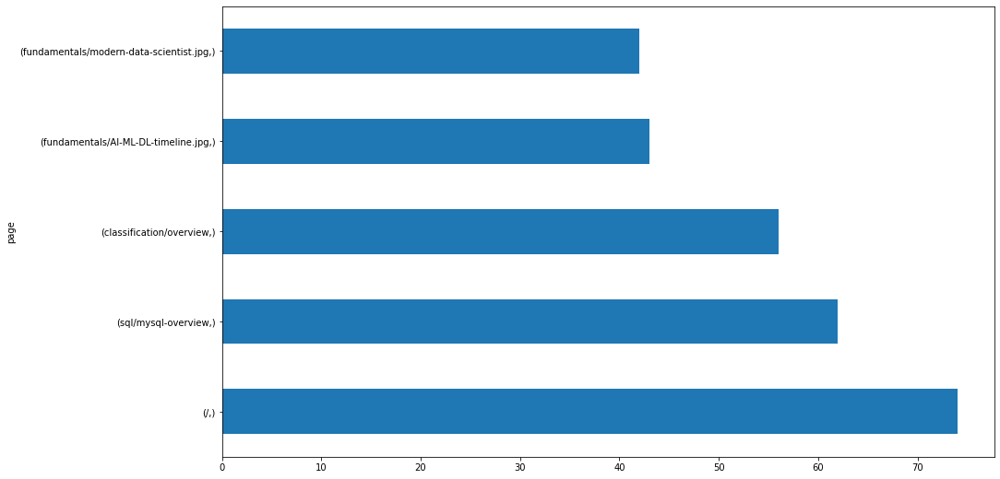


50.207.115.213
page
/       1
dtype: int64


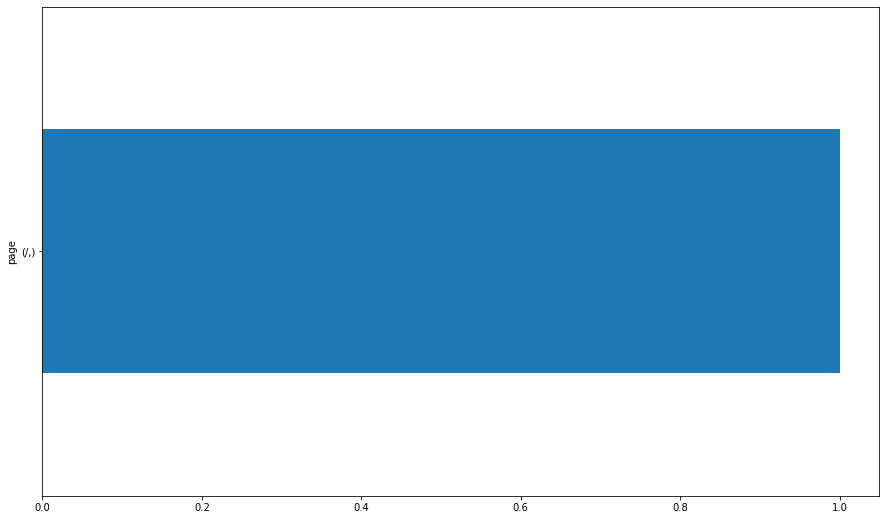


107.77.222.132
page                                 
12-distributed-ml/3-spark-api            3
12-distributed-ml/6-ml-with-spark        2
12-distributed-ml/5-explore              2
12-distributed-ml/4-wrangle              2
search/search_index.json                 1
12-distributed-ml/2-environment-setup    1
/                                        1
dtype: int64


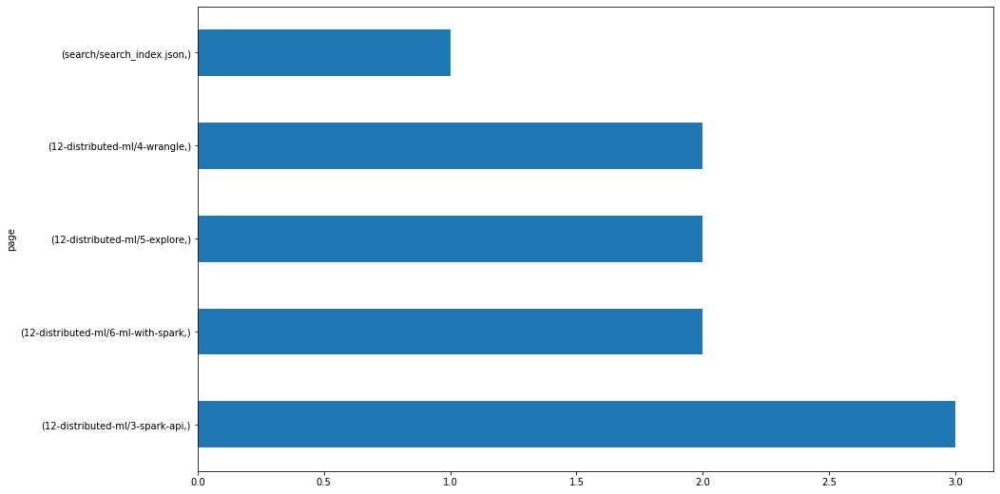


174.244.81.249
page
/       1
dtype: int64


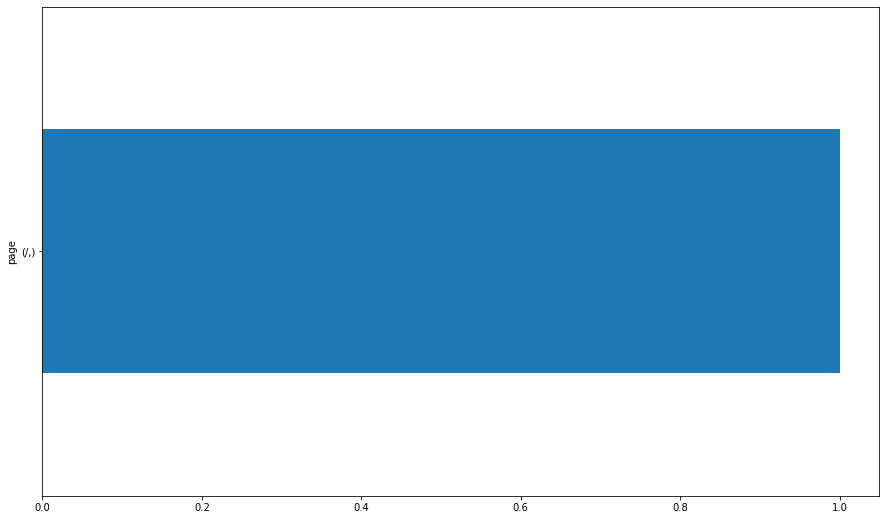


107.77.217.229
page                
6-regression/7-model    1
/                       1
dtype: int64


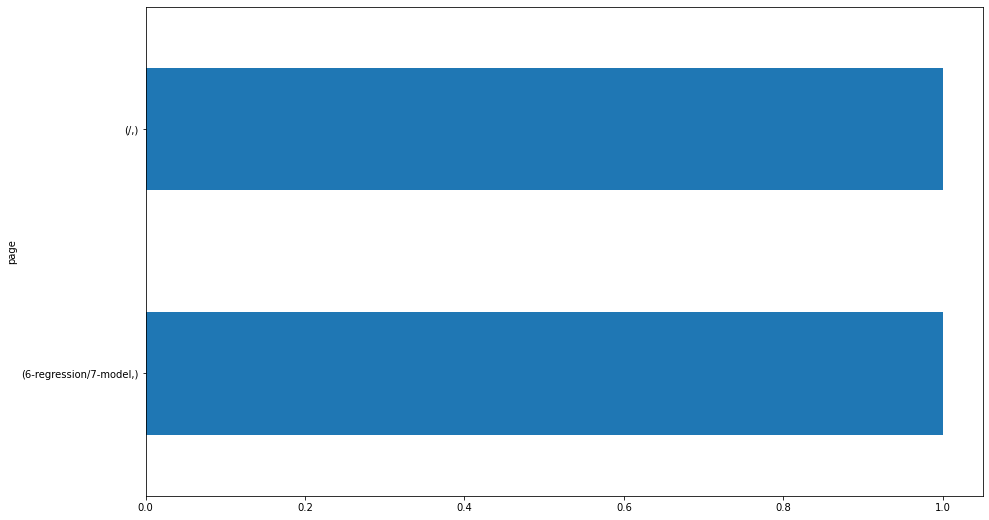


107.77.217.131
page                                               
appendix/professional-development/cover-letter-copy    1
dtype: int64


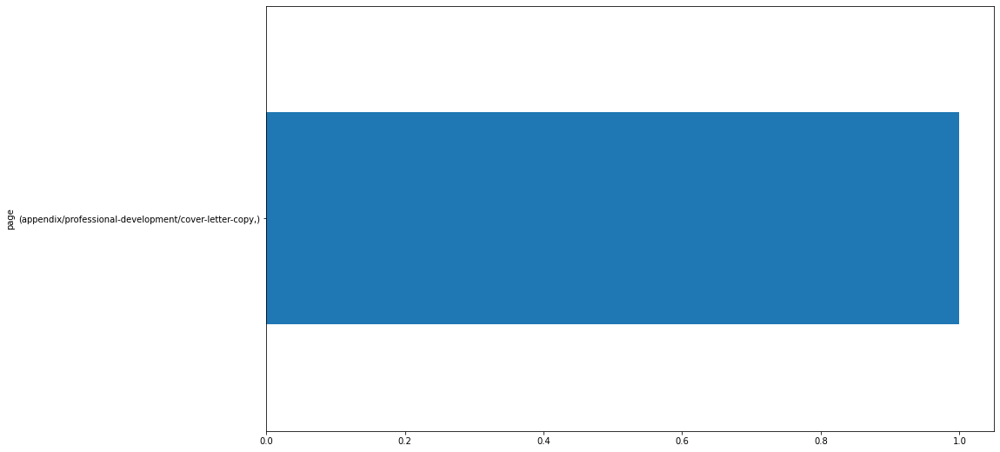


76.201.20.193
page                                    
classification/overview                     60
fundamentals/spreadsheets-overview          57
classification/scale_features_or_not.svg    47
sql/mysql-overview                          32
stats/compare-means                         29
                                            ..
storytelling/connecting-to-data              1
appendix/cli/6-moving-files                  1
appendix/cli/1-intro                         1
appendix/cli/0-overview                      1
timeseries/working-with-time-series-data     1
Length: 134, dtype: int64


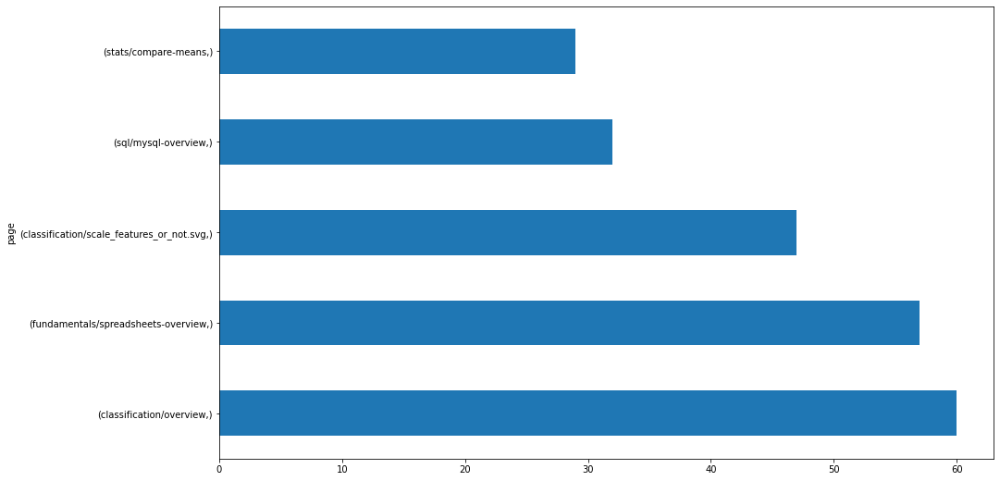


24.28.146.155
page                                    
1-fundamentals/1.1-intro-to-data-science    18
1-fundamentals/modern-data-scientist.jpg    17
1-fundamentals/AI-ML-DL-timeline.jpg        17
1-fundamentals/DataToAction_v2.jpg           3
1-fundamentals/1.3-pipeline-demo             3
1-fundamentals/1.2-data-science-pipeline     3
/                                            2
modern-data-scientist.jpg                    1
appendix/ds-environment-setup                1
AI-ML-DL-timeline.jpg                        1
13-advanced-topics/1-tidy-data               1
11-nlp/entity-labeling                       1
1-fundamentals/3-vocabulary                  1
1-fundamentals                               1
dtype: int64


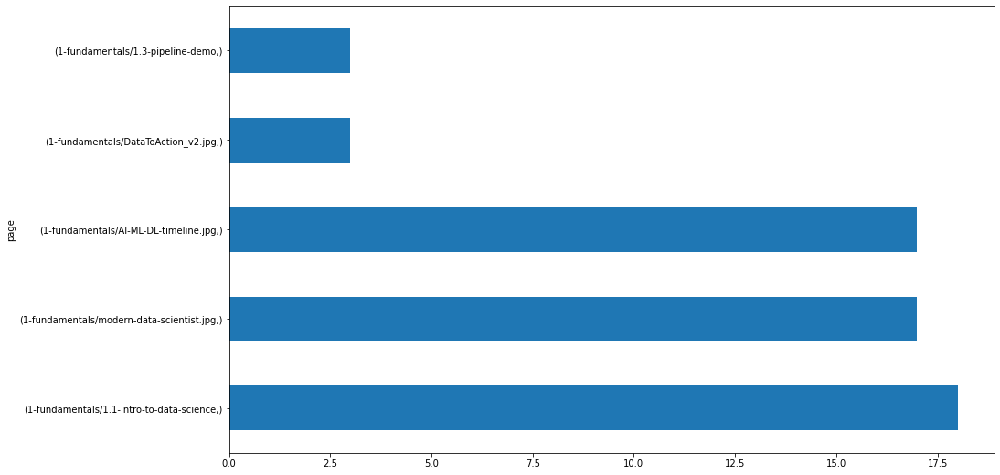


136.50.56.155
page                                    
/                                           42
classification/overview                     33
classification/scale_features_or_not.svg    26
sql/mysql-overview                          22
1-fundamentals/modern-data-scientist.jpg    21
                                            ..
storytelling/connecting-to-data              1
7-classification/1-overview                  1
4-python/pandas-time-series                  1
4-python/8.5-intro-to-seaborn                1
appendix/cli/2-listing-files                 1
Length: 135, dtype: int64


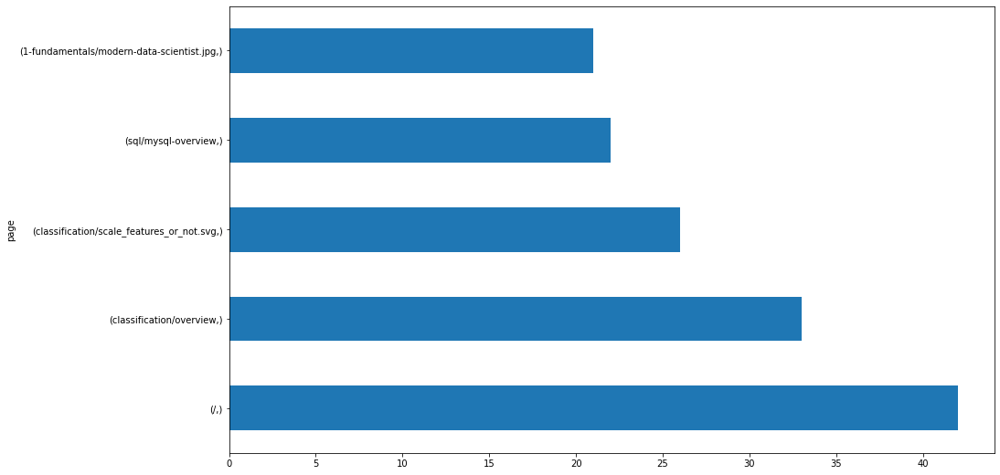


108.239.188.205
page                                                  
/                                                         124
classification/scale_features_or_not.svg                   90
classification/overview                                    88
sql/mysql-overview                                         85
1-fundamentals/AI-ML-DL-timeline.jpg                       23
                                                         ... 
3-sql/9.3-joins                                             1
anomaly-detection/time-series-anomaly-detection-part-1      1
advanced-topics/tidy-data                                   1
6-regression/1-overview                                     1
fundamentals/pipeline-demo                                  1
Length: 165, dtype: int64


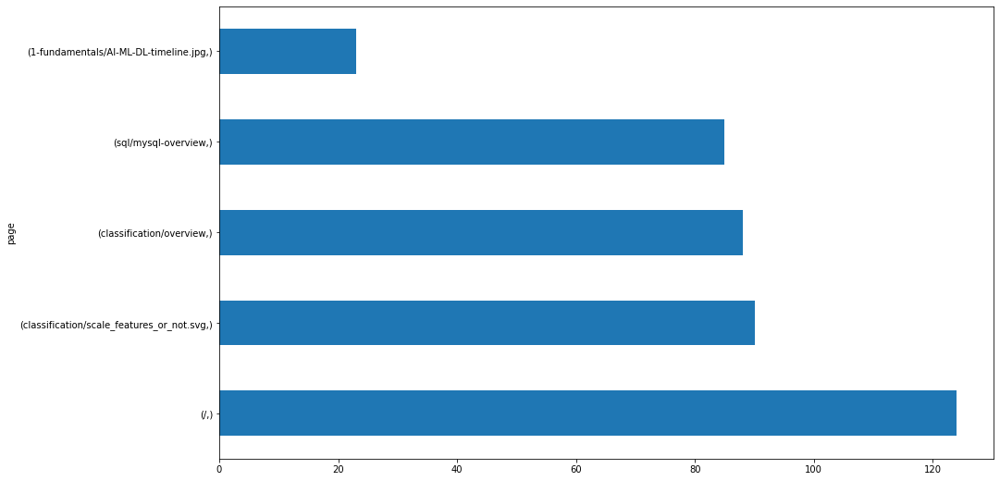


68.54.110.249
page                                              
/                                                     170
classification/overview                                41
1-fundamentals/AI-ML-DL-timeline.jpg                   30
1-fundamentals/modern-data-scientist.jpg               30
classification/scale_features_or_not.svg               25
                                                     ... 
anomaly-detection/discrete-probabilistic-methods        1
anomaly-detection/detecting-with-clustering             1
anomaly-detection/detecting-timeseries-anomalies        1
anomaly-detection/continuous-probabilistic-methods      1
nlp/model                                               1
Length: 158, dtype: int64


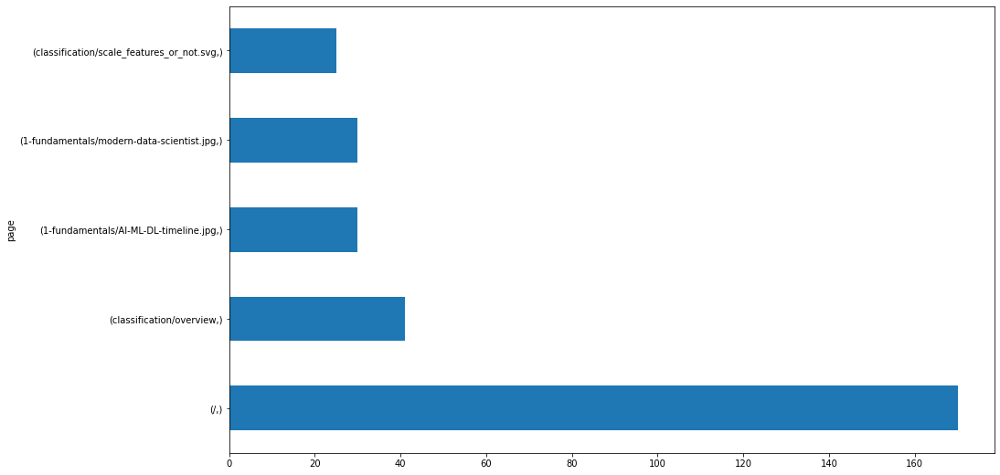


173.174.165.12
page                               
/                                      66
classification/logistic-regression     22
classification/prep                    21
python/intro-to-seaborn                20
python/dataframes                      18
                                       ..
storytelling/connecting-to-data         1
storytelling/bad-charts                 1
stats/viz.py                            1
python/ds-libraries-overview            1
storytelling/misleading3_deaths.jpg     1
Length: 94, dtype: int64


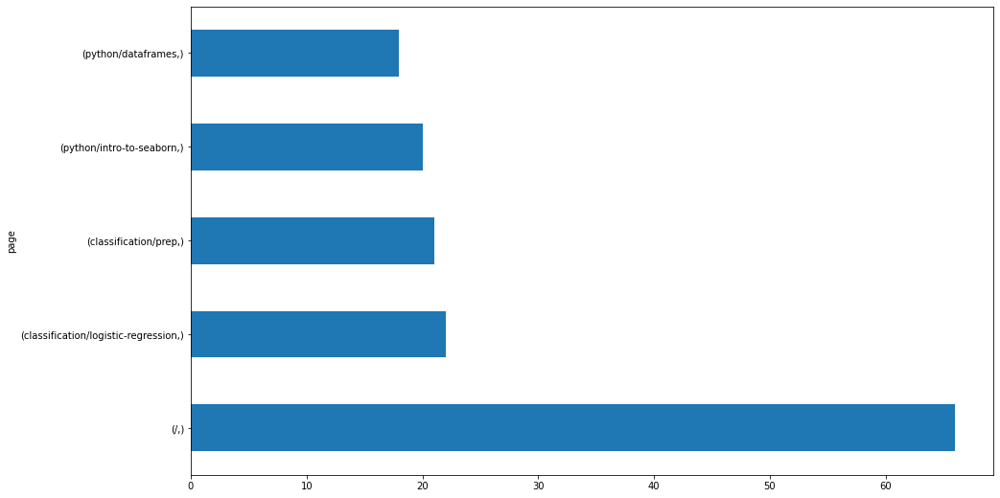


70.120.16.59
page                                           
/                                                  63
classification/overview                            34
classification/scale_features_or_not.svg           25
1-fundamentals/1.1-intro-to-data-science           17
1-fundamentals/modern-data-scientist.jpg           17
                                                   ..
2-storytelling/misleading1_fox.jpg                  1
2-storytelling/misleading1_baseball.jpg             1
2-storytelling/bad-charts                           1
2-storytelling/3.2-connecting-to-data               1
fundamentals/cli/creating-files-and-directories     1
Length: 161, dtype: int64


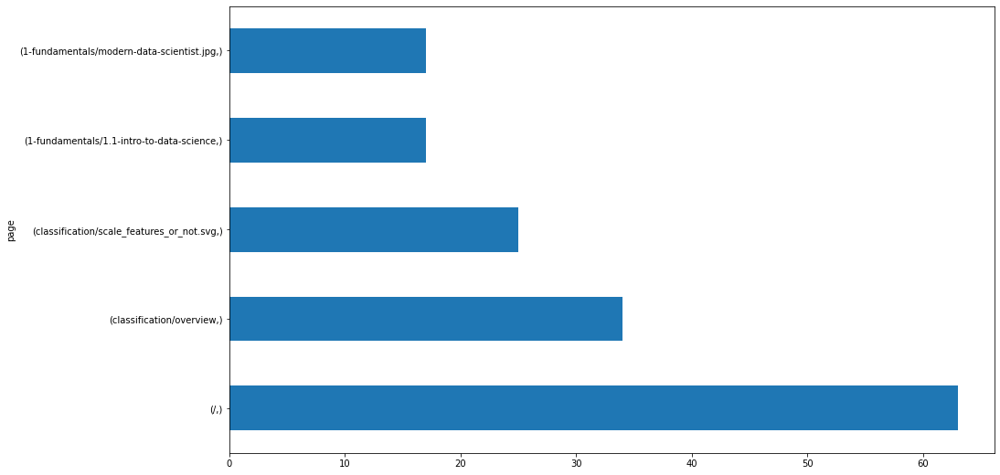


99.76.233.212
page                                              
/                                                     198
classification/overview                               182
classification/scale_features_or_not.svg              167
sql/mysql-overview                                     93
python/functions                                       60
                                                     ... 
9-timeseries/5.1-modeling-lesson1                       1
anomaly-detection/continuous-probabilistic-methods      1
appendix/cli/0-overview                                 1
appendix/cli/1-intro                                    1
fundamentals/cli/listing-files                          1
Length: 186, dtype: int64


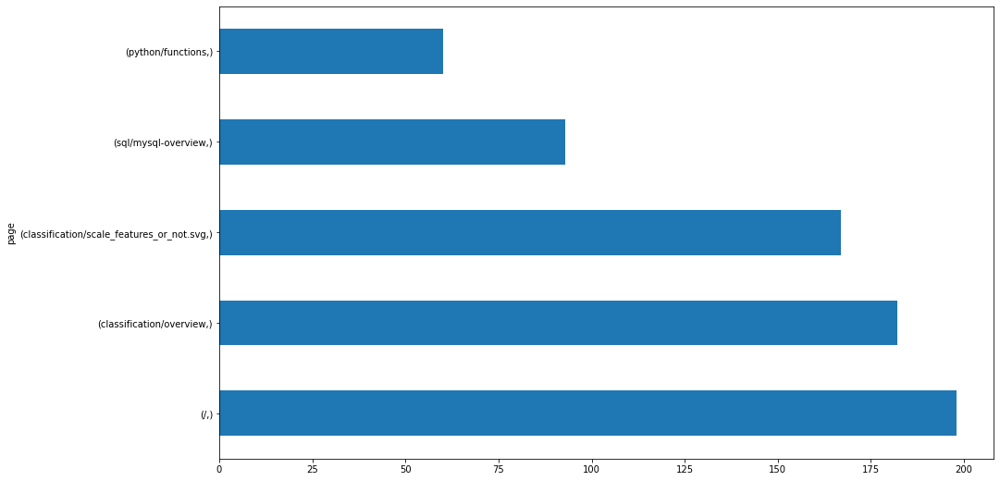


72.177.148.181
page                                          
/                                                 111
1-fundamentals/AI-ML-DL-timeline.jpg               18
1-fundamentals/modern-data-scientist.jpg           18
stats/compare-means                                16
regression/project                                 16
                                                 ... 
appendix/cli-git-overview                           1
anomaly-detection/overview                          1
anomaly-detection/AnomalyDetectionCartoon.jpeg      1
stats/viz.py                                        1
3-sql/8-group-by                                    1
Length: 127, dtype: int64


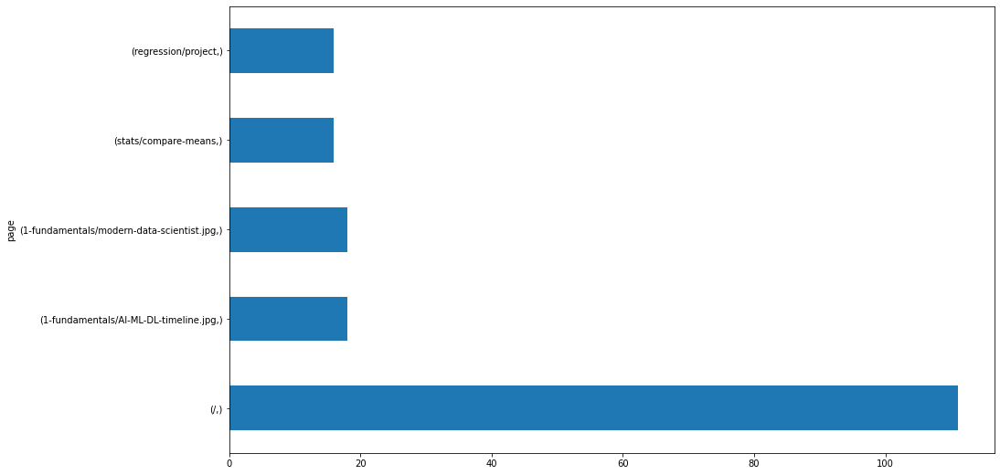


99.132.128.255
page                                
/                                       68
search/search_index.json                55
python/introduction-to-python           18
python/intro-to-matplotlib              17
stats/probability-distributions         16
                                        ..
appendix/cli/1-intro                     1
appendix/cli/0-overview                  1
sql/indexes                              1
advanced-topics/virtual-environments     1
fundamentals/cli/intro                   1
Length: 146, dtype: int64


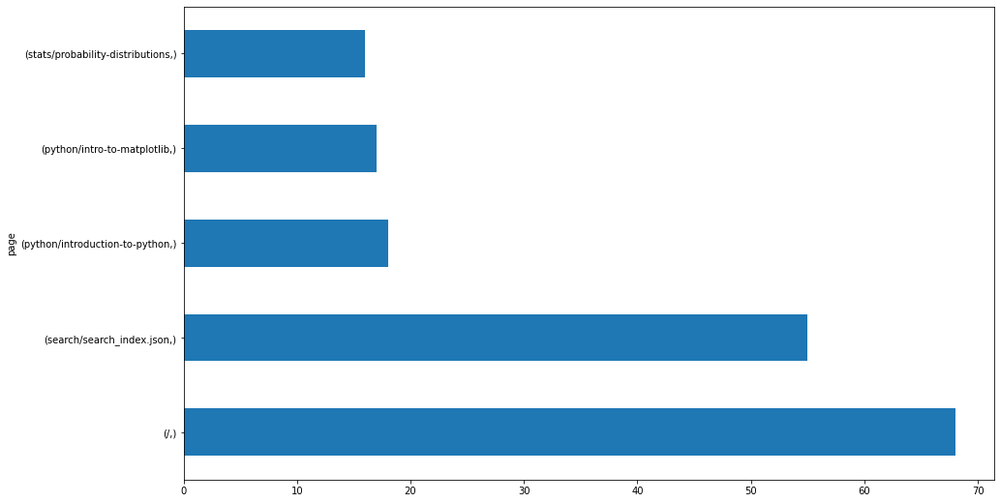


70.125.137.220
page                                       
stats/compare-means                            39
classification/overview                        36
1-fundamentals/1.1-intro-to-data-science       30
1-fundamentals/modern-data-scientist.jpg       29
1-fundamentals/AI-ML-DL-timeline.jpg           29
                                               ..
appendix/cli/7-more-topics                      1
appendix/cli/0-overview                         1
anomaly-detection/detecting-with-clustering     1
AI-ML-DL-timeline.jpg                           1
darden-python-assessment.html                   1
Length: 141, dtype: int64


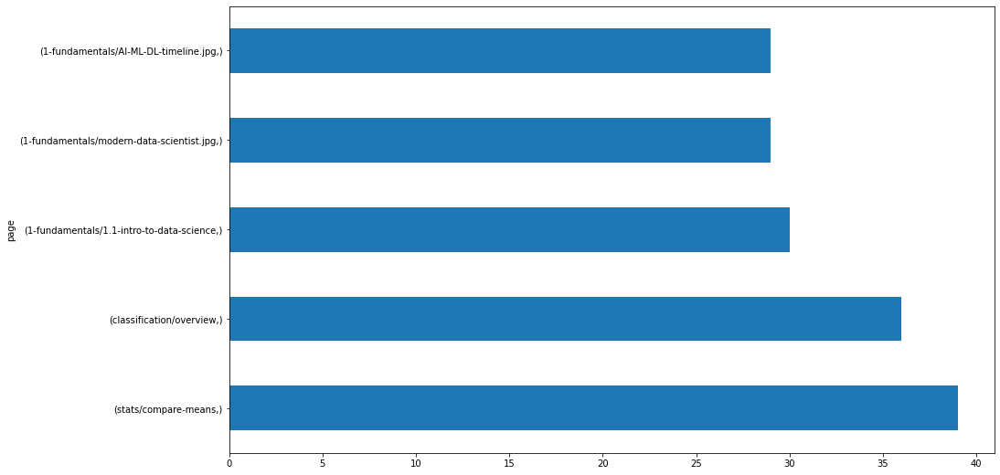


72.181.127.233
page                                    
classification/overview                     51
1-fundamentals/modern-data-scientist.jpg    39
1-fundamentals/AI-ML-DL-timeline.jpg        39
sql/mysql-overview                          37
classification/acquire                      32
                                            ..
regression/viz.py                            1
stats/viz.py                                 1
3-sql/2-mysql-introduction                   1
3-sql/3-databases                            1
6-regression/1-overview                      1
Length: 161, dtype: int64


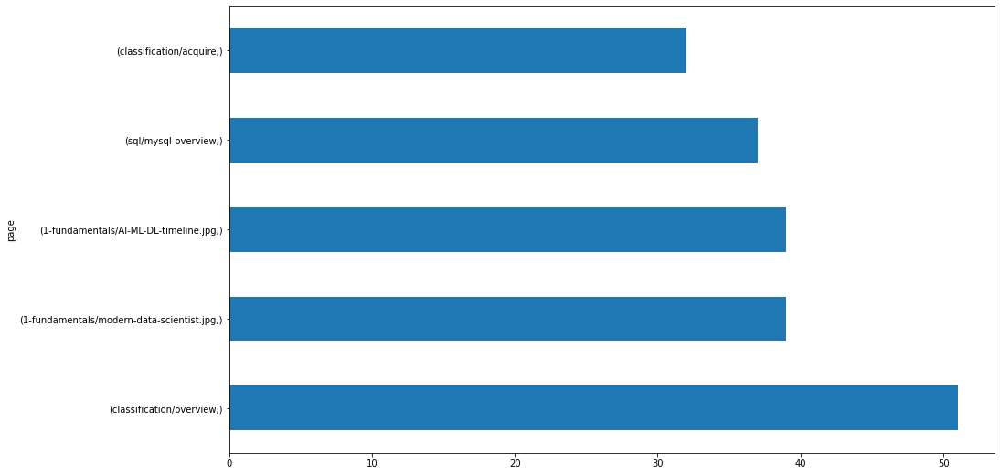


67.11.40.170
page                                         
/                                                45
python/advanced-dataframes                       10
search/search_index.json                         10
python/dataframes                                 7
python/intro-to-matplotlib                        6
                                                 ..
sql/case-statements                               1
appendix/cli/5-creating-files-and-directories     1
fundamentals/git                                  1
appendix/cli/3-file-paths                         1
timeseries/working-with-time-series-data          1
Length: 106, dtype: int64


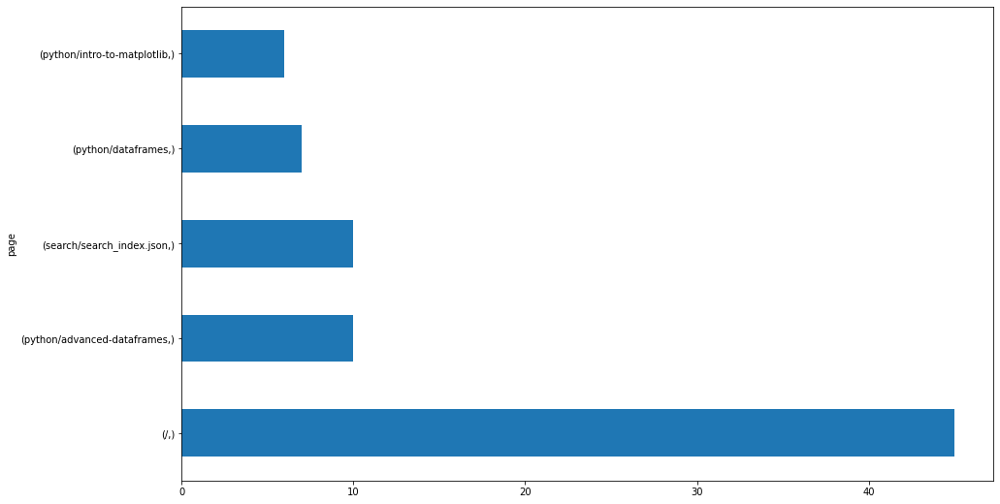


66.69.83.140
page                                    
/                                           246
1-fundamentals/AI-ML-DL-timeline.jpg         21
1-fundamentals/modern-data-scientist.jpg     21
classification/logistic-regression           20
fundamentals/functions                       19
                                           ... 
3-sql/database-design                         1
3-sql/9.4-subqueries                          1
3-sql/9.3-joins                               1
3-sql/9.2-indexes                             1
timeseries/project                            1
Length: 146, dtype: int64


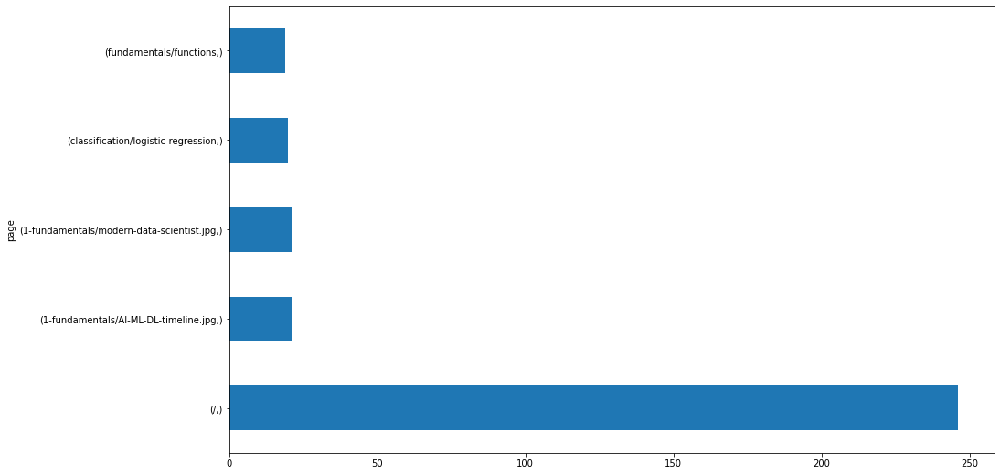


96.8.130.201
page                                    
1-fundamentals/1.1-intro-to-data-science    40
search/search_index.json                    29
5-stats/4.2-compare-means                   26
5-stats/4.1-hypothesis-testing-overview     22
modern-data-scientist.jpg                   22
                                            ..
storytelling/creating-stories                1
2.1-spreadsheets-overview                    1
2-storytelling/3.6-creating-stories          1
distributed-ml/spark-api                     1
fundamentals/DataToAction_v2.jpg             1
Length: 157, dtype: int64


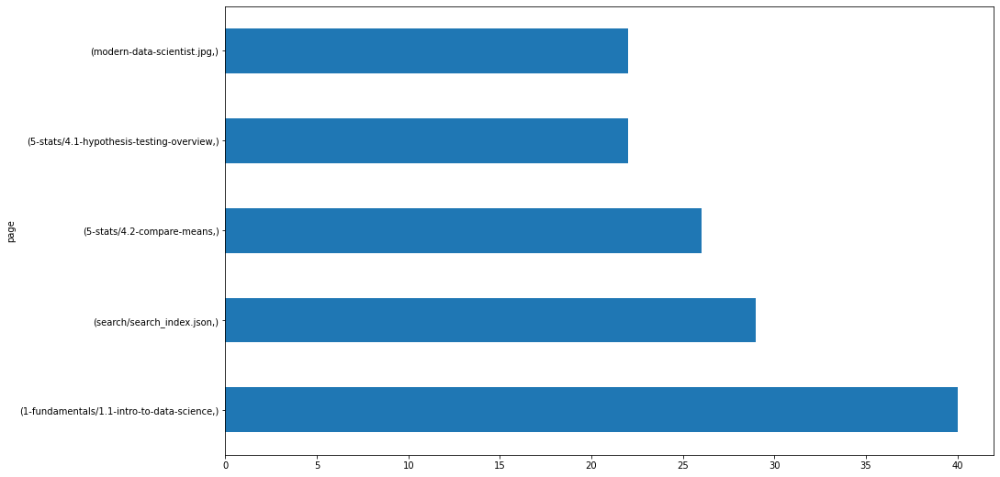


136.50.3.247
page                           
/                                  102
classification/prep                 10
python/intro-to-matplotlib           9
classification/decision-trees        9
stats/compare-means                  8
                                  ... 
storytelling/understand              1
timeseries/modeling-lesson1          1
appendix/git                         1
appendix/documentation               1
storytelling/connecting-to-data      1
Length: 109, dtype: int64


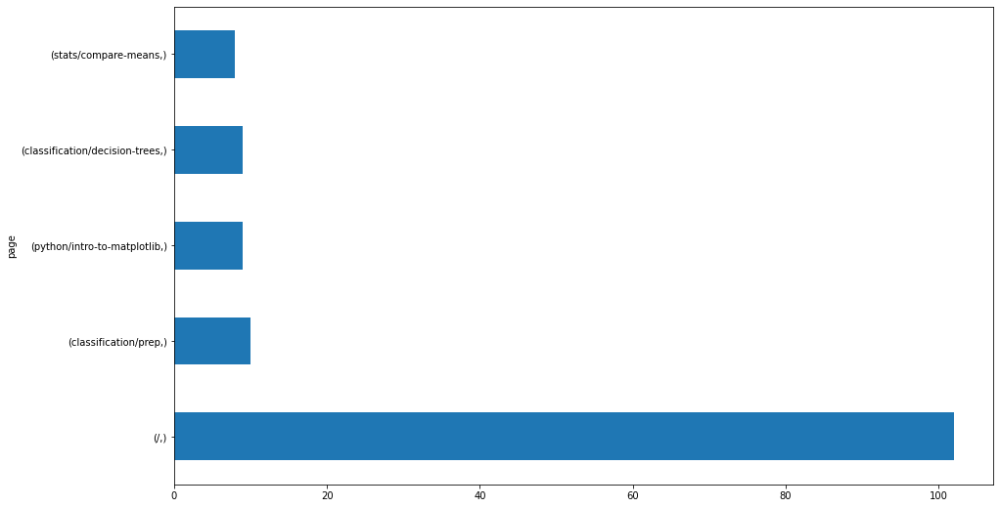


96.8.130.186
page                                         
1-fundamentals/1.1-intro-to-data-science         10
1-fundamentals/modern-data-scientist.jpg         10
1-fundamentals/AI-ML-DL-timeline.jpg             10
/                                                 8
python/introduction-to-python                     6
appendix/cli-git-overview                         5
appendix/cli/2-listing-files                      5
appendix/cli/5-creating-files-and-directories     4
3-sql/6.4-limit                                   4
1-fundamentals/DataToAction_v2.jpg                4
appendix/cli/1-intro                              4
3-sql/6.3-order-by                                4
1-fundamentals/1.2-data-science-pipeline          4
fundamentals/git                                  4
sql/temporary-tables                              3
search/search_index.json                          3
3-sql/7-functions                                 3
3-sql/8-group-by                                  3
appe

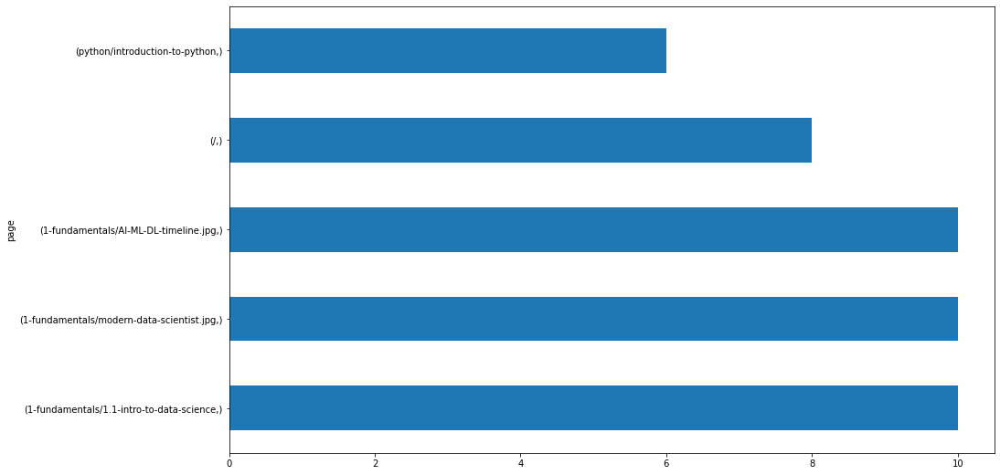


162.197.239.66
page                                    
/                                           35
1-fundamentals/AI-ML-DL-timeline.jpg        28
1-fundamentals/modern-data-scientist.jpg    28
1-fundamentals/1.1-intro-to-data-science    22
search/search_index.json                    18
                                            ..
3-sql/9.3-joins                              1
3-sql/9.1-relationships-overview             1
3-sql/6.4-limit                              1
3-sql/6.3-order-by                           1
fundamentals/cli/listing-files               1
Length: 147, dtype: int64


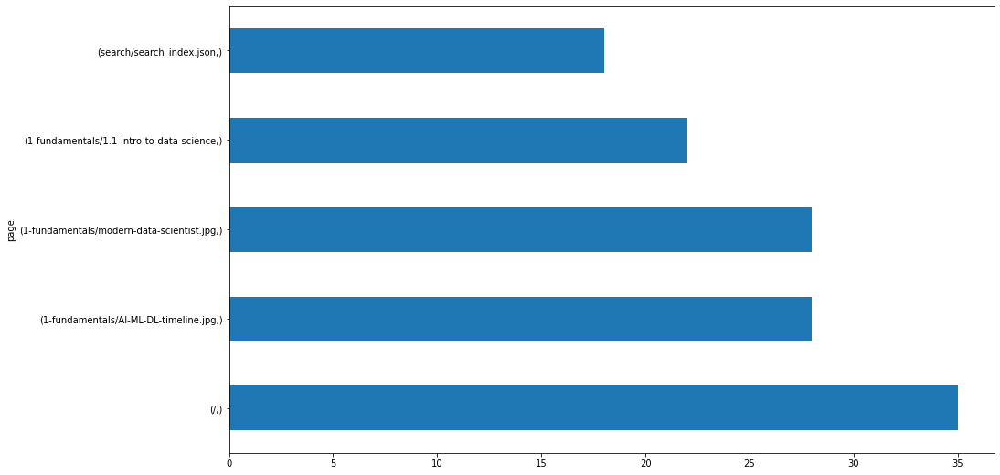


173.174.200.226
page                                    
classification/overview                     24
stats/compare-means                         23
3-sql/10-temporary-tables                   22
1-fundamentals/1.1-intro-to-data-science    20
1-fundamentals/AI-ML-DL-timeline.jpg        20
                                            ..
sql/joins                                    1
4-python/4-control-structures                1
4-python/3-data-types-and-variables          1
3-sql/9.1-relationships-overview             1
5-stats/Selecting_a_hypothesis_test.svg      1
Length: 163, dtype: int64


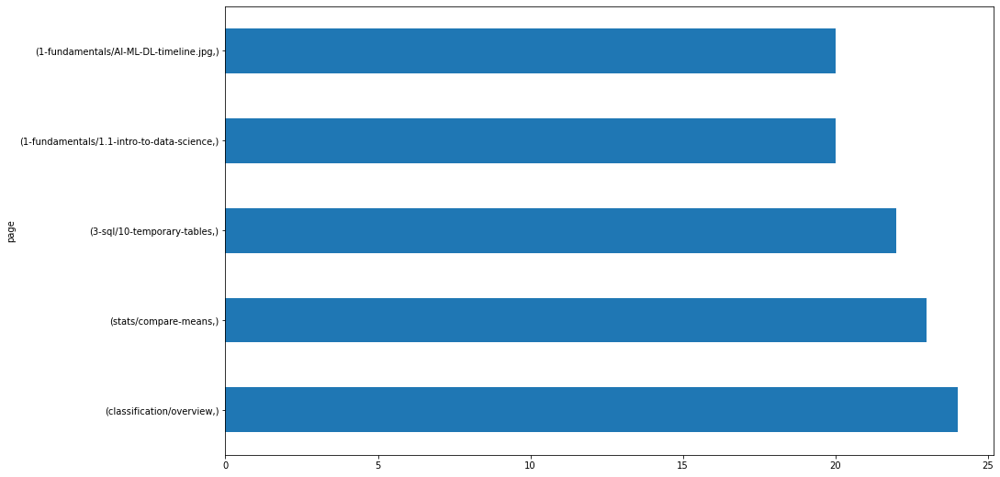


67.11.85.236
page                                    
/                                           90
classification/overview                     42
classification/scale_features_or_not.svg    37
clustering/project                          23
classification/logistic-regression          18
                                            ..
appendix/data_science_community              1
appendix/cli/2-listing-files                 1
appendix/cli/3-file-paths                    1
appendix/coding-challenges                   1
appendix/open_data/www.openstreetmap.org     1
Length: 146, dtype: int64


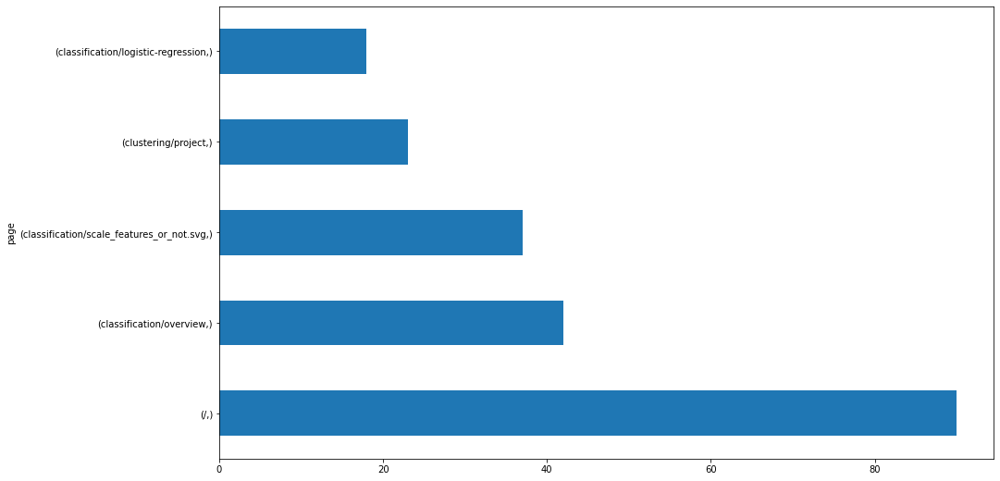


136.50.70.27
page                                           
/                                                  79
sql/mysql-overview                                 65
classification/overview                            47
fundamentals/intro-to-data-science                 36
fundamentals/modern-data-scientist.jpg             36
                                                   ..
5-stats/sampling                                    1
7-classification/2-acquire                          1
9-timeseries/svr                                    1
advanced-topics/building-a-model                    1
appendix/professional-development/offer-letters     1
Length: 196, dtype: int64


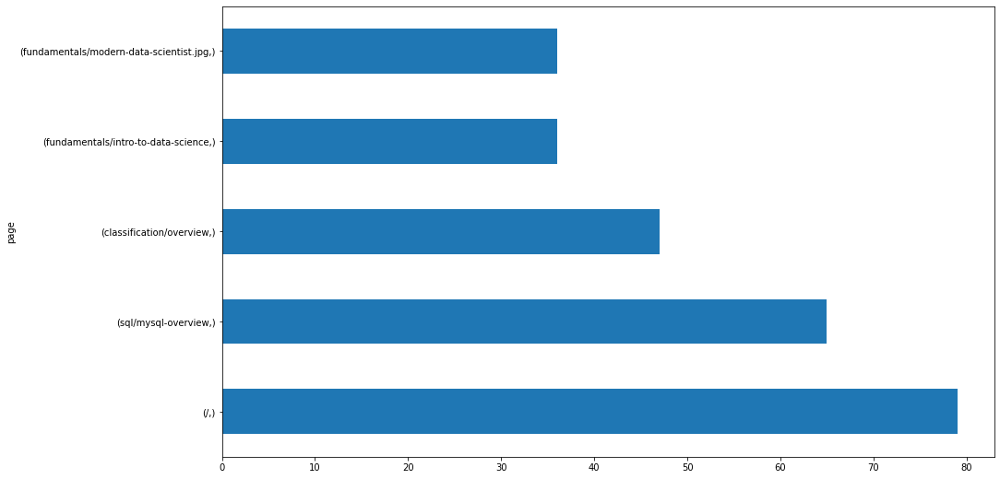


184.226.101.48
page                                    
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


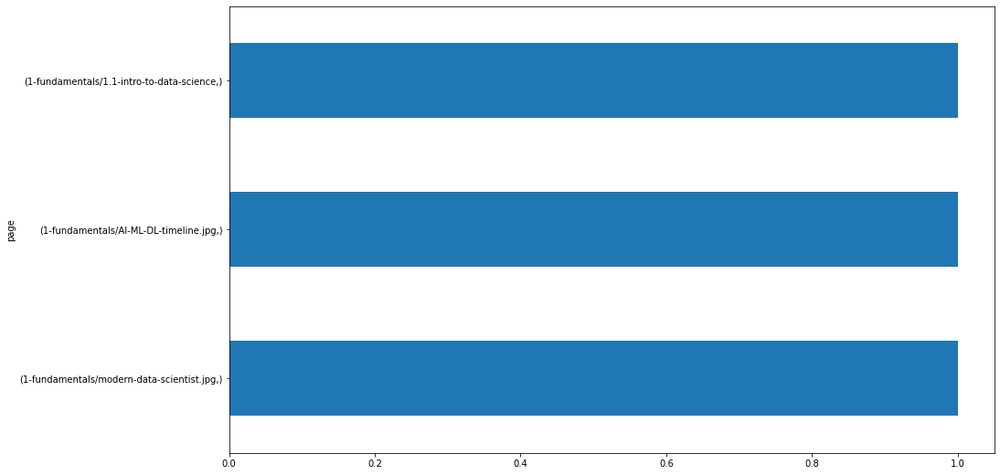


70.120.73.115
page                                    
/                                           10
1-fundamentals/3-vocabulary                  6
1-fundamentals/DataToAction_v2.jpg           6
1-fundamentals/1.2-data-science-pipeline     6
1-fundamentals/AI-ML-DL-timeline.jpg         5
1-fundamentals/modern-data-scientist.jpg     5
sql/joins                                    5
1-fundamentals/1.1-intro-to-data-science     5
1-fundamentals/1.3-pipeline-demo             4
appendix/cli-git-overview                    4
series                                       4
3-sql/6.4-limit                              4
sql/group-by                                 3
python/introduction-to-python                3
python/data-types-and-variables              3
appendix/cli/2-listing-files                 2
appendix/cli/1-intro                         2
appendix/cli/0-overview                      2
3-sql/6.3-order-by                           2
3-sql/7-functions                            2
3-sq

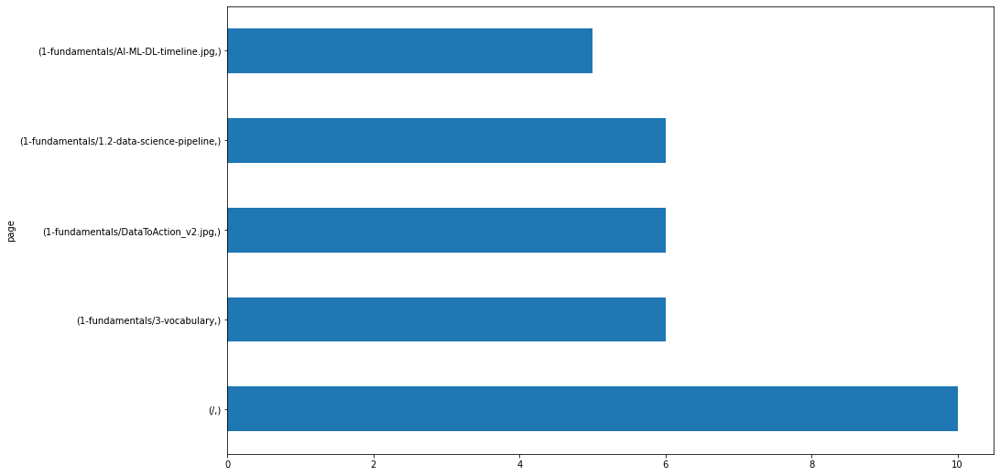


184.203.177.106
page                                    
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


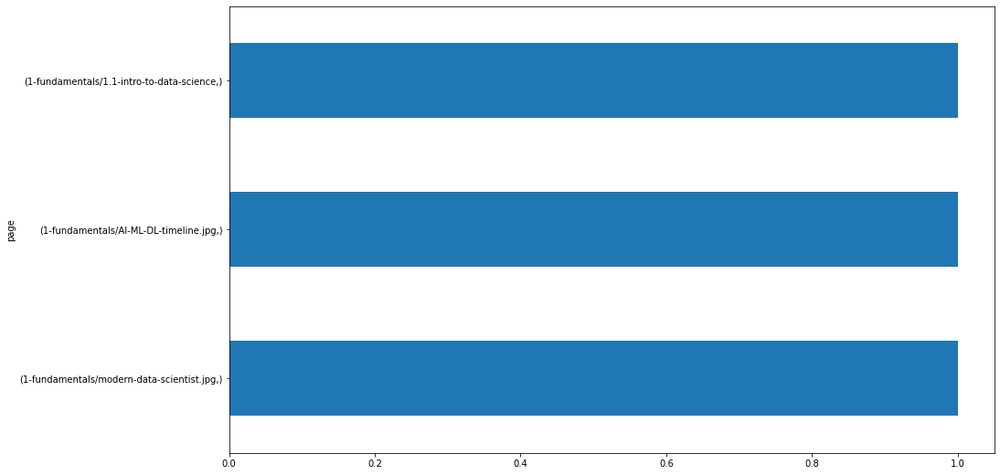


173.123.90.87
page                                    
search/search_index.json                    1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.2-data-science-pipeline    1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


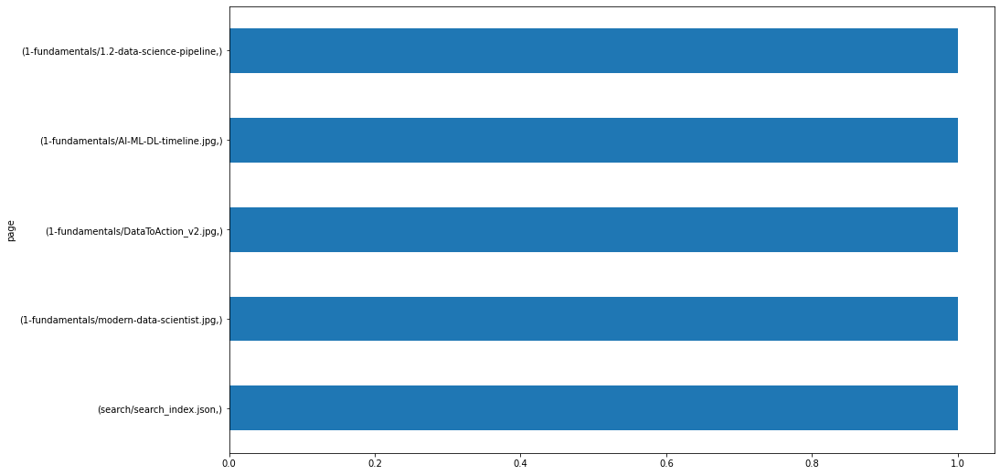


67.11.185.253
page                                         
1-fundamentals/modern-data-scientist.jpg         7
1-fundamentals/AI-ML-DL-timeline.jpg             7
1-fundamentals/1.1-intro-to-data-science         7
appendix/cli-git-overview                        4
appendix/cli/2-listing-files                     3
1-fundamentals/DataToAction_v2.jpg               3
1-fundamentals/1.2-data-science-pipeline         3
appendix/cli/4-navigating-the-filesystem         2
appendix/cli/3-file-paths                        2
appendix/cli/1-intro                             2
appendix/cli/0-overview                          2
/                                                2
appendix/cli/5-creating-files-and-directories    1
1-fundamentals/1.3-pipeline-demo                 1
dtype: int64


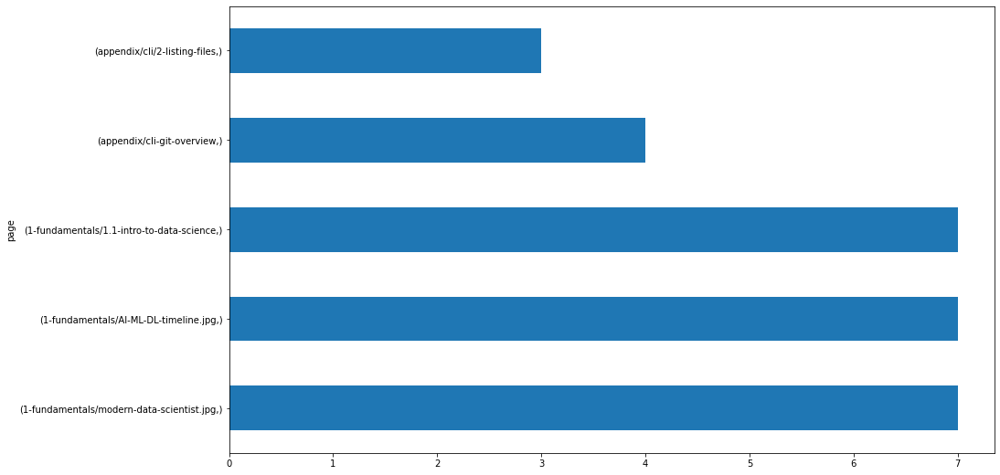


184.203.105.40
page                                    
search/search_index.json                    15
1-fundamentals/modern-data-scientist.jpg    11
1-fundamentals/AI-ML-DL-timeline.jpg        11
1-fundamentals/1.1-intro-to-data-science    11
1-fundamentals/DataToAction_v2.jpg           6
1-fundamentals/1.2-data-science-pipeline     6
1-fundamentals/1.3-pipeline-demo             3
2-storytelling/1-overview                    2
6-regression/1-overview                      1
/                                            1
dtype: int64


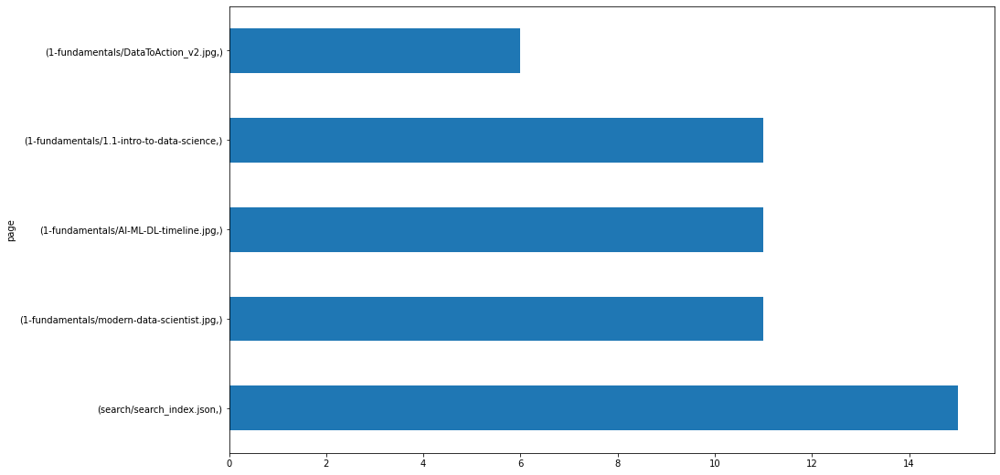


173.149.157.87
page                                    
search/search_index.json                    1
appendix/cli/4-navigating-the-filesystem    1
appendix/cli/3-file-paths                   1
appendix/cli/2-listing-files                1
appendix/cli-git-overview                   1
dtype: int64


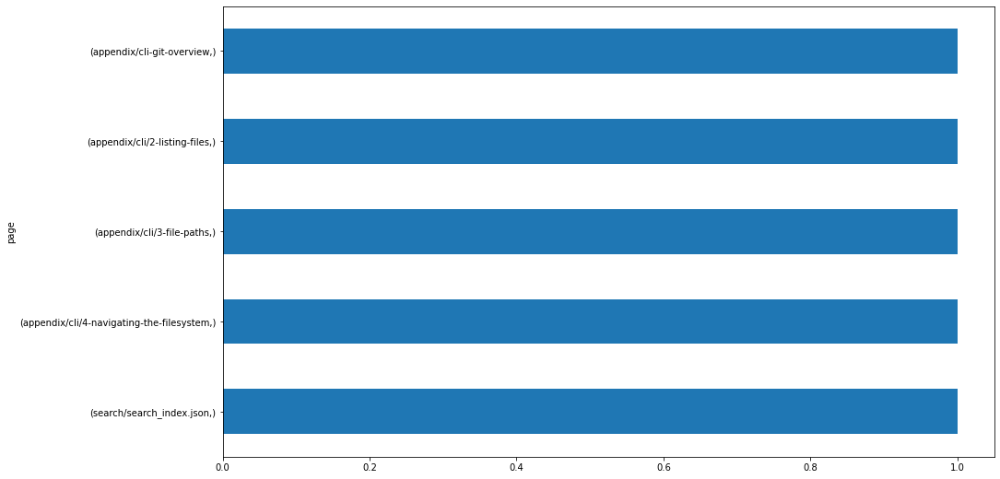


24.28.145.253
page                                                      
/                                                             15
1-fundamentals/AI-ML-DL-timeline.jpg                          14
1-fundamentals/modern-data-scientist.jpg                      14
1-fundamentals/1.1-intro-to-data-science                      13
1-fundamentals/1.2-data-science-pipeline                      10
1-fundamentals/DataToAction_v2.jpg                            10
3-sql/4-tables                                                 8
3-sql/5-basic-statements                                       5
sql/group-by                                                   4
3-sql/3-databases                                              4
appendix/git                                                   4
sql/indexes                                                    3
3-sql/6.3-order-by                                             3
3-sql/7-functions                                              3
1-fundamentals/1

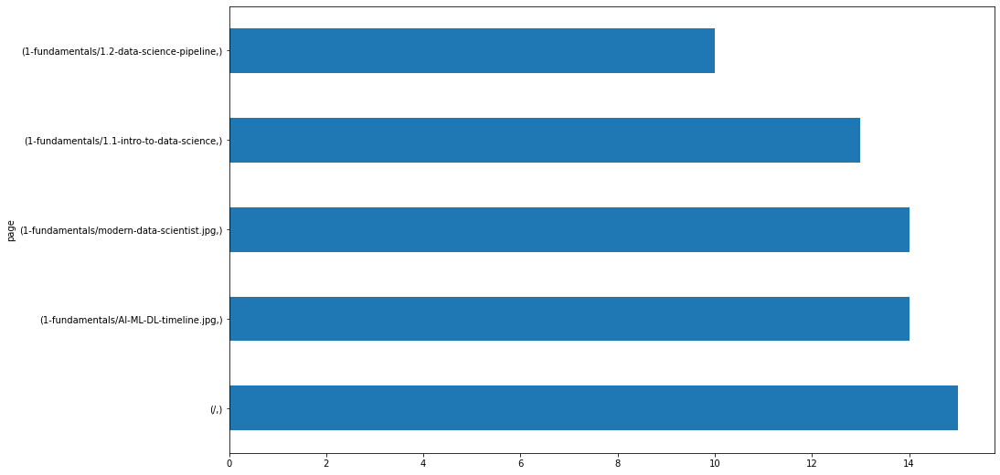


173.123.150.183
page                                    
appendix/git                                1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


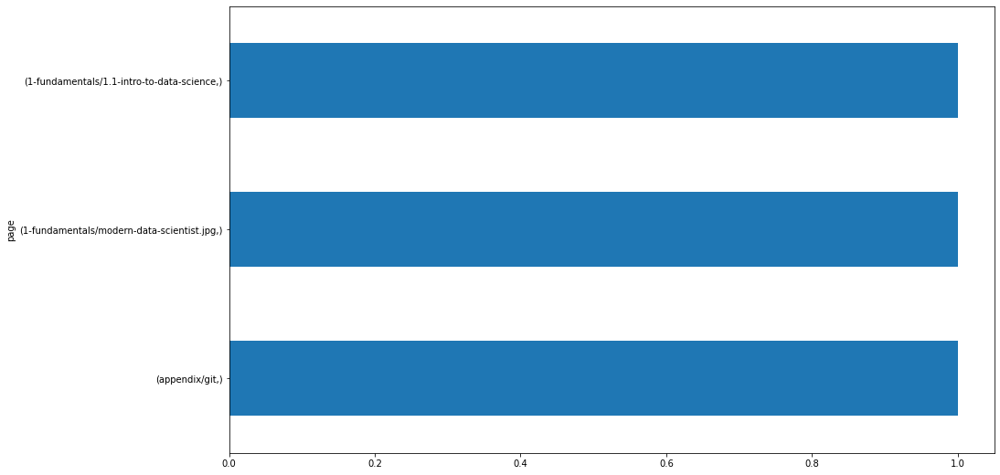


99.203.90.58
page                               
3-sql/5-basic-statements               5
3-sql/4-tables                         4
/                                      3
3-sql/1-mysql-overview                 3
4-python/2-introduction-to-python      3
3-sql/7-functions                      3
3-sql/9.1-relationships-overview       2
3-sql/10-temporary-tables              2
3-sql/11-case-statements               2
3-sql/2-mysql-introduction             2
3-sql/3-databases                      2
3-sql/6.1-clauses-overview             2
3-sql/8-group-by                       2
3-sql/9.2-indexes                      2
5-stats/2-simulation                   2
5-stats/3-probability-distributions    1
3-sql/6.2-where                        1
3-sql/9.3-joins                        1
4-python/1-overview                    1
4-python/4-control-structures          1
4-python/5-functions                   1
4-python/7-working-with-files          1
3-sql/12-more-exercises                1
4-pytho

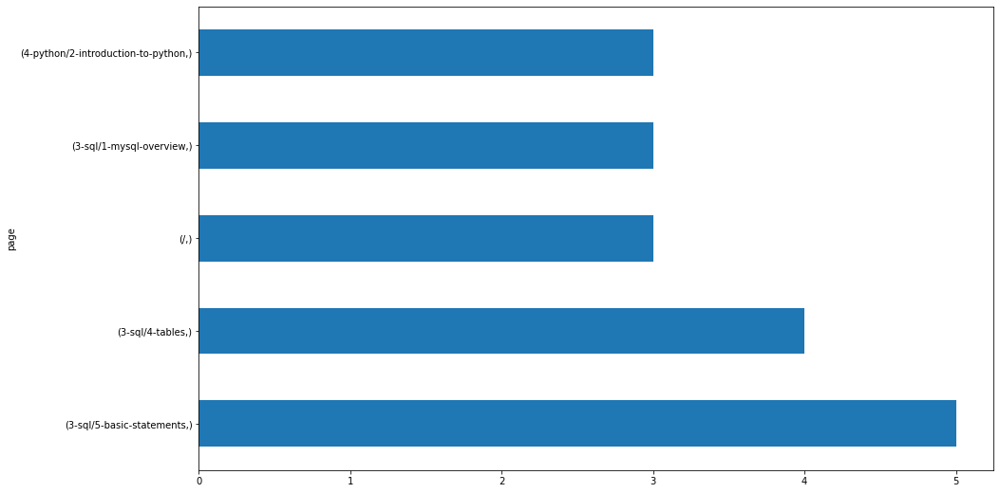


173.174.236.31
page                                    
/                                           4
python/dataframes                           2
timeseries/acquire                          1
storytelling/tableau                        1
storytelling/connecting-to-data             1
stats/simulation                            1
python/advanced-dataframes                  1
classification/scale_features_or_not.svg    1
classification/overview                     1
appendix/git                                1
3-sql/1-mysql-overview                      1
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.2-data-science-pipeline    1
1-fundamentals/1.1-intro-to-data-science    1
dtype: int64


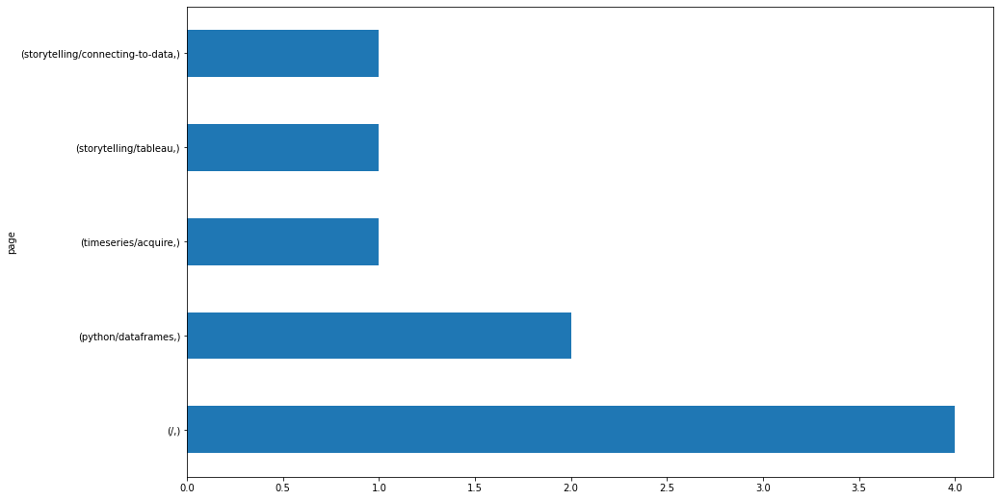


173.127.80.254
page                                    
1-fundamentals/modern-data-scientist.jpg    1
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/AI-ML-DL-timeline.jpg        1
1-fundamentals/1.3-pipeline-demo            1
1-fundamentals/1.2-data-science-pipeline    1
1-fundamentals/1.1-intro-to-data-science    1
/                                           1
dtype: int64


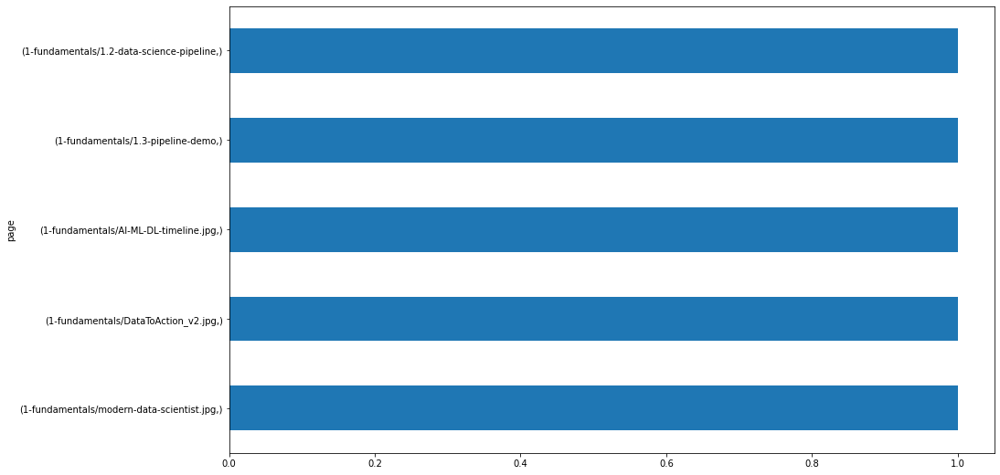


184.226.64.13
page                                    
1-fundamentals/DataToAction_v2.jpg          1
1-fundamentals/1.2-data-science-pipeline    1
dtype: int64


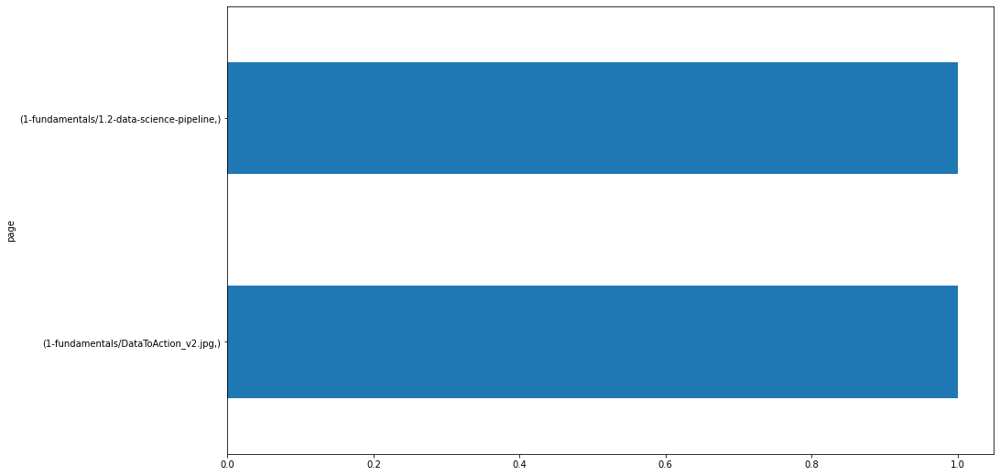


173.149.209.79
page                        
appendix/git                    2
appendix/cli/0-overview         2
appendix/cli/7-more-topics      1
appendix/cli/6-moving-files     1
appendix/cli/2-listing-files    1
appendix/cli/1-intro            1
appendix/cli-git-overview       1
3-sql/1-mysql-overview          1
1-fundamentals/3-vocabulary     1
/                               1
dtype: int64


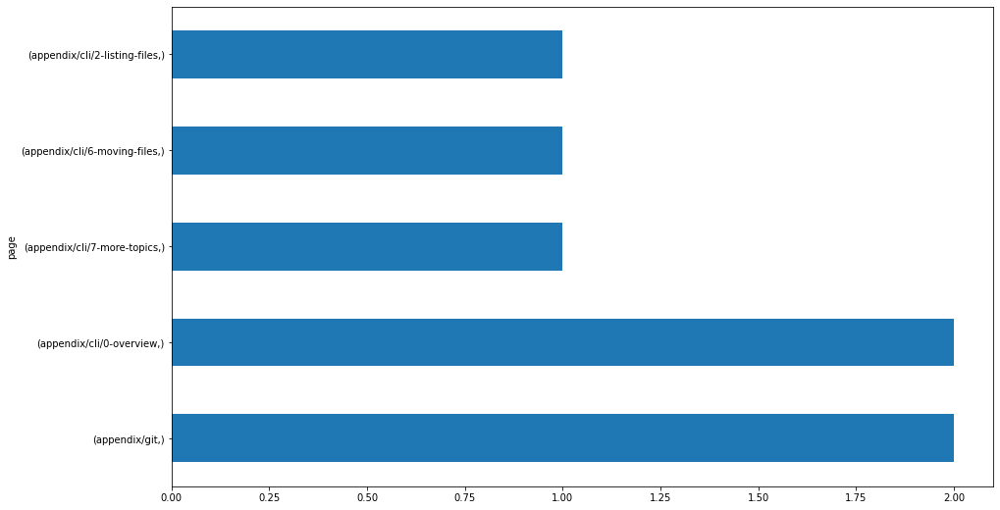


173.149.157.75
page           
3-sql/6.2-where    1
/                  1
dtype: int64


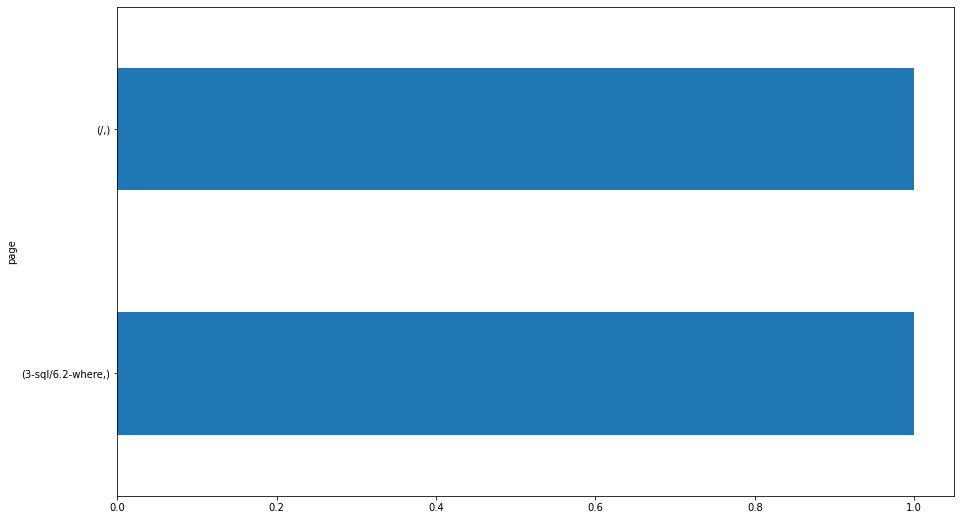


173.123.149.62
page                      
3-sql/6.4-limit               4
3-sql/6.3-order-by            4
3-sql/8-group-by              1
3-sql/7-functions             1
3-sql/6.1-clauses-overview    1
3-sql/12-more-exercises       1
dtype: int64


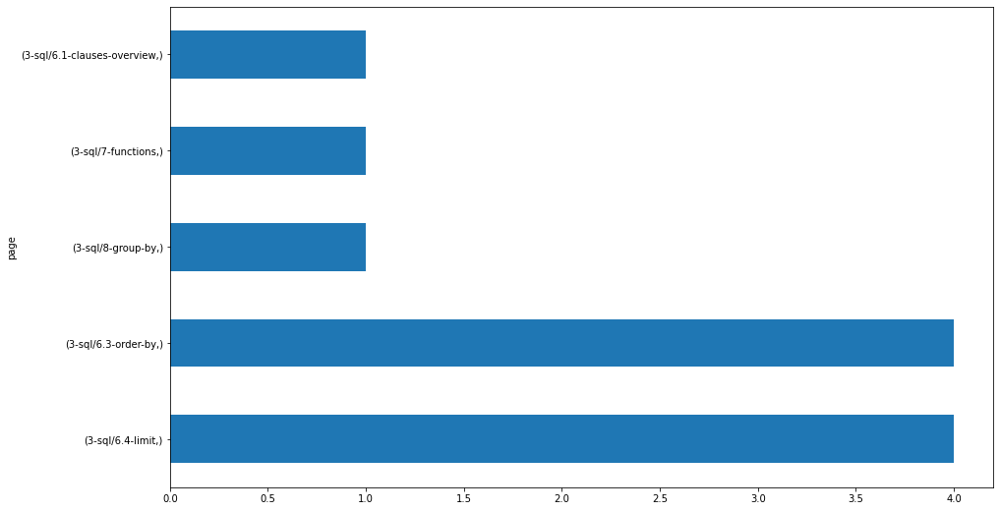


99.203.26.44
page                    
3-sql/5-basic-statements    1
dtype: int64


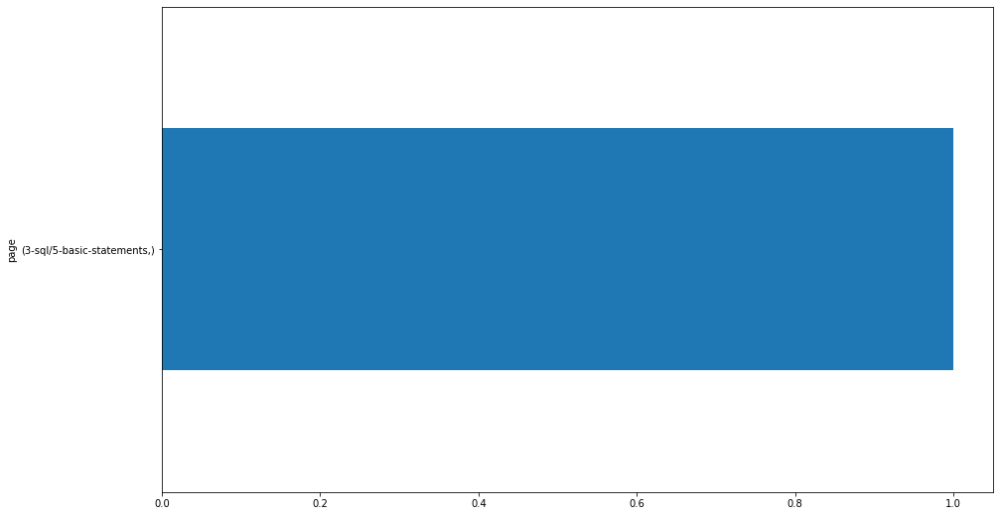


173.127.48.40
page                      
sql/relationships-overview    2
/                             2
sql/indexes                   1
dtype: int64


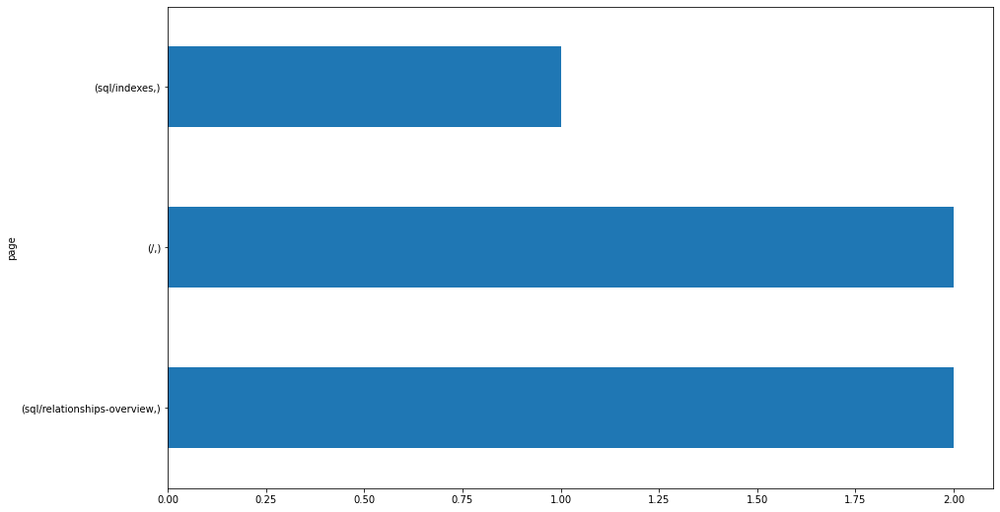


173.127.8.49
page                
sql/joins               3
sql/temporary-tables    1
/                       1
dtype: int64


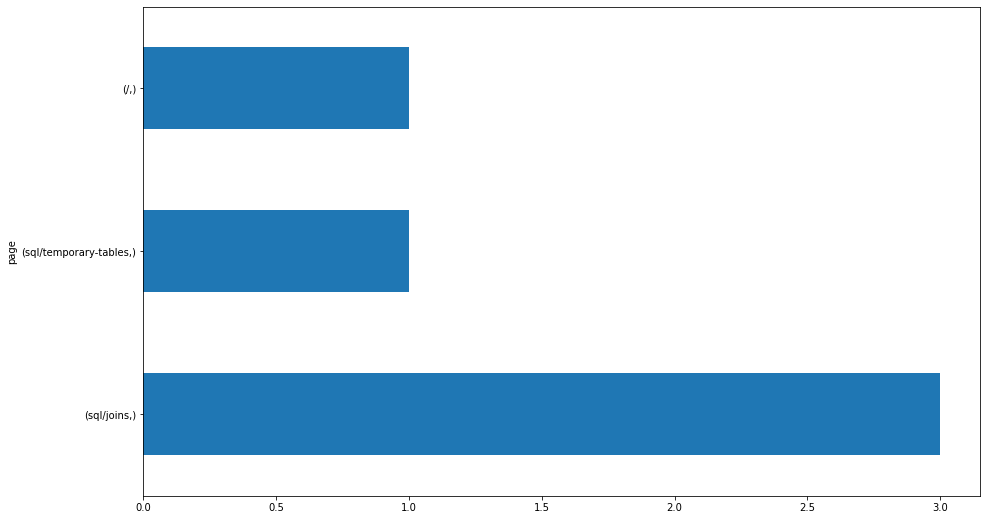


173.123.172.254
page                    
sql/joins                   1
sql/group-by                1
search/search_index.json    1
dtype: int64


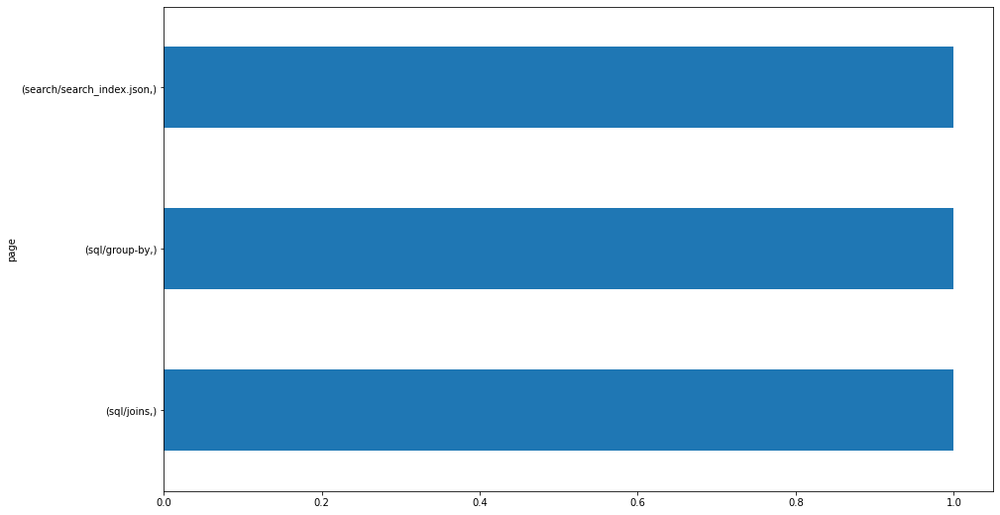


184.203.160.10
page          
sql/subqueries    1
sql/joins         1
dtype: int64


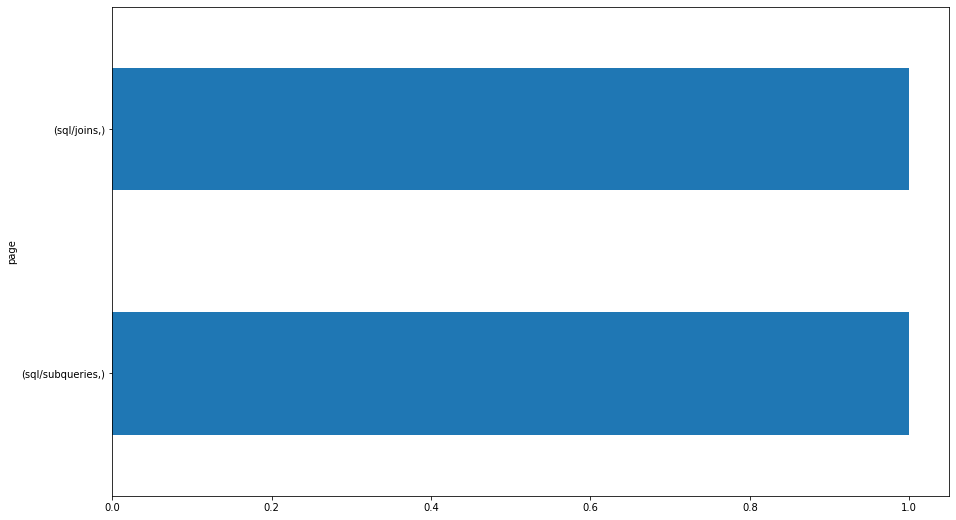


67.11.185.104
page                               
/                                      54
sql/group-by                           25
python/control-structures              21
python/data-types-and-variables        21
sql/basic-statements                   16
                                       ..
storytelling/misleading3_deaths.jpg     1
python/pandas-overview                  1
python/pandas-time-series               1
python/type-annotations                 1
storytelling/overview                   1
Length: 64, dtype: int64


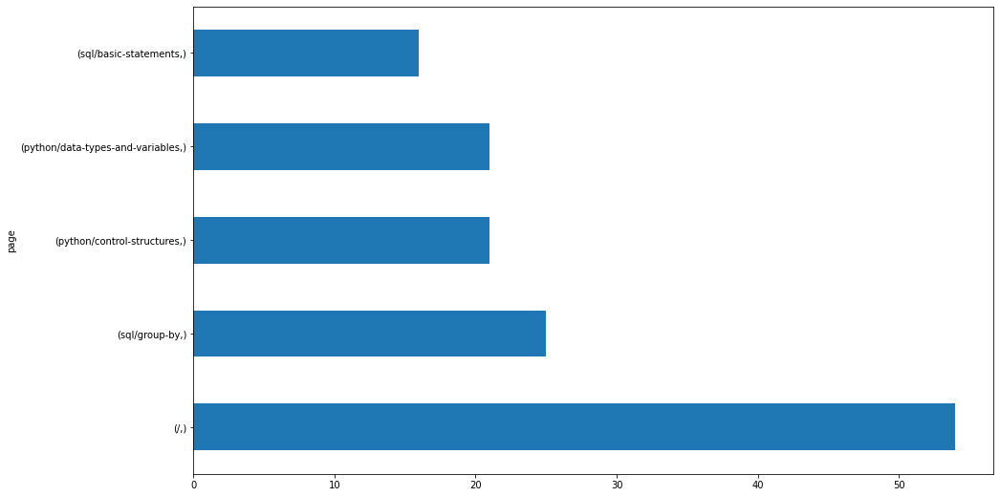


107.77.222.195
page     
sql/joins    1
/            1
dtype: int64


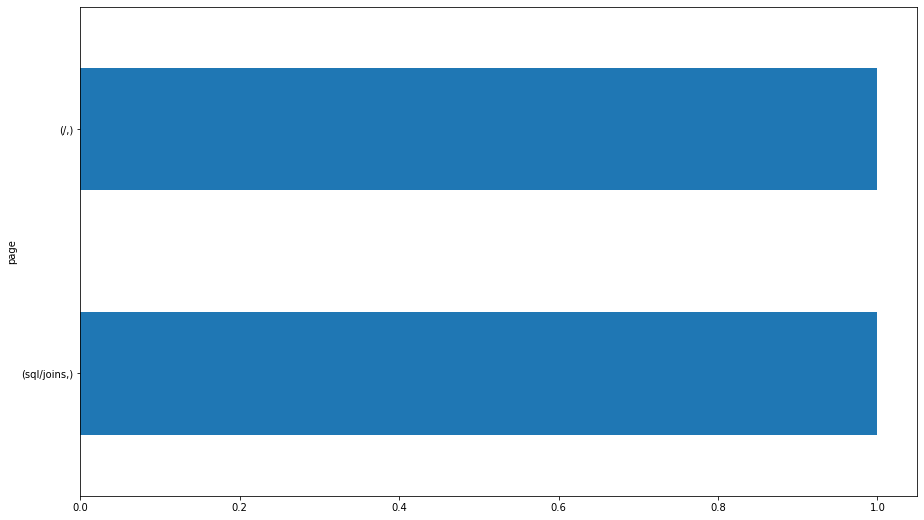


184.223.233.47
page         
sql/joins        1
sql/functions    1
dtype: int64


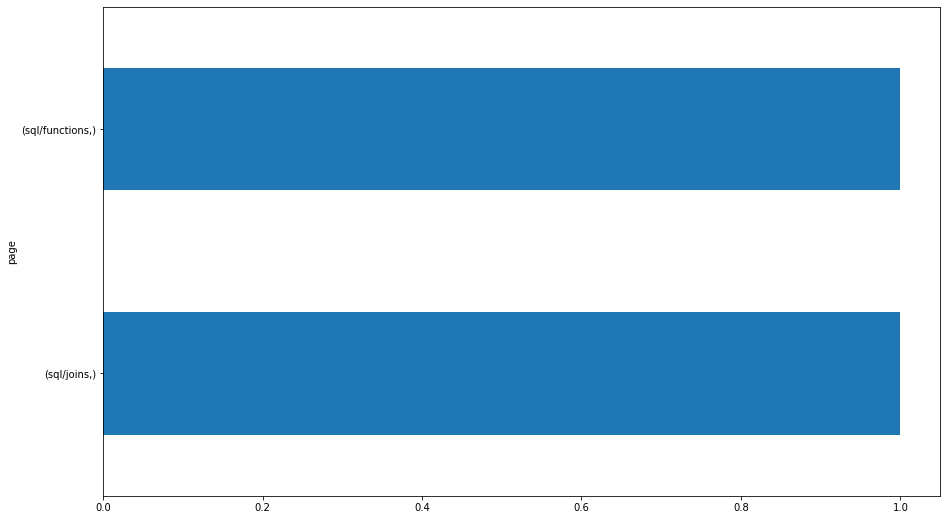


107.77.222.138
page              
sql/subqueries        1
sql/more-exercises    1
dtype: int64


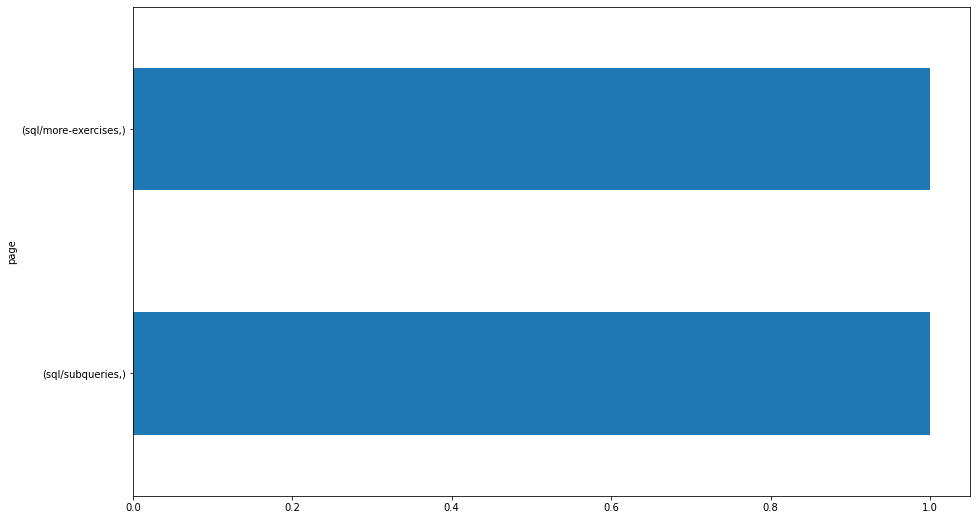


12.132.167.253
page          
sql/subqueries    1
dtype: int64


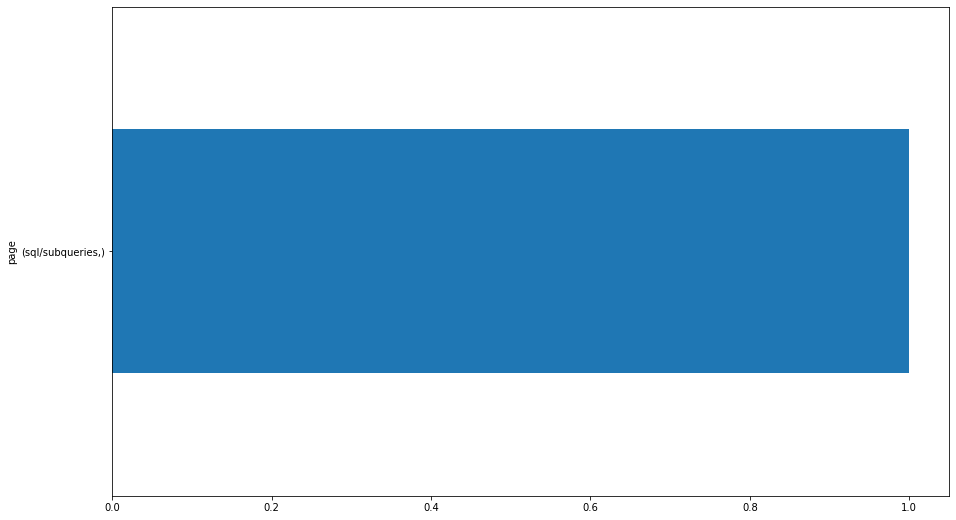


107.77.218.136
page
/       1
dtype: int64


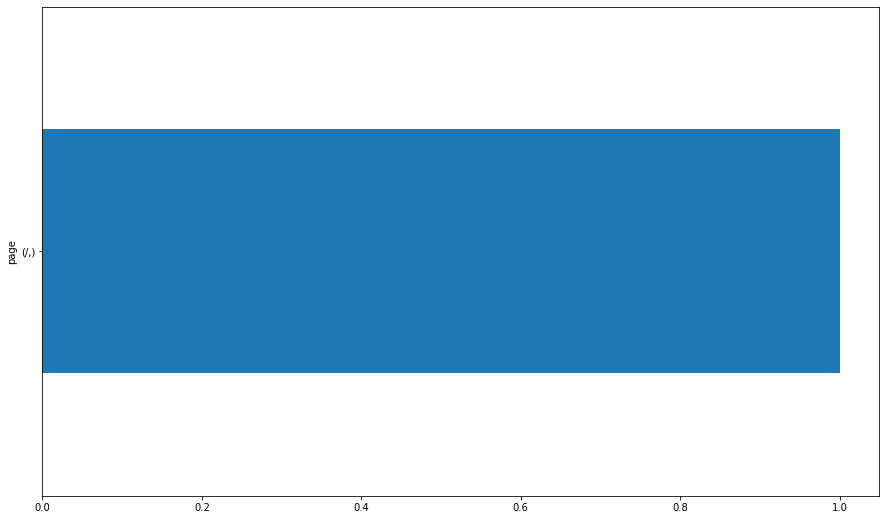


107.77.219.127
page
/       4
dtype: int64


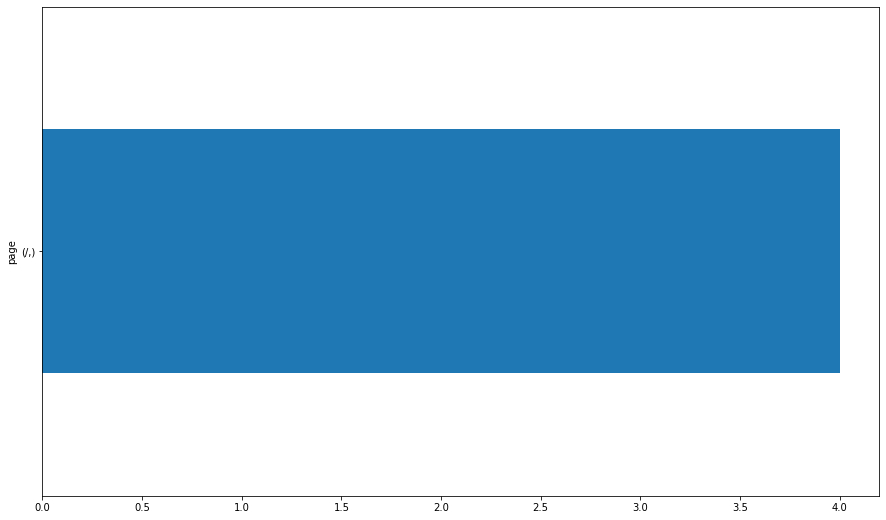


173.149.192.116
page          
sql/subqueries    1
/                 1
dtype: int64


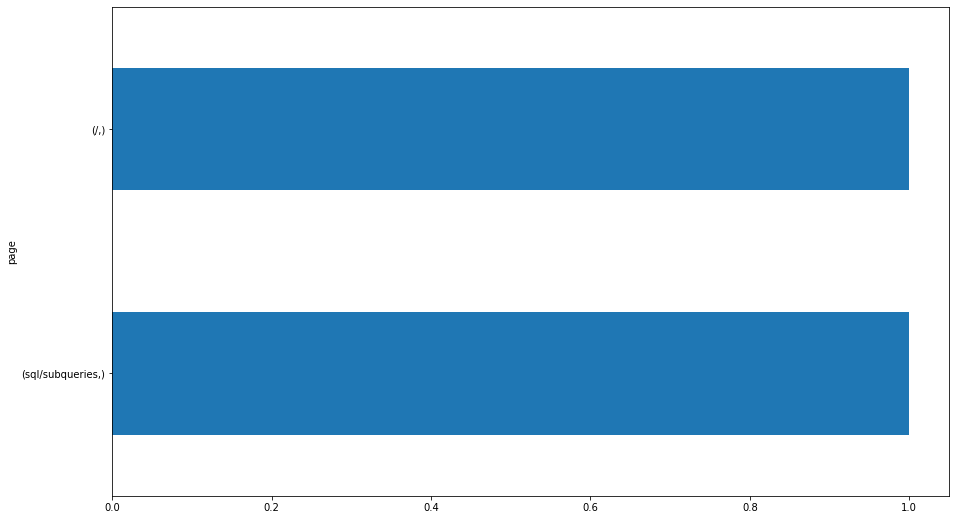


184.226.114.60
page          
sql/subqueries    1
dtype: int64


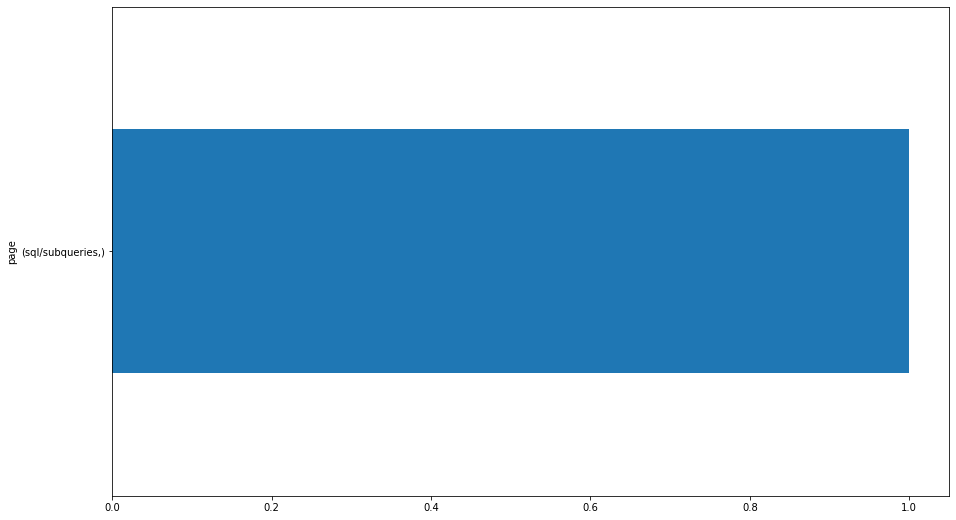


75.15.245.84
page                                           
python/data-types-and-variables                    11
/                                                   8
python/introduction-to-python                       7
sql/temporary-tables                                5
python/functions                                    5
python/control-structures                           5
sql/mysql-overview                                  4
python/overview                                     4
sql/case-statements                                 3
fundamentals/AI-ML-DL-timeline.jpg                  3
fundamentals/git                                    3
fundamentals/intro-to-data-science                  3
python/imports                                      3
python/intro-to-matplotlib                          3
fundamentals/modern-data-scientist.jpg              3
sql/more-exercises                                  2
sql/basic-statements                                2
python/intro-to-nump

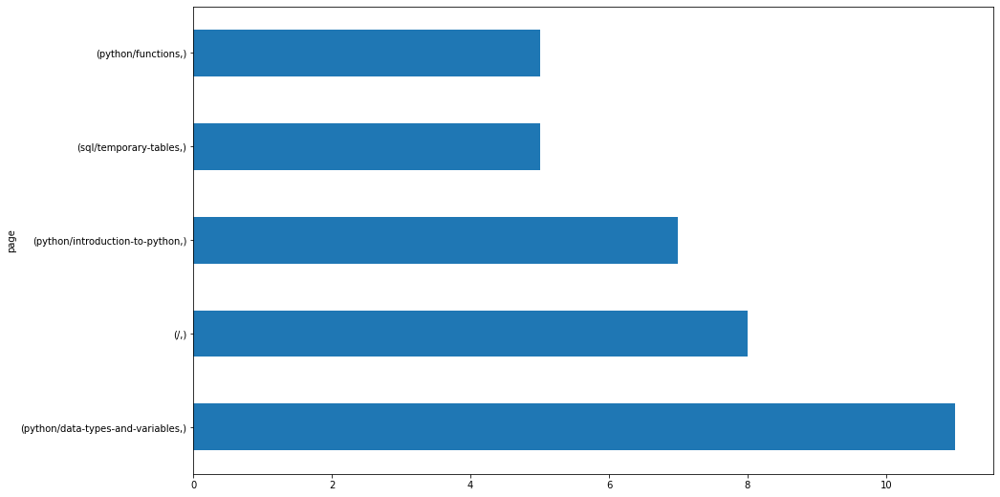


184.226.116.113
page                  
sql/case-statements       2
sql/mysql-introduction    1
sql/databases             1
/                         1
dtype: int64


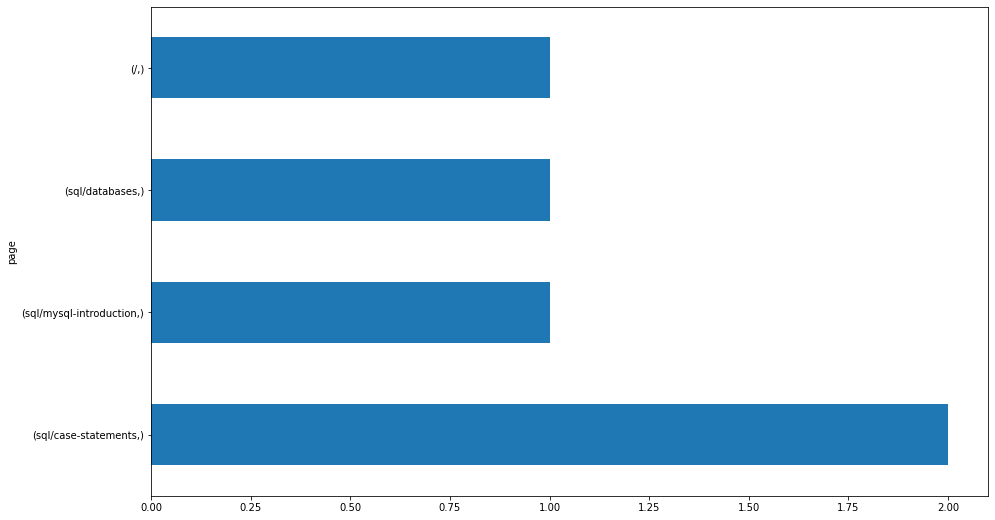


76.185.252.88
page                                                      
appendix/professional-development/mock-behavioral-question    1
/                                                             1
dtype: int64


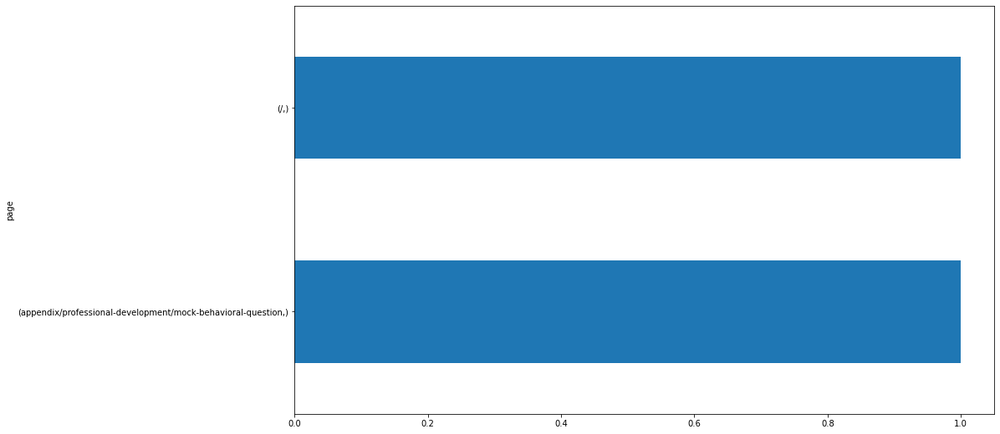


184.203.52.137
page                         
sql/tables                       3
sql/relationships-overview       3
sql/mysql-overview               3
sql/mysql-introduction           3
sql/basic-statements             3
sql/joins                        2
sql/databases                    2
sql/temporary-tables             1
sql/indexes                      1
sql/group-by                     1
sql/functions                    1
sql/case-statements              1
python/overview                  1
python/introduction-to-python    1
/                                1
dtype: int64


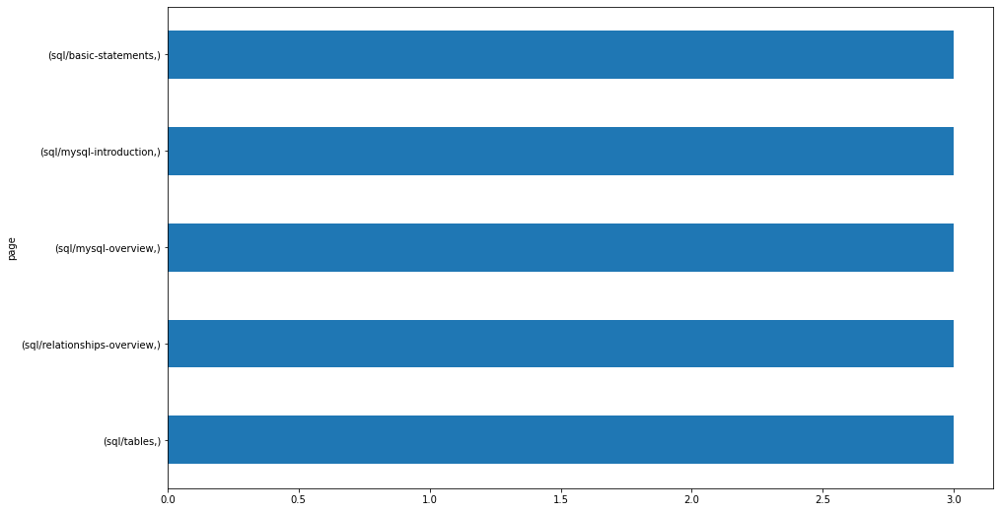


172.58.111.202
page                                  
sql/mysql-overview                        1
python/introduction-to-python             1
python/data-types-and-variables           1
fundamentals/modern-data-scientist.jpg    1
fundamentals/intro-to-data-science        1
fundamentals/AI-ML-DL-timeline.jpg        1
/                                         1
dtype: int64


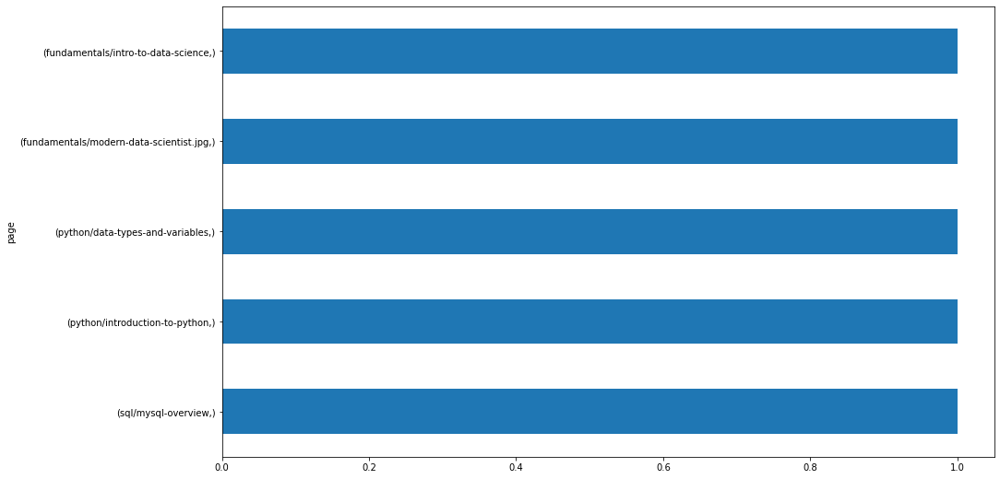


104.48.215.85
page                                           
fundamentals/AI-ML-DL-timeline.jpg                 5
fundamentals/modern-data-scientist.jpg             5
sql/mysql-overview                                 4
fundamentals/intro-to-data-science                 4
fundamentals/git                                   3
fundamentals/cli/moving-files                      2
fundamentals/cli/creating-files-and-directories    2
fundamentals/cli/file-paths                        2
fundamentals/cli/intro                             2
fundamentals/cli/listing-files                     2
fundamentals/cli/more-topics                       2
fundamentals/cli/navigating-the-filesystem         2
classification/overview                            1
fundamentals/cli/overview                          1
python/pandas-overview                             1
python/ds-libraries-overview                       1
python/functions                                   1
python/imports                      

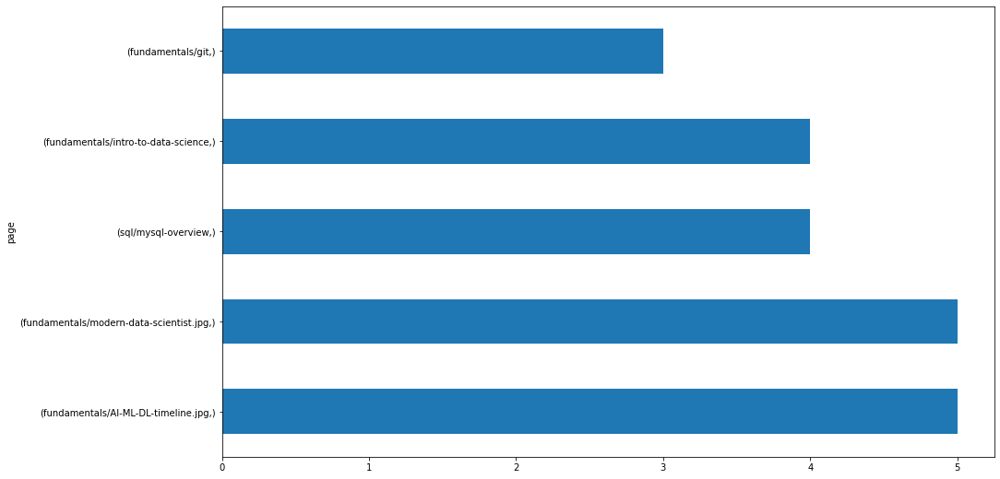


173.123.186.102
page                           
search/search_index.json           1
python/introduction-to-python      1
python/data-types-and-variables    1
/                                  1
dtype: int64


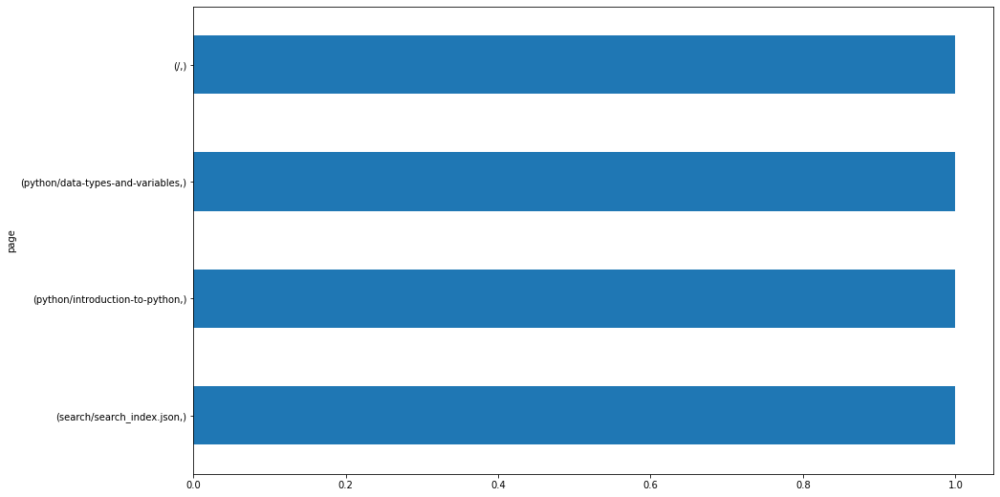


104.219.136.26
page                                       
/                                              12
python/control-structures                       5
sql/more-exercises                              3
regression/model                                3
clustering/model                                3
stats/probability-distributions                 2
fundamentals/spreadsheets-overview              2
stats/simulation                                2
python/data-types-and-variables                 2
python/advanced-dataframes                      1
classification/random-forests                   1
1-fundamentals/2.1-excel-overview               1
1-fundamentals/2.2-excel-functions              1
1-fundamentals/2.3-visualization-with-excel     1
classification/knn                              1
classification/logistic-regression              1
classification/prep                             1
clustering/Hospital-Distance-Clusters.jpg       1
fundamentals/visualization-with-excel   

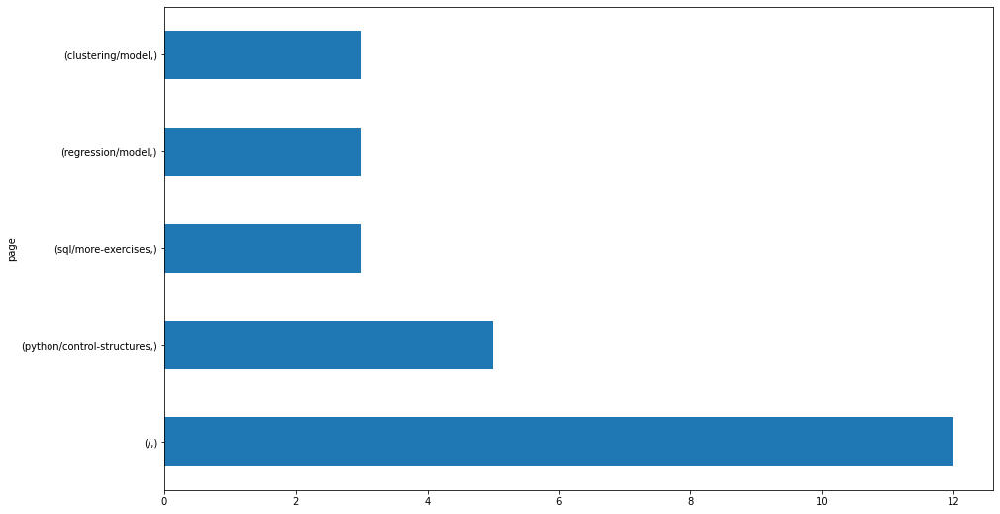


96.8.130.152
page                                       
/                                              30
stats/compare-means                            11
stats/hypothesis-testing-overview              10
classification/acquire                          8
stats/correlation                               8
classification/prep                             8
stats/probability-distributions                 7
classification/explore                          6
stats/simulation                                5
python/imports                                  5
python/control-structures                       5
stats/compare-group-membership                  5
search/search_index.json                        4
storytelling/create                             4
fundamentals/visualization-with-excel           4
python/intro-to-numpy                           4
classification/tidy-data                        4
python/functions                                3
classification/evaluation                 

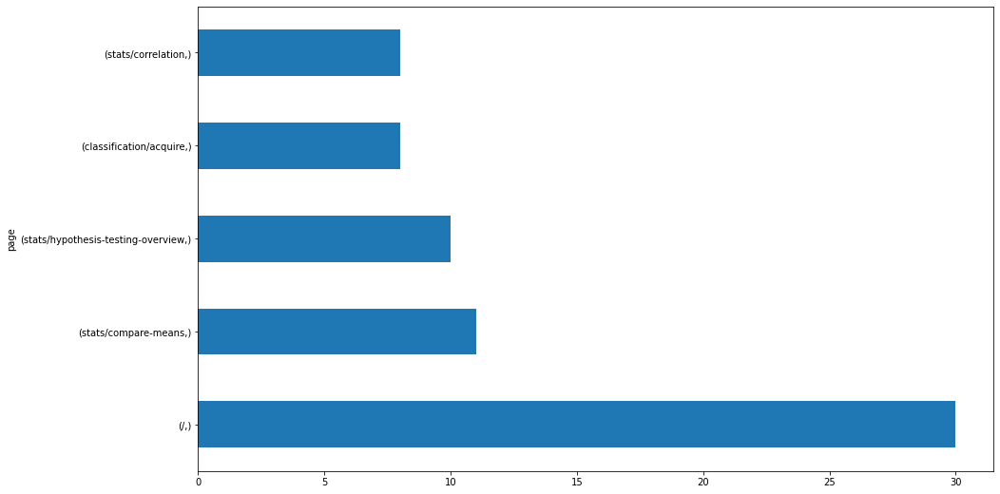


209.112.234.226
page                                             
stats/probability-distributions                      2
stats/simulation                                     1
6-regression/7-model                                 1
3-sql/database-design                                1
13-advanced-topics/2-cross-validation                1
10-anomaly-detection/AnomalyDetectionCartoon.jpeg    1
10-anomaly-detection/1-overview                      1
/                                                    1
dtype: int64


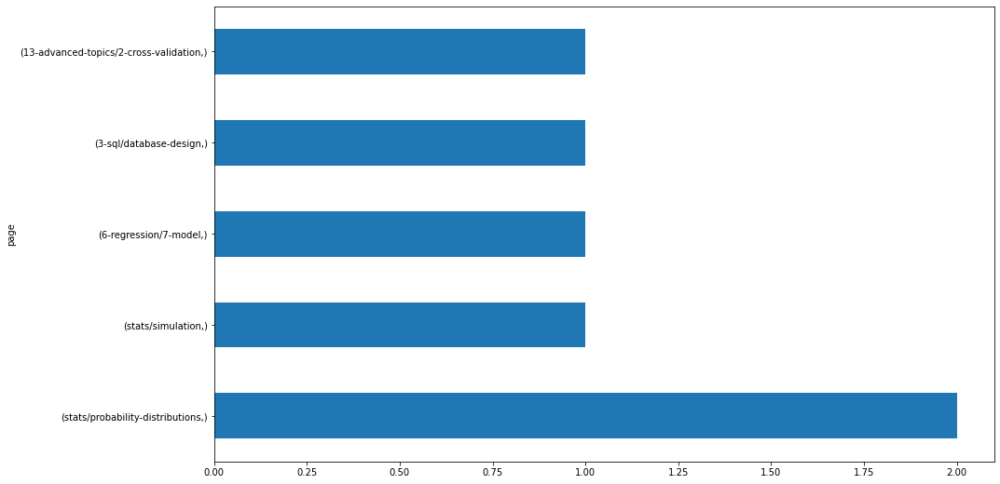


184.203.197.206
page            
python/functions    1
dtype: int64


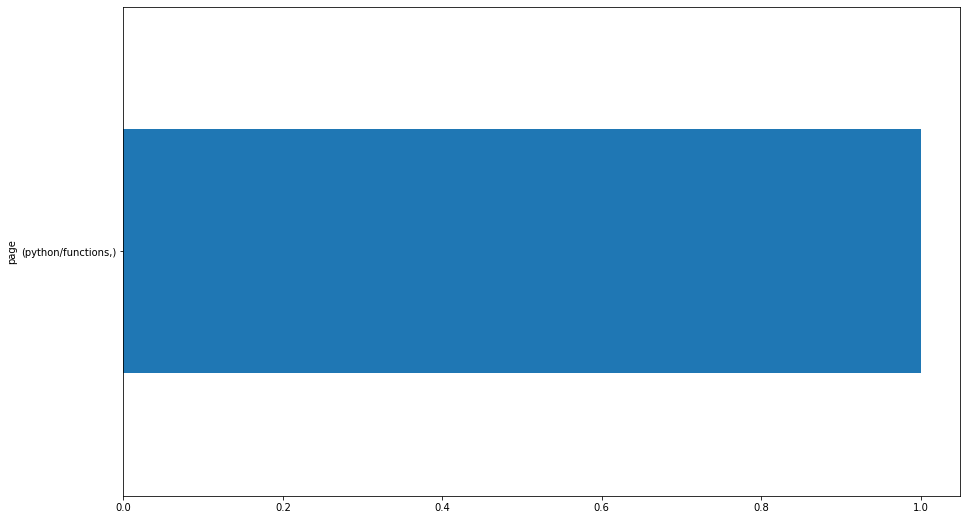


99.203.27.184
page                           
python/functions                   2
python/imports                     1
python/data-types-and-variables    1
python/control-structures          1
dtype: int64


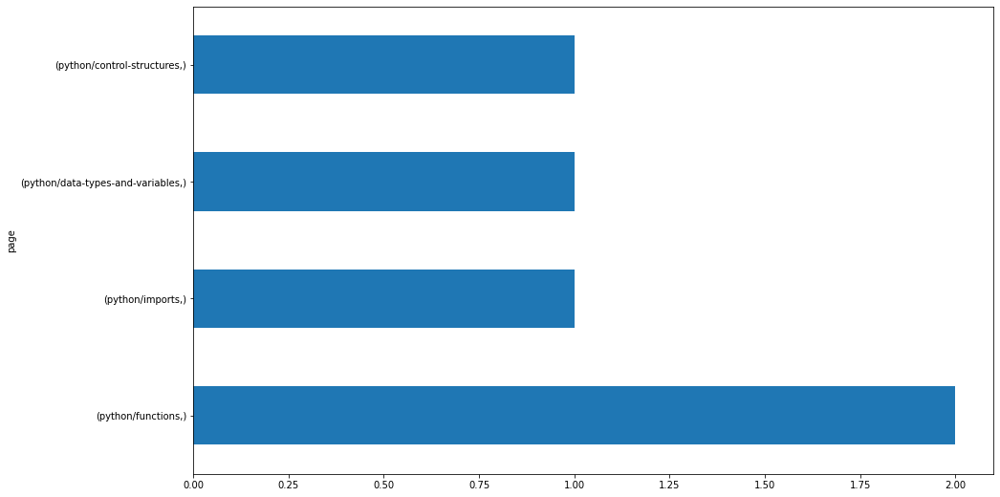


99.203.212.207
page                           
python/data-types-and-variables    3
python/overview                    1
python/introduction-to-python      1
/                                  1
dtype: int64


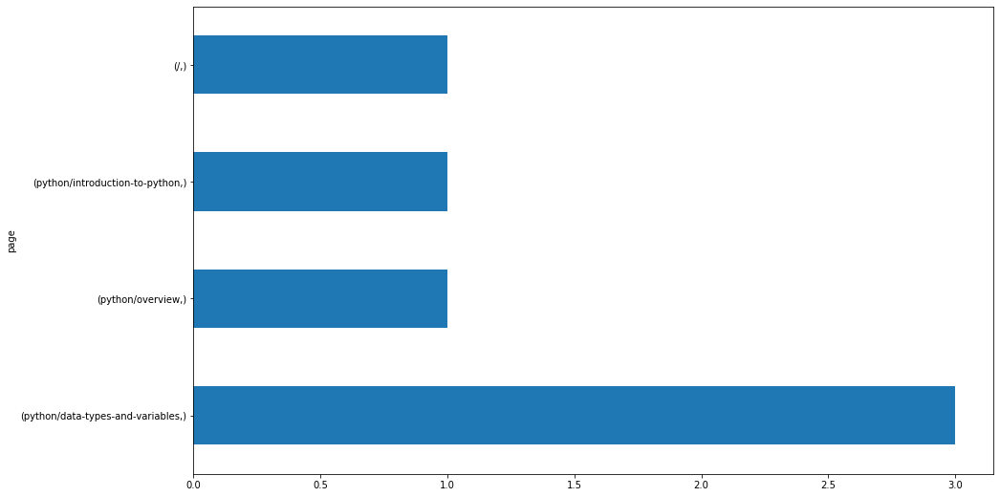


99.203.27.180
page                           
python/intro-to-matplotlib         1
python/ds-libraries-overview       1
python/data-types-and-variables    1
/                                  1
dtype: int64


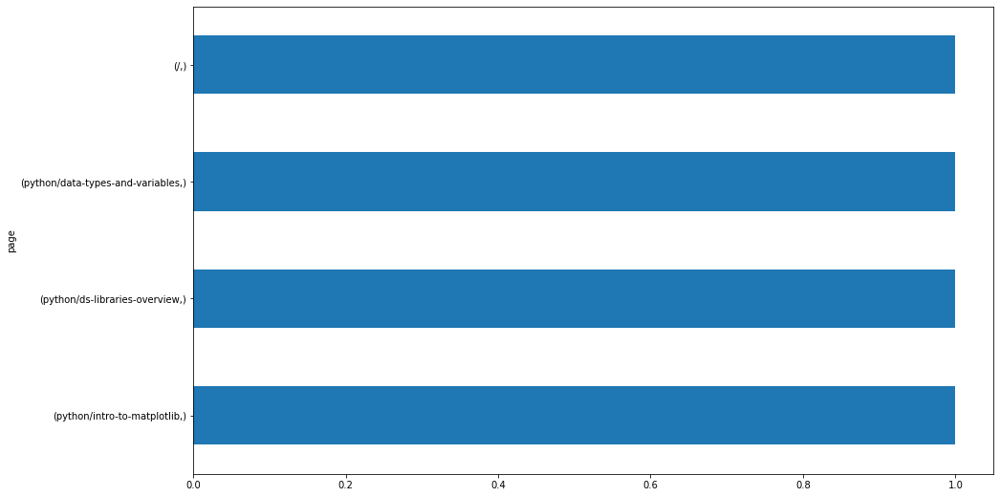


107.77.217.24
page
/       4
dtype: int64


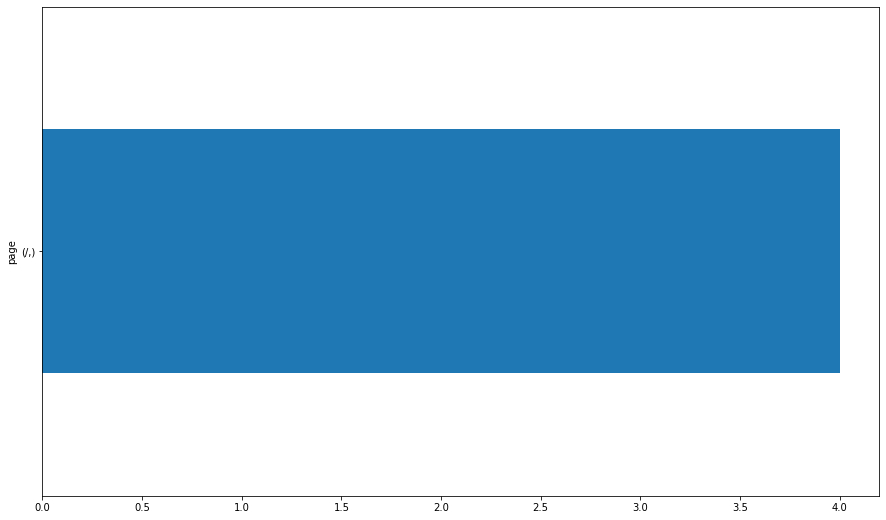


107.77.222.115
page                      
python/intro-to-matplotlib    2
/                             1
dtype: int64


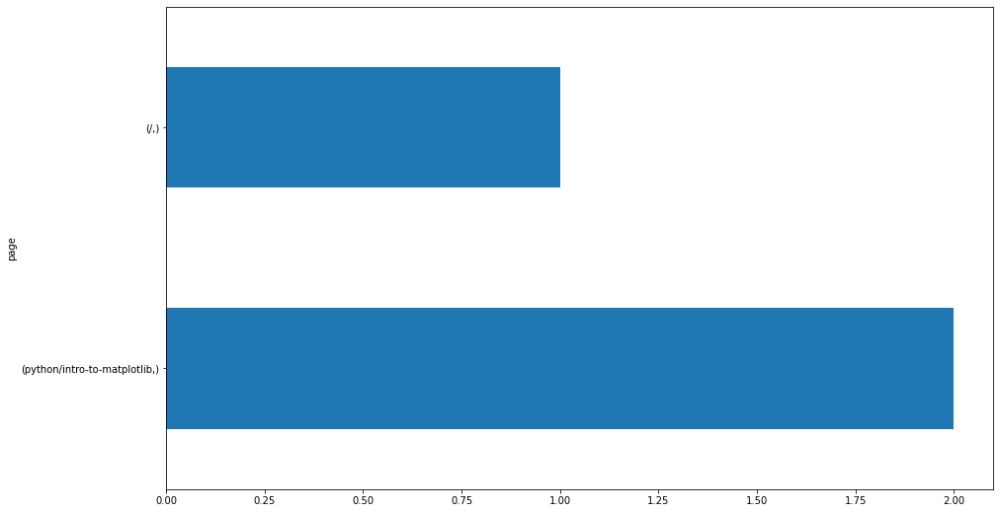


76.185.240.151
page                                               
/                                                      8
sql/temporary-tables                                   8
sql/mysql-overview                                     4
python/intro-to-matplotlib                             3
sql/case-statements                                    3
sql/database-design                                    3
sql/functions                                          3
search/search_index.json                               2
sql/basic-statements                                   2
sql/databases                                          2
sql/joins                                              2
timeseries/prep                                        2
sql/tables                                             2
timeseries/explore                                     2
sql/mysql-introduction                                 1
timeseries/acquire                                     1
13-advanced-topics/2

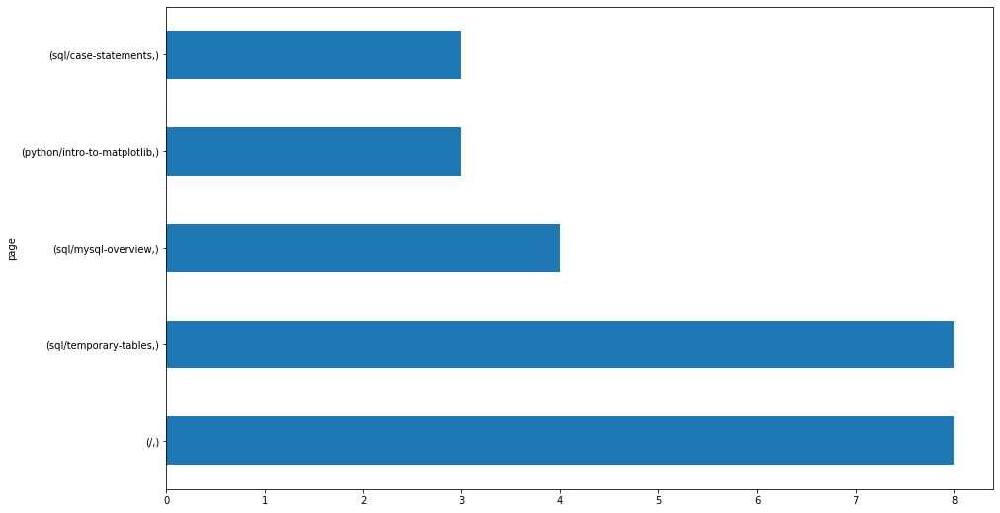


174.244.67.71
page                 
python/intro-to-numpy    1
/                        1
dtype: int64


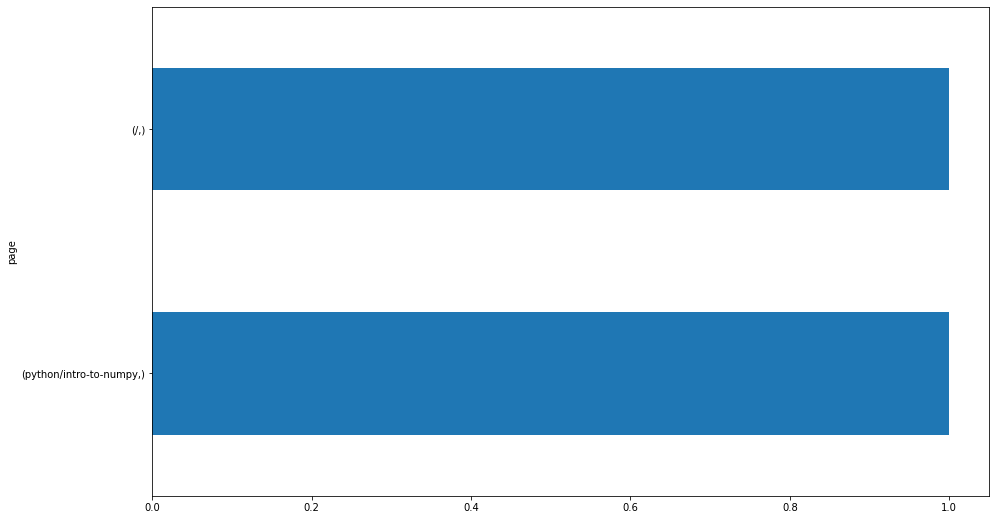


99.203.91.15
page                                         
python/series                                    2
python/pandas-overview                           2
/                                                2
python/dataframes                                1
distributed-ml/read-jdbc                         1
appendix/useful_libraries                        1
appendix/professional-development/email-setup    1
dtype: int64


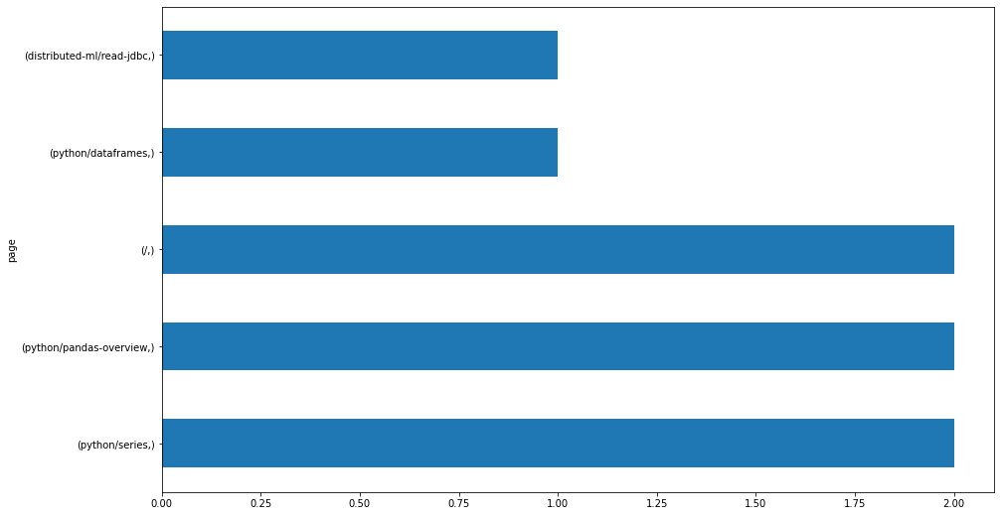


98.6.75.74
page                                     
1-fundamentals/2.1-excel-overview            4
classification/logistic-regression           4
fundamentals/functions                       4
classification/overview                      3
clustering/wrangle                           3
classification/explore                       3
classification/prep                          3
classification/decision-trees                3
clustering/model                             2
classification/acquire                       2
5-stats/3-probability-distributions          2
fundamentals/spreadsheets-overview           2
1-fundamentals/2.1-spreadsheets-overview     2
classification/evaluation                    2
4-python/8.3-intro-to-numpy                  1
4-python/8.4.2-series                        1
4-python/8.4.4-advanced-dataframes           1
5-stats/4.1-hypothesis-testing-overview      1
3-sql/10-temporary-tables                    1
4-python/8.4.1-pandas-overview               1
regres

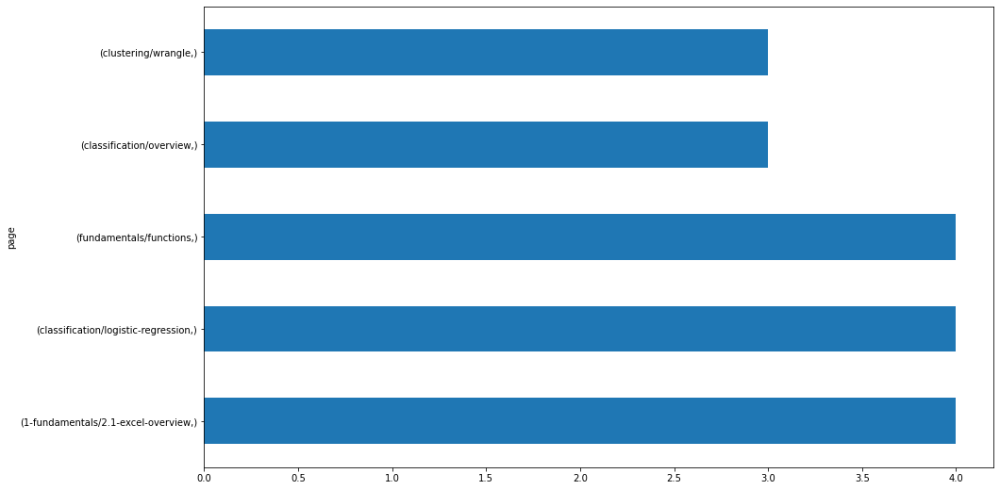


99.203.154.248
page                  
python/series             2
python/pandas-overview    1
python/intro-to-numpy     1
dtype: int64


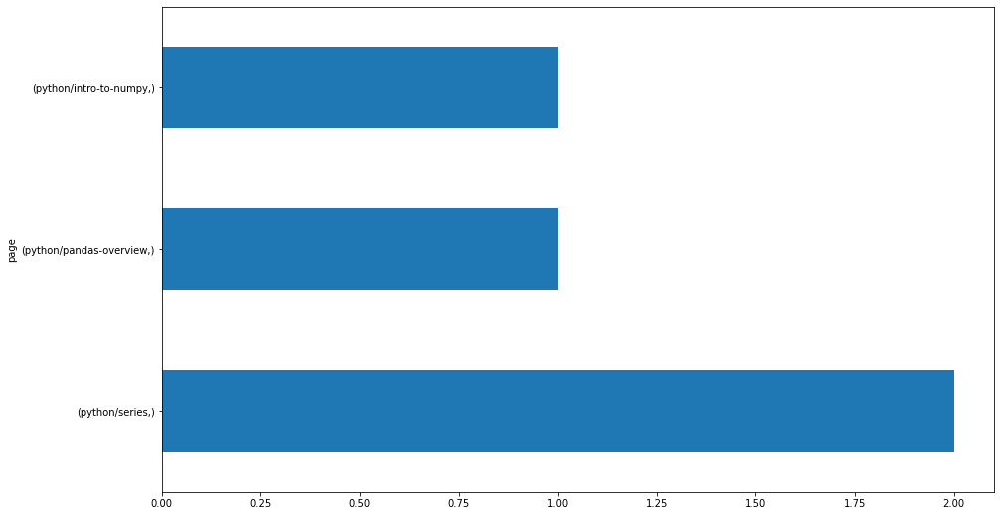


99.203.27.212
page                      
python/intro-to-matplotlib    1
dtype: int64


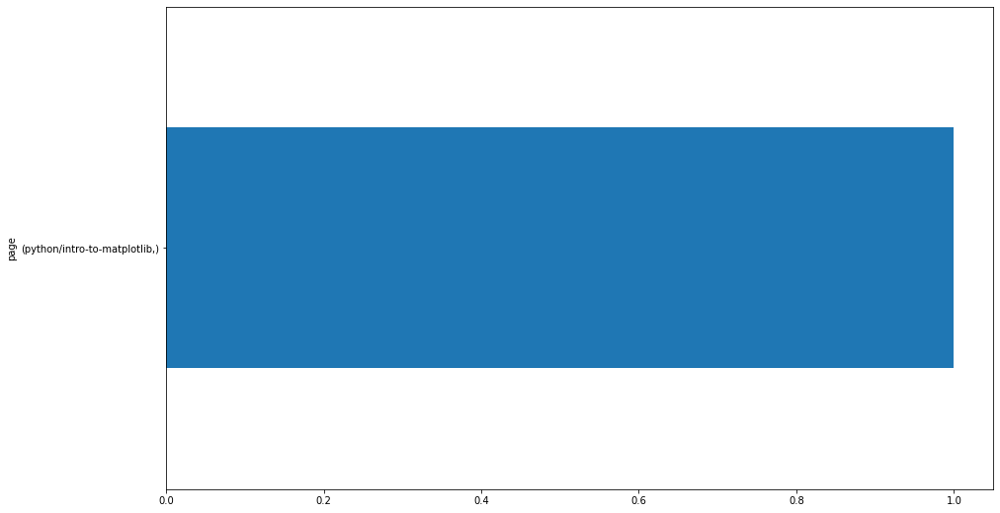


67.11.186.90
page                                       
/                                              30
fundamentals/visualization-with-excel          12
python/advanced-dataframes                     11
fundamentals/functions                          9
fundamentals/spreadsheets-overview              8
python/data-types-and-variables                 7
python/series                                   5
1-fundamentals/1.1-intro-to-data-science        4
1-fundamentals/2.4-more-excel-features          4
1-fundamentals/AI-ML-DL-timeline.jpg            4
1-fundamentals/modern-data-scientist.jpg        4
storytelling/understand                         4
python/dataframes                               4
python/intro-to-seaborn                         3
1-fundamentals/2.1-excel-overview               3
python/introduction-to-python                   3
storytelling/overview                           2
sql/more-exercises                              2
storytelling/create                       

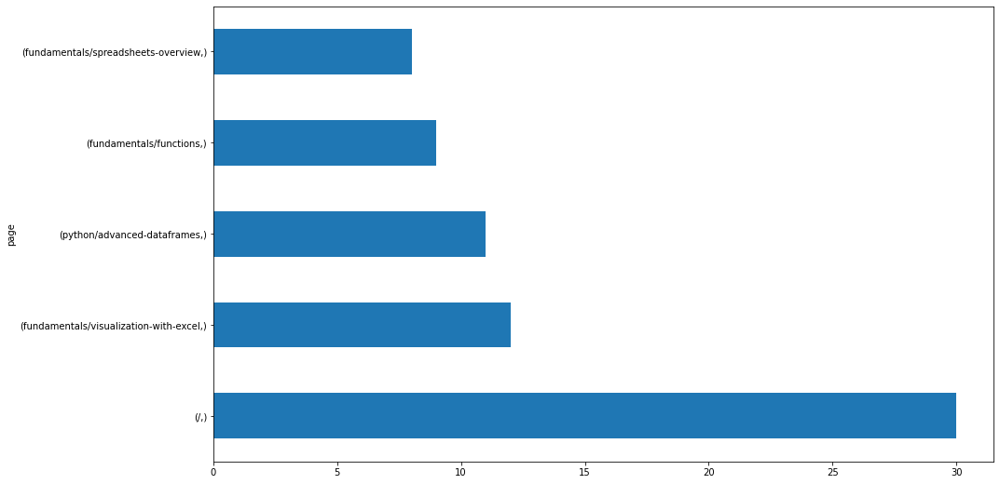


99.203.26.185
page             
python/dataframes    1
/                    1
dtype: int64


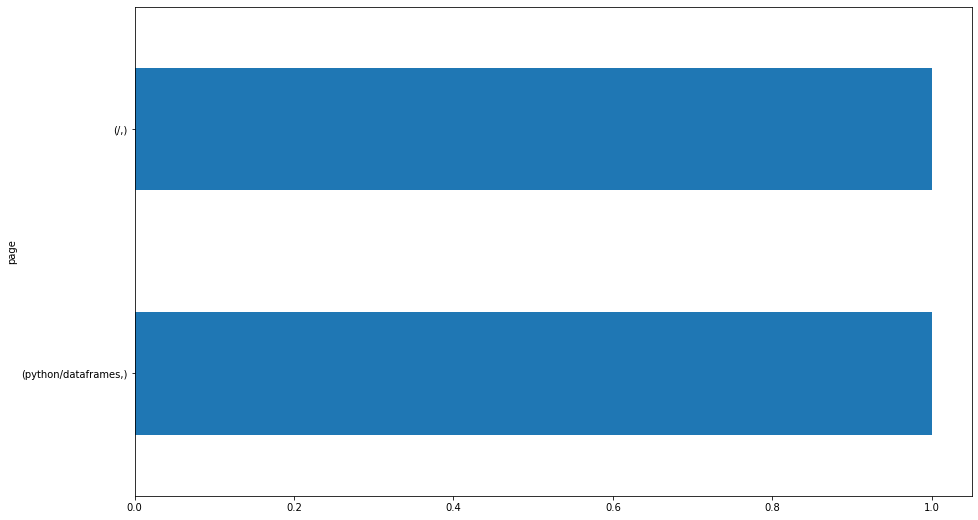


99.203.154.42
page             
python/dataframes    1
dtype: int64


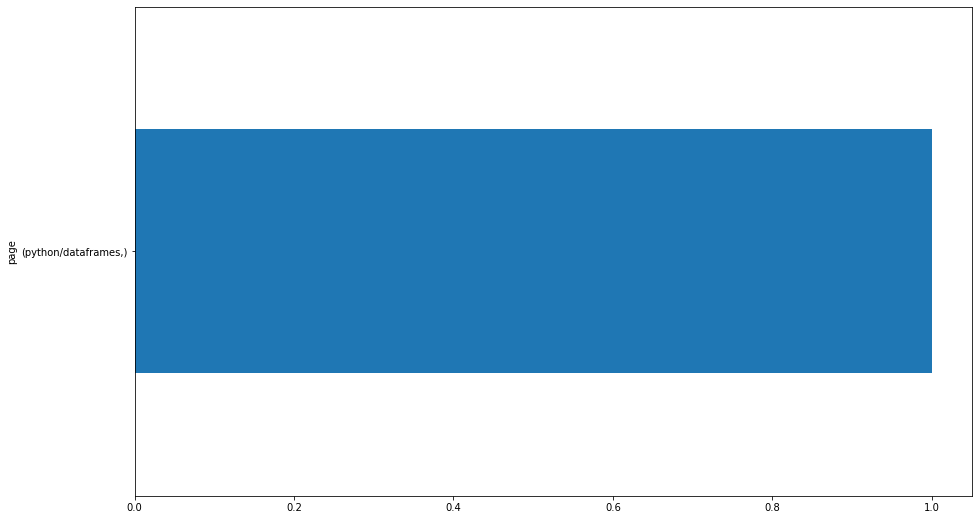


66.68.173.97
page                                                
/                                                       13
search/search_index.json                                12
regression/split-and-scale                               6
timeseries/modeling-lesson1                              6
clustering/model                                         5
stats/compare-means                                      5
stats/correlation                                        4
regression/evaluate                                      4
regression/explore                                       4
timeseries/explore                                       4
timeseries/prep                                          4
stats/compare-group-membership                           3
timeseries/modeling-lesson2                              3
clustering/Hospital-Distance-Clusters.jpg                3
clustering/about                                         3
regression/model                                

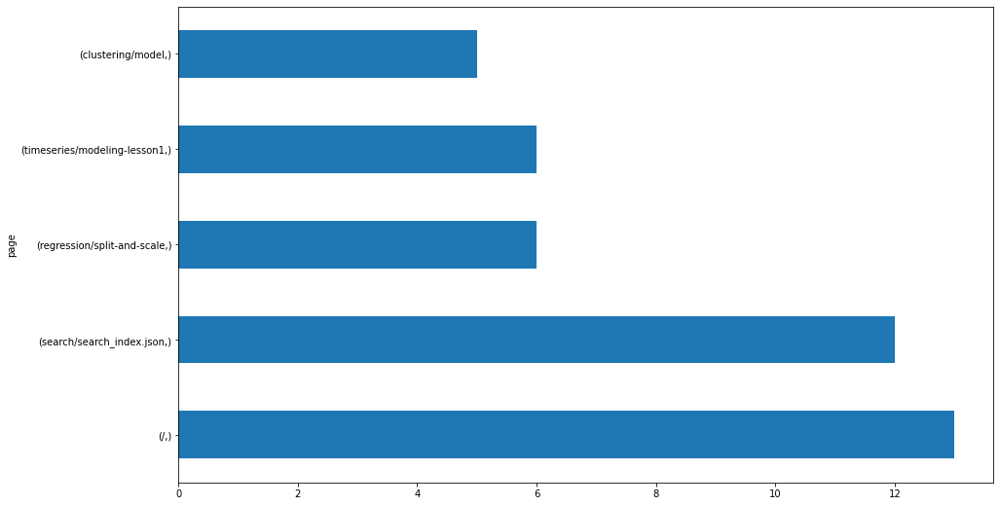


173.173.244.231
page                      
python/intro-to-seaborn       1
python/advanced-dataframes    1
dtype: int64


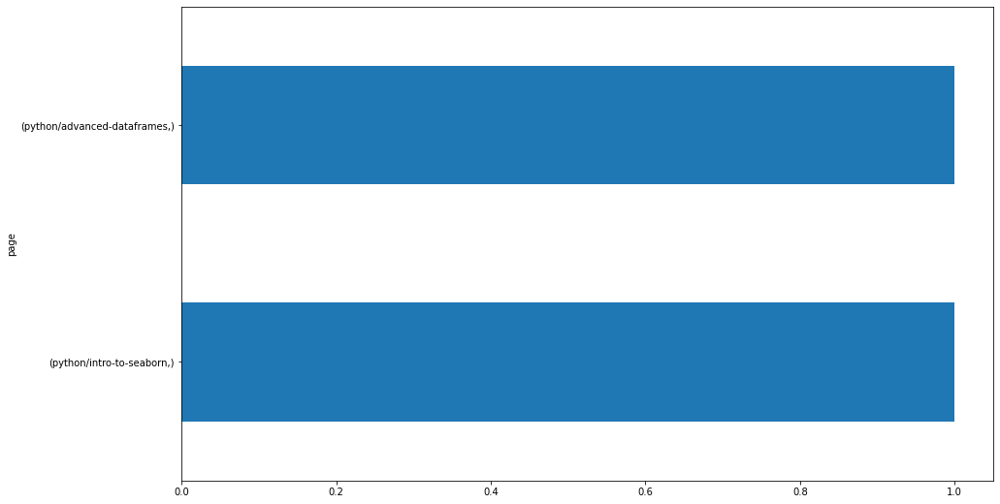


192.198.252.227
page                      
python/advanced-dataframes    2
/                             2
dtype: int64


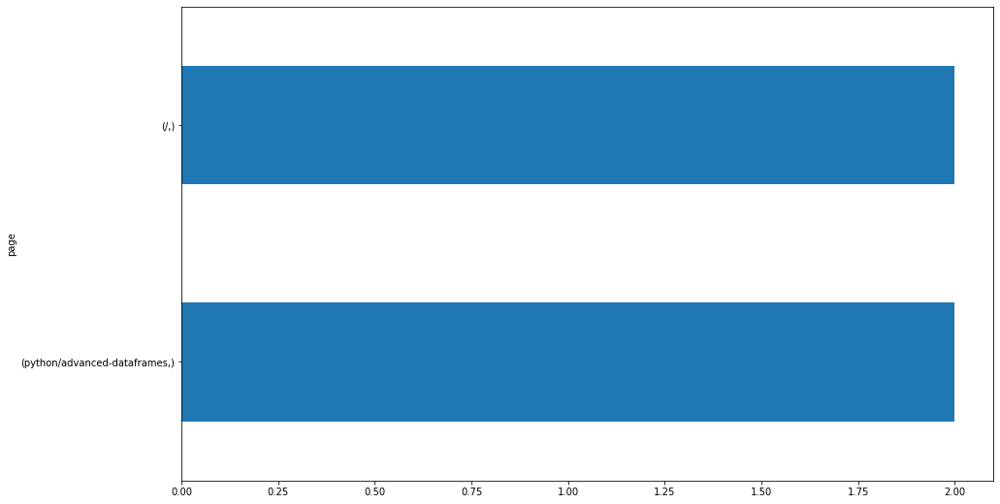


172.58.110.206
page                        
python/dataframes               3
python/advanced-dataframes      3
python/ds-libraries-overview    1
dtype: int64


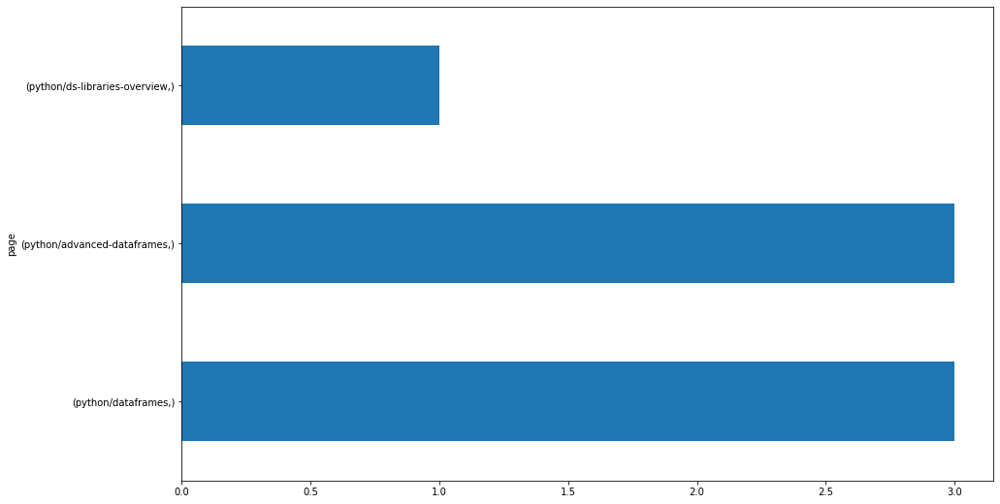


107.77.222.216
page
/       1
dtype: int64


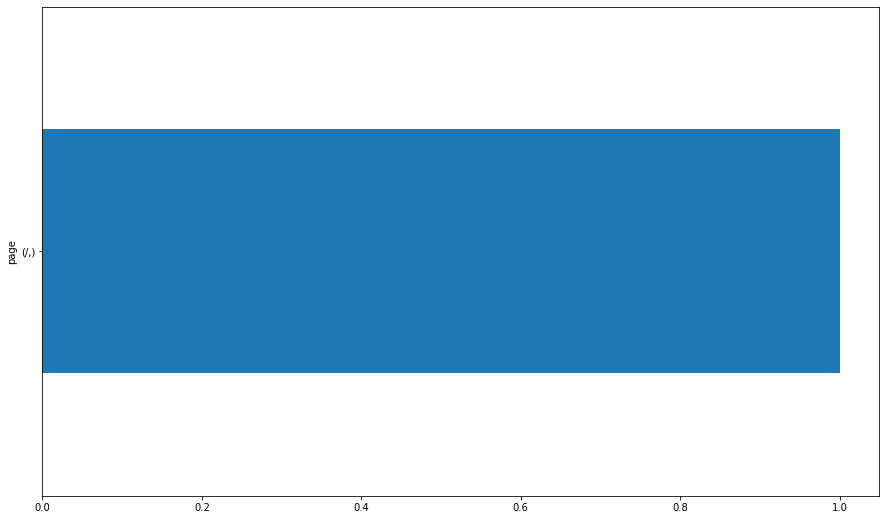


107.77.222.18
page                   
python/intro-to-seaborn    1
/                          1
dtype: int64


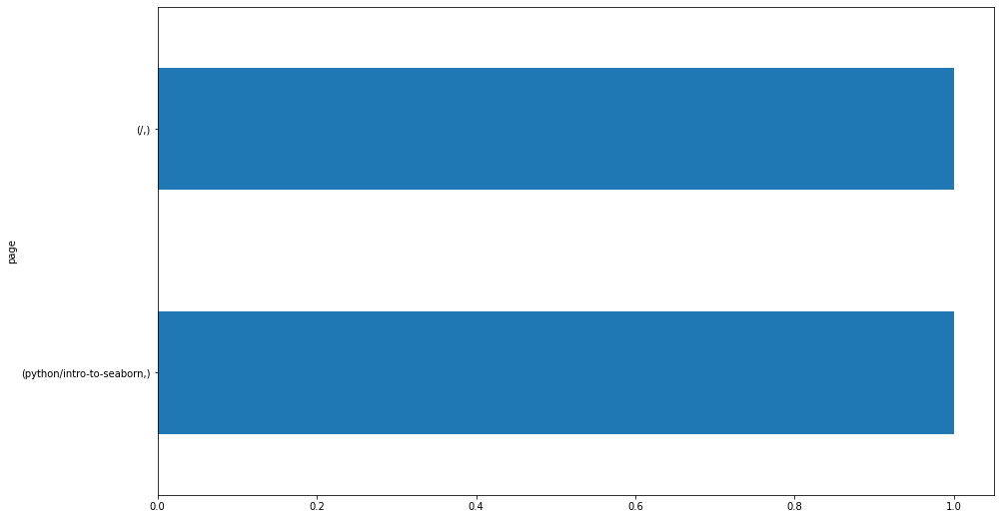


99.203.27.38
page                           
python/intro-to-numpy              2
python/introduction-to-python      1
python/intro-to-seaborn            1
python/intro-to-matplotlib         1
python/imports                     1
python/data-types-and-variables    1
dtype: int64


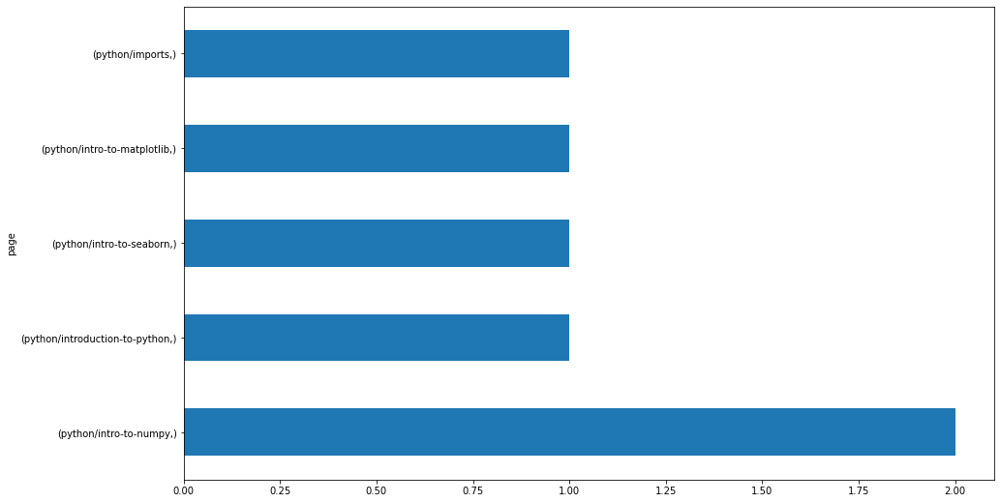


99.203.26.71
page                              
fundamentals/spreadsheets-overview    1
dtype: int64


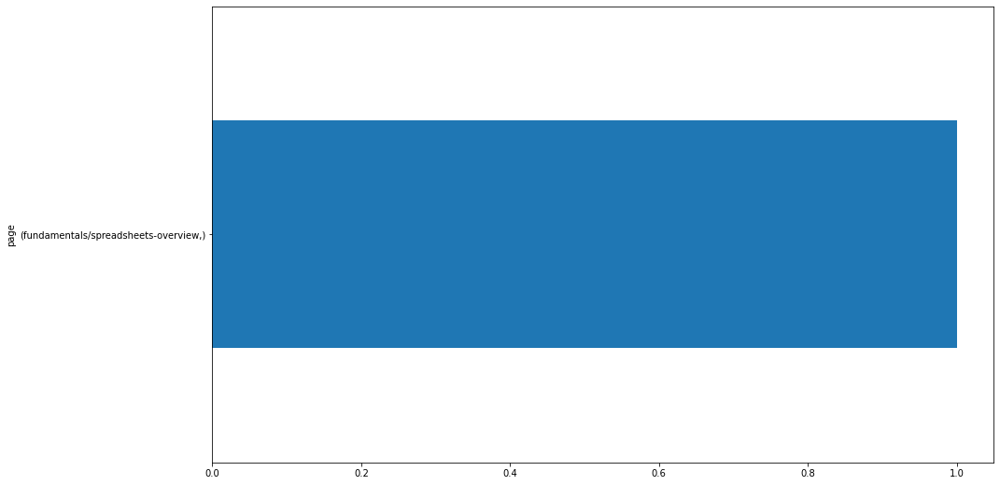


99.203.26.85
page                                       
1-fundamentals/2.4-more-excel-features         1
1-fundamentals/2.3-visualization-with-excel    1
1-fundamentals/2.2-excel-functions             1
dtype: int64


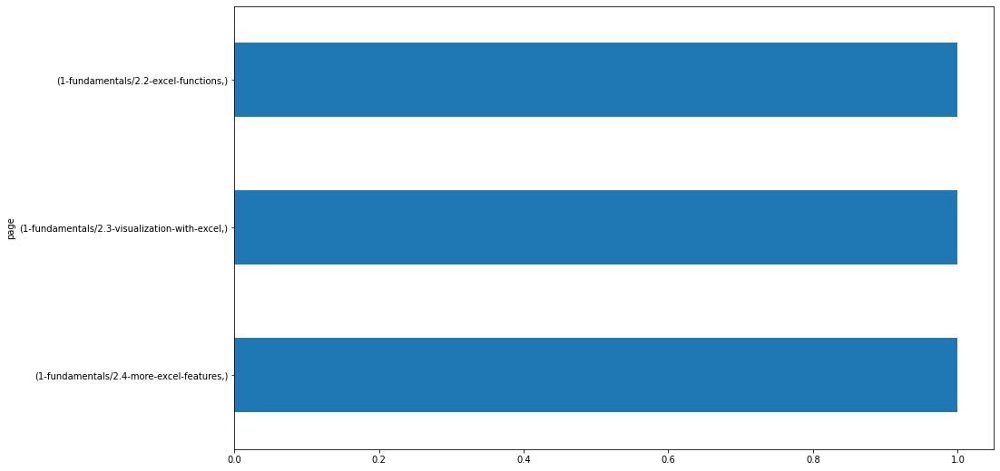


70.114.115.136
page                                 
fundamentals/visualization-with-excel    1
fundamentals/functions                   1
dtype: int64


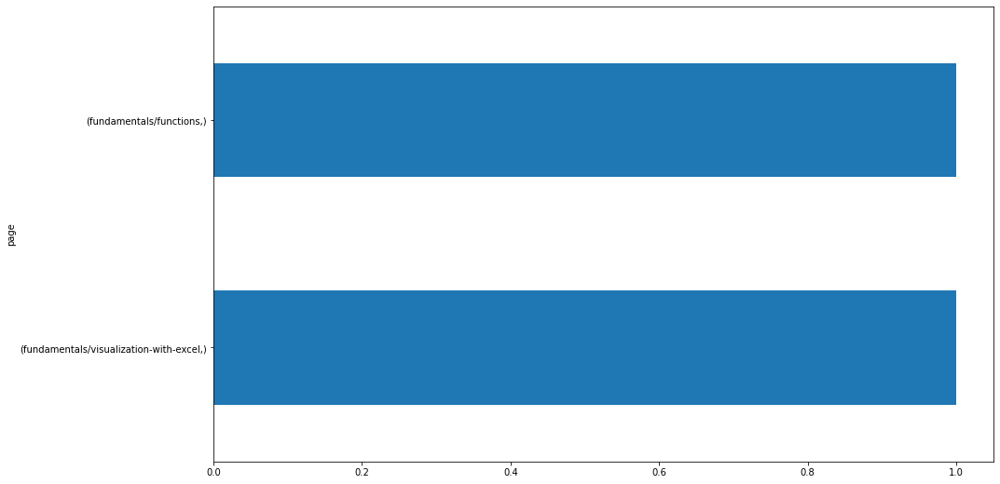


99.203.27.229
page                                       
sql/mysql-overview                             2
python/intro-to-seaborn                        2
1-fundamentals/2.3-visualization-with-excel    2
python/intro-to-matplotlib                     1
fundamentals/modern-data-scientist.jpg         1
fundamentals/intro-to-data-science             1
fundamentals/AI-ML-DL-timeline.jpg             1
1-fundamentals/2.2-functions                   1
dtype: int64


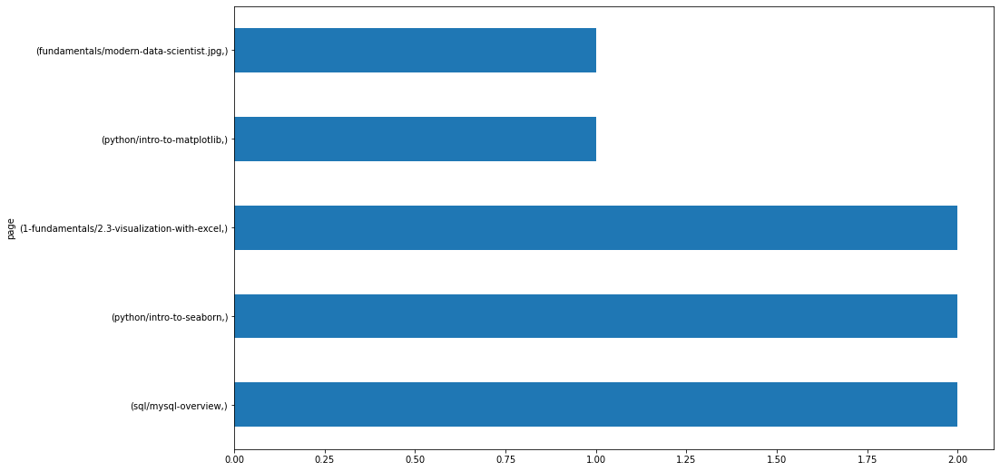


72.191.141.122
page                                 
2-storytelling/2.1-understand            2
2-storytelling/1-overview                2
1-fundamentals/2.2-excel-functions       2
1-fundamentals/2.1-excel-overview        2
storytelling/understand                  1
storytelling/refine                      1
storytelling/present                     1
storytelling/misleading3_deaths.jpg      1
storytelling/misleading1_fox.jpg         1
storytelling/misleading1_baseball.jpg    1
storytelling/create                      1
storytelling/bad-charts                  1
/                                        1
dtype: int64


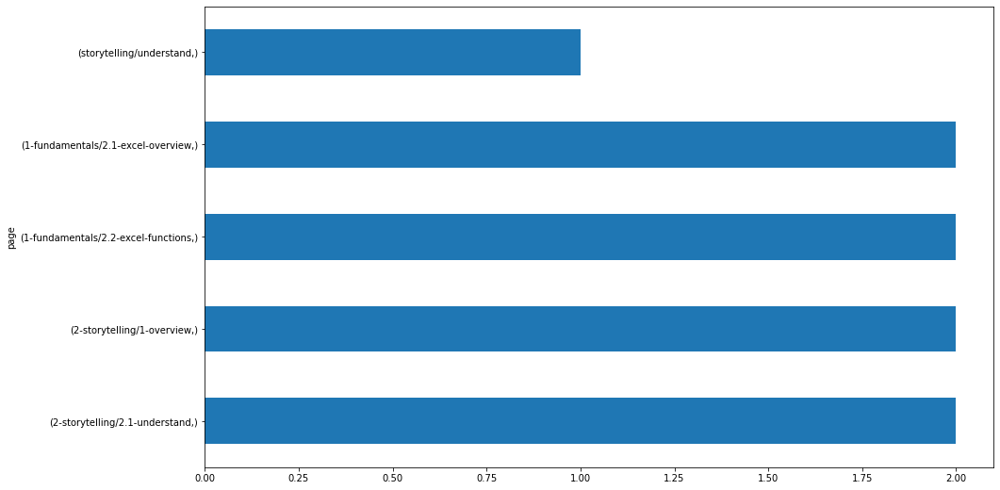


172.58.99.212
page                                  
storytelling/misleading3_deaths.jpg       5
storytelling/misleading1_fox.jpg          5
storytelling/misleading1_baseball.jpg     5
storytelling/bad-charts                   5
storytelling/overview                     4
storytelling/understand                   3
storytelling/present                      3
storytelling/refine                       2
sql/mysql-overview                        2
storytelling/create                       1
sql/more-exercises                        1
fundamentals/modern-data-scientist.jpg    1
fundamentals/intro-to-data-science        1
fundamentals/AI-ML-DL-timeline.jpg        1
/                                         1
dtype: int64


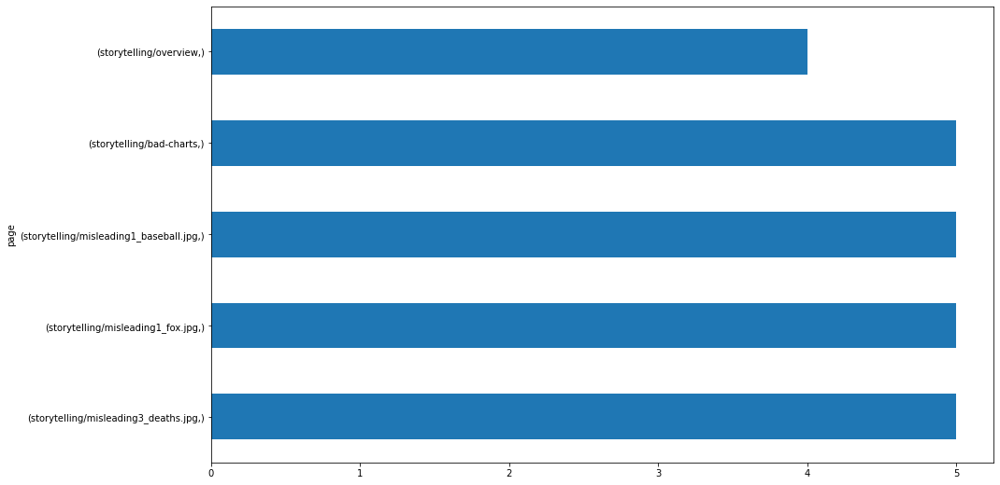


107.77.218.155
page                                 
storytelling/create                      2
storytelling/understand                  1
storytelling/refine                      1
storytelling/present                     1
storytelling/misleading3_deaths.jpg      1
storytelling/misleading1_fox.jpg         1
storytelling/misleading1_baseball.jpg    1
storytelling/bad-charts                  1
dtype: int64


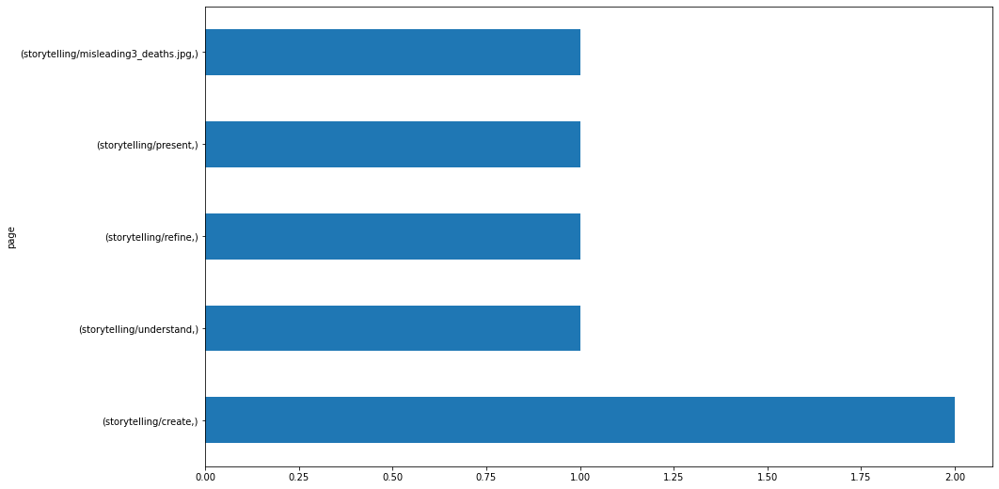


67.11.56.54
page                                          
/                                                 20
stats/probability-distributions                   16
stats/compare-means                               14
stats/hypothesis-testing-overview                 14
stats/correlation                                  9
stats/simulation                                   9
stats/compare-group-membership                     7
storytelling/understand                            5
classification/overview                            5
storytelling/create                                5
stats/Selecting_a_hypothesis_test.svg              5
stats/more-statistical-testing-examples            5
stats/overview                                     4
overview                                           4
simulation                                         3
1-fundamentals/1.1-intro-to-data-science           3
1-fundamentals/AI-ML-DL-timeline.jpg               3
1-fundamentals/modern-data-scientist.jp

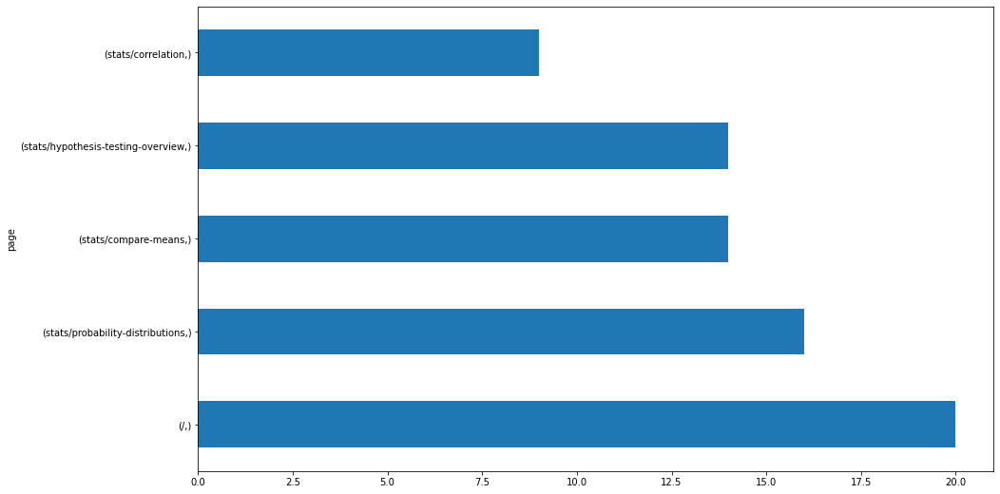


99.203.27.176
page                   
storytelling/create        2
storytelling/understand    1
/                          1
dtype: int64


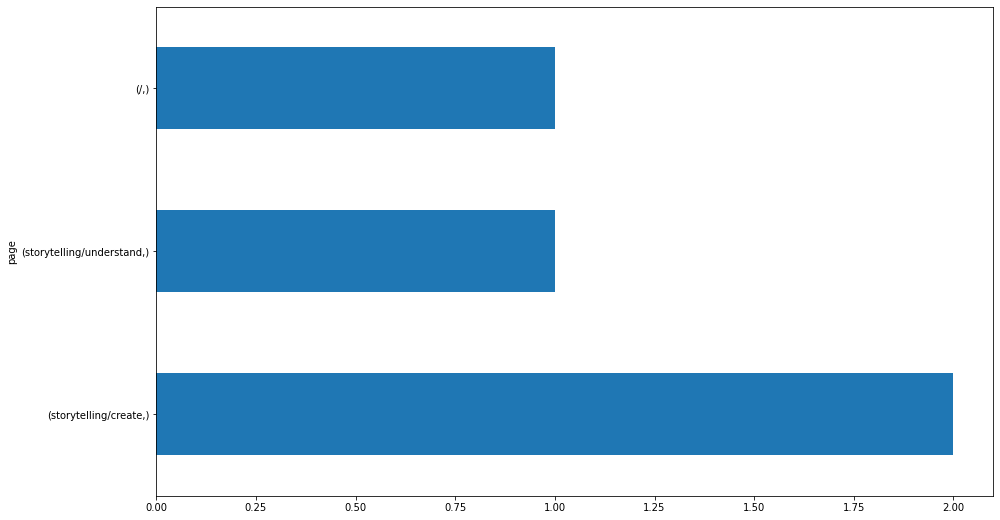


99.203.155.226
page                   
python/intro-to-seaborn    1
dtype: int64


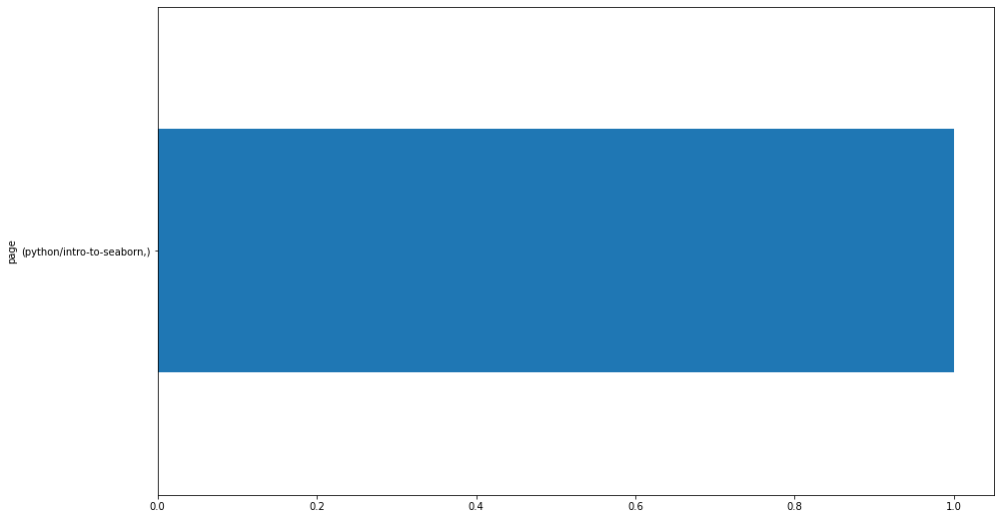


99.203.212.61
page                   
storytelling/understand    1
/                          1
dtype: int64


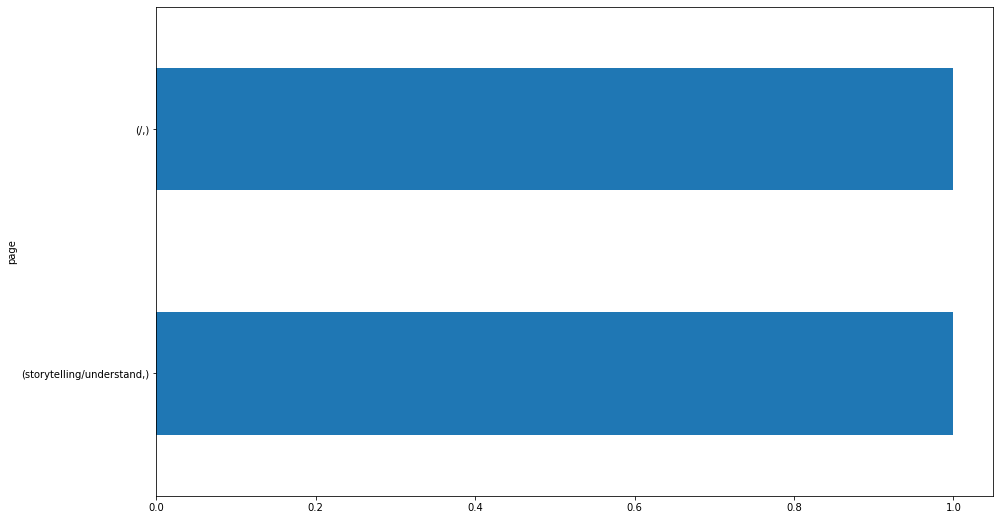


99.203.27.151
page                           
storytelling/tableau               1
storytelling/connecting-to-data    1
dtype: int64


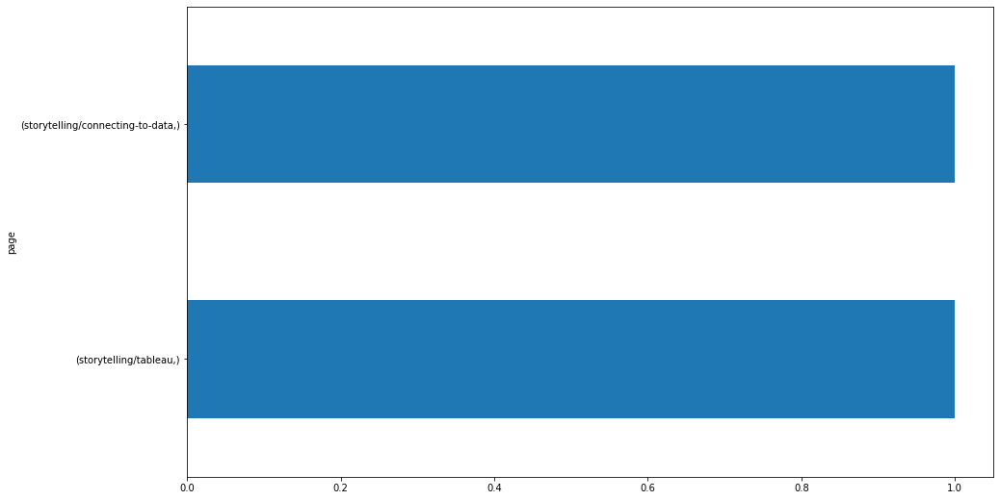


99.203.26.235
page                        
storytelling/creating-charts    1
storytelling/create             1
dtype: int64


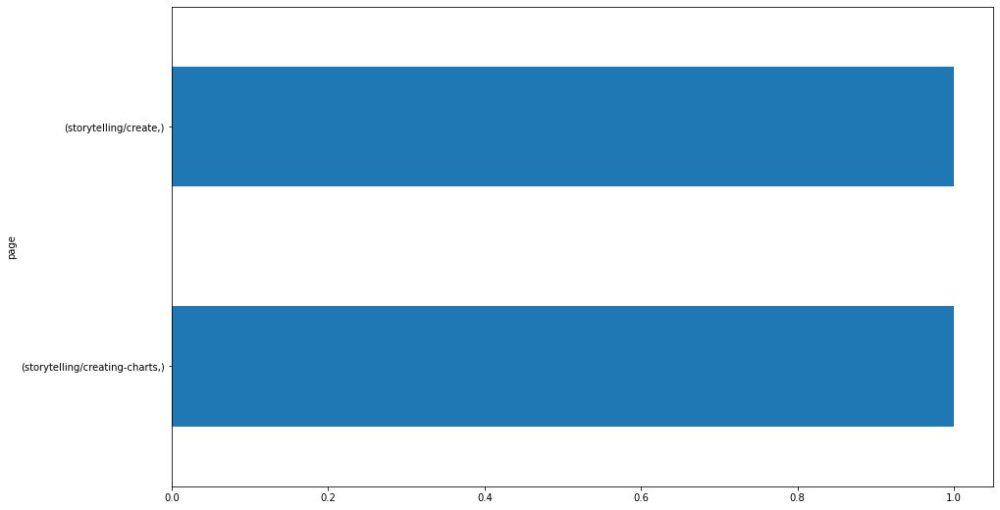


71.158.155.73
page                                  
/                                         9
distributed-ml/spark-api                  8
fundamentals/environment-setup            3
appendix/ds-environment-setup             3
sql/mysql-overview                        1
sql/mysql-introduction                    1
search/search_index.json                  1
fundamentals/modern-data-scientist.jpg    1
fundamentals/intro-to-data-science        1
fundamentals/git                          1
fundamentals/data-science-pipeline        1
fundamentals/DataToAction_v2.jpg          1
fundamentals/AI-ML-DL-timeline.jpg        1
distributed-ml/wrangle                    1
distributed-ml/environment-setup          1
dtype: int64


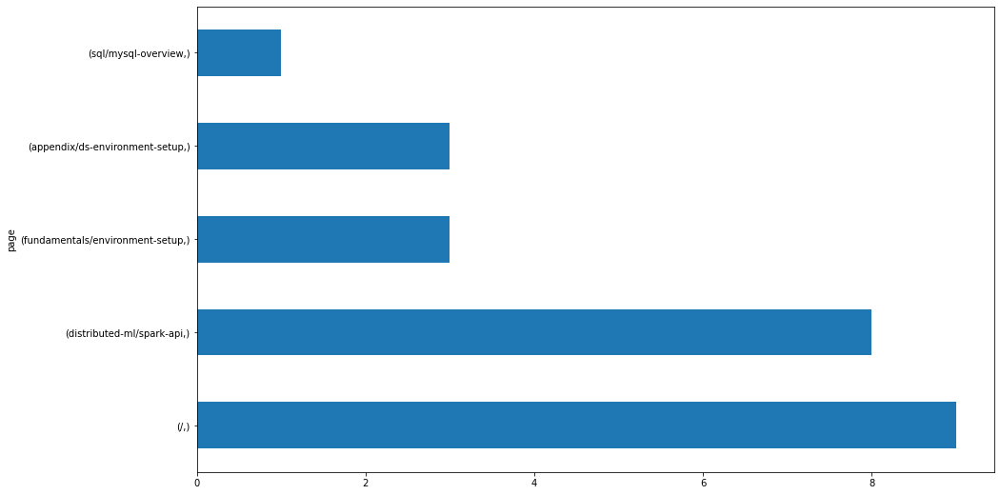


67.11.220.40
page                                               
search/search_index.json                               2
nlp/overview                                           1
nlp/model                                              1
appendix/professional-development/offer-letters        1
appendix/professional-development/cover-letter-copy    1
/                                                      1
dtype: int64


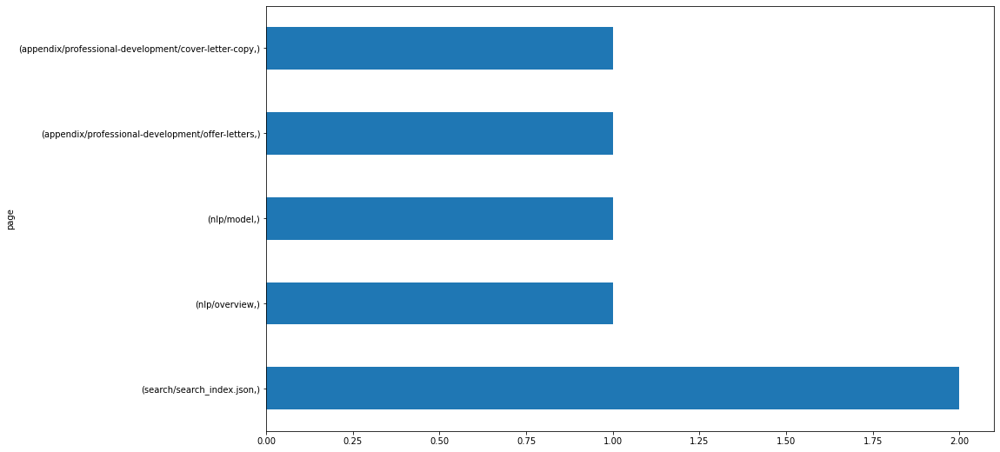


99.203.26.61
page          
stats/overview    1
dtype: int64


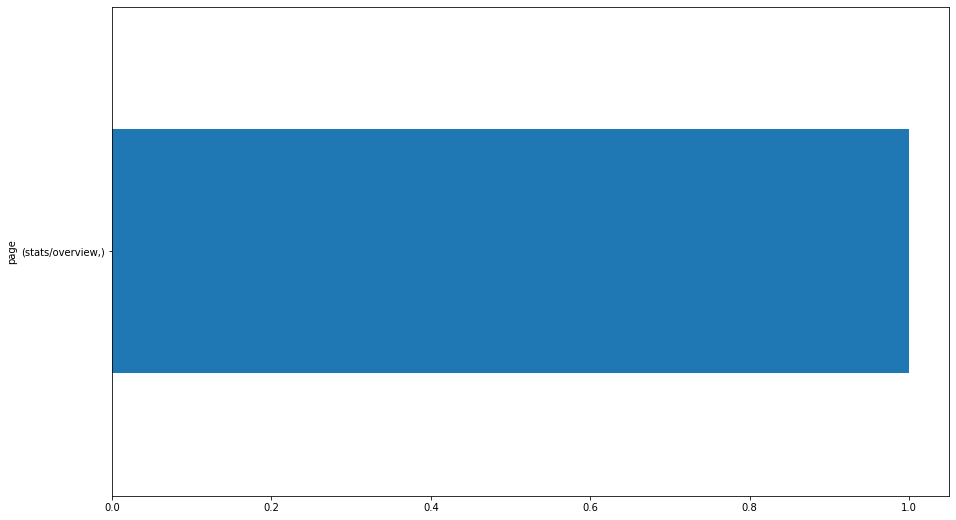


99.203.26.103
page                             
stats/simulation                     1
stats/hypothesis-testing-overview    1
/                                    1
dtype: int64


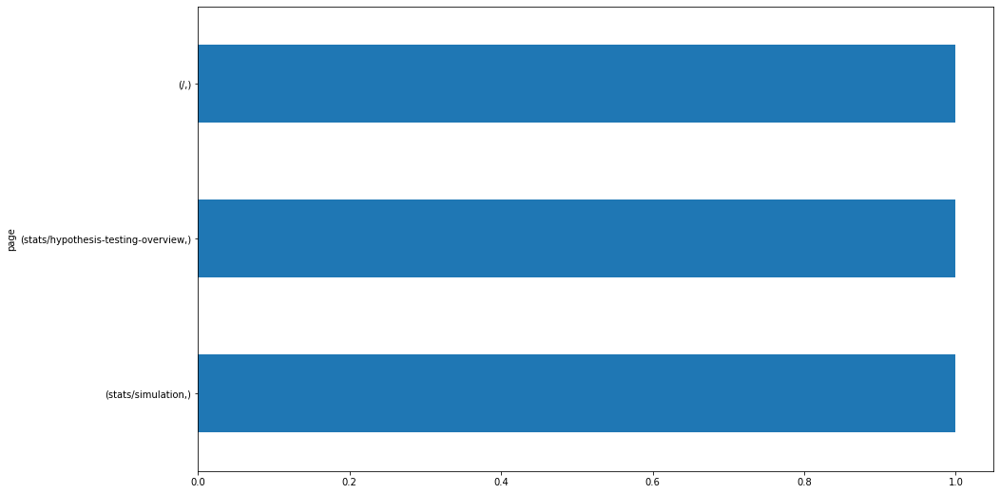


107.77.220.52
page                           
stats/probability-distributions    1
dtype: int64


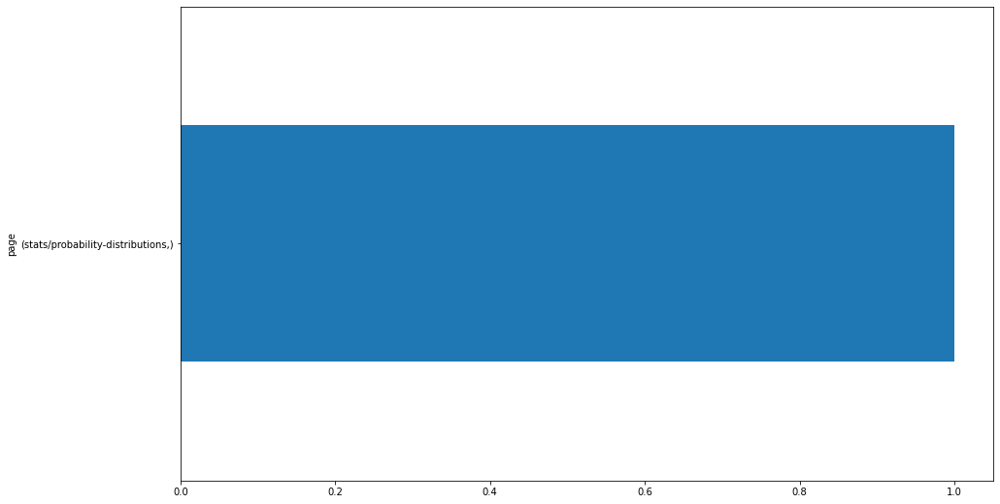


172.58.102.131
page                           
stats/simulation                   1
stats/probability-distributions    1
stats/compare-means                1
dtype: int64


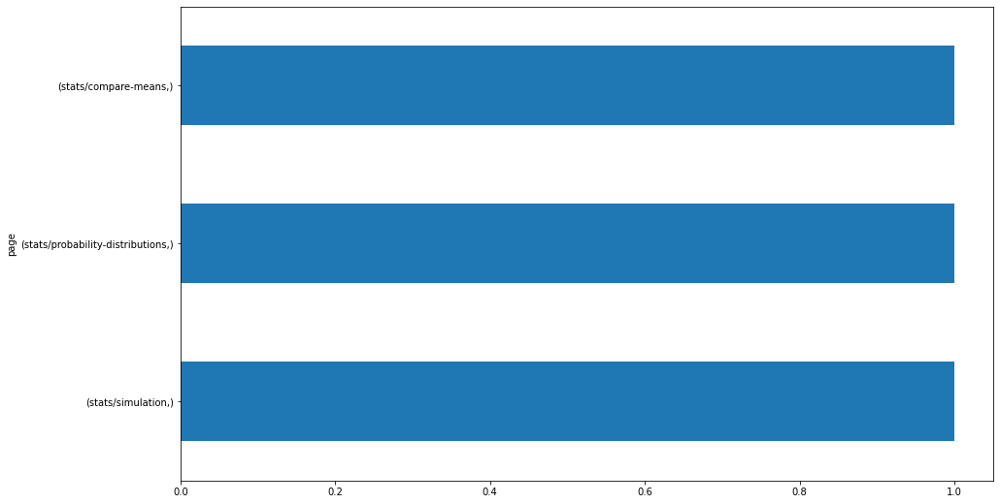


99.203.155.70
page                             
stats/hypothesis-testing-overview    1
dtype: int64


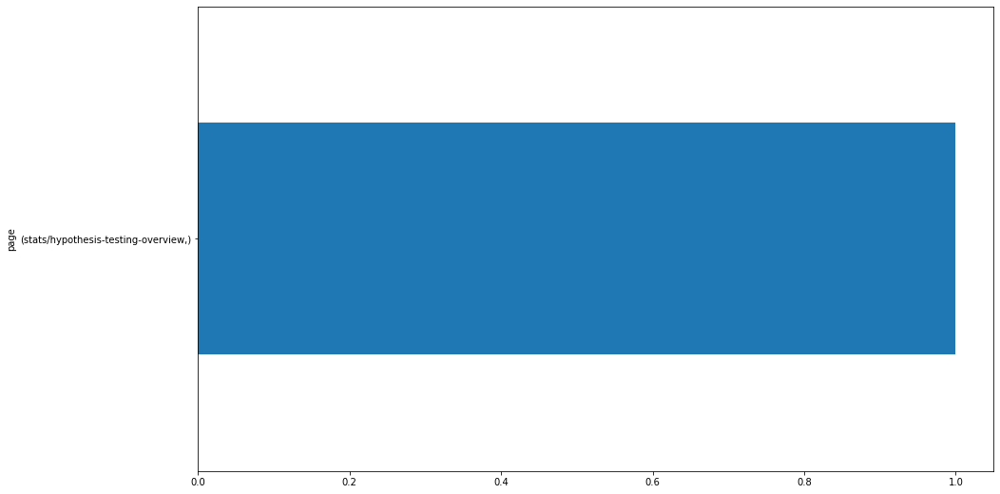


172.58.107.219
page                           
stats/simulation                   1
stats/probability-distributions    1
dtype: int64


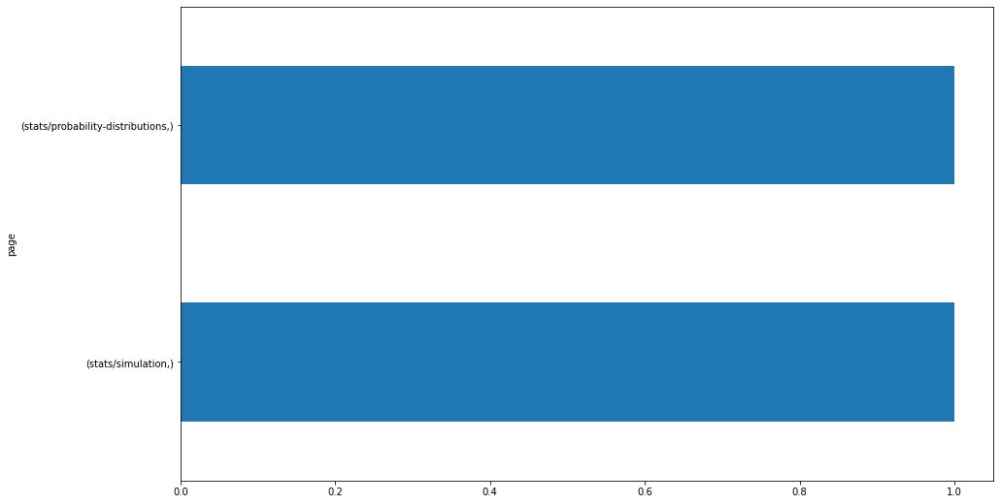


172.58.110.222
page                           
stats/probability-distributions    2
dtype: int64


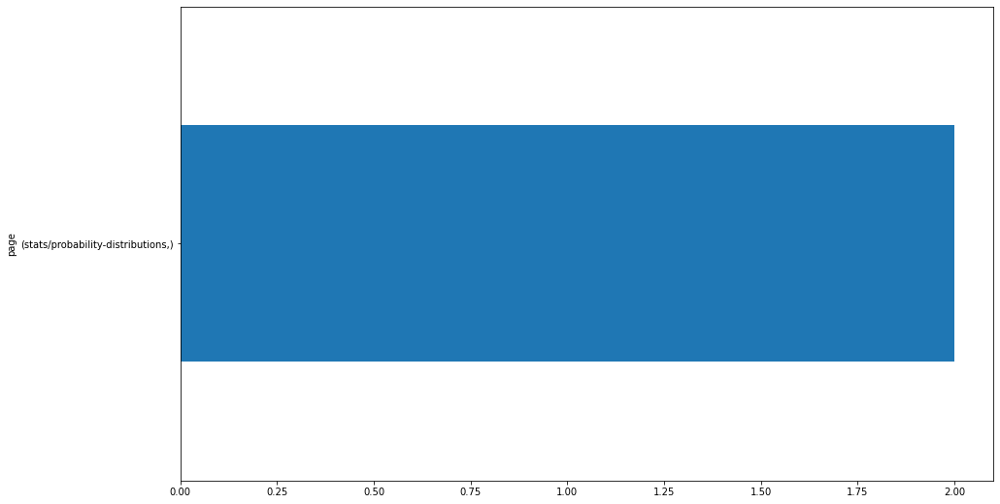


174.255.132.117
page                           
stats/probability-distributions    2
stats/simulation                   1
stats/overview                     1
/                                  1
dtype: int64


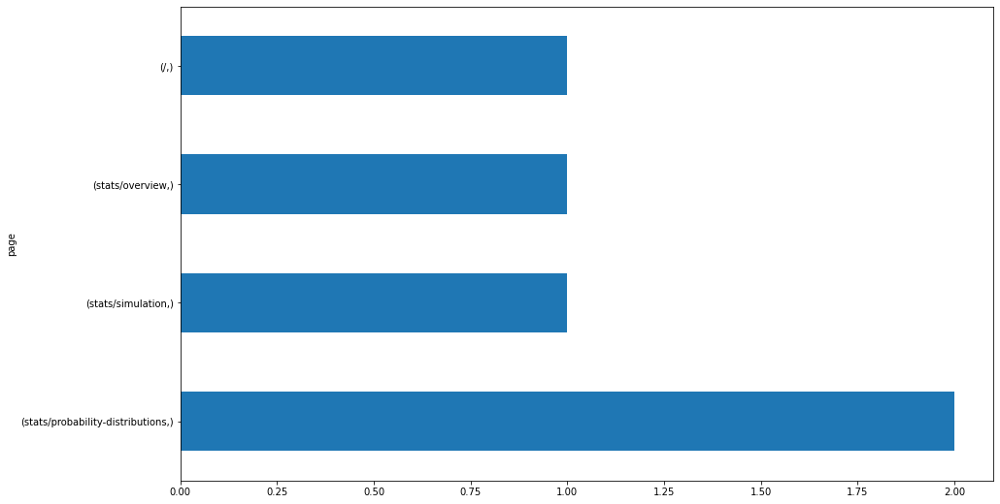


72.206.103.198
page                        
python/overview                 1
python/intro-to-matplotlib      1
python/ds-libraries-overview    1
/                               1
dtype: int64


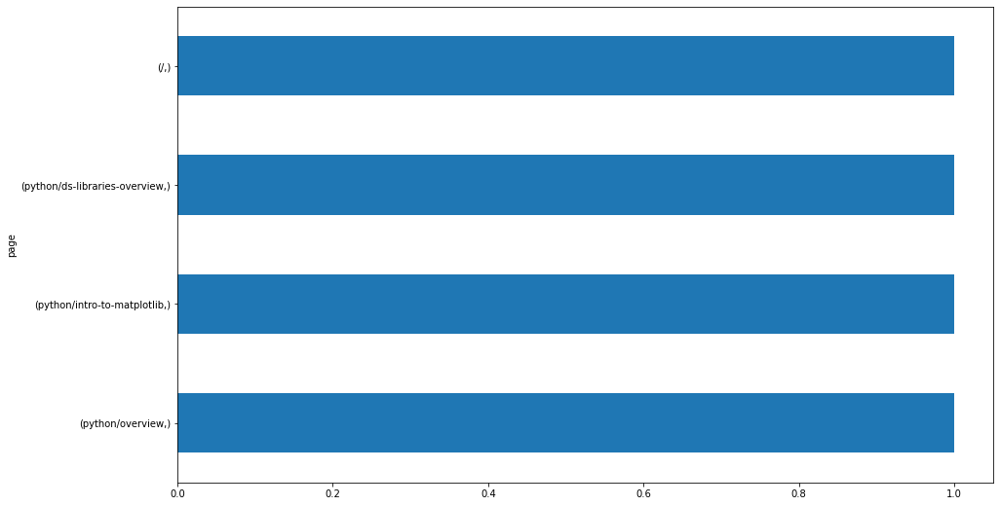


24.173.208.242
page                                    
classification/acquire                      8
classification/overview                     4
/                                           3
classification/evaluation                   3
sql/mysql-overview                          3
classification/prep                         3
classification/explore                      2
stats/simulation                            2
classification/logistic-regression          2
python/pandas-overview                      2
python/intro-to-seaborn                     2
classification/tidy-data                    2
fundamentals/git                            2
fundamentals/intro-to-data-science          1
classification/scale_features_or_not.svg    1
timeseries/acquire                          1
python/advanced-dataframes                  1
python/dataframes                           1
storytelling/understand                     1
python/intro-to-numpy                       1
python/series          

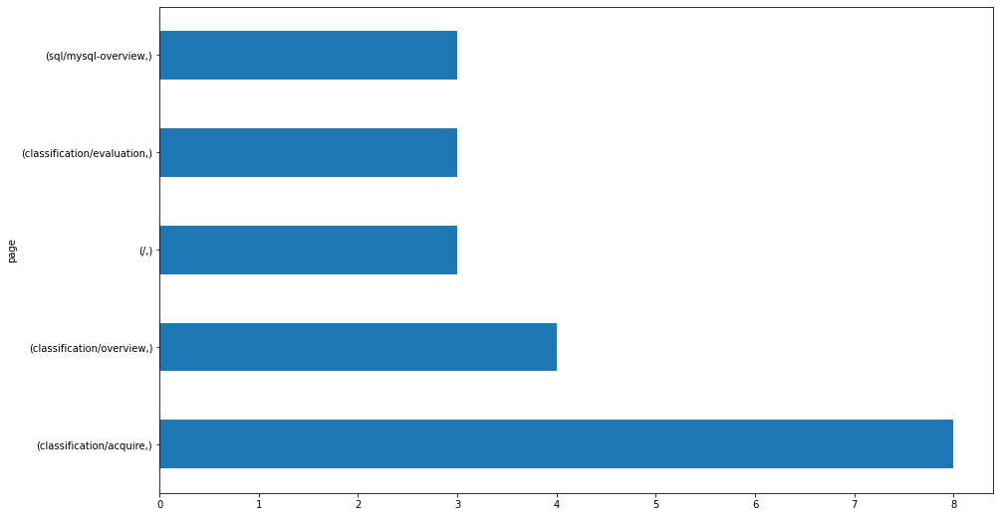


70.117.28.76
page                                   
/                                          8
classification/prep                        6
stats/compare-group-membership             4
stats/more-statistical-testing-examples    3
stats/compare-means                        3
stats/Selecting_a_hypothesis_test.svg      3
stats/correlation                          2
classification/overview                    2
classification/evaluation                  2
classification/acquire                     2
stats/hypothesis-testing-overview          1
search/search_index.json                   1
classification/tidy-data                   1
classification/explore                     1
dtype: int64


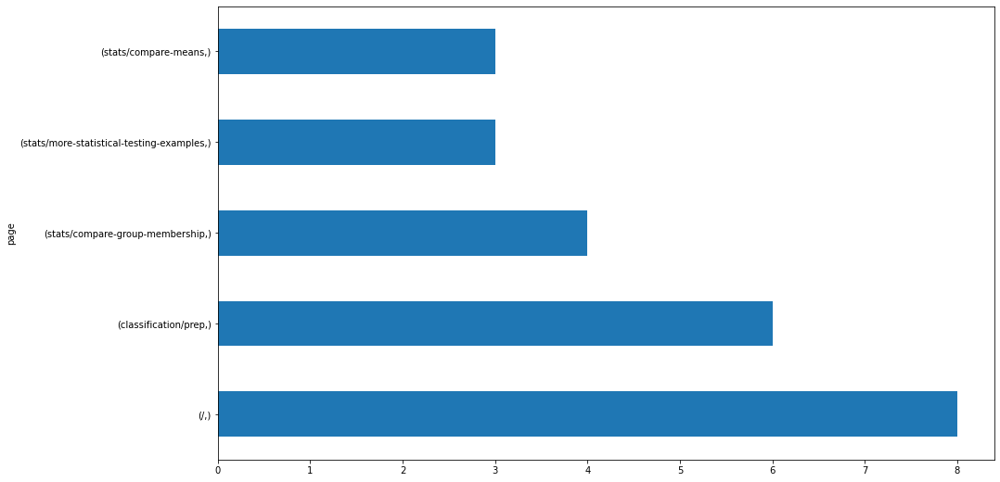


99.203.154.250
page                             
stats/correlation                    2
stats/probability-distributions      1
stats/hypothesis-testing-overview    1
stats/compare-means                  1
stats/compare-group-membership       1
/                                    1
dtype: int64


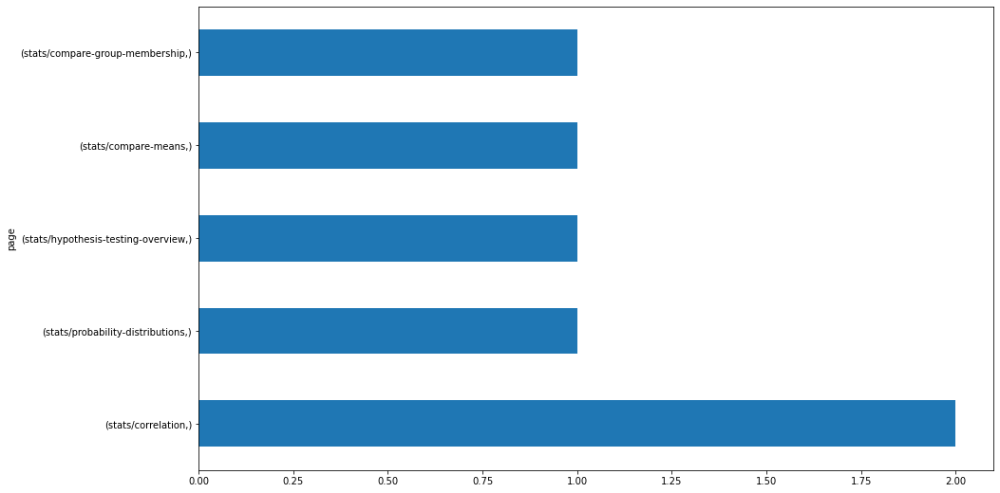


99.203.26.161
page                             
classification/acquire               4
classification/overview              2
stats/simulation                     1
stats/probability-distributions      1
stats/overview                       1
stats/hypothesis-testing-overview    1
stats/compare-means                  1
stats/compare-group-membership       1
sql/mysql-overview                   1
dtype: int64


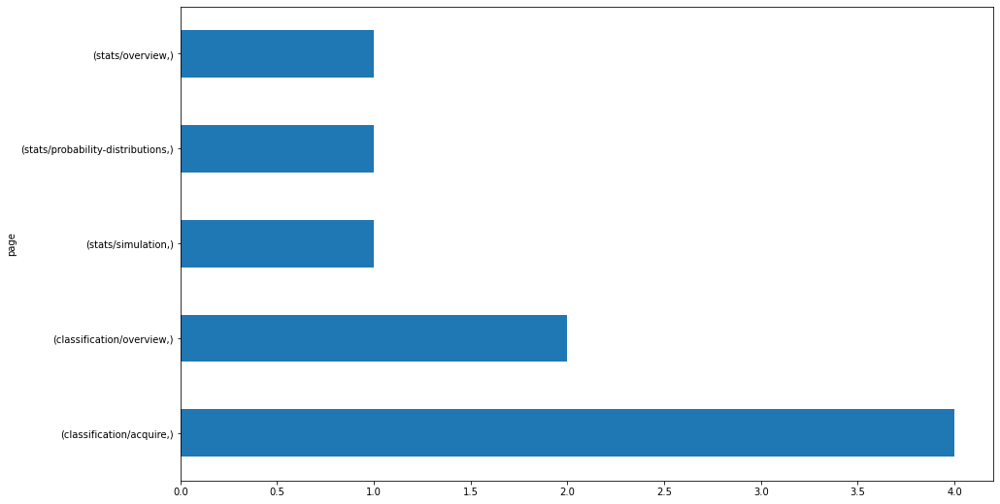


107.77.218.83
page                   
classification/overview    1
/                          1
dtype: int64


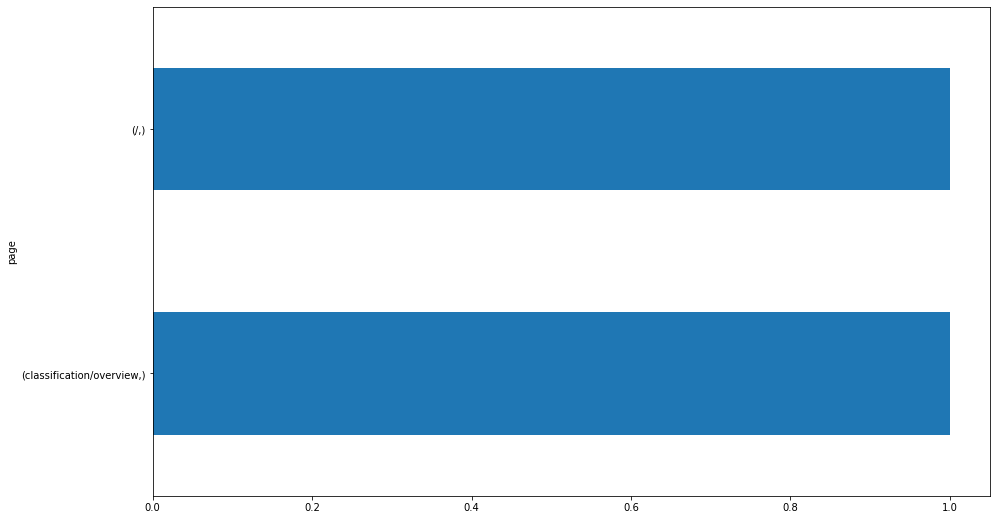


99.203.155.102
page                   
classification/project     1
classification/overview    1
classification/acquire     1
dtype: int64


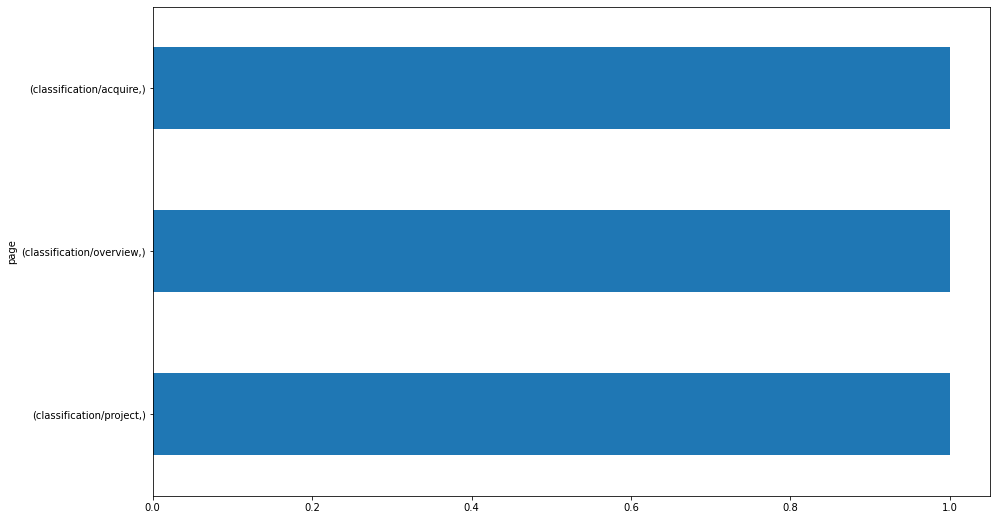


67.11.56.174
page                    
classification/tidy-data    3
classification/prep         3
/                           3
dtype: int64


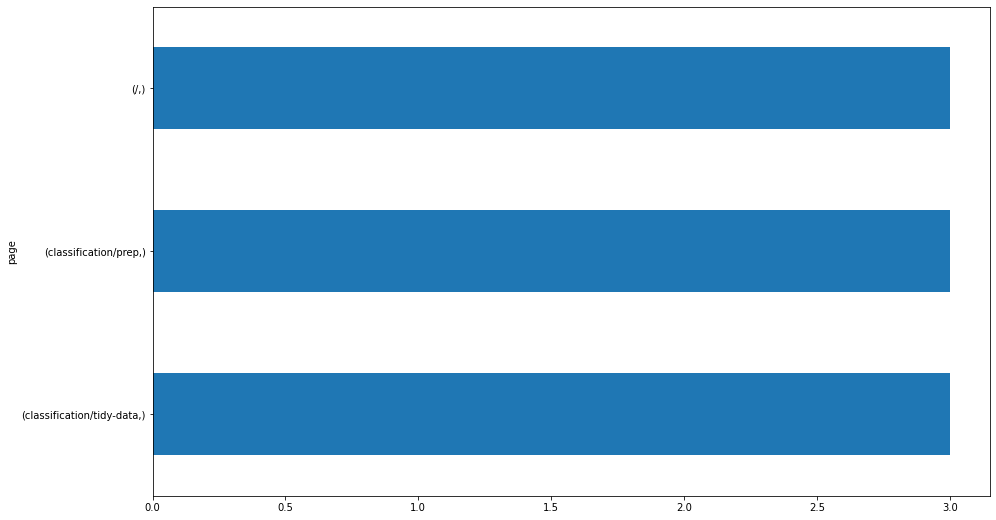


99.203.155.193
page                      
classification/prep           2
search/search_index.json      1
python/dataframes             1
python/advanced-dataframes    1
classification/tidy-data      1
dtype: int64


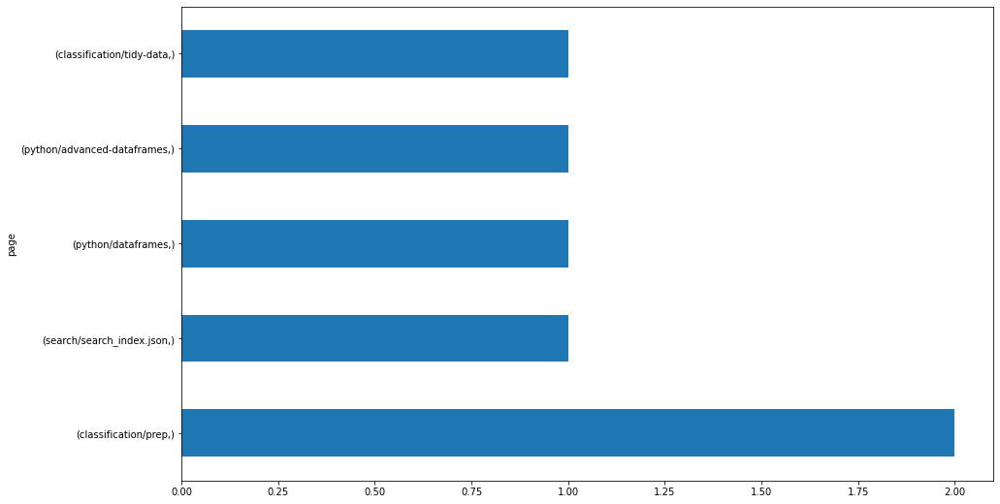


192.171.119.178
page                    
nlp/acquire                 2
/                           2
timeseries/prep             1
search/search_index.json    1
regression/project          1
nlp/regular-expressions     1
nlp/prepare                 1
classification/tidy-data    1
dtype: int64


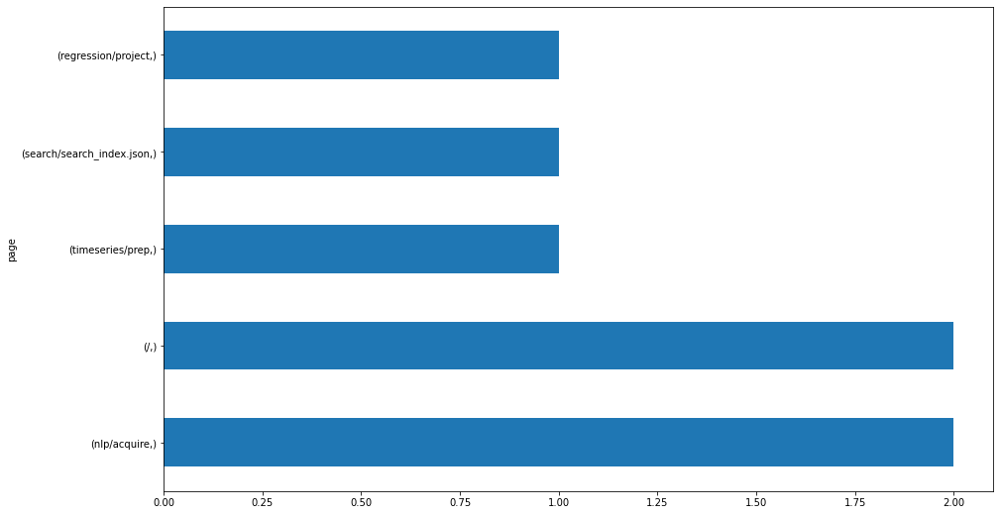


99.203.26.6
page                  
classification/acquire    1
dtype: int64


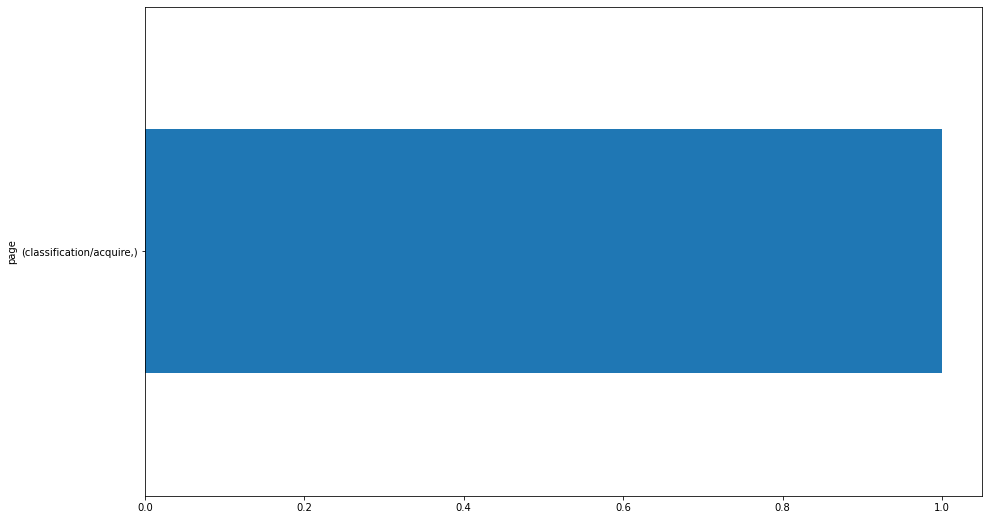


107.77.220.12
page                             
stats/hypothesis-testing-overview    1
/                                    1
dtype: int64


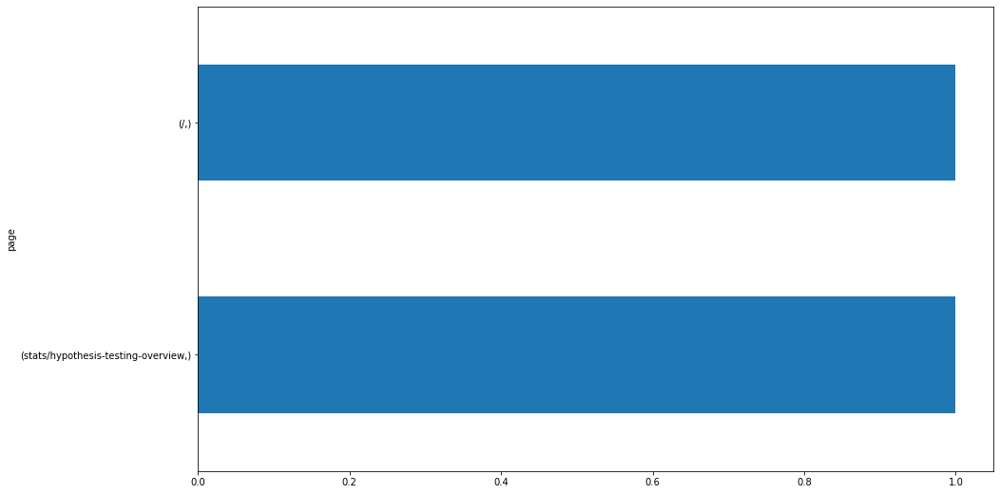


67.11.185.135
page                                           
/                                                  54
classification/evaluation                          22
classification/project                             18
classification/logistic-regression                 15
regression/split-and-scale                         14
regression/explore                                 12
regression/acquire-and-prep                        11
classification/decision-trees                       9
classification/explore                              9
search/search_index.json                            8
regression/evaluate                                 5
1-fundamentals/modern-data-scientist.jpg            4
1-fundamentals/AI-ML-DL-timeline.jpg                4
classification/knn                                  3
stats/compare-group-membership                      3
1-fundamentals/1.1-intro-to-data-science            3
regression/overview                                 3
fundamentals/DataTo

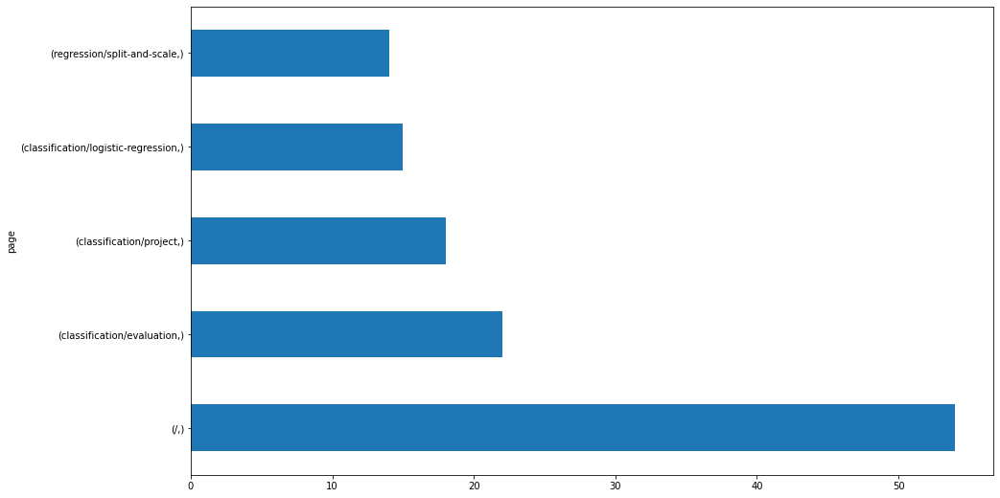


206.193.219.171
page                              
clustering/wrangle                    4
classification/overview               2
clustering/project                    1
clustering/model                      1
clustering/explore                    1
classification/logistic-regression    1
dtype: int64


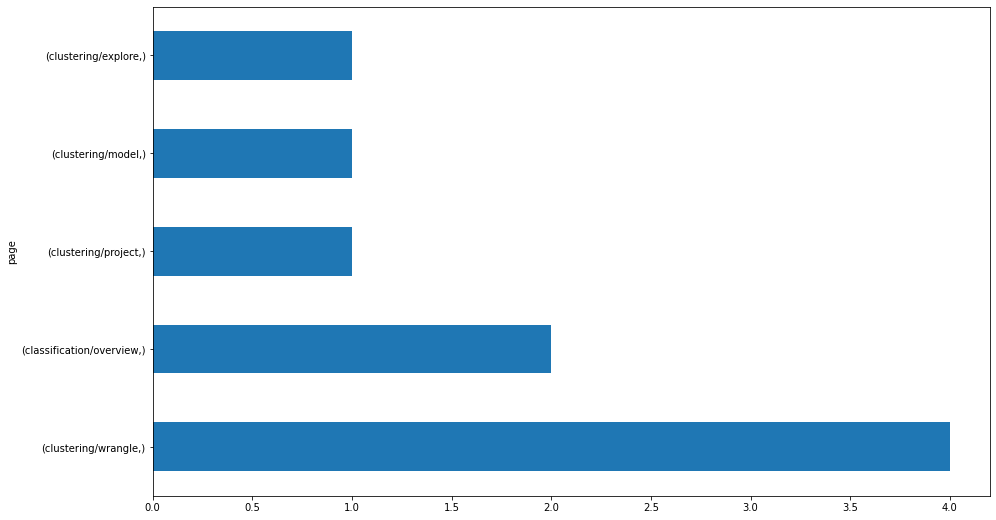


129.115.195.26
page                                           
fundamentals/git                                   1
fundamentals/cli/navigating-the-filesystem         1
fundamentals/cli/moving-files                      1
fundamentals/cli/more-topics                       1
fundamentals/cli/listing-files                     1
fundamentals/cli/file-paths                        1
fundamentals/cli/creating-files-and-directories    1
/                                                  1
dtype: int64


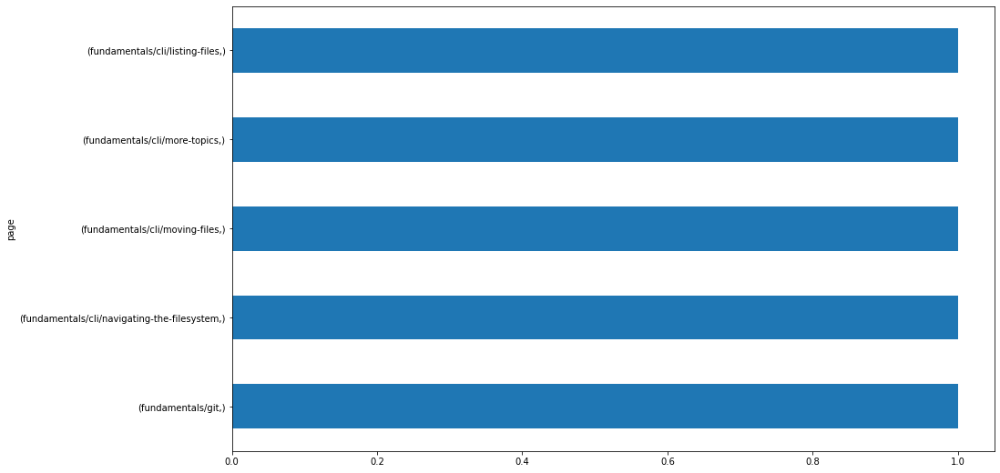


129.111.179.104
page
/       1
dtype: int64


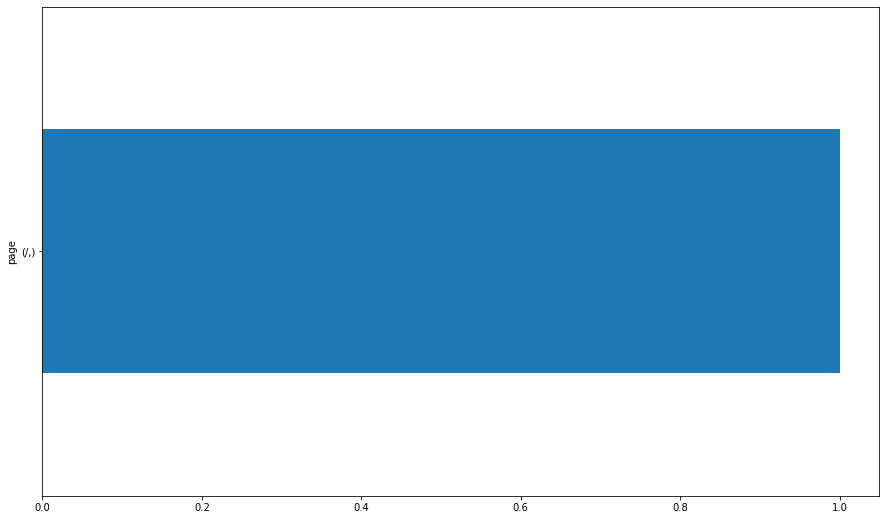


99.203.154.244
page                     
classification/evaluation    1
/                            1
dtype: int64


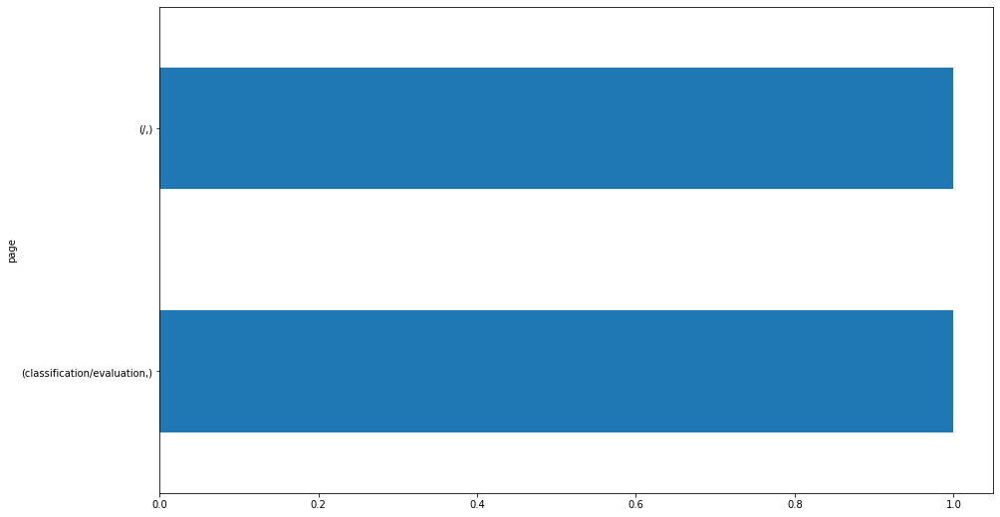


99.203.26.91
page              
classification/knn    1
dtype: int64


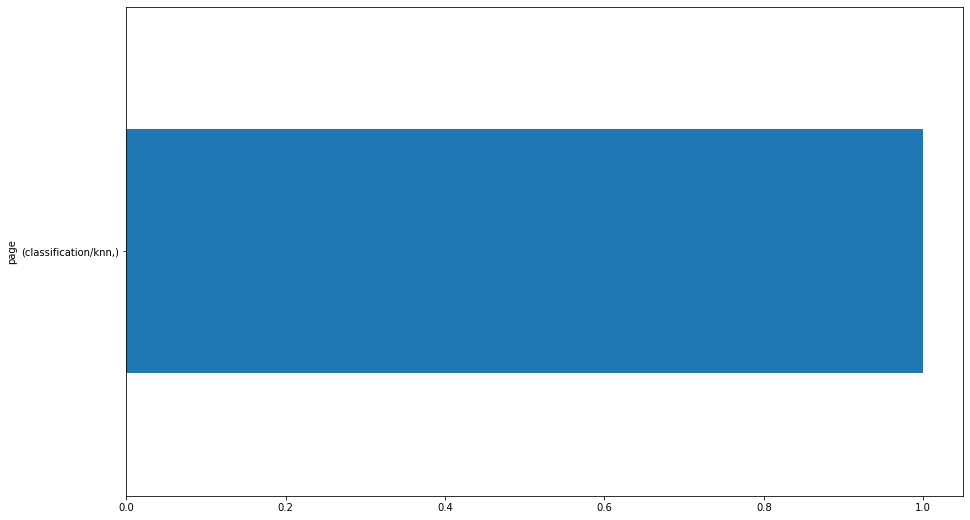


99.203.27.127
page                         
classification/decision-trees    1
/                                1
dtype: int64


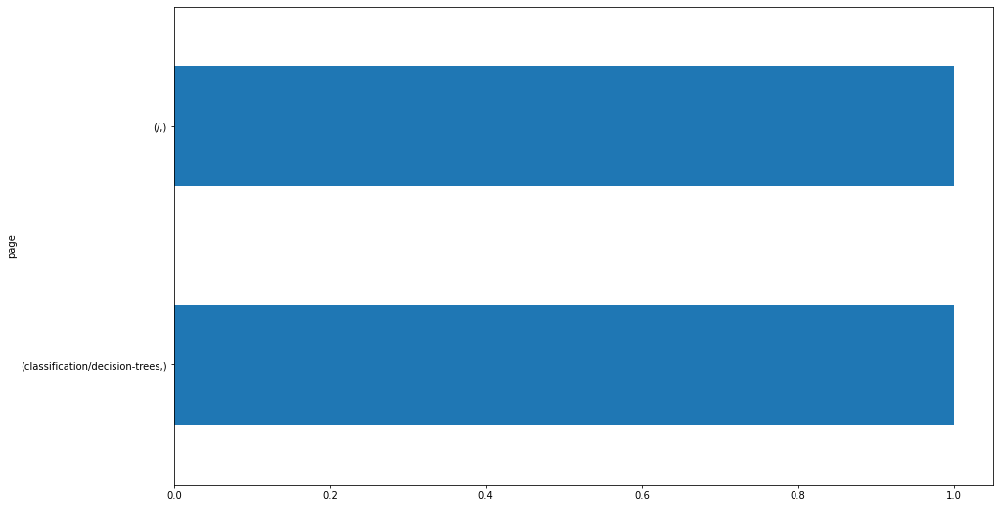


99.203.155.22
page                         
classification/evaluation        1
classification/decision-trees    1
dtype: int64


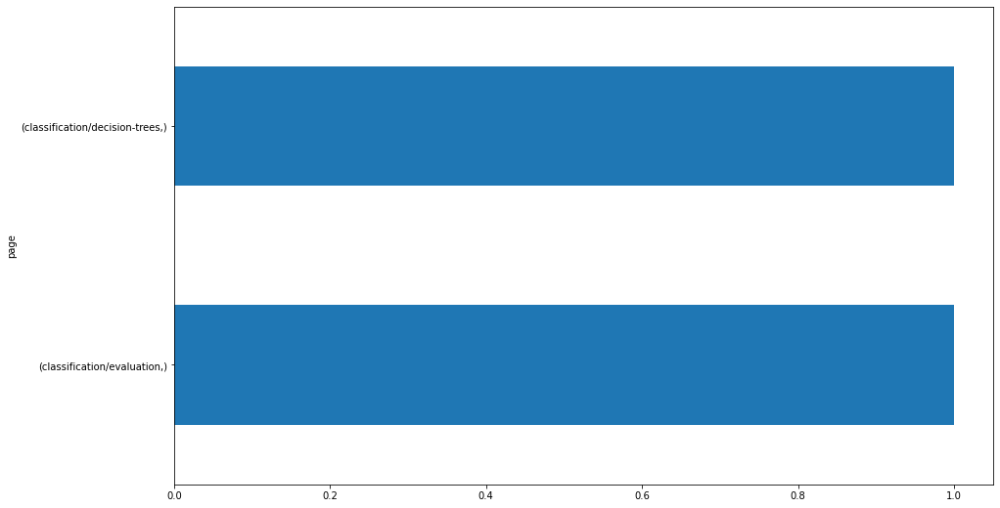


70.123.227.169
page                                     
/                                            6
search/search_index.json                     1
clustering/overview                          1
clustering/Hospital-Distance-Clusters.jpg    1
dtype: int64


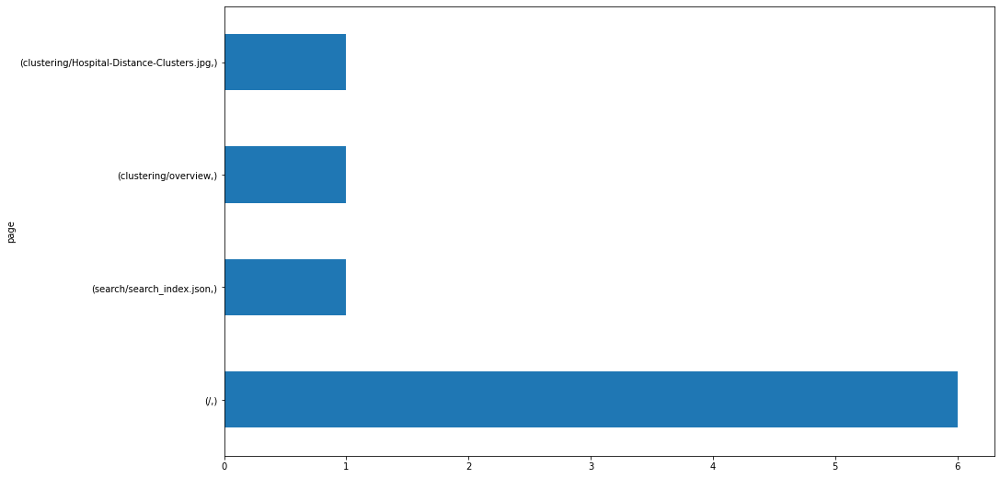


99.203.27.94
page
/       1
dtype: int64


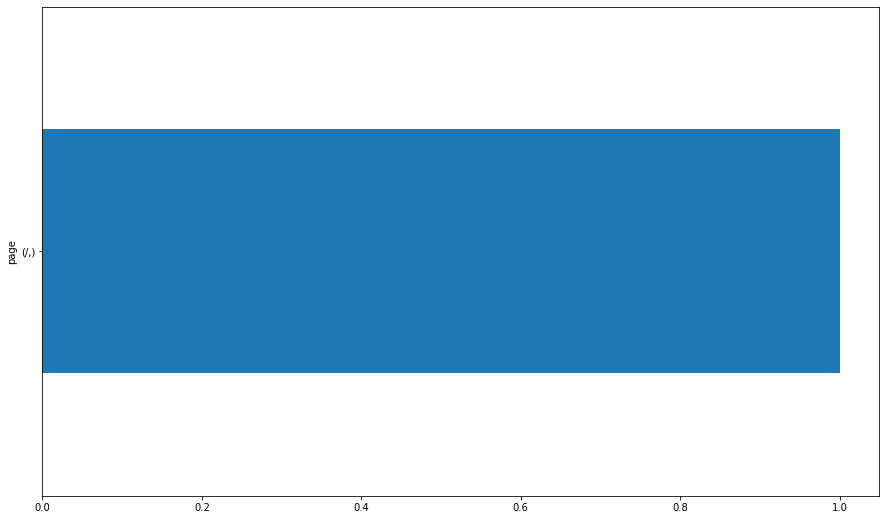


162.71.236.112
page                         
classification/decision-trees    1
dtype: int64


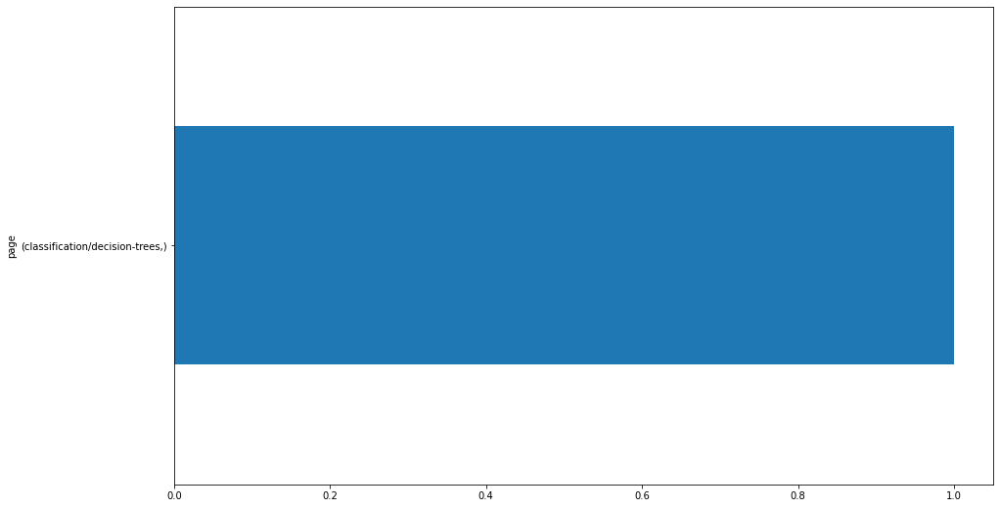


96.8.130.143
page                                    
regression/feature-engineering              14
regression/split-and-scale                  11
regression/evaluate                         11
sql/mysql-overview                           8
classification/overview                      7
classification/scale_features_or_not.svg     7
python/dataframes                            6
regression/acquire-and-prep                  5
regression/explore                           5
regression/project                           4
regression/model                             4
python/advanced-dataframes                   3
/                                            3
regression/overview                          3
search/search_index.json                     3
classification/logistic-regression           2
classification/tidy-data                     1
sql/databases                                1
classification/project                       1
classification/prep                          1
sql/g

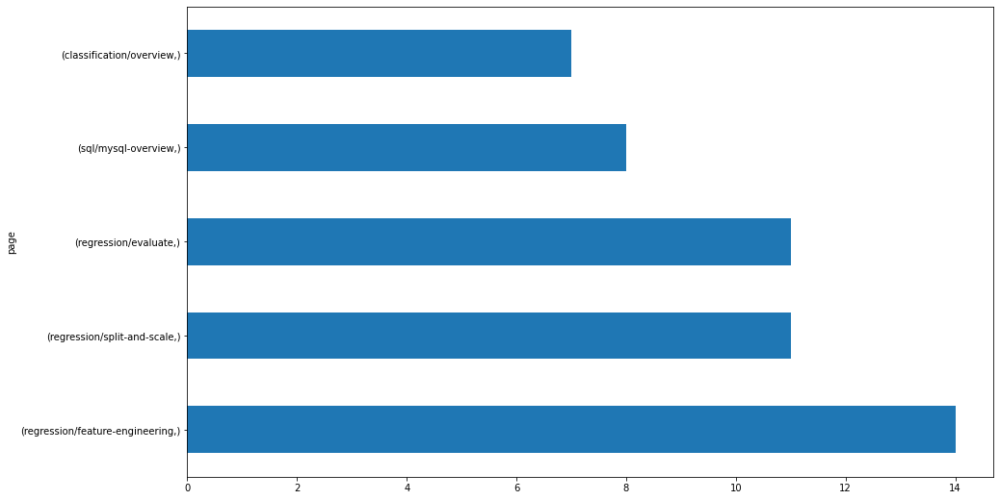


99.203.27.141
page                       
regression/overview            1
regression/acquire-and-prep    1
/                              1
dtype: int64


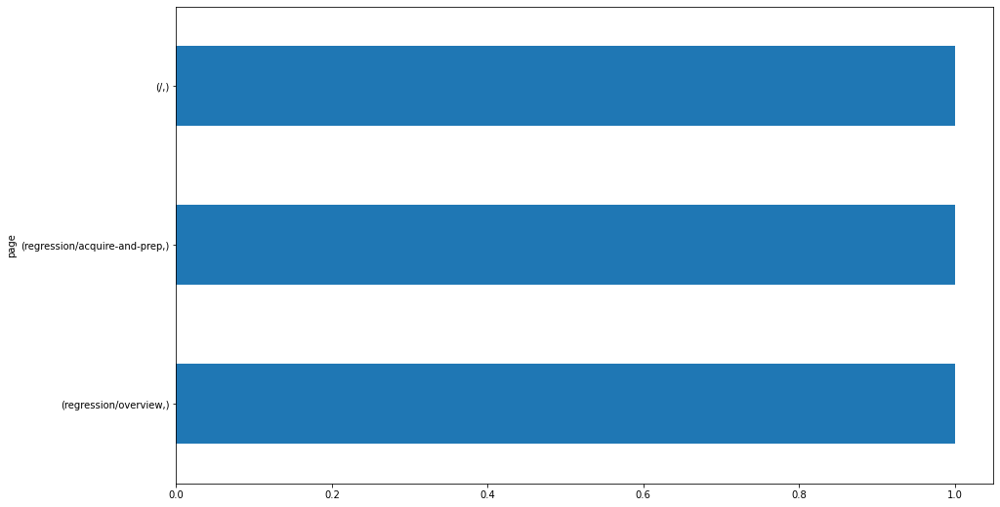


167.24.24.150
page
/       2
dtype: int64


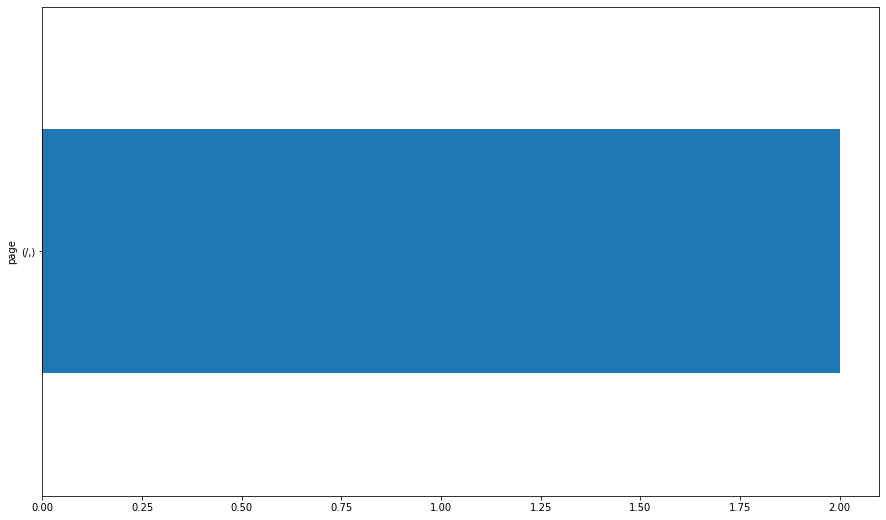


76.193.64.119
page
/       1
dtype: int64


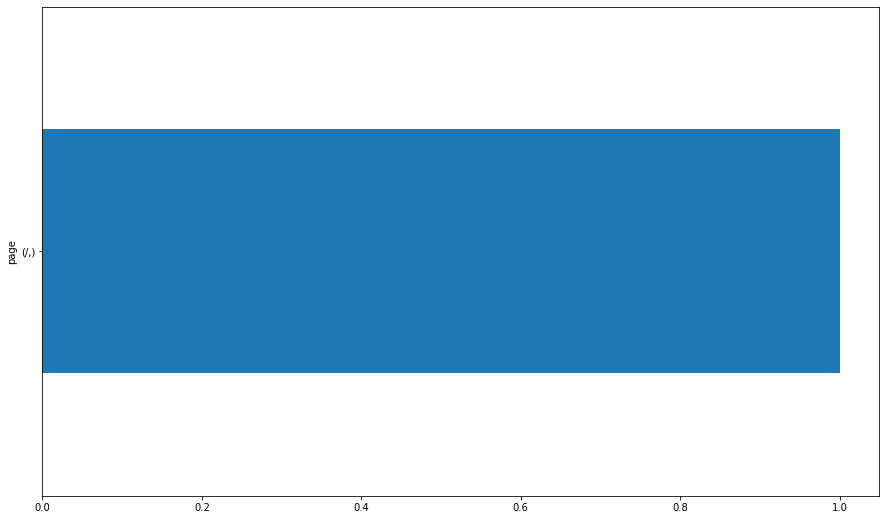


70.120.27.3
page                       
/                              2
regression/project             1
regression/acquire-and-prep    1
clustering/wrangle             1
dtype: int64


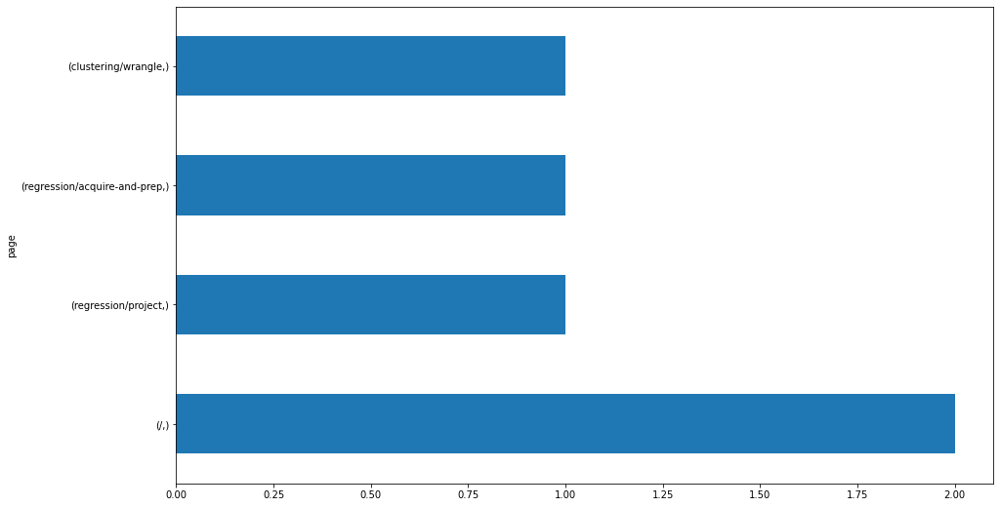


70.114.45.119
page                                    
sql/mysql-overview                          1
regression/acquire-and-prep                 1
fundamentals/modern-data-scientist.jpg      1
fundamentals/intro-to-data-science          1
fundamentals/AI-ML-DL-timeline.jpg          1
classification/scale_features_or_not.svg    1
classification/overview                     1
dtype: int64


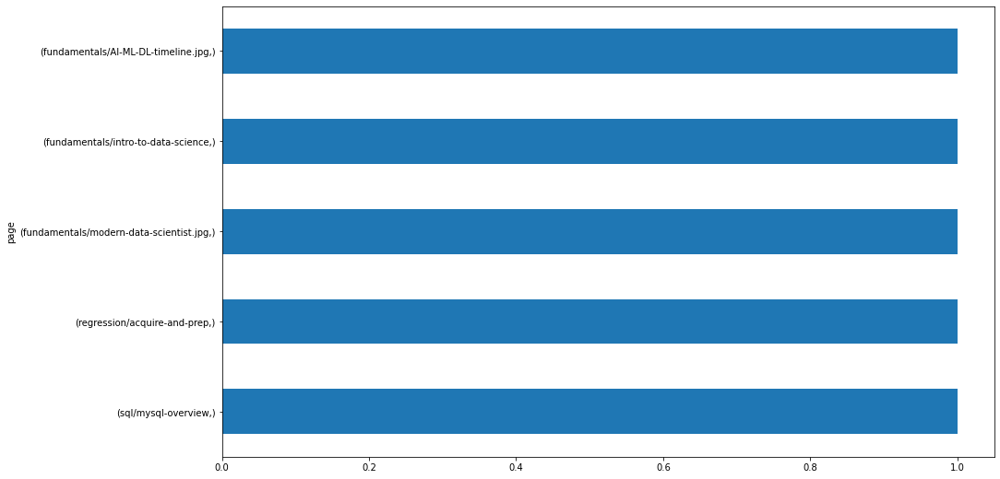


99.203.27.142
page                                    
stats/probability-distributions             2
/                                           2
regression/explore                          1
python/intro-to-matplotlib                  1
classification/scale_features_or_not.svg    1
classification/overview                     1
dtype: int64


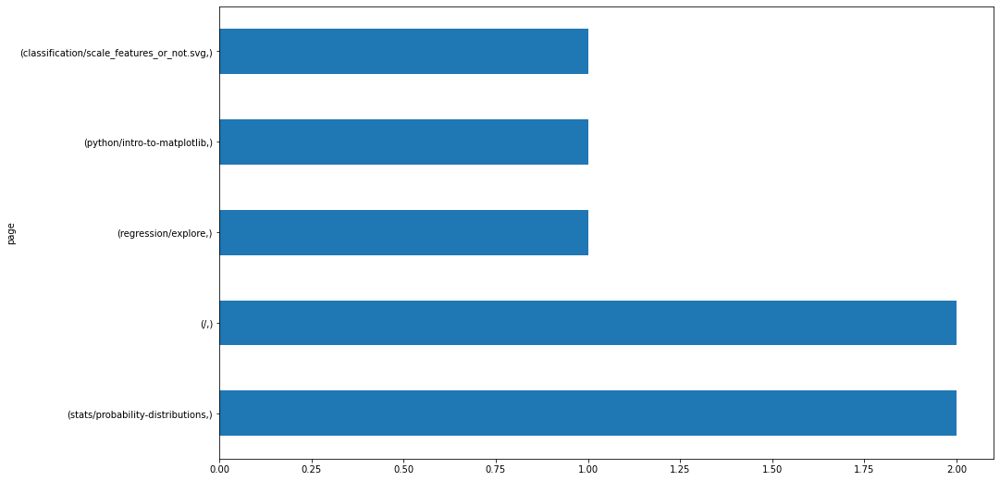


67.11.56.165
page                                     
/                                            37
regression/model                             12
regression/project                           11
regression/evaluate                           8
regression/feature-engineering                8
clustering/Hospital-Distance-Clusters.jpg     4
clustering/overview                           3
clustering/wrangle                            3
regression/built-in-datasets                  2
regression/explore                            2
clustering/about                              2
1-fundamentals/modern-data-scientist.jpg      2
1-fundamentals/AI-ML-DL-timeline.jpg          2
stats/power-analysis                          1
stats/distributions-and-testing               1
classification/evaluation                     1
appendix/open_data                            1
1-fundamentals/1.1-intro-to-data-science      1
timeseries/project                            1
dtype: int64


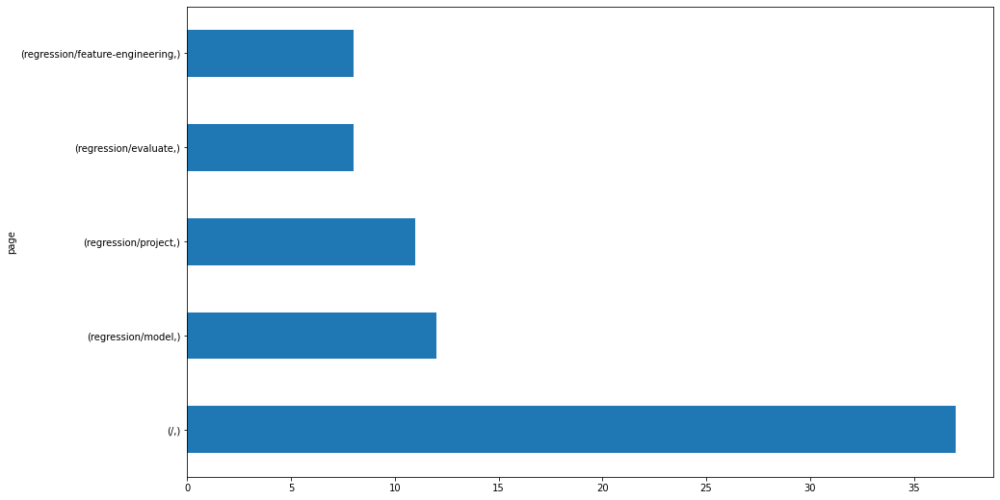


99.203.154.98
page              
regression/explore    1
appendix/open_data    1
/                     1
dtype: int64


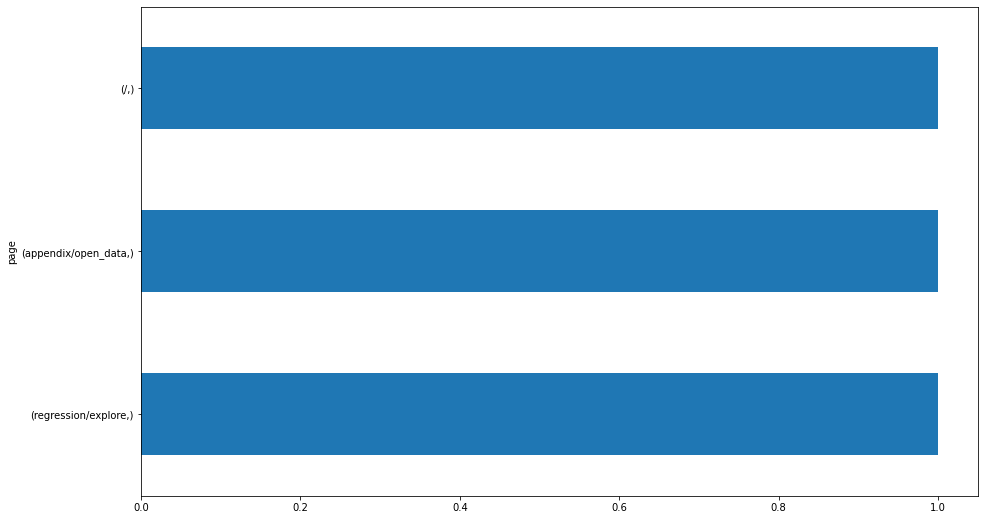


72.178.76.70
page                                    
regression/feature-engineering              2
regression/evaluate                         1
classification/scale_features_or_not.svg    1
classification/overview                     1
classification/explore                      1
classification/evaluation                   1
/                                           1
dtype: int64


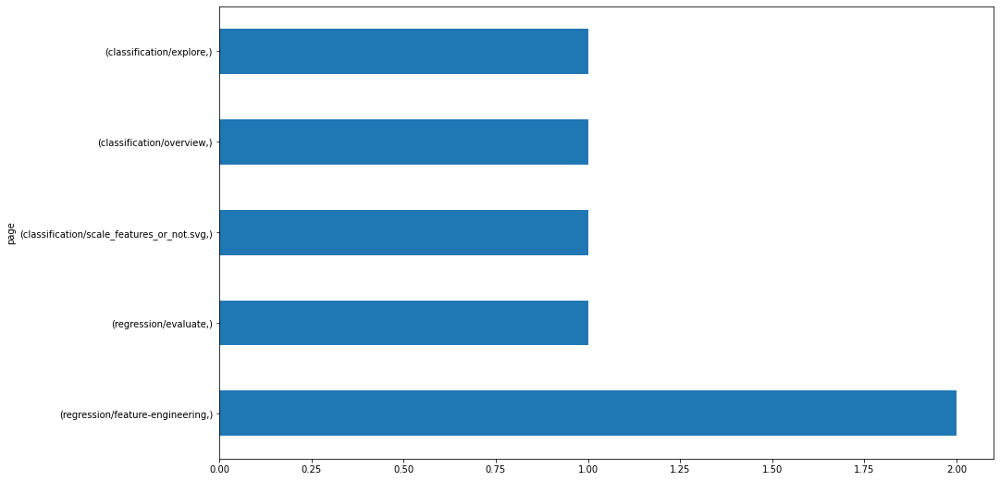


96.8.130.212
page                                     
/                                            14
clustering/wrangle                            6
clustering/explore                            5
clustering/Hospital-Distance-Clusters.jpg     4
stats/correlation                             3
stats/compare-means                           3
clustering/overview                           3
stats/distributions-and-testing               2
regression/model                              2
clustering/project                            2
python/intro-to-matplotlib                    1
clustering/about                              1
clustering/model                              1
darden-python-assessment.html                 1
stats/sampling                                1
python/intro-to-seaborn                       1
regression/evaluate                           1
stats/probability-distributions               1
regression/feature-engineering                1
regression/project              

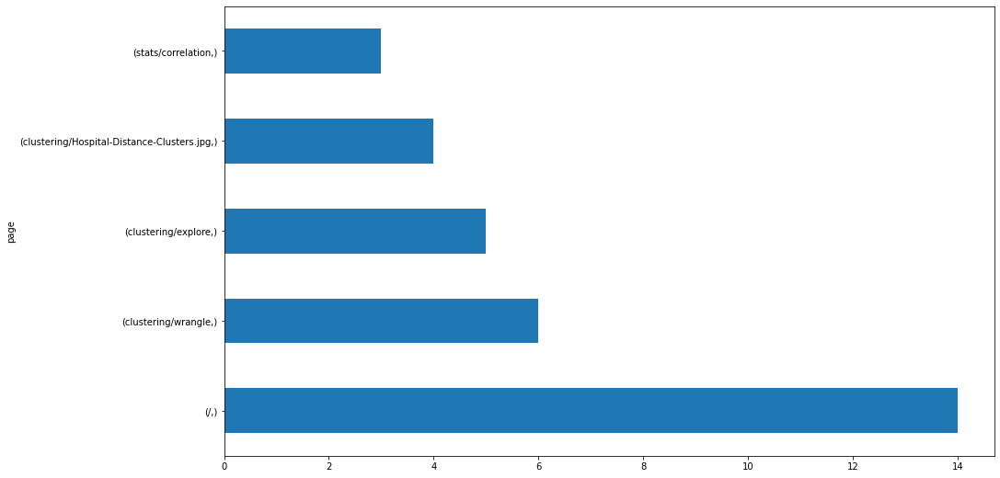


72.181.103.160
page                       
regression/acquire-and-prep    2
regression/overview            1
dtype: int64


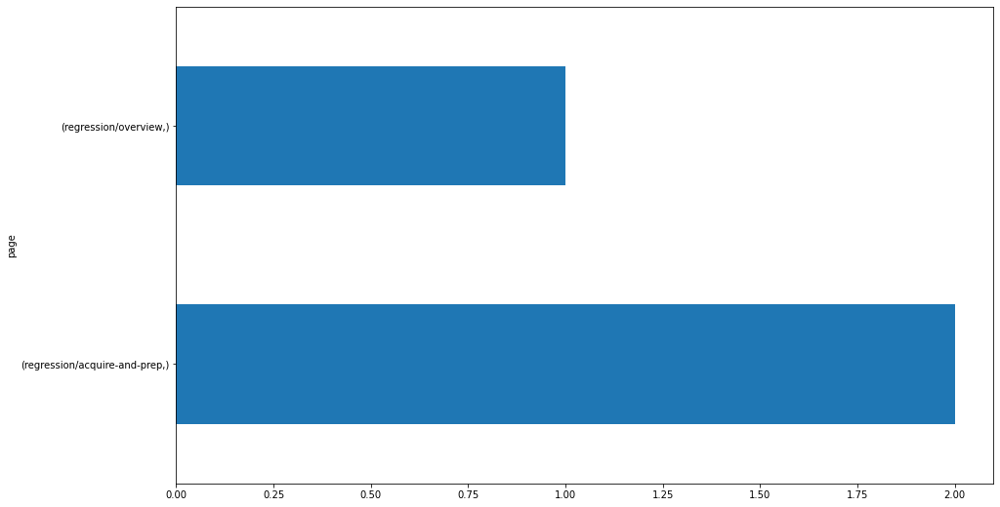


99.203.27.32
page                          
regression/feature-engineering    1
dtype: int64


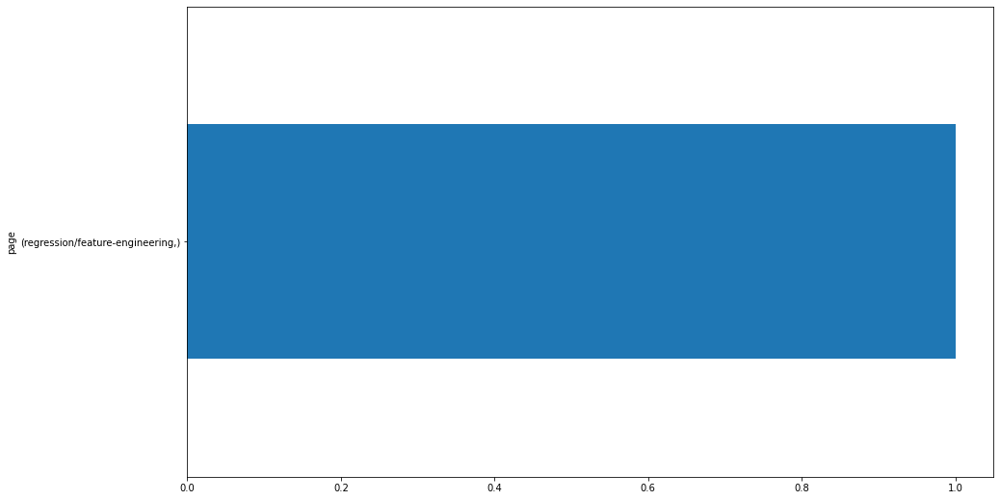


99.203.26.216
page                
sql/where               2
sql/joins               1
sql/functions           1
sql/clauses-overview    1
sql/basic-statements    1
regression/project      1
/                       1
dtype: int64


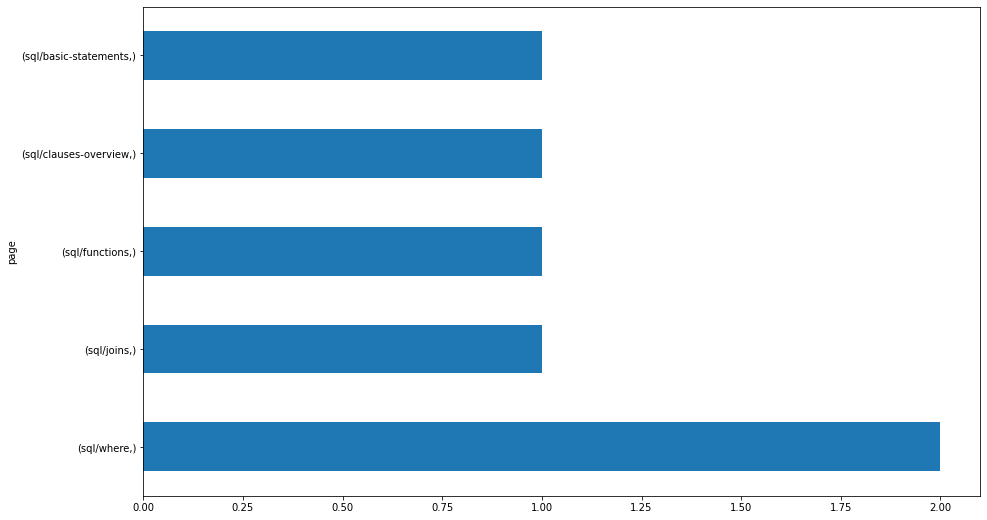


96.8.130.213
page                                     
clustering/Hospital-Distance-Clusters.jpg    16
clustering/overview                          12
clustering/wrangle                           12
regression/evaluate                          11
sql/mysql-overview                           10
clustering/explore                            9
search/search_index.json                      9
timeseries/prep                               8
timeseries/explore                            7
regression/feature-engineering                7
stats/compare-means                           7
timeseries/working-with-time-series-data      6
python/advanced-dataframes                    5
regression/model                              5
clustering/project                            5
/                                             5
stats/compare-group-membership                5
clustering/model                              4
stats/correlation                             4
clustering/about                

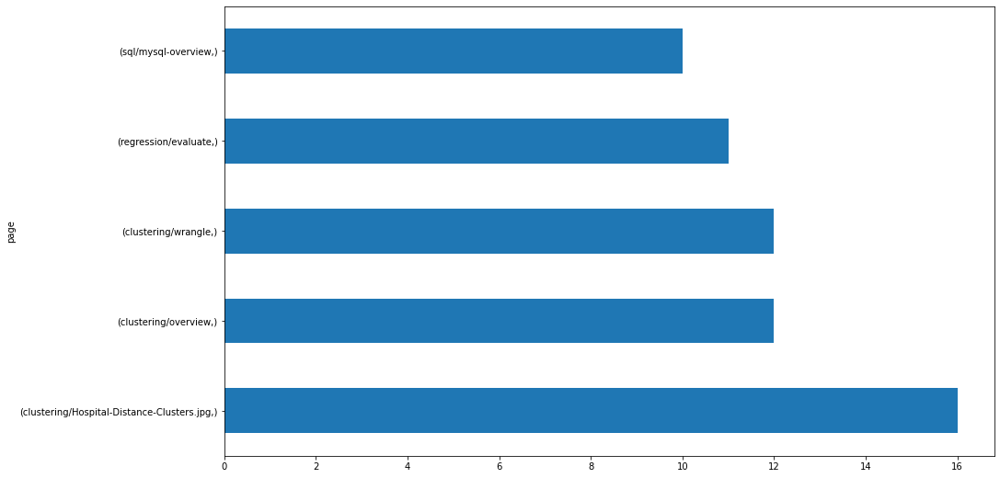


173.173.107.110
page                                    
timeseries/overview                         2
search/search_index.json                    1
classification/scale_features_or_not.svg    1
classification/overview                     1
dtype: int64


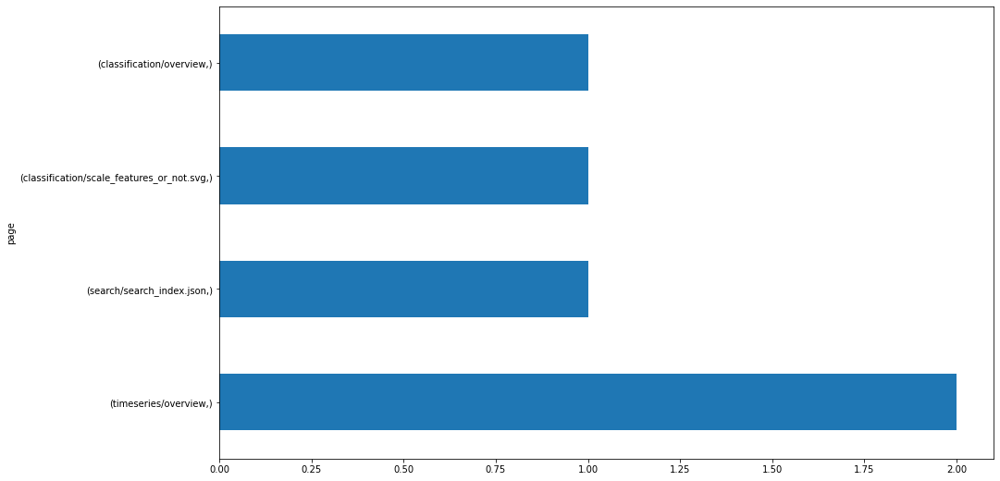


99.203.27.90
page                      
python/intro-to-seaborn       1
python/intro-to-matplotlib    1
/                             1
dtype: int64


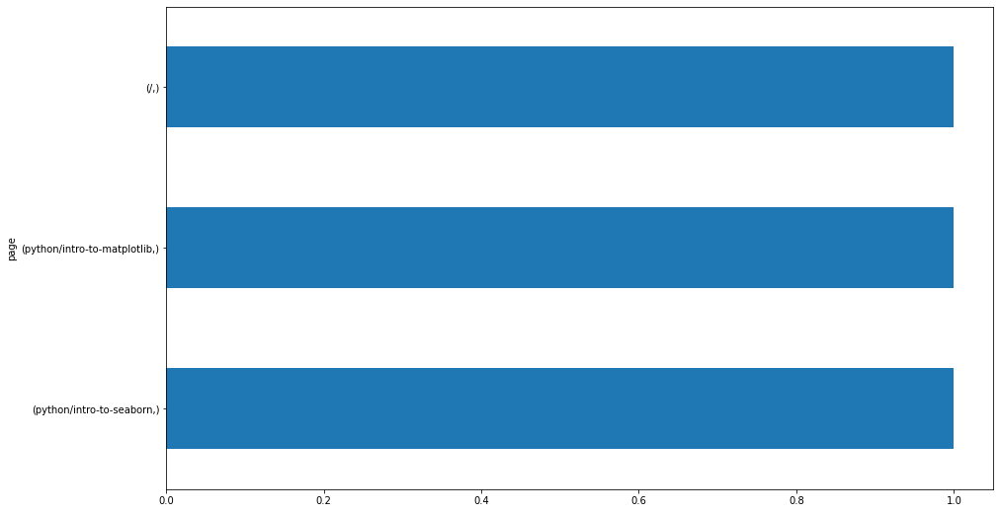


67.10.186.142
page                    
search/search_index.json    2
clustering/wrangle          1
classification/prep         1
/                           1
dtype: int64


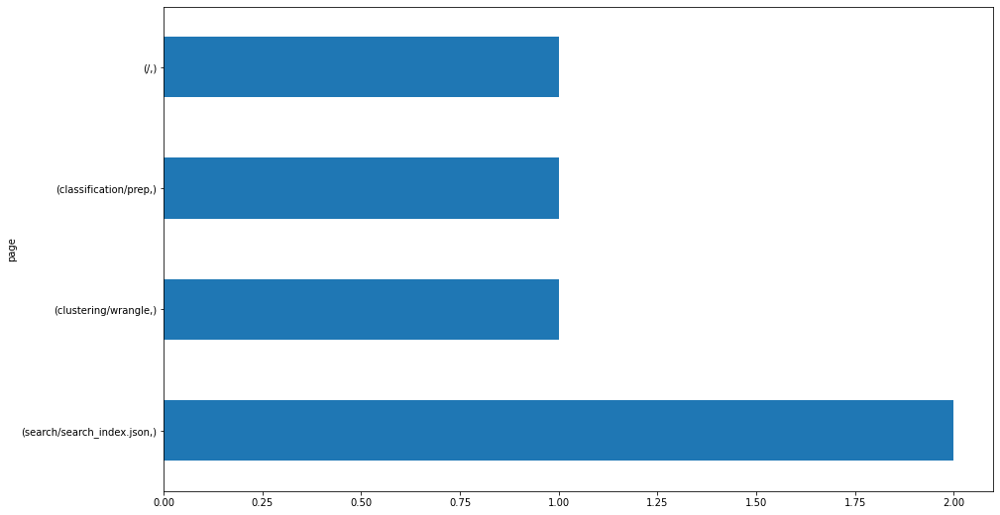


96.8.130.197
page                              
fundamentals/pipeline-demo            2
fundamentals/data-science-pipeline    2
fundamentals/DataToAction_v2.jpg      2
fundamentals/vocabulary               1
/                                     1
dtype: int64


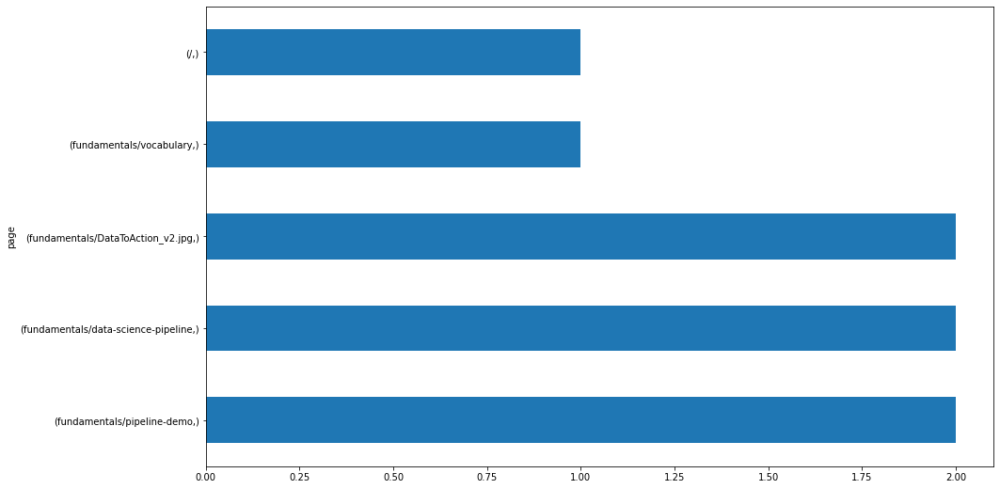


67.11.185.145
page
/       3
dtype: int64


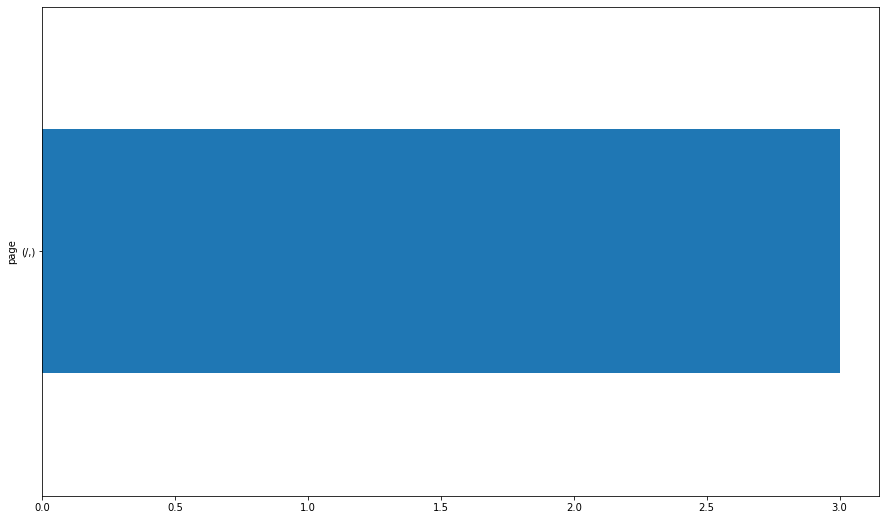


173.174.142.84
page                                       
/                                              13
1-fundamentals/AI-ML-DL-timeline.jpg           10
1-fundamentals/1.1-intro-to-data-science       10
1-fundamentals/modern-data-scientist.jpg       10
regression/model                                8
6-regression/3-split-and-scale                  7
regression/evaluate                             7
search/search_index.json                        5
clustering/explore                              5
regression/feature-engineering                  5
clustering/wrangle                              5
timeseries/acquire                              4
6-regression/4-explore                          3
8-clustering/4-explore                          3
6-regression/2-acquire-and-prep                 3
8-clustering/2-about                            2
8-clustering/5-model                            2
8-clustering/3-wrangle                          2
7-classification/1-overview             

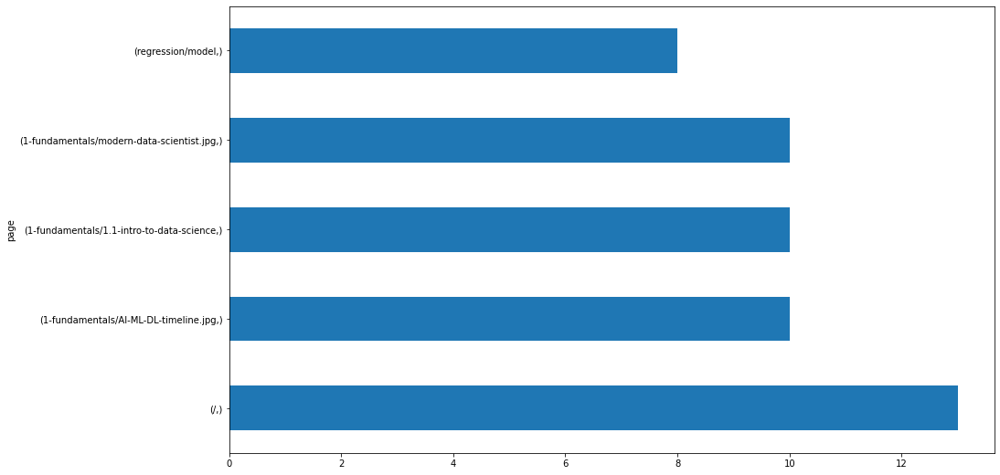


24.28.150.196
page                        
/                               41
clustering/project              18
timeseries/acquire              14
timeseries/prep                 13
timeseries/modeling-lesson1     13
                                ..
distributed-ml/ml-with-spark     1
storytelling/present             1
distributed-ml/explore           1
stats/correlation                1
sql/database-design              1
Length: 69, dtype: int64


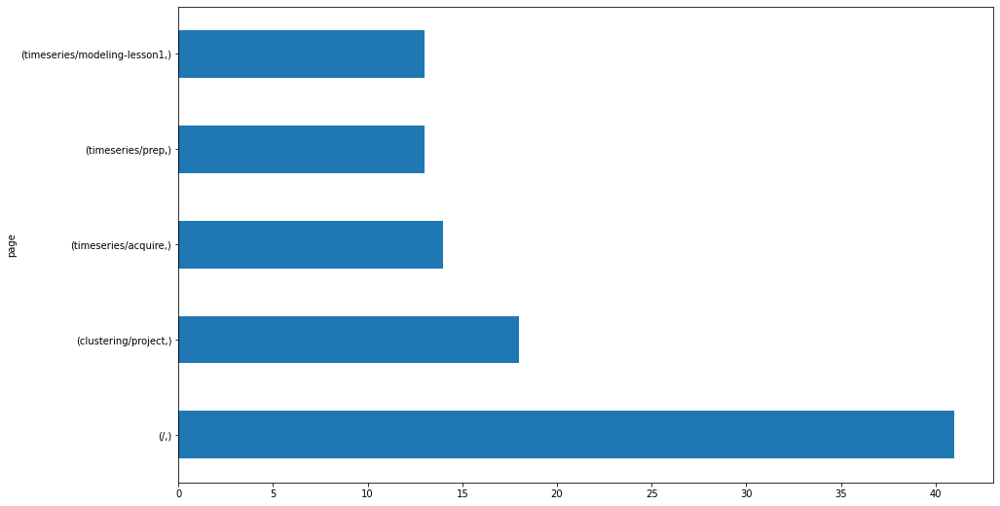


99.203.155.120
page                      
python/intro-to-seaborn       1
python/intro-to-matplotlib    1
clustering/wrangle            1
clustering/explore            1
/                             1
dtype: int64


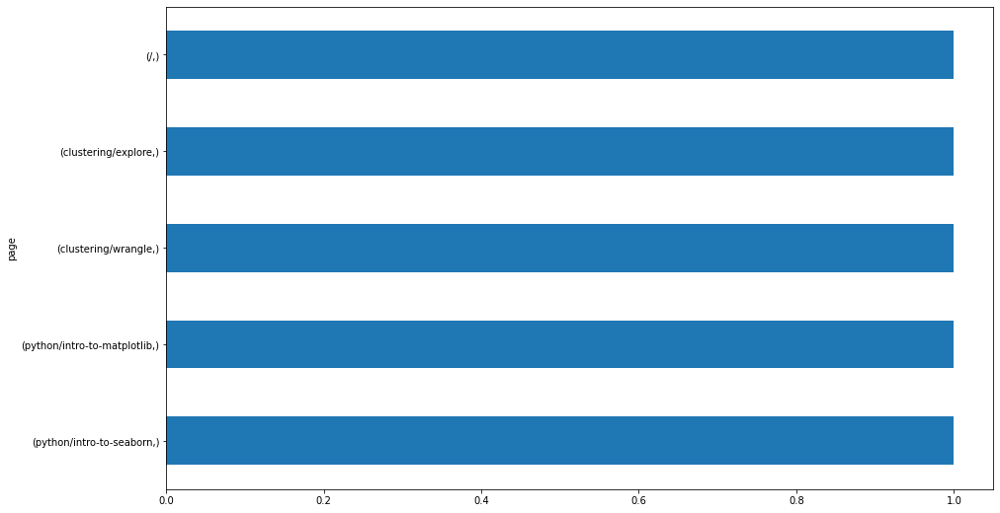


99.203.154.146
page            
clustering/model    1
dtype: int64


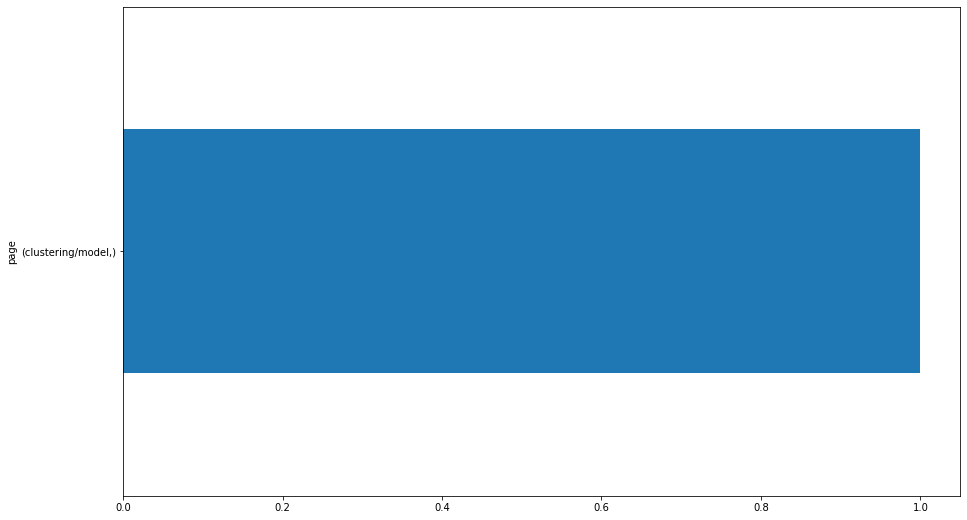


99.203.154.222
page              
clustering/wrangle    1
clustering/model      1
dtype: int64


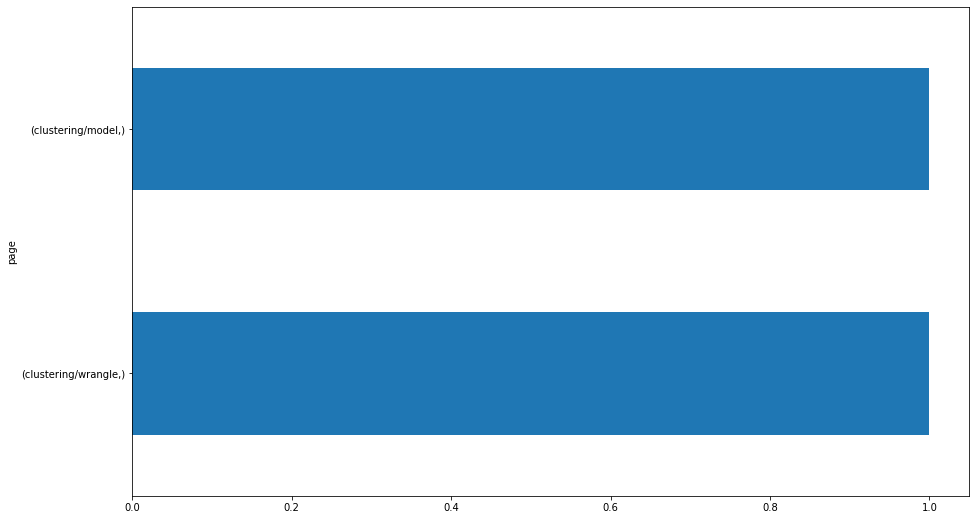


66.69.67.230
page                                          
/                                                 43
timeseries/acquire                                16
clustering/model                                  11
search/search_index.json                          10
stats/compare-group-membership                    10
stats/Selecting_a_hypothesis_test.svg              9
stats/more-statistical-testing-examples            7
classification/scale_features_or_not.svg           5
classification/overview                            5
regression/model                                   5
regression/split-and-scale                         5
timeseries/explore                                 4
timeseries/overview                                4
timeseries/prep                                    4
classification/logistic-regression                 3
regression/feature-engineering                     3
appendix/open_data                                 3
timeseries/working-with-time-series-da

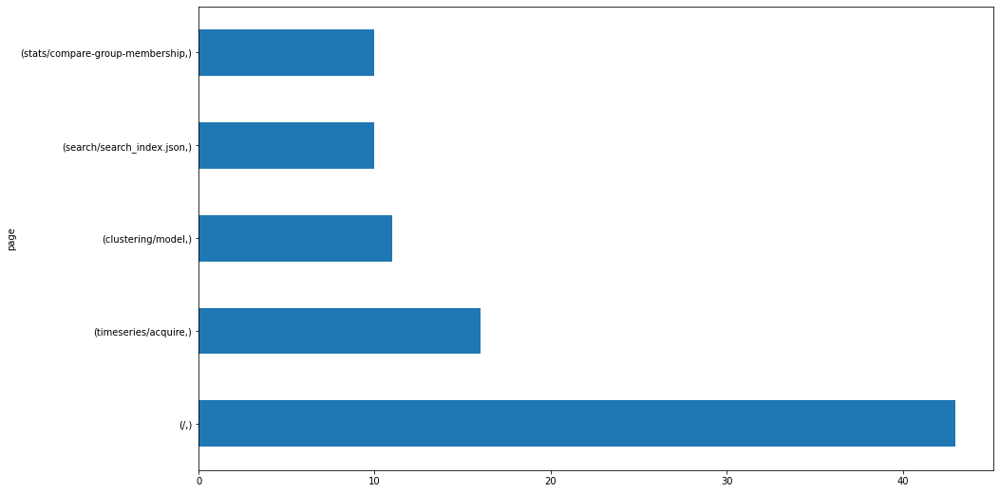


99.203.27.111
page              
clustering/project    1
dtype: int64


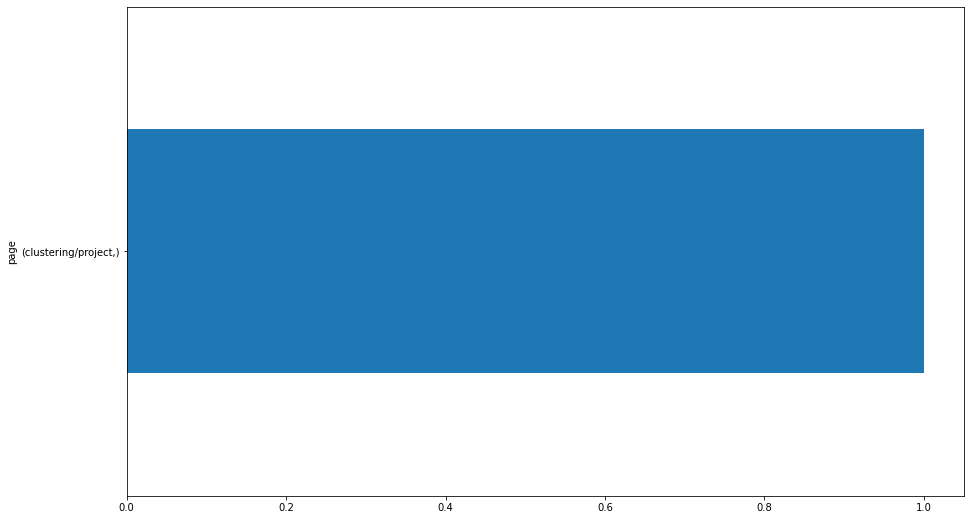


107.77.218.55
page              
clustering/project    1
/                     1
dtype: int64


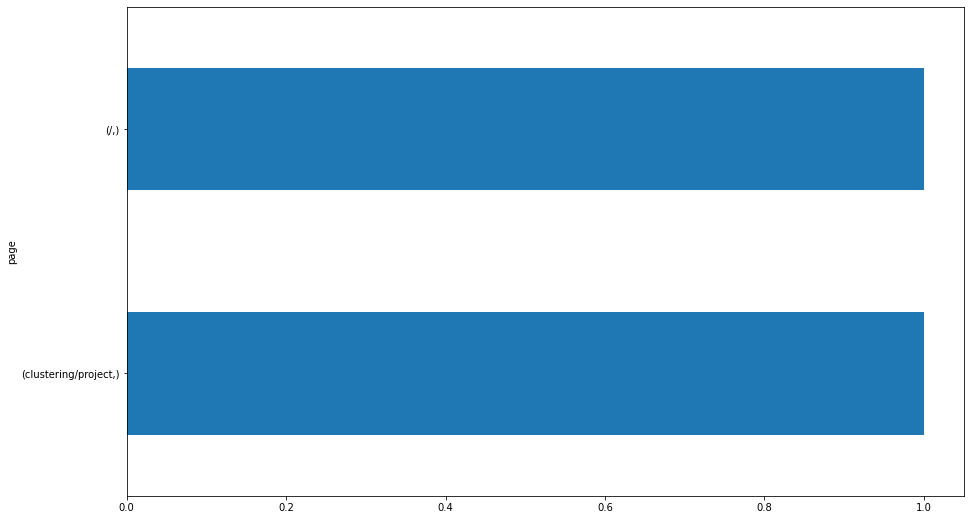


24.54.121.33
page                                 
nlp/model                                3
/                                        2
search/search_index.json                 1
nlp/project                              1
nlp/github_repo_language.gif             1
distributed-ml/ml-with-spark             1
appendix/interview_questions_students    1
dtype: int64


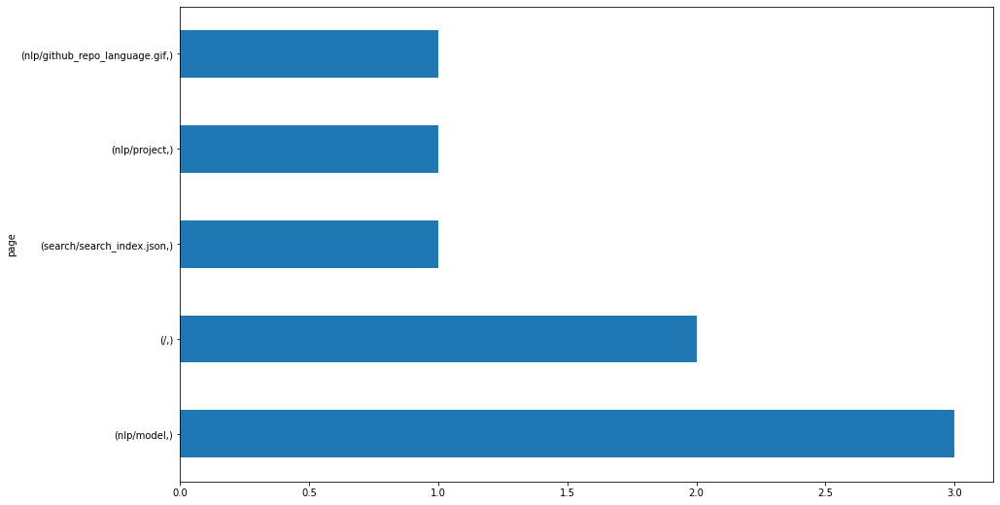


174.197.9.102
page                    
search/search_index.json    1
dtype: int64


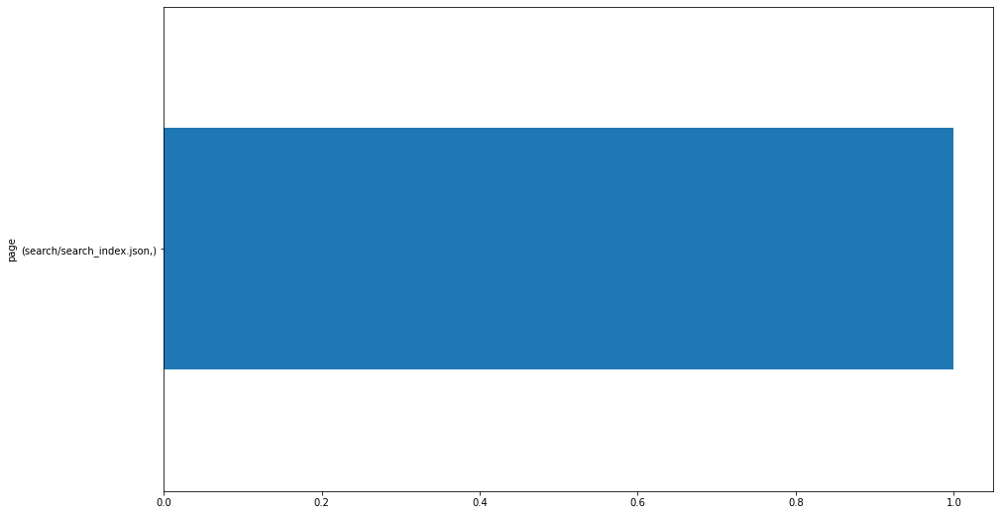


107.77.218.100
page                       
regression/acquire-and-prep    2
clustering/model               2
clustering/explore             2
classification/explore         2
clustering/wrangle             1
clustering/project             1
classification/tidy-data       1
dtype: int64


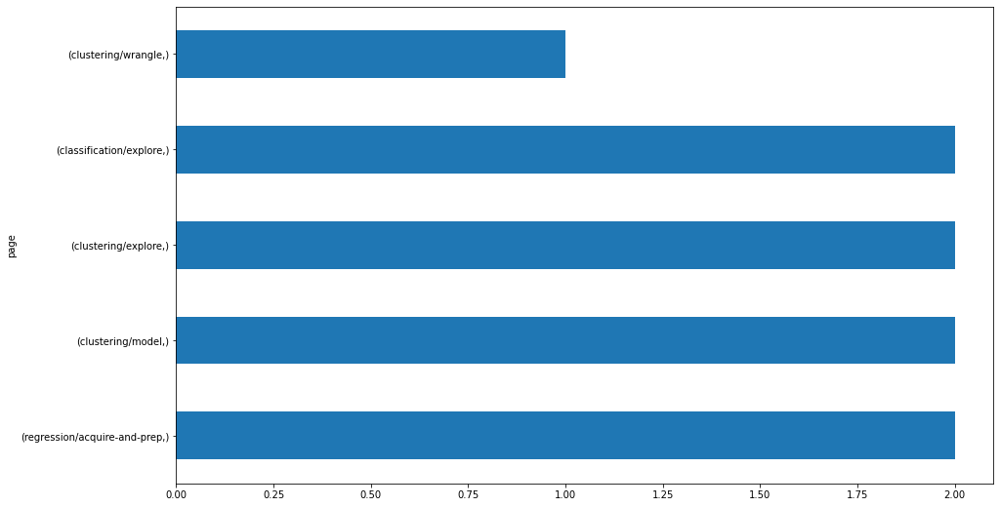


172.58.67.200
page
/       1
dtype: int64


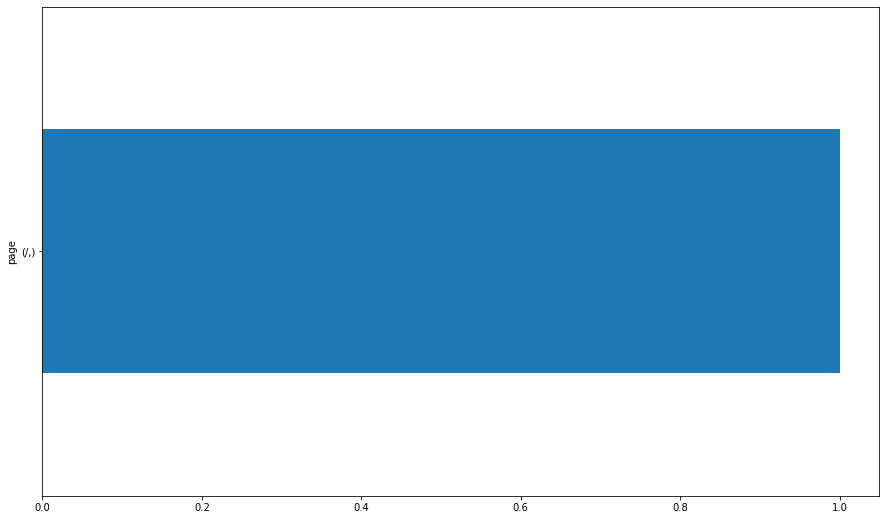


99.203.154.100
page              
clustering/project    1
/                     1
dtype: int64


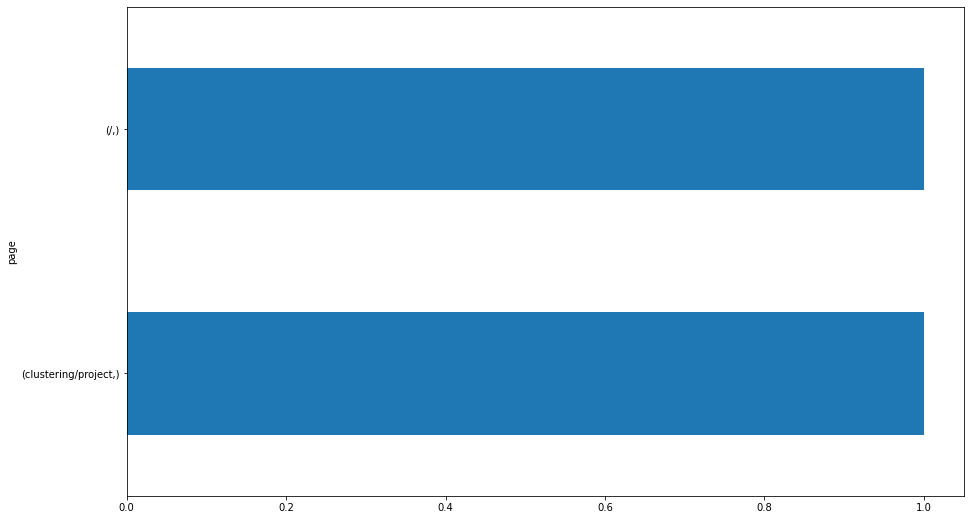


107.77.219.35
page                              
clustering/explore                    2
clustering/model                      1
classification/logistic-regression    1
dtype: int64


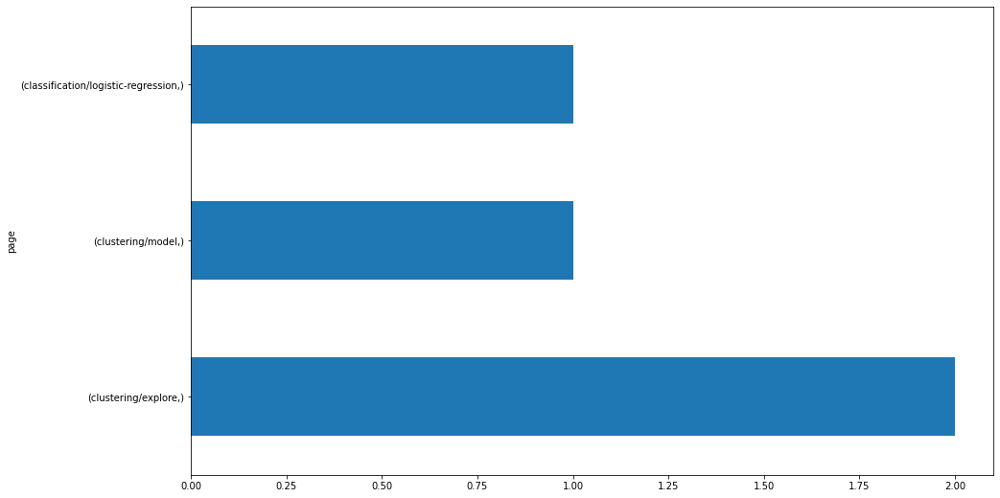


72.191.26.40
page                                          
search/search_index.json                          5
timeseries/acquire                                1
sql/mysql-overview                                1
search                                            1
python/intro-to-seaborn                           1
python/intro-to-matplotlib                        1
nlp/regular-expressions                           1
classification/scale_features_or_not.svg          1
classification/overview                           1
anomaly-detection/overview                        1
anomaly-detection/AnomalyDetectionCartoon.jpeg    1
/                                                 1
dtype: int64


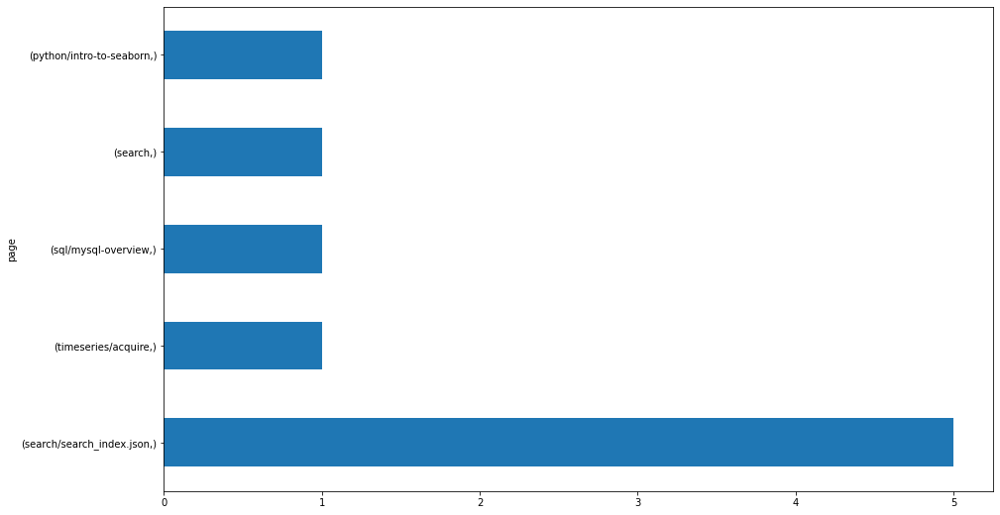


70.120.28.245
page               
sql/database-design    1
/                      1
dtype: int64


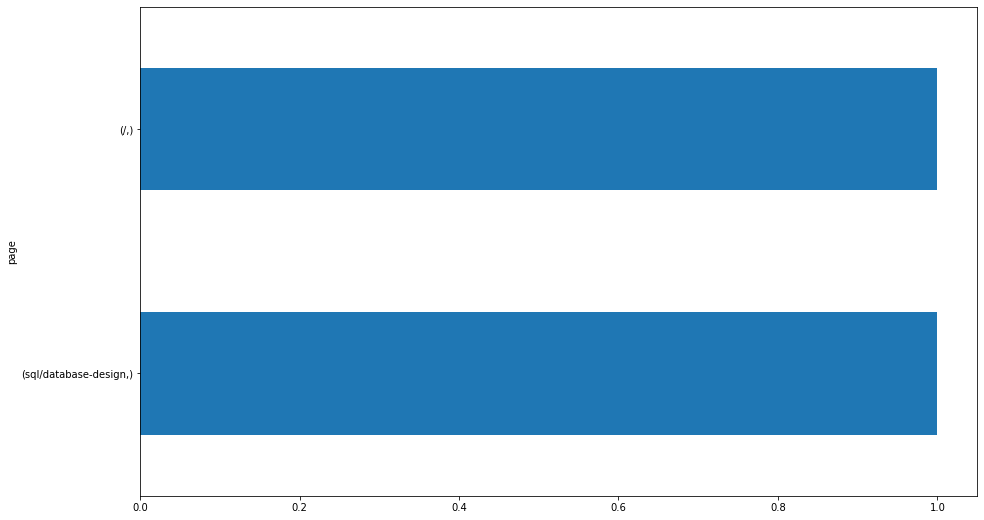


99.203.40.221
page                         
regression/model                 1
clustering/explore               1
classification/decision-trees    1
dtype: int64


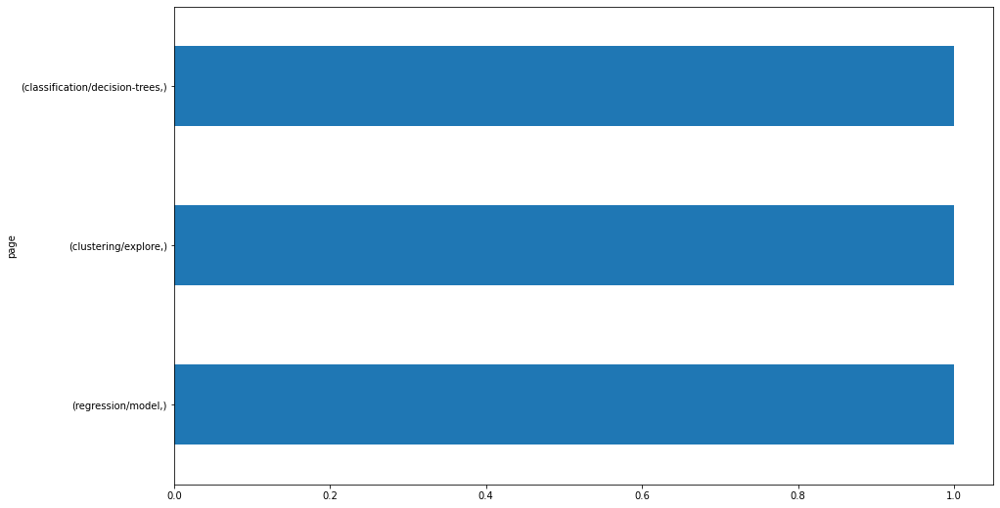


172.58.99.71
page              
timeseries/acquire    1
dtype: int64


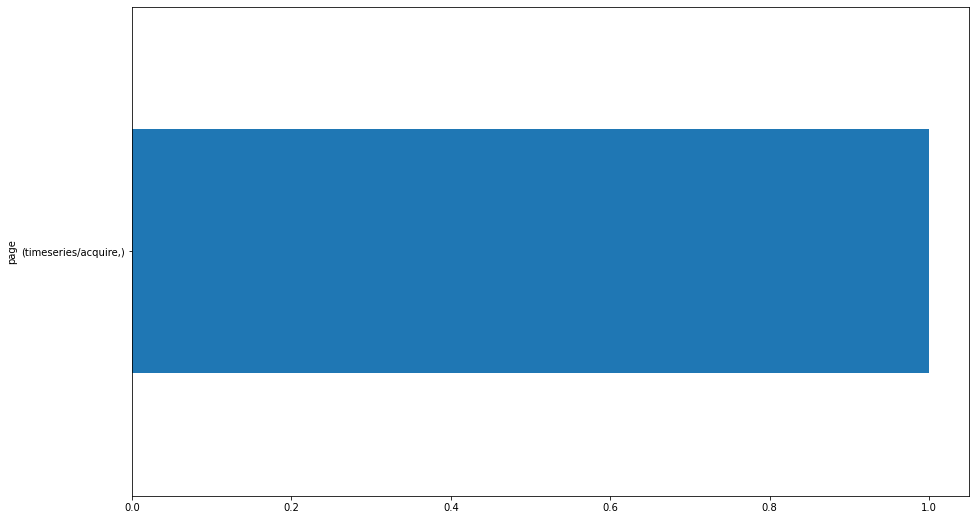


96.8.130.252
page                          
/                                 2
fundamentals/environment-setup    1
dtype: int64


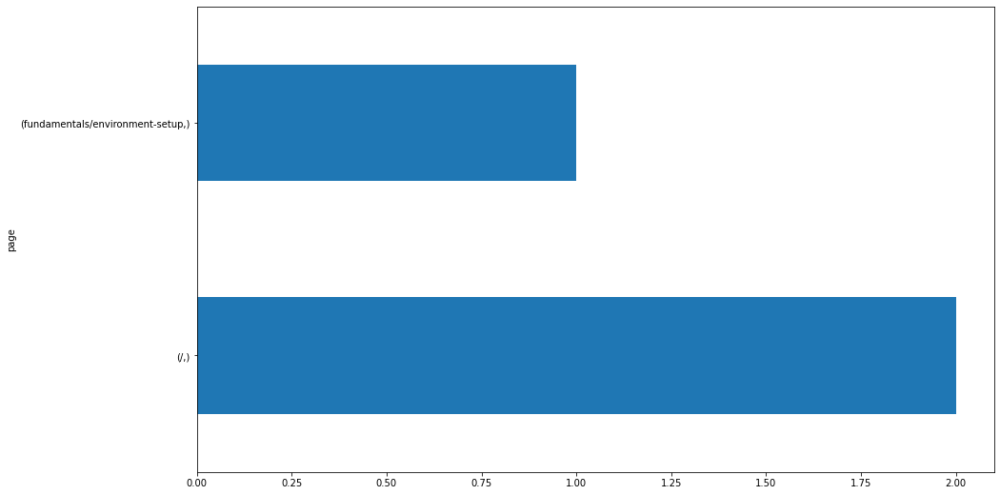


76.186.27.252
page                                     
sql/mysql-overview                           2
classification/overview                      2
classification/scale_features_or_not.svg     2
timeseries/overview                          1
python/ds-libraries-overview                 1
clustering/Hospital-Distance-Clusters.jpg    1
clustering/overview                          1
python/control-structures                    1
python/data-types-and-variables              1
python/functions                             1
stats/overview                               1
python/imports                               1
python/intro-to-matplotlib                   1
python/introduction-to-python                1
python/overview                              1
regression/overview                          1
sql/mysql-introduction                       1
/                                            1
dtype: int64


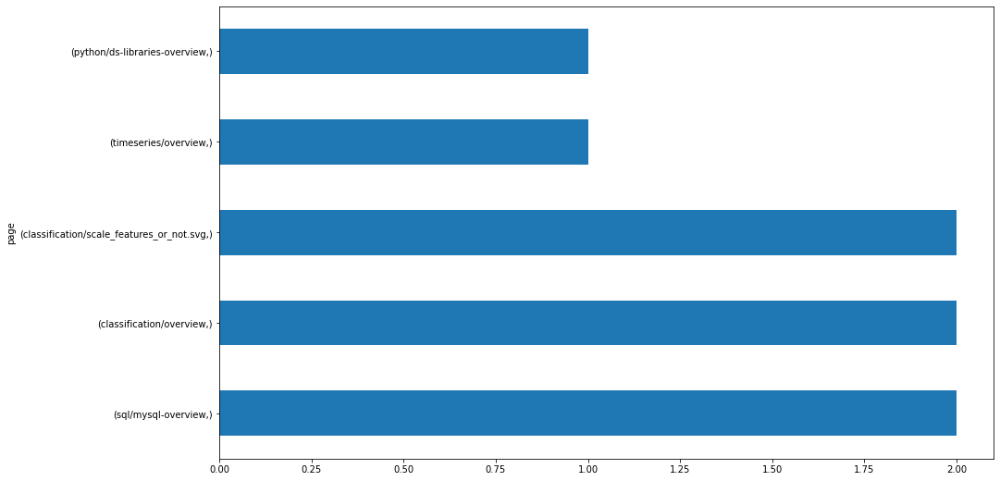


71.146.34.33
page                                    
timeseries/working-with-time-series-data    1
timeseries/acquire                          1
scale_features_or_not.svg                   1
classification/scale_features_or_not.svg    1
classification/overview                     1
classification                              1
dtype: int64


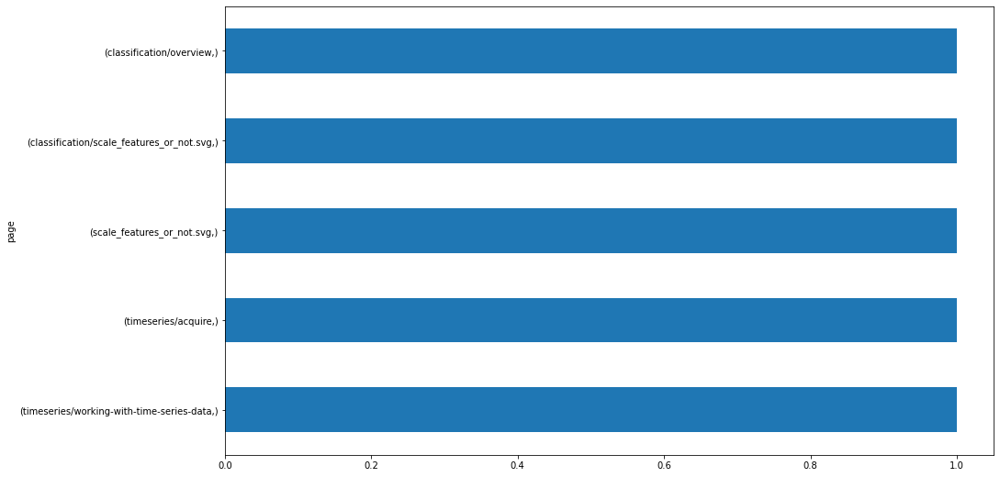


172.58.110.195
page              
timeseries/prep       1
timeseries/explore    1
/                     1
dtype: int64


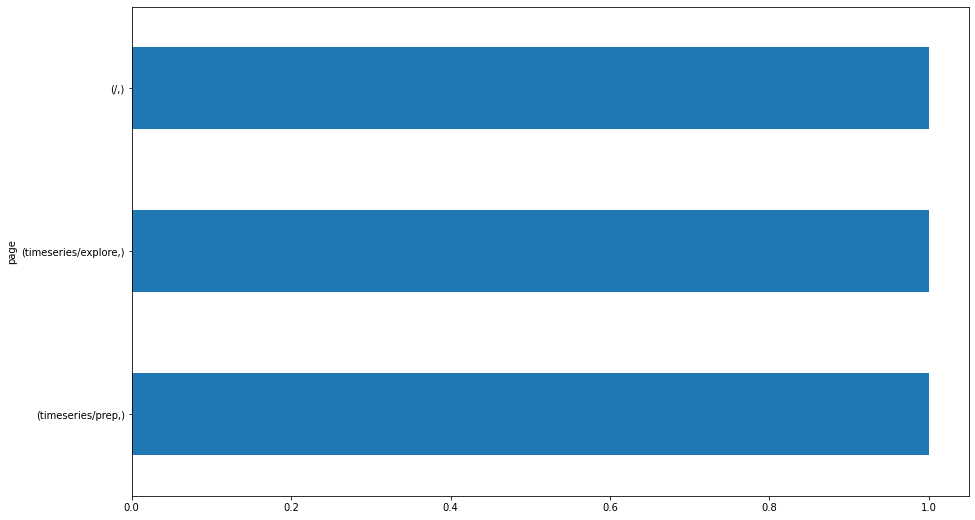


97.77.214.243
page                                          
search/search_index.json                          9
distributed-ml/overview                           2
nlp/project                                       2
nlp/github_repo_language.gif                      2
advanced-topics/cross-validation                  2
distributed-ml/spark-local-mode.svg               2
distributed-ml/spark-execution-diagram.svg        2
distributed-ml/ml-with-spark                      2
distributed-ml/environment-setup                  2
appendix/data-viz-references                      1
advanced-topics/building-a-model                  1
advanced-topics/developing-data-products          1
advanced-topics/virtual-environments              1
anomaly-detection/AnomalyDetectionCartoon.jpeg    1
anomaly-detection/overview                        1
sql/database-design                               1
appendix/interview_questions_students             1
fundamentals/AI-ML-DL-timeline.jpg                1
fu

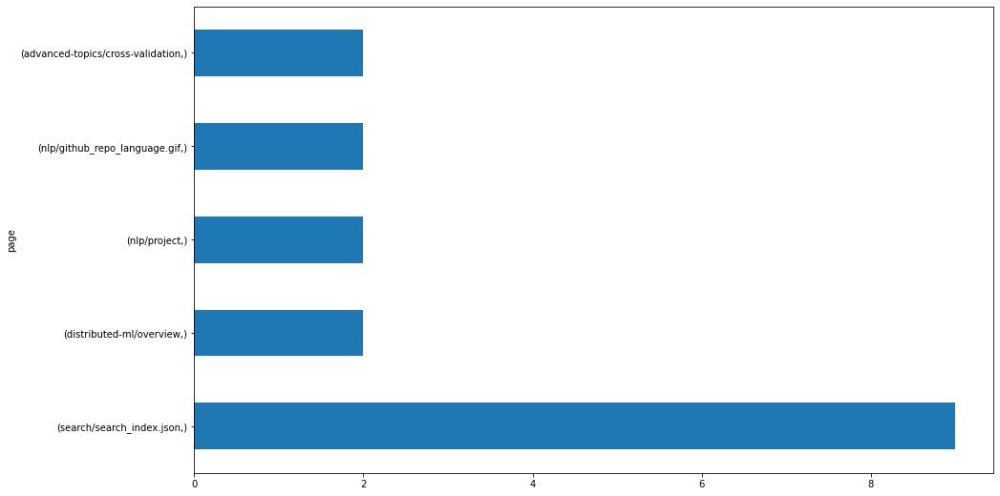


172.58.67.160
page              
timeseries/explore    1
dtype: int64


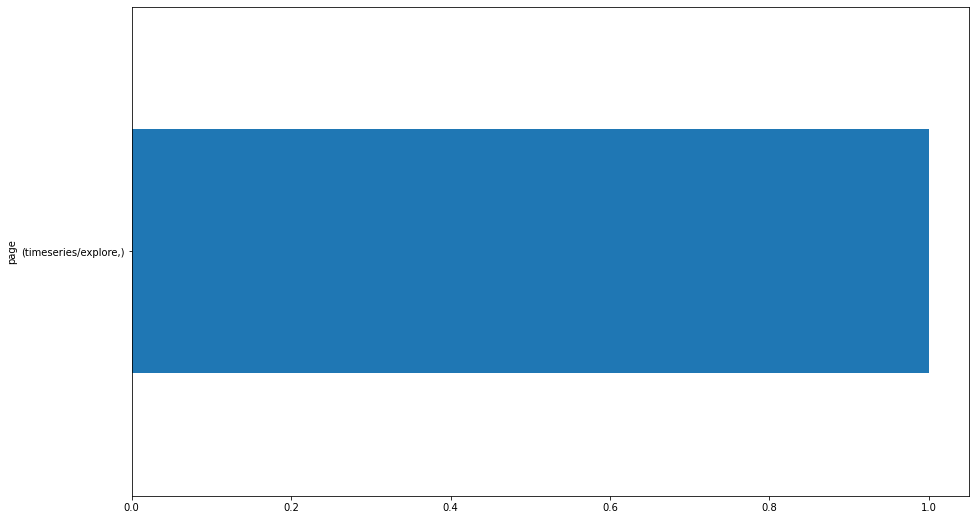


107.13.184.11
page                                            
timeseries/modeling-lesson2                         3
timeseries/modeling-lesson1                         3
timeseries/working-with-time-series-data            2
timeseries/project                                  2
nlp/project                                         1
nlp/github_repo_language.gif                        1
anomaly-detection/overview                          1
anomaly-detection/discrete-probabilistic-methods    1
anomaly-detection/detecting-with-clustering         1
anomaly-detection/detecting-timeseries-anomalies    1
anomaly-detection/AnomalyDetectionCartoon.jpeg      1
/                                                   1
dtype: int64


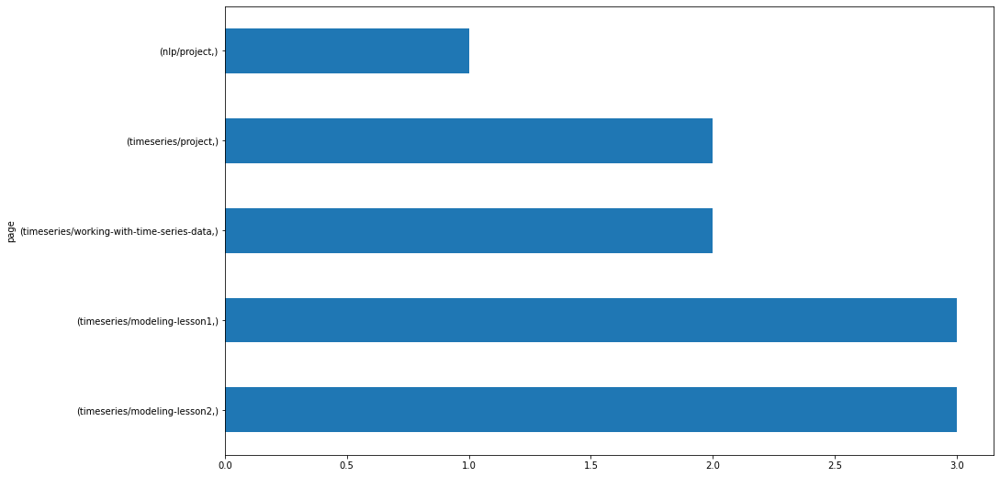


72.128.139.130
page                       
timeseries/modeling-lesson1    2
/                              1
dtype: int64


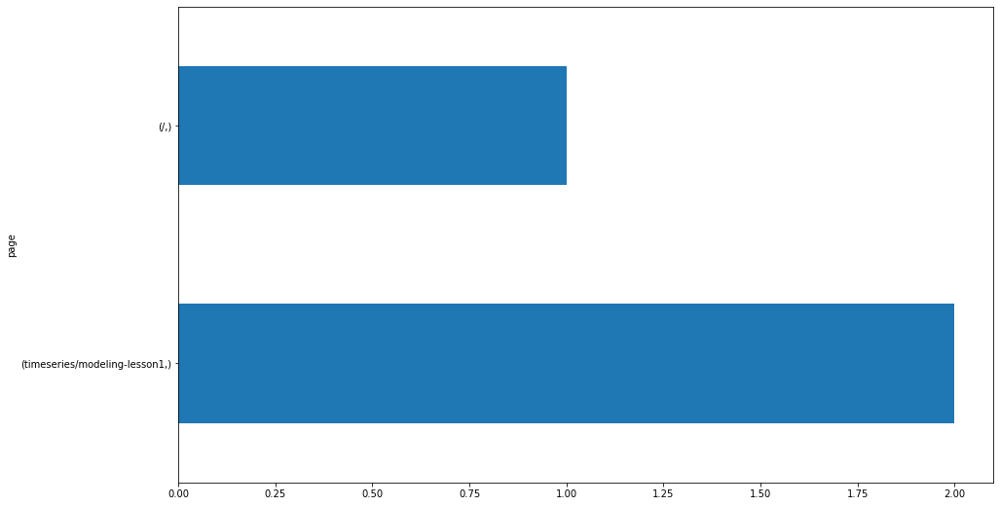


172.58.107.212
page                       
timeseries/modeling-lesson1    1
/                              1
dtype: int64


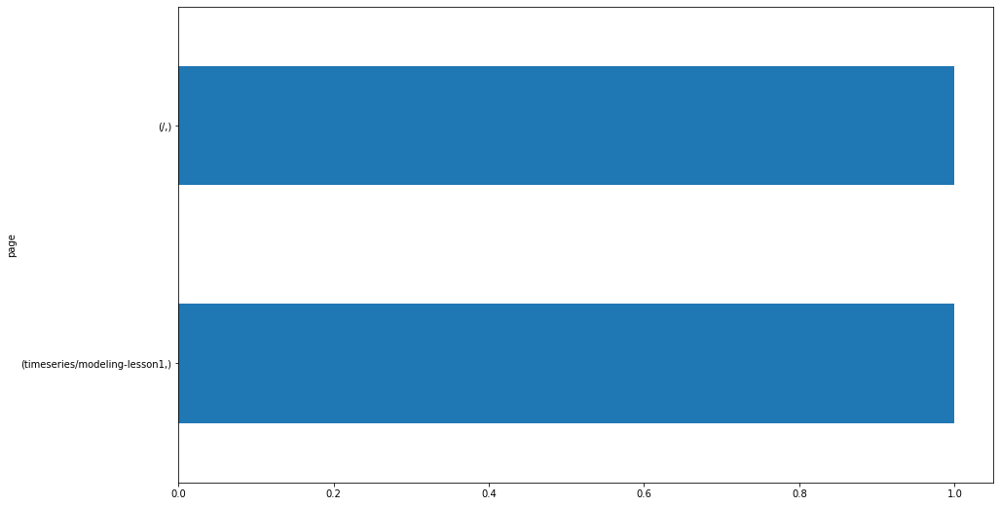

In [49]:

# checking to see if same ip address access curriculums multiple times

for val in list(ds_with_ip.ip.unique()):
    print(val)
    print( ds_with_ip[ds_with_ip.ip == val][['page']].value_counts())
    ds_with_ip[ds_with_ip.ip == val][['page']].value_counts().head(5).plot(kind = 'barh')
    plt.show()
    print()

**Web Dev**

In [51]:
# checking to see if same ip address access curriculums multiple times

for ip in list(web_dev_with_ip.ip.unique()):
    print(ip)
    print( web_dev_with_ip[web_dev_with_ip.ip == ip][['page']].value_counts())
    web_dev_with_ip[web_dev_with_ip.ip == ip][['page']].value_counts().head(5).plot(kind = 'barh')
    plt.show()
    print()

**5. At some point in the last year, ability for students and alumni to cross-access curriculum (web dev to ds, ds to web dev) should have been shut off. Do you see any evidence of that happening? Did it happen before?**

In [52]:
# Lets check if  web dev students cross accessed curriculum


# lets get the unique pages visited in web dev cohorts 
page = list(web_dev.page.unique())

# lets get the unique pages visited in the DS cohorts
key_words = list(ds_df.page.unique())

# lets create a for loop that checks if the unique pages visited by the Web Dev students 
# is in the unique pages visited by the DS students, it will print that page and also count
# of how many times it happened

count = 0
lst = []
for val in key_words:
     if val in page:
        print(val)
        
        count += 1
        lst.append(web_dev[web_dev.page == val].user_id)

        
print(count)
print(lst)

/
3-sql/1-mysql-overview
2-storytelling/bad-charts
2-storytelling/misleading1_baseball.jpg
2-storytelling/misleading1_fox.jpg
2-storytelling/misleading3_deaths.jpg
appendix/cli-git-overview
1-fundamentals/1.1-intro-to-data-science
1-fundamentals/modern-data-scientist.jpg
1-fundamentals/AI-ML-DL-timeline.jpg
1-fundamentals/1.2-data-science-pipeline
1-fundamentals/DataToAction_v2.jpg
search/search_index.json
1-fundamentals/1.3-pipeline-demo
6-regression/1-overview
10-anomaly-detection/1-overview
10-anomaly-detection/AnomalyDetectionCartoon.jpeg
11-nlp/1-overview
6-regression/2-regression-excel
6-regression/3.1-acquire-and-prep
6-regression/3.3-explore
7-classification/6.4-knn
5-stats/1-overview
1-fundamentals/2.2-excel-functions
1-fundamentals/project
1-fundamentals/2.4-more-excel-features
1-fundamentals/2.3-visualization-with-excel
2-storytelling/1-overview
2-storytelling/3-tableau
3-sql/3-databases
3-sql/7-functions
3-sql/8-group-by
2-storytelling/2.1-understand
2-storytelling/2.2-crea

In [ ]:
# checking if DS students cross accesed Web Dev lessons

# lets get the unique pages visited in DS cohorts 
page = list(ds_df.page.unique())

# lets get the unique pages visited in the Web Dev cohorts
key_words = list(wd_df.page.unique())

# lets create a for loop that checks if the unique pages visited by the DS students 
# are in the unique pages visited by the Web Dev students, if so, for each page,  it will print that page and also count
# of how many times it happened

count = 0
lst = []
for val in key_words:
    if val in page:
        print(val)
        
        count += 1
        lst.append(ds_df[ds_df.page == val].date)
        
print(count)
print(lst)

**Takeaways:**
- Cross access capability has not be shut off yet
- Students were found to have been cross accessing the course materials until the last day of this data collection

**6.What topics are grads continuing to reference after graduation and into their jobs (for each program)?**

In [ ]:
# For Data Science Cohorts

# creating a boolean mask of access date greater than the course end date and indexing using that
# boolean mask and get a dataframe of pages and their value counts
ds_df[ds_df.date > ds_df.end_date][['subdir', 'subdir1', 'subdir2']].value_counts().head(15).plot(kind = 'barh')


ds_df[ds_df.date > ds_df.end_date].user_id.value_counts()

In [ ]:
# For Web Development Cohorts


# creating a boolean mask of access date greater than the course end date and indexing using that
# boolean mask and get a dataframe of pages and their value counts

web_dev[web_dev.date > web_dev.end_date][['subdir', 'subdir1', 'subdir2', 'subdir3']].value_counts().head(15).plot(kind = 'barh')


web_dev[web_dev.date > web_dev.end_date].user_id.value_counts()

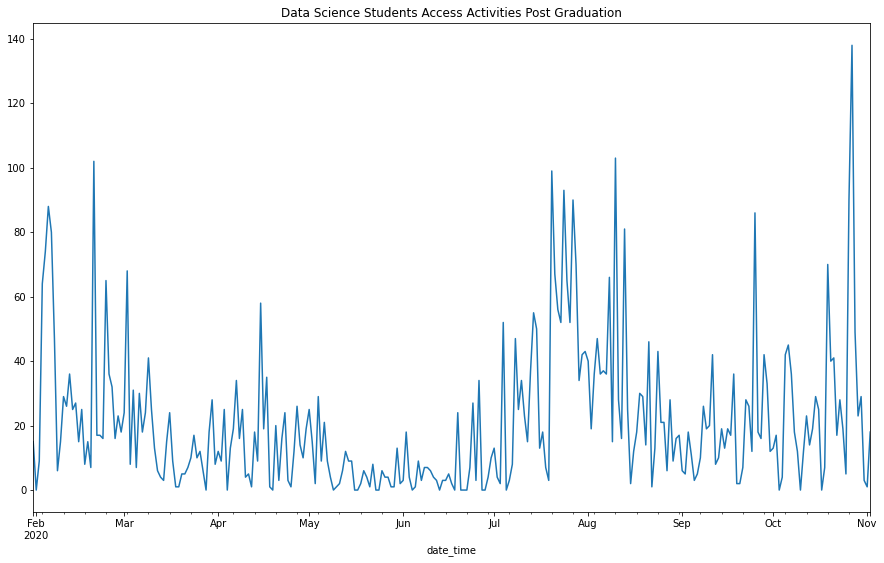

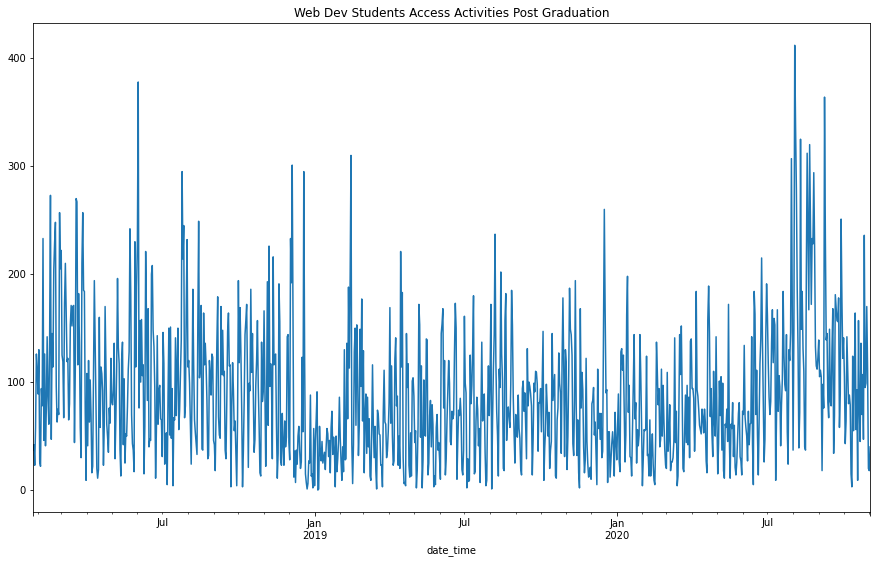

In [56]:
ds_df[ds_df.date > ds_df.end_date].resample('D').page.count().plot()
plt.title('Data Science Students Access Activities Post Graduation')
plt.show()

web_dev[web_dev.date > web_dev.end_date].resample('D').page.count().plot()
plt.title('Web Dev Students Access Activities Post Graduation')
plt.show()

**Takeaways:**
- Students in both programs, post graduation, seem to go over the fundamentals and the basics
- DS students visited the professional development lessons more frequently. Maybe they are preparing for interviews?


**7.Which lessons are least accessed?**

In [ ]:
# For Data Science

# The page visited was broken down to 4 columns
# here we are looking at the broken down page to get the bottom 30 pages in terms of
# number of visits to identify the pages that were least accessed

ds_df[['subdir', 'subdir1', 'subdir2']].value_counts().tail(30).plot(kind = 'barh')

In [ ]:
# for Web Development

# The page visited was broken down to 4 columns
# here we are looking at the broken down page to get the bottom 30 pages in terms of
# number of visits to identify the pages that were least accessed

web_dev[['subdir', 'subdir1', 'subdir2', 'subdir3']].value_counts().tail(40).plot(kind = 'barh')

In [ ]:
# The page visited was broken down to 4 columns
# here we are looking at the broken down page to get the top 10 pages in terms of
# number of visits 

null_df[['subdir', 'subdir1', 'subdir2', 'subdir3']].value_counts().head(10).plot(kind = 'barh')

**Takeaways from null df:**
- Majority of the pages visited by these users match the pages visited by Web Dev students
- Maybe, they are web dev students whose cohort id has been forgotten to input
- More time can be spent to explore this df to get better insights on the activities

In [ ]:
# The page visited was broken down to 4 columns
# here we are looking at the broken down page to get the top 10 pages in terms of
# number of visits 

staff_df[['subdir', 'subdir1', 'subdir2', 'subdir3']].value_counts().head(10).plot(kind = 'barh')

**Takeaways from staff df:**
- the top 10 pages are all related to web development course
- if more time is available, further exploration can be done with this dataframe to get better insights on staff activities